In [1]:
import cv2
import mediapipe as mp
import pickle
import pandas as pd
import numpy as np
from keras.preprocessing import image
from keras.layers import *
from keras.models import Sequential
from keras.applications.resnet import preprocess_input
from sklearn.decomposition import PCA
import math
from keras.models import load_model
import matplotlib.pyplot as plt

In [2]:
class Features:
    def __init__(self,image_path,y):
        self.image_path = image_path
        self.y=y #supervised label for the image
        
    def hand_coordinates(self): # Feature 1 - Hand coordinates using mp-hands
        #initializing mp-hands
        mpHands=mp.solutions.hands
        hands=mpHands.Hands(static_image_mode=False,
                            max_num_hands=1,
                            min_detection_confidence=0.5,
                            min_tracking_confidence=0.5)
        #reading images and getting coordinates
        hand_coordinate_data=[]
        for i in range(len(self.image_path)):
            sign_hand_coordinate=[]
            print(self.image_path[i])
            img=cv2.imread(self.image_path[i],cv2.IMREAD_COLOR)
            if img is not None:
                imgRGB=cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
                results=hands.process(imgRGB)
                if results.multi_hand_landmarks:
                    for handLms in results.multi_hand_landmarks:
                        for id,lm in enumerate(handLms.landmark):
                            sign_hand_coordinate.extend([lm.x,lm.y,lm.z])
                    sign_hand_coordinate.append(self.y[i])
                    hand_coordinate_data.append(sign_hand_coordinate)

        #saving hand coordinate data
        pickle.dump(hand_coordinate_data, open('C:\\Users\\Ayanabha\\Capstone\\Pickles\\hand_coordinate.pkl', 'wb'))
        
    def convolutional_features(self): # Feature 2 - image features after passing it through a CNN
        #creating a cnn
        model = Sequential()
        model.add(Conv2D(64, kernel_size=(3, 3), 
                         input_shape=(200, 200, 3), padding='VALID'))
        model.add(Conv2D(64, kernel_size=(3, 3), padding='VALID'))
        model.add(MaxPooling2D(pool_size=(2, 2)))
        model.add(Conv2D(128, kernel_size=(3, 3), 
                         activation='relu', padding='VALID'))
        model.add(Conv2D(128, kernel_size=(3, 3), 
                         activation='relu', padding='VALID'))
        model.add(AveragePooling2D(pool_size=(19, 19)))
        model.add(Flatten())
        #saving the model
        #model.save('C:\\Users\\Ayanabha\\Capstone\\Models\\cnn.h5')
        #extracting images and getting features
        conv_feature_data=[]
        for i in range(len(self.image_path)):
            print(self.image_path[i])
            img = image.load_img(self.image_path[i], target_size=(200, 200))
            img_data = image.img_to_array(img)
            img_data = np.expand_dims(img_data, axis=0)
            img_data = preprocess_input(img_data)
            conv_feature = model.predict(img_data)
            x=conv_feature[0]
            x=x.tolist()
            x.append(self.y[i])
            conv_feature_data.append(x)
        #saving convolutional feature data
        pickle.dump(conv_feature_data, open('C:\\Users\\Ayanabha\\Capstone\\Pickles\\conv_features.pkl', 'wb'))
    
    def finger_angles_and_conv_features(self): # Feature 3 - angle between the fingers + feature 2
        #initializing mp-hands
        mpHands=mp.solutions.hands
        hands=mpHands.Hands(static_image_mode=False,
                            max_num_hands=1,
                            min_detection_confidence=0.5,
                            min_tracking_confidence=0.5)
        #getting the cnn model
        model = load_model('C:\\Users\\Ayanabha\\Capstone\\Models\\cnn.h5')
        #reading images and getting angles from coordinates
        finger_angle_and_conv_data=[]
        for i in range(len(self.image_path)):
            finger_angles=[]
            sign_hand_coordinate=[]
            print(self.image_path[i])
            img=cv2.imread(self.image_path[i],cv2.IMREAD_COLOR)
            if img is not None:
                imgRGB=cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
                results=hands.process(imgRGB)
                if results.multi_hand_landmarks:
                    for handLms in results.multi_hand_landmarks:
                        for id,lm in enumerate(handLms.landmark):
                            sign_hand_coordinate.extend([lm.x,lm.y,lm.z])
                    #gathering coordinates for angle calculation
                    vertices=[0,3,5,8,12,16,20]
                    vertex_coords=[]
                    for vertex in vertices:
                        point_coord=[sign_hand_coordinate[3*vertex],sign_hand_coordinate[3*vertex+1],sign_hand_coordinate[3*vertex+2]]
                        vertex_coords.append(point_coord)
                    #passing points for angle calculation
                    for j in range(1,len(vertices)-1):
                        if j==2:
                            continue
                        angle=Features.Cosine(vertex_coords[0],vertex_coords[j],vertex_coords[j+1])
                        print(angle)
                        finger_angles.append(angle)
                    #getting convolutional features
                    imag = image.load_img(self.image_path[i], target_size=(200, 200))
                    img_data = image.img_to_array(imag)
                    img_data = np.expand_dims(img_data, axis=0)
                    img_data = preprocess_input(img_data)
                    conv_feature = model.predict(img_data)
                    x=conv_feature[0]
                    x=x.tolist()
                    x.extend(finger_angles)
                    x.append(self.y[i])
                    finger_angle_and_conv_data.append(x)
        #saving finger angle and convolutional data
        pickle.dump(finger_angle_and_conv_data, open('C:\\Users\\Ayanabha\\Capstone\\Pickles\\fac.pkl', 'wb'))
    
    def Cosine(pointA,pointB,pointC):
        #law of cosines for triangles
        a=math.sqrt(sum([pow(i-j,2) for (i,j) in zip(pointA,pointB)]))
        b=math.sqrt(sum([pow(i-j,2) for (i,j) in zip(pointA,pointC)]))
        c=math.sqrt(sum([pow(i-j,2) for (i,j) in zip(pointB,pointC)]))
        res=(a*a+b*b-c*c)/(2*a*b)
        return res
    
    def skin_masking_and_edge_features(self): # Feature 4 - passing image with only hand edges (outline) through a CNN
        #initializing skin rgb range
        lb=(112,54,28)
        ub=(255,219,172)
        edge_features=[]
        #importing cnn model
        model = load_model('C:\\Users\\Ayanabha\\Capstone\\Models\\cnn.h5')
        for i in range(len(self.image_path)):
            print(self.image_path[i])
            #reading an image using OpenCV
            imag=cv2.imread(self.image_path[i])
            if imag is not None:
                imag=cv2.cvtColor(imag,cv2.COLOR_BGR2RGB)
                #creating a color mask
                mask=cv2.inRange(imag,lb,ub)
                result=cv2.bitwise_and(imag,imag,mask=mask)
                filtered_result=cv2.medianBlur(result,3)
                #edge filtering
                edge_result_canny=cv2.Canny(filtered_result,100,200)
                cv2.imwrite('C:\\Users\\Ayanabha\\Capstone\\edge_image.jpg',edge_result_canny)
                #getting feature vector from edge data
                img = image.load_img('C:\\Users\\Ayanabha\\Capstone\\edge_image.jpg', target_size=(200, 200))
                img_data = image.img_to_array(img)
                img_data = np.expand_dims(img_data, axis=0)
                img_data = preprocess_input(img_data)
                conv_feature = model.predict(img_data)
                x=conv_feature[0]
                x=np.append(x,self.y[i])
                edge_features.append(x)
        #saving edge features
        pickle.dump(edge_features, open('C:\\Users\\Ayanabha\\Capstone\\Pickles\\edge_feature2.pkl', 'wb'))
            
    def BRISK_on_hand_edges(self): # Feature 5 - keypoints on edge image
        #initializing skin rgb range
        lb=(112,54,28)
        ub=(255,219,172)
        BRISK=[]
        for i in range(len(self.image_path)):
            print(self.image_path[i])
            #reading an image using OpenCV
            imag=cv2.imread(self.image_path[i])
            if imag is not None:
                imag=cv2.cvtColor(imag,cv2.COLOR_BGR2RGB)
                #creating a color mask
                mask=cv2.inRange(imag,lb,ub)
                result=cv2.bitwise_and(imag,imag,mask=mask)
                filtered_result=cv2.medianBlur(result,3)
                #edge filtering
                edge_result_canny=cv2.Canny(filtered_result,100,200)
                #BRISK
                brisk=cv2.BRISK_create()
                kp,des=brisk.detectAndCompute(edge_result_canny,None)
                #linear combination of descriptors to get representative feature vector
                #initializing feature vector
                feature_vector=[0 for j in des[0]]
                #getting total weight of all keypoints
                total_weight=sum([sum(descriptor) for descriptor in des])
                for descriptor in des:
                    temp=[]
                    proportion=sum(descriptor)
                    alpha=proportion/total_weight #alpha value for current keypoint
                    for k in range(len(descriptor)):
                        temp.append(feature_vector[k]+alpha*descriptor[k])
                    feature_vector=temp
                    feature_vector.append(self.y[i])
                BRISK.append(feature_vector)
        #saving BRISK features
        pickle.dump(BRISK, open('C:\\Users\\Ayanabha\\Capstone\\Pickles\\brisk.pkl', 'wb'))
    
    def CNN_BRISK(self): # Feature 6 - passing keypoint-filled image through a CNN
        #initializing skin rgb range
        lb=(112,54,28)
        ub=(255,219,172)
        BRISK_CNN=[]
        #importing cnn model
        model = load_model('C:\\Users\\Ayanabha\\Capstone\\Models\\cnn.h5')
        for i in range(len(self.image_path)):
            print(self.image_path[i])
            #reading an image using OpenCV
            imag=cv2.imread(self.image_path[i])
            if imag is not None:
                imag=cv2.cvtColor(imag,cv2.COLOR_BGR2RGB)
                #creating a color mask
                mask=cv2.inRange(imag,lb,ub)
                result=cv2.bitwise_and(imag,imag,mask=mask)
                filtered_result=cv2.medianBlur(result,3)
                #edge filtering
                edge_result_canny=cv2.Canny(filtered_result,100,200)
                #BRISK
                brisk=cv2.BRISK_create()
                kp,des=brisk.detectAndCompute(edge_result_canny,None)
                brisk_result=cv2.drawKeypoints(edge_result_canny, kp, None)
                cv2.imwrite('C:\\Users\\Ayanabha\\Capstone\\brisk_edge_image.jpg',brisk_result)
                #getting feature vector from brisk edge data
                img = image.load_img('C:\\Users\\Ayanabha\\Capstone\\brisk_edge_image.jpg', target_size=(200, 200))
                img_data = image.img_to_array(img)
                img_data = np.expand_dims(img_data, axis=0)
                img_data = preprocess_input(img_data)
                conv_feature = model.predict(img_data)
                x=conv_feature[0]
                x=np.append(x,self.y[i])
                BRISK_CNN.append(x)
        #saving BRISK CNN features
        pickle.dump(BRISK_CNN, open('C:\\Users\\Ayanabha\\Capstone\\Pickles\\brisk_cnn5.pkl', 'wb'))
            
            
    def save_features(self): # saving the features as separate csv files for the given dataset
        #hand coordinates
        '''
        data = pickle.load(open('C:\\Users\\Ayanabha\\Capstone\\Pickles\\hand_coordinate.pkl','rb'))
        columns=[]
        for i in range(1,22):
            columns.extend(['x'+str(i),'y'+str(i),'z'+str(i)])
        columns.append('sign')
        df=pd.DataFrame(columns=columns)
        for i in range(len(data)):
            print(data[i][-1])
            df.loc[i]=data[i]
        df.to_csv('Datasets\\imageData_ASL_fingerspell.csv')
        '''
        
        #convolutional features
        '''
        data = pickle.load(open('C:\\Users\\Ayanabha\\Capstone\\Pickles\\conv_features.pkl','rb'))
        t_data=[]
        y=[]
        for i in data:
            l=i.pop()
            y.append(l)
            t_data.append(i)
        #principal component analysis
        X=np.array(t_data)
        pca=PCA(n_components=10)
        x_pca=pca.fit_transform(X)
        columns=[]
        for i in range(len(x_pca[0])):
            columns.append(str(i+1))
        columns.append('sign')
        df=pd.DataFrame(columns=columns)
        for i in range(len(x_pca)):
            row=x_pca[i]
            row=np.append(row,y[i])
            print(y[i])
            df.loc[i]=row
        df.to_csv('Datasets\\imageData2_ASL_fingerspell.csv')
        '''
        
        #convolutional features + finger angles
        '''
        data = pickle.load(open('C:\\Users\\Ayanabha\\Capstone\\Pickles\\fac.pkl','rb'))
        t_data=[]
        y=[]
        for i in data:
            l=i.pop()
            y.append(l)
            t_data.append(i)
        #principal component analysis
        X=np.array(t_data)
        pca=PCA(n_components=10)
        x_pca=pca.fit_transform(X)
        columns=[]
        for i in range(len(x_pca[0])):
            columns.append(str(i+1))
        columns.append('sign')
        df=pd.DataFrame(columns=columns)
        for i in range(len(x_pca)):
            row=x_pca[i]
            row=np.append(row,y[i])
            print(y[i])
            df.loc[i]=row
        df.to_csv('Datasets\\imageData3_ASL_fingerspell.csv')
        '''
        #edge features
        '''
        data = pickle.load(open('C:\\Users\\Ayanabha\\Capstone\\Pickles\\edge_feature.pkl','rb'))
        x_data=[]
        for i in data:
            x_data.append(i.tolist())
        t_data=[]
        y=[]
        for i in x_data:
            l=i.pop()
            y.append(l)
            t_data.append(i)
        #principal component analysis
        X=np.array(t_data)
        pca=PCA(n_components=50)
        x_pca=pca.fit_transform(X)
        columns=[]
        for i in range(len(x_pca[0])):
            columns.append(str(i+1))
        columns.append('sign')
        df=pd.DataFrame(columns=columns)
        for i in range(len(x_pca)):
            row=x_pca[i]
            row=np.append(row,y[i])
            print(y[i])
            df.loc[i]=row
        df.to_csv('Datasets\\imageData4_ASL_fingerspell.csv')
        '''
        #BRISK on hand edges
        '''
        data=pickle.load(open('C:\\Users\\Ayanabha\\Capstone\\Pickles\\brisk.pkl','rb'))
        columns=[]
        count=1
        for i in range(len(data[0])-1):
            columns.append(str(i+1))
        columns.append('sign')
        df=pd.DataFrame(columns=columns)
        for i in range(len(data)):
            print(data[i][-1],count)
            df.loc[i]=data[i]
            count=count+1
        df.to_csv('Datasets\\imageData5_ASL_fingerspell.csv')
        '''
        #CNN features on BRISK image
        '''
        data = pickle.load(open('C:\\Users\\Ayanabha\\Capstone\\Pickles\\brisk_cnn.pkl','rb'))
        x_data=[]
        for i in data:
            x_data.append(i.tolist())
        t_data=[]
        y=[]
        for i in x_data:
            l=i.pop()
            y.append(l)
            t_data.append(i)
        #principal component analysis
        X=np.array(t_data)
        pca=PCA(n_components=15)
        x_pca=pca.fit_transform(X)
        columns=[]
        for i in range(len(x_pca[0])):
            columns.append(str(i+1))
        columns.append('sign')
        df=pd.DataFrame(columns=columns)
        for i in range(len(x_pca)):
            row=x_pca[i]
            row=np.append(row,y[i])
            print(y[i])
            df.loc[i]=row
        df.to_csv('Datasets\\imageData6_ASL_fingerspell.csv')
        '''

In [10]:
x=pickle.load(open('C:\\Users\\Ayanabha\\Capstone\\Pickles\\x_asl_fingerspell.pkl','rb'))
y=pickle.load(open('C:\\Users\\Ayanabha\\Capstone\\Pickles\\y_asl_fingerspell.pkl','rb'))
obj=Features(x,y) #creating a Features object using x and y
obj.finger_angles_and_conv_features() #calling the corresponding function of the feature to be extracted
obj.save_features() #saving the corresponding feature as csv file

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\a\color_0_0002.png
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\a\color_0_0003.png
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\a\color_0_0004.png
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\a\color_0_0005.png
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\a\color_0_0006.png
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\a\color_0_0007.png
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\a\color_0_0008.png
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\a\color_0_0009.png
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\a\color_0_0010.png
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\a\color_0_0011.png
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\a\color_0_0012.png
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\a\color_0_0013.png
D:\Capstone utilities\Datasets\ASL_fingerspelling_da

0.9178726124969498
0.9521928823544527
0.8756810815789489
0.9222410247079331
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\a\color_0_0087.png
0.924471560543176
0.9536401513555144
0.8792823459923393
0.9234479209773928
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\a\color_0_0088.png
0.927835072125964
0.9548687261647844
0.8881940296024502
0.9241351759632923
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\a\color_0_0089.png
0.9294925136193642
0.9557115196204273
0.8849996703392314
0.9259004182154263
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\a\color_0_0090.png
0.921715676681411
0.9471400779151652
0.9069332499483885
0.9375262918307994
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\a\color_0_0091.png
0.9247631950605246
0.9444001156030367
0.8977899355231543
0.9317996192783732
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\a\color_0_0092.png
0.9217199606337964
0.948687548924961
0.8992266256493164
0.932077763815717

0.8077301944892744
0.938986695566502
0.8943079814480874
0.9495538717650682
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\a\color_0_0143.png
0.8695334372292806
0.9425920266050585
0.9053688770090262
0.9442670855630563
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\a\color_0_0144.png
0.900393355473824
0.9504767795131979
0.9162979767531312
0.946518397668116
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\a\color_0_0145.png
0.9247625178654671
0.9462053088850869
0.9043111728218014
0.9455370344476502
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\a\color_0_0146.png
0.9225529163281133
0.945945098696906
0.9175026743152104
0.9472817766729585
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\a\color_0_0147.png
0.9206210083385793
0.9652326020213339
0.9192409358057428
0.9450532100903786
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\a\color_0_0148.png
0.9198484600268736
0.9627910055006512
0.9236791433261909
0.951933744593089

0.9267510565469703
0.9238527744189657
0.8625941337478338
0.9359635526082142
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\a\color_0_0198.png
0.9324885644638005
0.9211598209375521
0.8602360527144249
0.9294574541276565
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\a\color_0_0199.png
0.93961984656872
0.924430068095747
0.850552381088201
0.9199085765342876
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\a\color_0_0200.png
0.9286033604675208
0.9136417245360756
0.8572905420652197
0.9238509714563841
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\a\color_0_0201.png
0.9447785928183678
0.9162594774813527
0.8497061214912728
0.9158323079877269
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\a\color_0_0202.png
0.9336193594700443
0.9089896153278251
0.85620672370624
0.933991839939021
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\a\color_0_0203.png
0.9411253103264239
0.9241350465529956
0.871275836542739
0.9247878292840368
D:

0.9106340958982355
0.9616047975931856
0.9338177962460771
0.9566965166538898
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\a\color_0_0253.png
0.9208309359937392
0.957921586166793
0.932972860526216
0.9550273023522303
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\a\color_0_0254.png
0.916215574365853
0.9566711513212226
0.9378807642427797
0.9578809974117722
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\a\color_0_0255.png
0.9141479425884583
0.9567013607795692
0.9381430360438173
0.9571552586318909
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\a\color_0_0256.png
0.9227619980451743
0.9550191204285335
0.9345742011616398
0.959233961740676
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\a\color_0_0257.png
0.9274547111385385
0.9521867372837652
0.9275111425660282
0.9517030153051993
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\a\color_0_0258.png
0.931280738530202
0.9535514088652159
0.927312987794275
0.9320958387979684


D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\a\color_0_0308.png
0.9237214827281667
0.9394002876847098
0.8944806727299781
0.9390886636475957
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\a\color_0_0309.png
0.9274872972135315
0.9430700415122653
0.8847335754225021
0.9250971664224824
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\a\color_0_0310.png
0.9271074068249104
0.9437184812432498
0.9023040441513661
0.9328994202348723
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\a\color_0_0311.png
0.9276510102077066
0.9467521640444071
0.9099247173493606
0.9385232021934425
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\a\color_0_0312.png
0.9285416018393458
0.9437979471081439
0.9052232228152579
0.9274767325929849
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\a\color_0_0313.png
0.9321822610022962
0.9413324299477368
0.9022146605962343
0.9343131093636727
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\a\color_0_

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\a\color_0_0362.png
0.9335628039059998
0.9603021766734163
0.912349043370679
0.9306483318094683
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\a\color_0_0363.png
0.9317348571430774
0.9498584615106701
0.8976331072578081
0.9301449652398728
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\a\color_0_0364.png
0.9299817774022215
0.9662867682755477
0.9126756899886077
0.9305377062977007
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\a\color_0_0365.png
0.9291246607836096
0.9636743745590983
0.9138138313148069
0.9389721451321202
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\a\color_0_0366.png
0.9449050758883902
0.9617830593007772
0.9196159581250034
0.9364526687585643
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\a\color_0_0367.png
0.9342637391586168
0.967169435843714
0.9307671928246958
0.9399637726889443
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\a\color_0_03

0.8993613339845183
0.9692222549313184
0.9376500714299734
0.9558106948138971
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\a\color_0_0418.png
0.9205059256710922
0.9637364288857131
0.9372726254628982
0.9558590341518617
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\a\color_0_0419.png
0.9143018414944574
0.9673690565251045
0.9377024700598624
0.9552033787443727
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\a\color_0_0420.png
0.8918583735029828
0.9700949991772134
0.9316893981459717
0.9485539094416637
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\a\color_0_0421.png
0.9152113713487603
0.9703431172615116
0.9339443157388343
0.9434927992175036
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\a\color_0_0422.png
0.8747409677837308
0.9649533527403489
0.9341379377969553
0.9588382519583426
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\a\color_0_0423.png
0.8733284618080714
0.9660465205757134
0.9365105379368978
0.95673230907

0.9081070600667335
0.9398246311185067
0.872186396359031
0.9280467039574276
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\a\color_0_0472.png
0.924686212799356
0.9342413031556711
0.8545378543187114
0.9196463752751671
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\a\color_0_0473.png
0.9212991188852123
0.9281264535081257
0.8508289607019343
0.9284785632391895
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\a\color_0_0474.png
0.9215339880715386
0.931556064746839
0.8618463167591476
0.9281952787147264
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\a\color_0_0475.png
0.9098019842446533
0.9372147092312603
0.8553070317115108
0.9314850298445967
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\a\color_0_0476.png
0.9294583573950242
0.9455090736424093
0.8616024742965362
0.9148262514441968
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\a\color_0_0477.png
0.9275242850382516
0.9518113610883863
0.8449239562113962
0.91144518755989

0.9158026716651883
0.9658187145305003
0.9250659390802037
0.9489791754826365
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\a\color_0_0525.png
0.9236203818506757
0.9686389991922043
0.922011586007021
0.9419051223628582
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\a\color_0_0526.png
0.914846517437047
0.9617985406414123
0.9264567625260521
0.9437252858895185
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\a\color_0_0527.png
0.9368745762562984
0.9654608313634153
0.9155370200971703
0.9349213917389693
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\a\color_0_0528.png
0.9259076728523113
0.9654686230101034
0.9135659272302586
0.9265157811560074
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\b\color_1_0002.png
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\b\color_1_0003.png
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\b\color_1_0004.png
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\b\color_1

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\b\color_1_0060.png
0.9417871628140623
0.9852613196347868
0.9865190581598366
0.9721522033918687
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\b\color_1_0061.png
0.9387108175385921
0.9856191635372269
0.9839001656077945
0.9710372668775608
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\b\color_1_0062.png
0.9295974666845249
0.9858612250802373
0.9828317692474415
0.9649494261276288
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\b\color_1_0063.png
0.9348459848356706
0.9859385928147449
0.985090774207059
0.969207039542271
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\b\color_1_0064.png
0.949318102947364
0.9851074043823014
0.9835881879219528
0.9701133345155354
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\b\color_1_0065.png
0.9440460991909748
0.9842530516474755
0.9813013758268218
0.9701537807708944
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\b\color_1_006

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\b\color_1_0115.png
0.9244508748080623
0.9865126375670153
0.9853051896014182
0.9625206650450102
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\b\color_1_0116.png
0.9274891874543109
0.9863324486221343
0.9858955076670112
0.965878004171062
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\b\color_1_0117.png
0.9388134966672909
0.986714539108351
0.9858358095940413
0.9592493857714746
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\b\color_1_0118.png
0.9429429480987802
0.9871246866957248
0.9849753105168986
0.962133220657084
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\b\color_1_0119.png
0.9378689105221834
0.9867852933488709
0.9848601273651901
0.9643159188930533
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\b\color_1_0120.png
0.9372775024872848
0.9866995404687685
0.9846802204116404
0.9525802014488035
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\b\color_1_012

0.937610712259723
0.9877340666529228
0.9849082328210099
0.9587992185894061
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\b\color_1_0170.png
0.9415615463730034
0.9885054234452307
0.9842265321069416
0.9636651560187218
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\b\color_1_0171.png
0.9421316320531754
0.9869945190056916
0.9841398352570777
0.9629256615630187
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\b\color_1_0172.png
0.9416269505691315
0.9887214823804357
0.9860088007165072
0.962268478523379
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\b\color_1_0173.png
0.9384749963322475
0.9867597795211925
0.9830895191770977
0.9556131435220142
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\b\color_1_0174.png
0.9284155926120727
0.9886602471568616
0.98251999726239
0.962833335720411
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\b\color_1_0175.png
0.9482221969630048
0.9850865630613848
0.9816214149306607
0.9591511123919262

0.9023021828069749
0.9907863138572187
0.9936562348285045
0.9911843096812807
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\b\color_1_0224.png
0.9139758656467021
0.9910556976394108
0.9914631654987488
0.9859475951560691
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\b\color_1_0225.png
0.9050392672040818
0.990802340480541
0.9926065497329112
0.9887466162584603
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\b\color_1_0226.png
0.8924355714996354
0.9907979088067591
0.9908992092712667
0.9858508613863597
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\b\color_1_0227.png
0.9014172278017435
0.9895087916386628
0.9925613969577985
0.9903707851358601
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\b\color_1_0228.png
0.8996469148266005
0.9892648741196811
0.9924404405771297
0.9903144361332598
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\b\color_1_0229.png
0.8918963872918629
0.9885434938092714
0.9906139872699835
0.983237964686

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\b\color_1_0279.png
0.9422377182303915
0.9876249859431406
0.990933334573979
0.9784914224775216
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\b\color_1_0280.png
0.9426526207779571
0.9888572001974065
0.9902079466334868
0.9759699722727974
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\b\color_1_0281.png
0.9458833753542853
0.9887595150399174
0.9901379813337698
0.9764364878134058
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\b\color_1_0282.png
0.9467886659525497
0.9890669404287228
0.98854238021344
0.9773067487965621
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\b\color_1_0283.png
0.939995595248124
0.9869395703142784
0.9873658798854722
0.9774923635444254
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\b\color_1_0284.png
0.9366568619248444
0.9867422164323386
0.9876539649359029
0.9733210701384228
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\b\color_1_0285

0.9262497102244638
0.9832186040140001
0.9860651941663418
0.9746790918694013
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\b\color_1_0333.png
0.8947260401652345
0.9837451255599948
0.9857732360832101
0.9743697782363597
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\b\color_1_0334.png
0.9130784337076502
0.9847933553779006
0.9872129172957282
0.9734611517110375
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\b\color_1_0335.png
0.9286240103923791
0.9864513045350516
0.9874085059397656
0.9778031831757082
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\b\color_1_0336.png
0.9210394528574014
0.983868397739969
0.9859578296293751
0.9762125464195252
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\b\color_1_0337.png
0.916751365369163
0.9850075888447487
0.9863948290263406
0.9717048973135919
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\b\color_1_0338.png
0.9243261798413694
0.9851505347069233
0.9833756933747331
0.9706156144927

0.916699384226841
0.9791236691195112
0.9850637576631736
0.9766462838590166
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\b\color_1_0387.png
0.9122205529407381
0.9805017140546941
0.9854204280162944
0.9767151671899963
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\b\color_1_0388.png
0.9195903878365902
0.9785109452444225
0.9819589104705879
0.9778318259893111
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\b\color_1_0389.png
0.9219692094969598
0.9815171200842887
0.9867942376461515
0.973351159518297
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\b\color_1_0390.png
0.9140111233469868
0.9819779031915747
0.9854806830907283
0.9711354362086618
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\b\color_1_0391.png
0.9242684295052704
0.981762440369301
0.9845297284978615
0.9727928868431526
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\b\color_1_0392.png
0.9139927127572421
0.9830079442508285
0.9854412603531094
0.97160944793504

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\b\color_1_0442.png
0.9480264175588028
0.9932280935828719
0.9912599247420898
0.981972487741626
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\b\color_1_0443.png
0.9478146922508343
0.9928817907285088
0.9914945414991344
0.9828267714564703
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\b\color_1_0444.png
0.9500112386801406
0.9933562373913262
0.9916952635662803
0.9832354332967941
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\b\color_1_0445.png
0.9469621833188642
0.9930907125259746
0.9916315992274881
0.9807430667830453
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\b\color_1_0446.png
0.9515296297303186
0.9938576605335404
0.9895017806706274
0.9800475394154693
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\b\color_1_0447.png
0.9458665202257525
0.9916375749888682
0.9904574030813287
0.9806437382320697
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\b\color_1_0

0.9077867193826491
0.9844540209735326
0.9884335572400189
0.9754839445449189
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\b\color_1_0498.png
0.8936692497429811
0.9835687797450025
0.9861598976896239
0.9781560069282533
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\b\color_1_0499.png
0.8859725639024779
0.9829056596999252
0.9865385191097702
0.9745661966208891
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\b\color_1_0500.png
0.9067953145963025
0.9835004885958234
0.9867437487339765
0.9747830006017628
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\b\color_1_0501.png
0.8940986168049311
0.9844953554760234
0.9871465016594971
0.9786205014295596
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\b\color_1_0502.png
0.8939262343427882
0.9833018959554551
0.9873807729436704
0.9764488635232524
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\b\color_1_0503.png
0.897487671254933
0.9828568042200861
0.9876698106246631
0.970997894714

0.7730206786092131
0.9780558908589714
0.9810677126970455
0.9786440765736619
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\c\color_2_0036.png
0.7704303743912818
0.9776771496651332
0.9819872673065108
0.9829563076272265
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\c\color_2_0037.png
0.7689544796210671
0.9760164174382985
0.9824182363570612
0.981341735044294
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\c\color_2_0038.png
0.7918810339113808
0.9782858362921271
0.9835106548273692
0.9851603650084455
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\c\color_2_0039.png
0.7888486235156964
0.971336474867525
0.9793461343657294
0.9848412673280647
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\c\color_2_0040.png
0.7831150248951343
0.9764482742300482
0.9804922124781251
0.9819071355832849
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\c\color_2_0041.png
0.7885053590147536
0.9687555942537405
0.9831648708562452
0.9826252756408

0.8545367567152641
0.9883631337870162
0.9911466783254117
0.9862745046289634
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\c\color_2_0091.png
0.8582581752765732
0.9869419993340602
0.9911105283140155
0.9857708602712772
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\c\color_2_0092.png
0.844155129127957
0.9889592149705209
0.990791789363859
0.9830222767636779
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\c\color_2_0093.png
0.861777126063191
0.9894437129759031
0.991897006570816
0.9857051741167971
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\c\color_2_0094.png
0.8571049982194375
0.9887190984609184
0.9915973853826885
0.9849632121804116
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\c\color_2_0095.png
0.8644593645183563
0.9907056666453006
0.9920306623130228
0.9842697803629324
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\c\color_2_0096.png
0.8597468642607459
0.9886542723865763
0.9907870551657694
0.985826838082449

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\c\color_2_0144.png
0.8012119111681715
0.9728216378389632
0.9831379791341154
0.9818487497517512
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\c\color_2_0145.png
0.7979442366866926
0.9769327494265142
0.9871505581636277
0.9792111212564938
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\c\color_2_0146.png
0.7971619070539467
0.9723204677580757
0.9856036224827819
0.9837092354381848
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\c\color_2_0147.png
0.7975106838275051
0.9726098540153004
0.9858080416714788
0.9834853987332749
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\c\color_2_0148.png
0.8096129077373652
0.9765706530811571
0.9848819168988269
0.9809126582976688
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\c\color_2_0149.png
0.8174861776378848
0.9754520708513201
0.9862817734663182
0.9835839107689605
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\c\color_2_

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\c\color_2_0198.png
0.8225148896661314
0.9675447775526621
0.9865843810842385
0.9873851969859347
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\c\color_2_0199.png
0.8060178121819461
0.9664012302987122
0.9844485893598046
0.9913901394360712
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\c\color_2_0200.png
0.8085062833172674
0.9679766671944368
0.984357485622301
0.9896990553023697
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\c\color_2_0201.png
0.8219219623488748
0.9632559211967355
0.9838520765717276
0.9898424124803034
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\c\color_2_0202.png
0.7990525938881488
0.9636449133968703
0.9822439309408934
0.9889253898956403
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\c\color_2_0203.png
0.7862808166543255
0.9645111929485959
0.9839004282013019
0.9877117835133162
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\c\color_2_0

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\c\color_2_0253.png
0.7826708160243624
0.981963566284807
0.9830203653765011
0.98689046249443
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\c\color_2_0254.png
0.7504535495228579
0.9811650560445743
0.9813398340664105
0.9852296223250466
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\c\color_2_0255.png
0.7629418899280226
0.9812944266598324
0.9761236731306066
0.982547228177784
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\c\color_2_0256.png
0.7552784306361859
0.9832810778005795
0.9811582136347153
0.9819920030219166
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\c\color_2_0257.png
0.7735876421663787
0.986433311911413
0.9808011811126098
0.9774681779120662
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\c\color_2_0258.png
0.7630712928216355
0.9735093375390288
0.9768168808732124
0.9785880803332091
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\c\color_2_0259.

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\c\color_2_0308.png
0.8225875487202432
0.9773330507544468
0.9766071999469972
0.9794730382262504
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\c\color_2_0309.png
0.8290244911712655
0.9773940045439516
0.9786959702659574
0.9754121337167789
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\c\color_2_0310.png
0.8068079315177632
0.9869967943866977
0.9857226617583862
0.9806885967599009
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\c\color_2_0311.png
0.7560972057181792
0.9726513300031251
0.9808251869166157
0.9736866537062027
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\c\color_2_0312.png
0.803015712594139
0.9823394730083969
0.976694999436908
0.9764219586260299
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\c\color_2_0313.png
0.8001383489236903
0.9810306731241202
0.9777471788566181
0.9804170114374412
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\c\color_2_03

0.8387778688205604
0.9743301986892494
0.9845694971316558
0.9845274120271993
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\c\color_2_0364.png
0.80971338262236
0.9769808678093947
0.9838691176265972
0.9832224547167229
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\c\color_2_0365.png
0.8301288423660876
0.9765759931903423
0.9840877716768984
0.9825199096245156
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\c\color_2_0366.png
0.8248493440882232
0.9803715579553476
0.9866826319437114
0.9836217881210497
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\c\color_2_0367.png
0.825026761096993
0.9814498783400704
0.9856777381328083
0.982777514901304
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\c\color_2_0368.png
0.8301877911651597
0.9786378491067155
0.9801531014542636
0.9787205643763921
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\c\color_2_0369.png
0.8583074969047042
0.9841873531589698
0.9858910521670894
0.984854487376898

0.7532698004904592
0.9762307153689175
0.9778474926622327
0.9790542424131411
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\c\color_2_0418.png
0.8791975887922525
0.9729728579854993
0.9794733895372949
0.9786409587322054
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\c\color_2_0419.png
0.8012726357094189
0.9787074589899076
0.9783963921852943
0.9769418719352982
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\c\color_2_0420.png
0.7719911452127666
0.9749799441112769
0.9739922160151024
0.9802208857966429
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\c\color_2_0421.png
0.7616406195465456
0.9828823204259975
0.9770390160656994
0.9811188743364292
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\c\color_2_0422.png
0.7453678032879502
0.9747692137301767
0.9788306483244671
0.9776858438773335
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\c\color_2_0423.png
0.7722938133736048
0.9842189272772462
0.9790401605947361
0.97912906805

0.7957858877639991
0.9611357981130216
0.9753807993397015
0.9830249023578743
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\c\color_2_0472.png
0.7661506782732057
0.9816993303525212
0.9864406729449086
0.9893282355058244
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\c\color_2_0473.png
0.7444518741767742
0.9753731978942695
0.9824931175960575
0.985276374545668
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\c\color_2_0474.png
0.7262759979228264
0.9795739249831217
0.9865750318004589
0.9894070728271791
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\c\color_2_0475.png
0.7151869761546845
0.9719225567846987
0.9845911986217595
0.9847532367908304
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\c\color_2_0476.png
0.724160321169652
0.9772595716442235
0.9853693572748031
0.986563925632
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\c\color_2_0477.png
0.7327640634620816
0.9740149618852559
0.9828995356584191
0.9865818091358662


D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\c\color_2_0528.png
0.7661791165351904
0.979615506633557
0.9852421983978366
0.9870287221543264
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\c\color_2_0529.png
0.7404443090838052
0.9764634633710773
0.982096286443115
0.9863420481816672
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\c\color_2_0530.png
0.7827061288315595
0.9727688831009914
0.9732053229048893
0.9790971665074382
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\c\color_2_0531.png
0.7810317954761865
0.9678541589167253
0.9688192462298292
0.9758836230727449
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\c\color_2_0532.png
0.8033491332145308
0.9835104250320685
0.9814500676671103
0.9787644480823291
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\c\color_2_0533.png
0.7993851358059485
0.9747740908523804
0.9801218264121745
0.9813114186765034
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\c\color_2_05

0.9392473336021485
0.9726692357074971
0.9707008321184023
0.9769311649681406
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\d\color_3_0027.png
0.9232379900019185
0.9664908447614903
0.9695233844822437
0.9787699094287222
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\d\color_3_0028.png
0.9460897091008527
0.9671369136496696
0.9699281702358742
0.9727233063641021
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\d\color_3_0029.png
0.9383170075219565
0.9713241022839163
0.9700993352191668
0.9737524070976573
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\d\color_3_0030.png
0.9314351741949083
0.9688850900959458
0.9676541971097743
0.9788190608077535
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\d\color_3_0031.png
0.93354773981947
0.9663208522633305
0.9630890012907174
0.9770817063283744
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\d\color_3_0032.png
0.9313434820923165
0.9628340071750799
0.9642483354132113
0.9754326881160

0.8540321930605026
0.9279404227179313
0.9673715226696183
0.9576163182544367
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\d\color_3_0081.png
0.8503610819647239
0.9291513531321497
0.9607278773058499
0.94716494776587
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\d\color_3_0082.png
0.851866374896716
0.9499187551626914
0.9670673243068133
0.9664064008238487
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\d\color_3_0083.png
0.8626149540675909
0.9366376789038617
0.9561428286255479
0.9521697923271728
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\d\color_3_0084.png
0.8684202918332601
0.9354325580903997
0.9555161739077986
0.9499352282354915
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\d\color_3_0085.png
0.8644655354046744
0.9453336967558152
0.9531808960569905
0.9527649893966215
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\d\color_3_0086.png
0.876020383744405
0.9464110444643177
0.9638753578744851
0.953757375711035

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\d\color_3_0134.png
0.917822976953144
0.9836057513035773
0.99191844596644
0.9712590927042489
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\d\color_3_0135.png
0.8996362579660143
0.996277946876442
0.992336294187064
0.9849151237635559
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\d\color_3_0136.png
0.9007616749185495
0.9828540574831145
0.9901251604490032
0.9802903198826054
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\d\color_3_0137.png
0.8921520866498442
0.978121730807001
0.9930163908470478
0.9784618210756554
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\d\color_3_0138.png
0.866635805192106
0.9654096507573282
0.9921182464822433
0.9858819040759189
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\d\color_3_0139.png
0.8860719672615928
0.9865644260913552
0.9922663665974996
0.9827424212120968
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\d\color_3_0140.pn

0.9016132717677259
0.9510656893677969
0.9547861375836492
0.9628699672361856
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\d\color_3_0191.png
0.926686386093328
0.9518276465179166
0.9564473617616417
0.9710474485706743
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\d\color_3_0192.png
0.8880680322786277
0.954385252446863
0.9553357288636953
0.9614219468222979
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\d\color_3_0193.png
0.9088444804384008
0.9499241608588419
0.9613024156802644
0.9656492745342348
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\d\color_3_0194.png
0.864526920112615
0.9421712789824892
0.9617111640469235
0.9623263880156522
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\d\color_3_0195.png
0.8768424210071943
0.9433108769426639
0.9605013643466469
0.9641498334501364
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\d\color_3_0196.png
0.8615523304213355
0.9529699409027089
0.9593593184526534
0.95502830713236

0.9518381980562522
0.9820321627345884
0.9811856799857515
0.9926468179304648
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\d\color_3_0247.png
0.942335992395397
0.9822747265790902
0.9773876941585601
0.9839087994081918
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\d\color_3_0248.png
0.9415421288978383
0.9801189247040163
0.9766900055380664
0.9860203238365184
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\d\color_3_0249.png
0.9438089683841733
0.9859278903414194
0.9794028110400385
0.9907615505341474
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\d\color_3_0250.png
0.943525885204893
0.9819847610632122
0.9827671264404165
0.9868213864832934
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\d\color_3_0251.png
0.9513336022926671
0.9849773493790946
0.9788622052591259
0.9929301124817002
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\d\color_3_0252.png
0.9167424456597343
0.9799974084039825
0.980849005091895
0.98430600331842

0.8981966796133726
0.9548914324270004
0.970725698450194
0.9645916132668975
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\d\color_3_0301.png
0.9049431516277324
0.9490104234386055
0.9674366722391551
0.9679730849610193
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\d\color_3_0302.png
0.9001378864274304
0.9568097381037538
0.964032477832496
0.9700756197239587
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\d\color_3_0303.png
0.9100535968815219
0.9551616315380452
0.9588324111527797
0.9628404064073653
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\d\color_3_0304.png
0.9054401894872486
0.9567599283801268
0.9665318404576106
0.97268229006929
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\d\color_3_0305.png
0.9000662907419553
0.9567090209532966
0.9586921612786388
0.9725881966359792
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\d\color_3_0306.png
0.899083100974489
0.9608843778453992
0.961838038026192
0.9664698302061372


D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\d\color_3_0354.png
0.877674878340056
0.9435059854921882
0.9469931333288988
0.9620183457855929
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\d\color_3_0355.png
0.8856624580078676
0.9479332551044239
0.9555912827224499
0.9483672330013875
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\d\color_3_0356.png
0.8946347714445048
0.9586901025979958
0.9452393416298317
0.9508070817971928
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\d\color_3_0357.png
0.8968529439485508
0.9556660247271203
0.9491937280963075
0.9514254022722763
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\d\color_3_0358.png
0.8916346043028873
0.9538880312087233
0.9587368785483367
0.9487607073776726
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\d\color_3_0359.png
0.8883549590728985
0.9480388511711056
0.9419119677614266
0.952479277069241
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\d\color_3_03

0.8803663877565087
0.9118368829538911
0.9399787999550038
0.9770896797546232
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\d\color_3_0408.png
0.869331268234335
0.9331503197334117
0.9439908553106557
0.964818587565385
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\d\color_3_0409.png
0.8554110351658718
0.917445179709017
0.9473552488924751
0.970310047047255
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\d\color_3_0410.png
0.8631698927502475
0.9173680966763531
0.9406795595404553
0.9688469694733158
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\d\color_3_0411.png
0.8576332403773059
0.912679960115967
0.9455920428303898
0.9761739395859004
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\d\color_3_0412.png
0.8454034768846374
0.9053048842322511
0.9421145181515064
0.9682898981537664
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\d\color_3_0413.png
0.8462143482341181
0.91083403717045
0.9398082683546475
0.9686054675727451
D

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\d\color_3_0461.png
0.9083645013217942
0.9500163830660279
0.9663405237634881
0.9739373194429007
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\d\color_3_0462.png
0.9140669077188793
0.9576548831099176
0.9653654780442615
0.9720952881169764
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\d\color_3_0463.png
0.9197389351200286
0.9523985194288271
0.9693694515978784
0.9684960622547691
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\d\color_3_0464.png
0.9097976902046798
0.9589493460132132
0.9631511207094618
0.96816956461017
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\d\color_3_0465.png
0.908555523772755
0.9557476781210541
0.9674677849962312
0.9687822049631488
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\d\color_3_0466.png
0.8915308706059436
0.9581877186046591
0.9664438003275864
0.9526316886497166
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\d\color_3_046

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\d\color_3_0515.png
0.896647037548382
0.9581972800562586
0.9638543859148954
0.9695564978227822
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\d\color_3_0516.png
0.8854272785573539
0.9590033862655185
0.967562367879557
0.9721087106914104
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\d\color_3_0517.png
0.8878713541784732
0.9581329798561461
0.9718479553757462
0.9684359021039992
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\d\color_3_0518.png
0.882144060732902
0.9484373844283677
0.9730157086361474
0.9674790922666928
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\d\color_3_0519.png
0.8646571327000835
0.9441758021234667
0.9843345924034872
0.9780583581319761
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\d\color_3_0520.png
0.8520688525403254
0.9328945044072996
0.9904800432928204
0.9793720136173778
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\d\color_3_052

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\e\color_4_0035.png
0.9526428220042955
0.985337483244246
0.9742012136019937
0.9620458543374938
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\e\color_4_0036.png
0.9454638194439204
0.9762335589453824
0.9780455296647026
0.9707411748253529
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\e\color_4_0037.png
0.9353613031919155
0.9742054081920514
0.9707304373882111
0.9622109131008078
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\e\color_4_0038.png
0.94857011844643
0.980532140123347
0.9733167389720018
0.9671438273684729
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\e\color_4_0039.png
0.9610393948764288
0.9832413130939958
0.9757907506963498
0.9634122247228183
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\e\color_4_0040.png
0.9509383705496528
0.9798378859210836
0.9712333937691295
0.967713611193157
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\e\color_4_0041.

0.8547824377126204
0.970791840515397
0.9450996454660994
0.9604819830811034
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\e\color_4_0091.png
0.8930661618147804
0.9681882980813695
0.9383847997731498
0.9497869260171131
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\e\color_4_0092.png
0.8815494982959667
0.9733406940203725
0.948724786705964
0.9527835039127422
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\e\color_4_0093.png
0.892675205981481
0.9731472904440821
0.9447855472856477
0.9519194836727464
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\e\color_4_0094.png
0.8918772098240914
0.9694760826661837
0.9462531301987127
0.9458987980395305
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\e\color_4_0095.png
0.9112655547742324
0.9680190528621667
0.9424258491688201
0.9616909891648444
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\e\color_4_0096.png
0.9058191706482019
0.9710361351417106
0.9253431531366026
0.94162626541259

0.9791795228355179
0.9606134589198795
0.9613478661520712
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\e\color_4_0145.png
0.8573416042390745
0.9709893860813464
0.957416684562367
0.9692942947896956
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\e\color_4_0146.png
0.882654736354603
0.9713450067506594
0.9530498830229739
0.9703687583499052
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\e\color_4_0147.png
0.8693467797158391
0.9735752902965443
0.956605692990347
0.9603522264951291
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\e\color_4_0148.png
0.8896953229528735
0.9686660314013527
0.9536876260244672
0.969024667381042
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\e\color_4_0149.png
0.8675700867580742
0.9592785250513983
0.9550916393294641
0.9607888120237064
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\e\color_4_0150.png
0.8602188112858864
0.9629338762235586
0.9500981884550086
0.9693249350092124
D:\Capstone utili

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\e\color_4_0199.png
0.8548722682142362
0.9909109735475934
0.9696234905612575
0.9520400882459354
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\e\color_4_0200.png
0.8714663472926167
0.9946504557602456
0.9767667375603762
0.968756561986242
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\e\color_4_0201.png
0.8904689535604534
0.9898367558174744
0.9714742218365162
0.952114416220439
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\e\color_4_0202.png
0.9021853531845477
0.9907249014629352
0.9782465701371449
0.9621394107725602
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\e\color_4_0203.png
0.8897833252535011
0.989885736683806
0.981967203511392
0.9516470795737665
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\e\color_4_0204.png
0.8675656614978873
0.990535109190114
0.9806637990923378
0.9375280219007169
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\e\color_4_0205.

0.948286598100359
0.9828778464077921
0.9728173988677169
0.9765248637387784
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\e\color_4_0254.png
0.9624643038674545
0.9880658372236284
0.969265034212347
0.9673938498720298
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\e\color_4_0255.png
0.9559527936980907
0.9832611686628171
0.969549384616702
0.9747084188484988
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\e\color_4_0256.png
0.9565312213446977
0.9742656629484128
0.9667295488488932
0.9803056342764919
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\e\color_4_0257.png
0.9659425346658538
0.9777617103304702
0.9669747672884913
0.9770485231663486
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\e\color_4_0258.png
0.9594134521648067
0.9708338298006459
0.9655894623692989
0.9812156167615572
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\e\color_4_0259.png
0.9745185248171349
0.9783364823482974
0.9774004892924042
0.97072496971915

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\e\color_4_0307.png
0.9593748560455805
0.979227504481017
0.9693835837762845
0.9689259180707742
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\e\color_4_0308.png
0.9672273240060613
0.9761385765612385
0.9695759801637271
0.9731601822505714
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\e\color_4_0309.png
0.9607057130452964
0.9712098726046976
0.9703797822078962
0.9762085011627771
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\e\color_4_0310.png
0.9698904916636854
0.9689530457269042
0.964252690442752
0.9689004430758503
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\e\color_4_0311.png
0.9583366971790528
0.9657977086691758
0.968173881806163
0.9691152041846534
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\e\color_4_0312.png
0.9660728632088583
0.9730050797530377
0.9726723130958432
0.9690666879925427
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\e\color_4_031

0.9428541703525523
0.9655562790517099
0.958389402193337
0.9651139380258225
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\e\color_4_0363.png
0.948327420150156
0.9568005850527093
0.9599399669557781
0.968897059408628
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\e\color_4_0364.png
0.9543206674287021
0.9606891695722504
0.9606172900324305
0.9708225374049496
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\e\color_4_0365.png
0.9462467113808107
0.967052692487613
0.9600930468805706
0.968407794333694
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\e\color_4_0366.png
0.9346214517933562
0.9676058612613342
0.9611204862106647
0.9712379872991728
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\e\color_4_0367.png
0.9500179024239449
0.967144788195981
0.9645237551377482
0.9724909073022583
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\e\color_4_0368.png
0.9235016130825671
0.9705778771872546
0.9665252127161084
0.9693709253938004


D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\e\color_4_0417.png
0.9334356507268555
0.9659883567127978
0.9528679100187984
0.9495290962540772
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\e\color_4_0418.png
0.9271907652283946
0.950441119304374
0.9394203768979412
0.9563186361406865
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\e\color_4_0419.png
0.9338957764057003
0.9619747717279088
0.9459145898615995
0.9528284456075703
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\e\color_4_0420.png
0.9477166005642004
0.9581921876555815
0.9474500668874876
0.9492371741510638
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\e\color_4_0421.png
0.9400016546976205
0.9634490713730325
0.9478472128267369
0.9576618921247784
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\e\color_4_0422.png
0.9365572401281973
0.9614097630561624
0.9400113696867469
0.9522827001748608
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\e\color_4_0

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\e\color_4_0470.png
0.9247560842969282
0.9625961666761422
0.9512159698996949
0.9627259655400475
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\e\color_4_0471.png
0.9429114773421824
0.9685018766464116
0.9588378640797277
0.9651144408306418
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\e\color_4_0472.png
0.9283678260429606
0.971882481755715
0.9628625102501448
0.9658495572985848
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\e\color_4_0473.png
0.9421737833002625
0.9766832878752008
0.9571647189059166
0.9635774843309373
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\e\color_4_0474.png
0.9382869790867744
0.9674280896885259
0.9535696513142748
0.960051689803591
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\e\color_4_0475.png
0.9412702477960437
0.9750173713742523
0.9592209781959337
0.9665520885732363
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\e\color_4_04

0.856116720736194
0.8457116401693733
0.9611826723064355
0.9126217732070463
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\f\color_5_0003.png
0.8222840488529723
0.8439523985037172
0.9468026765106811
0.9215772250935723
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\f\color_5_0004.png
0.8199368817111072
0.8507846891806473
0.9369640158210402
0.9109600601908968
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\f\color_5_0005.png
0.834197596509533
0.8466175388205496
0.9462279068848536
0.9046515548843875
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\f\color_5_0006.png
0.8493342789751901
0.8600954088788616
0.9438077749853422
0.9067134687674391
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\f\color_5_0007.png
0.8435891564888225
0.8605567049669853
0.9413972073747371
0.9133955147524505
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\f\color_5_0008.png
0.8374759188730143
0.8466384446262158
0.9439738825291766
0.9036959998819

0.9037673884199106
0.9124636561974037
0.937699559532674
0.907800948458951
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\f\color_5_0056.png
0.9167892491672948
0.9133873581015334
0.9442208637981389
0.8986593457573202
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\f\color_5_0057.png
0.9114055423895725
0.9294421696850494
0.9469890805812508
0.9021379234104216
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\f\color_5_0058.png
0.9248539205253179
0.9367411544531119
0.942870617052805
0.899927501525557
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\f\color_5_0059.png
0.9089139202691581
0.9266353477253731
0.9483468765897817
0.9016788139108257
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\f\color_5_0060.png
0.8994543437560921
0.9063906323655301
0.9497384072890058
0.8978407349912692
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\f\color_5_0061.png
0.9131088702485155
0.9120019404387659
0.9506972861124963
0.897202676819670

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\f\color_5_0109.png
0.8560888857400565
0.8834642131031392
0.930453429754224
0.8887768866439713
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\f\color_5_0110.png
0.8771962803015595
0.8872964787156646
0.9361036416772972
0.8895199179219823
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\f\color_5_0111.png
0.8615700818020612
0.8846268381474746
0.9336104853728513
0.8982278925991789
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\f\color_5_0112.png
0.8702930030609065
0.8894535058018567
0.9406260270728848
0.896379004979312
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\f\color_5_0113.png
0.8822074838404792
0.8923986214858255
0.9393235275347692
0.9045477932769165
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\f\color_5_0114.png
0.8798593356983088
0.8818655892082975
0.9419953156602678
0.8999903446536774
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\f\color_5_01

0.8334999367908137
0.8762667836544591
0.9518754361116982
0.86778980254933
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\f\color_5_0165.png
0.8308477920067286
0.861624798435215
0.9434104948988478
0.8789976212752533
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\f\color_5_0166.png
0.8398405534351261
0.8693583162189413
0.9467223478988894
0.8792548402599687
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\f\color_5_0167.png
0.8296386245334993
0.8629295928518438
0.945635099193505
0.8844462220182195
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\f\color_5_0168.png
0.8169598241082588
0.8391384366017687
0.9454740405235383
0.8927030606199174
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\f\color_5_0169.png
0.8456435422463939
0.8390449949667298
0.9387978027930982
0.8922910223923783
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\f\color_5_0170.png
0.8284666239215563
0.8211900353684173
0.9343568535977007
0.893979082298139

0.8231927280042406
0.880348896121617
0.9513538279999307
0.88888030075445
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\f\color_5_0219.png
0.7928214701529349
0.8292890156748632
0.9447296707286701
0.8780003227445191
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\f\color_5_0220.png
0.8141721119315919
0.8442014590756299
0.9388591121441598
0.8700088806487246
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\f\color_5_0221.png
0.8204442867455124
0.8568766645492502
0.9314289411535387
0.8659932786065163
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\f\color_5_0222.png
0.8173328691135072
0.8637846607494082
0.9245650045609047
0.8635024102728507
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\f\color_5_0223.png
0.8464010149331718
0.861545411642866
0.9237974196083465
0.8662671993332642
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\f\color_5_0224.png
0.8332726120759724
0.8475809710808319
0.9241262319037665
0.850034163373443

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\f\color_5_0272.png
0.74137181596634
0.8636524215633381
0.9448458533229311
0.889268259250293
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\f\color_5_0273.png
0.7405010848761426
0.8533376916631721
0.9415397243331669
0.8834064996262343
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\f\color_5_0274.png
0.7377600833110565
0.8435561892096183
0.9448817744730783
0.8695504202353677
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\f\color_5_0275.png
0.7565080071055852
0.8583321632992806
0.9411655036003163
0.8675147501080748
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\f\color_5_0276.png
0.7661424006030171
0.8570862047942628
0.9394886500684329
0.856973432546017
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\f\color_5_0277.png
0.763630772522102
0.821065538951709
0.9390437375931869
0.8527729927730462
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\f\color_5_0278.p

0.7650966383637681
0.8391821983075755
0.9593997056616579
0.902023051275133
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\f\color_5_0326.png
0.7452258958577506
0.8683744353413486
0.9498338640294532
0.9215078871436496
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\f\color_5_0327.png
0.7279952276255814
0.8342798840000673
0.9584951775411181
0.9196624573102887
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\f\color_5_0328.png
0.7427407983191804
0.8682901317972908
0.9544997866193304
0.930451374007109
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\f\color_5_0329.png
0.7331459952521265
0.8574190532887465
0.9545047158725917
0.9289621189500961
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\f\color_5_0330.png
0.7516681591933879
0.8530260366118657
0.9597383015463131
0.9368926952270069
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\f\color_5_0331.png
0.7257990457692404
0.8438879976126794
0.9566330050713527
0.9317568326776

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\f\color_5_0379.png
0.835065980788869
0.8423275548294066
0.9397008727660007
0.844139797507309
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\f\color_5_0380.png
0.8351941309267348
0.8104910153378595
0.9486698391346636
0.8519320464099192
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\f\color_5_0381.png
0.8388232855925349
0.8332793412059954
0.9480260337330123
0.8501137047869592
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\f\color_5_0382.png
0.8227104326435418
0.8312200875761063
0.9500629019237383
0.8526477235840555
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\f\color_5_0383.png
0.8093893691877736
0.8463562413324317
0.9527607918476698
0.8653423547712994
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\f\color_5_0384.png
0.8327630663149322
0.8450473722679138
0.9586050476836429
0.8620008691534032
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\f\color_5_03

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\f\color_5_0434.png
0.846230390721087
0.876065670516232
0.9357229521276261
0.8493121139441411
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\f\color_5_0435.png
0.8537340065357041
0.8932486533353127
0.9365698040264457
0.8543534119400724
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\f\color_5_0436.png
0.8798513343036948
0.895810878103684
0.9388570504841007
0.857691623039348
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\f\color_5_0437.png
0.8818425108386997
0.9002046832010856
0.944115737392535
0.8684864483142506
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\f\color_5_0438.png
0.8847637479306362
0.8958357527813664
0.9455396897733821
0.8842993302574753
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\f\color_5_0439.png
0.8705291816966677
0.8824046372077788
0.9600450508255455
0.875748736979282
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\f\color_5_0440.p

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\f\color_5_0488.png
0.8515208277074806
0.8992283399393504
0.9565930495952355
0.8868731184523041
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\f\color_5_0489.png
0.8437620911796594
0.9032223735884574
0.9536372624097079
0.8818604155036253
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\f\color_5_0490.png
0.8391909087543901
0.8936287680579965
0.9531526379820988
0.8657593771058136
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\f\color_5_0491.png
0.8439040077720106
0.8934796394116501
0.9546682423076159
0.8593349571392722
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\f\color_5_0492.png
0.8467848076147505
0.89440499306427
0.956397261150499
0.8655363922623706
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\f\color_5_0493.png
0.8324715270563713
0.8881197110446398
0.9542308839102706
0.8563158840581653
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\f\color_5_049

0.9587868765621026
0.9969933343537002
0.9515248766559133
0.954314592215775
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\g\color_6_0024.png
0.9624942113916011
0.9972747526995507
0.9572468664340937
0.9542562697150417
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\g\color_6_0025.png
0.9598820609831712
0.9964955102379327
0.9582802489989797
0.9565958173786994
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\g\color_6_0026.png
0.9640591405055418
0.9972403130849566
0.9551510539800296
0.9585323932721722
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\g\color_6_0027.png
0.9630326621858447
0.9979809841006378
0.961423223438308
0.9564411611223025
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\g\color_6_0028.png
0.9610724939375774
0.9970857653938745
0.9577517662062389
0.9524099532231083
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\g\color_6_0029.png
0.9676547297027809
0.9959264200705779
0.9584286118097985
0.9561557826638

0.9595962483590926
0.9573659687311393
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\g\color_6_0079.png
0.979134830745983
0.9906022604857543
0.9614182390262618
0.9630752155087698
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\g\color_6_0080.png
0.9871904573841004
0.9893936514741429
0.9578386472968029
0.9630353513831365
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\g\color_6_0081.png
0.983586590971821
0.9920640938623506
0.9565573643893374
0.961417833879701
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\g\color_6_0082.png
0.9830660563968325
0.992774018787095
0.9647511499930514
0.9625560152269296
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\g\color_6_0083.png
0.9724866041960731
0.9956873153692524
0.9590487993261493
0.9632239544408578
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\g\color_6_0084.png
0.9832805577353764
0.9986097857942012
0.9581066795383694
0.9565096145700597
D:\Capstone utilities\Datasets\ASL_f

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\g\color_6_0133.png
0.9920803285802038
0.9991515377528397
0.9690622883272287
0.9580074976698756
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\g\color_6_0134.png
0.9896884818410893
0.9995671488511076
0.9710729849504025
0.9479977465250815
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\g\color_6_0135.png
0.9896015369614998
0.9979375717440938
0.9701409950278391
0.9476234811897074
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\g\color_6_0136.png
0.9883454493689351
0.9975251754948664
0.9657004097194114
0.9432678036768565
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\g\color_6_0137.png
0.9863224159782172
0.9975884401606256
0.9565158457957986
0.9461439330849283
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\g\color_6_0138.png
0.9866461166597033
0.9980016012313095
0.955492798300479
0.9420294124829142
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\g\color_6_0

0.967391858422227
0.98190291182808
0.9879910099244735
0.9736519863457079
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\g\color_6_0189.png
0.9570238806126463
0.9779627233344131
0.9895376070463489
0.9782634568389371
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\g\color_6_0190.png
0.9454163664590371
0.9862793310991509
0.9890112716706166
0.9832625044175285
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\g\color_6_0191.png
0.9419081006799949
0.9899505354233321
0.9799176987948689
0.9764883356452113
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\g\color_6_0192.png
0.9501717542840847
0.9894561293569415
0.9871959671134094
0.9768892225841239
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\g\color_6_0193.png
0.9494299399438078
0.9907591718317457
0.9828370948137023
0.9715414013219896
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\g\color_6_0194.png
0.9435033544471773
0.9878605009262393
0.9807525730504191
0.97526311862485

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\g\color_6_0245.png
0.9802717332972268
0.9992304379983641
0.9639841488074729
0.9601490787913969
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\g\color_6_0246.png
0.97903027320122
0.9996164181075151
0.9613854454198044
0.9610688346794065
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\g\color_6_0247.png
0.9830191984855349
0.9992595537905801
0.9623085550794969
0.9571323749422863
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\g\color_6_0248.png
0.9753769405011871
0.9999167594706284
0.9613879157906835
0.9601736910065785
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\g\color_6_0249.png
0.974057705082594
0.9994576254384567
0.9652892264641753
0.963192876409253
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\g\color_6_0250.png
0.9795119133839322
0.9985665654400733
0.9797433384241294
0.9714017766438695
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\g\color_6_0251

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\g\color_6_0299.png
0.9809247080139325
0.9989650462933328
0.9651331405696515
0.9539381637329575
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\g\color_6_0300.png
0.9698403318674298
0.9983116994295201
0.9641948021698314
0.9568169740680521
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\g\color_6_0301.png
0.9820203348561378
0.9983107427119611
0.9639314755748843
0.9504698028788996
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\g\color_6_0302.png
0.9817481577741646
0.997836250373537
0.9609487317525633
0.9395362660751881
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\g\color_6_0303.png
0.9792533669304799
0.9978830122377292
0.9577711059946137
0.9369947193741335
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\g\color_6_0304.png
0.9693349820776257
0.9965179479130759
0.957358456330362
0.939779441836861
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\g\color_6_030

0.9585669978457421
0.9945283296417708
0.965013953792564
0.9584697622716843
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\g\color_6_0355.png
0.9743855508237573
0.9967263082887875
0.9608046710985833
0.9566615859867457
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\g\color_6_0356.png
0.9831129194602763
0.998933947841991
0.9651417460039929
0.9557395989073924
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\g\color_6_0357.png
0.9768259379766745
0.9968906548562192
0.9616881793549982
0.9555414106867893
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\g\color_6_0358.png
0.9898661533215196
0.9971578538716945
0.9684076460638267
0.9613851320666994
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\g\color_6_0359.png
0.987258963732487
0.9977330664556223
0.9525657173075676
0.9600308831664413
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\g\color_6_0360.png
0.9867268577210647
0.9919797770615364
0.9633241786640829
0.96168120072231

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\g\color_6_0408.png
0.9793576345778499
0.99858195985515
0.977358583291363
0.963223562229541
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\g\color_6_0409.png
0.977918048767187
0.9991698916402016
0.9732081093961663
0.9621044171228904
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\g\color_6_0410.png
0.9788861941484175
0.9986378855342017
0.9774527721873922
0.9714851708220313
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\g\color_6_0411.png
0.9776716316780112
0.9972777571021508
0.9754903302953221
0.9680062156979179
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\g\color_6_0412.png
0.9759470175213625
0.9979186127225317
0.9747302604329252
0.9671469206060413
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\g\color_6_0413.png
0.9791255165385062
0.996642066846951
0.9772166310535503
0.9695804293761106
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\g\color_6_0414.p

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\g\color_6_0463.png
0.9836805352944045
0.9915497705879759
0.9650423203627003
0.9368942771683532
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\g\color_6_0464.png
0.9870052185296011
0.9848490701362028
0.9610371420236867
0.9337807884257087
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\g\color_6_0465.png
0.9823707857055212
0.9868683925101049
0.9559077307357734
0.9315772727256384
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\g\color_6_0466.png
0.9864728809637346
0.9926845292981786
0.9652734601836939
0.9410612764806113
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\g\color_6_0467.png
0.9824814605540899
0.9934014504770989
0.9629531953963664
0.9476678903860383
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\g\color_6_0468.png
0.9847343164305076
0.9947039592844685
0.9679638299156053
0.9489481823343583
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\g\color_6_

0.9737897230809532
0.9986442350070966
0.9619297483753344
0.9561371507556605
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\g\color_6_0517.png
0.9738337175870257
0.9977809215975776
0.9630379770737355
0.9547056418086438
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\g\color_6_0518.png
0.9724849842290694
0.9980561658894408
0.9583021686655125
0.9546170884039709
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\g\color_6_0519.png
0.9730813709131688
0.9973118451433819
0.9667753160517477
0.9604146953831244
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\g\color_6_0520.png
0.9721149016650179
0.999183994702856
0.9571053796007521
0.9549988215143737
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\g\color_6_0521.png
0.9705586913019992
0.9963557385206416
0.9691393256267538
0.9601002048151537
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\g\color_6_0522.png
0.9691280154689484
0.997992719273703
0.9631452131708181
0.9617333847577

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\h\color_7_0044.png
0.9612712070913783
0.9869798142810597
0.9932096342274687
0.9447024298836909
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\h\color_7_0045.png
0.967714275073132
0.987907810074035
0.9907864452268165
0.947042796745538
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\h\color_7_0046.png
0.9651160702327749
0.988080922467495
0.9875303744019354
0.9381147352110456
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\h\color_7_0047.png
0.9675001557953931
0.9859505022725852
0.9940223241551283
0.9436416590874117
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\h\color_7_0048.png
0.967320294656681
0.9895377736559646
0.990093279538102
0.9427978684721001
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\h\color_7_0049.png
0.9675698987330815
0.9868936331154958
0.9927209183911957
0.9472615159094389
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\h\color_7_0050.p

0.9694228853817202
0.9919952899572558
0.9903371490744238
0.9414318680259447
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\h\color_7_0100.png
0.97026742014734
0.987771309842662
0.9914630395665046
0.9374431223152756
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\h\color_7_0101.png
0.96925349053468
0.9879430663705676
0.9937548848312704
0.9286819289792219
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\h\color_7_0102.png
0.9655139644640951
0.989887801283986
0.9913497391489435
0.9354693737463331
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\h\color_7_0103.png
0.9683683644622699
0.9874275714819201
0.990427162309721
0.9284116442671864
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\h\color_7_0104.png
0.9703816693539771
0.9883596470248855
0.9914157430062782
0.9381936244662304
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\h\color_7_0105.png
0.9681511755316563
0.9899910157879991
0.9905846045021524
0.9412843895512606
D

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\h\color_7_0153.png
0.9559401736938977
0.9893251102074221
0.9895704434490341
0.9285572706869802
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\h\color_7_0154.png
0.9559371405525289
0.9862121364828721
0.985914803523144
0.9412130170508618
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\h\color_7_0155.png
0.9448429782795931
0.9866927123219986
0.9865068081803215
0.9502244913982684
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\h\color_7_0156.png
0.9225310362614841
0.9844669286528892
0.9813324248090286
0.950344207936073
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\h\color_7_0157.png
0.941566895647508
0.9867374841536798
0.9783950638868761
0.9682682439827301
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\h\color_7_0158.png
0.9394506063413672
0.986497308070537
0.9823421679650763
0.9593988543734113
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\h\color_7_0159

0.953539228072127
0.9911153458984515
0.9898814724460868
0.9492224630029921
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\h\color_7_0207.png
0.957261173595747
0.9888701342209707
0.9935298578148609
0.9421245924232706
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\h\color_7_0208.png
0.9499904133787556
0.9903830504625016
0.9937752262248858
0.9521642834200202
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\h\color_7_0209.png
0.9626834952306748
0.9889892861539064
0.9958529111813567
0.9494389658270848
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\h\color_7_0210.png
0.9481886008669179
0.9916340233042827
0.9907038455507832
0.9415444351848511
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\h\color_7_0211.png
0.9582715743596437
0.9931176769970904
0.9936320006626596
0.9494369586631216
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\h\color_7_0212.png
0.9607862997255825
0.9910962724288275
0.9916281211268632
0.9496132330795

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\h\color_7_0260.png
0.9446707242694856
0.9848622031915879
0.9886061817165376
0.9386153173063428
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\h\color_7_0261.png
0.9503964948916954
0.9875100388157797
0.9853904153789124
0.9399759472288468
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\h\color_7_0262.png
0.9540775360376967
0.9862536196689732
0.9913410103563746
0.9516349424127385
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\h\color_7_0263.png
0.9665673365544842
0.9910939341985824
0.9837582348542833
0.9399044776812824
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\h\color_7_0264.png
0.9629779929087673
0.9905374846837685
0.9928169462135091
0.9439415311328004
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\h\color_7_0265.png
0.9648895491454056
0.9894850910300289
0.9913833108889915
0.9417249117196214
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\h\color_7_

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\h\color_7_0314.png
0.9614599712669253
0.9878289424449429
0.9915616538090254
0.9543127562786966
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\h\color_7_0315.png
0.9713248039846792
0.9883280012346831
0.9912744390248505
0.9473596200853357
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\h\color_7_0316.png
0.9666052275820558
0.9898054919273881
0.9910648252961443
0.9513531645958434
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\h\color_7_0317.png
0.9625256025367847
0.9903540100502782
0.9915682827762308
0.9570704625115769
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\h\color_7_0318.png
0.967536351429112
0.9902043412104725
0.994449353756328
0.9615377451006516
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\h\color_7_0319.png
0.9554113712042207
0.9911771853927983
0.9923712500971287
0.9572566730844313
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\h\color_7_03

0.9500459608402797
0.9888691931557853
0.9941850703836266
0.960015346239551
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\h\color_7_0369.png
0.9632062193399907
0.9896854653656135
0.9960699921006083
0.9513029148205626
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\h\color_7_0370.png
0.9502893184781698
0.9941153473787268
0.9970083084549989
0.9640998515332599
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\h\color_7_0371.png
0.9527001815611846
0.9937144967870231
0.991538298225879
0.9662472136395397
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\h\color_7_0372.png
0.9513861905340163
0.9947016749138432
0.9965052557894807
0.9685828925700398
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\h\color_7_0373.png
0.9558183969404178
0.9928033896367037
0.9918715710843162
0.9753042636329293
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\h\color_7_0374.png
0.9650593901871579
0.9926239440238588
0.9935806212335683
0.9703855331142

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\h\color_7_0422.png
0.941247643708653
0.9914552368016141
0.9775639827135587
0.9632136482893716
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\h\color_7_0423.png
0.9501311523023525
0.9888745858190864
0.9682888025038053
0.9531631663372839
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\h\color_7_0424.png
0.9380916625088395
0.9911139788404287
0.969097505134635
0.9646901896532405
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\h\color_7_0425.png
0.9393841309292901
0.9897406989087313
0.9671299560998937
0.9739728424917796
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\h\color_7_0426.png
0.9076361917492264
0.9897890167491576
0.972074327048306
0.9714201748804115
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\h\color_7_0427.png
0.885897100865588
0.9900769353896709
0.9726181498121407
0.9759292175525779
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\h\color_7_0428

0.969968186835011
0.9926253171692194
0.9974872729675338
0.9483382250194193
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\h\color_7_0479.png
0.969614859072924
0.9918401532902581
0.9966302639827117
0.956757602622274
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\h\color_7_0480.png
0.9705439683855656
0.9925562168089197
0.9939447859045283
0.9512956268437165
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\h\color_7_0481.png
0.973716415218107
0.99028767407799
0.989050210453535
0.964980111409366
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\h\color_7_0482.png
0.9675660961414889
0.9928089950612645
0.9792804194353135
0.9794769983095695
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\h\color_7_0483.png
0.9666933064930152
0.9913659787752387
0.9687686890619698
0.9921036093685345
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\h\color_7_0484.png
0.9706245473248611
0.9889575206021073
0.9843668675731023
0.9597720581534763
D:

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\i\color_8_0010.png
0.9222652227050724
0.9635827860052532
0.9534879564168226
0.8523102011932546
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\i\color_8_0011.png
0.9244733164488286
0.9712184316822244
0.949032108038506
0.8496152854611795
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\i\color_8_0012.png
0.9250004800529089
0.9676053458395546
0.9635580927898855
0.83461089290282
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\i\color_8_0013.png
0.9280738259433433
0.9560146327031284
0.9400581380984809
0.8569765978702288
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\i\color_8_0014.png
0.9304306494402743
0.9661434701817722
0.9458154883224509
0.860812213630962
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\i\color_8_0015.png
0.928778922039594
0.9678532913118519
0.951974010415548
0.8579758652465107
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\i\color_8_0016.p

0.9115324167289738
0.9753246957442102
0.9659032819750807
0.7731508661139677
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\i\color_8_0064.png
0.9205385049538449
0.9737007971848803
0.9548759979992042
0.7822882704629623
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\i\color_8_0065.png
0.9099280496844838
0.9714630037755871
0.9544813004717231
0.7615954494232102
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\i\color_8_0066.png
0.9127863483623007
0.9669945769222589
0.9557495584383247
0.758576869860747
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\i\color_8_0067.png
0.924075711365821
0.9832289265958202
0.9651581940301003
0.748811831895999
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\i\color_8_0068.png
0.912467886753625
0.9806789621897507
0.9557986939334997
0.7629206686961791
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\i\color_8_0069.png
0.9075377147299181
0.9723097402593175
0.9604688574862803
0.747745405276073

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\i\color_8_0119.png
0.9133713859192125
0.9788185434641703
0.9649975567597218
0.7001696088502105
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\i\color_8_0120.png
0.9194946053705597
0.983711693526325
0.9653339140456165
0.7215648668534346
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\i\color_8_0121.png
0.9166090182252545
0.9798647143720143
0.9622935614904063
0.7258640706749077
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\i\color_8_0122.png
0.9181072365945906
0.9810694347084434
0.9662837949274928
0.7860672920009132
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\i\color_8_0123.png
0.9256402107622771
0.9804896988740869
0.961969892269291
0.7674367902784062
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\i\color_8_0124.png
0.9059635082650143
0.9767036928051449
0.962646863116103
0.7623723241493399
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\i\color_8_012

0.9156825288532245
0.96547986637756
0.9681691815036135
0.797841768101411
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\i\color_8_0173.png
0.8993593512213301
0.960516508323818
0.9655052160808525
0.7662042042020192
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\i\color_8_0174.png
0.897602054847495
0.9598960372762941
0.963967976009629
0.7374047319198024
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\i\color_8_0175.png
0.9107700385108696
0.9727778196632406
0.9527936407378734
0.7441855744943143
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\i\color_8_0176.png
0.9187847266733499
0.9665817770340424
0.963331189195075
0.745586939861773
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\i\color_8_0177.png
0.8890131683940027
0.9676998307917676
0.9556449781894437
0.744858726391981
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\i\color_8_0178.png
0.8932543271291553
0.9665105625100487
0.9563193912947914
0.7553119691200976
D:\

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\i\color_8_0227.png
0.9115478048967417
0.9775174783720388
0.9667867430937792
0.8161202834273947
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\i\color_8_0228.png
0.9086616090100688
0.9781942513979924
0.9673059330965706
0.8106267999244312
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\i\color_8_0229.png
0.9267956068413983
0.9782289913183517
0.9706753951560944
0.8264889934801265
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\i\color_8_0230.png
0.926043988932944
0.9758969317609715
0.9615975941805707
0.8200915859121695
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\i\color_8_0231.png
0.9284954689400301
0.9767578810673401
0.9597330247295545
0.8300643712571336
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\i\color_8_0232.png
0.9239112139160972
0.9795849072366731
0.9679573905428304
0.814386828184603
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\i\color_8_02

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\i\color_8_0281.png
0.9295736308704127
0.9817266873261494
0.9714544904470649
0.8931949088027339
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\i\color_8_0282.png
0.9273852681590552
0.9775283211962091
0.9599920740506237
0.8928990723495636
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\i\color_8_0283.png
0.9184094184331011
0.9792841714208491
0.962887679668116
0.8965358883456741
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\i\color_8_0284.png
0.9242486215889153
0.9723166073803654
0.9582022214977232
0.8999763042652865
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\i\color_8_0285.png
0.9286212514311819
0.9731860029497497
0.9591968238521181
0.8664607843428945
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\i\color_8_0286.png
0.9239813078036703
0.9744572875878867
0.9541816810459808
0.8237228181522537
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\i\color_8_0

0.9098897777629245
0.97580935992626
0.9538266617815803
0.8176579836402548
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\i\color_8_0337.png
0.9071110458114202
0.9758615401252085
0.9586756683620434
0.7801928009378263
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\i\color_8_0338.png
0.9153781441589406
0.9763948217348529
0.9627704426088736
0.7724461123377488
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\i\color_8_0339.png
0.9075419780825539
0.9773387732269497
0.9639379733144203
0.7612965527239614
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\i\color_8_0340.png
0.9191528807558718
0.9737628164282509
0.9592583967744667
0.7635505256380455
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\i\color_8_0341.png
0.9053550668822946
0.974552042465308
0.9723079139751105
0.6908820679096149
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\i\color_8_0342.png
0.8983063994454127
0.9708963163437033
0.9574658318893892
0.76180493947655

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\i\color_8_0390.png
0.8664499738640242
0.9718670334736181
0.9748966864317572
0.7266790772068235
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\i\color_8_0391.png
0.869001670290007
0.9735135369240657
0.971742001221284
0.7344578120220213
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\i\color_8_0392.png
0.8786356592985995
0.9815390468236468
0.9686901666966525
0.770151008732596
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\i\color_8_0393.png
0.883611329174802
0.9776189674378424
0.965574125519014
0.740394918272381
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\i\color_8_0394.png
0.9012546562274353
0.9792545607406994
0.9756916962637551
0.7412656853502828
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\i\color_8_0395.png
0.9055297415538573
0.9805180997755862
0.9637681805257653
0.7505456596741571
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\i\color_8_0396.p

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\i\color_8_0446.png
0.7885116639990425
0.9857824078164563
0.9616410443937715
0.7909645826329257
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\i\color_8_0447.png
0.8131832195230501
0.9887112080326701
0.9628392752055971
0.8065665807173047
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\i\color_8_0448.png
0.8224100511182716
0.9859268690845039
0.96685354763503
0.7983326335262265
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\i\color_8_0449.png
0.8492563181631696
0.9834469007897174
0.9653135952700319
0.7887081484990984
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\i\color_8_0450.png
0.856214291285089
0.9816741393172175
0.9582745929704739
0.7943368715042881
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\i\color_8_0451.png
0.8831984916511008
0.9867955968535217
0.9677228431388278
0.7720726724221363
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\i\color_8_045

0.9139758535025555
0.9835832449550778
0.9661455927106888
0.8070596540381476
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\i\color_8_0502.png
0.9249247195175507
0.9853974502329472
0.9587350443476021
0.7920977058184839
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\i\color_8_0503.png
0.9141181029468272
0.9869527712569487
0.956691447067955
0.8218463773023656
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\i\color_8_0504.png
0.9226300296104196
0.9813146956538299
0.9692694895357485
0.7970178322741753
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\i\color_8_0505.png
0.9208180378179031
0.9821730442291112
0.9765127065513766
0.7654012165058603
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\i\color_8_0506.png
0.9150417626984126
0.9831397473715018
0.9784665880467261
0.764581047607249
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\i\color_8_0507.png
0.8963426595050925
0.9762892382362673
0.9820875147596982
0.6911484495232

0.9520904649716835
0.8921572340691474
0.9836750695918919
0.9952372936591042
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\k\color_10_0042.png
0.9620383249012839
0.8807873412262134
0.9772712009882044
0.99713530194824
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\k\color_10_0043.png
0.9629749799967229
0.8791786142609146
0.9782556930749328
0.9958813752195967
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\k\color_10_0044.png
0.9644560599720149
0.8806528967887297
0.9782496860446025
0.9968703655860259
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\k\color_10_0045.png
0.9561834803850601
0.8674318141202881
0.9721432557137548
0.9966187497476353
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\k\color_10_0046.png
0.9597607067394749
0.8663679273669335
0.9720584132162479
0.995427168983923
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\k\color_10_0047.png
0.9631944275846585
0.8783064845310823
0.9739286232396893
0.99222278

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\k\color_10_0097.png
0.9705301254792035
0.9102075288056154
0.9857631438187481
0.9877438220889894
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\k\color_10_0098.png
0.9685156963165018
0.9075930867621782
0.9834866484358104
0.9898972197044593
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\k\color_10_0099.png
0.9674639018382026
0.9108636795122665
0.9847290535391249
0.9904135269965538
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\k\color_10_0100.png
0.9585070063890717
0.9037009494329121
0.9825801422214301
0.9915677444299701
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\k\color_10_0101.png
0.9535786228023381
0.9001426827524124
0.9833396641759924
0.9938236737561028
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\k\color_10_0102.png
0.955485269359119
0.9045135081011779
0.9807744678100954
0.9922204737186662
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\k\col

0.9777275316326772
0.946896840400597
0.9546419861236971
0.9810754021689346
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\k\color_10_0152.png
0.9751507418364211
0.954005063843415
0.9213947815589923
0.9535457376640132
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\k\color_10_0153.png
0.95980962851893
0.9480199243628131
0.9334265315897895
0.990745126169822
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\k\color_10_0154.png
0.9447324180643503
0.9364750803653638
0.965876439486741
0.9932796814639826
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\k\color_10_0155.png
0.9235938331211889
0.9259074496142866
0.9603169077281741
0.9909666506501066
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\k\color_10_0156.png
0.9114714214796759
0.9161303594382274
0.9683247740229225
0.9901416670220589
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\k\color_10_0157.png
0.9333575213651596
0.9163051292603026
0.9695987342800172
0.99314766752

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\k\color_10_0205.png
0.9553717708010669
0.9028750048851335
0.9582285399662781
0.98792414230962
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\k\color_10_0206.png
0.9617886560793779
0.9230598121504979
0.9527258089239663
0.975092709557377
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\k\color_10_0207.png
0.9613086254785865
0.88195507861059
0.9105931476404862
0.9861860682859196
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\k\color_10_0208.png
0.9585931940826373
0.903289659314583
0.9424063158330149
0.9838931976587811
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\k\color_10_0209.png
0.9587692708957236
0.8573784146894348
0.9125792661803716
0.987067812743094
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\k\color_10_0210.png
0.9435096632464984
0.8494394205521342
0.9509255887272715
0.9830860821546173
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\k\color_10_

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\k\color_10_0260.png
0.948050325114428
0.9303572737291695
0.9785027960898304
0.9898031638074887
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\k\color_10_0261.png
0.9449569292762565
0.9395594472943737
0.9653269975400299
0.9894601129901996
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\k\color_10_0262.png
0.9395074058228636
0.9283314508252898
0.9775348650194556
0.9945061886395488
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\k\color_10_0263.png
0.941248005571949
0.9420089272479869
0.9764330844097346
0.9939537115662804
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\k\color_10_0264.png
0.9278534298991769
0.937178136945995
0.9621626414970045
0.992598852981105
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\k\color_10_0265.png
0.9298571143896174
0.9362143860902906
0.9730314786849665
0.9931322767529877
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\k\color_

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\k\color_10_0314.png
0.9587025573195852
0.9315974490128367
0.9846131544581014
0.9884525481249496
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\k\color_10_0315.png
0.9578005088125835
0.9370495616774276
0.9921619914014502
0.9882395054745703
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\k\color_10_0316.png
0.973027053199006
0.9452155814757348
0.9929871575792217
0.9871766303638504
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\k\color_10_0317.png
0.9619389551633767
0.9371548191371034
0.9940125756427868
0.9814623842669088
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\k\color_10_0318.png
0.9733670088241589
0.9379867074818848
0.9950927667966396
0.9822602426835089
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\k\color_10_0319.png
0.9736965936784296
0.9346374556192493
0.9962615424038309
0.986329213742032
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\k\colo

0.9910476902739175
0.9350389936517706
0.9754448067846425
0.9909512135380083
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\k\color_10_0368.png
0.9907850142988123
0.9476932176298215
0.9666926467765152
0.9943593876292816
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\k\color_10_0369.png
0.989209999012419
0.95202845089007
0.9716999807470854
0.9968529206033399
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\k\color_10_0370.png
0.9971039548971741
0.9444082421173738
0.9670238072725991
0.9938125980055217
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\k\color_10_0371.png
0.9962787546578766
0.9403265934682478
0.9758206911434993
0.9917145950601448
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\k\color_10_0372.png
0.9923928470036026
0.9395399182297737
0.9723474226310043
0.9908098153511112
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\k\color_10_0373.png
0.9935442665804879
0.9419841985945394
0.9816370430229727
0.99009411

0.9468802786416239
0.9402037589063077
0.9871678357947051
0.9913725388283834
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\k\color_10_0423.png
0.9452949180120532
0.9404667312163189
0.9885686426772111
0.9933147053967298
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\k\color_10_0424.png
0.9409239921742334
0.9421051175608767
0.9886949886319834
0.992320143452785
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\k\color_10_0425.png
0.9471695435320395
0.9420264488230217
0.9879823606262275
0.9929957023884842
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\k\color_10_0426.png
0.950681956146053
0.943917193491089
0.989591544824126
0.9925629447196456
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\k\color_10_0427.png
0.9488551912151258
0.9366032600770947
0.9877592091942309
0.9921506229885247
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\k\color_10_0428.png
0.9495842439823253
0.9354914844157517
0.9836689622855831
0.992116764

0.9647936410583328
0.944374373756537
0.9951492197052535
0.9826799179793899
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\k\color_10_0479.png
0.9584497670433412
0.9434712570411843
0.9963916217181195
0.9809312323151114
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\k\color_10_0480.png
0.952508513657459
0.9408119858004835
0.9961830296468376
0.9798117495935952
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\k\color_10_0481.png
0.9612919572850833
0.9507700856250624
0.9974684312343542
0.9813131716887635
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\k\color_10_0482.png
0.9584364240647638
0.9459899483431584
0.9956532488019687
0.9781792917529208
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\k\color_10_0483.png
0.9610305072403265
0.9520110061082437
0.9987711733014036
0.9810894931844958
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\k\color_10_0484.png
0.9657515062614095
0.9534515639446077
0.9977035308697333
0.9762930

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\l\color_11_0015.png
0.8147680828874848
0.9346747555912386
0.9386788639610012
0.9546705097625796
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\l\color_11_0016.png
0.8071127179007213
0.9621798683720734
0.9474643004754649
0.950217678450701
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\l\color_11_0017.png
0.8041721986307323
0.9397566414957668
0.9498571176633424
0.9537452660112878
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\l\color_11_0018.png
0.8141348470626691
0.9438270763970109
0.9582758027896888
0.9548297166861976
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\l\color_11_0019.png
0.7949326073960712
0.9462573507443248
0.9519289984807006
0.950075002884191
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\l\color_11_0020.png
0.8037944109179661
0.9393377576039809
0.9479597323704392
0.953039975475004
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\l\color

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\l\color_11_0069.png
0.84200315826067
0.8981324751809062
0.9100918271553663
0.9006546379117876
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\l\color_11_0070.png
0.8316038550113395
0.8960665393531697
0.9222510516688077
0.9098720768965728
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\l\color_11_0071.png
0.837405103241073
0.8975976873944379
0.9275890241207015
0.9156646613608015
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\l\color_11_0072.png
0.8611623439410403
0.9139105539161189
0.9349732716727972
0.9274507707568169
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\l\color_11_0073.png
0.8202890900271922
0.899511374772543
0.9205272649843028
0.922147134660432
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\l\color_11_0074.png
0.8343820987916165
0.8922684922030593
0.9188786770046291
0.9271085323629574
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\l\color_1

0.7963441093997975
0.9327937773081627
0.9490825174525368
0.9047412668267297
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\l\color_11_0124.png
0.8029442213382939
0.9479012036991934
0.9590255696771106
0.9224309752729338
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\l\color_11_0125.png
0.8083272185408747
0.9350101984148088
0.9640221638885105
0.9339079941795034
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\l\color_11_0126.png
0.7902652342763385
0.9433430331214814
0.9574427892294836
0.9390236032993571
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\l\color_11_0127.png
0.8051177302511475
0.9432615738627762
0.9561074003114504
0.9332098128763352
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\l\color_11_0128.png
0.8367841271445923
0.9363458386822459
0.9639533657552222
0.9277220528649427
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\l\color_11_0129.png
0.8205954327897408
0.9317956864062475
0.9651717462848352
0.92896

0.8251143220582446
0.9525852291074015
0.9349825478109335
0.9195591843445716
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\l\color_11_0178.png
0.8288662173125944
0.947629636539983
0.9379222689998639
0.9306383716375392
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\l\color_11_0179.png
0.8206591947569629
0.9483628759033843
0.9311078808961749
0.9118304767060758
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\l\color_11_0180.png
0.8281121627421746
0.9471840388728558
0.929676078480907
0.9265151839267312
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\l\color_11_0181.png
0.8196512532571364
0.9568135377516376
0.933060441990404
0.9142651397040474
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\l\color_11_0182.png
0.8265627224654117
0.9447424726451243
0.9280562628521675
0.932499287860198
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\l\color_11_0183.png
0.8228581271789719
0.9502477079468443
0.9321391628690332
0.913781790

0.9361950961101717
0.9101488110535066
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\l\color_11_0232.png
0.8236485733888201
0.925874671094348
0.9250341295598811
0.9158945458087897
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\l\color_11_0233.png
0.8433463822979521
0.9362111359227343
0.9256940691109463
0.9122489657640792
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\l\color_11_0234.png
0.8414957649980667
0.9097219769354883
0.9367700218843995
0.8932928044100978
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\l\color_11_0235.png
0.8431621373811434
0.9298223090859998
0.9392666821443254
0.9059822700463039
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\l\color_11_0236.png
0.840640665222404
0.9369850820603078
0.9360400555042975
0.9146766534239041
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\l\color_11_0237.png
0.8564807754316444
0.9253719661954114
0.9364850992141515
0.9005563979569413
D:\Capstone utilities\Datase

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\l\color_11_0286.png
0.8707431562905684
0.9417670906445563
0.9548704126955906
0.9523854329309981
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\l\color_11_0287.png
0.8637574244472334
0.9249670028273036
0.9571976093522006
0.9552916262621499
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\l\color_11_0288.png
0.8232400771002732
0.9440867103732887
0.9535029363869768
0.9571559439723273
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\l\color_11_0289.png
0.8430264934165166
0.9368159934536345
0.9537515241255407
0.9562681101019469
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\l\color_11_0290.png
0.8091309938248802
0.9264996055957748
0.9419057704760239
0.9593382987883093
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\l\color_11_0291.png
0.8301947075109605
0.9362198890181037
0.9493461414158733
0.9545184003863091
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\l\co

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\l\color_11_0341.png
0.7840937122200304
0.9187433293190607
0.9231010708885528
0.9467479211067528
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\l\color_11_0342.png
0.7966510635767364
0.910521175947307
0.9089145953227555
0.9490625419282319
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\l\color_11_0343.png
0.8045669879564964
0.9261707732681829
0.9253201477461275
0.9471463517078065
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\l\color_11_0344.png
0.8127269026492626
0.9099014154731749
0.9092978823422276
0.9475449802030037
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\l\color_11_0345.png
0.8517084381157362
0.9079524832579282
0.9294225887150868
0.954835928151893
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\l\color_11_0346.png
0.8301159141585435
0.9083774577892033
0.9322163266112485
0.9611574432854736
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\l\colo

0.8324030267183591
0.9234527459699615
0.9366429923364004
0.9477967832601053
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\l\color_11_0397.png
0.8557384545145597
0.9123938297211762
0.9384708242320687
0.9438341905490064
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\l\color_11_0398.png
0.8464199296610638
0.9031507952358547
0.939004350988293
0.9416924689727552
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\l\color_11_0399.png
0.840955886093324
0.9319212790640369
0.9462226704047316
0.955837071348763
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\l\color_11_0400.png
0.8288831035733419
0.9270033579890321
0.9525671197148424
0.9515117534128866
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\l\color_11_0401.png
0.8180969223718997
0.9199981131511058
0.9398381793731972
0.9552232960728929
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\l\color_11_0402.png
0.8234435757429457
0.9361661335728507
0.9410090675934244
0.94250720

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\l\color_11_0451.png
0.8395473296804825
0.9291646742451909
0.9382986343360293
0.9172634737709737
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\l\color_11_0452.png
0.8541648717356672
0.9117271822107618
0.9450402832187202
0.9059263331349833
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\l\color_11_0453.png
0.8503970302816966
0.9120346110352658
0.940452534935453
0.9150383973733985
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\l\color_11_0454.png
0.8556286695941465
0.930017227704861
0.9405597704410893
0.9100271277914449
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\l\color_11_0455.png
0.8594061863622877
0.919417110734334
0.9417708003312869
0.9131120076429196
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\l\color_11_0456.png
0.8526413403936943
0.9265382996441472
0.9378321812311912
0.9256979208407469
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\l\color

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\l\color_11_0506.png
0.8399499875993528
0.939397609406912
0.9381601892023401
0.9519312476678874
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\l\color_11_0507.png
0.840276312318603
0.9319440106634472
0.9316515418313861
0.9471475519422285
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\l\color_11_0508.png
0.8451813764814953
0.9489322866197369
0.9406788766758489
0.9445564801446478
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\l\color_11_0509.png
0.8392585279456072
0.9348461250485963
0.9403656211009586
0.949054651683778
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\l\color_11_0510.png
0.8447484470894747
0.921038799531719
0.9359266342282173
0.9461866988705774
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\l\color_11_0511.png
0.846236563277537
0.9384099090398698
0.9385851805734006
0.9436244763485763
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\l\color_1

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\m\color_12_0046.png
0.9620506120080959
0.9915542249066113
0.9590916100425999
0.9247077550906918
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\m\color_12_0047.png
0.9559785382271128
0.9899246612127179
0.9531555994479556
0.9180113898287589
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\m\color_12_0048.png
0.9607034831854034
0.9912281939300405
0.9490230956697803
0.9451344497193386
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\m\color_12_0049.png
0.9641831530717012
0.9959217459945848
0.9204389319265224
0.9445954514778635
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\m\color_12_0050.png
0.9517257611972576
0.9881445713369358
0.9550165994157459
0.8622572319463345
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\m\color_12_0051.png
0.962494653835128
0.9934610484148924
0.9325151191475797
0.9031478570085999
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\m\col

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\m\color_12_0099.png
0.9009632236317268
0.9730332966880788
0.9492831106404902
0.9113760937031529
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\m\color_12_0100.png
0.9054603330272305
0.9756873769540103
0.9642530729852016
0.9422875538300199
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\m\color_12_0101.png
0.9280948391666376
0.9728920467731663
0.9615215387771519
0.9295986327621704
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\m\color_12_0102.png
0.9285113149834706
0.9795278795271778
0.9639381643267304
0.9285914864363142
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\m\color_12_0103.png
0.9168428407246091
0.9713273797371068
0.9660671044842629
0.9233417245704145
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\m\color_12_0104.png
0.8971635791731513
0.972842815757833
0.9611245811468427
0.9309468454920636
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\m\col

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\m\color_12_0154.png
0.9328443392412339
0.9877093952950791
0.9657221146734484
0.8715312571387273
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\m\color_12_0155.png
0.917832287035131
0.9850694615630367
0.962356255848424
0.8842989614589402
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\m\color_12_0156.png
0.9199975633966714
0.9821302290522478
0.9446383734110889
0.8714692532105965
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\m\color_12_0157.png
0.9102283524716718
0.9802773487072198
0.9485569603221242
0.893334484366137
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\m\color_12_0158.png
0.9046014720891979
0.9680700761853555
0.9551619659739377
0.8789264863279942
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\m\color_12_0159.png
0.9134734022747717
0.9680548987253041
0.9461170609444932
0.908507356036033
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\m\color_

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\m\color_12_0208.png
0.8800127295020849
0.9817935395325242
0.9689973956946144
0.9276213423169807
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\m\color_12_0209.png
0.8918420406535527
0.9837165237672245
0.9724779821456982
0.9218073875485642
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\m\color_12_0210.png
0.9149928434913391
0.9876481649393254
0.9806103368942816
0.9302991707046611
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\m\color_12_0211.png
0.9304373512816367
0.9833207149537746
0.9688226182064354
0.9274726232268956
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\m\color_12_0212.png
0.9091038571171752
0.9852374945105413
0.9753525909125701
0.917556298785711
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\m\color_12_0213.png
0.9100886431658463
0.9809757429693418
0.9753439686967559
0.9267629271160687
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\m\col

0.9577049873135706
0.9926665385449931
0.9628676706389193
0.9023591895241694
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\m\color_12_0262.png
0.9413554399025196
0.9934650562297646
0.9636027255449091
0.8659888595172656
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\m\color_12_0263.png
0.9454524024487679
0.9934302809855723
0.9684333923567782
0.8684026691695343
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\m\color_12_0264.png
0.9353892410525518
0.9912124388382428
0.9732848002539191
0.874048281566847
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\m\color_12_0265.png
0.9437508663258377
0.9912069399732661
0.9670913479663917
0.836084754846524
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\m\color_12_0266.png
0.9281372284001153
0.9894396791164657
0.9652650277934738
0.8780159508866644
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\m\color_12_0267.png
0.9034152497698873
0.9856269094678207
0.960371342256589
0.88877047

0.9417078286392244
0.9926055470370304
0.9756897378824028
0.8719880139740568
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\m\color_12_0317.png
0.9210349454181991
0.9902847619657151
0.9669195118848174
0.8672606201653237
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\m\color_12_0318.png
0.9300144361063495
0.9903360534023222
0.9698854220931609
0.8830751080851681
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\m\color_12_0319.png
0.9393328151139136
0.9916654088002776
0.9706745474926783
0.8855842213506381
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\m\color_12_0320.png
0.8964275935802255
0.9911123151797959
0.9652506872962501
0.8864598541319575
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\m\color_12_0321.png
0.9340202098100676
0.9926775663440286
0.9526494029399831
0.871662676464286
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\m\color_12_0322.png
0.9322908247413743
0.9881317513543441
0.967229762855115
0.8613500

0.9469764944764052
0.9830360904994567
0.9780541795494946
0.924682761677564
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\m\color_12_0372.png
0.9537434743723775
0.9852818928533343
0.9734401092980021
0.9269897059481284
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\m\color_12_0373.png
0.9475602076312558
0.9867641690400857
0.9767582677749429
0.8913234538858958
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\m\color_12_0374.png
0.9161141101673018
0.9825954703124548
0.9741265969872596
0.8911162299117682
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\m\color_12_0375.png
0.9562003984364296
0.9828360831722456
0.9655480652424983
0.8864354800968696
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\m\color_12_0376.png
0.9579720925293739
0.981799740815594
0.9804214972555636
0.9518855037117843
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\m\color_12_0377.png
0.964099928520132
0.9806333380281569
0.9720105214199519
0.92036350

0.928941956642752
0.9872260986665446
0.9512217423298545
0.881707635128945
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\m\color_12_0425.png
0.9218707679452571
0.9814139593188609
0.9365684901285064
0.9021502260908625
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\m\color_12_0426.png
0.9133506614285613
0.9826902908880776
0.941076642195976
0.904739782260248
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\m\color_12_0427.png
0.8719983735748171
0.9774272001564033
0.9325697558497154
0.9047333967484869
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\m\color_12_0428.png
0.8571810170503175
0.9757041007950552
0.9315632780560578
0.9146444344156861
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\m\color_12_0429.png
0.9096305587475192
0.9768749012516786
0.9361327775128684
0.9241418652788995
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\m\color_12_0430.png
0.9091963586555989
0.9655833900568318
0.944300117225277
0.9325432794

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\m\color_12_0478.png
0.9304458392875665
0.9794804596768923
0.9481732208835473
0.8909365776616957
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\m\color_12_0479.png
0.953568304075381
0.9737366554530604
0.9508893263830019
0.9028348298391621
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\m\color_12_0480.png
0.9172007762030321
0.9758100256619431
0.9454832882640929
0.9082214817908946
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\m\color_12_0481.png
0.8988173560501969
0.9762687220699922
0.9450283793094427
0.9126184116895619
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\m\color_12_0482.png
0.9056047285700287
0.9761750264357626
0.9481205068810525
0.9092786995509399
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\m\color_12_0483.png
0.9255967062843089
0.973152076425556
0.9474492840534108
0.9136832399700632
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\m\colo

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\n\color_13_0005.png
0.9688964477475405
0.9714548323070663
0.9797865275010268
0.8754084412056784
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\n\color_13_0006.png
0.9636173553215047
0.9831428670271982
0.9822758535732383
0.8706812715922441
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\n\color_13_0007.png
0.9694076428530995
0.9713225664248178
0.9763860645161067
0.8588059667492489
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\n\color_13_0008.png
0.9730891844430374
0.9743973600749603
0.979112555356691
0.8546020883168302
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\n\color_13_0009.png
0.974779989975879
0.9751839934209918
0.9853916361136624
0.8226713711325612
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\n\color_13_0010.png
0.9669456337139609
0.9717714452526426
0.9740013852061672
0.8368613430245401
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\n\colo

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\n\color_13_0058.png
0.9607368118454296
0.96994480535163
0.9871126311628485
0.9204009720025322
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\n\color_13_0059.png
0.9539916118086449
0.9727141768592044
0.9848299589342402
0.8615140830570458
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\n\color_13_0060.png
0.9739013555662395
0.970292276395037
0.9876086515460151
0.8880883541466441
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\n\color_13_0061.png
0.963346241650947
0.9752302104017201
0.9760770029407256
0.8709985124182785
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\n\color_13_0062.png
0.9680850740539599
0.9695576598280433
0.9868277483389419
0.8852849991262868
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\n\color_13_0063.png
0.9668657567052595
0.9739799899898379
0.9873075320531878
0.8916225321221378
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\n\color_

0.898389693226244
0.9769251770036582
0.9846162435322638
0.8837461021895897
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\n\color_13_0113.png
0.8940620682908508
0.9720294249973449
0.9677524511002988
0.8366598244122363
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\n\color_13_0114.png
0.9108329554688573
0.9598543044598231
0.9646537860361127
0.850635386600895
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\n\color_13_0115.png
0.9033085518097091
0.9647610157733714
0.9562225428259539
0.8328183793984053
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\n\color_13_0116.png
0.9436601655839426
0.9549105721478418
0.9513561727588161
0.8302918329408194
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\n\color_13_0117.png
0.9367199547349107
0.9642584894414918
0.9543496620548575
0.8017885110152266
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\n\color_13_0118.png
0.9462291328134154
0.9589983973227191
0.9555122054758061
0.8230994

0.9712324637676317
0.9703667505553362
0.9783807527582042
0.9093614935077654
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\n\color_13_0166.png
0.9739063023457578
0.9663400686667304
0.9730486756571212
0.9100367382847314
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\n\color_13_0167.png
0.9744382370904897
0.9718965462756107
0.9731476190742261
0.9229820154374416
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\n\color_13_0168.png
0.9678442438333396
0.9783195967259178
0.9803954696561872
0.9236857583007022
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\n\color_13_0169.png
0.966029733248905
0.9769017336855292
0.9864375796814547
0.9243360693939408
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\n\color_13_0170.png
0.9772601737995166
0.9796516144755723
0.9890328208567739
0.9226725470984635
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\n\color_13_0171.png
0.957188572269983
0.9810494546699716
0.9809817595824226
0.9016275

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\n\color_13_0220.png
0.9393511836344957
0.9762754879068966
0.9630116308829016
0.8202952188179355
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\n\color_13_0221.png
0.9523637361836076
0.9699451866941137
0.9423363023412411
0.8609220922698894
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\n\color_13_0222.png
0.9374661142119275
0.9683723698691051
0.9444200262141816
0.8381936256870717
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\n\color_13_0223.png
0.9534030070139841
0.9742800668590178
0.9396630625443211
0.8452305321133091
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\n\color_13_0224.png
0.9479481293366896
0.9742450912470532
0.9464247712918846
0.8279011917548995
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\n\color_13_0225.png
0.9495151541829341
0.971203262933632
0.9687910102325512
0.8149371943240346
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\n\col

0.9283380927199656
0.9724890005400247
0.9659367520845829
0.8546476948652924
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\n\color_13_0274.png
0.935209452994213
0.9716863499995221
0.9781487725567843
0.8452253276200822
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\n\color_13_0275.png
0.9410934093949298
0.9729745660647265
0.9740435893445396
0.8471957294714475
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\n\color_13_0276.png
0.9210906561186915
0.976734598964895
0.9616635528071618
0.8462319668216056
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\n\color_13_0277.png
0.9236870298257532
0.9775184745343258
0.9691864829963701
0.8418696499658489
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\n\color_13_0278.png
0.9282333725698798
0.9744230106918962
0.9717883698902356
0.8556852231765774
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\n\color_13_0279.png
0.9201265524267715
0.9959598759035548
0.9636155776250281
0.8682845

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\n\color_13_0328.png
0.9190138191627555
0.9889700183771567
0.9729587337466606
0.896292914259313
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\n\color_13_0329.png
0.9351107823418161
0.9759884890387692
0.968809462417927
0.9144918338128836
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\n\color_13_0330.png
0.952678851246278
0.9741028454106563
0.9679288780425196
0.886080131561544
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\n\color_13_0331.png
0.9603075943795417
0.9820578811164191
0.9795271695844991
0.8826134729024547
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\n\color_13_0332.png
0.949928594593984
0.9781961303561688
0.9684439413438075
0.9140687132180788
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\n\color_13_0333.png
0.9396403131065901
0.9826817957343437
0.9821437176226114
0.9037626971231647
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\n\color_1

0.9207588749715376
0.9684991457899095
0.9700333430439094
0.8618412240351471
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\n\color_13_0383.png
0.9144130631571624
0.9716848006696127
0.9760389104195482
0.8628084476501674
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\n\color_13_0384.png
0.9137273442399028
0.972082807320427
0.9679992422242054
0.8272204711479889
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\n\color_13_0385.png
0.9031838610945595
0.9733989170361006
0.9595784902800043
0.81465116620322
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\n\color_13_0386.png
0.9216636945400153
0.9720688549721591
0.9688785633041843
0.8462798206816227
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\n\color_13_0387.png
0.883826663489481
0.9685763089687156
0.9607812321315784
0.8708566193125464
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\n\color_13_0388.png
0.8872641357564442
0.9736958326800781
0.9688469204473255
0.834454228

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\n\color_13_0436.png
0.9199210957755004
0.9743445530304895
0.975309695515128
0.8886789812792987
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\n\color_13_0437.png
0.9271102549268545
0.9845940288285497
0.968823236978322
0.8628097243194981
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\n\color_13_0438.png
0.9630672613466785
0.978913137724835
0.9607585352230094
0.9127394393739892
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\n\color_13_0439.png
0.9465324775171077
0.978080770450097
0.9686762650229032
0.9278454416820804
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\n\color_13_0440.png
0.967204097044961
0.9779847246677578
0.9853433378584414
0.905959675308756
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\n\color_13_0441.png
0.9523834560314138
0.9763580543763426
0.9851106462970473
0.9432801557117722
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\n\color_13

0.9430981740190076
0.9721935989491085
0.9570284112125205
0.8474405512581672
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\n\color_13_0491.png
0.9628782998421266
0.97104534663762
0.9579787015930155
0.8583740078300861
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\n\color_13_0492.png
0.9589329924986709
0.9674222130281113
0.9679319078783977
0.83485846697792
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\n\color_13_0493.png
0.9654916353640813
0.9766086508076713
0.9633692319268568
0.8719108120928484
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\n\color_13_0494.png
0.9502445365564282
0.9690057604694369
0.9523615988338872
0.8702041842770677
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\n\color_13_0495.png
0.9482548141552659
0.9682360394654853
0.95700466296781
0.8500343325550596
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\n\color_13_0496.png
0.9566458422218216
0.976284824515851
0.9630058975894732
0.891743579679

0.9311066257827083
0.9910245251131502
0.9727972582720135
0.9615134499297601
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\o\color_14_0015.png
0.9315114266617597
0.9900528546200327
0.9701743324144351
0.973537885305324
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\o\color_14_0016.png
0.9202952850590492
0.9947804350527997
0.9713276483994425
0.9782117702870873
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\o\color_14_0017.png
0.9125108650387137
0.993881134624049
0.9637422214654215
0.9723778176029413
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\o\color_14_0018.png
0.902483493743252
0.9920968542043661
0.9654519898125399
0.9750474539219106
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\o\color_14_0019.png
0.9129551391092439
0.9931421289088986
0.9598315045619883
0.9505043423539333
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\o\color_14_0020.png
0.9158105551122788
0.9948695814505449
0.9652113751199993
0.96157171

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\o\color_14_0070.png
0.9347968731187325
0.9932657799080945
0.9805971004769128
0.9720816343000022
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\o\color_14_0071.png
0.9142009708256134
0.9923787328899283
0.9736794262721452
0.9707254592132705
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\o\color_14_0072.png
0.9056024056180328
0.9878023251550203
0.9758965211292685
0.9806052878986906
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\o\color_14_0073.png
0.8963674047837384
0.9911760325116634
0.9771052765760699
0.9780920166389929
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\o\color_14_0074.png
0.902991163223083
0.9900984468643376
0.9809227116796643
0.9799021680417899
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\o\color_14_0075.png
0.9025335263620726
0.9900652326813458
0.9774513537772289
0.983608572522104
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\o\colo

0.9080015668245199
0.9952151924636767
0.980189678072632
0.969031903346866
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\o\color_14_0126.png
0.9031536158321191
0.9934825716234038
0.9785662611526695
0.9784497918853315
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\o\color_14_0127.png
0.9016571524505945
0.9912156100394408
0.9784582576379975
0.978478785423013
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\o\color_14_0128.png
0.9183130115238528
0.98857506836619
0.9776351504947938
0.9849264652427615
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\o\color_14_0129.png
0.9159756058690967
0.9858778345780537
0.9815766162712447
0.9831701874302274
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\o\color_14_0130.png
0.9222870578652038
0.9909075449848633
0.9775640900140066
0.9801426168966625
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\o\color_14_0131.png
0.9400552681436508
0.9896919229754606
0.9787381727659243
0.9796934212

0.9055848245104334
0.9918992528779089
0.976683198495194
0.9814862732908474
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\o\color_14_0181.png
0.9218059730928336
0.9889476998354574
0.9797932955942603
0.9841521236319004
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\o\color_14_0182.png
0.923438636957463
0.9903637917983501
0.9794764080339309
0.9796134242555699
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\o\color_14_0183.png
0.9353796979114913
0.9906720622622945
0.9797373524934738
0.9761937752200966
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\o\color_14_0184.png
0.9402935840092707
0.9907777246361902
0.981335437530566
0.9642391526156342
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\o\color_14_0185.png
0.9436789456839818
0.9864822396894497
0.9773964525267084
0.9679470441481646
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\o\color_14_0186.png
0.9580295559657567
0.9897528831429031
0.9768912929251251
0.97170429

0.9221624433897683
0.9756952977151244
0.9698087895659199
0.973430929089978
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\o\color_14_0234.png
0.9220162993086384
0.9687280236389452
0.9622403523036674
0.968254279613299
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\o\color_14_0235.png
0.9109298305394159
0.9730576154653255
0.9666446030066911
0.9687812055252286
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\o\color_14_0236.png
0.8830840989605219
0.976657533660066
0.9634169656366443
0.9625110941913008
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\o\color_14_0237.png
0.8925275426692492
0.9659726989804721
0.9606393852795982
0.9564139293873012
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\o\color_14_0238.png
0.8782440573077113
0.9667738634954433
0.9689871093739176
0.957003340617081
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\o\color_14_0239.png
0.8963662306307741
0.9659445181505583
0.9603022423619191
0.965700406

0.9043449044855961
0.9873927133658322
0.9744885089376658
0.9725016284359219
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\o\color_14_0290.png
0.8942035027413086
0.9894097566799144
0.9798031070120546
0.9762847930979709
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\o\color_14_0291.png
0.9188647242611622
0.9896647246022071
0.9767198841832624
0.9764490494320744
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\o\color_14_0292.png
0.9085659288684697
0.9933741265527776
0.9722494452837498
0.9642868059443813
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\o\color_14_0293.png
0.9254894703330241
0.9933152119600228
0.9774892375505398
0.9618843704169384
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\o\color_14_0294.png
0.9262968919688673
0.9941261291059071
0.9790765269462931
0.9810255637722255
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\o\color_14_0295.png
0.9039755193199992
0.9918501711960628
0.9821441939336435
0.97762

0.8889416995953376
0.9957596840889731
0.9837177244988006
0.9741465390188196
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\o\color_14_0346.png
0.8696477460449338
0.9952714036395389
0.9825875618592022
0.9767970785877227
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\o\color_14_0347.png
0.8754169207598063
0.9950848820105697
0.9836750858057812
0.9762045743869509
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\o\color_14_0348.png
0.9001557272583552
0.9960948646134926
0.9865338906046115
0.9649298494837615
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\o\color_14_0349.png
0.8800714597788701
0.9946347230953604
0.9815405335421841
0.9731868272475821
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\o\color_14_0350.png
0.8890389246144499
0.9953341356752258
0.9819699847683229
0.9788042708091681
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\o\color_14_0351.png
0.8932670193432446
0.994178580875014
0.9836190175512052
0.971814

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\o\color_14_0399.png
0.9596164417528368
0.9806293817846736
0.9772156811404167
0.9735554125638547
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\o\color_14_0400.png
0.9514112467637615
0.982280040827508
0.9843492189301105
0.9823896426582
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\o\color_14_0401.png
0.9598430888432453
0.9824164090095755
0.9865766926914338
0.9862839916500086
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\o\color_14_0402.png
0.959664472344797
0.987243887617657
0.9874006141491599
0.9877789933655166
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\o\color_14_0403.png
0.9371920178189961
0.9864131881120106
0.9820641004332206
0.9840197284741667
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\o\color_14_0404.png
0.9320681852026461
0.9842861400147608
0.983467709751166
0.9917562018745738
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\o\color_14_

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\o\color_14_0452.png
0.8930619931348712
0.9992919111818203
0.9952506040784509
0.9701700094418507
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\o\color_14_0453.png
0.8772974527172949
0.9988382340877485
0.9944938693365291
0.9737723242853148
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\o\color_14_0454.png
0.8754101160364102
0.9985788475693864
0.9932042315586112
0.9722888921280962
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\o\color_14_0455.png
0.8847789470614462
0.9987424513858061
0.9945210637188074
0.9726001984387358
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\o\color_14_0456.png
0.8769516304080571
0.9986285354524889
0.9928253556609983
0.9736639262050325
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\o\color_14_0457.png
0.8768249423789025
0.9986361352288415
0.9928287219258367
0.9733096928383963
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\o\co

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\o\color_14_0508.png
0.9273370638201279
0.9827074915696591
0.9545261857895352
0.9468934014083717
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\o\color_14_0509.png
0.930165659990447
0.9881678852495767
0.9745963257985928
0.9823742552068361
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\o\color_14_0510.png
0.9529548056617427
0.9798804038366674
0.9762508588623099
0.980446847192298
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\o\color_14_0511.png
0.923641370960868
0.9832840087651196
0.9730422798816516
0.9787105288668176
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\o\color_14_0512.png
0.9281376162861626
0.9845270599845453
0.9827317858859339
0.9756552205517568
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\p\color_15_0002.png
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\p\color_15_0003.png
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\p\c

0.9133844366510258
0.8106190537288781
0.9013569575296025
0.9905800146348871
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\p\color_15_0084.png
0.9129608019338853
0.766569279261116
0.8330779729434775
0.9973262467522164
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\p\color_15_0085.png
0.9024127069247828
0.7888479148407266
0.8887000856674945
0.9811214800056186
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\p\color_15_0086.png
0.907779110770962
0.8208645196191235
0.938066264077068
0.9917918894467819
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\p\color_15_0087.png
0.9044109888084352
0.806708203817681
0.9159734344392598
0.9852897362897334
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\p\color_15_0088.png
0.9126991772537959
0.8096928105299166
0.9432938082129703
0.9888079088325017
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\p\color_15_0089.png
0.9102182802741027
0.8004322172374952
0.9349474582704185
0.994485063

0.8526512766351254
0.8174411890808794
0.942068334313098
0.9767043462095221
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\p\color_15_0140.png
0.851264258025143
0.7942322619534219
0.8509401024244796
0.9733032251270453
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\p\color_15_0141.png
0.8664767909618941
0.7998559330609379
0.9646043442118314
0.9435085015474467
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\p\color_15_0142.png
0.8366521458270415
0.7761872496695348
0.9411136251433245
0.934822326985836
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\p\color_15_0143.png
0.8337374437981144
0.7560930893222245
0.9812133729221099
0.9264162674506876
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\p\color_15_0144.png
0.8765276543828739
0.7918671635536344
0.978991608345742
0.9192492655951838
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\p\color_15_0145.png
0.8396558905447318
0.7997905199010066
0.9749942920862004
0.902463557

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\p\color_15_0193.png
0.9629631171905222
0.921305746415236
0.8544314879898343
0.9977167101979778
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\p\color_15_0194.png
0.9182713606619666
0.8341775577538787
0.8902100320591433
0.9948636809460522
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\p\color_15_0195.png
0.933157563816571
0.9066331153803722
0.8911032421707219
0.9825989459855882
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\p\color_15_0196.png
0.909422537652702
0.913663731138873
0.9913931030890205
0.9875834019943913
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\p\color_15_0197.png
0.9536967333921056
0.8557371879149898
0.7810857425422317
0.9936861698465412
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\p\color_15_0198.png
0.9468078779695209
0.8668961500886536
0.8635340437026574
0.9914128266608004
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\p\color_

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\p\color_15_0246.png
0.9323638993282473
0.8488132011027237
0.8862863535703231
0.9973259063494876
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\p\color_15_0247.png
0.9556033133763121
0.8753948846574207
0.838934888748086
0.9952372413621334
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\p\color_15_0248.png
0.942639584834385
0.8536360874298263
0.8520671567146278
0.9975635022572882
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\p\color_15_0249.png
0.9218264017831836
0.8503850021655762
0.9003954197177043
0.9977329014535331
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\p\color_15_0250.png
0.9271783821700346
0.8641322433147667
0.8214310976140176
0.9933825135972139
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\p\color_15_0251.png
0.921416519354682
0.8455379231538712
0.8456298833744259
0.9971988712367472
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\p\color

0.9089034872602718
0.8310430673854755
0.9655324596253562
0.9909184992123242
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\p\color_15_0302.png
0.9126086032658064
0.8063922054067075
0.9655964910560347
0.9589178627296411
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\p\color_15_0303.png
0.8818752235190349
0.7976669588585831
0.9732526450956409
0.9568870279369276
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\p\color_15_0304.png
0.8546691125711798
0.7155502284689285
0.9822373289459402
0.8771448529734246
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\p\color_15_0305.png
0.8474869951191758
0.6446086019670194
0.981782501555838
0.9171090381358509
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\p\color_15_0306.png
0.8484470629908992
0.6640761226312003
0.9735057758832746
0.9016071734640245
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\p\color_15_0307.png
0.8460932921544223
0.7204766246202506
0.9595401128638179
0.935966

0.8730944780668952
0.8793045214032568
0.9817697011236511
0.9068620226355517
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\p\color_15_0357.png
0.8385078584246731
0.7915709812230594
0.9730884274764355
0.9372572921947709
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\p\color_15_0358.png
0.8562735808421413
0.7537290899151878
0.9789219803791961
0.8863893111418301
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\p\color_15_0359.png
0.8016563287513494
0.7053412080365262
0.9891107852449617
0.8511052744400651
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\p\color_15_0360.png
0.8149941960599716
0.7095563243714337
0.9919139463870752
0.7998797428620945
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\p\color_15_0361.png
0.8154626320276158
0.6853493380504797
0.9767248800620355
0.6862091181610603
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\p\color_15_0362.png
0.8362058809802114
0.7658627533669087
0.9792888585851802
0.76748

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\p\color_15_0410.png
0.827375199157272
0.5466605900686942
0.9527949630843354
0.8822062215441482
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\p\color_15_0411.png
0.8965220149641661
0.47599197562552475
0.9575866164222286
0.8675963709537399
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\p\color_15_0412.png
0.9272597358144351
0.5158842022486754
0.9720944368997754
0.768380091163134
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\p\color_15_0413.png
0.9457221518670955
0.5070166076164808
0.9742990797686605
0.7319731693046507
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\p\color_15_0414.png
0.9028092260381964
0.590141377904628
0.9255716714260381
0.9081827341540559
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\p\color_15_0415.png
0.8824620804544899
0.41710203110245186
0.9562683091465418
0.9326848397673108
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\p\col

0.9119378288342767
0.8750271747431863
0.9734907649195232
0.9955996405833243
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\p\color_15_0465.png
0.912302228754419
0.8713425899046789
0.9470966133796513
0.9916439881333876
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\p\color_15_0466.png
0.9406255979711389
0.8827502788663202
0.9598791476818631
0.9987401177939318
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\p\color_15_0467.png
0.9311095906176513
0.8768173826354293
0.9744174057478425
0.9963684001197399
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\p\color_15_0468.png
0.9357639334461498
0.8946305124358743
0.9438126177257452
0.9967447013882421
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\p\color_15_0469.png
0.9299228946825954
0.9039090136938517
0.9454899297769404
0.9954583564801165
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\p\color_15_0470.png
0.9460092701679285
0.8991130646724858
0.954142482703273
0.9947384

0.8617356113166532
0.7579710105106565
0.9673276898902287
0.8937806133096795
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\p\color_15_0520.png
0.8589370192915484
0.6706022143742398
0.9684205295697076
0.9230270904708145
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\p\color_15_0521.png
0.8376379823393668
0.6723436892018233
0.9667378369359103
0.8432495422906574
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\p\color_15_0522.png
0.8666164016441783
0.7222206172645613
0.9790559486495253
0.896306421383453
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\p\color_15_0523.png
0.8570812665248702
0.7321684001786636
0.9532357415675211
0.899250546720555
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\p\color_15_0524.png
0.8436039152743217
0.6834585426305992
0.9575758857856232
0.943803902774431
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\p\color_15_0525.png
0.8291152874817134
0.727376507274006
0.9259793134727574
0.922068927

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\q\color_16_0003.png
0.822706539635883
0.9867022697769599
0.9940511422606954
0.9385824056465801
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\q\color_16_0004.png
0.832988428681779
0.9928543822820411
0.9903254236947804
0.9644470890073398
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\q\color_16_0005.png
0.8711905580213779
0.993863627306206
0.9925230591692022
0.9750011392624341
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\q\color_16_0006.png
0.9028386750343277
0.9912324121196219
0.9948268268405225
0.9710219198355168
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\q\color_16_0007.png
0.8751125324244678
0.990537132630181
0.9889169576736554
0.95214948807456
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\q\color_16_0008.png
0.8680506466145995
0.9936615287842173
0.9861600679875953
0.9549097134557143
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\q\color_16

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\q\color_16_0057.png
0.7447984046871798
0.8188156647970932
0.9901421979891591
0.8541695984665479
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\q\color_16_0058.png
0.6718812300550294
0.8698746322095178
0.9937041977018604
0.8461445747739206
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\q\color_16_0059.png
0.6948357958286374
0.8858088359516331
0.9954769766547864
0.9035741017929091
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\q\color_16_0060.png
0.7344831891737725
0.8757619988764269
0.9920009878462022
0.8882973221966143
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\q\color_16_0061.png
0.8292579927923507
0.8017021648893521
0.992026745798832
0.9067611479930395
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\q\color_16_0062.png
0.7405416254110864
0.8444712389697203
0.9994080620835634
0.9382669219586497
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\q\col

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\q\color_16_0110.png
0.6675503369042813
0.8884929062014495
0.9935428155782721
0.8577232312966538
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\q\color_16_0111.png
0.6316315164840672
0.9138836330715271
0.9961047820695573
0.8528034691068216
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\q\color_16_0112.png
0.393499542244868
0.9903490417408143
0.9803183878095976
0.6444986536637057
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\q\color_16_0113.png
0.47046918168872087
0.9966602261954726
0.9652994348755023
0.5948529231114303
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\q\color_16_0114.png
0.49661252987095955
0.9975067897358266
0.8532553425528968
0.6033069278609356
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\q\color_16_0115.png
0.42170747345057524
0.9954865865246251
0.8121571307879083
0.8142647164427934
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\q\

0.8822653258436087
0.8716712331779186
0.9999459611367038
0.9007626812542903
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\q\color_16_0164.png
0.8674736862547735
0.8592726821860988
0.9986072515517979
0.8819198967829612
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\q\color_16_0165.png
0.8470326520572558
0.8741114401874254
0.9977601764103561
0.9555580386405322
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\q\color_16_0166.png
0.6813033021226077
0.9509507800957384
0.9967040136880845
0.9763722573727063
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\q\color_16_0167.png
0.6273311202137531
0.9049251921130795
0.9949959820604256
0.9674247123116108
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\q\color_16_0168.png
0.6328696378050964
0.929287998434816
0.9974271068113645
0.9740445954901839
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\q\color_16_0169.png
0.5878991042724311
0.9165297417659691
0.9999970077733235
0.961012

0.6232186337261509
0.977821565924012
0.9995767810166367
0.9814443223796389
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\q\color_16_0217.png
0.5883951393537562
0.9661189447742272
0.9975062867772252
0.9849971751924277
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\q\color_16_0218.png
0.6299017528144856
0.9558115866816672
0.9931804433349475
0.9779086889619377
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\q\color_16_0219.png
0.6239466454395451
0.9644849161565119
0.9969131730172531
0.9834421624978911
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\q\color_16_0220.png
0.6107860349696568
0.956188934092444
0.9981032609332263
0.9805521240182489
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\q\color_16_0221.png
0.6218907381715141
0.9482049381952511
0.997598628584865
0.9785072730892648
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\q\color_16_0222.png
0.5889357940768611
0.9310014061047046
0.99840795598465
0.9732661320

0.6551139620564668
0.908926294164985
0.9233053515755305
0.575263842298661
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\q\color_16_0272.png
0.783355630183964
0.9790846990518413
0.9372404248842118
0.6992904645032956
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\q\color_16_0273.png
0.7946236141493357
0.9912147611838951
0.9878650027368845
0.6225915554765359
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\q\color_16_0274.png
0.755941459167858
0.9928082923049469
0.9828375363639055
0.4697684159638787
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\q\color_16_0275.png
0.7001194945235688
0.9890767786906893
0.9670959941978615
0.5784057034727719
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\q\color_16_0276.png
0.7862141350034422
0.996261271134153
0.9197808299502975
0.5701644434265484
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\q\color_16_0277.png
0.8462312020207202
0.9902758231559383
0.8619037791455662
0.6288057394

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\q\color_16_0326.png
0.6806425335675715
0.9655002658166061
0.9946361190691969
0.9625588763666014
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\q\color_16_0327.png
0.6763429940866255
0.9687935974171952
0.9760479993776664
0.8844989225216328
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\q\color_16_0328.png
0.6674445733759008
0.9298118479913359
0.9814723777129972
0.879052661530265
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\q\color_16_0329.png
0.7075227403119245
0.9473755843768792
0.9861838590889799
0.9538101426284223
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\q\color_16_0330.png
0.7048578756011648
0.9176861904070088
0.9847896501521768
0.9163434827355489
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\q\color_16_0331.png
0.582748274946605
0.812037019223046
0.9921748030117941
0.9012084948977998
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\q\color

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\q\color_16_0380.png
0.8079048373130222
0.978988764294555
0.995623705357705
0.9310159849220462
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\q\color_16_0381.png
0.7734724654724097
0.9852147198467779
0.9979618504140985
0.9473847549239162
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\q\color_16_0382.png
0.790245427293474
0.9690791519480737
0.9984837480614286
0.9255637487143775
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\q\color_16_0383.png
0.767279622587856
0.9796270480165511
0.9982456207185433
0.9494514388396517
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\q\color_16_0384.png
0.7324742398415899
0.975146451630225
0.9982142631770267
0.9529552651225767
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\q\color_16_0385.png
0.7470328741350637
0.9844790079615648
0.9994346662684389
0.959828404218423
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\q\color_16

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\q\color_16_0435.png
0.7169183649801619
0.977286654311554
0.9482665799977719
0.4703185474295876
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\q\color_16_0436.png
0.6203310176195772
0.975288782643091
0.9369321972935648
0.46230928925947085
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\q\color_16_0437.png
0.6194212533797113
0.9776642784430924
0.9287700313563194
0.5959083488397885
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\q\color_16_0438.png
0.678566287537882
0.978345692293503
0.8482490226895878
0.5317460506515862
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\q\color_16_0439.png
0.6787876946212019
0.9773196459313233
0.9265415399102493
0.5778094374414554
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\q\color_16_0440.png
0.6488478883158554
0.9838772888078727
0.96187331637914
0.47616845407145625
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\q\color_

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\q\color_16_0490.png
0.7110299214112323
0.9617067277761129
0.9955741418516167
0.8349026549088189
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\q\color_16_0491.png
0.7178873980201191
0.9820175166627086
0.9936634935131288
0.8797550451028121
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\q\color_16_0492.png
0.6948650226256687
0.9170983214574289
0.9965119880996031
0.8858453667911939
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\q\color_16_0493.png
0.742518827669265
0.9872865608985866
0.9936445639413102
0.8735018704592745
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\q\color_16_0494.png
0.747638608815351
0.9872636313001231
0.99534389151024
0.892371088251905
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\q\color_16_0495.png
0.5594929550132197
0.92903564033987
0.9914838498519546
0.8539536438866147
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\q\color_16_

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\r\color_17_0030.png
0.9677555767897636
0.9989194980005608
0.9235341420430269
0.9881414605471041
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\r\color_17_0031.png
0.9566722531086341
0.9987443502744755
0.919923942824973
0.988723699613423
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\r\color_17_0032.png
0.9463441634583305
0.9986343214115071
0.8914327227198924
0.9887318455630862
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\r\color_17_0033.png
0.9535984776969227
0.9987480419135797
0.890473696178931
0.9925170351420811
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\r\color_17_0034.png
0.9443154148858519
0.9989765169594609
0.8951347419876285
0.9934888949429005
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\r\color_17_0035.png
0.9401052151884197
0.9974117900138195
0.8733246551102127
0.9965584758297518
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\r\color

0.9655882569466577
0.9991345647382965
0.8937326438702573
0.9796264541076245
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\r\color_17_0085.png
0.9625467791889104
0.9983629346284687
0.9321126202005321
0.987411594857816
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\r\color_17_0086.png
0.9475284373586548
0.9994241206858376
0.9298852404500279
0.974557841419002
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\r\color_17_0087.png
0.9615045148173961
0.9988370893412479
0.9442686641530346
0.9775467178066133
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\r\color_17_0088.png
0.9638275616506156
0.9959382301843936
0.9220209313430666
0.9839598681004559
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\r\color_17_0089.png
0.9738895424079163
0.9952895988097239
0.9359655489709288
0.9851493329573497
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\r\color_17_0090.png
0.9685728350321648
0.9970610988593085
0.9450625395587824
0.9950232

0.9667052855486801
0.9990200853213267
0.9604363748961509
0.9959257319324252
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\r\color_17_0141.png
0.9425068473232026
0.9984485657384161
0.9500275027190562
0.9883789606578255
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\r\color_17_0142.png
0.9779517326378322
0.9978771562230656
0.9550658583188771
0.9896262190935773
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\r\color_17_0143.png
0.974372448818837
0.998084472018101
0.9576279426847621
0.9884638171145675
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\r\color_17_0144.png
0.9750504794369509
0.9973551791058939
0.9711164396188517
0.9930348062197211
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\r\color_17_0145.png
0.9769810373732801
0.9985629290761203
0.970169375842591
0.9831943135234967
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\r\color_17_0146.png
0.9798414695411196
0.9987701338802146
0.9692816054367742
0.98508166

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\r\color_17_0195.png
0.9717341538196981
0.9964245393755616
0.9426161993031085
0.9829351429155899
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\r\color_17_0196.png
0.9687928194694058
0.99847906584725
0.9336917170639006
0.983343947801946
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\r\color_17_0197.png
0.9622376924084989
0.9980513530961623
0.9132354229586073
0.9790541966147206
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\r\color_17_0198.png
0.9677378573323581
0.9969119713230279
0.9441990017371692
0.9780386929681275
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\r\color_17_0199.png
0.9581958449891502
0.9937086368217815
0.9218511452823738
0.9682343185459307
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\r\color_17_0200.png
0.9377465238054536
0.9951254195870736
0.9089939738793286
0.9893733106092187
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\r\color

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\r\color_17_0251.png
0.9426443653196971
0.9984109272712238
0.815003551921158
0.9603469598771601
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\r\color_17_0252.png
0.9330745638611214
0.9977613927021837
0.7940822113221878
0.9594031656528152
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\r\color_17_0253.png
0.9336582708501288
0.9940493426225016
0.7965831477449596
0.9674242800399362
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\r\color_17_0254.png
0.8906239160040641
0.997611226261489
0.7244403043277927
0.9724480265520794
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\r\color_17_0255.png
0.8419398014052561
0.9929454489978463
0.7412353847809309
0.9867448654308208
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\r\color_17_0256.png
0.8884785899190103
0.9952922544401942
0.7522402757441453
0.9785949848923028
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\r\colo

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\r\color_17_0306.png
0.9582520083973531
0.9986485286723717
0.9201391412233186
0.9758820190947771
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\r\color_17_0307.png
0.9600853977847044
0.9990063393181239
0.9231046837299585
0.9788589369284117
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\r\color_17_0308.png
0.9568121484962727
0.9984785775186099
0.9157233435519848
0.9720016690865083
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\r\color_17_0309.png
0.9554305638905254
0.9992786375256033
0.9129206326388567
0.9795753650361262
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\r\color_17_0310.png
0.9491218011114669
0.998932744430359
0.9184604590193086
0.9783185245248899
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\r\color_17_0311.png
0.9550256352947271
0.9970953090340444
0.9008236183323427
0.9865249513578658
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\r\col

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\r\color_17_0361.png
0.9424197483900215
0.9941235716735862
0.8610221802088507
0.9741351321203484
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\r\color_17_0362.png
0.9517726359717708
0.9976422701435588
0.8854748802059889
0.9724653527604166
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\r\color_17_0363.png
0.9572299517523052
0.9969362344300903
0.9123379060204527
0.9585243076863914
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\r\color_17_0364.png
0.9548355636867986
0.9977989168055957
0.9093525838306864
0.9804960934505035
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\r\color_17_0365.png
0.9601992143696066
0.9985468879009788
0.9071248834475757
0.9778553514996401
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\r\color_17_0366.png
0.9640785468706806
0.9987296667529987
0.9255243249433462
0.9631284499302439
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\r\co

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\r\color_17_0414.png
0.9387576613955336
0.9959005930170941
0.8731277757421892
0.9441516605045135
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\r\color_17_0415.png
0.9311062732144618
0.9976859558376573
0.8835026357315864
0.9546860065002206
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\r\color_17_0416.png
0.9305985580824954
0.9963519978038037
0.8633376684138505
0.9437404702513009
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\r\color_17_0417.png
0.9004228332565904
0.9974668843255826
0.8140234586022036
0.9661392347751188
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\r\color_17_0418.png
0.8314516326590251
0.9940203337592184
0.6970554544853468
0.9830407172511856
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\r\color_17_0419.png
0.9016749466318876
0.9927343800337647
0.7478586926952813
0.9643911634749379
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\r\co

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\r\color_17_0470.png
0.9611810543620445
0.9993299516541607
0.9082173449896592
0.9228787689226602
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\r\color_17_0471.png
0.9528144484615099
0.9991840920164373
0.9103499988371252
0.9254402826287857
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\r\color_17_0472.png
0.9351126929800788
0.9989610480696739
0.8935967348633668
0.9014138446283494
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\r\color_17_0473.png
0.9358295954564583
0.9990606113917989
0.8801940478147612
0.9300552591638765
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\r\color_17_0474.png
0.9258595293186519
0.9983924697976059
0.8886216672877801
0.918300190939643
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\r\color_17_0475.png
0.9197637488863297
0.9981649754258579
0.8842170328330191
0.9262291530418212
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\r\col

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\r\color_17_0523.png
0.9513088335515308
0.9976697387767102
0.9263221895326036
0.9510691150652222
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\r\color_17_0524.png
0.9455406161481661
0.9973140488307285
0.9096479195507758
0.9358006227439953
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\r\color_17_0525.png
0.9579071751896265
0.9960670319162424
0.9012558662439762
0.9598490812459304
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\r\color_17_0526.png
0.9519751143805503
0.9961756848632501
0.8865148237879217
0.9661660317831158
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\r\color_17_0527.png
0.9569003685053449
0.9945741742374193
0.8763772489021378
0.9822754702159257
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\r\color_17_0528.png
0.9580602366313135
0.9960331911032644
0.8653992318339461
0.9801817932141302
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\s\co

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\s\color_18_0127.png
0.9276240423768422
0.9619978122325814
0.964958333522116
0.9762908636934055
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\s\color_18_0128.png
0.9157981060327708
0.9666321108767308
0.9690158005107644
0.9723672719864069
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\s\color_18_0129.png
0.9105528181544238
0.9709382222667953
0.9747099475897625
0.9726925368199767
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\s\color_18_0130.png
0.9174338741861987
0.9689862442736328
0.9718355443213468
0.9722378749513289
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\s\color_18_0131.png
0.9101016597704452
0.9751651123865279
0.9751452876117142
0.9680014387908651
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\s\color_18_0132.png
0.9057513284285826
0.9751706149775922
0.9762955953980447
0.971388880446041
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\s\colo

0.9238645081769876
0.9510627613481987
0.9240214902638603
0.9263746790802739
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\s\color_18_0181.png
0.9345202352207992
0.9531031525067942
0.9328668198502558
0.9332635630549295
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\s\color_18_0182.png
0.9380751033541521
0.9515934954931903
0.9333768608315327
0.9404040341560869
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\s\color_18_0183.png
0.9408542779274268
0.9568424297836804
0.9390427238695904
0.949169585839278
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\s\color_18_0184.png
0.9236038518056048
0.9588152774395213
0.9362070330428224
0.935631692914348
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\s\color_18_0185.png
0.9273446449310616
0.9575203832048403
0.9455569632600144
0.9445456429818588
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\s\color_18_0186.png
0.91480302667752
0.966125457915989
0.9499837815602923
0.9470145171

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\s\color_18_0234.png
0.9268984807055134
0.9492332445326876
0.9307260617575827
0.9577322452340643
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\s\color_18_0235.png
0.9178287761631432
0.9475043293007829
0.9256895989931231
0.9488128664689524
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\s\color_18_0236.png
0.9283534622340219
0.9592740542488273
0.9335885527251598
0.9461965995761825
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\s\color_18_0237.png
0.9170151070402432
0.9432605582797419
0.9187676706826763
0.9497411100612955
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\s\color_18_0238.png
0.9187470952497627
0.949253473356106
0.9333903513555156
0.9630721948194345
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\s\color_18_0239.png
0.9114499696601868
0.944282641479218
0.9285612456330687
0.954250274254926
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\s\color

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\s\color_18_0290.png
0.9201959230606762
0.9534717481725588
0.9519150542104944
0.9761878645778205
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\s\color_18_0291.png
0.9198086093198103
0.9559395220370942
0.9614653105864172
0.9765878085695052
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\s\color_18_0292.png
0.926479022420687
0.9508138781069227
0.9519402985870935
0.9751720353019002
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\s\color_18_0293.png
0.9314749965372817
0.9481884269785067
0.9504941920372648
0.9626522785774312
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\s\color_18_0294.png
0.9248838979086184
0.9572766947002049
0.9358674567760217
0.9617175057662916
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\s\color_18_0295.png
0.9166775845002103
0.9396900240168785
0.9309574050934879
0.959794649784696
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\s\colo

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\s\color_18_0344.png
0.9262739225233849
0.9560725016813639
0.9307614043548182
0.9532295710390545
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\s\color_18_0345.png
0.9295007821390062
0.949193337595929
0.9330932140780915
0.9478054978866566
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\s\color_18_0346.png
0.9193946444296837
0.9556824843542071
0.9350091568735682
0.9459759190595383
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\s\color_18_0347.png
0.9232358558626697
0.943920687636676
0.922516379999219
0.9429230792921921
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\s\color_18_0348.png
0.9200044708896731
0.9432335677414693
0.9352547781758799
0.9540290910250432
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\s\color_18_0349.png
0.9266386721174655
0.9542733565494941
0.9327003610082824
0.9582616117378582
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\s\color

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\s\color_18_0397.png
0.9391108284769781
0.9618375931040423
0.9406048058854545
0.9509336374912957
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\s\color_18_0398.png
0.9406579425540947
0.9546050916598793
0.9307214936354687
0.9425383503173446
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\s\color_18_0399.png
0.9282349226075609
0.9518728250352984
0.9299009949157696
0.9519525769916568
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\s\color_18_0400.png
0.9334871349151599
0.9540436192282861
0.9446651919675738
0.9556651952888779
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\s\color_18_0401.png
0.934558787461864
0.9653323830003011
0.9363207654659125
0.9518248308005992
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\s\color_18_0402.png
0.9370275104855068
0.9537071337693794
0.9417799601250653
0.9491096516897782
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\s\col

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\s\color_18_0450.png
0.924465128794022
0.9607180187875638
0.9584340085652574
0.9550718733128076
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\s\color_18_0451.png
0.9199151097523102
0.9559349827103004
0.9554736088789295
0.9607860063830648
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\s\color_18_0452.png
0.9271531789865118
0.966255902863274
0.9566774551810556
0.9453820046981116
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\s\color_18_0453.png
0.9192376754621302
0.9677489461452019
0.9527306440397632
0.9497737643596963
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\s\color_18_0454.png
0.9358358257489165
0.960075054246634
0.9440289031658334
0.9406464848612061
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\s\color_18_0455.png
0.9429433675935562
0.9660898051287333
0.9468571353606194
0.9383862800432083
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\s\color

0.9552152939881172
0.9820181768329849
0.9767174630896727
0.9730934433977951
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\s\color_18_0506.png
0.9464707472694086
0.9764758075069012
0.9708313462657437
0.9750047091836411
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\s\color_18_0507.png
0.9471044656386798
0.966470084593174
0.9607603228316496
0.9790988363669466
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\s\color_18_0508.png
0.9562811415977434
0.9702749698105039
0.9692665178635397
0.9728021842883948
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\s\color_18_0509.png
0.937136321593442
0.9565232195211008
0.9577196846122003
0.9714357565376954
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\s\color_18_0510.png
0.9359365842014324
0.9638366224881526
0.9561348411032055
0.9668331333469964
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\s\color_18_0511.png
0.9369939700004858
0.962051850520156
0.9481756806780771
0.97307120

0.9476480719050564
0.9870135171922303
0.9444166602655131
0.8918092303699535
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\t\color_19_0015.png
0.9567241472144943
0.9863563434884173
0.922198890153835
0.8975647877261307
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\t\color_19_0016.png
0.9498659994319679
0.9891231164370186
0.9120704540056854
0.88440147293158
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\t\color_19_0017.png
0.9561606523842952
0.9833898752680542
0.9033541216881162
0.9109862618429683
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\t\color_19_0018.png
0.9557801035909038
0.9892234374835494
0.8933418662873246
0.9067816038168949
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\t\color_19_0019.png
0.9521998454407034
0.996007396096438
0.9146906296578551
0.9184791090741876
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\t\color_19_0020.png
0.960835037184368
0.9873629066994768
0.9213611093470412
0.9194063136

0.9097271185571827
0.9953529813444186
0.9932187527082657
0.9677917796705454
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\t\color_19_0069.png
0.9242981587175101
0.9924219568695584
0.988565036885154
0.9559086961056503
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\t\color_19_0070.png
0.9336218765981898
0.9940950516348102
0.9924966915656426
0.9659512012858258
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\t\color_19_0071.png
0.9321667321237478
0.993993667061893
0.9940403379828582
0.9637504793461549
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\t\color_19_0072.png
0.9448396758319205
0.9903631792832741
0.9761168942400541
0.9111699879599716
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\t\color_19_0073.png
0.9389447798608516
0.9891934952405591
0.9713030667082736
0.9175782212760998
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\t\color_19_0074.png
0.9548450043583034
0.9926399186736952
0.9682196078954617
0.9121310

0.9307309732256153
0.9937907097885129
0.9797354609945771
0.9569302376505496
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\t\color_19_0122.png
0.9622610488326279
0.9944506236109181
0.9520098221259681
0.9336536201793745
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\t\color_19_0123.png
0.957591295969661
0.9904926575760782
0.9490546650746279
0.9273094159491791
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\t\color_19_0124.png
0.9613595855287587
0.9889210714353475
0.9195401092924006
0.923347977518247
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\t\color_19_0125.png
0.9490738572183447
0.9932701053512698
0.938747089059489
0.9122957796562552
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\t\color_19_0126.png
0.962558825994833
0.9929247526591343
0.913256681064035
0.9186513801507392
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\t\color_19_0127.png
0.9729699672440532
0.9925146863357074
0.9047241986486949
0.9093561626

0.9494452993635596
0.9940913016925675
0.9740687906207462
0.9593925326709173
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\t\color_19_0175.png
0.9422695971355292
0.995207082044705
0.9872269977532094
0.9770592336179457
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\t\color_19_0176.png
0.9429242896043651
0.9953695912126893
0.9849486205392722
0.9681227578652507
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\t\color_19_0177.png
0.9367568797935143
0.9961900736630441
0.9943022711629619
0.9768135041993182
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\t\color_19_0178.png
0.930507906413856
0.9964682262483913
0.9970449675462693
0.9864349303338312
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\t\color_19_0179.png
0.9255164920982248
0.9951748601743671
0.9960223332045873
0.9874047073818392
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\t\color_19_0180.png
0.9232811177369357
0.9978631783881424
0.9988626595856005
0.9739715

0.9396765276639613
0.9750592665063507
0.9353949627447965
0.9176685367160319
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\t\color_19_0228.png
0.9729714963843943
0.9837477428429605
0.94382518084701
0.9368219115098059
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\t\color_19_0229.png
0.9815327274857393
0.9827650902336226
0.9113438951305197
0.9239381476109609
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\t\color_19_0230.png
0.9651548473017534
0.9866476715769296
0.9279550019674949
0.9455740686029109
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\t\color_19_0231.png
0.9344073283966591
0.9887077134178255
0.9221994589109724
0.9134563576205756
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\t\color_19_0232.png
0.9765092987128557
0.9854621224110214
0.9315206007136501
0.8943097031348587
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\t\color_19_0233.png
0.9501549899479051
0.9956971385281596
0.9116851828443675
0.9317976

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\t\color_19_0282.png
0.9032745875131639
0.9957377665237783
0.9991954389927004
0.9880094552403486
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\t\color_19_0283.png
0.9049943521732274
0.9968244251183536
0.9992840900283808
0.9914623468961581
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\t\color_19_0284.png
0.9030798371753203
0.997238132785263
0.9989169165543845
0.9863900014002216
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\t\color_19_0285.png
0.9031762185627807
0.996865768729515
0.9992234412342901
0.9880329896973206
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\t\color_19_0286.png
0.919186920802265
0.9986118957272625
0.9989744237282837
0.9845624952457825
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\t\color_19_0287.png
0.9105267775833966
0.9994916295862644
0.9991730256397304
0.9885703076948799
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\t\color

0.9485639642343086
0.9938224711504522
0.964899530082663
0.9185775454296403
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\t\color_19_0337.png
0.9415751352891423
0.9869009140480987
0.9713805292784317
0.8871661999206052
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\t\color_19_0338.png
0.9604926747822614
0.994977693471209
0.9602491971122669
0.9232589610095079
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\t\color_19_0339.png
0.9530452898622358
0.9934057435665524
0.9720154948100241
0.9365897638064359
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\t\color_19_0340.png
0.9365697828489973
0.9972631805307712
0.9886890917598036
0.9699418031063782
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\t\color_19_0341.png
0.9099318712255376
0.997090130582609
0.9877833487626878
0.9675119714574955
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\t\color_19_0342.png
0.8856960411130191
0.9972337970045074
0.9960788091874736
0.97951130

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\t\color_19_0392.png
0.9592857550449281
0.9961458145122893
0.9246419560660651
0.8877219848647756
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\t\color_19_0393.png
0.9664800172827156
0.9932965925675552
0.9291288611376024
0.8897695684415132
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\t\color_19_0394.png
0.9695953668548106
0.9963597289818257
0.9255154191490963
0.9110461594823652
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\t\color_19_0395.png
0.9594861303738714
0.9923784598730895
0.9279591186977888
0.9067735618283636
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\t\color_19_0396.png
0.9674857684500112
0.9928698303299377
0.9431802287635193
0.917931276023042
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\t\color_19_0397.png
0.972559720989543
0.9935872651160913
0.9587596728850105
0.9431691036706171
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\t\colo

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\t\color_19_0446.png
0.9466695749578999
0.9962392144668366
0.8618781006388444
0.8572315923952095
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\t\color_19_0447.png
0.9471481703803146
0.9918172648461077
0.8674677028404992
0.8461813887077814
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\t\color_19_0448.png
0.9554641833816117
0.9832561664469052
0.8680277371256787
0.8512951651086912
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\t\color_19_0449.png
0.9246077456595945
0.9839335163906815
0.9128337416055324
0.8443177243118575
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\t\color_19_0450.png
0.9190472930189265
0.9917614058027009
0.9266862438366165
0.8468160184170641
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\t\color_19_0451.png
0.9252962409687793
0.9933503398127814
0.928714980561048
0.8731743071349052
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\t\col

0.868402992262316
0.9906740672497554
0.8822414908617876
0.8604784958051331
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\t\color_19_0501.png
0.8976464753899934
0.9876787333314393
0.8861056469379982
0.8429189298921561
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\t\color_19_0502.png
0.8716350150967905
0.9927824312652768
0.8250756059486585
0.8543623827638082
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\t\color_19_0503.png
0.868275081369401
0.9918421936154735
0.8818338504762221
0.8329882487542515
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\t\color_19_0504.png
0.8814357958587452
0.9958773674602286
0.910233154547082
0.836254232635951
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\t\color_19_0505.png
0.8699991996502877
0.983862252125571
0.8739299616369371
0.819599441753466
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\t\color_19_0506.png
0.88602384698755
0.9876516413369917
0.8600467115054375
0.8435772518400

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\u\color_20_0033.png
0.9532903256482018
0.9912478592362228
0.9297457444845475
0.9462578145158349
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\u\color_20_0034.png
0.9664775685457317
0.9907615016391049
0.929775715216472
0.9489033490652969
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\u\color_20_0035.png
0.9471686684005127
0.9906898717156825
0.9387140317679807
0.9508257840036437
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\u\color_20_0036.png
0.9610751875381277
0.9909983591323789
0.9065409549021655
0.9459025888361574
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\u\color_20_0037.png
0.9611182359171928
0.9885025167718533
0.8996823567860682
0.943389078948541
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\u\color_20_0038.png
0.9649541500765543
0.9890040592100914
0.8928009733086205
0.9565593730674197
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\u\colo

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\u\color_20_0086.png
0.9371594398309151
0.9910259252172968
0.9088030023095961
0.9357458588241104
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\u\color_20_0087.png
0.9515078586568689
0.9910428999492943
0.9243552274224687
0.9340231188373319
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\u\color_20_0088.png
0.9691341262372777
0.9895780708377843
0.9318007146222504
0.9416365351369729
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\u\color_20_0089.png
0.9591125201453523
0.9918379232821323
0.941802232093929
0.9366469549698268
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\u\color_20_0090.png
0.9633395452999449
0.9905211630807744
0.9364049493545512
0.9307923235706
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\u\color_20_0091.png
0.9712775700095396
0.9902783823050364
0.9359492557024158
0.9350409181042006
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\u\color_

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\u\color_20_0140.png
0.8887037535380382
0.9907577312661694
0.7919924502632457
0.9902212549657098
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\u\color_20_0141.png
0.9029387879682774
0.9943774531030481
0.7840542353782477
0.9923048508278228
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\u\color_20_0142.png
0.8959000104705507
0.9962893960644915
0.8073361290903829
0.9880950951662664
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\u\color_20_0143.png
0.899746988924418
0.9971118961540594
0.8353048776497278
0.9753355722041056
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\u\color_20_0144.png
0.9232234061138559
0.9910558308739308
0.8551688971312023
0.946747258654247
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\u\color_20_0145.png
0.9360894197070133
0.9916787843620963
0.9195081916933837
0.9392238760738316
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\u\colo

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\u\color_20_0193.png
0.9441545322926794
0.9918557243237117
0.8597872218828966
0.9376072681828342
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\u\color_20_0194.png
0.9262878204835874
0.9911311111678289
0.8833637756959788
0.9522605944084175
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\u\color_20_0195.png
0.9410616269597123
0.994836031135295
0.9089038671863564
0.9554877455863544
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\u\color_20_0196.png
0.9556439633655437
0.9917036256130853
0.9528619655341704
0.9478031887588734
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\u\color_20_0197.png
0.9643262134170321
0.9923517655952282
0.9456511065353442
0.9412260625135662
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\u\color_20_0198.png
0.9698839977132662
0.993811928151424
0.9430564501462846
0.9568490389511914
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\u\colo

0.966243229746652
0.9846931003712701
0.9335884303149129
0.8961291576929146
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\u\color_20_0248.png
0.9579601010483004
0.98500037540973
0.9380496985515921
0.9167267986136143
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\u\color_20_0249.png
0.9655682623250944
0.9860706817510173
0.9369970372008479
0.9173555674218926
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\u\color_20_0250.png
0.9678132934344519
0.9848808229079151
0.9288788168778316
0.9263056943164534
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\u\color_20_0251.png
0.9683608606162218
0.9873639736630739
0.9343314005890668
0.9186025549510651
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\u\color_20_0252.png
0.9581353271646859
0.9824120686264327
0.9225713261519841
0.9245755571019648
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\u\color_20_0253.png
0.9625511378923851
0.9817227827927194
0.9299132574800227
0.90747690

0.9739117437799863
0.988785230919166
0.9528094782045478
0.9436152436573382
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\u\color_20_0302.png
0.9674526345971806
0.9925076902423354
0.9522570909128404
0.9470500730894952
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\u\color_20_0303.png
0.9793004758618855
0.9909050010147508
0.9549091053126689
0.9429329895597958
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\u\color_20_0304.png
0.9738583157673839
0.9938062334307554
0.946380413627706
0.9574561126963959
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\u\color_20_0305.png
0.9771205336028302
0.9920089227748391
0.9401809143574298
0.9557585656033654
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\u\color_20_0306.png
0.975468275374949
0.9924189882820305
0.936296829037243
0.9573285005419703
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\u\color_20_0307.png
0.9742387911002075
0.9905655318804498
0.9339527085539769
0.952324031

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\u\color_20_0355.png
0.9521662413201452
0.9896411019346596
0.8692591923616864
0.9419507403461259
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\u\color_20_0356.png
0.9517758507181697
0.9866917414171743
0.9035895405375861
0.9323502853146461
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\u\color_20_0357.png
0.9404970854785063
0.9875066280530861
0.9141130691787246
0.9388778175476491
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\u\color_20_0358.png
0.9564895406674405
0.9855335458953433
0.9338788417984667
0.9394307843990353
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\u\color_20_0359.png
0.9612324739706972
0.9881932266400811
0.9338420345134956
0.9361438718864703
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\u\color_20_0360.png
0.9729093964429815
0.9859916847288744
0.9384797128590792
0.9302943965681807
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\u\co

0.9617128583535581
0.9928584419401767
0.9425632669883975
0.9492712600266089
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\u\color_20_0411.png
0.9616694710733927
0.9933049885952163
0.9276279957922451
0.9457284866551044
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\u\color_20_0412.png
0.9717869223325382
0.9923519870235563
0.9291336541757009
0.9346913947107852
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\u\color_20_0413.png
0.9647955392345003
0.9885530328109138
0.926804200842573
0.9169743386336302
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\u\color_20_0414.png
0.9712800674362049
0.9844684338469927
0.9279578335993051
0.9164914985417768
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\u\color_20_0415.png
0.9692548589092346
0.9834293139721775
0.9280055343958004
0.9115085870338508
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\u\color_20_0416.png
0.9742640975670577
0.9857750262497396
0.9446713408038622
0.932840

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\u\color_20_0466.png
0.9579840855052714
0.9867278561353696
0.9311504784111885
0.9170866593122969
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\u\color_20_0467.png
0.9552873970541146
0.9902961681239658
0.9263116420700539
0.9256289247440272
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\u\color_20_0468.png
0.9571755762141686
0.9890959542021579
0.9240267435212652
0.9295894472944536
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\u\color_20_0469.png
0.9616016745212034
0.9915696899794922
0.9303889647881164
0.947406147412034
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\u\color_20_0470.png
0.9645900012231036
0.9874661699059846
0.920603758252036
0.9182216690681204
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\u\color_20_0471.png
0.9643968462170698
0.9922464734448169
0.9514961939989967
0.9455689085641308
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\u\colo

0.8954436102874532
0.9871547258651976
0.8941059472251227
0.94731520995503
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\u\color_20_0520.png
0.9064785656881229
0.9891381215878127
0.8862693836593467
0.9458526882556632
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\u\color_20_0521.png
0.9148308045284343
0.987058669285648
0.894339637832543
0.9341235318948987
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\u\color_20_0522.png
0.9163355472785804
0.9850969113207534
0.9060782503909263
0.9238919511830901
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\u\color_20_0523.png
0.9270585463109225
0.9850074391380255
0.8926601186113357
0.9244364085272763
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\u\color_20_0524.png
0.9499138919033504
0.981958241027303
0.9023572863869901
0.9190240103041953
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\v\color_21_0002.png
0.9528002462561244
0.8861826612835058
0.8903373264865733
0.9641945232

0.9145025708646565
0.8345878429041139
0.8956589939349404
0.9589636063317516
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\v\color_21_0052.png
0.9295510309025038
0.8406654483061867
0.9167276886701369
0.9302665645239332
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\v\color_21_0053.png
0.9466659719986907
0.8264316554737053
0.8986960450984866
0.9320837377614731
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\v\color_21_0054.png
0.9484044202094936
0.837909437596418
0.8954190003368937
0.9504585062914064
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\v\color_21_0055.png
0.9514195490066788
0.8210005743467791
0.8815160359692795
0.9639947159569748
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\v\color_21_0056.png
0.9536503991427308
0.8597788930582906
0.8614029902907356
0.9645240148936418
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\v\color_21_0057.png
0.9395652120514285
0.8766444908656076
0.7982848842448091
0.965002

0.9429135687201182
0.8819266167007612
0.8583013040826178
0.9565536827386227
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\v\color_21_0105.png
0.9503125026459672
0.8798163631969607
0.8620473066926575
0.965571707578429
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\v\color_21_0106.png
0.9415151303857953
0.8878421790835331
0.8715665204462731
0.9526315077771464
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\v\color_21_0107.png
0.9404851587276324
0.8953035512640548
0.864329233185092
0.9570507579271629
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\v\color_21_0108.png
0.9457948641429441
0.8924255760233536
0.8642527350089494
0.9580742492224176
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\v\color_21_0109.png
0.9429170478987813
0.8926710322669346
0.8747305191555559
0.9633617098447564
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\v\color_21_0110.png
0.9466033627091786
0.9062177851703347
0.8641634034220387
0.9603863

0.9429891513667991
0.8197249354774743
0.821923502938759
0.9617137539579296
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\v\color_21_0160.png
0.9410734117332625
0.838613906960684
0.827557745180337
0.9585987604730475
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\v\color_21_0161.png
0.9351989036703818
0.8257178044907417
0.807124535932658
0.9737414689437279
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\v\color_21_0162.png
0.9238155280339834
0.8466063374935967
0.7956655357284825
0.9660986272114318
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\v\color_21_0163.png
0.917701373579458
0.8456256127414089
0.7753736937567507
0.9780939143297148
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\v\color_21_0164.png
0.9366500347218368
0.8457189181446858
0.7593414491569354
0.9793104994234446
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\v\color_21_0165.png
0.9223708661195826
0.8550671691728234
0.7565061308394624
0.9723593008

0.9128994879581385
0.9583074485501929
0.6930987511557406
0.9927527676892522
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\v\color_21_0214.png
0.909167870195594
0.9510767244991685
0.6697140535575179
0.9903333303464907
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\v\color_21_0215.png
0.9028625353536414
0.9265393792513686
0.6674612561180729
0.9864379160481573
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\v\color_21_0216.png
0.9287067928621058
0.9245512570173569
0.8024105247544512
0.9654711351298583
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\v\color_21_0217.png
0.9409286921177867
0.9146231580338972
0.8183983987137693
0.9624129502694877
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\v\color_21_0218.png
0.953029370316923
0.914243099568253
0.8378043105511239
0.965677216834659
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\v\color_21_0219.png
0.9597646599553836
0.9159166449221112
0.8625910487673967
0.961157205

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\v\color_21_0268.png
0.9704016248857139
0.9330524890525209
0.919216412448678
0.9723680396695574
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\v\color_21_0269.png
0.9688759893854889
0.9362581626420438
0.9101163528187268
0.9750305984596074
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\v\color_21_0270.png
0.9702012941982638
0.9378401998984461
0.8824705614636666
0.9626803304035596
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\v\color_21_0271.png
0.9609149957590576
0.9310999284414723
0.8522894171775672
0.9713982579912467
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\v\color_21_0272.png
0.9476628423336302
0.934249417986057
0.7596070181367889
0.9813588791349787
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\v\color_21_0273.png
0.9495993099721053
0.9410931474618125
0.7434266735785724
0.9855920291749438
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\v\colo

0.9666782072585481
0.9312844241661526
0.8409613171444597
0.9728820720664085
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\v\color_21_0322.png
0.9551541108584172
0.9258685552636731
0.8415447007493804
0.9648661060174766
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\v\color_21_0323.png
0.9558474639943301
0.9135803527336163
0.8403763288743039
0.9691623768793641
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\v\color_21_0324.png
0.9666670787261848
0.91056535544753
0.8534292859896841
0.9608848526347077
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\v\color_21_0325.png
0.969361617986047
0.9072507875745554
0.8370770901638375
0.9548271026021933
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\v\color_21_0326.png
0.9673649320969598
0.906797456726586
0.8547517230157274
0.9642472771879826
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\v\color_21_0327.png
0.9616528783418965
0.9038388030337825
0.8447322598242654
0.965305779

0.9599373637298299
0.9344984043930057
0.7525966002413708
0.9745967596939347
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\v\color_21_0376.png
0.9543491544125565
0.9366381390553692
0.7347509353360222
0.979956749766118
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\v\color_21_0377.png
0.9551452336712148
0.938813882059225
0.703818166696738
0.9838030447790692
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\v\color_21_0378.png
0.9189330599000607
0.9584338774236878
0.7085376639128889
0.9895001607491348
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\v\color_21_0379.png
0.9195538940440066
0.9713154715846839
0.7243267323491127
0.9909783838403332
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\v\color_21_0380.png
0.8834776124165448
0.9873339019858051
0.7640187156404524
0.9881158415902571
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\v\color_21_0381.png
0.8691306106215344
0.980781998161189
0.7543982648364929
0.986229222

0.945892426877344
0.8538638627220565
0.8714119655917297
0.9374493091812227
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\v\color_21_0429.png
0.9489712088526379
0.8606539997366979
0.8846346641322893
0.9355894201083654
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\v\color_21_0430.png
0.9608404806578068
0.8720921183473096
0.8856187662437236
0.9486780090747681
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\v\color_21_0431.png
0.9419893629625524
0.8605654416519161
0.8808093807212759
0.9508174091005632
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\v\color_21_0432.png
0.9477291681681587
0.8505123018923838
0.8642480392995887
0.9508869153169554
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\v\color_21_0433.png
0.940107945915826
0.8716149905528625
0.8822950465420524
0.9233235289597965
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\v\color_21_0434.png
0.95727148470557
0.8657622330971676
0.8735206075349844
0.939668324

0.9525391700408642
0.8829441779026218
0.8817326444075198
0.9521023782951501
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\v\color_21_0484.png
0.9574722341353861
0.877039086195175
0.8746282409849264
0.9653589454419292
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\v\color_21_0485.png
0.9585837793175845
0.8659820592387383
0.8451522424879281
0.9695467671969814
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\v\color_21_0486.png
0.9592052570945009
0.8646229798969247
0.8369809578783405
0.9621755378395616
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\v\color_21_0487.png
0.9594226096660486
0.8784679279709062
0.844371356826293
0.9637828058794992
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\v\color_21_0488.png
0.9512568164448616
0.866612245935684
0.8250265364837579
0.9651093329924969
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\v\color_21_0489.png
0.9594922410911875
0.8873557975619766
0.7627270965821383
0.95289397

0.9686134366663317
0.946636349806748
0.9637860533091165
0.9743177001713337
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\w\color_22_0033.png
0.9699787652539136
0.9529324296744356
0.9647377920184593
0.9605343507610259
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\w\color_22_0034.png
0.9840569466122127
0.9479928342315753
0.9710671890493549
0.9940392479951291
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\w\color_22_0035.png
0.9829431471893781
0.9479491489218062
0.9727004195708971
0.986150687191586
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\w\color_22_0036.png
0.9835300503749732
0.9488077710409484
0.9609906497744288
0.9574178367923822
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\w\color_22_0037.png
0.9903107968975178
0.9556205169759836
0.9692857621988178
0.9952481694176764
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\w\color_22_0038.png
0.9903330463442844
0.9576669741923891
0.965754588058609
0.98264403

0.8491590021913508
0.9460157699936388
0.9278285396031086
0.9748569017091325
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\w\color_22_0088.png
0.8625159889595617
0.9513991533103704
0.9321250517929309
0.979944408731041
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\w\color_22_0089.png
0.9069378390059024
0.946507908197215
0.9345443942582957
0.9885785522843685
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\w\color_22_0090.png
0.8762082825430492
0.94060286322635
0.9262205964840313
0.9805544084328439
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\w\color_22_0091.png
0.8589697711895111
0.9451200866387861
0.9214442446034485
0.9763783169213065
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\w\color_22_0092.png
0.8591957909781155
0.9454607277453579
0.9223716937663914
0.9655636047827456
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\w\color_22_0093.png
0.8604704629647402
0.9464864515591159
0.923144699748229
0.9707641390

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\w\color_22_0141.png
0.9458167217521528
0.9239638925772011
0.8974126985585222
0.978892299915358
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\w\color_22_0142.png
0.9387935686447708
0.9051265444034436
0.8957626222646269
0.9790849538606795
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\w\color_22_0143.png
0.9149845623474642
0.8925543771887092
0.887757600593578
0.9779828602360743
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\w\color_22_0144.png
0.912324373834172
0.8859254478912905
0.8959644780231819
0.9702866258854385
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\w\color_22_0145.png
0.915233353933493
0.8878195786866535
0.8914520698642007
0.9725581367807274
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\w\color_22_0146.png
0.9139194752183059
0.8837086804620997
0.900366174002254
0.974666786585108
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\w\color_22

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\w\color_22_0195.png
0.9576990854947286
0.9329314181283583
0.9172917036257906
0.9635952841820714
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\w\color_22_0196.png
0.9639138521522502
0.9365321092483215
0.9268789787882178
0.967179145849312
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\w\color_22_0197.png
0.9579772147271339
0.9305912686417335
0.9224429484979884
0.9598118757312428
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\w\color_22_0198.png
0.9606373676722648
0.9435627839508857
0.9302344170364939
0.9662174652470131
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\w\color_22_0199.png
0.96832212123698
0.9484766793667251
0.933233881752986
0.9851161357860269
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\w\color_22_0200.png
0.9671334356361091
0.9483865699957754
0.9204254290229572
0.9814187080963142
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\w\color_

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\w\color_22_0250.png
0.9642722576007141
0.9394696070379103
0.9045858336076822
0.9564513177012126
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\w\color_22_0251.png
0.9707431183308111
0.935683174240897
0.904212565484005
0.9674361722436967
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\w\color_22_0252.png
0.9746162017335243
0.9295292661729421
0.9100573658907984
0.9684556241945474
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\w\color_22_0253.png
0.9683925081759228
0.9204507738319291
0.8962940009219986
0.954136350932049
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\w\color_22_0254.png
0.9664452340111555
0.9241380152945373
0.9126652971172933
0.97031658177403
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\w\color_22_0255.png
0.9707931890020641
0.9187344926218848
0.9084873717181992
0.9722000770767576
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\w\color_2

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\w\color_22_0303.png
0.8863074647580854
0.9262926410945432
0.892253757551725
0.9702067177797973
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\w\color_22_0304.png
0.9187695678111495
0.9131148801990722
0.887033558255902
0.9812319473272113
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\w\color_22_0305.png
0.9034989825171803
0.9344786316868327
0.8914254737022298
0.971889444060052
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\w\color_22_0306.png
0.8852103286966563
0.925940379752904
0.8927424777000613
0.9737836489792533
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\w\color_22_0307.png
0.9083982473272458
0.9229406339135428
0.8993202409441414
0.9753334327288028
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\w\color_22_0308.png
0.9048072288035458
0.9370131374292232
0.9024933453835567
0.9702747948005913
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\w\color_

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\w\color_22_0357.png
0.903112867489084
0.9231001161465039
0.8802115052089952
0.9640921127687039
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\w\color_22_0358.png
0.9124888558593702
0.911066609052394
0.8877820158646664
0.9791133882528227
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\w\color_22_0359.png
0.9136294079595163
0.9225307410114695
0.8923291409698281
0.9784059321482984
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\w\color_22_0360.png
0.920951844869514
0.9168167350622187
0.8878593340445108
0.9783043524933058
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\w\color_22_0361.png
0.9096549030760228
0.9243193375135416
0.8787869261433927
0.971243938258751
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\w\color_22_0362.png
0.9228745732437222
0.9245050633639558
0.8979320179853529
0.9781266494157155
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\w\color_

0.9555924680888426
0.9211860319655101
0.8798544718624087
0.9799556528461425
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\w\color_22_0411.png
0.926231887619503
0.9230696329783247
0.8751205827986561
0.9702349523223311
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\w\color_22_0412.png
0.937070913330355
0.916849820222266
0.8735229563235812
0.9750432561917691
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\w\color_22_0413.png
0.8972287097192976
0.919132534071927
0.8752848592274404
0.967022093767147
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\w\color_22_0414.png
0.9549599408017775
0.8926488721590217
0.8836628964207185
0.9549818751591063
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\w\color_22_0415.png
0.9518701815382362
0.878473313030984
0.894475926170993
0.9683083868972816
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\w\color_22_0416.png
0.9569124402090036
0.8944085634499792
0.9058105674636862
0.952071261948

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\w\color_22_0464.png
0.938914332691042
0.90287971225099
0.9150252647531064
0.9655415226031159
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\w\color_22_0465.png
0.9409214555280575
0.9097244326706307
0.9005663202418015
0.9684205747198149
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\w\color_22_0466.png
0.9364822965028369
0.9037961846871118
0.9074924865270136
0.973021547636294
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\w\color_22_0467.png
0.9385733066860747
0.9041499563979312
0.8905917532365247
0.9604984725375647
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\w\color_22_0468.png
0.9554998441724494
0.9126074814788138
0.9028715121371925
0.9578994737384279
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\w\color_22_0469.png
0.9609118321397135
0.9120012825186172
0.9112561177283474
0.9791458646707314
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\w\color_

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\w\color_22_0518.png
0.959251001747918
0.9308965619958124
0.8452892110737832
0.9584029875366508
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\w\color_22_0519.png
0.9691583164188031
0.9288429497282357
0.8416777952727039
0.9550041119111282
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\w\color_22_0520.png
0.9575912481569342
0.927766210171331
0.8308511255737056
0.9558145613825222
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\w\color_22_0521.png
0.9590117505100529
0.9166835528006728
0.8381944459018853
0.9536106482355425
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\w\color_22_0522.png
0.9494521084593059
0.9165728572092555
0.8436218373459217
0.9648017041780886
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\w\color_22_0523.png
0.9514075325888414
0.917508750085041
0.8498755839555041
0.9674620898713875
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\w\color

0.8756454241261825
0.9541054971525953
0.9999775272970053
0.9885251846251595
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\x\color_23_0049.png
0.8979263693331938
0.9611078628206375
0.9994534676722349
0.9887108373379644
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\x\color_23_0050.png
0.8954850919790572
0.9533770522603121
0.9999746320736143
0.9920075712828113
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\x\color_23_0051.png
0.8802300610195279
0.9647009733601482
0.999544313179547
0.988129984629936
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\x\color_23_0052.png
0.8670893532758601
0.9592436209857496
0.9997374430903624
0.9894816310722968
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\x\color_23_0053.png
0.83938560220583
0.9510978654341667
0.9999359922300549
0.9846314249444253
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\x\color_23_0054.png
0.8432682439595092
0.9555564186557169
0.9997783441739668
0.987465506

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\x\color_23_0104.png
0.8856039178160248
0.9480209161565697
0.968138864913232
0.8534814050349021
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\x\color_23_0105.png
0.9040699536857668
0.9376758725820913
0.9664457864298633
0.8446777957078175
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\x\color_23_0106.png
0.9013614636924001
0.928128441417213
0.9675994163813618
0.8358840908529179
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\x\color_23_0107.png
0.9017945476563237
0.9332374959559483
0.9655571557381174
0.8126679426647846
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\x\color_23_0108.png
0.9250691483326872
0.9283253724882138
0.9643831856211339
0.854640696727121
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\x\color_23_0109.png
0.9147617010305023
0.9425804574814336
0.9603716938349481
0.8094846420880684
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\x\color

0.8894271214660308
0.9517445592176953
0.9605830188773329
0.8270178797975708
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\x\color_23_0159.png
0.8906767966930087
0.9385519731497066
0.9541414813212239
0.8134139100683407
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\x\color_23_0160.png
0.8916969157195223
0.9478230360345832
0.9501942423849603
0.816195349473281
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\x\color_23_0161.png
0.904271403482662
0.9542261694803481
0.953014373857246
0.8256652406150697
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\x\color_23_0162.png
0.9044203463074263
0.9429503728985704
0.938375644124266
0.8165807065851444
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\x\color_23_0163.png
0.9064951574082988
0.9747103313188893
0.919081207288005
0.7837300076986157
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\x\color_23_0164.png
0.9113534198552569
0.972392313471779
0.9187241637573957
0.84265434187

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\x\color_23_0214.png
0.906291938306646
0.9062466528471638
0.9097568172128129
0.8939208882305214
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\x\color_23_0215.png
0.8869591204039358
0.9127257445221827
0.9114578583442458
0.8676185895786955
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\x\color_23_0216.png
0.8760955140985166
0.8909794899070104
0.8622420126538388
0.8468489099961881
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\x\color_23_0217.png
0.9050595484175599
0.8702228240056384
0.891826412221502
0.884308741623164
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\x\color_23_0218.png
0.8802061554537776
0.8826721886052407
0.902062619272012
0.867065356973378
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\x\color_23_0219.png
0.8783943353799897
0.878193523490139
0.9146863048784715
0.8740139230535642
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\x\color_23

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\x\color_23_0267.png
0.8793501849915231
0.948536797143891
0.9995216871429452
0.9698676321467997
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\x\color_23_0268.png
0.879931362359209
0.9590214397959398
0.9996766213060132
0.9809455152414516
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\x\color_23_0269.png
0.8984139368309805
0.9596962037564147
0.9998203653559085
0.9820842353297241
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\x\color_23_0270.png
0.8834436484354069
0.9612057290486791
0.9999095873903378
0.9852841762920704
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\x\color_23_0271.png
0.8890461169379587
0.9591018389936319
0.9996223671503855
0.9825792855529187
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\x\color_23_0272.png
0.8705346573922236
0.9515823862831316
0.9996323517710745
0.9756666524087743
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\x\colo

0.8770354900750172
0.9707910295167462
0.959911538182979
0.893123471255054
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\x\color_23_0322.png
0.8544741099433854
0.9429621218246039
0.9710679168136747
0.9106955748413316
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\x\color_23_0323.png
0.862184772034653
0.9433361530915352
0.9965144385401857
0.9460071990536019
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\x\color_23_0324.png
0.8657711761952652
0.9328408911232904
0.9979794331066721
0.955482619311244
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\x\color_23_0325.png
0.8417263864794443
0.9525313305062458
0.9991606521780555
0.9779776411071266
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\x\color_23_0326.png
0.9006415016686543
0.9704327270938637
0.9999099195924245
0.9825833738983131
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\x\color_23_0327.png
0.881986853160323
0.96079492006016
0.9990565990429536
0.984945251764

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\x\color_23_0375.png
0.8178245739425636
0.9003804833957333
0.9936686742204583
0.9240140028518622
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\x\color_23_0376.png
0.8075003477314179
0.9375347101371527
0.9979703534625
0.9325464601018725
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\x\color_23_0377.png
0.8138894647809052
0.9153393145077668
0.9987860080442775
0.9420725548209744
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\x\color_23_0378.png
0.8266892897844498
0.9340330073210606
0.9974503784604916
0.956642681362098
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\x\color_23_0379.png
0.8050924890368463
0.9166206267420393
0.9981072431206576
0.9427814334986289
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\x\color_23_0380.png
0.831627354587761
0.9096663127035743
0.994239255858755
0.9506289498950876
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\x\color_23

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\x\color_23_0429.png
0.8360037193231892
0.9458524347256242
0.991033335887622
0.9213418528918382
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\x\color_23_0430.png
0.8433872378355124
0.9528695632560713
0.9901957018219981
0.9358925218711297
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\x\color_23_0431.png
0.8257364852267861
0.938008971504096
0.9888271316055947
0.9194025594025438
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\x\color_23_0432.png
0.8126219789551015
0.9411646385644268
0.978832006675427
0.897176654897914
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\x\color_23_0433.png
0.7929239067421493
0.9402677998374632
0.956414272964615
0.8811429182012449
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\x\color_23_0434.png
0.8144127067690572
0.9457862216800222
0.9605653297914045
0.9074438309628107
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\x\color_2

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\x\color_23_0484.png
0.8502078686755625
0.9438698296070612
0.9729176884555018
0.8891041908248138
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\x\color_23_0485.png
0.8610810267651354
0.9546212620081398
0.9623597601450482
0.8958202028510793
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\x\color_23_0486.png
0.8586931100707986
0.9541661858248246
0.9598768948882941
0.8471450467330348
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\x\color_23_0487.png
0.877316762432746
0.9527977937724555
0.9342032832902062
0.875127846411557
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\x\color_23_0488.png
0.8870992481671022
0.9755582807312652
0.937633077938709
0.8111657704033371
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\x\color_23_0489.png
0.9000220170180265
0.9831266656221002
0.9292211629027127
0.8206115202103997
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\x\color

0.8626204993118881
0.9835250238223203
0.9454964536604679
0.8630045985341903
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\y\color_24_0019.png
0.8534304359995107
0.9821053668969613
0.9423087033427521
0.861492713729722
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\y\color_24_0020.png
0.8561837463571045
0.9837255730951273
0.9460525350995475
0.8607480809981647
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\y\color_24_0021.png
0.8431335216540108
0.9797588213136271
0.9503097438525488
0.8653219728509385
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\y\color_24_0022.png
0.8391898672297832
0.9787096249592373
0.9484903810826499
0.8695848531371041
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\y\color_24_0023.png
0.8377862601498463
0.9821830334498708
0.9470902949926747
0.8635014498351226
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\y\color_24_0024.png
0.8382792330756925
0.9788353155144821
0.9439761473564269
0.860880

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\y\color_24_0074.png
0.8957620219215133
0.972097770045364
0.9489402798230141
0.7925204271858237
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\y\color_24_0075.png
0.9283951813793817
0.9856912248525065
0.965228933538698
0.8001200400728943
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\y\color_24_0076.png
0.9143122269348459
0.9792079765831158
0.9491090425435695
0.7505570986628152
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\y\color_24_0077.png
0.922424229791428
0.9783420114867117
0.9472068410108901
0.7546642708810375
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\y\color_24_0078.png
0.9169188454025966
0.9790572822471137
0.9490800105820348
0.7467635284316471
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\y\color_24_0079.png
0.9146482950727064
0.9807958551328163
0.946093807797052
0.7457784130825725
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\y\color_

0.848630954134724
0.9794521393400639
0.9389665523709645
0.8371878899422639
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\y\color_24_0129.png
0.8306427659361444
0.9734888484445589
0.9277334796008453
0.8348424841186747
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\y\color_24_0130.png
0.8456592393670095
0.9810418161671999
0.9333340761373025
0.8164613580342989
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\y\color_24_0131.png
0.8495495498050439
0.984491517657834
0.9442663223455692
0.8217808757700712
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\y\color_24_0132.png
0.8495494263543827
0.9834564678780131
0.9334124952776367
0.8483204316611704
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\y\color_24_0133.png
0.8505309602540324
0.9831795156543558
0.946823676368797
0.8086801441521075
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\y\color_24_0134.png
0.8432045319427227
0.9854211277864453
0.9341650200993086
0.83984490

0.8501594926774292
0.9779195125744309
0.9381686936184704
0.798625131373236
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\y\color_24_0184.png
0.8732387273129906
0.9734025227459392
0.9510950498077618
0.8010037914823089
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\y\color_24_0185.png
0.8729768148695404
0.9792231779271174
0.9339434619009905
0.8025726719610714
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\y\color_24_0186.png
0.883445100274267
0.9743539824966218
0.9444856368857656
0.7826204151481366
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\y\color_24_0187.png
0.884556214134624
0.974233687248132
0.9543511938096058
0.7681204210501155
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\y\color_24_0188.png
0.866210261458487
0.9755402584314846
0.954578441054457
0.7844068052876878
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\y\color_24_0189.png
0.8453390813874352
0.9722993319976418
0.9596595738218615
0.76250140600

0.817859611095675
0.9701943223989313
0.9610145508621019
0.7832761343086331
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\y\color_24_0237.png
0.8449389778729627
0.9738095206843145
0.9451918524432195
0.8219209207506575
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\y\color_24_0238.png
0.8492414108970722
0.9802300012422687
0.948699488949259
0.8139676516369094
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\y\color_24_0239.png
0.8772002753960466
0.9785985669333821
0.9459638871957823
0.8105969458049652
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\y\color_24_0240.png
0.8632947661820787
0.9727826317861885
0.97125982724964
0.741709669049877
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\y\color_24_0241.png
0.8482293619189083
0.9678027991728132
0.9446178590733602
0.8048104989853976
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\y\color_24_0242.png
0.8403714677761561
0.9726123381278162
0.9577657121450699
0.8055567511

0.8793100158827892
0.9813813801604949
0.9610688669814991
0.7983735114604017
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\y\color_24_0290.png
0.8767474353943225
0.9841818310623222
0.9658489488041034
0.7920660011807795
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\y\color_24_0291.png
0.8604547030863617
0.9788503786589737
0.9702419053430296
0.8038848911563682
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\y\color_24_0292.png
0.8667052658950575
0.9875961336863958
0.9705647453153337
0.8053179783207388
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\y\color_24_0293.png
0.8421610510550332
0.9876777571312051
0.9657886008476548
0.7939340125182228
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\y\color_24_0294.png
0.8353440324040257
0.9818002263165556
0.9522545046918282
0.8126938901038958
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\y\color_24_0295.png
0.8195838908850098
0.9804659581943743
0.9422064144132246
0.81289

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\y\color_24_0345.png
0.8971045439167614
0.9784111522728408
0.9619987271357383
0.8259998965179003
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\y\color_24_0346.png
0.8836067977460234
0.978290313246815
0.9389773246905901
0.8047198693052352
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\y\color_24_0347.png
0.867260258628267
0.9696092662360907
0.9450256788809701
0.8090916011533112
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\y\color_24_0348.png
0.8761321300627357
0.9724313306926204
0.9531682582643328
0.7973943299085098
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\y\color_24_0349.png
0.8723652914363305
0.9810843830350572
0.958488503113182
0.8091668251958245
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\y\color_24_0350.png
0.8443448946643906
0.9720394001041857
0.9557824916145545
0.8066662581661432
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\y\color

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\y\color_24_0400.png
0.862847657276553
0.9830712068165691
0.9466220749574779
0.8967254349877692
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\y\color_24_0401.png
0.8458684534764774
0.9787517578481335
0.9517318699963663
0.8986500065790878
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\y\color_24_0402.png
0.8305682766100476
0.9722172651841752
0.9335064582456316
0.8992073494739462
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\y\color_24_0403.png
0.8270489197928416
0.9831025946084797
0.9501323109096047
0.8722739051180072
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\y\color_24_0404.png
0.8144047964913707
0.9802046531590655
0.9577400242160212
0.868270273684995
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\y\color_24_0405.png
0.8183354847682589
0.9774482519645012
0.94772021763354
0.8580608901135157
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\y\color_

0.8535545024524652
0.9715649893339141
0.9549253410894621
0.8963545128170128
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\y\color_24_0456.png
0.8660968843537868
0.9748469280277992
0.9406266976984433
0.8901565673967539
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\y\color_24_0457.png
0.8707763948154725
0.9744647437293197
0.9509369798984602
0.8849028099650322
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\y\color_24_0458.png
0.8594283189167149
0.9727335734387964
0.9507392373579209
0.8870394712076523
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\y\color_24_0459.png
0.8640099121269417
0.9797551095363862
0.9512997420516233
0.8389333599294577
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\y\color_24_0460.png
0.8474030127526911
0.9772228073498627
0.9549332910379905
0.8434718348847675
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\y\color_24_0461.png
0.8552821858779668
0.979973774884941
0.955632097436875
0.8269263

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\y\color_24_0510.png
0.8039199076574371
0.9776446623932575
0.9480922217830823
0.894846091120448
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\y\color_24_0511.png
0.789226330807063
0.9743842247459598
0.9503581247932397
0.9000336893608467
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\y\color_24_0512.png
0.8143777019209734
0.9748492510551223
0.9459142126327705
0.893373909362183
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\y\color_24_0513.png
0.8266512782658855
0.9744723065530361
0.9485807343137397
0.8921905819814363
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\y\color_24_0514.png
0.8354549183472149
0.98071066263748
0.9354719129412348
0.8882423341087634
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\y\color_24_0515.png
0.8413436751048281
0.9748381487712636
0.942464727270074
0.8818248838714466
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\A\y\color_24

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\a\color_0_0032.png
0.9432969033702979
0.9797505795045599
0.9611396915249103
0.9455349360810256
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\a\color_0_0033.png
0.945559410891619
0.9817130128533276
0.9603083065385692
0.9405236001803318
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\a\color_0_0034.png
0.9513432575865743
0.9811432036577146
0.9622277449533511
0.9356775020627283
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\a\color_0_0035.png
0.9419725327659424
0.9805869749600513
0.9605134206404039
0.9445846298856732
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\a\color_0_0036.png
0.9454655994116813
0.9803550057326526
0.9636852942061556
0.9404979528168859
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\a\color_0_0037.png
0.9555122819430573
0.9812595317898006
0.9691481973016451
0.9468077268710391
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\a\color_0_0

0.9443125177518796
0.9842888232815745
0.9543839082200883
0.9253420936304593
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\a\color_0_0087.png
0.9508312113683514
0.9854136112413262
0.9591785209890655
0.9379279241741397
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\a\color_0_0088.png
0.9430364932430936
0.9885092686447612
0.9659720601622143
0.9349772544321798
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\a\color_0_0089.png
0.9370524283590642
0.9865598885357133
0.9623999704453502
0.9398564053470513
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\a\color_0_0090.png
0.9416437349059047
0.9871901022202586
0.9691443487080424
0.9447113633653635
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\a\color_0_0091.png
0.9368448675950829
0.9838672227035582
0.9636228920622287
0.9479744671614848
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\a\color_0_0092.png
0.9410795701939264
0.984361872374428
0.9627221088959416
0.948712117175

0.9387637516836321
0.9877976886391825
0.9687175555401752
0.9649958108801913
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\a\color_0_0141.png
0.9344455152331452
0.9870853443245345
0.9667908801969816
0.9627290375283875
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\a\color_0_0142.png
0.945773929161434
0.9865138894313814
0.9731441137311254
0.9623534983387455
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\a\color_0_0143.png
0.9380788520706899
0.9884851020683966
0.9705608442436109
0.9580183544465543
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\a\color_0_0144.png
0.952095623270723
0.9853149165768289
0.9651768905324756
0.9543553162140173
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\a\color_0_0145.png
0.9494704404998267
0.9843727052974142
0.9651524589940161
0.960027760038374
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\a\color_0_0146.png
0.9416630463521706
0.9881446966945866
0.9666459475078857
0.95001870046649

0.9438614026956277
0.9739055548772443
0.9539084499595706
0.9504037300806801
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\a\color_0_0197.png
0.9536048259239503
0.9787776958171092
0.9560332536104078
0.951566949868652
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\a\color_0_0198.png
0.9483049620623168
0.9742854039690333
0.9561701164487209
0.94591694250194
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\a\color_0_0199.png
0.9677029759683431
0.9775995311070138
0.9613363641231509
0.9492615708476511
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\a\color_0_0200.png
0.9528344706135056
0.9768509779513981
0.9597769825067143
0.948517697698146
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\a\color_0_0201.png
0.9469954716567118
0.9812949423319048
0.961928771923941
0.9441614963524366
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\a\color_0_0202.png
0.9525220403137696
0.978931730268005
0.9621695131602895
0.9490496735062539


0.930280318696505
0.973646267331421
0.9548871398095924
0.9419288952414506
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\a\color_0_0252.png
0.9276558962085989
0.9702414905372416
0.9529918786147866
0.9444232172824872
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\a\color_0_0253.png
0.9172513044175442
0.9808977005706837
0.9627754422273275
0.9534374973059602
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\a\color_0_0254.png
0.9262225941966817
0.9758040329440609
0.9640838664047389
0.9549403416721524
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\a\color_0_0255.png
0.9218426590201451
0.9795076258822737
0.9647370750865522
0.950752267238745
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\a\color_0_0256.png
0.9219827853684046
0.9802095034960043
0.9645788284973943
0.9587101806207794
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\a\color_0_0257.png
0.9097061535498604
0.9841949413001704
0.9707048943920719
0.96298954094575

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\a\color_0_0307.png
0.9392657811314452
0.9889898854930491
0.9735831770682387
0.9635626147019537
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\a\color_0_0308.png
0.9483712463973379
0.988586642650833
0.9646780804506615
0.9520765222307069
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\a\color_0_0309.png
0.9285822240022708
0.9906985431748658
0.9711719342225348
0.9514420363362464
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\a\color_0_0310.png
0.9243579942707146
0.9921759535420523
0.964669872506326
0.9445345239962379
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\a\color_0_0311.png
0.9165347490695307
0.9915635495090054
0.9630103038281146
0.9455655313452505
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\a\color_0_0312.png
0.9229725894270544
0.9918762319671338
0.9614202559798961
0.9429886235474253
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\a\color_0_03

0.8791525651683689
0.9760381632165657
0.9457524598166587
0.9515244281490771
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\a\color_0_0361.png
0.8749409021255263
0.9697739703376573
0.944017488152757
0.9451572475785502
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\a\color_0_0362.png
0.8676999659536478
0.977079718995943
0.956382735044176
0.9402996010560917
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\a\color_0_0363.png
0.8850130283977801
0.9771621035782878
0.9486631260693719
0.9481225329174933
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\a\color_0_0364.png
0.8774446359909377
0.9742059162960328
0.9598588803996854
0.9393935233772948
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\a\color_0_0365.png
0.89795758308932
0.9805035087293839
0.962333073704726
0.9440235320207624
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\a\color_0_0366.png
0.8905290328551193
0.9819970906483676
0.9647339179638535
0.9460214589337695


0.9583273846510278
0.9801056943587791
0.965155301519405
0.9414704631456967
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\a\color_0_0417.png
0.9601970591144398
0.9766367314873672
0.962922409749756
0.9422661726670476
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\a\color_0_0418.png
0.9553354317769832
0.9715833348028595
0.9597063166958603
0.9490477990455574
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\a\color_0_0419.png
0.9612926420931175
0.9783299481252636
0.9614101064415543
0.9472105378641605
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\a\color_0_0420.png
0.9655570516141481
0.9797333950988976
0.9611671728041773
0.9511431564234084
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\a\color_0_0421.png
0.950911357920814
0.9697367255599159
0.9565831206885618
0.9475283872085386
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\a\color_0_0422.png
0.9540495362646418
0.9720441250077876
0.9525700569404465
0.94625092179137

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\a\color_0_0471.png
0.8403463408779858
0.9624214938890164
0.885264126464062
0.923002124905846
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\a\color_0_0472.png
0.8495370452388563
0.96681467799961
0.9079173592475075
0.9287553019474091
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\a\color_0_0473.png
0.8381167827237059
0.9596974148064878
0.9076817843267567
0.9208754079160056
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\a\color_0_0474.png
0.8422295657320965
0.9739221346754504
0.9139676603514695
0.9131123971573372
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\a\color_0_0475.png
0.8151638496089355
0.9554530349472914
0.8935614282598561
0.9178314019427557
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\a\color_0_0476.png
0.849370909917877
0.9697716315652706
0.8994616161585147
0.8859026279763903
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\a\color_0_0477.

0.9335803955209928
0.9795905816831093
0.9634189167184743
0.9676777387352877
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\a\color_0_0528.png
0.9258298100321114
0.972209822900919
0.9604129053073022
0.9636838389366265
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\a\color_0_0529.png
0.9280687901070027
0.9719820501447177
0.9616061653882862
0.9569260226185928
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\a\color_0_0530.png
0.9356660640737112
0.970093824933604
0.9649363775650128
0.9482280769368452
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\a\color_0_0531.png
0.9325699699677679
0.9639497916263905
0.9592589119577685
0.9508211990051454
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\a\color_0_0532.png
0.9117685741622656
0.9646111508850468
0.9589940814172471
0.9396901586945392
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\a\color_0_0533.png
0.9273683055314824
0.9702830107289006
0.9616900012633166
0.9449854075651

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\b\color_1_0047.png
0.9817284343653953
0.9951206968163469
0.9935682394940104
0.9929957375198215
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\b\color_1_0048.png
0.9798273296141351
0.9961287305556463
0.9938375986197272
0.9924188208507472
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\b\color_1_0049.png
0.9829223770259053
0.9965875195886327
0.9938905053103728
0.9936022575528791
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\b\color_1_0050.png
0.9831757129964563
0.9954068306468954
0.9945863634522698
0.9927640740620808
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\b\color_1_0051.png
0.9835714374480874
0.9964018806970887
0.9947033100771739
0.9912053448447327
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\b\color_1_0052.png
0.9856361388890861
0.9957529592495736
0.9935469587730109
0.9923963596381724
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\b\color_1_

0.9610579967487474
0.9857027357454317
0.9803599941915252
0.9746716901503281
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\b\color_1_0102.png
0.9617522745706008
0.985371596592783
0.9790919216420728
0.9697536660213376
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\b\color_1_0103.png
0.9654480413181034
0.9858656921858729
0.9813840734171493
0.9753813876480879
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\b\color_1_0104.png
0.9646789675139102
0.9876115216945565
0.9817712182390025
0.9732215681375957
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\b\color_1_0105.png
0.9554595020656187
0.9878567055466554
0.9851129961243719
0.9774381290176194
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\b\color_1_0106.png
0.9633135420925457
0.9861288739537716
0.9813093259402522
0.9746739191471456
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\b\color_1_0107.png
0.9531379882881735
0.9866750231126372
0.9824352975336432
0.973502211425

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\b\color_1_0157.png
0.9536320103225908
0.9875694804252979
0.9793545792473863
0.981189051686021
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\b\color_1_0158.png
0.9446984588923154
0.9870116416624708
0.9803347916080283
0.9789971713710229
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\b\color_1_0159.png
0.9490908812223845
0.983131501062512
0.983299424167332
0.9797467639627837
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\b\color_1_0160.png
0.9478005331642106
0.9915501734431303
0.9874936110345114
0.9770400714910596
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\b\color_1_0161.png
0.9541790979572806
0.9894101190894802
0.9832321289848113
0.9793329038378491
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\b\color_1_0162.png
0.9481597400089612
0.9864434373623454
0.9843016276915888
0.9816173022519574
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\b\color_1_016

0.963612833333608
0.9911973274241603
0.9867673766419295
0.9849373480526801
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\b\color_1_0212.png
0.9645744170477175
0.9914616099200675
0.9872259449945402
0.9893390931770385
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\b\color_1_0213.png
0.9605213367889831
0.9908140594843606
0.9841349914110559
0.9864747320871415
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\b\color_1_0214.png
0.9544036343518576
0.9880641834293294
0.9827794796749464
0.9833188968303027
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\b\color_1_0215.png
0.9603413974797225
0.9911944662377823
0.9844098301647555
0.981418274547404
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\b\color_1_0216.png
0.9706969011733646
0.9891152969153512
0.9840623506702414
0.9813069036177622
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\b\color_1_0217.png
0.9679722903236884
0.9919169015580143
0.986350488837676
0.98455194483556

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\b\color_1_0266.png
0.9560607501704498
0.9886881328065106
0.9859406566139657
0.9829809685063015
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\b\color_1_0267.png
0.9585061633500028
0.9906843310663219
0.9838245310249522
0.9867516725438631
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\b\color_1_0268.png
0.9577937534488687
0.9907840541481734
0.9844380820992594
0.9841399148926467
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\b\color_1_0269.png
0.9612817304027961
0.9911814801284492
0.9843688073927961
0.9872485282916266
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\b\color_1_0270.png
0.9635220499279791
0.9926828694150811
0.9879788083329616
0.9838567690160902
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\b\color_1_0271.png
0.9608174612383237
0.9940821070495591
0.9899244998080794
0.9875162246897791
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\b\color_1_

0.9497088951716521
0.9909537791652774
0.9899331167607434
0.9871961233023169
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\b\color_1_0322.png
0.9667418859496425
0.992444919625139
0.9906115633384476
0.9871412566014739
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\b\color_1_0323.png
0.962942390466118
0.9919324548815915
0.990396352760233
0.9882618371325673
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\b\color_1_0324.png
0.9668081115534317
0.9924878115045541
0.9899722635473606
0.9861599696477866
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\b\color_1_0325.png
0.9560963934622008
0.9912262409658736
0.9891866060238419
0.9885088553883475
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\b\color_1_0326.png
0.9622779343503776
0.9918948794213901
0.9897981148811835
0.9854526079861574
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\b\color_1_0327.png
0.9700729417710519
0.9914424615416166
0.9873239638157132
0.98603187275571

0.9831680244000865
0.9887386620269436
0.9817059159947266
0.9805865217826973
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\b\color_1_0377.png
0.9742627845554477
0.988444789944515
0.9807099160250283
0.9784054246512989
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\b\color_1_0378.png
0.9735784340824931
0.9888599467194943
0.9797520433377487
0.9785092970394894
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\b\color_1_0379.png
0.9707679231911589
0.9881146358125348
0.9794477679948199
0.9766940330969722
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\b\color_1_0380.png
0.9590265344840302
0.9880500178527465
0.9783652761619878
0.9789556505884881
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\b\color_1_0381.png
0.9578412182439757
0.9880191437237557
0.9799177772564086
0.976688202837253
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\b\color_1_0382.png
0.9617233266319375
0.9883504759472269
0.9776999110178269
0.9753223496397

0.9728865637084388
0.9970328290722442
0.9969875789116529
0.9953583048880974
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\b\color_1_0433.png
0.9266420133492596
0.995490093420356
0.9962705662143512
0.9937289153944462
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\b\color_1_0434.png
0.8935167200671079
0.9944946245018335
0.9946963758915697
0.9936184837053623
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\b\color_1_0435.png
0.8603951864832211
0.9945735868349724
0.9944412164668911
0.9927528789968554
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\b\color_1_0436.png
0.8256897329682678
0.9937120595049507
0.9951874683119738
0.9926902081935213
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\b\color_1_0437.png
0.9618981285098526
0.9955084940098344
0.993923876488232
0.9930977648847346
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\b\color_1_0438.png
0.93774322517295
0.9953247118493534
0.9954453559087991
0.993045795261150

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\b\color_1_0487.png
0.9444601146236674
0.992122506733662
0.9878437750431607
0.9809836916551684
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\b\color_1_0488.png
0.9557094938080479
0.9920406215627154
0.9886123527501051
0.982773446754633
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\b\color_1_0489.png
0.9442657801819916
0.9917205760863101
0.9845479547034455
0.9777656909670107
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\b\color_1_0490.png
0.9491496426790073
0.990987269875648
0.9878244013766232
0.9752280441394242
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\b\color_1_0491.png
0.9474668720786091
0.9907010115796366
0.9840857717417781
0.9786300745200512
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\b\color_1_0492.png
0.9459820679077534
0.9887099772289977
0.9822862098615361
0.9726498359660751
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\b\color_1_049

0.9905939112841216
0.9959278817825263
0.994845876832232
0.9933451832538789
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\b\color_1_0541.png
0.987075789397142
0.9960741756312537
0.994466960282905
0.9935224406053473
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\b\color_1_0542.png
0.9876641457667077
0.9961708038701335
0.994215583324197
0.9941381121623736
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\b\color_1_0543.png
0.9862165438863495
0.9964458148856141
0.9948926390276983
0.9945395529217647
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\b\color_1_0544.png
0.9874894154658969
0.9958406913779139
0.99470223535626
0.9945901837073441
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\b\color_1_0545.png
0.9814457188941669
0.9961832479103417
0.9956305317895224
0.9930199447713267
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\b\color_1_0546.png
0.9797741386542628
0.9960975928000556
0.9949877129469898
0.9932993313682156


0.8778001522617801
0.9923020747765106
0.9927138952357408
0.992997308806404
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\c\color_2_0020.png
0.8505231743662132
0.9908858557568619
0.9929880913952878
0.9942082287820134
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\c\color_2_0021.png
0.8712677307087265
0.9923322724931807
0.9932661295963675
0.9907535389290533
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\c\color_2_0022.png
0.8650667324733671
0.99116709588487
0.9929752947151919
0.9919494493194186
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\c\color_2_0023.png
0.8855343883089856
0.992910203820223
0.9935636632220659
0.9921891810299145
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\c\color_2_0024.png
0.9171188371805932
0.9952078009921457
0.9951678918678133
0.9905294772390718
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\c\color_2_0025.png
0.9012553710076955
0.9926529032273701
0.9936075836196698
0.991904238299929

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\c\color_2_0074.png
0.8975322770448959
0.9987005436209181
0.9953887884021851
0.9890140925816534
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\c\color_2_0075.png
0.8984391233493616
0.9984450862454154
0.9950452387237525
0.9895250648353381
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\c\color_2_0076.png
0.8968474349288792
0.9974331201667671
0.99395527625027
0.9920157716912765
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\c\color_2_0077.png
0.8878373459526241
0.9969187369277986
0.9942353744626115
0.9908660802823214
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\c\color_2_0078.png
0.8878293354261073
0.9950966553055139
0.9948713288858215
0.9928648702839254
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\c\color_2_0079.png
0.8658827454012102
0.9979486243129314
0.9928178540091398
0.9902151904101827
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\c\color_2_00

0.9178048165623917
0.9963838201672801
0.9947776840913694
0.9914700441918783
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\c\color_2_0128.png
0.873771832659795
0.9926234058460972
0.9930461646875133
0.9893073502917712
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\c\color_2_0129.png
0.8321800429143729
0.9900153247434336
0.9915250841353567
0.9943493854949292
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\c\color_2_0130.png
0.8046172703555089
0.9886986161172313
0.9925360723160561
0.9934645534101614
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\c\color_2_0131.png
0.7799520860012402
0.9868454897404323
0.9913026265518743
0.9939383166547162
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\c\color_2_0132.png
0.8180694082181437
0.9874600398877766
0.9897784118140114
0.9941718527438183
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\c\color_2_0133.png
0.7472875676232635
0.988232643761146
0.9899832604466278
0.9941327351396

0.8677718336014496
0.9979309681473487
0.99509477446349
0.9883303904777249
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\c\color_2_0183.png
0.8437318533936241
0.9974655124579651
0.9928352415490179
0.9901065643369497
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\c\color_2_0184.png
0.8393484763704836
0.9982705727543978
0.9939725910181985
0.9890104250188063
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\c\color_2_0185.png
0.8365275823481972
0.9980268739784443
0.9942714652669423
0.9868260187242398
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\c\color_2_0186.png
0.8485538613146374
0.9972451700107768
0.9945920183894342
0.992060508797677
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\c\color_2_0187.png
0.8209819034794033
0.9990080417031517
0.9940355605619997
0.9841206587600283
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\c\color_2_0188.png
0.8087015284880752
0.9993208527561407
0.9965365855039907
0.98041448411483

0.7513931759791351
0.9766696084070854
0.9771450220948683
0.970481000031685
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\c\color_2_0237.png
0.7289835140267487
0.9739418159130921
0.9773694979537445
0.9739672412268989
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\c\color_2_0238.png
0.7490383006727378
0.973262163395524
0.9740130647534019
0.9721083860929305
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\c\color_2_0239.png
0.7485081771009945
0.975102369065369
0.9747110368989541
0.9736250431116195
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\c\color_2_0240.png
0.7582746808726609
0.9775256365017888
0.9745853097214906
0.9755009100257834
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\c\color_2_0241.png
0.7786706028399399
0.9763867115456006
0.9767552478310059
0.9775144287452276
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\c\color_2_0242.png
0.7611926294520514
0.9688107073147392
0.9751736384036057
0.97287261882851

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\c\color_2_0291.png
0.8916349396147999
0.984015694942711
0.987350605103432
0.9863190520195033
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\c\color_2_0292.png
0.9028561821871669
0.9817624701695155
0.9868758420357876
0.9883285673721991
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\c\color_2_0293.png
0.9121501171128693
0.9819386120274451
0.9865533950114813
0.989015095303898
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\c\color_2_0294.png
0.8939742934733382
0.9844733959733691
0.9884613837212319
0.9904195345541056
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\c\color_2_0295.png
0.8694589966435275
0.9812779042460614
0.9875505404309477
0.9903813963606756
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\c\color_2_0296.png
0.8243889622356269
0.9836838122670958
0.9864122451568724
0.9896742573628644
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\c\color_2_029

0.9273697299776067
0.9928729810012492
0.9920179725380088
0.9885198276227939
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\c\color_2_0345.png
0.9332108122160879
0.9918912587190472
0.9903625119108675
0.9931698522170217
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\c\color_2_0346.png
0.946046341205019
0.9921423110688442
0.990664019736601
0.9915829132046526
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\c\color_2_0347.png
0.9572565515342124
0.9928289086546352
0.9903272143540554
0.9892591787053805
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\c\color_2_0348.png
0.9523684022338491
0.9942539585246551
0.9917097561200432
0.9915534012406223
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\c\color_2_0349.png
0.9406327098035018
0.9929849872491496
0.9919969261887766
0.9911180295081856
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\c\color_2_0350.png
0.879876056205146
0.9913462609815286
0.9919748467677054
0.99303151502868

0.809621392983695
0.9937558642897129
0.9943239654979967
0.9800989191293085
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\c\color_2_0401.png
0.8674683432934092
0.9938329176362078
0.9932886776309215
0.9864817901074305
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\c\color_2_0402.png
0.8789747528679697
0.991766745838641
0.9918462037985086
0.9924164246199726
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\c\color_2_0403.png
0.9234778845632567
0.9956300584019379
0.9936762351271344
0.9884468174704559
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\c\color_2_0404.png
0.9312079164637015
0.991704622359795
0.9931064324256822
0.9908072334844312
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\c\color_2_0405.png
0.8859375957015112
0.9944061730972352
0.9934985801344789
0.9906631852410993
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\c\color_2_0406.png
0.8872973215788745
0.9960452848839368
0.9910024121635751
0.98399589412351

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\c\color_2_0454.png
0.8861961257377623
0.9978131759499892
0.9907787932306398
0.9858947857507324
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\c\color_2_0455.png
0.8867339378209795
0.9979610699475013
0.992078293006219
0.9886897459193021
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\c\color_2_0456.png
0.8654463649419556
0.9985850444556243
0.9919133141718637
0.986155025193282
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\c\color_2_0457.png
0.8840268708414468
0.9983447674103958
0.9930498073236905
0.9905074086563663
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\c\color_2_0458.png
0.862806405812527
0.9982635779356565
0.9934215671801724
0.9904986327943962
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\c\color_2_0459.png
0.8594688652663793
0.9984370689972761
0.9965449306118564
0.9862171025085932
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\c\color_2_046

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\c\color_2_0510.png
0.9364263799211726
0.9888652920631057
0.9889906695368358
0.9874803933924192
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\c\color_2_0511.png
0.9261582399659749
0.9899380598869817
0.9899986927790578
0.9863895709267018
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\c\color_2_0512.png
0.9187870596665985
0.991186571317909
0.9910443694077092
0.9859102387597228
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\c\color_2_0513.png
0.9215295489844038
0.9904025351845993
0.990734451511851
0.9840905512058532
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\c\color_2_0514.png
0.9337408704954533
0.9924416032224007
0.9909715172760671
0.9772710490643227
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\c\color_2_0515.png
0.9205369449996603
0.9931135352866517
0.990405199554383
0.9834063183673618
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\c\color_2_051

0.8657787408158761
0.8936245642859344
0.9872941277929442
0.980316854034782
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\d\color_3_0017.png
0.8469407389073614
0.9013603636153311
0.9830288353254129
0.9866223211542298
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\d\color_3_0018.png
0.8416031154207732
0.9085891243717729
0.9900331111409376
0.9872001676085982
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\d\color_3_0019.png
0.8328135207073144
0.8800952764135611
0.9778669852356158
0.9834354778544024
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\d\color_3_0020.png
0.8607821130210083
0.8641890898045429
0.980513545521798
0.9844181404761745
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\d\color_3_0021.png
0.8683494665145952
0.8914275645660772
0.9900501415110792
0.9837347336288922
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\d\color_3_0022.png
0.8648399869074715
0.8900891989050154
0.9912596656246372
0.9820283592697

0.9621036547395552
0.974495083912059
0.9925269812550873
0.977349050544976
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\d\color_3_0071.png
0.9407730785784368
0.9752137812382871
0.9854713724153775
0.9875682707928582
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\d\color_3_0072.png
0.9239537274680748
0.9730965361234852
0.9851568706038937
0.9879954527791639
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\d\color_3_0073.png
0.9190458813690807
0.9636567200653666
0.9813431578273161
0.9853825481666999
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\d\color_3_0074.png
0.9215176114662613
0.9746761932014496
0.9800269076069923
0.9865537402202548
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\d\color_3_0075.png
0.9231914543037825
0.9760860543318641
0.9780555844360377
0.9900947222665242
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\d\color_3_0076.png
0.9154401522431294
0.9730433125061224
0.9808683364439116
0.9863886816137

0.933826429997803
0.9904600172831205
0.9919393666163746
0.9888737308645378
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\d\color_3_0125.png
0.9388880012685784
0.9857902877256844
0.9884989115912969
0.9798371076570472
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\d\color_3_0126.png
0.8942209043685656
0.9844645970679055
0.9919768486755037
0.9808010843520556
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\d\color_3_0127.png
0.8921525934004072
0.9916747745221292
0.9900959895071318
0.9857368723842516
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\d\color_3_0128.png
0.9134883585959851
0.9925258004384582
0.9948730000704196
0.9857314550847606
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\d\color_3_0129.png
0.9067801351239442
0.986275186692732
0.9892601086664184
0.985304158409314
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\d\color_3_0130.png
0.8906784487329309
0.989862031875965
0.9880376934440077
0.983559695751223

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\d\color_3_0180.png
0.8474982814674663
0.9045442249064075
0.9982585508107801
0.9953234989213079
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\d\color_3_0181.png
0.853269516393356
0.8871296117487163
0.9991862284581907
0.994082214500291
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\d\color_3_0182.png
0.8571604178950087
0.881210399233277
0.9993306480261761
0.994373553290184
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\d\color_3_0183.png
0.8391047331935022
0.8580759582498948
0.9989226956211186
0.9919460110378414
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\d\color_3_0184.png
0.8706731691746205
0.8677222488598549
0.9997025005971154
0.9921740258263184
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\d\color_3_0185.png
0.8697552051219358
0.8591455743119691
0.9993795829879232
0.9929117938556911
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\d\color_3_0186

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\d\color_3_0235.png
0.7752331444130659
0.9034791887111989
0.9578579899875175
0.960076849657771
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\d\color_3_0236.png
0.7704001185126176
0.8986461035726127
0.9523877816259916
0.9647089639742958
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\d\color_3_0237.png
0.760263288794364
0.885726044333944
0.9571530296894198
0.9573988439727049
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\d\color_3_0238.png
0.8058454940519858
0.8946160209950648
0.9558313150490537
0.966097727442168
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\d\color_3_0239.png
0.8307184961148992
0.9112098562337511
0.9485814895838484
0.9581767047729475
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\d\color_3_0240.png
0.7961786171655436
0.8764964447579683
0.950062978356543
0.9556056597144101
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\d\color_3_0241.

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\d\color_3_0290.png
0.8129114367785174
0.933925956156357
0.9744468927190229
0.9735357522582739
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\d\color_3_0291.png
0.8190694612782444
0.9367346092129396
0.9756450503999379
0.9707638844806565
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\d\color_3_0292.png
0.821302045497546
0.9319435130671775
0.9726934034653925
0.9731154895979659
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\d\color_3_0293.png
0.8076903598234587
0.9342186695530867
0.9725810060584938
0.9754032565427982
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\d\color_3_0294.png
0.8138844124273938
0.9330281399301384
0.9745118569205036
0.9751813662123293
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\d\color_3_0295.png
0.8265069974367347
0.9283725233382354
0.9714534997130785
0.976809956924974
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\d\color_3_029

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\d\color_3_0346.png
0.8412518444786672
0.9478320885187476
0.9844936007610458
0.9779325570658336
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\d\color_3_0347.png
0.8381686049495943
0.9468299246019729
0.979388551804047
0.9802431661077436
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\d\color_3_0348.png
0.8234458248950026
0.9442538731367455
0.9863119447258182
0.9805543883072332
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\d\color_3_0349.png
0.8084163599682765
0.9431707834654528
0.9816359197986734
0.9784444053094842
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\d\color_3_0350.png
0.8237649456586694
0.945728291557953
0.9848968618651927
0.9802472466676568
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\d\color_3_0351.png
0.8213725167253162
0.9405651026191398
0.9812283083934449
0.9756594297239338
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\d\color_3_03

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\d\color_3_0400.png
0.8200481383961858
0.8998242625027069
0.9895422049679864
0.9850870920804261
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\d\color_3_0401.png
0.8163582105487789
0.8995422241715614
0.991784861416511
0.9840513209926139
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\d\color_3_0402.png
0.8364024575115308
0.8729190096934403
0.9948412603316164
0.9805930462367356
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\d\color_3_0403.png
0.8273969508445188
0.8531160382845235
0.9916935162457744
0.985748285548727
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\d\color_3_0404.png
0.813134802769005
0.8290591110901121
0.9943724993820929
0.98268788326095
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\d\color_3_0405.png
0.8146937519292458
0.8430052007631126
0.9919491958793434
0.987542872037391
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\d\color_3_0406.p

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\d\color_3_0456.png
0.879605470147971
0.9541569333557659
0.9819038451202168
0.9807764232593479
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\d\color_3_0457.png
0.8820881967509242
0.9540462415203359
0.9824300470494629
0.9804346626298589
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\d\color_3_0458.png
0.8711364311529787
0.9557867564506247
0.980496296759222
0.983612075026872
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\d\color_3_0459.png
0.8506906298073292
0.9250913460319068
0.9880097991577225
0.9883790312223145
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\d\color_3_0460.png
0.8307989865885675
0.9199345708622292
0.993204195141677
0.9902801233746329
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\d\color_3_0461.png
0.8072941534760047
0.8993027560601476
0.994576982063062
0.991846194204622
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\d\color_3_0462.p

0.9026900804882572
0.957093324977671
0.9836066438619909
0.989548805110391
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\d\color_3_0511.png
0.8740046438778664
0.9471381421022695
0.9787491376952429
0.9815500311729642
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\d\color_3_0512.png
0.8915953251423365
0.9458554477886796
0.977405711115029
0.9851483414621678
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\d\color_3_0513.png
0.8820742846911085
0.9442925145502343
0.9787153399624907
0.981044227019438
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\d\color_3_0514.png
0.8977218418024956
0.9479488693801783
0.9756504565005911
0.9836207004743922
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\d\color_3_0515.png
0.8863309081005297
0.947183742901347
0.9790303091250674
0.9823690016380074
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\d\color_3_0516.png
0.8934540490320051
0.9464156493154015
0.9831453364092513
0.9847519376951946

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\e\color_4_0014.png
0.8578140650605895
0.9827745727979619
0.9765914484510106
0.9819671260634862
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\e\color_4_0015.png
0.872680722257108
0.9831813112815551
0.9806549605639252
0.983902344175769
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\e\color_4_0016.png
0.8722121734485118
0.9838928687896581
0.9810456022131377
0.9838327786372315
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\e\color_4_0017.png
0.8789025706628315
0.9858569361187921
0.9826778574332172
0.9840220090287081
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\e\color_4_0018.png
0.8853998168677182
0.9851707323226143
0.9845022988948282
0.9860717677390066
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\e\color_4_0019.png
0.8967237448469099
0.988879994556627
0.9844802363716326
0.984959171019544
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\e\color_4_0020

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\e\color_4_0070.png
0.9060445866341452
0.9906076860008042
0.982776322127024
0.9918740852413412
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\e\color_4_0071.png
0.904272402562133
0.9927738715937825
0.9850976985418203
0.9908890506792551
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\e\color_4_0072.png
0.8998185282821038
0.9919538161327166
0.9826753005088374
0.9900892780119317
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\e\color_4_0073.png
0.907574736598332
0.9941647658268054
0.9848932145599382
0.9871623109893009
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\e\color_4_0074.png
0.9012846613757763
0.9924589977263758
0.9859368814791976
0.9892018702114368
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\e\color_4_0075.png
0.9009707728843482
0.9936390271094985
0.9873756441548249
0.9861659030623372
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\e\color_4_007

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\e\color_4_0124.png
0.82803863223886
0.9925168941995619
0.9806832380527923
0.9858577097004276
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\e\color_4_0125.png
0.8489821807288431
0.9899358819085078
0.980098334533983
0.9858449687783086
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\e\color_4_0126.png
0.83988518099134
0.9885274925393319
0.979566572619661
0.9871206269120634
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\e\color_4_0127.png
0.8554362218322095
0.9872813031056592
0.9800493123573457
0.9863627908516249
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\e\color_4_0128.png
0.845150761773197
0.9875377654495301
0.9759958981438577
0.9874699679974128
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\e\color_4_0129.png
0.8461653127282679
0.9868580679749197
0.9747207774834149
0.9832074215640164
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\e\color_4_0130.pn

0.9243735863176842
0.990939715223392
0.9840582930569903
0.9852792269745
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\e\color_4_0179.png
0.9387880521214521
0.9853057299834177
0.9801911705544549
0.986876249126969
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\e\color_4_0180.png
0.9527445063052015
0.9875597373557852
0.9808459497995782
0.9847891394258997
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\e\color_4_0181.png
0.9537605030076807
0.9863141519417435
0.9798071781038219
0.9844716626354203
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\e\color_4_0182.png
0.9417049436515318
0.988484748957497
0.9844303332463158
0.9893575325405694
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\e\color_4_0183.png
0.9487239192793453
0.9897280702029913
0.9856902823558199
0.989062043127817
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\e\color_4_0184.png
0.9506358491845334
0.9887901244645864
0.9839431658451974
0.9910773699651367
D

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\e\color_4_0234.png
0.9403843440993082
0.995301233322323
0.9929099758736664
0.993860396220153
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\e\color_4_0235.png
0.9462116445563122
0.9935545491719363
0.9926339507542017
0.992352340293755
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\e\color_4_0236.png
0.9155294749372336
0.9908119606507753
0.9919545967606891
0.9932931600218758
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\e\color_4_0237.png
0.9344575385340576
0.995315803522741
0.9927643119905731
0.992689630926412
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\e\color_4_0238.png
0.9244188464411024
0.9923206207809959
0.9877573249083517
0.9968599664516744
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\e\color_4_0239.png
0.9308365114646928
0.9891063425329832
0.9940476711495281
0.9935862776461212
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\e\color_4_0240.

0.9084240490213071
0.9834816037915141
0.968774843220168
0.9774873064794526
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\e\color_4_0289.png
0.9105289502263297
0.983609252931329
0.9752732862347979
0.9823837590338715
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\e\color_4_0290.png
0.9121319209582783
0.9823272735761407
0.9747656088395592
0.97840877472045
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\e\color_4_0291.png
0.9123234485876597
0.981221610146871
0.9726165978404088
0.9777388684370696
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\e\color_4_0292.png
0.9277754888697245
0.9811510724913264
0.9720866793141593
0.97672079342332
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\e\color_4_0293.png
0.9271822953728839
0.9845279559524316
0.9825191926458469
0.9863456707111725
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\e\color_4_0294.png
0.9098369194954175
0.9866204446546634
0.9750033078248698
0.9803310840785673
D

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\e\color_4_0344.png
0.8530939038865906
0.9861503579259493
0.9754429614138854
0.9717674855194747
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\e\color_4_0345.png
0.8679313467287599
0.9896935679085573
0.9770027684239585
0.9772485574275471
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\e\color_4_0346.png
0.9089767217845096
0.9892376851608853
0.977517687629063
0.9762415088274089
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\e\color_4_0347.png
0.9236633141062643
0.9869327251371554
0.978371130103065
0.9715882990079215
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\e\color_4_0348.png
0.934105434355656
0.9910104242842545
0.9823588908167084
0.9783207566354334
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\e\color_4_0349.png
0.9392179874368365
0.9883370874789039
0.9806737320973766
0.9746143722615512
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\e\color_4_035

0.8966627393753329
0.9930657990981151
0.9882424480025328
0.9877154427862344
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\e\color_4_0399.png
0.875824295089591
0.9906911134360268
0.9874977949976184
0.9862152283555835
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\e\color_4_0400.png
0.8744470470587195
0.9911350523449399
0.9843081831413132
0.9847861211523791
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\e\color_4_0401.png
0.8730280392377056
0.9897564554630455
0.9861896244379271
0.9824283080640416
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\e\color_4_0402.png
0.8795433051313508
0.9885963457250845
0.9814123469538851
0.971968175303157
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\e\color_4_0403.png
0.8812125772074643
0.9862647196694205
0.9840257134102057
0.9789012211644622
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\e\color_4_0404.png
0.883669776032533
0.9897157900638875
0.9867652221811682
0.98090668067996

0.9106713033882049
0.9862799105902388
0.9789583013669897
0.9751676131786599
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\e\color_4_0453.png
0.909300281077706
0.9901134955184554
0.9818542559782362
0.9843822738665793
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\e\color_4_0454.png
0.9233081355307238
0.9889138222198867
0.98113297818544
0.9870107879428015
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\e\color_4_0455.png
0.9182468439947705
0.9890550890664049
0.9835630491024161
0.9861590940539849
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\e\color_4_0456.png
0.9177648974378979
0.9876638634570979
0.9826261837524543
0.9881086309497129
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\e\color_4_0457.png
0.9112416330109124
0.9840713071829162
0.9813030020578116
0.9826186490363783
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\e\color_4_0458.png
0.9225125700150768
0.9878488670118172
0.9810593762535077
0.98072462771663

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\e\color_4_0507.png
0.895537625707537
0.9824519440408415
0.976805966484912
0.9831076061761138
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\e\color_4_0508.png
0.8756565931296109
0.9770944415104831
0.9674369930391277
0.982780470570547
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\e\color_4_0509.png
0.8918531813206845
0.9866918052979048
0.9755904976450807
0.9825727610039624
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\e\color_4_0510.png
0.8962802268246275
0.9887953319199873
0.9768270347820578
0.9847163557278709
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\e\color_4_0511.png
0.8921038609056045
0.9845413980649707
0.9722180156463022
0.9820592474074252
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\e\color_4_0512.png
0.8858490620751498
0.9789356516228184
0.9670286671298904
0.9800813466148242
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\e\color_4_051

0.8706972313777334
0.9781621714397368
0.9645164919453116
0.9779079968405474
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\e\color_4_0561.png
0.8781835597105822
0.9748433447951844
0.9626436745637647
0.9801073353778074
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\e\color_4_0562.png
0.8662332852779445
0.9793134040605515
0.9698730908415885
0.9718955227627138
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\e\color_4_0563.png
0.8526708806172355
0.9762376353274097
0.9617556510441811
0.9751574489652828
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\e\color_4_0564.png
0.8769078537082904
0.9775937808394025
0.9666464390526036
0.9744748628166274
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\e\color_4_0565.png
0.8723065930067916
0.9809202253333732
0.9729235919112145
0.9709436145146549
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\f\color_5_0002.png
0.8943882504466587
0.9159496266169076
0.9907388200176019
0.97809222941

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\f\color_5_0052.png
0.8488494909008749
0.9233390841364847
0.9802998205517418
0.9865547850174471
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\f\color_5_0053.png
0.8439555776847508
0.925878442123415
0.9779362765715204
0.9850604301400485
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\f\color_5_0054.png
0.8832337199760267
0.9310093756894965
0.9852248755701599
0.9849544333909185
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\f\color_5_0055.png
0.8677992259874727
0.9324955316830413
0.9864045033411492
0.98323949864888
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\f\color_5_0056.png
0.8859272466874664
0.9533152356618968
0.9861272269661069
0.9818100137851955
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\f\color_5_0057.png
0.898614730777759
0.9494295831533576
0.9877902273123786
0.9859765122255942
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\f\color_5_0058

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\f\color_5_0107.png
0.7773634195948907
0.8789252677586296
0.9763724302738923
0.9745842645956757
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\f\color_5_0108.png
0.8044673945303502
0.9030112506126269
0.9790889086064474
0.9697311147339437
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\f\color_5_0109.png
0.8184239421050837
0.9074496988907091
0.9835237094733845
0.9755312329838487
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\f\color_5_0110.png
0.8263451095073926
0.8923006033665273
0.9807572396870263
0.9744122556990151
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\f\color_5_0111.png
0.8249467515420262
0.9067807528489221
0.9861407026815489
0.9660609067611922
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\f\color_5_0112.png
0.8293389595684962
0.8998766856458714
0.9853256930324067
0.9763123880864358
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\f\color_5_

0.8675135489338502
0.9067180684081738
0.9872436729695884
0.9911535832370296
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\f\color_5_0161.png
0.8542020367715926
0.9080016336560732
0.9876686031784514
0.9886724977294186
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\f\color_5_0162.png
0.8528176644310856
0.9113936151145947
0.9875125970798287
0.9869512284396219
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\f\color_5_0163.png
0.8674912222618167
0.9288796588224753
0.984962423064041
0.9794525533437762
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\f\color_5_0164.png
0.8449340723258658
0.9240929964698371
0.9838751960459494
0.9676708460494055
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\f\color_5_0165.png
0.8617741591109019
0.9345965951928926
0.9855415533448147
0.9801625408685332
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\f\color_5_0166.png
0.8616374755192346
0.9229361251268174
0.9842424262657029
0.983106621322

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\f\color_5_0215.png
0.8841556760437582
0.9561096865523022
0.9863350130197868
0.9713535085811922
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\f\color_5_0216.png
0.8891434192656635
0.9596291869910655
0.9887968467923584
0.9696913491145264
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\f\color_5_0217.png
0.8819999302407902
0.950865309836974
0.9861541637630762
0.9700519223388692
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\f\color_5_0218.png
0.8935990707599721
0.9690396480604311
0.9867676195447671
0.9718238981898952
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\f\color_5_0219.png
0.9013398582448005
0.9707795208695346
0.9865840436176047
0.978790031167654
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\f\color_5_0220.png
0.8924438925077892
0.9539111864164498
0.9860591260241559
0.9763957822934801
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\f\color_5_02

0.8571487391462879
0.8920350645378865
0.9829623782658892
0.985600949542097
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\f\color_5_0270.png
0.8719972356917395
0.924159823526706
0.9855387951367226
0.9899645844990355
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\f\color_5_0271.png
0.8636525382906898
0.9144488162273793
0.9871907843105117
0.9629954512228144
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\f\color_5_0272.png
0.8738648101416812
0.9313502019359429
0.9819070086708959
0.9663861788095784
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\f\color_5_0273.png
0.8755656642776863
0.9445488187550906
0.9842259029851691
0.9701170025016442
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\f\color_5_0274.png
0.8803583034142346
0.9389513320126149
0.9797475616208553
0.9714046262144104
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\f\color_5_0275.png
0.858141287082226
0.9148180667457831
0.9789155348095819
0.97205643199080

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\f\color_5_0323.png
0.8792684370298097
0.9563096591234562
0.990765590251642
0.9793207335050873
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\f\color_5_0324.png
0.9128295993560749
0.9730926368748021
0.9929890723075672
0.9889768252042102
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\f\color_5_0325.png
0.9170668968574063
0.9701500207024569
0.992001058644421
0.9911122689950898
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\f\color_5_0326.png
0.9389045574017987
0.9766335583012908
0.9934756070914973
0.9911415969918935
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\f\color_5_0327.png
0.9469704215485222
0.9862474517897816
0.9939211339861312
0.9926470729784886
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\f\color_5_0328.png
0.9398873426919883
0.9805621455783453
0.9933071613897291
0.9935963332305425
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\f\color_5_03

0.8525139994971714
0.8817721939438489
0.984775689775775
0.9894694152972547
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\f\color_5_0377.png
0.8603955037246704
0.8759050545040977
0.9863220690846168
0.9836576949591647
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\f\color_5_0378.png
0.8603993445415433
0.8892152850106744
0.9872357301282334
0.9832679194871131
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\f\color_5_0379.png
0.8703102617118853
0.8925287402220659
0.9873152106419715
0.9820873208926136
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\f\color_5_0380.png
0.8706852356833822
0.9131076326138449
0.985549914166449
0.9863521478884227
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\f\color_5_0381.png
0.8656292966135369
0.8969873684534362
0.9911998373905884
0.9872930937042304
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\f\color_5_0382.png
0.8729189182744692
0.9099457932873058
0.993480434564135
0.98915015688950

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\f\color_5_0430.png
0.838381022358262
0.867380420030571
0.9876499893358704
0.9795917336263511
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\f\color_5_0431.png
0.8285045388507574
0.8074357616947881
0.9892534924127097
0.9788280373497052
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\f\color_5_0432.png
0.8286051199977318
0.8536377575384261
0.9867918461561306
0.9851515886533225
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\f\color_5_0433.png
0.8157312341888796
0.8321881723050462
0.9867295359009375
0.982195887860863
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\f\color_5_0434.png
0.83278728382851
0.8520434392560949
0.9856230859463027
0.9850600512455091
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\f\color_5_0435.png
0.8262547862219292
0.8576644698014969
0.985758712142742
0.9881196284390108
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\f\color_5_0436.p

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\f\color_5_0486.png
0.7326943617238972
0.9214669314583025
0.9808459584703589
0.9653506692813139
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\f\color_5_0487.png
0.7541895767900425
0.938617496626311
0.9759427723665522
0.977692899826716
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\f\color_5_0488.png
0.7442947621161579
0.9336581245799882
0.978050810986611
0.9716626597766348
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\f\color_5_0489.png
0.7908588661074151
0.9480358158096865
0.9837903564262204
0.9714041792404778
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\f\color_5_0490.png
0.8023464679853339
0.9359892286011261
0.9861859689647694
0.9670835341847531
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\f\color_5_0491.png
0.8256387160739787
0.9560846249824079
0.9879081057868783
0.9804669604080125
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\f\color_5_049

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\g\color_6_0011.png
0.9862840469730106
0.9873231009218952
0.9755983070089351
0.9710804793246374
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\g\color_6_0012.png
0.9901159687973551
0.98693630208149
0.9765553849621282
0.9663539435548024
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\g\color_6_0013.png
0.9873975971050118
0.9872738487223875
0.9763314545029855
0.9672301616457116
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\g\color_6_0014.png
0.9890113743444787
0.9867901285108949
0.978844702300754
0.9741440356122744
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\g\color_6_0015.png
0.9804469145298998
0.9919474001425914
0.972019674948109
0.9676933812027876
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\g\color_6_0016.png
0.9839289762600928
0.9891601503427111
0.9694125802308902
0.9551317105541002
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\g\color_6_0017

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\g\color_6_0065.png
0.9921881057096827
0.9628426216078874
0.9669018268204835
0.9536560307802657
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\g\color_6_0066.png
0.9958293497680389
0.9700002138224756
0.959524751797363
0.9490259441918958
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\g\color_6_0067.png
0.9921519867176977
0.9714170623383103
0.9625061445578695
0.9456684618065206
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\g\color_6_0068.png
0.9930085148788567
0.9822752914706413
0.9579754483152959
0.9331994349960828
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\g\color_6_0069.png
0.9863712345914573
0.9948781981828613
0.9664110292443865
0.9383885680348387
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\g\color_6_0070.png
0.988629271287866
0.9958742406429141
0.9718889778529836
0.9415779660370343
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\g\color_6_00

0.9628768556429502
0.9947107164436744
0.9462493701374879
0.9334736108481949
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\g\color_6_0121.png
0.967609463704498
0.9971380492107491
0.9578634018922088
0.9306059157498617
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\g\color_6_0122.png
0.9723689482682375
0.995918710169306
0.9566761786709045
0.9328041871362615
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\g\color_6_0123.png
0.9752334362237245
0.9951956751861766
0.9602797506571711
0.9384700332144249
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\g\color_6_0124.png
0.9676644050334665
0.9950364003775034
0.9559271744602388
0.9455281635411502
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\g\color_6_0125.png
0.9669881207594482
0.9966434139940894
0.9627478994259422
0.9397768419363836
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\g\color_6_0126.png
0.9712830072399345
0.9975525805800266
0.9624317063288843
0.9453462965736

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\g\color_6_0174.png
0.9780269454954761
0.9990603039524214
0.9509685210422641
0.9390503566913996
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\g\color_6_0175.png
0.9758449034314113
0.9994162836952151
0.9504958481871096
0.94106097785585
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\g\color_6_0176.png
0.969949765262097
0.9939998306780427
0.9606710809284192
0.9506059133389707
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\g\color_6_0177.png
0.9714564379609599
0.9932679164483831
0.9707273979584007
0.9683213551503027
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\g\color_6_0178.png
0.9722461681757277
0.9913725650576867
0.9740268991218684
0.9729089326110293
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\g\color_6_0179.png
0.967529546918169
0.9874425775655515
0.9688052586880966
0.9690260667687984
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\g\color_6_0180

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\g\color_6_0230.png
0.9886588776509095
0.9989539101413292
0.9709970828453994
0.9728319848378925
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\g\color_6_0231.png
0.9957885800588089
0.9988307857545249
0.9634399535908361
0.9475587495813727
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\g\color_6_0232.png
0.9916588665420025
0.9998160939762434
0.9608324235254095
0.941659774186947
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\g\color_6_0233.png
0.9959944013841288
0.9995570087443499
0.9427727917536537
0.9166153814611196
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\g\color_6_0234.png
0.9952909698114172
0.9998035755636543
0.9538188317133603
0.9361154480835846
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\g\color_6_0235.png
0.9947801606170563
0.9977362368138857
0.9467658287006201
0.9287966908409958
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\g\color_6_0

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\g\color_6_0284.png
0.9929451563210326
0.9972570165329222
0.9749598055483482
0.9618873363024433
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\g\color_6_0285.png
0.9939029082299455
0.9973954848274376
0.975094288578576
0.9665669356824506
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\g\color_6_0286.png
0.9942007732636378
0.9973549520905042
0.9710259706275743
0.9614722403460961
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\g\color_6_0287.png
0.9945957742480036
0.9965254992932571
0.9728881685677482
0.9704379420179116
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\g\color_6_0288.png
0.9919472478714949
0.9950984503198295
0.9751396878163148
0.9693377046940025
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\g\color_6_0289.png
0.9858860792021461
0.9976364418977012
0.9769423922802052
0.9777996561066724
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\g\color_6_0

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\g\color_6_0339.png
0.9762825837295522
0.9952367969009213
0.9642240031414586
0.9697517886733578
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\g\color_6_0340.png
0.9780360202996407
0.9975001504470138
0.9654750985622013
0.9618834795115428
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\g\color_6_0341.png
0.9794922925101398
0.993904509638284
0.9616619548812466
0.962012689343112
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\g\color_6_0342.png
0.9907651036303253
0.985939602000999
0.966086522983895
0.9645702281135017
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\g\color_6_0343.png
0.9929047004676359
0.9910068385952134
0.9683811095716696
0.9581233777415153
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\g\color_6_0344.png
0.9908739561113497
0.9932083933973357
0.96999705031132
0.9543556465869855
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\g\color_6_0345.p

0.9648473551905455
0.9960143286688032
0.9715477561084801
0.9706431522247359
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\g\color_6_0393.png
0.960388445546298
0.993301517828161
0.9719318688725253
0.9722411429094505
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\g\color_6_0394.png
0.9583878390377136
0.9915488418829931
0.9714034059155624
0.9705611309064502
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\g\color_6_0395.png
0.9585184288666188
0.9891209096246315
0.9739794732150449
0.9731275692275881
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\g\color_6_0396.png
0.9632064017934926
0.9881210938569157
0.974183313948056
0.9789617280137595
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\g\color_6_0397.png
0.9650888744901803
0.9914896806048209
0.9750520060348052
0.9759545550946779
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\g\color_6_0398.png
0.9708934981801649
0.9965154455425428
0.98030569019083
0.9789475151813353

0.9507382515782391
0.9950431133708517
0.9846218106961566
0.9867291727339248
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\g\color_6_0447.png
0.9493871454439262
0.9957901937039088
0.9846437482930349
0.9823117099740531
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\g\color_6_0448.png
0.911935725781879
0.9898679489049841
0.9828923561819775
0.9894581451477419
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\g\color_6_0449.png
0.8960290821268775
0.9912075414871883
0.9820925497208539
0.9822262411120901
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\g\color_6_0450.png
0.8451737759376597
0.9798896442363858
0.9878650690584809
0.9853408051887976
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\g\color_6_0451.png
0.8585324606517736
0.9900177717176429
0.9849101041953839
0.9887050663262394
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\g\color_6_0452.png
0.8977319806707763
0.9908005854619644
0.981867898388081
0.9885844235735

0.9694896916620828
0.9824518787028452
0.982378855423547
0.9882422160697929
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\g\color_6_0501.png
0.9737103376154724
0.9712342130990926
0.985989152098163
0.9920181455105251
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\g\color_6_0502.png
0.9708580541450267
0.983824485599973
0.9794359574827356
0.9917562210390776
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\g\color_6_0503.png
0.9796278192519449
0.991045740353146
0.97903340942069
0.989867122262813
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\g\color_6_0504.png
0.9816401530464636
0.9975286301595583
0.9796440204377748
0.9859625305684152
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\g\color_6_0505.png
0.9844708861273134
0.9990687278190773
0.9775087863734615
0.9771004880500356
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\g\color_6_0506.png
0.9887780321781214
0.9999138148800573
0.9752488701736927
0.9753632531023495
D

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\h\color_7_0014.png
0.9938707102555974
0.9867125784977578
0.9972709174284462
0.9071559769107107
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\h\color_7_0015.png
0.9894723095890261
0.9871706963316922
0.9971467595048122
0.9192572450531706
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\h\color_7_0016.png
0.9890208192788377
0.9868310648736304
0.9980734298355719
0.9202910810752234
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\h\color_7_0017.png
0.9915373668045326
0.985983347368598
0.9947151882309853
0.8961298620492002
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\h\color_7_0018.png
0.9943488660978684
0.9897658028095553
0.9971438445606873
0.917653573894133
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\h\color_7_0019.png
0.9927089192048504
0.9867986696297196
0.9968499156424568
0.9090748492298241
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\h\color_7_00

0.9947623600949808
0.9925504350406288
0.9993963118720357
0.9392226247892702
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\h\color_7_0068.png
0.9948114010184724
0.9903424353200307
0.9997907159248249
0.9233609258772163
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\h\color_7_0069.png
0.9909940353619774
0.9916198092323341
0.9996043402311574
0.9330335146248679
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\h\color_7_0070.png
0.9950832297218573
0.98964910455601
0.9994194162634101
0.9146926443920917
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\h\color_7_0071.png
0.9914071859825241
0.9909006558874455
0.9989336592517971
0.9122552904475183
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\h\color_7_0072.png
0.9956223914380856
0.9897708592216874
0.9986975178362149
0.9198043020877507
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\h\color_7_0073.png
0.9941405542667953
0.9877433694854508
0.9997798967961955
0.9195597726133

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\h\color_7_0121.png
0.993302115984751
0.9919225310074735
0.9612910168155009
0.9191267617206996
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\h\color_7_0122.png
0.9954144074535218
0.9904732144880799
0.9639434822038769
0.9249929574293293
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\h\color_7_0123.png
0.995654349438095
0.9907339065715016
0.9734483847177631
0.9252326413808313
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\h\color_7_0124.png
0.9887710519588943
0.9886454737904523
0.9781267578097814
0.9254887643760554
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\h\color_7_0125.png
0.9838177907727051
0.9906575266369335
0.9895200616695349
0.9401019741049671
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\h\color_7_0126.png
0.970688451047174
0.9890197281252322
0.9906628478904645
0.9267238117165719
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\h\color_7_012

0.9732295192063463
0.9891303283545066
0.8869018869882084
0.9860465584158439
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\h\color_7_0175.png
0.9789006033743437
0.9770563709940981
0.8504361354390507
0.9851412710936864
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\h\color_7_0176.png
0.9732278121271727
0.9717916389418081
0.8633922531010103
0.9788084440690423
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\h\color_7_0177.png
0.9700225081401201
0.9874961013452013
0.8579275083408309
0.961717200649204
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\h\color_7_0178.png
0.9599370955955728
0.9843834343084481
0.860457687018356
0.9658918747560854
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\h\color_7_0179.png
0.9658922683971355
0.9811272842475894
0.8861654666247915
0.951353483582891
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\h\color_7_0180.png
0.9816421932804319
0.9794620225732713
0.9251926575518475
0.91991537216751

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\h\color_7_0228.png
0.9769301615250319
0.9903146239962343
0.9901547839018776
0.9215440624423308
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\h\color_7_0229.png
0.9731672408147078
0.9931032665291492
0.9875807113223539
0.9188061124056052
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\h\color_7_0230.png
0.9761611370322606
0.9921440993420518
0.9926917611739525
0.9422435028139938
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\h\color_7_0231.png
0.9803240506616125
0.9921169254299118
0.9853273601242084
0.9197682870115904
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\h\color_7_0232.png
0.9809840322228541
0.9888180481439168
0.98488070172597
0.9274811151273995
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\h\color_7_0233.png
0.9735745935688539
0.9903864924797376
0.9546215392420013
0.9280973810824606
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\h\color_7_02

0.9197560965493461
0.9846691662059732
0.9538569403961678
0.9445098048231255
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\h\color_7_0283.png
0.9308844174506322
0.9879156949377355
0.9819540961776433
0.9383552178919466
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\h\color_7_0284.png
0.9565744411703765
0.9844410495327796
0.9880763746332247
0.9515610931944823
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\h\color_7_0285.png
0.9547410382183089
0.9882571509262612
0.9907540669997056
0.9452511100759692
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\h\color_7_0286.png
0.9661910992714839
0.9860147057372259
0.996436530848541
0.9559130057595335
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\h\color_7_0287.png
0.9713336451796569
0.9828446522812329
0.9966262311277914
0.9413281396148528
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\h\color_7_0288.png
0.9724366284472832
0.980908951748238
0.9937223898115455
0.9379938211677

0.9817392254716644
0.988453781369731
0.9978805360852793
0.9108594595942949
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\h\color_7_0337.png
0.9902235136886645
0.9938506673473129
0.9976243929218893
0.9446211203470735
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\h\color_7_0338.png
0.9861896775075829
0.9923778702454258
0.9950626677633992
0.9374848632355703
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\h\color_7_0339.png
0.9897687893234358
0.9945151135000359
0.9922170418658236
0.9448179159136147
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\h\color_7_0340.png
0.9764773371876733
0.9958179453405889
0.9985604795216368
0.9706827574259672
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\h\color_7_0341.png
0.9381278667585835
0.9785515948080767
0.998063238126514
0.9096029828826655
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\h\color_7_0342.png
0.9605821099138392
0.9806909135115912
0.995502660060118
0.88817059957926

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\h\color_7_0391.png
0.9409037431917014
0.986108197454828
0.9994243289597956
0.9807373873161421
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\h\color_7_0392.png
0.9477780792383952
0.9865516311714791
0.9987656445487582
0.968692602697115
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\h\color_7_0393.png
0.9414355381128106
0.9858491733897801
0.9998224687798909
0.9687791544064288
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\h\color_7_0394.png
0.9454602365039034
0.9849547353661862
0.9983276750343814
0.9631626411380189
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\h\color_7_0395.png
0.9386237809506833
0.9860699109057978
0.9996386316740483
0.9578114353286323
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\h\color_7_0396.png
0.9444935904209432
0.9836855413800224
0.9961735754973687
0.9527566388042044
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\h\color_7_03

0.9603182838650018
0.9898174199628652
0.9964336460195335
0.9562738936204144
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\h\color_7_0447.png
0.9547508334393138
0.9878163398723578
0.9976924469131301
0.9640583773338451
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\h\color_7_0448.png
0.9621150283573879
0.9900393612153607
0.9961747874269526
0.9496924746645208
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\h\color_7_0449.png
0.9654238838632938
0.9901539615882675
0.9977200136965136
0.9519038521048969
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\h\color_7_0450.png
0.9627757399015638
0.9891687655151693
0.9953897783194986
0.9503508563503515
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\h\color_7_0451.png
0.9425874278831535
0.9889894773673855
0.995130679130909
0.9522137922864449
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\h\color_7_0452.png
0.9623237097360398
0.9901110886068252
0.9998290206128704
0.969713390253

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\h\color_7_0500.png
0.9681863082113767
0.9898267227328896
0.9420438613832494
0.9457911773066655
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\h\color_7_0501.png
0.9679747930188652
0.9912545571334668
0.9555588877805339
0.9568839110063386
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\h\color_7_0502.png
0.971946124510662
0.9909089583878319
0.9827509738190288
0.9378303690121345
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\h\color_7_0503.png
0.9621814822570653
0.9942497127312788
0.9891748831448585
0.9472789445898169
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\h\color_7_0504.png
0.9588788641071055
0.9932431452130734
0.9914516107947301
0.9406023974516841
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\h\color_7_0505.png
0.9721548891606998
0.9918813809471613
0.997399405271792
0.9378326457157503
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\h\color_7_05

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\i\color_8_0011.png
0.8723711342246722
0.9878889882978712
0.9763304316097488
0.6877051073647495
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\i\color_8_0012.png
0.861194744661431
0.9875100476963652
0.9772306526159202
0.6351073328407761
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\i\color_8_0013.png
0.8299232889093816
0.9850127415359566
0.9807060506995304
0.6131988650229386
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\i\color_8_0014.png
0.8073493310616238
0.9873932274512813
0.9791276380132153
0.6031413312900877
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\i\color_8_0015.png
0.8483204556535685
0.985058613432664
0.9702304541002934
0.6833586642860741
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\i\color_8_0016.png
0.880915759966461
0.9860515309930313
0.9678081868319581
0.8052613740500063
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\i\color_8_001

0.9032780855214679
0.985728110998868
0.9723044248239074
0.8052715426877177
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\i\color_8_0065.png
0.9281079229596192
0.9833353899680743
0.9690934176414141
0.8277985373094221
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\i\color_8_0066.png
0.915727687947939
0.9864520596785136
0.9632461514959508
0.8737365064689725
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\i\color_8_0067.png
0.9323619261275076
0.9882636786327769
0.9744203797596311
0.8905101917303715
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\i\color_8_0068.png
0.927882624736505
0.9864783793362962
0.9702699924633741
0.8922298046549705
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\i\color_8_0069.png
0.9215345865931707
0.9883670329804483
0.9671742717701595
0.9087981984151798
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\i\color_8_0070.png
0.9172549838222736
0.9891937431053818
0.9647574533163416
0.91506478656484

0.9511230346941291
0.9554750901417628
0.9764705169681204
0.7879648762149447
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\i\color_8_0120.png
0.9513155268032247
0.9478864085652036
0.9820442224154303
0.8275030737559693
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\i\color_8_0121.png
0.9448865325964377
0.930788727501663
0.9712487422150634
0.8149933940538336
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\i\color_8_0122.png
0.9542161261136994
0.9286964095119523
0.9718115572401369
0.8262099096793432
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\i\color_8_0123.png
0.9362387675134377
0.9509352356706388
0.9676758531299341
0.8294143501858655
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\i\color_8_0124.png
0.9473512408228932
0.9865987446620139
0.9707681298008962
0.8330995156328852
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\i\color_8_0125.png
0.9528943141494909
0.9868534680028205
0.965253869411804
0.8633199984022

0.8986671677453524
0.9838211434462739
0.957284121974277
0.9227678683509863
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\i\color_8_0173.png
0.9012268011777564
0.9833636324417122
0.9612981534439818
0.9329444443352357
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\i\color_8_0174.png
0.9021762947902802
0.9842745404325947
0.9542915254733972
0.9333495160813006
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\i\color_8_0175.png
0.8809608264026392
0.9778827940200191
0.9533351134865414
0.9344831044339714
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\i\color_8_0176.png
0.8926500008580418
0.978054657147139
0.944953061824771
0.9344957966664967
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\i\color_8_0177.png
0.8961295303900002
0.9759799272122796
0.9540715967180847
0.9429594639013699
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\i\color_8_0178.png
0.8796637388582209
0.9746252243691713
0.9519787086756437
0.92507241459173

0.9262758879445777
0.9802803303734273
0.9848317796561034
0.8012408547661527
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\i\color_8_0227.png
0.9163159951937317
0.974371492713618
0.9930702519613479
0.7508488846575472
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\i\color_8_0228.png
0.9095196629061474
0.9739744452982474
0.970182727438259
0.8254887240548813
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\i\color_8_0229.png
0.9285692835039634
0.9771624145483602
0.9769770734264516
0.8333073500752397
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\i\color_8_0230.png
0.9310478791393558
0.9798695772625517
0.9847963645393031
0.8332003589101298
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\i\color_8_0231.png
0.9552213045951681
0.9850748369096173
0.9734588587624016
0.8883942403386998
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\i\color_8_0232.png
0.9627498832239496
0.992465052696036
0.9803819651211126
0.89295210863532

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\i\color_8_0280.png
0.9476535685539007
0.9834024163961261
0.9813662941087623
0.9206457533892537
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\i\color_8_0281.png
0.9449335259438113
0.9836149527369031
0.975704547895469
0.9126094430572843
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\i\color_8_0282.png
0.9507221823431603
0.9847786326389414
0.9823121804577639
0.8747451768585417
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\i\color_8_0283.png
0.94366364941907
0.9929129665435689
0.9795842772863188
0.8938320805009736
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\i\color_8_0284.png
0.9542896755179453
0.9922793082512732
0.9840788087791845
0.8881765844026
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\i\color_8_0285.png
0.9515216094476816
0.9914006619056263
0.9781074423728573
0.888752353771009
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\i\color_8_0286.pn

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\i\color_8_0334.png
0.9623392526617968
0.9827963887432547
0.9792264964326655
0.678646575771093
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\i\color_8_0335.png
0.9693243491981449
0.9828218877863729
0.9842836470510901
0.607755209038108
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\i\color_8_0336.png
0.9591112175104788
0.9891051120648021
0.9799939136774066
0.5635957334435382
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\i\color_8_0337.png
0.9572870956833287
0.9839203066328278
0.9879623313328356
0.588231629208519
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\i\color_8_0338.png
0.9626358190235185
0.9847070287285109
0.9833005310618871
0.5591742174278268
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\i\color_8_0339.png
0.9600170549341565
0.9828045807603472
0.9816398085722723
0.6039473396042107
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\i\color_8_034

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\i\color_8_0388.png
0.9614145369968953
0.9911476786289802
0.9797469778134876
0.845155398140522
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\i\color_8_0389.png
0.9703770311570628
0.9878851661390817
0.9891495853908858
0.8108092708369248
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\i\color_8_0390.png
0.962562485798535
0.9932896219076748
0.9895607712112481
0.8528500243077342
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\i\color_8_0391.png
0.9518382451190979
0.9939184573907609
0.9950993503812623
0.8591689585599079
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\i\color_8_0392.png
0.9192371347150214
0.9929190755494599
0.9942749482900615
0.9291686291973617
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\i\color_8_0393.png
0.9351755495882805
0.9953914931510157
0.9886180031356621
0.9243632686114309
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\i\color_8_03

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\i\color_8_0442.png
0.9153452204537172
0.9893828034488024
0.9865521410326287
0.821446999868234
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\i\color_8_0443.png
0.942714858299561
0.9885573573075003
0.9833451360300672
0.8506752995681848
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\i\color_8_0444.png
0.9463500578965691
0.989743740577584
0.9853764646484026
0.8347167857872924
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\i\color_8_0445.png
0.9662660080889566
0.9905125229509325
0.990929352341336
0.8870465931054005
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\i\color_8_0446.png
0.9637362404135132
0.9887858782116918
0.9844418706516886
0.8758528262482261
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\i\color_8_0447.png
0.9630364468520832
0.9830108612729601
0.987094805103052
0.8352282689890487
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\i\color_8_0448.

0.7877966676831689
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\i\color_8_0496.png
0.9422903024500088
0.9864134613470085
0.9832954556581032
0.7750323384437265
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\i\color_8_0497.png
0.9342968250704491
0.9849852197164992
0.9907628897821863
0.7393831361589686
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\i\color_8_0498.png
0.9316501916406981
0.9873748742470266
0.9816722846440353
0.8016829423067394
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\i\color_8_0499.png
0.9390974885430539
0.9818074033821983
0.9850210636533061
0.799984667105048
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\i\color_8_0500.png
0.9166325700017883
0.9802937745873511
0.9673824408277867
0.8411264237209851
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\i\color_8_0501.png
0.91591833445905
0.9765959567302495
0.9684123076987123
0.8705253630962078
D:\Capstone utilities\Datasets\ASL_fingerspelling_data

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\k\color_10_0008.png
0.9608303774359993
0.7784637110643202
0.6203966096310624
0.9519484227067339
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\k\color_10_0009.png
0.9526661013382933
0.7791007989888961
0.6135238368522634
0.9329429558790839
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\k\color_10_0010.png
0.9619930390635253
0.7844704571337732
0.5777780185106045
0.9443906227734216
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\k\color_10_0011.png
0.9551984853638497
0.7883222866877121
0.5757526331703632
0.9421515695927765
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\k\color_10_0012.png
0.9715354650758324
0.7692286357546142
0.49320842517856156
0.9248050369184099
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\k\color_10_0013.png
0.9510086337368577
0.7847458243559011
0.5348353587914411
0.9156066283575051
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\k\c

0.6847445751975608
0.9927232796361986
0.8694970630631598
0.9948386328865518
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\k\color_10_0062.png
0.5880900148623103
0.992153108551072
0.864374060649569
0.9917563941844183
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\k\color_10_0063.png
0.5618413150618963
0.9908291261139097
0.8705330865111638
0.9943094488793579
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\k\color_10_0064.png
0.5902067783869007
0.9910409876977682
0.8493282721868277
0.9923179033136895
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\k\color_10_0065.png
0.7943546314199165
0.9963677496238651
0.7465364441050133
0.9996088597907805
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\k\color_10_0066.png
0.9217536112127686
0.9835991960467437
0.6875157950019778
0.9976266820188261
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\k\color_10_0067.png
0.9454770717298109
0.9768155807123289
0.725673295461052
0.99805990

0.8712200821926126
0.9811488664269727
0.7622051175520316
0.9992216503071129
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\k\color_10_0118.png
0.9230480273237404
0.9705731060746411
0.7843163576663319
0.9990704771274643
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\k\color_10_0119.png
0.9597520744103596
0.9615423418666352
0.7791264806209807
0.9970899320093156
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\k\color_10_0120.png
0.9542108965721638
0.9634094094377801
0.7948723237321481
0.99226521162017
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\k\color_10_0121.png
0.9456675538817665
0.9682477924843269
0.824335138633997
0.9983538230108725
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\k\color_10_0122.png
0.9084490222017497
0.9803775458219184
0.8447887367237202
0.99983039224361
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\k\color_10_0123.png
0.92144104814364
0.9909058573984877
0.8447857681975892
0.999942737236

0.8782600468338022
0.9858325090661633
0.7862603082241277
0.99918569227247
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\k\color_10_0172.png
0.837021794057445
0.9859720061993907
0.7936423602540763
0.9989710747198906
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\k\color_10_0173.png
0.8608949539797033
0.9821522846346591
0.7585772506630722
0.9995722475384172
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\k\color_10_0174.png
0.8403029487012169
0.9889601295211223
0.8146102579397684
0.998965540804899
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\k\color_10_0175.png
0.8709809352556205
0.9872198873594275
0.790443670901539
0.9992135339496296
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\k\color_10_0176.png
0.8411112942002491
0.9826181833241387
0.8071854918186451
0.9990892578551721
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\k\color_10_0177.png
0.9078299462566691
0.9818689142119941
0.8048741925943657
0.9986960934

0.6366317918459173
0.9741675597974542
0.6049397284400548
0.9603374815247696
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\k\color_10_0227.png
0.7973089144012068
0.9791765888998638
0.5848123920796983
0.9502136996033413
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\k\color_10_0228.png
0.867653180933089
0.9767996154509953
0.6115751764603125
0.9813902794760998
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\k\color_10_0229.png
0.9329858546471215
0.9542059714637297
0.5658381672793533
0.9811401025373134
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\k\color_10_0230.png
0.8158511104268915
0.9467986199873654
0.5888562427096701
0.9655894935458463
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\k\color_10_0231.png
0.9320590895435911
0.9289810021123868
0.5752268945608663
0.9750984712688132
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\k\color_10_0232.png
0.9339828631216976
0.8932755074126656
0.5711615350570138
0.988968

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\k\color_10_0281.png
0.9515261784278924
0.9754217356430049
0.9245882915653391
0.9764914639895237
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\k\color_10_0282.png
0.9622654632986617
0.949651458243068
0.9098761894422964
0.9682092185197567
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\k\color_10_0283.png
0.9644827400855102
0.958507903567089
0.9121707675378428
0.9623220600098428
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\k\color_10_0284.png
0.9792167743666059
0.9605441170924321
0.9279334656356147
0.9606405759832616
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\k\color_10_0285.png
0.9580678483219804
0.9627434779057233
0.9150968551069331
0.9184565164879875
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\k\color_10_0286.png
0.9689352060407486
0.9631710400631748
0.9373898284233528
0.9156900360901269
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\k\colo

0.958169765232614
0.9334877665663629
0.8563392016162743
0.733938358478394
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\k\color_10_0336.png
0.9656022250010589
0.9526166275304279
0.8563903942533141
0.8139329844547134
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\k\color_10_0337.png
0.957648868215152
0.9614948828670826
0.9081258524087836
0.864690056189615
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\k\color_10_0338.png
0.9660765262397183
0.9658514198334958
0.9043806017053528
0.8604511035787369
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\k\color_10_0339.png
0.9570222489148452
0.963335425041821
0.9213257065570647
0.8846014790235902
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\k\color_10_0340.png
0.930062588735514
0.9481768007496988
0.898741069758958
0.9083244127052404
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\k\color_10_0341.png
0.9246233908835104
0.9546536169760191
0.9129944043848462
0.909718574985

0.9413024954977904
0.8393402778837487
0.8802090399689375
0.8268298656355363
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\k\color_10_0389.png
0.9162932165200234
0.8111289966927578
0.8304475015766377
0.8316110982701298
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\k\color_10_0390.png
0.9213481651010541
0.8657353802575877
0.9163658057843379
0.8596648879020277
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\k\color_10_0391.png
0.9026492411334373
0.8766122057467001
0.856452674054973
0.8111195258622823
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\k\color_10_0392.png
0.9069425888518354
0.8856109753335891
0.8512559528358058
0.8360981290087386
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\k\color_10_0393.png
0.8988078841810728
0.891671062832355
0.8601777933468034
0.8270836217769676
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\k\color_10_0394.png
0.9041222759765484
0.8667910332657224
0.8167230217879393
0.8086791

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\k\color_10_0444.png
0.9424538968532588
0.8894929795365046
0.8352531248433681
0.8022156047127262
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\k\color_10_0445.png
0.9374255714427571
0.882969030902868
0.871977072436192
0.8286760595744972
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\k\color_10_0446.png
0.9350102618263114
0.885884441927884
0.8362570759835904
0.8184282953085807
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\k\color_10_0447.png
0.9254180756524512
0.8709240094516202
0.8487091477926486
0.7889831833846518
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\k\color_10_0448.png
0.9216400715311954
0.8789656626717094
0.8352255303806356
0.8134800169339121
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\k\color_10_0449.png
0.9251000681278853
0.8780623899660907
0.8218466531439157
0.8435813855748154
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\k\color

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\k\color_10_0497.png
0.9125884826216186
0.9226245015067267
0.8367637489270433
0.9308033954518393
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\k\color_10_0498.png
0.943448141088855
0.9540437085376732
0.8775672717714649
0.9613821043287332
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\k\color_10_0499.png
0.9552149956609701
0.969280544760106
0.8862238274888943
0.9631124093953369
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\k\color_10_0500.png
0.9705484645253741
0.9821857335684444
0.9178191410102514
0.97570731599762
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\k\color_10_0501.png
0.9589111196545874
0.9751882128847509
0.9033814198955348
0.956789227537189
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\k\color_10_0502.png
0.9603707391697555
0.9867579735675857
0.9076191495035858
0.9771584288374149
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\k\color_1

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\k\color_10_0550.png
0.9884979340940427
0.9696031691971031
0.9397020217532872
0.9612536794240424
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\k\color_10_0551.png
0.9810159998462099
0.9624121310684879
0.9316700771443185
0.9588963929711461
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\k\color_10_0552.png
0.9826242172670572
0.9531476428879254
0.8567979348039829
0.9632379257363892
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\k\color_10_0553.png
0.9784510204601398
0.9511424773764638
0.8583210270520638
0.9425403161233267
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\k\color_10_0554.png
0.9593025341008731
0.9389551856000606
0.8260197243384618
0.8955546007515822
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\k\color_10_0555.png
0.9549351522592723
0.9136301970363631
0.7640338253110133
0.9370848172588795
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\k\co

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\k\color_10_0604.png
0.9761379127880461
0.9873897895654312
0.9181889570732373
0.9929557225288175
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\k\color_10_0605.png
0.9780758483488696
0.9862199328392103
0.9259419300452898
0.9910302162440908
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\k\color_10_0606.png
0.9570001846660477
0.9827491013829746
0.9177871119644889
0.9843695620041906
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\k\color_10_0607.png
0.9583527528129653
0.9807050119994712
0.8936672338224205
0.9843757289040781
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\k\color_10_0608.png
0.9571065057530412
0.9778167817668455
0.9087335618429786
0.9730348296568022
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\k\color_10_0609.png
0.958638917882627
0.9757895559232261
0.9327627302399153
0.9875986521546849
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\k\col

0.9195623928949296
0.8005560328874106
0.7342061845976526
0.7311514251277867
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\k\color_10_0659.png
0.9112531308346973
0.8157266815390032
0.7553320129787957
0.7616916859972342
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\k\color_10_0660.png
0.9183730794568622
0.8230793113303929
0.7695913086914533
0.78070833613558
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\k\color_10_0661.png
0.9188115731552622
0.8235711400517303
0.7792165588877359
0.7928553365795354
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\k\color_10_0662.png
0.9066953052290305
0.808354579035615
0.7915459650456717
0.762347398237966
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\k\color_10_0663.png
0.9096871255748432
0.8140920883548218
0.784253511570924
0.8160201078807089
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\k\color_10_0664.png
0.9007215488683262
0.8196821583737773
0.7806940854135479
0.7833758300

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\k\color_10_0713.png
0.9127367569208351
0.8295865861239303
0.7790477699988362
0.6178531830053923
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\k\color_10_0714.png
0.8882200249065928
0.8227384400615841
0.7389404393177712
0.6453271535593774
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\k\color_10_0715.png
0.8989382710137447
0.8186544328857182
0.7549465207532589
0.6484742699127433
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\k\color_10_0716.png
0.8950420959515049
0.8332782986463374
0.7211900378551673
0.6168366721571376
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\k\color_10_0717.png
0.8710899592053851
0.8419651820439603
0.6565090192799422
0.6573301279638324
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\k\color_10_0718.png
0.8790446847136668
0.8739431604883492
0.743904688299824
0.6614335968684903
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\k\col

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\k\color_10_0769.png
0.890215817650714
0.9040558589476059
0.8757309108072227
0.8678718207896245
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\k\color_10_0770.png
0.9198637568058997
0.9090471660544448
0.8740936851880494
0.8679479620474332
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\k\color_10_0771.png
0.9323966384911231
0.911486536488907
0.8648307072570004
0.8225718279543028
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\k\color_10_0772.png
0.9264460943088524
0.9063952529732229
0.8493430601571026
0.8555928616662549
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\k\color_10_0773.png
0.9358885212688218
0.9163949977022764
0.8581198677339791
0.9065937583547045
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\k\color_10_0774.png
0.9396098887899702
0.9246042569535509
0.8770205423974583
0.8539944904275583
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\k\colo

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\l\color_11_0048.png
0.7944740093676553
0.9890997636383654
0.985998542422729
0.9888755923650702
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\l\color_11_0049.png
0.8131410134912264
0.9909946430784531
0.9843347362242405
0.990773504718001
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\l\color_11_0050.png
0.8160655946732666
0.9936060571284948
0.9886741176171211
0.9866519023531093
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\l\color_11_0051.png
0.8181483640022232
0.992193547609773
0.9885352154514961
0.9906595747659056
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\l\color_11_0052.png
0.8198114384292502
0.9875425903710494
0.9811157248549444
0.9872674644147353
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\l\color_11_0053.png
0.8357604447545983
0.9884391132203051
0.9769561395145928
0.9836576756197272
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\l\color

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\l\color_11_0101.png
0.8134055979147983
0.9920651807956311
0.9878667937800187
0.9917074345958347
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\l\color_11_0102.png
0.7890326782583749
0.9909033421571393
0.9864480555450971
0.9928988701870722
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\l\color_11_0103.png
0.7972926188468122
0.9890082036755075
0.9872334547638867
0.9915265345539402
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\l\color_11_0104.png
0.7995533851454361
0.9912762958667005
0.9882536888732703
0.9932317057741669
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\l\color_11_0105.png
0.7952859923103857
0.9905858930839891
0.9883638058086597
0.990654944379837
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\l\color_11_0106.png
0.7761647618827947
0.9859987149105063
0.9839818851598076
0.9895290124519994
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\l\col

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\l\color_11_0155.png
0.8639190657731985
0.9689468083976395
0.9875355245909597
0.9817191244160441
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\l\color_11_0156.png
0.8674553642333325
0.9745364578617939
0.9867001058741711
0.9812504783175418
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\l\color_11_0157.png
0.8647934034375598
0.9661446903039214
0.9860679108905196
0.9785813798521494
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\l\color_11_0158.png
0.8751801517185219
0.9655237651178049
0.9818793154230019
0.9698811244803625
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\l\color_11_0159.png
0.8713936985189293
0.955879060794852
0.9832617884488107
0.9741606560905124
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\l\color_11_0160.png
0.9158296819032344
0.9530732652738648
0.9893629110027942
0.9822461554034944
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\l\col

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\l\color_11_0209.png
0.8554490385682686
0.9118196870793008
0.9868636038554923
0.9641641856045358
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\l\color_11_0210.png
0.8759641178803385
0.9327209765512698
0.9881822639003469
0.9776701622644958
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\l\color_11_0211.png
0.8766509943191376
0.9674344253550039
0.9898846220019047
0.9853838036995171
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\l\color_11_0212.png
0.8458176082528844
0.9610560786570711
0.9839799712826381
0.9836045781110689
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\l\color_11_0213.png
0.7955961411787563
0.9683349707014426
0.9868772535518714
0.9816050845132671
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\l\color_11_0214.png
0.7873209081796229
0.9715471001222358
0.9866733390058993
0.9864824611800228
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\l\co

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\l\color_11_0262.png
0.8265949464346494
0.7989225422298125
0.9800168063798558
0.881831925902601
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\l\color_11_0263.png
0.8320401722064674
0.825991509493574
0.9700721720791194
0.8847768253940628
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\l\color_11_0264.png
0.8218433002617067
0.8276663865895021
0.9739987520619042
0.9075308977330269
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\l\color_11_0265.png
0.8315571507802905
0.8526077260372442
0.9699516073545268
0.8863961592250851
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\l\color_11_0266.png
0.8307446814542782
0.8807273601986254
0.9628270943353329
0.9052178910357989
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\l\color_11_0267.png
0.8271465106300163
0.8964332160969362
0.9558113004431608
0.9009313463509863
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\l\colo

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\l\color_11_0316.png
0.8433332129068999
0.9375469751370162
0.9801696187336079
0.9653968127662975
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\l\color_11_0317.png
0.8528331008570752
0.955930731517605
0.9783953347282847
0.9751404006868842
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\l\color_11_0318.png
0.8614813756574492
0.9706660044903347
0.982622577428879
0.9796929580985869
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\l\color_11_0319.png
0.8701145654667354
0.9795730898507772
0.9871367889010826
0.9871255282051982
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\l\color_11_0320.png
0.8517433647783644
0.9848763139201459
0.9848750448782554
0.9840143515609613
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\l\color_11_0321.png
0.8391222657294138
0.991230295238855
0.9861371845170882
0.986347637419773
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\l\color_

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\l\color_11_0369.png
0.8656513105641318
0.9845168222725693
0.9725969253419282
0.9796897354949454
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\l\color_11_0370.png
0.8719284736017207
0.9881126606525993
0.9720649913845424
0.9744551664145117
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\l\color_11_0371.png
0.8649667224709732
0.9876229696812616
0.9662720741217496
0.967325347735298
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\l\color_11_0372.png
0.8715965976977791
0.981535529045309
0.9629970797305097
0.9690232981836695
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\l\color_11_0373.png
0.8604456520264546
0.9814144326944654
0.9605135508667065
0.9667892931950144
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\l\color_11_0374.png
0.8562163680409656
0.982625547933197
0.961143989117965
0.9663114458248115
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\l\color_

0.8842440802609082
0.9548938067637747
0.9731408287271024
0.9691606746322886
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\l\color_11_0424.png
0.8731383067407713
0.9161178130931815
0.9611405246363832
0.9436677398311086
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\l\color_11_0425.png
0.8735399836165519
0.8680899442058986
0.9594446620580334
0.9282482809865334
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\l\color_11_0426.png
0.8791246138855804
0.8454675316870383
0.966173997479665
0.9222147878163762
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\l\color_11_0427.png
0.871114768145393
0.8536618463762983
0.9626300599668136
0.9118306917309127
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\l\color_11_0428.png
0.8719033932727712
0.8613018234513659
0.9626054703573059
0.9225736270412377
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\l\color_11_0429.png
0.8768065174215339
0.862820010562071
0.9668903036341486
0.92128287

0.8084756343544345
0.9009168534412365
0.978756118823106
0.9593016336007468
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\l\color_11_0479.png
0.8246089564133775
0.8989555478615421
0.9765128970946333
0.9529033997464577
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\l\color_11_0480.png
0.8131944199533194
0.8760197670410769
0.9687294002887651
0.9412401112315713
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\l\color_11_0481.png
0.8038705265522464
0.8878410261277757
0.9689650076236891
0.946042208934539
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\l\color_11_0482.png
0.8155028289557961
0.8705148700293394
0.9751955538797942
0.9469489398027602
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\l\color_11_0483.png
0.8139937950434304
0.8685428673701582
0.9737748218122998
0.9428717949613621
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\l\color_11_0484.png
0.8003614323482211
0.8617363189785697
0.969542241994148
0.94395753

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\l\color_11_0533.png
0.7613920842729368
0.9739218909907641
0.9625888671404407
0.965984923479588
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\l\color_11_0534.png
0.7799879901533409
0.9700295015745529
0.9763581770484547
0.9702314837224104
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\l\color_11_0535.png
0.7686483357529517
0.9733084589896731
0.9879204943399477
0.9738836762371061
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\l\color_11_0536.png
0.7799323811689438
0.9754883380318509
0.9843321739132233
0.9767749351794098
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\l\color_11_0537.png
0.7720680673786907
0.9839423315081036
0.9891502596780527
0.9842473391787746
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\l\color_11_0538.png
0.7491694146863557
0.9827195430368879
0.9928350590016735
0.9830996419799968
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\l\col

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\m\color_12_0011.png
0.9595101600019232
0.9781614794104679
0.9587229919239195
0.9175223886187398
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\m\color_12_0012.png
0.9374581511690249
0.9788534995115724
0.9633255469080707
0.9171473796103322
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\m\color_12_0013.png
0.9560865176082903
0.9818973797310716
0.9683569512979457
0.9109387069319607
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\m\color_12_0014.png
0.9379936853588486
0.9691308705291402
0.9512399962313667
0.8833465925085284
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\m\color_12_0015.png
0.959854239781809
0.9810320914649373
0.9676494659462777
0.9089701971261831
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\m\color_12_0016.png
0.9449468897546878
0.9787498945277683
0.9580933235634169
0.857249414719464
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\m\colo

0.962000588328901
0.9809677869595652
0.9817351655807968
0.9021350973249425
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\m\color_12_0065.png
0.9705256431315392
0.9800994588636314
0.9831252534696445
0.8972588463955293
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\m\color_12_0066.png
0.9661765628640208
0.9843700855905643
0.9905609559901962
0.8940557675760739
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\m\color_12_0067.png
0.9670033424960346
0.9831711193562448
0.9927404514860418
0.8950389002199627
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\m\color_12_0068.png
0.9677723333536955
0.9813514203818096
0.9861320449484267
0.8955981746498776
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\m\color_12_0069.png
0.9725812254500522
0.985615112744499
0.9872039996002678
0.9077807989926182
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\m\color_12_0070.png
0.9571769029279574
0.9843632309646172
0.9777549695604334
0.8983247

0.9664961162460094
0.9769872691929796
0.973569754468424
0.8987677259793876
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\m\color_12_0120.png
0.9613524853563566
0.977571070864251
0.9740886295580125
0.8896245613383078
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\m\color_12_0121.png
0.9659347564140568
0.9764267615570997
0.9710614787296135
0.8998598160469488
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\m\color_12_0122.png
0.9606005607995839
0.9718868353366714
0.967699833969551
0.8928755639822908
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\m\color_12_0123.png
0.9608743579214134
0.970203896048195
0.9669320266546578
0.8931461897073089
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\m\color_12_0124.png
0.965531528964986
0.9692955570820014
0.9619892087192425
0.8766355017949462
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\m\color_12_0125.png
0.9199751883092256
0.9577531842553331
0.9695412922072852
0.9159085014

0.9727793397588711
0.9796954564709808
0.9808924650948677
0.9245730293332527
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\m\color_12_0174.png
0.9721410907718713
0.9795182308619207
0.9840831899226704
0.925727586985594
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\m\color_12_0175.png
0.9810055775207059
0.9799655648480935
0.9804734179916201
0.9129178178985583
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\m\color_12_0176.png
0.9656425510483273
0.9738865868327976
0.9797229254039936
0.9137004943953951
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\m\color_12_0177.png
0.9649851326080026
0.9754714676983045
0.9794246383327009
0.9153619642853147
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\m\color_12_0178.png
0.9539399552778037
0.9664993885063496
0.9717174906444852
0.9160817822586682
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\m\color_12_0179.png
0.95501265710687
0.9643429774540058
0.9693224863080039
0.89287217

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\m\color_12_0228.png
0.9529748570814283
0.9848131782602685
0.9833221860433432
0.8860371260183091
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\m\color_12_0229.png
0.9541250146169113
0.9858680277402456
0.9812399814972973
0.8800902795791864
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\m\color_12_0230.png
0.9435489357930088
0.9838563042385815
0.9903067609414922
0.8441324572550953
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\m\color_12_0231.png
0.9416986036065448
0.9887254602594308
0.9895059312668567
0.9058680961030403
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\m\color_12_0232.png
0.9534449843921041
0.9890621660042187
0.9892084613594302
0.88446385624872
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\m\color_12_0233.png
0.9485062726862478
0.9946812695724955
0.9919522034436377
0.9115332872386969
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\m\colo

0.8204278735865509
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\m\color_12_0281.png
0.9669712664802924
0.9761947060156214
0.9772535282944937
0.7893590730885743
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\m\color_12_0282.png
0.9740807340158882
0.972565248909647
0.9787515303481588
0.814624629054477
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\m\color_12_0283.png
0.9361977654040303
0.9757512929755809
0.9725373815503906
0.8029233715085938
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\m\color_12_0284.png
0.9607104062994067
0.9759157023591374
0.9777554713053642
0.8152088194513695
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\m\color_12_0285.png
0.972074295125313
0.9798811869132952
0.9789158679802763
0.8243985496321214
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\m\color_12_0286.png
0.9487105376617482
0.9711364201385357
0.9759787217594762
0.7990035174126318
D:\Capstone utilities\Datasets\ASL_fingerspellin

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\m\color_12_0334.png
0.9580000375191158
0.9710641039412301
0.9710234803547042
0.881243338785622
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\m\color_12_0335.png
0.9395227291730771
0.9753145988434045
0.963800937525455
0.8711599928213624
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\m\color_12_0336.png
0.9415643937419781
0.9688326135644647
0.9794742588673798
0.9143663032135619
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\m\color_12_0337.png
0.9475793133399437
0.9638952078732892
0.9837664688443561
0.9097598961698035
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\m\color_12_0338.png
0.9520659421500266
0.9590295434885054
0.9858145794645802
0.9118813839078411
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\m\color_12_0339.png
0.943227206773149
0.9716229499831461
0.9808889208489789
0.920393705047265
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\m\color_

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\m\color_12_0389.png
0.927754168804694
0.9630696878987004
0.9796111888310168
0.8384540880405527
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\m\color_12_0390.png
0.9463439730308327
0.9608112738167052
0.975843998394918
0.8365557515079787
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\m\color_12_0391.png
0.9525681911619183
0.9571352871513377
0.974501705415048
0.8447822988850757
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\m\color_12_0392.png
0.9436010021985004
0.9571291450930394
0.9782009476070378
0.841634655199815
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\m\color_12_0393.png
0.9497871948462389
0.9568497596029614
0.9806161494803036
0.8678062786142274
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\m\color_12_0394.png
0.9210849150322177
0.9617831118255994
0.9784689086345146
0.8726869839609696
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\m\color_

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\m\color_12_0443.png
0.9336248272807405
0.974617349286256
0.9739562975666678
0.9304461056100436
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\m\color_12_0444.png
0.9419747722532119
0.9820184264081668
0.9904666466663686
0.9803293548182537
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\m\color_12_0445.png
0.9310464758710639
0.9849390934243163
0.9883768489806098
0.9800922643530651
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\m\color_12_0446.png
0.9503672278675633
0.9916636211809984
0.987879914083376
0.9737416049082727
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\m\color_12_0447.png
0.950597847184173
0.9882071911335194
0.9848311924285903
0.9578280911431423
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\m\color_12_0448.png
0.9613627818206832
0.988749587381411
0.9814746525079856
0.94574951336305
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\m\color_12

0.9175561193037022
0.9732327906984168
0.9758476266175974
0.9216218268022096
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\m\color_12_0499.png
0.9317570418592818
0.970076985924099
0.9774512599167556
0.9274857022082702
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\m\color_12_0500.png
0.9203505451133522
0.9748956504313079
0.9765072734003333
0.9235448903076066
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\m\color_12_0501.png
0.9377388980213102
0.9850843814307675
0.9768615403531538
0.9183106715696896
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\m\color_12_0502.png
0.9388703664773105
0.9875873078969684
0.9762426577178658
0.9347356850439394
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\m\color_12_0503.png
0.9362398956405447
0.9918639966137673
0.9763760731308694
0.9619712071001868
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\m\color_12_0504.png
0.9321345467119391
0.9912387318256574
0.98040615954231
0.94805038

0.9217464967149556
0.9687897723025748
0.9758433590418647
0.9048189382813089
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\m\color_12_0552.png
0.9115938125913992
0.9576400263334734
0.9685185840088331
0.8540421020944174
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\m\color_12_0553.png
0.9265359739146901
0.9637221214982297
0.9748662732510358
0.8579524497075537
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\m\color_12_0554.png
0.9364876535049276
0.960951573213501
0.9796030380802778
0.8969495163532176
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\m\color_12_0555.png
0.936080486575065
0.9633277781831249
0.9728317206452002
0.8965081774933389
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\m\color_12_0556.png
0.9374626945486069
0.9632116606600593
0.9744274784357999
0.8790134140864347
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\m\color_12_0557.png
0.9541741349021541
0.9680528667788
0.9834887434467271
0.9221212136

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\n\color_13_0024.png
0.9601391860776449
0.9693058631398809
0.9823056490536528
0.7488250633631465
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\n\color_13_0025.png
0.9441712623207884
0.9705382879861005
0.9873423054830184
0.7494225095436897
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\n\color_13_0026.png
0.9450179592155639
0.9718660964274378
0.9807597834714467
0.7710272194369248
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\n\color_13_0027.png
0.9322089637052846
0.9716918465604305
0.9837560548844881
0.7629599906881378
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\n\color_13_0028.png
0.9413348875934615
0.9636941871270663
0.9680641833584204
0.7855774913705497
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\n\color_13_0029.png
0.8760521773710668
0.9713359120456094
0.9897959636266188
0.7634556197833443
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\n\co

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\n\color_13_0079.png
0.9352025427375712
0.9771506409480303
0.9734666376674536
0.8014850351896216
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\n\color_13_0080.png
0.9336048162782459
0.9766663000950045
0.9756488358481261
0.7866064067025577
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\n\color_13_0081.png
0.9472649537150437
0.9697004698260291
0.974030770866684
0.7861944967932847
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\n\color_13_0082.png
0.89422610528734
0.9747525013637931
0.9715140472192418
0.7286501791866986
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\n\color_13_0083.png
0.9498418982081485
0.9639830530759744
0.9686633177045235
0.7766084212093985
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\n\color_13_0084.png
0.932388400384005
0.9702547895428422
0.9654612283204289
0.7509573349208349
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\n\color_

0.9134599990013618
0.9834447271692099
0.9135696140864888
0.9059715833746603
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\n\color_13_0135.png
0.9194189718168635
0.9635584736479577
0.8936922279686552
0.8942021851830302
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\n\color_13_0136.png
0.9477992755894301
0.9605491389409372
0.8824646084006542
0.881945954031434
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\n\color_13_0137.png
0.9153117443230163
0.9801333114876868
0.8839910392802005
0.8893437861396905
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\n\color_13_0138.png
0.9131648530502698
0.991209259596675
0.9326866648254412
0.8544835827821404
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\n\color_13_0139.png
0.9087849831969526
0.9881454737917988
0.9029170628847041
0.8487276979357027
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\n\color_13_0140.png
0.893400027570341
0.9945623726491305
0.9572908520482849
0.79495500

0.9460268038723034
0.9776825349249558
0.9445529027824888
0.8393996325288383
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\n\color_13_0190.png
0.9338616591778257
0.9770785450789085
0.9343207573171178
0.8415622226116659
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\n\color_13_0191.png
0.9529727429954654
0.9801513444775983
0.9497749552959731
0.8892942081069627
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\n\color_13_0192.png
0.9286712886268265
0.9853503177475884
0.9626844785661139
0.875569808690029
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\n\color_13_0193.png
0.9304953055011936
0.985338451040973
0.9502037600744493
0.822681897704015
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\n\color_13_0194.png
0.9318748850648209
0.9870966212930682
0.9405401576915885
0.870359201113851
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\n\color_13_0195.png
0.9392480812846771
0.9893251754296513
0.9649968073020626
0.914417746

0.9605963284619357
0.9996125552975278
0.9868693718500842
0.9756984445095872
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\n\color_13_0244.png
0.9637214402503753
0.9978018320282422
0.9722964097848684
0.955387445515412
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\n\color_13_0245.png
0.9702333895689627
0.9999226119305411
0.9721066106904501
0.9551439719494299
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\n\color_13_0246.png
0.9781474975589114
0.9863488832864679
0.9705653056670557
0.9685354358889471
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\n\color_13_0247.png
0.9435996997142547
0.9991772001826151
0.9755971036357712
0.9671916464528295
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\n\color_13_0248.png
0.9254960867408023
0.9976708170242735
0.9648621502410135
0.9151745922374604
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\n\color_13_0249.png
0.9043953152584654
0.9980313709056229
0.9573122699576635
0.895470

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\n\color_13_0298.png
0.9205720384594444
0.9830216798702047
0.9956180534234027
0.809857744119958
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\n\color_13_0299.png
0.9221973090220562
0.9834420492439516
0.9886624260867695
0.843396682944171
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\n\color_13_0300.png
0.9317524930711788
0.9860005173623997
0.9915855448383066
0.8243762489698412
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\n\color_13_0301.png
0.9254267964245214
0.9851885553727788
0.9889626909640555
0.8461419723585913
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\n\color_13_0302.png
0.9260674920839133
0.9860994134918979
0.9888496816760338
0.8666661699283217
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\n\color_13_0303.png
0.9366210439752727
0.9841223035688507
0.9848354365642537
0.8658609426766545
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\n\colo

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\n\color_13_0352.png
0.8613504707890288
0.963779863649308
0.9455412122484751
0.8646252636423284
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\n\color_13_0353.png
0.9085996543935242
0.9708247410892639
0.9481963116801735
0.8559452869860584
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\n\color_13_0354.png
0.9052117292759685
0.9679814902567562
0.9171955446004509
0.8284433982121949
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\n\color_13_0355.png
0.8627530752369619
0.9730417074364522
0.9104295750259397
0.8348848320623715
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\n\color_13_0356.png
0.8284421460081434
0.9317506742924226
0.9184317824734315
0.8387958426721209
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\n\color_13_0357.png
0.835015985702376
0.9328891978697388
0.9150243118571975
0.85027527660351
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\n\color_

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\n\color_13_0407.png
0.8288747775360135
0.9682842537089937
0.9517810179395678
0.912899519712848
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\n\color_13_0408.png
0.826137283692769
0.9759899249026658
0.9699095788264279
0.8686912862222147
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\n\color_13_0409.png
0.7794494644013916
0.9681630763778638
0.9735340587778284
0.8630336834926422
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\n\color_13_0410.png
0.7730427358988596
0.9722090069300386
0.9655323667016404
0.9263913121067431
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\n\color_13_0411.png
0.798825768815947
0.973711197590649
0.9209664852362184
0.898510464058324
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\n\color_13_0412.png
0.8096641222942665
0.9726092069193368
0.9737775671214406
0.8609150330319919
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\n\color_1

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\n\color_13_0460.png
0.7264698520852514
0.9927004054854258
0.977773988997562
0.8987462807654903
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\n\color_13_0461.png
0.7390682452492945
0.9951552388251316
0.9948112777540384
0.9134790572830801
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\n\color_13_0462.png
0.7392758182823275
0.9976179860675235
0.9883829549770156
0.9341525005969593
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\n\color_13_0463.png
0.851884661501762
0.9815144548847502
0.9514305557890388
0.8693713507860579
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\n\color_13_0464.png
0.8612692226486575
0.9782104337607233
0.9836394315477262
0.8728303980086177
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\n\color_13_0465.png
0.8509780962888265
0.9732243591613691
0.9758797851721962
0.8557651774604608
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\n\colo

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\n\color_13_0515.png
0.8908816896237195
0.9862502399646728
0.9476384407870712
0.8802540759795145
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\n\color_13_0516.png
0.924872335139041
0.9806986222848705
0.9529176854092093
0.8796426517409465
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\n\color_13_0517.png
0.8887079678904406
0.9839208836826479
0.9461293921005092
0.8587928647614824
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\n\color_13_0518.png
0.9133843768458848
0.9820816841314451
0.9557596805265774
0.8577732729756632
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\n\color_13_0519.png
0.9502688068403767
0.9757703683459594
0.9498420927331249
0.8574428771696693
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\n\color_13_0520.png
0.9012464727976741
0.982828809583485
0.9661786963980896
0.8505954503149199
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\n\colo

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\o\color_14_0025.png
0.9568467639046795
0.9960662984515392
0.993831624532624
0.9906181397401127
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\o\color_14_0026.png
0.9278525947046591
0.9949254395993418
0.9944449605969694
0.9902988251341079
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\o\color_14_0027.png
0.925348581764561
0.9955028167939262
0.9946304829127794
0.9908204991058451
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\o\color_14_0028.png
0.9230974464961031
0.994374308846254
0.9933530774282259
0.989217993756655
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\o\color_14_0029.png
0.9223723337061905
0.9969687990527007
0.9932794892685206
0.9868019115231021
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\o\color_14_0030.png
0.9280243851453753
0.99655383256877
0.9918027504776374
0.9871310607671286
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\o\color_14

0.8947532534054915
0.9971872848260575
0.995648490398754
0.990530526648827
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\o\color_14_0079.png
0.9043843904691021
0.9969422198249603
0.9977804250085125
0.9919300449701471
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\o\color_14_0080.png
0.9031521459616583
0.9978664978869575
0.9970626843322676
0.9907597122875079
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\o\color_14_0081.png
0.8878289542386425
0.9971016658909853
0.9963739620109302
0.9870291358978638
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\o\color_14_0082.png
0.886965474585206
0.9971815676871958
0.9966878920396027
0.9909127925340806
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\o\color_14_0083.png
0.8769664442506272
0.9981954471708172
0.9969882573719364
0.9875607015893964
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\o\color_14_0084.png
0.8751274238685666
0.9976361000810356
0.9973986109196518
0.99109900

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\o\color_14_0133.png
0.8261244098631509
0.9936252958532744
0.9891446809787792
0.9781498558247448
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\o\color_14_0134.png
0.8015468282828244
0.9909698203111694
0.9889729543207991
0.9796138790150571
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\o\color_14_0135.png
0.7981512396979109
0.9898807552668076
0.9746874040687507
0.9566196917704365
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\o\color_14_0136.png
0.7883827162482819
0.9871125394828256
0.9725136157080645
0.9509125472627143
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\o\color_14_0137.png
0.8036029754356804
0.9856502018709888
0.9680171852135674
0.9539044464605353
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\o\color_14_0138.png
0.8008581212588451
0.9880308857534339
0.9553006851743071
0.9546468598329944
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\o\co

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\o\color_14_0187.png
0.8837574363077554
0.9976932244767837
0.9964932627249888
0.9870872168146198
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\o\color_14_0188.png
0.8779852834080992
0.9962770321509334
0.9941352475814877
0.9867992114413914
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\o\color_14_0189.png
0.8506771742517067
0.9956200433698634
0.9925466638659507
0.9858122696591836
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\o\color_14_0190.png
0.8236523254127442
0.994874319590111
0.988344968032038
0.9858213875222539
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\o\color_14_0191.png
0.81101952471017
0.9923418827243375
0.9841727783194317
0.9731587141041769
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\o\color_14_0192.png
0.8181405097180575
0.9907799536922842
0.9751102084201998
0.967193511482349
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\o\color_1

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\o\color_14_0241.png
0.6715924639822669
0.9892758256326568
0.9545163662154904
0.9316989175733441
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\o\color_14_0242.png
0.7116249010343462
0.9904531935762052
0.9581843193820583
0.9362715721549197
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\o\color_14_0243.png
0.7213080194486278
0.9882416232720341
0.958031123528714
0.9241810367147942
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\o\color_14_0244.png
0.7578995688023802
0.9925434426236353
0.9694022357980298
0.9509618864055852
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\o\color_14_0245.png
0.787481141479923
0.9947479166179098
0.9779751518215293
0.9675886968202919
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\o\color_14_0246.png
0.8624691643808073
0.996847994858657
0.9891922806278121
0.9853215121358677
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\o\color

0.9932369060702739
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\o\color_14_0296.png
0.8916154416122041
0.9983210694820062
0.9976499954580988
0.9942385633468388
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\o\color_14_0297.png
0.8909138993030468
0.9994729559342299
0.9992664565647736
0.9935452271051599
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\o\color_14_0298.png
0.8678347030596942
0.999752919415866
0.9992883521965055
0.9902347863531393
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\o\color_14_0299.png
0.8757202385610211
0.999278599830755
0.9994185116140953
0.9889858896976905
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\o\color_14_0300.png
0.8855558177527615
0.9977590165335783
0.9987725973202497
0.9898082585197848
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\o\color_14_0301.png
0.8659700492538435
0.9961055853914036
0.9941797175245096
0.9882364204458107
D:\Capstone utilities\Datasets\ASL_fingerspelli

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\o\color_14_0350.png
0.8981244408861849
0.9950432184261981
0.9935833292982122
0.9845443523958857
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\o\color_14_0351.png
0.8997996725241377
0.9946001030692295
0.9921093894816648
0.9860801913391836
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\o\color_14_0352.png
0.8807217309602362
0.9950441643161964
0.9929400097626054
0.9843201499181177
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\o\color_14_0353.png
0.857525107496324
0.9949894548189735
0.9914751341673302
0.9893190672870704
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\o\color_14_0354.png
0.8655897127158461
0.9933548843252145
0.9910133512177233
0.9864414240103988
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\o\color_14_0355.png
0.8415921131862527
0.9939650607953873
0.9908123055527096
0.9852905447352034
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\o\col

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\o\color_14_0404.png
0.8511554739176885
0.9987908503809001
0.9987015052652404
0.9905568670636797
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\o\color_14_0405.png
0.8390670846111592
0.9981313116724665
0.9974991950906416
0.9894624589070271
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\o\color_14_0406.png
0.8203428907320058
0.9986915074916137
0.9965806719862979
0.9857595650302523
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\o\color_14_0407.png
0.8095492602571093
0.9993310811442803
0.9983766207274817
0.9831249276933964
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\o\color_14_0408.png
0.8329416560270272
0.9994699470576034
0.9973544897047211
0.9823115995905876
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\o\color_14_0409.png
0.7597227638714468
0.9993371314875311
0.9956835325052651
0.9849223564801317
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\o\co

0.7057448602621711
0.9987207535685979
0.9999377075861424
0.9995660257697017
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\o\color_14_0460.png
0.703807631797482
0.9991426424868722
0.9998670923024024
0.9997719731432131
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\o\color_14_0461.png
0.7640738641833313
0.9999233323112973
0.999861382908271
0.999834005187368
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\o\color_14_0462.png
0.8874589636637138
0.9940922153180821
0.9994523048380162
0.999341448057029
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\o\color_14_0463.png
0.8914940259327824
0.9993891543529586
0.9998792352715928
0.9989184288989489
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\o\color_14_0464.png
0.7665166255208846
0.997150250281767
0.9998835391860116
0.9992219233960277
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\o\color_14_0465.png
0.779327842120305
0.9978815793789945
0.9995402684265599
0.99752868223

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\o\color_14_0514.png
0.874422065879532
0.9987604274004135
0.9994680768078582
0.9909562042907817
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\o\color_14_0515.png
0.896611309306301
0.9993786974643126
0.9990060203113079
0.9889744182288785
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\o\color_14_0516.png
0.9024161470617383
0.9977435208567484
0.9978783540918948
0.9918559977515772
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\o\color_14_0517.png
0.8764691445207536
0.9975187162877709
0.9977068561569791
0.9899973374539415
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\o\color_14_0518.png
0.8763606381177795
0.9965391305431617
0.9963903729250967
0.9909063225727764
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\o\color_14_0519.png
0.8566489468940749
0.9948584348123392
0.9905330150879463
0.9830272013983402
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\o\colo

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\p\color_15_0040.png
0.815647147281246
0.9872940039672179
0.9876372544467014
0.9420629626070495
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\p\color_15_0041.png
0.8001301155631672
0.8675077500379563
0.9656903328164756
0.7263052409084306
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\p\color_15_0042.png
0.8841429754649685
0.5979227519822938
0.9916390567404888
0.7442189223066591
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\p\color_15_0043.png
0.9002109034494602
0.412697227265336
0.971174073189041
0.6926231939538892
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\p\color_15_0044.png
0.8955822850482845
0.414393106233017
0.9971662171168617
0.667196496014785
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\p\color_15_0045.png
0.8954600953123559
0.42958786589259856
0.9944590757225308
0.7381509882801283
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\p\color_

0.9199495285604941
0.2482461011459455
0.9933995216815021
0.5676159787029939
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\p\color_15_0096.png
0.9228405195433194
0.2845928602227214
0.9850686535855143
0.518593360797705
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\p\color_15_0097.png
0.9310593912676782
0.36927929489047806
0.9855555345751174
0.5972669678106484
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\p\color_15_0098.png
0.934781860398704
0.4344879729514704
0.9790984597154271
0.738061595737987
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\p\color_15_0099.png
0.9377504473337906
0.501449159442003
0.9931169714046444
0.7118479264884708
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\p\color_15_0100.png
0.9410408769436829
0.5481880259362177
0.9840310514094628
0.7337412043269076
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\p\color_15_0101.png
0.952666741801784
0.6251218192955791
0.9836684322816731
0.766311871

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\p\color_15_0150.png
0.9309480122567554
0.6922132918609385
0.9803762190138671
0.8135406787544636
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\p\color_15_0151.png
0.9254937773564242
0.7296787773603255
0.9826756431135845
0.8195446831895921
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\p\color_15_0152.png
0.9238273907227558
0.7466009594579678
0.9790063543606636
0.7935576421137316
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\p\color_15_0153.png
0.9249907728828612
0.7717058793475344
0.9907483198646968
0.791068537764408
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\p\color_15_0154.png
0.9317195637497105
0.7669376989567507
0.9827762925260676
0.8345943597018954
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\p\color_15_0155.png
0.909128378841885
0.8140914247731813
0.9809683663379017
0.8706113374945216
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\p\colo

0.9340757330032221
0.8979660660289354
0.908922752873036
0.8785371789094522
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\p\color_15_0205.png
0.9231987831052431
0.9153109401465305
0.9391703754127152
0.8740623077081483
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\p\color_15_0206.png
0.9010906697670036
0.9493388702609573
0.9616660332177437
0.8695207005591473
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\p\color_15_0207.png
0.8888022513057178
0.9560654856783232
0.9825069385695561
0.9018293279322793
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\p\color_15_0208.png
0.930406347345262
0.9604283216869918
0.9670236967854716
0.8202455425039982
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\p\color_15_0209.png
0.9285525246263664
0.9637347662547403
0.9382502401519751
0.8007361038662739
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\p\color_15_0210.png
0.9306999585048646
0.9699058793223184
0.9124635225811819
0.7240182

0.8544726846354914
0.8942894780453972
0.9445277740079974
0.9714224865362067
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\p\color_15_0260.png
0.8596178797472197
0.9547222321151332
0.9759159395754048
0.9635549456934747
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\p\color_15_0261.png
0.8631890012054523
0.9680453643966229
0.9931926107635527
0.9744072232384359
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\p\color_15_0262.png
0.840205296856344
0.981504265027177
0.9979307010980087
0.9753549519391105
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\p\color_15_0263.png
0.8491150516112052
0.9469058672000328
0.9880297410260144
0.9638810629225758
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\p\color_15_0264.png
0.8078365435949836
0.9524118233121845
0.9937363908152829
0.9745562877250917
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\p\color_15_0265.png
0.7705871420466226
0.871086231157191
0.9639567219932889
0.95800516

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\p\color_15_0313.png
0.9564488632152858
0.7416249754808817
0.9982997210072311
0.8880314328048241
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\p\color_15_0314.png
0.9396223687682366
0.5323387780364803
0.9908353771958598
0.8569696106571051
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\p\color_15_0315.png
0.9050623661262613
0.5948100009235293
0.9917861680854888
0.7002978790091433
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\p\color_15_0316.png
0.903413864478626
0.5171542117504093
0.9963825282790493
0.6335497445852586
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\p\color_15_0317.png
0.9162706319240466
0.47623149291178424
0.995147571807222
0.5954644536682803
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\p\color_15_0318.png
0.9231643910995723
0.3849126032145824
0.9996455788756348
0.6541057335982067
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\p\col

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\p\color_15_0371.png
0.9325548342984922
0.6121699457975716
0.9541242116457462
0.6636275972895219
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\p\color_15_0372.png
0.9302554878113067
0.6602156794862445
0.9478387994577114
0.6908878962921378
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\p\color_15_0373.png
0.9272590919189937
0.6718355401281809
0.9684384959848147
0.6779150058995302
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\p\color_15_0374.png
0.9287739597065751
0.6678734533247559
0.9584196504679178
0.6361183324952718
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\p\color_15_0375.png
0.9244378256325297
0.6401576944323673
0.9388457183799276
0.5817176088601832
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\p\color_15_0376.png
0.9236146221540423
0.7013654475317453
0.9580579113558166
0.6585567974426699
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\p\co

0.8985443440751112
0.6258511406801336
0.9923254531968456
0.7130398138223436
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\p\color_15_0427.png
0.8734316169014271
0.5655601151363236
0.9893944545305021
0.7373063943539172
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\p\color_15_0428.png
0.8835152672009713
0.7017124196124996
0.9963420193719124
0.8205908496689837
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\p\color_15_0429.png
0.8825011384087215
0.6830022130328783
0.9846090227839313
0.802296019652482
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\p\color_15_0430.png
0.8744345935941269
0.651539284161486
0.9936081357262655
0.7742877835257258
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\p\color_15_0431.png
0.8277496353510206
0.7548075276376833
0.957845602347257
0.7039628489397295
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\p\color_15_0432.png
0.8474391363395211
0.7780144279608415
0.9028050993401282
0.76736762

0.9106864873532786
0.8610489518324722
0.9865111220215032
0.9002008989362864
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\p\color_15_0482.png
0.9137680622193759
0.8530765148722753
0.9841449575382591
0.9427976805293841
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\p\color_15_0483.png
0.9194032822824338
0.8598308439547867
0.9904506967316196
0.9799416627028654
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\p\color_15_0484.png
0.8641990945972835
0.8389130586497473
0.9830744450086003
0.9864301551778764
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\p\color_15_0485.png
0.8816223740451437
0.8352996613988785
0.9817299290170627
0.9896136545601268
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\p\color_15_0486.png
0.8311827194934752
0.8251303934476983
0.9838120671088268
0.989519193106445
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\p\color_15_0487.png
0.8708733038493669
0.8157458007472814
0.9822673549420986
0.981602

0.9604106343056245
0.7261377714530198
0.9846722950790202
0.770416699421435
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\p\color_15_0536.png
0.9415691413919346
0.7335127575292307
0.9702069177160985
0.7521244153112697
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\p\color_15_0537.png
0.8804125760932768
0.7600613810170388
0.9713881166298389
0.6745077132519287
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\p\color_15_0538.png
0.917081068372103
0.8239572963984465
0.9862579420858781
0.7287794740606577
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\p\color_15_0539.png
0.9110916321478393
0.8419413252809052
0.9959343428272435
0.6965721870819894
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\p\color_15_0540.png
0.907217830672335
0.8716941491002249
0.9990654078859278
0.7544208727153664
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\p\color_15_0541.png
0.9217518656253859
0.8985172269718836
0.9961911462445276
0.87968950

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\p\color_15_0590.png
0.9061534235405467
0.8274413735224495
0.994378164677045
0.8173954865907397
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\p\color_15_0591.png
0.9686318867383525
0.8625391667244339
0.9898996118939035
0.9422627928580759
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\p\color_15_0592.png
0.9565295445235149
0.9102526106915765
0.952683739595552
0.9459726538594943
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\p\color_15_0593.png
0.9283284127143124
0.7344925337920839
0.9934246363430963
0.9258557540021256
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\p\color_15_0594.png
0.9446597153112113
0.5505334529568798
0.9958767452550815
0.7864293090703662
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\p\color_15_0595.png
0.9132432965335555
0.4018564306714261
0.9907779023138001
0.6677364502714497
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\p\colo

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\q\color_16_0002.png
0.7827166937411559
0.9376645519420141
0.9924105222656293
0.9555940739125903
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\q\color_16_0003.png
0.6850854797744088
0.897047075482326
0.9992042253829123
0.9822136893415165
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\q\color_16_0004.png
0.707357024843838
0.9305752539693182
0.9990242348731643
0.9653672850881582
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\q\color_16_0005.png
0.7280710632653892
0.9770955888783959
0.997194673148655
0.9740568609075171
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\q\color_16_0006.png
0.7000995623412442
0.9147633700147988
0.9939403715630462
0.9419132874414636
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\q\color_16_0007.png
0.6409023385956005
0.9340828010068651
0.9975489598281289
0.950678255250115
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\q\color_

0.5029850774671328
0.9235795577318053
0.9934849220237575
0.8823999067577482
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\q\color_16_0058.png
0.5073595453540755
0.9893354942878771
0.988266626008464
0.8314509233945403
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\q\color_16_0059.png
0.5363940317102425
0.9815270065774879
0.9870287194840575
0.8774510531838543
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\q\color_16_0060.png
0.5329406283301835
0.9912592495721295
0.9882123314795854
0.8172346619307238
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\q\color_16_0061.png
0.5988775336920786
0.9696881956255957
0.9947191701909375
0.8524706670836453
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\q\color_16_0062.png
0.5941080663884094
0.9507661767135421
0.993846540020329
0.8873545297451927
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\q\color_16_0063.png
0.6924003869071663
0.9533784686767791
0.9975199885446182
0.9669982

0.48405276648324874
0.9988545243670491
0.9803952876874902
0.8703380850448561
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\q\color_16_0114.png
0.43756226057558967
0.957954003527051
0.9737639045465801
0.8096166824788109
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\q\color_16_0115.png
0.49088745616419727
0.9251669079446855
0.9719947156636317
0.8400631713235179
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\q\color_16_0116.png
0.5008345404123358
0.9438702167923237
0.9795378940029728
0.8900289564695795
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\q\color_16_0117.png
0.5405110798971158
0.9382271433481809
0.9848924480760343
0.9017257929095502
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\q\color_16_0118.png
0.5564301877666282
0.8947206033913404
0.9850759763371186
0.9169301346747885
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\q\color_16_0119.png
0.5793974563544046
0.961752286000355
0.9909261034977904
0.9344

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\q\color_16_0169.png
0.7187899788619357
0.9692997975520715
0.9998473783628896
0.9832067001531979
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\q\color_16_0170.png
0.686372430388786
0.9622070228152538
0.9994298485859046
0.9732603454357108
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\q\color_16_0171.png
0.7187905658977514
0.9708797148063087
0.9990818478077035
0.9782327478640523
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\q\color_16_0172.png
0.6972932002623599
0.9642278545153544
0.9992984108936209
0.9803658515411576
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\q\color_16_0173.png
0.7214552548189768
0.9477966903002545
0.9975077050532969
0.9777322137268298
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\q\color_16_0174.png
0.767775736073245
0.9393816575313223
0.9990500198100244
0.9781786457509762
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\q\colo

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\q\color_16_0222.png
0.6920315636325632
0.9930375289301245
0.9830295140474076
0.995760325930379
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\q\color_16_0223.png
0.7064971432184166
0.999883286447617
0.9833258249928648
0.9933312991129762
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\q\color_16_0224.png
0.6647607138574603
0.9994423206697329
0.9659990357866047
0.9927283045323765
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\q\color_16_0225.png
0.6698997277480602
0.9830698110548163
0.9897010853947292
0.9940134571430337
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\q\color_16_0226.png
0.6796661652898688
0.9830654455435555
0.9856483515998261
0.9922884553444351
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\q\color_16_0227.png
0.7228203247320074
0.9599360450115173
0.9882990291834545
0.9913810433792416
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\q\colo

0.8099827363588953
0.9782690972131959
0.9914349649558762
0.9898614966548086
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\q\color_16_0278.png
0.7985901411982912
0.9787410281758193
0.992343833623805
0.9896033134121296
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\q\color_16_0279.png
0.773855057782712
0.975341810726885
0.992334230728648
0.9889166356379041
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\q\color_16_0280.png
0.7690982645378447
0.9771115617715416
0.991617617559725
0.995761193899495
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\q\color_16_0281.png
0.7415727117754234
0.9746837957865118
0.9894896892031289
0.9951574037442109
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\q\color_16_0282.png
0.7684589618873297
0.9821478211733461
0.9908434144741913
0.997582064740208
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\q\color_16_0283.png
0.7684450674696012
0.9730575047984242
0.9917198730798075
0.996144503916

0.835253140364456
0.9957513844040274
0.9776368552705094
0.9622298145074072
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\q\color_16_0331.png
0.8393014500366734
0.9689434113294256
0.9822163623896154
0.9359783943133757
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\q\color_16_0332.png
0.6526744368786167
0.9157865307435528
0.9985564829400062
0.9400900404264928
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\q\color_16_0333.png
0.6462827044383522
0.9520083589700338
0.9968248992420173
0.94241632788591
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\q\color_16_0334.png
0.6132145941545194
0.9771050139631442
0.999315279830057
0.9721545283364478
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\q\color_16_0335.png
0.6550256040835277
0.9744762774168578
0.9989702728762552
0.9756309787495859
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\q\color_16_0336.png
0.7023120719063802
0.9785509741823514
0.9968980019086837
0.986306358

0.7281339624021417
0.9685445250239534
0.9985635930089849
0.9787383503825526
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\q\color_16_0385.png
0.7300632424267329
0.9624821897914451
0.9997532597266034
0.9836673126791685
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\q\color_16_0386.png
0.6850354457861584
0.9685748532479712
0.9990565843116481
0.9831967030551555
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\q\color_16_0387.png
0.7320254066147179
0.9712529580639925
0.9996021074058326
0.9821421787698631
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\q\color_16_0388.png
0.6967956922906972
0.9536612229466302
0.9976835412511432
0.9824552918669632
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\q\color_16_0389.png
0.6908619105616932
0.9578708804523072
0.9981470363157668
0.9847887927656986
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\q\color_16_0390.png
0.7133603557184769
0.9701032177156675
0.9995554443892203
0.97747

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\q\color_16_0439.png
0.7293035108521918
0.9639535511197729
0.9963774758974654
0.9912328176536248
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\q\color_16_0440.png
0.7217226200397462
0.9704217659124338
0.998223729575083
0.9858359217096969
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\q\color_16_0441.png
0.7056493595065785
0.9714988714168938
0.9984148255533435
0.9824781724352387
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\q\color_16_0442.png
0.719442767698489
0.9765830570663558
0.9979216370208335
0.9795670738515253
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\q\color_16_0443.png
0.6827331778185443
0.9862715884129325
0.99915248479443
0.9728537831025541
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\q\color_16_0444.png
0.7088761344908853
0.9721928691156699
0.9996754027005095
0.9847257387945524
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\q\color_

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\q\color_16_0494.png
0.639400451380236
0.9882005330480059
0.995268247131308
0.9638136455913932
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\q\color_16_0495.png
0.6580798852656883
0.9590416690887383
0.9944365093014862
0.9608267506215434
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\q\color_16_0496.png
0.595730615140233
0.9504308055430284
0.9898338222568842
0.9582780193465218
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\q\color_16_0497.png
0.5733704698619819
0.9708159456703541
0.9889288817237776
0.9521477849935654
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\q\color_16_0498.png
0.6718893653366306
0.961830543782077
0.9830195695661648
0.9479293662438778
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\q\color_16_0499.png
0.5937958692324655
0.970814724584635
0.9918635945524582
0.9524262963656762
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\q\color_1

0.8420829157527587
0.990969859636647
0.9684707277608849
0.9190527512269571
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\r\color_17_0009.png
0.874611887821868
0.9959862196663102
0.9678004852254642
0.9075388803354171
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\r\color_17_0010.png
0.8340510856281628
0.993672022911659
0.9693072426309586
0.8897278893888226
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\r\color_17_0011.png
0.8706097386626849
0.9938921407057739
0.9504303454755104
0.9180245702683577
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\r\color_17_0012.png
0.8521122314905215
0.9954417900615805
0.9392445893836358
0.9323929577794957
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\r\color_17_0013.png
0.8731917916039168
0.9931117378945913
0.9449311790864082
0.9093129127835298
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\r\color_17_0014.png
0.7920774619673661
0.9872720333745898
0.9406444017381985
0.90077210

0.9110115525163291
0.9959307819922023
0.9153468766381979
0.942390799612717
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\r\color_17_0064.png
0.8894313865265748
0.996995081167342
0.9046701358302351
0.8886149428777838
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\r\color_17_0065.png
0.8774796104392268
0.995614997883776
0.9448784476002957
0.8944221407278437
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\r\color_17_0066.png
0.8590926961576674
0.9976010199575982
0.9714957883060683
0.8791022792775317
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\r\color_17_0067.png
0.8354076789019745
0.9789205062630308
0.9874703147805289
0.8933081605161037
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\r\color_17_0068.png
0.8512146214746881
0.9991981889534051
0.9716735758688436
0.92949314945602
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\r\color_17_0069.png
0.855975493954011
0.9986670639949409
0.9838983078369993
0.94903756193

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\r\color_17_0118.png
0.910748409006629
0.9931215913894013
0.8995836480707162
0.985538432399715
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\r\color_17_0119.png
0.8968479143826318
0.9967534164689142
0.8962166366976326
0.9784212642036842
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\r\color_17_0120.png
0.885282200525236
0.9960149394574693
0.8977820278822529
0.9800531569029859
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\r\color_17_0121.png
0.8954941296654592
0.9977297617193793
0.9019410462704962
0.9779476568070277
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\r\color_17_0122.png
0.9118504070320747
0.9962507204183905
0.9174935842668089
0.9755126293086809
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\r\color_17_0123.png
0.9289950270968861
0.9321699028889189
0.9165137543679424
0.9641002498316943
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\r\color

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\r\color_17_0172.png
0.9408088617810064
0.9994614642007399
0.9329661678737267
0.9499989973468576
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\r\color_17_0173.png
0.9472915597828323
0.9993886305184825
0.950057772897047
0.9577642602026413
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\r\color_17_0174.png
0.9579360087281565
0.9994129271461552
0.9450220942423174
0.9406592140232969
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\r\color_17_0175.png
0.9421858194343948
0.9994440050190694
0.9478150444868516
0.9505369997547368
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\r\color_17_0176.png
0.9410257376564622
0.9990653844255273
0.9447713787268215
0.9317694488557172
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\r\color_17_0177.png
0.9231650081203125
0.9987977801029011
0.9466612815426582
0.9606836309386111
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\r\col

0.894186807678646
0.9992159623435373
0.9482937709772186
0.9641706746712171
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\r\color_17_0226.png
0.9071000434408157
0.9988936209617344
0.9609054691729543
0.9561503912222814
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\r\color_17_0227.png
0.8800511217404527
0.9977850082127542
0.9579146068054694
0.9589558285362965
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\r\color_17_0228.png
0.8885419092075914
0.9991622454057097
0.9595802185342057
0.9531454859779654
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\r\color_17_0229.png
0.8967742491871126
0.9975379713491374
0.9584661706333657
0.9605835241873799
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\r\color_17_0230.png
0.9162790104631445
0.997567449178466
0.9532772326501315
0.9533616825174153
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\r\color_17_0231.png
0.9123066742011035
0.9989459386995678
0.9652949644714788
0.9645082

0.9195079530896162
0.9901340014416489
0.9163602249857186
0.9959908625154975
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\r\color_17_0279.png
0.9256039399213803
0.9932336264203226
0.8847701072673451
0.995777769717846
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\r\color_17_0280.png
0.9459336893600965
0.9930831834630218
0.9115807579727835
0.9978836901826104
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\r\color_17_0281.png
0.9335972306843273
0.9963502802421532
0.9267171246004242
0.9879458062216816
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\r\color_17_0282.png
0.9439087864831418
0.9979192228443561
0.9329922484121058
0.957311990634786
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\r\color_17_0283.png
0.9576887415371006
0.9899898983036886
0.9548901942545579
0.9581129620637613
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\r\color_17_0284.png
0.9450842492465432
0.9974426764519876
0.9539251399059767
0.9471887

0.8894721879650112
0.980939964222604
0.8202399253002012
0.9958835840561302
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\r\color_17_0334.png
0.8663086997428615
0.9846217622624941
0.7938187601781381
0.9949061493436359
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\r\color_17_0335.png
0.870649008825522
0.9920802716364043
0.9763829049519032
0.9591648121471832
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\r\color_17_0336.png
0.8128562722620184
0.9950306637999297
0.9386694481922597
0.9860662936577407
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\r\color_17_0337.png
0.8844224854886987
0.9860444016579759
0.9847424683718786
0.9454156581039248
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\r\color_17_0338.png
0.8456409595626974
0.993002828730746
0.9354126797823462
0.9965721447044863
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\r\color_17_0339.png
0.8811028369612403
0.9934971289270567
0.9876312833453281
0.93961827

0.916936246858652
0.9966012765004292
0.914992341197308
0.9877966651177656
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\r\color_17_0389.png
0.881817477399665
0.994336053891956
0.8950901864655098
0.9853275262700989
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\r\color_17_0390.png
0.9012351822048753
0.9908707875521189
0.8839308699755662
0.9756933057318807
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\r\color_17_0391.png
0.9093012821555899
0.9941970842743346
0.8891194396890014
0.9784629607595013
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\r\color_17_0392.png
0.9222185327505991
0.9906600014313489
0.8965293101047118
0.9894042553113428
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\r\color_17_0393.png
0.8896732509644153
0.9837844580644496
0.9287366832128997
0.9918904750872891
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\r\color_17_0394.png
0.8692999754760036
0.9920686398942378
0.8703213500325606
0.993757432

0.6839664169620241
0.9671193910000847
0.8204412354943499
0.9970984456180984
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\r\color_17_0444.png
0.7995298745584248
0.973341307266597
0.889435979533232
0.9944618138121186
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\r\color_17_0445.png
0.7841089895380083
0.9892764165363259
0.895494214749076
0.9949234940374605
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\r\color_17_0446.png
0.7667549246428416
0.9930075253679025
0.8949599703468281
0.9784601399142979
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\r\color_17_0447.png
0.8218464117206657
0.9963511660952025
0.8939935036337266
0.9852258527706014
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\r\color_17_0448.png
0.7764867615868187
0.9982590551125878
0.9048353457348502
0.9812313747584299
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\r\color_17_0449.png
0.7794261498757937
0.9987149457027381
0.9013743939549664
0.97978614

0.9305642963517624
0.9944904055129336
0.9073954724500083
0.9891934187877749
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\r\color_17_0499.png
0.9092360807334781
0.9961149229356282
0.9069521469941898
0.9912700682218141
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\r\color_17_0500.png
0.9116483906751152
0.9964739170721167
0.9079793379422927
0.9940554976424942
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\r\color_17_0501.png
0.9302266909931255
0.9916465326390201
0.8956785731640589
0.9907254756852042
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\r\color_17_0502.png
0.9393125180957189
0.9951014396414843
0.9038309291565806
0.9914070116597832
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\r\color_17_0503.png
0.9276300110397198
0.9970362965347869
0.921064646433935
0.9906844073985471
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\r\color_17_0504.png
0.9187330552237258
0.9952321050052974
0.9075885820025107
0.986965

0.9015689010679229
0.9674707189665759
0.9420070095550468
0.9316739226516214
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\s\color_18_0003.png
0.9043375422225025
0.9675421805595931
0.9456841536446814
0.924565213597727
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\s\color_18_0004.png
0.9160332354271677
0.9650179279803245
0.9432137666175788
0.9289099941229534
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\s\color_18_0005.png
0.906846297146251
0.9633902573005251
0.9383019657132982
0.9276193499421226
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\s\color_18_0006.png
0.9144549920008064
0.9650078662124726
0.9433775663647314
0.9190167637993863
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\s\color_18_0007.png
0.909024321179969
0.9641054475061331
0.9383688697294745
0.9285178101509336
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\s\color_18_0008.png
0.9064126479994393
0.9683081196145733
0.9318581552113028
0.92230958

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\s\color_18_0057.png
0.9612689839736589
0.9763772744135782
0.9610492103359363
0.9665203475298257
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\s\color_18_0058.png
0.9621312667857554
0.9779788958003504
0.9677569880028721
0.969179207150948
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\s\color_18_0059.png
0.9667733931253469
0.9764084216998586
0.9575940702503938
0.9655069712412997
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\s\color_18_0060.png
0.9646425259087917
0.9810282836486971
0.9653154329338361
0.9624756084972196
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\s\color_18_0061.png
0.9638614497596453
0.9745889907250025
0.9466833178759809
0.9609429733282375
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\s\color_18_0062.png
0.9602085226485223
0.9743170279201457
0.9627028785920541
0.9645145425775286
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\s\col

0.94852936495085
0.9730252702778024
0.9683410856671861
0.965414925503435
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\s\color_18_0112.png
0.9375262313375998
0.9768468285532953
0.9672841535745587
0.9610475988407128
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\s\color_18_0113.png
0.9320954187799215
0.9684982494236614
0.9664248182048889
0.9475349497908205
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\s\color_18_0114.png
0.943086726804723
0.9795231315306014
0.9631537965669615
0.9531363055516047
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\s\color_18_0115.png
0.9453539034763153
0.9787200365083678
0.9685504964265893
0.9613015077217955
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\s\color_18_0116.png
0.9536735695216367
0.9784268829973485
0.968931979927252
0.9549473389391715
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\s\color_18_0117.png
0.9455492856873257
0.972985132190966
0.9593060029562444
0.95532825006

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\s\color_18_0166.png
0.9354780378331119
0.9891022729599303
0.9878032659830309
0.9903412614039306
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\s\color_18_0167.png
0.9415274316320476
0.9884088201885342
0.9855179932025923
0.9904417419682977
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\s\color_18_0168.png
0.9290939473187729
0.989467606804384
0.9863099425659604
0.9890165822656491
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\s\color_18_0169.png
0.927445848834459
0.990004918801884
0.9861886621385372
0.989158058359991
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\s\color_18_0170.png
0.9314844219425229
0.9899321981969063
0.9854589894992859
0.9880873482479926
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\s\color_18_0171.png
0.9346470062793634
0.9899425807763994
0.9856333336274545
0.992769012844897
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\s\color_1

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\s\color_18_0219.png
0.937673184445464
0.972033306628384
0.9584161290010773
0.9703374364110723
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\s\color_18_0220.png
0.9406054201766019
0.9771363950325938
0.9578832728454325
0.96608760500063
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\s\color_18_0221.png
0.9556098410434984
0.974319393166913
0.9611484735168523
0.9662591388388311
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\s\color_18_0222.png
0.9402462595491256
0.9768589867344863
0.9714779059691215
0.9717553245732505
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\s\color_18_0223.png
0.9430675900773092
0.9705217913325397
0.9618242844825395
0.9683872650689702
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\s\color_18_0224.png
0.9445472112609947
0.9779055520140564
0.9719632693794373
0.9717147886896954
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\s\color_1

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\s\color_18_0274.png
0.9357931365217832
0.9728731311736756
0.9727786934513382
0.9792464668923527
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\s\color_18_0275.png
0.9388159003274911
0.971097094755394
0.9790145524620275
0.9801064768632093
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\s\color_18_0276.png
0.9352439458662717
0.977606850650526
0.972385789013646
0.9745988817097145
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\s\color_18_0277.png
0.9413042825862199
0.9734364066663932
0.974426787577667
0.9745869118679301
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\s\color_18_0278.png
0.931159441337729
0.9806076762202547
0.9821612388914992
0.9842139734115466
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\s\color_18_0279.png
0.9462793666553737
0.9792161168685154
0.9766366591268805
0.9830484779272607
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\s\color_1

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\s\color_18_0328.png
0.9449776805786876
0.9729482008512337
0.9716066036432797
0.9561391099588116
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\s\color_18_0329.png
0.9442433010641622
0.9734660082066984
0.9714640978283373
0.955795273830909
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\s\color_18_0330.png
0.9521642408685823
0.9719935000589602
0.9768176097189849
0.9631545238875179
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\s\color_18_0331.png
0.9477872924578155
0.9768113087874936
0.9760205585550551
0.9615233613151226
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\s\color_18_0332.png
0.9506105504900642
0.974421529781509
0.979555511628562
0.9674448741966609
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\s\color_18_0333.png
0.9464746936411285
0.9765480846911424
0.9777240301569139
0.9749144556630756
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\s\color

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\s\color_18_0381.png
0.9526405346220017
0.9861134725820059
0.9816413721932538
0.9852876551697315
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\s\color_18_0382.png
0.9466225019793204
0.9871507033211707
0.9829936784060572
0.9852365911884807
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\s\color_18_0383.png
0.950296932453906
0.9912027520170249
0.981453682918786
0.981046005927285
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\s\color_18_0384.png
0.9469153484833479
0.9887648833460526
0.9811382137192622
0.9822640000206686
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\s\color_18_0385.png
0.945660706784565
0.9876601948560554
0.9804250440153899
0.9843580329823737
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\s\color_18_0386.png
0.9432369335874975
0.9849079625997075
0.9773201821258173
0.9789315059941283
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\s\color_

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\s\color_18_0435.png
0.9197624330318745
0.9569953885160184
0.9630773649489568
0.9306364296160781
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\s\color_18_0436.png
0.9323084483823814
0.967718962349948
0.9648212421476506
0.9245071813155147
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\s\color_18_0437.png
0.9251701114105361
0.9635748441845734
0.9667315241057804
0.9384986392964466
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\s\color_18_0438.png
0.9218624067753497
0.9560880424265843
0.9571856241926328
0.9382679247541794
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\s\color_18_0439.png
0.9238306638082229
0.9548233176198586
0.9588115166345018
0.9341160458806931
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\s\color_18_0440.png
0.9256014261539656
0.961810566077475
0.9587092842840305
0.9393126407435766
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\s\colo

0.9362155134997255
0.9642130144593626
0.9695712133226915
0.9572061825719285
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\s\color_18_0490.png
0.9394980434571799
0.9628423389467257
0.9651715374742523
0.9537802381774477
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\s\color_18_0491.png
0.9492475129715594
0.964071277427355
0.9686031973987501
0.955663473439663
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\s\color_18_0492.png
0.9399603313649724
0.9598175105386766
0.9605395440978577
0.9502510178771103
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\s\color_18_0493.png
0.9358204095242405
0.9593280113028281
0.9625896764310496
0.9499996593975579
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\s\color_18_0494.png
0.937306329182564
0.9586352040371017
0.9571720954261355
0.944964277232297
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\s\color_18_0495.png
0.9289949434002698
0.9586959050191922
0.9567102524158516
0.943904924

0.9613127699569524
0.9855167093119499
0.9772540425304271
0.9639835722247344
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\s\color_18_0545.png
0.9544240499682601
0.9838584966492383
0.9834170496051903
0.9720183282477493
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\s\color_18_0546.png
0.9610436088160994
0.9820708329992048
0.9828016816671485
0.9659117726287141
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\s\color_18_0547.png
0.9457329300076399
0.9791596622558107
0.9817511646081998
0.9730616608262813
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\s\color_18_0548.png
0.9454116547706568
0.9754219669471627
0.9832754960213181
0.9705155529622288
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\s\color_18_0549.png
0.936114915189257
0.9706856286837549
0.9808101320289684
0.964713255481062
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\s\color_18_0550.png
0.9467271025620595
0.9763075797875467
0.9789861588783668
0.9673724

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\s\color_18_0598.png
0.9549148888669062
0.9754452589465312
0.9805547075773371
0.9794106562665786
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\s\color_18_0599.png
0.9496622216171292
0.9758878850434853
0.9755358595729933
0.979576008344708
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\s\color_18_0600.png
0.9510728273125967
0.9701873071119217
0.9677723746921416
0.9826391557219759
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\s\color_18_0601.png
0.9504667356851318
0.9735798780185192
0.9699834325932404
0.9860267272800424
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\s\color_18_0602.png
0.9533886639792567
0.9728267507771002
0.9726903231274614
0.9808441098277523
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\s\color_18_0603.png
0.951583684181134
0.9717814184204475
0.9688655814824706
0.9864221837488458
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\s\colo

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\s\color_18_0652.png
0.9690559390939105
0.9763818443475204
0.9833195916647844
0.9655524623224832
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\s\color_18_0653.png
0.9671941345844772
0.9738842478298221
0.9832437872687932
0.9611258799970008
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\s\color_18_0654.png
0.965102884819216
0.9702948607648046
0.9810899290414417
0.9583468676580941
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\s\color_18_0655.png
0.9684469453499793
0.9720180484590983
0.9860617064094479
0.9556181630765963
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\s\color_18_0656.png
0.9663714821901952
0.972463990526244
0.9818024453253917
0.9545590118540529
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\s\color_18_0657.png
0.9690160301825654
0.9708665095009134
0.9840123056399044
0.9478602128056834
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\s\colo

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\s\color_18_0705.png
0.9673779707499531
0.9736755214470472
0.9868178973713262
0.9463015247524601
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\s\color_18_0706.png
0.9595742535865759
0.9725602386550064
0.9865873740069834
0.9579260070277617
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\s\color_18_0707.png
0.9651747837518065
0.9733761622504752
0.986945199706161
0.9499439645439872
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\s\color_18_0708.png
0.9666050471443148
0.9767526097582562
0.9869115671021467
0.9528274139285154
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\s\color_18_0709.png
0.9638695162476664
0.9775310472046136
0.9879275284532991
0.9592145247210633
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\s\color_18_0710.png
0.9557183210989916
0.9743215656256592
0.9866282320611006
0.9583614919036229
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\s\col

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\t\color_19_0011.png
0.9523411377458021
0.9919343617162554
0.9854081956310368
0.9312591389974868
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\t\color_19_0012.png
0.9582848769826227
0.9906408921875769
0.9749797031295668
0.9347189134407888
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\t\color_19_0013.png
0.94743844971842
0.9932342402628733
0.9838900076335387
0.9352155957043479
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\t\color_19_0014.png
0.9392577180235097
0.9929876531274406
0.9734185922902194
0.95566647004953
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\t\color_19_0015.png
0.9427000384257614
0.9902718486071941
0.9807781988452099
0.9453883085581531
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\t\color_19_0016.png
0.9612453186784727
0.9943650804541448
0.9853723913363162
0.9407253555418637
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\t\color_

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\t\color_19_0065.png
0.9448701822317257
0.9930017845841578
0.9821102904440818
0.9367461481017278
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\t\color_19_0066.png
0.946560995725555
0.9933707796908039
0.9767803726231966
0.9378141632448075
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\t\color_19_0067.png
0.941905801668388
0.994084604651413
0.9853900016556427
0.9211565677278772
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\t\color_19_0068.png
0.9564669020459852
0.9936689847667606
0.9817270468845395
0.9330575331987232
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\t\color_19_0069.png
0.9517549357239807
0.9922977122036165
0.9851020343097072
0.9264451403833306
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\t\color_19_0070.png
0.9605623651651201
0.9944358337487942
0.98296055358809
0.9306155347366735
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\t\color_1

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\t\color_19_0119.png
0.9653294845296224
0.9967458404780977
0.9923102633219986
0.9547489868530167
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\t\color_19_0120.png
0.9785750508648743
0.9958358538018752
0.9888358272154412
0.9563245453180028
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\t\color_19_0121.png
0.9615513943129247
0.9966927339566795
0.9923743151702974
0.9580627831184394
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\t\color_19_0122.png
0.9659178490375316
0.9954788737156369
0.9915412828654331
0.9553067908178189
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\t\color_19_0123.png
0.9640589213163827
0.9952598029879596
0.9872186287864764
0.9564991042412508
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\t\color_19_0124.png
0.96256971494013
0.996707840365624
0.990526535509751
0.9537558641235296
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\t\color_

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\t\color_19_0174.png
0.9565571243641886
0.9885277602724136
0.9729813998541863
0.9404737291149438
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\t\color_19_0175.png
0.955091785091913
0.9816191210703687
0.9724969154103215
0.955587641185729
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\t\color_19_0176.png
0.9436584613864649
0.9795321447621357
0.9728672843511093
0.9390256230914497
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\t\color_19_0177.png
0.9592082937576044
0.9869382114707088
0.9778315509480038
0.935695744188827
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\t\color_19_0178.png
0.9642233851415042
0.9826704734363336
0.9806842631954986
0.9651819473836241
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\t\color_19_0179.png
0.9639278151706934
0.9837687354332519
0.9832143768254277
0.9507970566407559
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\t\color

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\t\color_19_0228.png
0.8918429711193515
0.9870873148761931
0.9586679242495656
0.9522334231295672
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\t\color_19_0229.png
0.9385803477271821
0.9911402010038701
0.9727364907048572
0.9707245116642577
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\t\color_19_0230.png
0.9251608370798166
0.9917164972590938
0.9756673383283895
0.9754388678276341
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\t\color_19_0231.png
0.9430156310428541
0.9912738285769416
0.981394379791051
0.9757834821479874
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\t\color_19_0232.png
0.9541414003729076
0.9886353071626597
0.9796258616317977
0.977796608707108
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\t\color_19_0233.png
0.956739219997956
0.9879363556966667
0.9749097285962165
0.9722240459045701
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\t\color

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\t\color_19_0282.png
0.9480545055205524
0.9911111674157501
0.9768351514841751
0.9623214464480633
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\t\color_19_0283.png
0.9575015877100405
0.9927176869405187
0.9758062597332565
0.9712232024683987
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\t\color_19_0284.png
0.9572020765366961
0.9902579509117704
0.9692505543681184
0.9665344970585549
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\t\color_19_0285.png
0.9648404399869728
0.9962833251452277
0.97266306249169
0.9756413741229266
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\t\color_19_0286.png
0.9607177282114977
0.9941847437736256
0.972117816969167
0.9747018821195085
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\t\color_19_0287.png
0.964246404685068
0.9907561783461283
0.9662236861434657
0.9737576716328884
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\t\color_

0.9471518075909555
0.9786223983112705
0.9410733561032651
0.9528253331121945
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\t\color_19_0337.png
0.9168200477770364
0.9794508046388452
0.9449642880376798
0.9579009125550557
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\t\color_19_0338.png
0.9190903712509344
0.9821359275075294
0.9528844465186025
0.9632053729648958
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\t\color_19_0339.png
0.9283458415430371
0.9885509161097751
0.9663991894996807
0.9669440113866008
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\t\color_19_0340.png
0.947649201029708
0.9905017353110233
0.9647740067239456
0.9653172780140729
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\t\color_19_0341.png
0.9350086815628108
0.9907505020534475
0.9730703972535095
0.9627041687913673
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\t\color_19_0342.png
0.933881571440658
0.9927610707877818
0.9851556021698866
0.9706619

0.9553333337696979
0.9900324162391585
0.9740116703287882
0.9719112365520514
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\t\color_19_0391.png
0.9612557519926809
0.9882133705625474
0.9717601293885636
0.9739633733502089
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\t\color_19_0392.png
0.9537807951684637
0.9871254913674732
0.9634580936171331
0.9569456507934562
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\t\color_19_0393.png
0.9265673258597048
0.9876922696810555
0.9476891693882397
0.951376513986801
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\t\color_19_0394.png
0.9371624931045721
0.9899477206074301
0.956867027354182
0.9542289164582216
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\t\color_19_0395.png
0.9530594820722557
0.9856239242760398
0.963374033930887
0.9650667424423635
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\t\color_19_0396.png
0.950802251228933
0.9777095074086499
0.9618555457297983
0.969749381

0.971074470495925
0.9897289079392798
0.9725075848735929
0.9676636723623484
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\t\color_19_0446.png
0.9703644740033912
0.9913024809023404
0.9750186442291723
0.969895486765836
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\t\color_19_0447.png
0.9754439379282951
0.9874503323375954
0.967381988917721
0.9741050483672979
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\t\color_19_0448.png
0.9801984468972551
0.9871003468888537
0.9706306838992256
0.9701141337923808
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\t\color_19_0449.png
0.9702806449588405
0.9873462871653523
0.9684226938515503
0.9688382740274969
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\t\color_19_0450.png
0.9601125613635779
0.9807413022774318
0.9670983239833714
0.9740433889959356
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\t\color_19_0451.png
0.9777999039851568
0.9878672609750843
0.9670202244330616
0.96611409

0.9773258117498724
0.992943706145625
0.9718693766378202
0.9636840784083857
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\t\color_19_0502.png
0.973152166577417
0.9928294487077979
0.9724879577875142
0.9611705424321062
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\t\color_19_0503.png
0.9696764665688716
0.9869237729567982
0.9677465472563787
0.9627293390497477
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\t\color_19_0504.png
0.9822089287059683
0.9846561221144279
0.960675695820354
0.9610125466841157
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\t\color_19_0505.png
0.9755966188833043
0.9823156033716502
0.9658255532233238
0.949154256240478
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\t\color_19_0506.png
0.9610423365351685
0.984178189915984
0.9665807296490535
0.9544215413955767
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\t\color_19_0507.png
0.9656706318832745
0.988579018371139
0.9680739768888709
0.95597978626

0.8960182736728476
0.9860670207504802
0.9062427115938074
0.8756589543558323
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\u\color_20_0043.png
0.9184424010112462
0.9836878911916745
0.9058831766597918
0.9100356700330138
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\u\color_20_0044.png
0.8973302271407801
0.9867399276889914
0.902207940245739
0.9181358463582197
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\u\color_20_0045.png
0.9321638473423453
0.9848658441435988
0.9342851753877849
0.8902310261459024
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\u\color_20_0046.png
0.9076629962723307
0.9820384803297608
0.9140783114382067
0.8818528836793423
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\u\color_20_0047.png
0.920558822985978
0.9813581380700789
0.9268285589312634
0.8964211648834146
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\u\color_20_0048.png
0.9201907143076019
0.9796183615812295
0.9338446410816955
0.9049479

0.9111796297673013
0.990770904600396
0.8940380786900156
0.9138825332531376
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\u\color_20_0098.png
0.9225354706895081
0.9911298335683872
0.8836036825447386
0.9301855362114996
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\u\color_20_0099.png
0.9204556520009284
0.9932732921540902
0.8700387561552398
0.9321188122296685
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\u\color_20_0100.png
0.894633526866635
0.9879680299700889
0.8691563381528234
0.9474648231558668
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\u\color_20_0101.png
0.8584981294277928
0.9922697324661707
0.8766285093878436
0.9466274214858975
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\u\color_20_0102.png
0.8956784772047236
0.9888698212373912
0.8935727866509083
0.9564377291267249
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\u\color_20_0103.png
0.9303624632551291
0.9908168423224936
0.8913492897033364
0.9460830

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\u\color_20_0151.png
0.916036029828158
0.9888882408822193
0.9254858035532385
0.9252724570395778
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\u\color_20_0152.png
0.9158730104321875
0.988304661350394
0.9296281356221321
0.9511198042035499
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\u\color_20_0153.png
0.9144252470023704
0.9875712122148853
0.9081229367866753
0.9342763704675063
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\u\color_20_0154.png
0.9144375505837923
0.983763060987194
0.9278893385381475
0.9411644721078513
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\u\color_20_0155.png
0.9282978391939632
0.9839688270653124
0.9106523643090195
0.9211556884167523
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\u\color_20_0156.png
0.9290976737143276
0.9883128339045046
0.9300107491224361
0.9294873353569467
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\u\color

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\u\color_20_0205.png
0.9131330076637354
0.9885259950927768
0.9858093175408451
0.979416162792625
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\u\color_20_0206.png
0.9414858706189946
0.9869887654155696
0.9818043947928897
0.9804361520428111
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\u\color_20_0207.png
0.954468698844733
0.988559547177882
0.9994889270850036
0.9690956936820054
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\u\color_20_0208.png
0.9518862018280778
0.9856675115525324
0.9911495459854037
0.9694318418118836
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\u\color_20_0209.png
0.9447297340521095
0.989577940087296
0.9977123269201235
0.9422326140024618
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\u\color_20_0210.png
0.9492137094667421
0.9901025270484111
0.9999630550136613
0.9365023599763393
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\u\color_

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\u\color_20_0259.png
0.9042092538049926
0.9947534302513844
0.9040551346137039
0.9687543597191439
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\u\color_20_0260.png
0.9227249525618906
0.9900048635038172
0.8783728644579586
0.9541102762598714
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\u\color_20_0261.png
0.8792712365157409
0.990763840002418
0.888668072236924
0.9379899108144658
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\u\color_20_0262.png
0.9171901198090245
0.9882061304329085
0.8877063354691193
0.9389093109675964
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\u\color_20_0263.png
0.9254828326511995
0.9921087028728446
0.9069010392018424
0.9556494773327334
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\u\color_20_0264.png
0.9318883901719888
0.99444775589258
0.8789471498110788
0.9809077478566667
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\u\color_

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\u\color_20_0312.png
0.8021716004577982
0.9866700494516186
0.9119223014722284
0.9622643130709804
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\u\color_20_0313.png
0.7852790625507653
0.9911601684129514
0.9304823514354771
0.9602816461054966
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\u\color_20_0314.png
0.8140383139690882
0.9899533946152735
0.9444229852614286
0.9576058791192519
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\u\color_20_0315.png
0.9051528219800434
0.98940493787461
0.9110943732548098
0.9666351391800728
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\u\color_20_0316.png
0.9195323082208557
0.9876197558026406
0.8990017423688557
0.9716212991769886
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\u\color_20_0317.png
0.941153050068778
0.9900708369254695
0.903629833696863
0.9885432263978927
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\u\color_

0.8678232850431097
0.9835191431342754
0.8718118029245504
0.968437284412317
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\u\color_20_0366.png
0.8673292670908045
0.9872473594220215
0.8571286403556677
0.9586153723584486
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\u\color_20_0367.png
0.8664574327523772
0.9889591332032814
0.858107421297089
0.9680569234188556
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\u\color_20_0368.png
0.8308073314437744
0.985129868278386
0.8611824209901789
0.96098910145672
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\u\color_20_0369.png
0.8437038051499278
0.9834282210348086
0.8716418464877508
0.9592274078947934
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\u\color_20_0370.png
0.8404523125338516
0.9813298604744032
0.8665974850731367
0.9715332124027479
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\u\color_20_0371.png
0.8015478769741425
0.9781994337197825
0.8692783818258556
0.9635901452

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\u\color_20_0420.png
0.9027820013745395
0.9882867294988409
0.8619200739855949
0.973025897073231
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\u\color_20_0421.png
0.8954869470739663
0.9881365091657196
0.8504857592891379
0.9658345195994883
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\u\color_20_0422.png
0.8763985321004798
0.9895750481949211
0.8521152729412432
0.9592707484229839
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\u\color_20_0423.png
0.9162997005227946
0.9872402921445649
0.8496925656978288
0.9782137005833366
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\u\color_20_0424.png
0.8820726942283492
0.9862510481535408
0.8528433963949753
0.9599707187122648
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\u\color_20_0425.png
0.8997670086241942
0.9871778464156805
0.8627302429055179
0.963059066175318
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\u\colo

0.9118422794159113
0.9935859020647118
0.8456757899972225
0.9594426333011249
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\u\color_20_0475.png
0.9056791868620488
0.9928676477866163
0.8459724783538882
0.9572039120640102
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\u\color_20_0476.png
0.9109025339684208
0.9925364866691091
0.8559149931793689
0.9636579500167317
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\u\color_20_0477.png
0.895964572723082
0.988643894791129
0.8429913212451433
0.9687885172008391
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\u\color_20_0478.png
0.9131498294167247
0.9917313869815759
0.8488552243856726
0.971321189718892
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\u\color_20_0479.png
0.9074522800876115
0.9961142566463328
0.8542258454072895
0.9649110889246332
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\u\color_20_0480.png
0.932689366623186
0.9984371196813485
0.8832808253357078
0.967944724

0.9271671419895093
0.9947593800649907
0.8408608043200642
0.980424691365075
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\u\color_20_0530.png
0.9162687083194643
0.9949298109015926
0.8535772933855247
0.9643943807254297
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\u\color_20_0531.png
0.9209833518544374
0.996613196489804
0.8567068957946541
0.963773128131781
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\u\color_20_0532.png
0.9140812792578141
0.9971081328969624
0.8721481339916928
0.9739842520419447
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\u\color_20_0533.png
0.9134876071315658
0.9940084857267522
0.8596816316022633
0.9665218881334068
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\u\color_20_0534.png
0.9089797710338743
0.9965042774304079
0.8573468561758788
0.9650163516475473
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\u\color_20_0535.png
0.9194538478708439
0.9946306293368387
0.8611642200214592
0.96942147

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\v\color_21_0061.png
0.8961869378965058
0.9614239591795558
0.9798004198696979
0.971267681089281
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\v\color_21_0062.png
0.8998555539300742
0.9635420808548004
0.9813943489586024
0.9733378577345609
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\v\color_21_0063.png
0.9074553683215044
0.9634502149061359
0.9844204489665276
0.9750430839275582
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\v\color_21_0064.png
0.8923529869407696
0.9644777942686852
0.9818358119105819
0.9785434497832904
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\v\color_21_0065.png
0.8845459279695158
0.9646224983585651
0.9804160933402971
0.9801659294216063
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\v\color_21_0066.png
0.886062671003751
0.9659309455755775
0.9870852467471316
0.9827606291876156
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\v\colo

0.9012550687926101
0.8301691165625786
0.8032032037203054
0.9614549688803781
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\v\color_21_0116.png
0.9065494164999319
0.8344065934037178
0.817362327593592
0.9734033612713727
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\v\color_21_0117.png
0.8977239162019304
0.8108345596982119
0.8255433864160868
0.9518684472756147
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\v\color_21_0118.png
0.92718733045217
0.8274370286529621
0.8311188031998605
0.9624957964912597
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\v\color_21_0119.png
0.9099057101320298
0.8417720408220895
0.8437713440211766
0.9572688125018199
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\v\color_21_0120.png
0.895000771930339
0.8372151298024545
0.8477077210914862
0.9518090551503878
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\v\color_21_0121.png
0.9122174744146067
0.8459968905265203
0.8472941475076322
0.962826066

0.9427852858581175
0.9291581636784066
0.8920414397347228
0.9788323772319955
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\v\color_21_0169.png
0.952168361686162
0.9513558396385715
0.9378952078659373
0.9891871411628397
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\v\color_21_0170.png
0.9564238145875225
0.9471861361879843
0.9233443246332897
0.9829490621048398
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\v\color_21_0171.png
0.9443767897941112
0.9480406815489798
0.9007502900757829
0.9817033514601832
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\v\color_21_0172.png
0.9339803192763981
0.9357271197439699
0.8651662847153604
0.9806400768787559
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\v\color_21_0173.png
0.9214875770124555
0.9144876609600527
0.8649584951415032
0.9751057904146844
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\v\color_21_0174.png
0.9011183773075447
0.9077080044760204
0.8310235963102417
0.976465

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\v\color_21_0224.png
0.8984994470729101
0.8810712405725291
0.831227836152242
0.9935533740200566
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\v\color_21_0225.png
0.9075727142380572
0.8789499628274438
0.8196864936009853
0.9956586945490578
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\v\color_21_0226.png
0.9180442569793091
0.9005200104299629
0.8292115313517683
0.9927609740762747
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\v\color_21_0227.png
0.9348256335501129
0.9322913998617218
0.8733243513248508
0.9983403443062839
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\v\color_21_0228.png
0.9200443343426797
0.9415909983275801
0.8778767301941643
0.9990723424000466
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\v\color_21_0229.png
0.9196136243783418
0.9515424716601254
0.8845770040507841
0.9949131458322937
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\v\col

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\v\color_21_0278.png
0.8554011740916442
0.9149638799043678
0.883732832133507
0.9964619235712174
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\v\color_21_0279.png
0.8668024076253287
0.9255299121323477
0.8859305071031454
0.9997672317911379
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\v\color_21_0280.png
0.8811414616691123
0.9297482083327678
0.9174898157329088
0.9999822809489636
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\v\color_21_0281.png
0.8910524106559687
0.9401574305673567
0.9118938629839654
0.9984781846183526
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\v\color_21_0282.png
0.8937504710721249
0.9474213572582674
0.8802653176654711
0.998512382832254
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\v\color_21_0283.png
0.9079528837713162
0.9379274978571515
0.8497490226883506
0.9888178842861718
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\v\colo

0.9295134020768523
0.9043961946544212
0.8381369237897726
0.9719116231320718
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\v\color_21_0332.png
0.9294651379250713
0.8699418610648958
0.8241516466759164
0.9765866694310359
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\v\color_21_0333.png
0.9298270238883319
0.8601301675285226
0.8484881271833117
0.9627552029286682
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\v\color_21_0334.png
0.9194770834555865
0.8628681375948651
0.8429612232269584
0.9705555351419223
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\v\color_21_0335.png
0.94299816741829
0.8738349348073912
0.8724566670599386
0.974948107594403
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\v\color_21_0336.png
0.9367197482460615
0.8689252314077556
0.8388031213154119
0.9699566566762289
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\v\color_21_0337.png
0.9411134376363922
0.8753225769340293
0.8511596152285553
0.94821120

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\v\color_21_0385.png
0.946941471760998
0.8600049743852672
0.7797117105449687
0.9614505394382278
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\v\color_21_0386.png
0.9408664086271084
0.8670525354047314
0.7794164386130153
0.9710842574186602
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\v\color_21_0387.png
0.9411003044455316
0.8582929151988704
0.8063918400334732
0.9532945440218676
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\v\color_21_0388.png
0.9490254594658106
0.8698388739766738
0.7851139607618567
0.9543562166868956
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\v\color_21_0389.png
0.935091759858174
0.8738309653242001
0.8073686614552111
0.9502059779353675
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\v\color_21_0390.png
0.9469627264139523
0.8539600422162705
0.7864658965465138
0.9650445713515505
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\v\colo

0.9270678853314138
0.8974118200771388
0.7930766550629481
0.9368170965228108
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\v\color_21_0441.png
0.9216075099136308
0.8947041872806695
0.7975437387119877
0.9355719263052679
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\v\color_21_0442.png
0.9413819545613903
0.8719965720027052
0.7981530766104274
0.9075209501040653
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\v\color_21_0443.png
0.9390177807712048
0.8868543561689702
0.8041666418414237
0.9408812753581893
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\v\color_21_0444.png
0.9356026989101133
0.8711723392803479
0.8227202397793175
0.8985595432399444
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\v\color_21_0445.png
0.9485725239278415
0.887848034150648
0.8221877674634186
0.9445077155365377
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\v\color_21_0446.png
0.9567726171881741
0.8798203277638732
0.8087530964270683
0.939881

0.8914375768708052
0.9302223706703576
0.805565786679053
0.9951145008748359
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\v\color_21_0496.png
0.8714818436141928
0.9355963751580602
0.7974033102464669
0.9872060786933026
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\v\color_21_0497.png
0.8759605162676988
0.9204176849327516
0.7954667904140814
0.9858798520830148
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\v\color_21_0498.png
0.8962106496465524
0.9219186440179479
0.7513793956088727
0.9808893879462891
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\v\color_21_0499.png
0.8978687876275566
0.9034742948004623
0.7545151939730667
0.9739350455427559
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\v\color_21_0500.png
0.9025736845311929
0.8909761649641539
0.7590493170380873
0.9765774599849447
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\v\color_21_0501.png
0.9081084284025784
0.8799471611908481
0.755097436312598
0.9599050

0.9076034321155418
0.8165926964603634
0.7700017768195321
0.9700946311290863
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\v\color_21_0551.png
0.9109769219417995
0.8461417837244132
0.7677047888823201
0.970521470911702
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\v\color_21_0552.png
0.9215514334462542
0.8427079260281659
0.7705970585748756
0.9710258901510742
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\v\color_21_0553.png
0.9255722935744526
0.8602890894996389
0.7887460954897805
0.9472521671416311
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\v\color_21_0554.png
0.9238815957447835
0.8503823243562527
0.7710975031274989
0.9510112353713474
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\v\color_21_0555.png
0.9128688535945803
0.8538335324242915
0.7953421730135714
0.9439777233986453
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\v\color_21_0556.png
0.9247124729683903
0.8536768038120841
0.8093727690640407
0.955511

0.9010300832613956
0.898649462694216
0.7922565041300976
0.9768674961190487
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\v\color_21_0604.png
0.9151407655697702
0.8774731030219837
0.7579353829019733
0.9779437684033251
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\v\color_21_0605.png
0.9045650167485835
0.8772213710196729
0.7891772640627187
0.9576745294095216
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\v\color_21_0606.png
0.9295685323992545
0.8782661934717197
0.7827939320013874
0.9648782048931911
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\v\color_21_0607.png
0.9262229982425318
0.8953503376552994
0.8594724283267983
0.9767461439733135
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\v\color_21_0608.png
0.9347295690119027
0.8940552757373894
0.8314028356497064
0.949265249227865
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\v\color_21_0609.png
0.9364015698893678
0.903646813128246
0.8126545215591314
0.93916177

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\w\color_22_0031.png
0.9863733474403725
0.9548905114522025
0.897599074349072
0.9144748051030217
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\w\color_22_0032.png
0.979451140751195
0.9399615499246299
0.8869013997774451
0.9367123245738382
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\w\color_22_0033.png
0.9766444835594921
0.9400639872153392
0.8846383229649872
0.9113299761874203
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\w\color_22_0034.png
0.975090846978947
0.9081873035346018
0.8730695936856613
0.9195786257687513
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\w\color_22_0035.png
0.9562685663515865
0.913480302973774
0.8708799849109868
0.9261034422329644
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\w\color_22_0036.png
0.9791054249869108
0.9060705229058461
0.8641681306024074
0.9241882375066975
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\w\color_

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\w\color_22_0085.png
0.9634448130949562
0.8952176946828141
0.8912115036186232
0.9639083117482932
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\w\color_22_0086.png
0.9526657940990395
0.9052482764520243
0.8951331850012546
0.9671203777609153
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\w\color_22_0087.png
0.9542641563942367
0.9038252009868523
0.8800880710606074
0.974654447731015
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\w\color_22_0088.png
0.9642813598322499
0.9152805751022318
0.895341232479841
0.9886519643353227
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\w\color_22_0089.png
0.9553713384481293
0.9124595511583415
0.8821445085511439
0.9601994799653588
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\w\color_22_0090.png
0.9449675192599892
0.90307251794613
0.8894122623932763
0.940626494196369
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\w\color_2

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\w\color_22_0138.png
0.9414377620562224
0.9488090883415198
0.9844843020924454
0.9451849731763361
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\w\color_22_0139.png
0.9613601490767582
0.9444992841614331
0.9811023722786256
0.911034589742126
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\w\color_22_0140.png
0.9644578473664595
0.9490449966730711
0.9818420772186502
0.9483019101274838
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\w\color_22_0141.png
0.9283547591939377
0.9262952769756495
0.9798024650523773
0.8882366450223127
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\w\color_22_0142.png
0.9193593320592778
0.9304843815703507
0.9791836242755477
0.8908444557429743
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\w\color_22_0143.png
0.9355937085580277
0.9418515166454738
0.978352000163566
0.8902493797755802
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\w\colo

0.8052683982939665
0.9006847964975808
0.9091609582034025
0.9790003177778123
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\w\color_22_0192.png
0.8057183396303008
0.9000029991707533
0.9134991714938615
0.9760810781466176
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\w\color_22_0193.png
0.8075770480130634
0.9024415934601653
0.9045382535139803
0.9589856230233976
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\w\color_22_0194.png
0.8124774045216808
0.9075766628758623
0.9109970839360024
0.9574033274535888
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\w\color_22_0195.png
0.8549869084222251
0.8915910508363318
0.901404450310745
0.936523337483165
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\w\color_22_0196.png
0.8265004430769982
0.8895373075482191
0.9199550308222402
0.9532299667144142
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\w\color_22_0197.png
0.877652547669266
0.8942245544366476
0.917244528622732
0.883196370

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\w\color_22_0247.png
0.9865609748352056
0.9280924746166286
0.901411205065445
0.9437142714310519
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\w\color_22_0248.png
0.9602196736358584
0.9175906348663473
0.9111611259245878
0.8598324690766161
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\w\color_22_0249.png
0.9774431325126537
0.9045544155185562
0.901650362423981
0.8809900148565609
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\w\color_22_0250.png
0.989659888419403
0.9109122948462379
0.9114582013403164
0.8575685251568962
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\w\color_22_0251.png
0.980194167261249
0.9008901420848952
0.9232576000078775
0.8541558883124903
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\w\color_22_0252.png
0.9662111465777827
0.892745774223481
0.9080677018767929
0.9067925158535738
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\w\color_2

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\w\color_22_0300.png
0.9587129110646387
0.9122335316311424
0.9586858476173872
0.8432648392926152
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\w\color_22_0301.png
0.9685847540957725
0.9416398725043043
0.9649345746398026
0.8929844562673195
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\w\color_22_0302.png
0.9781400912844415
0.9662364277868364
0.9699813383108967
0.88621227731648
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\w\color_22_0303.png
0.9752466155062919
0.9393236109631619
0.970764953888811
0.8715478007612841
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\w\color_22_0304.png
0.975553524086525
0.9435683392896409
0.9772650432047132
0.8850489401073023
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\w\color_22_0305.png
0.9663711860857661
0.9479917778677106
0.9792837757568114
0.9173044666354184
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\w\color_

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\w\color_22_0356.png
0.9310043724121955
0.9368942611115239
0.8875994956691198
0.981296849838699
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\w\color_22_0357.png
0.9304951115399523
0.9355862811754438
0.8709632657370869
0.973121275902596
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\w\color_22_0358.png
0.9530413174796437
0.9224514962069033
0.8961061761800112
0.9927544453246764
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\w\color_22_0359.png
0.9673692154082093
0.9358382990000959
0.8903799075396304
0.9927767129989722
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\w\color_22_0360.png
0.9773537663109106
0.9305744611333258
0.8790316770263225
0.9865974738577247
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\w\color_22_0361.png
0.9804566415244876
0.9326098838193017
0.892561473170659
0.9877378404776913
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\w\color

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\w\color_22_0410.png
0.9697188121392967
0.9161815186981429
0.9486852797417339
0.9272592037708334
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\w\color_22_0411.png
0.9573558020685413
0.9183586213455245
0.9494490360015532
0.9487701953880469
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\w\color_22_0412.png
0.9751925538213536
0.9074384647283583
0.9528895884520887
0.9384384460005756
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\w\color_22_0413.png
0.9762915466848835
0.9147464644759199
0.9552520974735491
0.9867006740145879
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\w\color_22_0414.png
0.9832288702073654
0.9187251128433468
0.9526228610394815
0.9812204653351521
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\w\color_22_0415.png
0.9728449173594959
0.9092505130533668
0.9540109909579952
0.9826823231332644
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\w\co

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\w\color_22_0464.png
0.9955311171136906
0.9677985862948356
0.9670538965336258
0.9636658159832892
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\w\color_22_0465.png
0.9927625578053564
0.9653113037950933
0.964492577514468
0.9670505693772532
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\w\color_22_0466.png
0.986464183192494
0.968187894459892
0.9660584493708495
0.9825998916608885
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\w\color_22_0467.png
0.9796759117285639
0.9657455919521615
0.9618475480494297
0.9780343965070819
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\w\color_22_0468.png
0.9742109150281028
0.9717309755316054
0.9653249697653156
0.9885388246654797
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\w\color_22_0469.png
0.9632432390589919
0.9678565061611908
0.9698323466655575
0.9802519319990791
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\w\color

0.9866538392866536
0.943430936492345
0.9272240672270287
0.9870743584642372
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\w\color_22_0519.png
0.9962121314818395
0.9541135496680643
0.9171850208702718
0.9975539481025906
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\w\color_22_0520.png
0.987276126617825
0.9734074904053274
0.8940988267767038
0.9805173832176347
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\w\color_22_0521.png
0.9963292072040194
0.9690565786942089
0.9189618772018783
0.9863327389914492
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\w\color_22_0522.png
0.9946067363114078
0.9707751843776519
0.9023859737593645
0.978480913469961
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\w\color_22_0523.png
0.9871169228863751
0.9470739770312752
0.9268584274156376
0.982434793547782
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\w\color_22_0524.png
0.9827216434345429
0.9570985812755994
0.9271330648409388
0.982064829

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\w\color_22_0574.png
0.9377676418150701
0.8996867448650903
0.9609723971649495
0.8284251165956604
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\w\color_22_0575.png
0.9873654795393959
0.930932613667189
0.9645613832021515
0.877149276489266
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\w\color_22_0576.png
0.9649124729349263
0.9228546498073339
0.9664103296316086
0.8573836538759371
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\w\color_22_0577.png
0.9929079490011338
0.9325724115287485
0.9678927007893973
0.9162420473054931
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\w\color_22_0578.png
0.9839429038019559
0.9398423181022239
0.9670760137513613
0.9149544655593115
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\w\color_22_0579.png
0.989326477021108
0.962784913863388
0.9681481937188721
0.9500015164289067
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\w\color_

0.9765906089638327
0.9579805885908376
0.9549019024876788
0.9252402061459216
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\w\color_22_0629.png
0.9792999045474339
0.970823178073942
0.9714406366747276
0.9657026235345335
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\w\color_22_0630.png
0.975224841545283
0.9606672114771134
0.9686163375807807
0.9723416975872582
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\w\color_22_0631.png
0.9762153767280343
0.95514656911282
0.9640266239345727
0.9602744761594524
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\w\color_22_0632.png
0.9856369956231482
0.974481872433505
0.9766966111073545
0.960540947317661
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\w\color_22_0633.png
0.9771496938921439
0.9672114624045395
0.976319000573225
0.9648879712828661
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\w\color_22_0634.png
0.9786650179319197
0.9740056496771147
0.9607926328562851
0.963496449316

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\x\color_23_0036.png
0.7856240085976299
0.9271084499336103
0.9565131061132014
0.8371991973798587
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\x\color_23_0037.png
0.7699372422407953
0.9364315780439263
0.9511809064672453
0.8495012396579888
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\x\color_23_0038.png
0.7828343034678225
0.917393259885717
0.9555286082318692
0.861523686169516
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\x\color_23_0039.png
0.771826895513829
0.9333974035500882
0.9552352053359283
0.8457908154199797
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\x\color_23_0040.png
0.7520191931800957
0.9375855553636004
0.9601665365557639
0.8193080156198596
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\x\color_23_0041.png
0.7677024300644614
0.9345611675777955
0.9577397244654074
0.8399187931723341
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\x\color

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\x\color_23_0091.png
0.874405100061437
0.9529451645691575
0.98727064933977
0.9174446966711726
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\x\color_23_0092.png
0.8836563063231724
0.9571266715627293
0.9943765031116566
0.9706324810478144
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\x\color_23_0093.png
0.8737547129541418
0.9609329298390141
0.9893350182318742
0.9625562378783797
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\x\color_23_0094.png
0.8732771339068698
0.9519992213268473
0.9941868305304823
0.9607658064355612
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\x\color_23_0095.png
0.8755477801472904
0.9464005030646948
0.9946712683747863
0.9587343747860066
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\x\color_23_0096.png
0.859988706805196
0.9416273883269519
0.9950691694687168
0.9516810883708043
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\x\color_

0.6901652850678348
0.9224951024462698
0.983733863730502
0.8588513720921097
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\x\color_23_0146.png
0.6981579873460342
0.926765482884339
0.9923453174779908
0.859813853756807
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\x\color_23_0147.png
0.6917086887634356
0.9203782455543338
0.9852331150568705
0.8759739711712763
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\x\color_23_0148.png
0.6927267798268457
0.9024265949777903
0.9860193655684337
0.8930814160663568
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\x\color_23_0149.png
0.7474067813640302
0.9211309604172586
0.9849908288963153
0.9031424370477732
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\x\color_23_0150.png
0.7390840574341475
0.909480630689249
0.9644798371805829
0.8904473601325275
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\x\color_23_0151.png
0.7208387965836517
0.9057754591656264
0.9807611420933272
0.915032172

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\x\color_23_0199.png
0.695960959059008
0.9422814312845271
0.9871830194973364
0.8758375115897784
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\x\color_23_0200.png
0.7156828496173108
0.9348800457864841
0.982746847803912
0.8950623219695847
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\x\color_23_0201.png
0.6828808265602089
0.9180677881864728
0.9827796337612903
0.8722601431392566
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\x\color_23_0202.png
0.6520696459829308
0.9410967316148593
0.9837873971226766
0.8781279245708529
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\x\color_23_0203.png
0.6438986495184933
0.9420618680924592
0.9872914791753008
0.8822874937820666
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\x\color_23_0204.png
0.6366644995882876
0.9380806540074023
0.9839540379970805
0.8844304007234012
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\x\colo

0.750939809664358
0.9236754234348072
0.994289813357914
0.8590879366108704
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\x\color_23_0254.png
0.7575858500245745
0.9033909162724313
0.9693832373810229
0.8945477160018718
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\x\color_23_0255.png
0.7703002128378437
0.9287088852813599
0.9899402055148462
0.874383969540898
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\x\color_23_0256.png
0.801265521337437
0.9280364079265931
0.9917122575477991
0.8652198487705313
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\x\color_23_0257.png
0.8059132009170562
0.9521956232030413
0.9967023917994424
0.8314971651984923
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\x\color_23_0258.png
0.7909349347575254
0.9494464659154787
0.9874419958898797
0.8395361665438421
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\x\color_23_0259.png
0.819532814791607
0.9464183221038075
0.9925494331262055
0.8999015488

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\x\color_23_0307.png
0.7403604202662428
0.8836100648167765
0.999388489289252
0.8881132435542533
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\x\color_23_0308.png
0.7745908585926958
0.909372684391737
0.9998583249267442
0.8879852771355468
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\x\color_23_0309.png
0.7688022656447936
0.9202965209644484
0.9934768348902848
0.8900733582451804
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\x\color_23_0310.png
0.7644499347359714
0.9117687938635429
0.9900527999848788
0.8369909487960216
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\x\color_23_0311.png
0.8105636966195134
0.9287025216254097
0.9959500874882843
0.8513655097410626
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\x\color_23_0312.png
0.7554197479590519
0.87186957873218
0.9960523783793382
0.9024067724821196
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\x\color_

0.8078776116087335
0.9596880203921292
0.9826386843829501
0.911024516221071
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\x\color_23_0362.png
0.8315868896196006
0.9586413833170406
0.9784747671583904
0.8839005613707532
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\x\color_23_0363.png
0.8120153436160881
0.9494023834404386
0.9803699802008424
0.9046186416083208
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\x\color_23_0364.png
0.7776103257362329
0.9648680692324315
0.993431597500563
0.8430673327395622
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\x\color_23_0365.png
0.7754358189530264
0.9576670175270007
0.9781005596761119
0.9138166404210495
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\x\color_23_0366.png
0.7734496798518254
0.9543278270914736
0.9775911597020599
0.9045538609755007
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\x\color_23_0367.png
0.7733454065202734
0.950927183908526
0.9667620435491099
0.90779749

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\x\color_23_0415.png
0.6819692135350311
0.9047577931613986
0.9974830555169804
0.8667448907479194
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\x\color_23_0416.png
0.6815049865032511
0.9535390564247178
0.991314103734351
0.9333942410827382
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\x\color_23_0417.png
0.7475984465676602
0.9583786276677587
0.992010642682625
0.9342055719762893
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\x\color_23_0418.png
0.8094805196622539
0.9688957064081426
0.9904970597548053
0.9485842044878467
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\x\color_23_0419.png
0.8461372180448594
0.9590217220604141
0.9946257295608026
0.9441973845241978
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\x\color_23_0420.png
0.806896800237761
0.9614019423892408
0.9891304844908984
0.9218442614714747
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\x\color

0.6669588986861738
0.9156750907648893
0.9960649606153354
0.8431509390911905
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\x\color_23_0470.png
0.6851215407311484
0.9139147440535001
0.9931526915724901
0.8619943610759213
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\x\color_23_0471.png
0.6502959113788582
0.9276809778154007
0.9926098746086233
0.9332349792870085
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\x\color_23_0472.png
0.6380960176125573
0.9160585959662387
0.9907794972560036
0.900922429033364
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\x\color_23_0473.png
0.6501363166797871
0.9316853836737096
0.9923272661869976
0.9370251936829529
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\x\color_23_0474.png
0.6591531128204279
0.9331086772812341
0.989567242140829
0.9664438414057764
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\x\color_23_0475.png
0.6535790331193656
0.9312927686482703
0.9916784835444676
0.9474552

0.8023169900558604
0.7785688413639846
0.9974634662622377
0.8646550650293826
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\x\color_23_0523.png
0.7905491898057729
0.8094097567926696
0.9942098130105582
0.8904974957906221
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\x\color_23_0524.png
0.7862200296592811
0.8635747133293029
0.9934906070286782
0.8666472738297385
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\x\color_23_0525.png
0.7679083574402825
0.898894045624439
0.9950561647031256
0.8297947741593917
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\x\color_23_0526.png
0.8216375916623576
0.9128298998767815
0.9935426359854438
0.8470480443019922
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\x\color_23_0527.png
0.8717451975933747
0.9337562980259163
0.9964417310148528
0.9630432282745061
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\x\color_23_0528.png
0.8582123245850158
0.8857889119810404
0.9935647765111616
0.985657

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\x\color_23_0576.png
0.7314460526826212
0.9261612294377816
0.9942065974391125
0.9543530975201027
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\x\color_23_0577.png
0.7136873470387174
0.9063435780011586
0.9947235384483764
0.9435842010094551
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\x\color_23_0578.png
0.7089686556150341
0.8926441048721313
0.9930739272716026
0.9339068480450141
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\x\color_23_0579.png
0.7477936423015075
0.9022436524882762
0.9957491848342869
0.9323048182599896
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\x\color_23_0580.png
0.7427142166101718
0.9180539037426849
0.9975442414415371
0.919850436906226
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\x\color_23_0581.png
0.756203935296598
0.9019689022261714
0.9938943095242859
0.9541030629029625
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\x\colo

0.9184985031468003
0.9813567478133349
0.9612753125951119
0.8188204690248918
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\y\color_24_0011.png
0.901851429621477
0.9790062926069985
0.959768581357564
0.8066090957268791
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\y\color_24_0012.png
0.9143109642687385
0.9789478208269892
0.9526692217293383
0.7958290040512775
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\y\color_24_0013.png
0.9217896989524614
0.9830126238151442
0.9651226806418945
0.730847747773739
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\y\color_24_0014.png
0.9064377100106739
0.9803438284794479
0.9647925933082192
0.7162724463666506
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\y\color_24_0015.png
0.8998903263581264
0.9861597080166533
0.9423377814923816
0.6523379449329606
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\y\color_24_0016.png
0.9268552581485153
0.9825809661992749
0.9519016236584332
0.67271894

0.8580545847539387
0.9760383019835693
0.9615583589166014
0.7993998201787698
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\y\color_24_0064.png
0.8594500516339587
0.977991227372372
0.943714599376275
0.8188233460542428
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\y\color_24_0065.png
0.8639561826605198
0.9756875698094214
0.9457281899385561
0.8148167558229409
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\y\color_24_0066.png
0.8581243883156573
0.9784758764269761
0.96034586336885
0.7965170430473921
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\y\color_24_0067.png
0.8419534077573348
0.9743369003511634
0.9616916002392241
0.7895830491142375
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\y\color_24_0068.png
0.852850478873848
0.9732440583288796
0.9530329422339237
0.8050566630561219
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\y\color_24_0069.png
0.8435632103126528
0.9755475074243963
0.948189772654295
0.80350091858

0.7681351978528073
0.9795699915092709
0.9661725562059413
0.7017564436151025
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\y\color_24_0117.png
0.752080943757737
0.9803386815603453
0.9620347791278442
0.674897850700897
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\y\color_24_0118.png
0.7554675370941896
0.9763293833191145
0.9602243194298488
0.6842968927998768
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\y\color_24_0119.png
0.7571068753496523
0.9743082726618123
0.9592548977710061
0.6646273751837042
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\y\color_24_0120.png
0.7523016562873991
0.975874362017777
0.965769045349324
0.633374940631574
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\y\color_24_0121.png
0.8048140671595272
0.9868169800141401
0.9744460866786536
0.654141125069255
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\y\color_24_0122.png
0.8403136836095757
0.9799467741009478
0.9694439980924884
0.70251661240

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\y\color_24_0171.png
0.874800026590641
0.976254908826608
0.9570704316023648
0.6014951362096544
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\y\color_24_0172.png
0.8796966403882179
0.9784409543629554
0.9666228082206959
0.5530952441124736
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\y\color_24_0173.png
0.8867626976569809
0.978350076420434
0.9591550411851583
0.5813082481129296
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\y\color_24_0174.png
0.8919116486288099
0.9835354837543183
0.9637424093618292
0.596620172798842
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\y\color_24_0175.png
0.8911774916785262
0.9826630703394321
0.9780665875933174
0.5774038802396442
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\y\color_24_0176.png
0.8893762120044804
0.9834703893386078
0.9701753383529341
0.6205542478853713
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\y\color_

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\y\color_24_0225.png
0.8648529450144105
0.9864435910573455
0.9435601049544384
0.8034048094498973
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\y\color_24_0226.png
0.8658602689304928
0.9802306534943325
0.9340699550826992
0.8158435713437877
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\y\color_24_0227.png
0.8608234274318748
0.9763222196772553
0.9269209763517764
0.7908312042923226
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\y\color_24_0228.png
0.8723442864359818
0.9686595246739824
0.926242206675547
0.784976541627527
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\y\color_24_0229.png
0.8575715507505927
0.9843607356716179
0.9436559164929026
0.7560850146920522
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\y\color_24_0230.png
0.8583945265436451
0.9811307486603473
0.9257945362335677
0.8040982080008912
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\y\colo

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\y\color_24_0278.png
0.8937581734815611
0.9787024329400769
0.9386442371815684
0.7316214415156607
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\y\color_24_0279.png
0.87590792203695
0.976514604116344
0.9324712134761314
0.7086094574937352
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\y\color_24_0280.png
0.8749642962210347
0.9744047375192247
0.9436246922137141
0.644525487781866
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\y\color_24_0281.png
0.8766734937627819
0.9735286010664429
0.9437490974824247
0.642977448225966
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\y\color_24_0282.png
0.8968958058808317
0.9773635992590665
0.9398343818644239
0.7247500521568718
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\y\color_24_0283.png
0.8886987195959711
0.9834587133790041
0.9462368022952998
0.6733792590356402
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\y\color_2

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\y\color_24_0333.png
0.8290851076007042
0.9842813523915558
0.9528242645326155
0.7562683542861062
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\y\color_24_0334.png
0.8187764731557632
0.9833684380439993
0.9617681999004274
0.7384061712858133
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\y\color_24_0335.png
0.824061045563351
0.9831557891974314
0.9640002339812295
0.770873282536046
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\y\color_24_0336.png
0.8459040057225421
0.9809232193344353
0.9571645114063887
0.7477176925025051
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\y\color_24_0337.png
0.8552524836237935
0.9788427387037086
0.9679634120043157
0.7593558463044122
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\y\color_24_0338.png
0.8685996768603991
0.9793938689593708
0.9533985953861469
0.7631991607090738
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\y\colo

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\y\color_24_0388.png
0.8441710211120732
0.9769030734361946
0.9545884407528756
0.9107800345546088
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\y\color_24_0389.png
0.8525647080548044
0.9816146109328224
0.9572639679048423
0.9040041508436625
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\y\color_24_0390.png
0.867387496493455
0.9713360038699775
0.9542202095484589
0.9247762351656956
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\y\color_24_0391.png
0.8782227314582632
0.9784225584633576
0.9607067814456578
0.9034746158207738
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\y\color_24_0392.png
0.8518688370560626
0.9771689447508419
0.9563451276068248
0.8897759912013492
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\y\color_24_0393.png
0.8761778034375468
0.9756784372121714
0.9542884798978821
0.8936963552250338
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\y\col

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\y\color_24_0443.png
0.8443745755278008
0.9827330675692257
0.9673633556020008
0.7996687314832043
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\y\color_24_0444.png
0.810283263652695
0.9803985753384227
0.9633551457735224
0.8024999649986451
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\y\color_24_0445.png
0.8165211052164588
0.9820978984771385
0.9604237470552636
0.7947501434402992
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\y\color_24_0446.png
0.8159656153357359
0.9868964581767211
0.9496297069629138
0.8228135593203098
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\y\color_24_0447.png
0.821451877388424
0.9833660222601057
0.9513859920787926
0.8420898470212451
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\y\color_24_0448.png
0.8248629384173308
0.9828218448905116
0.964934417481351
0.8286795599023599
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\y\color

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\y\color_24_0498.png
0.8442961663065747
0.9878268338257817
0.9659051503708764
0.7605759414956249
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\y\color_24_0499.png
0.8297449912348905
0.9828531643310513
0.9518131775661389
0.8011530617731947
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\y\color_24_0500.png
0.8203130370164277
0.9848589008119739
0.952281557912578
0.8118250232312475
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\y\color_24_0501.png
0.818125112862925
0.9851055031162677
0.9475373829999982
0.7823639656964978
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\y\color_24_0502.png
0.8041809783879931
0.9844714899285427
0.9473970155468909
0.7906125704128943
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\y\color_24_0503.png
0.8344759672761067
0.9880839596324588
0.9564372720499685
0.7399723329369545
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\B\y\colo

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\a\color_0_0015.png
0.8985726755052822
0.9639456268116721
0.9161027067685339
0.9335473789435039
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\a\color_0_0016.png
0.912703775546531
0.9654729931049643
0.9205928819913449
0.9409153216660154
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\a\color_0_0017.png
0.8960112513782938
0.9581066556527662
0.9136969628813167
0.9309146134232967
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\a\color_0_0018.png
0.9104889652140479
0.9674842731278904
0.9180632694977727
0.9252231241871187
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\a\color_0_0019.png
0.9053057078789666
0.9677655381741891
0.92487880955516
0.9371699125878343
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\a\color_0_0020.png
0.9032379347559814
0.9608431531407897
0.9294695279936086
0.9480949406895086
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\a\color_0_002

0.8826097000835618
0.9667076099475409
0.9353228867090428
0.9505352883357404
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\a\color_0_0071.png
0.845820914107249
0.9646288516435547
0.9260531131547425
0.9448583106226481
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\a\color_0_0072.png
0.8325316464813508
0.9612400872577259
0.9146671150218432
0.934469834313214
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\a\color_0_0073.png
0.8299295501289987
0.9584641885917978
0.9185774360812532
0.931552778544696
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\a\color_0_0074.png
0.8425926399109886
0.9649649861962434
0.9214335592410162
0.9313582240409123
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\a\color_0_0075.png
0.8649330028442745
0.9656577907412439
0.9371564326544071
0.9462831580421748
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\a\color_0_0076.png
0.9048615693438885
0.9619537439161769
0.957286886717152
0.962922524815767

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\a\color_0_0124.png
0.9074334195143612
0.989470324803863
0.9811771141298965
0.9717048342145623
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\a\color_0_0125.png
0.9028680100135509
0.9856015672889579
0.9797314827875153
0.9815326378042567
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\a\color_0_0126.png
0.9029342748357926
0.9859835850719798
0.9818987596628995
0.9798943000041149
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\a\color_0_0127.png
0.8790561044556697
0.9884220264540258
0.9844259014263862
0.9773069516873745
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\a\color_0_0128.png
0.8740580134100019
0.9851193863779232
0.9838838628480081
0.9759030957359336
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\a\color_0_0129.png
0.8446326400021442
0.9840566787858378
0.9764742172278661
0.9779598432462117
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\a\color_0_0

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\a\color_0_0177.png
0.8006670821940997
0.9863804740144829
0.978796986551388
0.9402987487693727
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\a\color_0_0178.png
0.7902184991902911
0.9855946068752903
0.9787961408483139
0.9481080308748547
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\a\color_0_0179.png
0.7911902147277605
0.9830410409996918
0.980050643194545
0.9587369706414319
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\a\color_0_0180.png
0.8276724538031377
0.9836927855855355
0.9806040330728365
0.9616550336295451
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\a\color_0_0181.png
0.825767993654054
0.9857184869577249
0.9779470079776977
0.9500612086451384
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\a\color_0_0182.png
0.8591623064572083
0.9837982626748447
0.9792997819771957
0.9536810265951774
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\a\color_0_018

0.8305697893333411
0.9809952330227533
0.9783766380041635
0.9539713832246641
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\a\color_0_0232.png
0.8163249091686382
0.9883612534069206
0.9794970362258247
0.9749517445847512
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\a\color_0_0233.png
0.859246575199342
0.9852168648693478
0.974291559327331
0.9731124302368075
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\a\color_0_0234.png
0.8949708943748445
0.9883823995337303
0.977314704214267
0.9658893930906277
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\a\color_0_0235.png
0.8902421822396038
0.9892988419909894
0.978939286140384
0.9728365452575151
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\a\color_0_0236.png
0.9102629402618263
0.9870992386300064
0.9816635375998216
0.9737485275330677
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\a\color_0_0237.png
0.8963032629848439
0.9879251817904411
0.9783735408533466
0.965644135248536

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\a\color_0_0286.png
0.9482335978086393
0.9763751640395599
0.9656628596103702
0.9680955865635564
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\a\color_0_0287.png
0.9519876131676084
0.972961638528508
0.9654555014809436
0.9699075676262767
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\a\color_0_0288.png
0.9523113109056444
0.9771749631590394
0.9666719780046614
0.9711724494007974
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\a\color_0_0289.png
0.9566097960258303
0.9731643570653209
0.9655872650245773
0.9753456057649796
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\a\color_0_0290.png
0.9503478949076912
0.9692072688473339
0.9620503422030638
0.9769502517627399
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\a\color_0_0291.png
0.9574945500713922
0.9677155883588142
0.9617533066258771
0.9749200086170394
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\a\color_0_0

0.942008263490916
0.9733128351346954
0.9671120720142027
0.9656781127532839
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\a\color_0_0341.png
0.9449695319504473
0.9767515629399233
0.967069509891236
0.9621983967790718
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\a\color_0_0342.png
0.9388045681971193
0.9815798061094425
0.9686325396788857
0.9594551193259201
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\a\color_0_0343.png
0.944482948222545
0.9790906252811526
0.9659625066790063
0.9609329302022298
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\a\color_0_0344.png
0.9424647634728821
0.9750501759645018
0.9647500163760033
0.9485517274679999
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\a\color_0_0345.png
0.9340455625395722
0.9757552980148707
0.96371855757241
0.9491449023170029
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\a\color_0_0346.png
0.9196097235880196
0.9774417292477031
0.9598341775369308
0.9434824839586838

0.9326231181241736
0.974525411799572
0.9543797782248274
0.9590533744757546
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\a\color_0_0396.png
0.9323050530550828
0.9756176522034247
0.9596332711511465
0.9615919831831939
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\a\color_0_0397.png
0.9295419781580313
0.971376952056243
0.9557048574917946
0.9627660486195256
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\a\color_0_0398.png
0.9301510974859875
0.9772554765409527
0.9532779305584893
0.9527086607833707
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\a\color_0_0399.png
0.933016308119609
0.9721805954307132
0.9587528139784203
0.9597416172168527
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\a\color_0_0400.png
0.9294936716120759
0.9755334481353691
0.9577369452398575
0.9543904017368843
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\a\color_0_0401.png
0.9354401331214998
0.9784570917698643
0.9626473877876055
0.95576308975130

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\a\color_0_0449.png
0.9596630225916021
0.9861090201364904
0.9516217121842256
0.9094803609871553
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\a\color_0_0450.png
0.9492538584836104
0.9891173891379683
0.962699148329674
0.9221526865962038
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\a\color_0_0451.png
0.9556138567139105
0.9916287218861557
0.9636129670655637
0.9264416429068375
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\a\color_0_0452.png
0.9546825547701988
0.990774473275985
0.9625822820769331
0.9522196037198364
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\a\color_0_0453.png
0.944386330131863
0.988786099965368
0.9562284742926191
0.9561642663655887
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\a\color_0_0454.png
0.9509261481656985
0.9905952834270431
0.9662284536431649
0.9505323908009568
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\a\color_0_0455

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\a\color_0_0504.png
0.9033978330890845
0.9941596483937019
0.9724797080648767
0.9063015818966842
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\a\color_0_0505.png
0.9163786690668886
0.99586618288867
0.9742099035067259
0.8975783848006778
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\a\color_0_0506.png
0.9454872022434181
0.995124679347427
0.9687451187011866
0.9026356344801625
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\a\color_0_0507.png
0.9588112638757333
0.9959811203066509
0.9748503689406458
0.921575831345059
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\a\color_0_0508.png
0.9667179741140398
0.9941335463861314
0.9763313797577965
0.936998729870877
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\a\color_0_0509.png
0.954393351948131
0.9921993206033043
0.971795558054825
0.9335460860264762
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\a\color_0_0510.pn

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\b\color_1_0035.png
0.9397909445217825
0.9895001874383691
0.9888785857768346
0.9841335263602017
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\b\color_1_0036.png
0.947455495759268
0.9972219843788275
0.9963487621100526
0.9931578968779572
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\b\color_1_0037.png
0.975095635675842
0.9971484888648716
0.9969961818857922
0.9944368370912732
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\b\color_1_0038.png
0.9850164313007632
0.9974909725198015
0.9989294009931414
0.9982297266516138
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\b\color_1_0039.png
0.990281468590462
0.9975029048608278
0.9965843342418852
0.9948904947344399
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\b\color_1_0040.png
0.9837758423469944
0.9973472965371408
0.9973555840473864
0.996347565002424
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\b\color_1_0041

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\b\color_1_0091.png
0.9269924793649602
0.9851974540672753
0.9842184844865193
0.9708514207886154
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\b\color_1_0092.png
0.9330791489574821
0.9859905234220044
0.9848885762550248
0.9752559480805504
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\b\color_1_0093.png
0.93770328905559
0.9869197205799428
0.981117417169906
0.9711978038916631
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\b\color_1_0094.png
0.9206575197840902
0.9859619580321352
0.9811721641853837
0.969222170754116
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\b\color_1_0095.png
0.9260223126607858
0.9874325711061995
0.9830138097608725
0.9779300548595287
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\b\color_1_0096.png
0.8875908723790663
0.9827548860588149
0.9848249565876138
0.977445305906012
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\b\color_1_0097.

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\b\color_1_0146.png
0.9184952503757596
0.9909404096112764
0.9839135163826118
0.9885050274591997
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\b\color_1_0147.png
0.9179281696738533
0.9919554192093805
0.9862063158146275
0.9850244168559688
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\b\color_1_0148.png
0.9418611876162758
0.9897316969691965
0.9859366278554744
0.9796561269132201
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\b\color_1_0149.png
0.9415391780768995
0.990431348348667
0.984956540987669
0.9773419923684337
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\b\color_1_0150.png
0.9434066145248577
0.9895744061551379
0.9796362694784062
0.9804372763993806
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\b\color_1_0151.png
0.9407246739558414
0.9889503747063897
0.9785799397959173
0.9711045239600806
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\b\color_1_01

0.9666875349143116
0.9843825300432691
0.9802765263993837
0.9703786108440116
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\b\color_1_0200.png
0.9652372505147707
0.9855608525121499
0.9791006707970321
0.9714336103144889
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\b\color_1_0201.png
0.9682550253701562
0.9892091519959234
0.9813154119648008
0.971875932613285
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\b\color_1_0202.png
0.9656963082254623
0.9869746935254151
0.9809744603696938
0.9727882582219075
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\b\color_1_0203.png
0.9683623956764199
0.9881283517561705
0.9769344176126127
0.9720859765155027
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\b\color_1_0204.png
0.9688223742206898
0.9880050191785787
0.9772207177518453
0.9690553164522359
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\b\color_1_0205.png
0.9524308485595867
0.988363001794601
0.9805444831998302
0.9740163976030

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\b\color_1_0255.png
0.9345350785916465
0.9904432226822609
0.9886014064497664
0.981786145991766
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\b\color_1_0256.png
0.93140971398435
0.9902571963528692
0.9868912596346009
0.9836794112268464
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\b\color_1_0257.png
0.9304745107899657
0.9892797908627115
0.987261773431672
0.9818647073565554
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\b\color_1_0258.png
0.9358586479846578
0.9934881436704746
0.9929236628380768
0.9814847079351001
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\b\color_1_0259.png
0.9175588928036894
0.9894955980022624
0.9867022204174811
0.9801758333647872
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\b\color_1_0260.png
0.9444556367996431
0.9907384931299568
0.9849670209233623
0.9784692582625294
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\b\color_1_0261

0.9854629235511763
0.9974206118540839
0.9970388650334985
0.9947375202431872
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\b\color_1_0311.png
0.989158429302936
0.9976963611292414
0.9965990702176551
0.9957341238058225
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\b\color_1_0312.png
0.9894647890074891
0.9971511035790956
0.995706222189692
0.9951553996833964
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\b\color_1_0313.png
0.9860106953427229
0.9976135922707785
0.9966303444116842
0.9945388854484054
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\b\color_1_0314.png
0.9815278811430671
0.9976861934533701
0.9959336193686308
0.9939916729766746
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\b\color_1_0315.png
0.9811945401484279
0.9968668603181505
0.9962643166583826
0.9944032477395233
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\b\color_1_0316.png
0.9767841034023111
0.9950640456033314
0.994603563433867
0.99317977301041

0.937675139966173
0.9896060807084954
0.9838097355068572
0.9821996911005478
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\b\color_1_0366.png
0.9334154458008984
0.9879135741905445
0.9825022849482022
0.980211959167607
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\b\color_1_0367.png
0.9202735085156495
0.9877543988563835
0.9806342837394932
0.9715694459619293
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\b\color_1_0368.png
0.9091752040453677
0.9876487449622374
0.9837206297933347
0.9826458681680055
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\b\color_1_0369.png
0.9555368096974056
0.9893828446362882
0.9847327636742017
0.9726470249125881
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\b\color_1_0370.png
0.9486772364799713
0.993580296301569
0.9899081410447074
0.9739359808828849
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\b\color_1_0371.png
0.9627333362214259
0.9938588643903924
0.9906837800108534
0.97691367792821

0.9605381405826711
0.992962666612369
0.9894080017519573
0.9846096259147036
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\b\color_1_0420.png
0.9590695504973931
0.9923649433924974
0.9869454585413531
0.9847097839301655
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\b\color_1_0421.png
0.9491817397424585
0.9917898524133246
0.9873758377176436
0.981189258302257
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\b\color_1_0422.png
0.9300565673053162
0.9873989972798382
0.9860756514562303
0.9791546057001943
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\b\color_1_0423.png
0.9206406513234496
0.9895693163629876
0.9853779506124702
0.9768392847211635
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\b\color_1_0424.png
0.9226970235895513
0.9905121230444118
0.9840963147353269
0.9790979830315456
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\b\color_1_0425.png
0.9252322347573305
0.9900881764932864
0.9863444546203878
0.9818987163492

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\b\color_1_0475.png
0.9122787309154061
0.9824482546808432
0.9849163887619959
0.9829695760118857
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\b\color_1_0476.png
0.9239276424610244
0.9889354325585415
0.9833496410361492
0.979134140894234
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\b\color_1_0477.png
0.9052670831863399
0.9899055818097424
0.984322306680404
0.9833187080714619
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\b\color_1_0478.png
0.9306054757076829
0.9870101108126804
0.9859196109069696
0.9827469392571377
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\b\color_1_0479.png
0.9304793352564789
0.9889947423104528
0.98771968242584
0.9859800208530997
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\b\color_1_0480.png
0.9363894154809456
0.991267748740947
0.9899007316111922
0.9906122108756965
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\b\color_1_0481.

0.9392554345541727
0.9923007689517761
0.9914084541586355
0.9894017024436718
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\b\color_1_0529.png
0.9436200833381355
0.9905738718418874
0.9913149477145949
0.9904069578500995
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\b\color_1_0530.png
0.9427742872997507
0.9941967868219709
0.991931710606115
0.9820987998151856
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\b\color_1_0531.png
0.9341784493934229
0.9907346041364538
0.9909733716797415
0.978695270800048
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\b\color_1_0532.png
0.9087917526786505
0.9880829589321063
0.9870387988348116
0.9755142378949423
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\b\color_1_0533.png
0.9302281692291573
0.9837566454977753
0.9843068350818287
0.9852524091199616
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\c\color_2_0002.png
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\c\color_2_00

0.9365975057365046
0.9916606981227409
0.9942536463154011
0.9936174915386219
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\c\color_2_0053.png
0.9334320002498128
0.988730674941817
0.9927780160598002
0.9926758027836088
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\c\color_2_0054.png
0.9298515679469394
0.9878369779278187
0.9906992238972164
0.9919305413168567
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\c\color_2_0055.png
0.9416762824635753
0.98537491362321
0.9905924211627266
0.9921202663857589
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\c\color_2_0056.png
0.913411589412038
0.9832963937795968
0.9902058731677067
0.9912357023487363
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\c\color_2_0057.png
0.8918541011948726
0.9847849078875849
0.9899205950286102
0.9915747093921384
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\c\color_2_0058.png
0.8982188661362156
0.9840631837670301
0.988767363445032
0.9888601444348661

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\c\color_2_0106.png
0.839904549843935
0.9974439261344425
0.9950882699093021
0.9901902932118893
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\c\color_2_0107.png
0.8370646938042585
0.9974079933003054
0.9949208264503813
0.9877622428513081
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\c\color_2_0108.png
0.8270318030985478
0.9988209226465247
0.9961233299190158
0.9849843337387075
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\c\color_2_0109.png
0.8440038508141973
0.9984052901189541
0.996120495368569
0.987351300179103
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\c\color_2_0110.png
0.8304820451577423
0.9980223359977309
0.9947111196804638
0.9896656817934452
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\c\color_2_0111.png
0.8375836148930347
0.9984684613025951
0.9931036806111608
0.9864037272927434
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\c\color_2_011

0.7723216335045292
0.9895500871958409
0.9879995377504358
0.9912737869828351
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\c\color_2_0160.png
0.7838100355760529
0.9929357371751188
0.9888400399917586
0.9886181026088533
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\c\color_2_0161.png
0.82042111843173
0.9943912865725896
0.9921912314341705
0.9888107912752993
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\c\color_2_0162.png
0.7576317828053405
0.9961045151138809
0.9911246238649373
0.9933335435454627
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\c\color_2_0163.png
0.7484120478766241
0.9970535626576159
0.9941861935118252
0.9871681059657526
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\c\color_2_0164.png
0.7342039039865824
0.9982010857871396
0.9933399822618513
0.9874569182781114
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\c\color_2_0165.png
0.7578078070660683
0.9983339133288521
0.9917092332134483
0.9884342995178

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\c\color_2_0215.png
0.7497535298469515
0.9846713678092543
0.9854161009659212
0.9863256400382856
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\c\color_2_0216.png
0.7788944705358751
0.983704478684425
0.9883461431766579
0.9870693623299687
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\c\color_2_0217.png
0.7989813741508065
0.9815748799152813
0.9893156214355238
0.9877419090302746
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\c\color_2_0218.png
0.8379802454542102
0.9842776585329543
0.9884876440839294
0.9888914762110624
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\c\color_2_0219.png
0.7961064799123742
0.9801803769076393
0.9890232582088745
0.9895970645067688
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\c\color_2_0220.png
0.8280238978525669
0.9846190534445544
0.9886685159624563
0.9912080318143561
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\c\color_2_0

0.7661891580957876
0.9850968842431541
0.981319363337332
0.9867043373904484
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\c\color_2_0272.png
0.7053312462731508
0.9831587798655267
0.9775763398237342
0.9740268831426647
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\c\color_2_0273.png
0.690435092687057
0.9857336858287177
0.9756584357175241
0.9525396652559591
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\c\color_2_0274.png
0.6775866295015713
0.9813044249057726
0.9642825463577839
0.9429570150306799
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\c\color_2_0275.png
0.6662699932476682
0.9821611859638415
0.9646982661712779
0.9538497632911053
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\c\color_2_0276.png
0.6837286013812715
0.9786784173759963
0.9612733746698104
0.9659212558631509
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\c\color_2_0277.png
0.682965253842756
0.9831873888646938
0.961318547233915
0.963982607647685

0.748818865891486
0.9730301745401729
0.9667262243244564
0.9660989266045629
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\c\color_2_0328.png
0.7115787565228157
0.9702667047938951
0.9552130918468166
0.9555886818620986
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\c\color_2_0329.png
0.6965483158675391
0.9675414158084245
0.9458768187913299
0.9449801483055743
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\c\color_2_0330.png
0.6929836259863738
0.9608388817290352
0.945709424482438
0.9462030910943625
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\c\color_2_0331.png
0.9436308718521595
0.9534349647289917
0.9207773456099533
0.9326162560993649
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\c\color_2_0332.png
0.8785428833535902
0.9632544069629722
0.9444594343971188
0.940693426516165
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\c\color_2_0333.png
0.9316923225548364
0.955615726928238
0.9283352777031457
0.919597757766741

0.9145370818202488
0.9936783320809385
0.9911030439492772
0.989281909483892
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\c\color_2_0384.png
0.9507238551847405
0.9941615978138627
0.9920030209323463
0.9891771910643985
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\c\color_2_0385.png
0.9287462006155082
0.9939500376405206
0.9916943376023233
0.988610973443957
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\c\color_2_0386.png
0.918970699331916
0.9969800569099306
0.9927204812697131
0.9893530296637252
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\c\color_2_0387.png
0.9331565472927424
0.9955922175681645
0.9962094228419224
0.9909648636587451
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\c\color_2_0388.png
0.9461609096467928
0.9958307985633031
0.9950762660646096
0.9921704250909983
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\c\color_2_0389.png
0.9504699715868216
0.996593017916944
0.9942469091388966
0.993428763283309

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\c\color_2_0437.png
0.7116368916228324
0.9882264088658776
0.9795777887826694
0.9722004015675477
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\c\color_2_0438.png
0.7089521960850106
0.9806193689651029
0.9767698843448821
0.9758309197257621
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\c\color_2_0439.png
0.7446400195381049
0.9823119280539525
0.9812753977192649
0.9786945852266332
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\c\color_2_0440.png
0.7955334065617372
0.983486530097011
0.9824866995472302
0.9809262467902058
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\c\color_2_0441.png
0.8132242679082786
0.9851051242099846
0.9860441252402865
0.9810205859381198
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\c\color_2_0442.png
0.8919672520598292
0.9879855478187144
0.9875389728305705
0.9866434401482594
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\c\color_2_0

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\c\color_2_0493.png
0.6816008557895241
0.9854270597276427
0.9799706793090468
0.9834595825694178
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\c\color_2_0494.png
0.6881498100925347
0.9871542054043694
0.9818796714332284
0.9665159561000481
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\c\color_2_0495.png
0.7044748342080699
0.9904170414107819
0.9831933565679037
0.9699398897278801
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\c\color_2_0496.png
0.7555620027443753
0.9929486241343316
0.9841977318167324
0.9760848131324906
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\c\color_2_0497.png
0.6825227085523473
0.9894819284270098
0.9828096077787286
0.9865833347811084
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\c\color_2_0498.png
0.7373652436184007
0.9926551142436028
0.9878546619945554
0.9848304981278286
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\c\color_2_

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\c\color_2_0548.png
0.8984691118850803
0.994050595996328
0.9884444272300978
0.9857360588811663
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\c\color_2_0549.png
0.9247651737391958
0.9969812102757145
0.9959968825632134
0.9910032849605851
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\c\color_2_0550.png
0.9368569146764384
0.9957238294361791
0.9934394989299744
0.9948770023520827
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\c\color_2_0551.png
0.9164643721434472
0.9954062415405153
0.9940768086119822
0.992638526944474
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\c\color_2_0552.png
0.9072041405398699
0.9947411468606182
0.9925362544663213
0.9896492125380381
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\c\color_2_0553.png
0.8570683287722612
0.9916715924774617
0.9867219088550567
0.9898677553004032
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\c\color_2_05

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\c\color_2_0603.png
0.7020314845297005
0.9724518656683812
0.9652915636417913
0.9637980749060293
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\c\color_2_0604.png
0.7127388691815043
0.9719051612937456
0.9725129696010504
0.9794075802093166
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\c\color_2_0605.png
0.6728776566823734
0.9829283084848138
0.9807247712643024
0.9803143682464966
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\c\color_2_0606.png
0.7184566823699416
0.9852527678219474
0.9805187312668304
0.9869945541532482
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\c\color_2_0607.png
0.760654313971678
0.9852923075857529
0.9799259304225166
0.9790726889846593
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\c\color_2_0608.png
0.8078060942401649
0.9882898249624716
0.9849360814131523
0.9831390745408631
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\c\color_2_0

0.8137051404376491
0.973848114485453
0.9766423614770527
0.974158716050008
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\c\color_2_0658.png
0.7487517346668527
0.9861166202053635
0.9795005463940938
0.9859737577288504
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\c\color_2_0659.png
0.7616456882091851
0.9795560990655203
0.9739485887180137
0.9634146679981305
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\c\color_2_0660.png
0.7429045990907293
0.980063669568489
0.9719997684173275
0.9786194143869897
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\c\color_2_0661.png
0.7645455871526335
0.9833624467792319
0.9748875127500904
0.9788437713264374
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\c\color_2_0662.png
0.7530802814409281
0.9835254056975589
0.9790688151600149
0.9773309558652661
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\c\color_2_0663.png
0.793773935825619
0.98332711824848
0.9784743754762516
0.9775654839499053


0.9320203704167245
0.9529154469716772
0.9425057561280372
0.9619845341383183
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\c\color_2_0714.png
0.8060165481256305
0.9590914042669377
0.961394491186385
0.9638316407041256
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\c\color_2_0715.png
0.9675397325483805
0.9705592408877372
0.9907005862707311
0.9948068879951285
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\c\color_2_0716.png
0.5545086711719717
0.9665346410211559
0.9669582045627166
0.9785586554356425
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\c\color_2_0717.png
0.8188586751317565
0.9671009941125921
0.9727499881706833
0.9596304476326524
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\c\color_2_0718.png
0.7894242120456507
0.9723558245828707
0.976151789298212
0.9720357810036542
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\c\color_2_0719.png
0.73493553184888
0.9805639111989223
0.9787058427333317
0.978726206405291

0.8556307941021893
0.9326701307779904
0.9429121620993035
0.9639639574720372
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\d\color_3_0026.png
0.8316851002803697
0.9216257284429654
0.9480219309788629
0.9554358469109806
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\d\color_3_0027.png
0.8627014875457961
0.9522422621006067
0.9561778916435204
0.9548566650461046
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\d\color_3_0028.png
0.8578880061205507
0.9354320978963193
0.9585177557401696
0.9604890548058704
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\d\color_3_0029.png
0.8789930456138303
0.9411362211239934
0.9561048230180247
0.9622691939581787
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\d\color_3_0030.png
0.884110902426122
0.9525234026038041
0.9561312045396366
0.9707835954033642
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\d\color_3_0031.png
0.8790662878899914
0.9684428623365176
0.9590670152318956
0.968621193269

0.8998958791223537
0.9366732769961245
0.9924644296506039
0.9738351549970257
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\d\color_3_0081.png
0.9205008674809094
0.9382023547347115
0.9963115466290106
0.9899173744655531
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\d\color_3_0082.png
0.9444109577913595
0.956055645060248
0.9998626832628981
0.9982009635684865
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\d\color_3_0083.png
0.9458418144956721
0.9486479884136707
0.9991263039347744
0.9970770618698442
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\d\color_3_0084.png
0.9387886900858347
0.938055880206554
0.9998312604141869
0.9945885097143691
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\d\color_3_0085.png
0.9121544249043685
0.9217023926234219
0.9999532830668535
0.9934078706417769
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\d\color_3_0086.png
0.8716619791351167
0.8984484551989275
0.9993333918510853
0.9945408722499

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\d\color_3_0134.png
0.8886703773701533
0.9194472821433564
0.9959552837395742
0.9892237509510328
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\d\color_3_0135.png
0.8635379664415489
0.9024141795867948
0.992274778332787
0.9902882971087348
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\d\color_3_0136.png
0.8931995286184695
0.9133029767620552
0.9943028115967442
0.9895290267200297
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\d\color_3_0137.png
0.8998424454452714
0.9054253636943059
0.9958792085106147
0.9872159731686072
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\d\color_3_0138.png
0.9027079443409953
0.9058551765774329
0.9936531548268165
0.9852064206258632
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\d\color_3_0139.png
0.9046200179709958
0.9117220124749816
0.9964293601685246
0.9886134512701932
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\d\color_3_0

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\d\color_3_0188.png
0.9065595225630692
0.9176530299048529
0.9985622325098078
0.9921582114813904
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\d\color_3_0189.png
0.9178507288374667
0.9202870640060895
0.997672498059805
0.994373545472001
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\d\color_3_0190.png
0.9076905192742847
0.9135994752477145
0.9944715157513345
0.992919308614497
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\d\color_3_0191.png
0.9101106122066048
0.914200304728509
0.9936078371193785
0.9944804237513502
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\d\color_3_0192.png
0.9155700565815666
0.9207860859018017
0.9904331838281291
0.9923849632669254
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\d\color_3_0193.png
0.8956656915562455
0.9198734324077953
0.9882966314538081
0.9896427155176315
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\d\color_3_0194

0.8730617824768926
0.921702650750013
0.9905473673201572
0.9917482583904098
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\d\color_3_0244.png
0.8817094040664167
0.9323365684807896
0.9903104539991886
0.9915671198415558
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\d\color_3_0245.png
0.8471356815810636
0.9126232588093408
0.9892382115803016
0.986104758712493
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\d\color_3_0246.png
0.8628374139297318
0.9176959519351044
0.9858536233060959
0.9869290495408598
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\d\color_3_0247.png
0.8645211715752324
0.9113157050381548
0.9900603304774177
0.9847727697305025
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\d\color_3_0248.png
0.8524490957045656
0.9037488994766355
0.9843756679558548
0.9855084634125679
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\d\color_3_0249.png
0.8634309331069643
0.8961059922362126
0.9850623218706527
0.9858054117274

0.8662141770936275
0.9457871201423895
0.9720706934568273
0.9786445962987995
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\d\color_3_0298.png
0.8592304728447628
0.9437060020583509
0.9779916383408318
0.9751007450314049
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\d\color_3_0299.png
0.8983519207446093
0.9542081956172548
0.9773255876330725
0.967024792858783
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\d\color_3_0300.png
0.9466080393493478
0.9372250484264124
0.9577240409324818
0.9732918649825169
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\d\color_3_0301.png
0.8981719118943966
0.914954351476645
0.9765762616770456
0.9709482717767147
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\d\color_3_0302.png
0.8949174808964292
0.9111495530059184
0.9868360189757776
0.9821086229413856
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\d\color_3_0303.png
0.9164706085032888
0.9722935181490462
0.9933151000514718
0.9845291388538

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\d\color_3_0351.png
0.8524457088740465
0.9165686954356663
0.9890996972460291
0.9840574061028626
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\d\color_3_0352.png
0.8552061412233996
0.9134743249766883
0.9879588391042972
0.9827559666918745
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\d\color_3_0353.png
0.8838604631235033
0.9117349884434681
0.98970864948192
0.9814871103699452
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\d\color_3_0354.png
0.9133526379283426
0.9361597408277266
0.993749267726853
0.9885227428553098
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\d\color_3_0355.png
0.910707347665803
0.9335656589750302
0.99270482966824
0.9816687394988014
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\d\color_3_0356.png
0.9125560355229556
0.926688655239477
0.9917204500715335
0.9819132251234609
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\d\color_3_0357.pn

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\d\color_3_0405.png
0.931136904083013
0.9006314337768561
0.9955076121400581
0.9880424219235069
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\d\color_3_0406.png
0.9095450515148658
0.8972152509190351
0.9935641416743995
0.9895240361007867
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\d\color_3_0407.png
0.9149974005337521
0.8982438496007378
0.9954939859971423
0.9897006415743322
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\d\color_3_0408.png
0.9038787278240193
0.8829853416644856
0.9945449384416232
0.9862179586993876
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\d\color_3_0409.png
0.9403127264114166
0.8795674774078754
0.9956806142950082
0.9888632586984202
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\d\color_3_0410.png
0.9374076025472027
0.895529265912364
0.997763188995103
0.9837875969040732
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\d\color_3_041

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\d\color_3_0459.png
0.9473379282087179
0.9051444262801188
0.9978426434692846
0.9869321047203716
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\d\color_3_0460.png
0.9417495801741251
0.9382210862209157
0.9936033853639963
0.9836840912502408
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\d\color_3_0461.png
0.9426951672249722
0.9458231795978393
0.987781826122296
0.9848014907301088
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\d\color_3_0462.png
0.9543206682224094
0.9531988815979611
0.9864725905847843
0.9844649131430199
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\d\color_3_0463.png
0.9262321626283067
0.9484475866893821
0.9750319074483397
0.9831600981737448
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\d\color_3_0464.png
0.9316573584571071
0.9542516440140828
0.9718372454338748
0.9809996036477941
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\d\color_3_0

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\d\color_3_0513.png
0.9099550523228523
0.9102760504072697
0.9982472810106031
0.9905130025392912
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\d\color_3_0514.png
0.9364441113128575
0.9011967761410913
0.9962063084564806
0.9830249752085718
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\d\color_3_0515.png
0.8834671488795061
0.9062738017094546
0.993273084598803
0.9822590944280036
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\d\color_3_0516.png
0.8486562081570403
0.7471577366723638
0.9966769995483862
0.9757115705735244
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\d\color_3_0517.png
0.8957276261850937
0.7707871282487453
0.9981171300050493
0.9789012217828422
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\d\color_3_0518.png
0.8344574170434531
0.7954123813726858
0.9992614266944739
0.9866067004235672
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\d\color_3_0

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\e\color_4_0042.png
0.9233686002543792
0.9832217647771443
0.9813743022608752
0.9867510558854834
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\e\color_4_0043.png
0.9208950520313472
0.9851725890841562
0.9824236302732131
0.9867110469493644
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\e\color_4_0044.png
0.9179901840370662
0.9805796849284529
0.982035851861319
0.9854021810695781
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\e\color_4_0045.png
0.9053979524598279
0.980884560683981
0.975769320804867
0.989431423505493
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\e\color_4_0046.png
0.9321867422778934
0.986198494161601
0.982311309776584
0.9886097196100644
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\e\color_4_0047.png
0.9248194088149052
0.9792080939818814
0.9799795900655438
0.9865509798515818
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\e\color_4_0048.p

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\e\color_4_0097.png
0.9128823100729624
0.9870448516267416
0.9893016285932345
0.9900705697776836
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\e\color_4_0098.png
0.9109309264126698
0.9921889748032982
0.9901943345494639
0.9933873178401458
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\e\color_4_0099.png
0.8847024571092981
0.985619538096006
0.9950164521056464
0.989897870730357
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\e\color_4_0100.png
0.9216991726216468
0.9969419829667565
0.9940437207967734
0.993604866409428
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\e\color_4_0101.png
0.9147060461389808
0.9926641917104062
0.9924015834550836
0.9917918531093526
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\e\color_4_0102.png
0.8886763120436352
0.9926999611069836
0.9910083130212419
0.9905953187800685
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\e\color_4_010

0.9359019043752906
0.9920224145835284
0.9907006318575944
0.9910094720136648
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\e\color_4_0153.png
0.915032479733094
0.9804485259102247
0.9883338543651009
0.9907411470226848
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\e\color_4_0154.png
0.9198477314240594
0.9840998797237089
0.9814405813580762
0.9811652897368242
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\e\color_4_0155.png
0.9053918933010834
0.9927689524749574
0.9860707295075488
0.9878572037984132
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\e\color_4_0156.png
0.8955394690730499
0.9884294223267317
0.9866305039542679
0.9870347798275121
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\e\color_4_0157.png
0.9059201138252472
0.9894018536549659
0.9841292027110004
0.9818102996428665
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\e\color_4_0158.png
0.903243573909839
0.993195102784487
0.980322827021842
0.986178013588021

0.8992627473645329
0.9892179802862737
0.9827054907179695
0.9774084902513073
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\e\color_4_0208.png
0.8818037952085338
0.9893380970344867
0.9793108905342486
0.9792894581611234
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\e\color_4_0209.png
0.8811467930034041
0.9937787766637538
0.9837651557516244
0.9777217960187887
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\e\color_4_0210.png
0.8578747521339516
0.9919776852396838
0.9822522883762056
0.9788319078656413
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\e\color_4_0211.png
0.8654407204161457
0.9909415513228065
0.9790878188315575
0.9799072216917105
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\e\color_4_0212.png
0.8589054880526
0.9924862514590561
0.9774260390678782
0.9798787420478309
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\e\color_4_0213.png
0.8840587541010314
0.9928122254276001
0.980769330633378
0.982485932924284

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\e\color_4_0263.png
0.9184272331490476
0.9938443160644818
0.9912697518706007
0.9901218192550305
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\e\color_4_0264.png
0.9072693729170359
0.9907721404663724
0.9866574258333378
0.9883857304854724
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\e\color_4_0265.png
0.9148590173032616
0.9879684410096076
0.990817782833992
0.9895991910413787
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\e\color_4_0266.png
0.9111785158381213
0.9924473703201283
0.9826057630813364
0.9899569195443094
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\e\color_4_0267.png
0.9043016492693373
0.9934227636335061
0.9840714862038962
0.989398773541935
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\e\color_4_0268.png
0.9078147475791426
0.9898946388819321
0.9914075517686147
0.9879815195376475
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\e\color_4_02

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\e\color_4_0318.png
0.906236884134828
0.9899704516792435
0.9813488085559536
0.986619521676234
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\e\color_4_0319.png
0.9079184853612479
0.9869027419412463
0.9840303195521918
0.9865163570910359
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\e\color_4_0320.png
0.8945659854194974
0.9849436416022712
0.9870675954129856
0.9821994882303043
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\e\color_4_0321.png
0.8883688601374344
0.9877608909687263
0.9896405525980478
0.9864444379627223
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\e\color_4_0322.png
0.8861502734356981
0.9887380924743855
0.9895143319012166
0.9844264476105911
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\e\color_4_0323.png
0.8688987508399962
0.986335680160404
0.9882252664250051
0.9906801702438119
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\e\color_4_032

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\e\color_4_0372.png
0.7766416736863826
0.9866949410312859
0.9837854638960855
0.991239649708213
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\e\color_4_0373.png
0.8294415365609233
0.9928969184391918
0.9907544575625967
0.9938182108010006
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\e\color_4_0374.png
0.8202558918055467
0.9891087137026973
0.9872019552603077
0.9919301722347633
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\e\color_4_0375.png
0.8327404675710806
0.9910046054742468
0.9903161587603907
0.9903069509330673
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\e\color_4_0376.png
0.8487299032418574
0.9904227849834066
0.9872907793268573
0.989465192148256
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\e\color_4_0377.png
0.8668499985326257
0.993055867797077
0.9885120790481484
0.98784836785046
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\e\color_4_0378.

0.9068245254599265
0.9801272186894624
0.9791418313726088
0.9727835448320107
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\e\color_4_0427.png
0.9118796971217774
0.9896282700300327
0.9858436062077872
0.977306159099972
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\e\color_4_0428.png
0.9490847871657236
0.9878767589853997
0.9805867581831941
0.9704393302141495
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\e\color_4_0429.png
0.9650107101749278
0.995300941885097
0.9921318758234039
0.9921739805255699
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\e\color_4_0430.png
0.9027199197011465
0.9852177808072667
0.9888078606668985
0.9744203014301512
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\e\color_4_0431.png
0.9638766865622436
0.9921610242418502
0.9930964958727566
0.9866643365316071
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\e\color_4_0432.png
0.9369895996947359
0.985972877370172
0.984254068123552
0.981505625756443

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\e\color_4_0480.png
0.9280290841193489
0.9795127221636795
0.96810993365515
0.9804931603626866
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\e\color_4_0481.png
0.9028863043577865
0.9800737705739525
0.9692184736780273
0.9795478381080928
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\e\color_4_0482.png
0.9068729423619726
0.9827182018657511
0.9747260913596829
0.9826107044724357
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\e\color_4_0483.png
0.8874211952655021
0.9818544899838042
0.9701676222773231
0.9812839807239888
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\e\color_4_0484.png
0.8936919390938871
0.9838969398549041
0.9803362507997647
0.9846108742083627
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\e\color_4_0485.png
0.887528761458533
0.9842573208066456
0.9751018686671526
0.9856801047939182
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\e\color_4_048

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\f\color_5_0006.png
0.9065512409636471
0.9631945294603051
0.981437481967862
0.9749932374882483
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\f\color_5_0007.png
0.8842685498057602
0.9459235931491295
0.9806913421550573
0.976166010207743
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\f\color_5_0008.png
0.8839834045425113
0.9512278715787651
0.9779606208388502
0.9718961441487669
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\f\color_5_0009.png
0.9005278688038907
0.9670447416808945
0.9783567599578648
0.9692725010171297
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\f\color_5_0010.png
0.8925184213582211
0.963765377150237
0.9744110621910018
0.9688621647739393
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\f\color_5_0011.png
0.9000233905239199
0.9523855409741998
0.9761051330768724
0.957835431034858
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\f\color_5_0012

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\f\color_5_0060.png
0.8459608589384027
0.9310740781923702
0.9862872695771217
0.9802125359540576
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\f\color_5_0061.png
0.8149236851582189
0.8440235872668959
0.9826215556789875
0.9738005033268914
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\f\color_5_0062.png
0.8062774336878661
0.8729318289780266
0.9749732711649497
0.9700672067948682
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\f\color_5_0063.png
0.8222306911079947
0.920585510008339
0.9813259102726116
0.9668082935530684
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\f\color_5_0064.png
0.8317726619895041
0.9337215066631703
0.9788420519497281
0.9750179764375945
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\f\color_5_0065.png
0.8270288210601676
0.9066021597518924
0.9862632202313674
0.9730910641199573
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\f\color_5_0

0.8608431635734937
0.9341289219795085
0.9867472246725228
0.9838729274506726
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\f\color_5_0116.png
0.8732347058191922
0.94457465459863
0.9876295928419073
0.9872190364439619
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\f\color_5_0117.png
0.883819085848373
0.9432869609060994
0.9867517425734244
0.986750882335308
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\f\color_5_0118.png
0.8846747001237287
0.9431667173542294
0.987078142027877
0.9863129269463559
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\f\color_5_0119.png
0.8789425886387813
0.9510220736027891
0.987456557300019
0.9835508830145576
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\f\color_5_0120.png
0.887547928321032
0.9446849778702762
0.985181427506278
0.9876086459828874
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\f\color_5_0121.png
0.8777216837085559
0.9389335313835809
0.9854215091941922
0.9834810008701506
D:

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\f\color_5_0170.png
0.8769495776074724
0.9451930466165389
0.9823956146057766
0.9889577487655684
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\f\color_5_0171.png
0.8676641609953506
0.9200874109446557
0.9829430311956127
0.989156951115794
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\f\color_5_0172.png
0.8593934937783962
0.9388151999302604
0.9823608743163117
0.9898938381242082
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\f\color_5_0173.png
0.894738912381114
0.9604322754148904
0.9881427771820148
0.9912300761666343
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\f\color_5_0174.png
0.8891257560657494
0.9231239207820338
0.9895455924855345
0.9890567288991169
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\f\color_5_0175.png
0.9348231133202254
0.9758416537123401
0.9850264792226546
0.9911858846446383
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\f\color_5_01

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\f\color_5_0226.png
0.876889133597525
0.8459461506795485
0.9781036701345961
0.986885175363643
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\f\color_5_0227.png
0.7916630936076574
0.7929330394738975
0.9835176914912138
0.9752375753898479
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\f\color_5_0228.png
0.7897913327183346
0.8719823517779388
0.9799502875021381
0.9818933786077191
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\f\color_5_0229.png
0.793175609208252
0.8676653019512011
0.9794484917106338
0.9873795166572341
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\f\color_5_0230.png
0.7422680517825972
0.8008884605591885
0.9789823321302249
0.9841758802183206
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\f\color_5_0231.png
0.801043399578016
0.8585911444909089
0.9788232417147994
0.9860121341332018
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\f\color_5_0232

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\f\color_5_0282.png
0.8188420983332524
0.8871515155777652
0.978161720334494
0.9742681317421544
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\f\color_5_0283.png
0.828659804164672
0.8912177152191308
0.9760345880603726
0.982401299340362
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\f\color_5_0284.png
0.8203599949795288
0.9064581952213004
0.9772198293988947
0.9767751929903146
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\f\color_5_0285.png
0.8370787108925948
0.8931556782582295
0.9743321001507976
0.9802794376372888
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\f\color_5_0286.png
0.8220720860518873
0.8859873923484034
0.97769412409172
0.9873600880236594
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\f\color_5_0287.png
0.7924478357329474
0.8929906865333495
0.9702266194777278
0.9909065924901558
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\f\color_5_0288.

0.9128695249892791
0.9700153339630997
0.9924222031723345
0.9916919649518817
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\f\color_5_0338.png
0.9065648164218307
0.9817720663425468
0.9904378523348403
0.9902087302285706
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\f\color_5_0339.png
0.9243938798777005
0.9789118795604658
0.992652841374724
0.9893057790285327
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\f\color_5_0340.png
0.9389121946820611
0.9786051192884231
0.9940062374413533
0.9808296962930494
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\f\color_5_0341.png
0.9066934017160396
0.9602510189966005
0.9892188383296151
0.9925805958271418
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\f\color_5_0342.png
0.9252490520390559
0.9719136350547068
0.9901571150978911
0.9891624026248786
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\f\color_5_0343.png
0.8838890586546174
0.960333129112286
0.9913635612534506
0.9896369391750

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\f\color_5_0391.png
0.891687935565254
0.9484981275898302
0.9917640860754572
0.9831431541954654
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\f\color_5_0392.png
0.8728533730145698
0.9424335469247392
0.9907501241595817
0.9852908272364909
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\f\color_5_0393.png
0.8878641783005881
0.9443305547545086
0.9917381757231631
0.9798754304686667
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\f\color_5_0394.png
0.8998382744936688
0.9520172293060428
0.9917875079301661
0.9830522861221646
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\f\color_5_0395.png
0.9024109591967894
0.9212463257572503
0.9891255777435322
0.9902062849448408
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\f\color_5_0396.png
0.924172594539953
0.9573200256621819
0.990360447867273
0.9843506843539312
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\f\color_5_039

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\f\color_5_0445.png
0.8896785641076141
0.8960992098906935
0.9853672334181179
0.974032023984956
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\f\color_5_0446.png
0.8900069170716962
0.9238059634277886
0.9822567124324355
0.9739358812308726
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\f\color_5_0447.png
0.8649477976828757
0.9020371406256877
0.9835047347003798
0.9721199179114108
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\f\color_5_0448.png
0.8598384983987889
0.9110729282653449
0.985244194575866
0.9726844277343221
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\f\color_5_0449.png
0.8566250055558624
0.9006418224718838
0.9865174699000955
0.9720899318892738
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\f\color_5_0450.png
0.8628823444477702
0.9222778033565426
0.9833338770074416
0.9766265460388824
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\f\color_5_04

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\f\color_5_0501.png
0.9450843315858709
0.993162244940777
0.9975229892895359
0.995922938932609
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\f\color_5_0502.png
0.9455966369016201
0.9927480662318974
0.9969167297063779
0.9966587963222782
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\f\color_5_0503.png
0.9420666175058298
0.9982593977003338
0.9958306154088653
0.9948306069800851
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\f\color_5_0504.png
0.933491506528198
0.9633980508733793
0.9954988396546255
0.9913902954993598
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\f\color_5_0505.png
0.90352628603582
0.9438861097692499
0.9908808362804716
0.9879603780810103
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\f\color_5_0506.png
0.9055939008666147
0.956515442964621
0.9900772145419832
0.9848086375124914
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\f\color_5_0507.p

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\g\color_6_0040.png
0.974304324641736
0.9852100308682715
0.9594305322721115
0.9511733804505843
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\g\color_6_0041.png
0.9730825375162869
0.9875613827712889
0.9560226396895712
0.9540156281736174
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\g\color_6_0042.png
0.9740472849915258
0.9885985663995899
0.9515337070117658
0.9484753881196716
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\g\color_6_0043.png
0.9823418331166902
0.9818104350227342
0.9513133706915395
0.947499442505622
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\g\color_6_0044.png
0.9771101908030256
0.9822489824410097
0.9585187659287551
0.9548786071768893
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\g\color_6_0045.png
0.9872023066834184
0.9753181684212083
0.9611959304934702
0.9570145836753581
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\g\color_6_00

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\g\color_6_0094.png
0.976728594899433
0.9963160452425098
0.9495550343073802
0.9406731125955998
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\g\color_6_0095.png
0.9681120060707027
0.9941847690116417
0.9498558140975396
0.9420973111696671
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\g\color_6_0096.png
0.9600323735594414
0.9926980063925973
0.9439038088463043
0.945918734391555
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\g\color_6_0097.png
0.9596201396934435
0.9931445245299559
0.9469859027605929
0.9415756889483485
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\g\color_6_0098.png
0.9625899651355495
0.99269554666062
0.9523699969177354
0.9411551115804002
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\g\color_6_0099.png
0.9671244020690739
0.9920815124032709
0.9535430275741571
0.9376443882740788
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\g\color_6_0100

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\g\color_6_0150.png
0.9772108623128433
0.9945146053828513
0.9486174671040327
0.9439241431977559
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\g\color_6_0151.png
0.978477369666469
0.9943331009404106
0.946808270522944
0.9386950828759846
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\g\color_6_0152.png
0.9816835222811021
0.9882043033433806
0.9500649108714482
0.947023704369633
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\g\color_6_0153.png
0.9754520484883042
0.9867402022542309
0.9481510484800039
0.9461050829561325
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\g\color_6_0154.png
0.9784538319647432
0.976257097154376
0.9508483259740788
0.9460735322413928
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\g\color_6_0155.png
0.980821560340755
0.978961358395935
0.947548264462501
0.9452092981343956
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\g\color_6_0156.pn

0.9683257175611303
0.9898649934669637
0.9475299806872688
0.9412100911805122
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\g\color_6_0205.png
0.983189065735251
0.9888198429737823
0.9514019196691457
0.9443762040031309
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\g\color_6_0206.png
0.9861113641598586
0.9855800984853491
0.9551742768580642
0.93824589594766
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\g\color_6_0207.png
0.9873814785470897
0.9858231295334845
0.9430966082911924
0.9419198157799193
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\g\color_6_0208.png
0.9891518497844471
0.986574050230112
0.9534198283137161
0.9523179514806203
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\g\color_6_0209.png
0.9883940079818118
0.9840135045094949
0.9608745303827367
0.9537639431127632
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\g\color_6_0210.png
0.9887799678243998
0.9813406856244636
0.9578865951976897
0.964750707778150

0.9593736015413047
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\g\color_6_0260.png
0.9740281110086709
0.967349496494067
0.9508203185303511
0.9689262171645687
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\g\color_6_0261.png
0.9781966498604321
0.9638239978363566
0.9565375729879154
0.9622395361596833
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\g\color_6_0262.png
0.9760816182146843
0.9664426690437916
0.9566148837716243
0.9602585260260759
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\g\color_6_0263.png
0.9739223972879141
0.9655333222897219
0.95106914853168
0.9581856677541032
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\g\color_6_0264.png
0.9737792760263266
0.9729427862917852
0.9499239963085612
0.9670360610349273
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\g\color_6_0265.png
0.9762735829071418
0.9735324901155997
0.9528742415618489
0.949916953578313
D:\Capstone utilities\Datasets\ASL_fingerspelling_datas

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\g\color_6_0315.png
0.9816879697568466
0.993986458388711
0.9612534796464138
0.9409408166503895
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\g\color_6_0316.png
0.9742883433803899
0.9929066416388886
0.9571868014157054
0.9455695486017791
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\g\color_6_0317.png
0.9829836866821748
0.9905297858571301
0.9628660714695312
0.9553316457864429
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\g\color_6_0318.png
0.9776329817990626
0.989696090789054
0.952692606594554
0.9508952837483081
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\g\color_6_0319.png
0.9863071791953582
0.984352774813873
0.9515203804258283
0.9520950024288354
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\g\color_6_0320.png
0.9909821829378374
0.9869445376492106
0.9474969534135413
0.9493029314433142
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\g\color_6_0321

0.9862740057138407
0.9817740594102531
0.9473005043790165
0.9398548230856404
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\g\color_6_0370.png
0.9884581114048593
0.9854145105729784
0.9514048525728839
0.949728431905053
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\g\color_6_0371.png
0.9772890272755305
0.9885701132777017
0.9563338940975661
0.9521717155916938
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\g\color_6_0372.png
0.9672172858912027
0.9920824378086285
0.9554889387837616
0.9408627076068434
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\g\color_6_0373.png
0.9766734950375331
0.9907839196460236
0.960599752616602
0.9537926280628244
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\g\color_6_0374.png
0.9732828627263296
0.9928805192936464
0.9638192483415454
0.9524689794842554
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\g\color_6_0375.png
0.9698239181583203
0.9888381991237498
0.9574488087650391
0.9443304639138

0.9855110175545404
0.9934057811020091
0.9453864980234268
0.9328366497393071
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\g\color_6_0425.png
0.9829383573128333
0.9912490314913021
0.9481007967630886
0.9335126040620376
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\g\color_6_0426.png
0.9803157884379209
0.9942287976786369
0.9359911015428101
0.9285479126615399
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\g\color_6_0427.png
0.9836275506264277
0.9942882120309005
0.9444775027461709
0.9386629712787253
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\g\color_6_0428.png
0.9779268314925987
0.9949196833972787
0.9448264465660258
0.9361541293997434
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\g\color_6_0429.png
0.9738179985894694
0.9957459353729098
0.9541189034158379
0.9402560505096379
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\g\color_6_0430.png
0.9715401549552304
0.9939595111233112
0.9533227464653109
0.94183269729

0.9465804716486673
0.9841887078367855
0.9747590145216042
0.9613576103931349
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\g\color_6_0479.png
0.9414235635196883
0.976088682208615
0.9664800499694512
0.9575490233309818
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\g\color_6_0480.png
0.9414504798631385
0.9854396719032092
0.9751319242625095
0.9626676022118148
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\g\color_6_0481.png
0.9405771556989673
0.9816759291551662
0.974686492130988
0.9617288261501415
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\g\color_6_0482.png
0.9280775306595933
0.9805041988913433
0.9691956086312443
0.9561375421376419
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\g\color_6_0483.png
0.940305011365345
0.9828448425314851
0.979137979564403
0.9718923615797058
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\g\color_6_0484.png
0.9365441170079697
0.9789951239580781
0.9779693511457934
0.964963870218673

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\h\color_7_0002.png
0.9493120854678591
0.9923473460620277
0.9861812252625618
0.9827132881063483
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\h\color_7_0003.png
0.9466998729451064
0.9941306500469986
0.983979052845561
0.979763010936093
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\h\color_7_0004.png
0.9237349469991818
0.9902178485047515
0.9813640033566804
0.9806454450602629
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\h\color_7_0005.png
0.909361649486225
0.9915313463332958
0.9723588135836763
0.9806341551757001
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\h\color_7_0006.png
0.9061194261838003
0.9941612646567722
0.969439671507423
0.9847304414489908
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\h\color_7_0007.png
0.9278213145997642
0.9955901597602921
0.9656820009124449
0.9840818557998033
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\h\color_7_0008

0.9625878502937727
0.9919139527970937
0.9951319781914025
0.972720627590046
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\h\color_7_0057.png
0.9582923041322053
0.9916536876631759
0.9956578569156646
0.9732249512373206
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\h\color_7_0058.png
0.9643548428097506
0.9938048101686695
0.9982336679841566
0.9776205711598478
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\h\color_7_0059.png
0.9640747500953895
0.992987246965158
0.9986259289742053
0.9727181242979147
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\h\color_7_0060.png
0.9640832501016767
0.992792945225702
0.998524293016462
0.9779595173943053
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\h\color_7_0061.png
0.9580208033853419
0.9918744188589271
0.9988712630665901
0.9788476823657319
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\h\color_7_0062.png
0.9616139675486985
0.9922374786446952
0.9978360074722241
0.979758414914156

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\h\color_7_0110.png
0.9538159519332696
0.9950163922533808
0.9658312001466542
0.9772801147160673
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\h\color_7_0111.png
0.9473843395473233
0.9937926365363515
0.9817376072018134
0.973419631459105
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\h\color_7_0112.png
0.9376300712536835
0.9941600303032126
0.9821678692913852
0.9776343658824299
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\h\color_7_0113.png
0.9527672295501762
0.9931618964620772
0.9917705105521396
0.9757358445266868
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\h\color_7_0114.png
0.9504031511215306
0.9930732366441452
0.9962390287770966
0.9808576100985011
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\h\color_7_0115.png
0.9507234014040006
0.9936191536360341
0.9962501084026449
0.9740621659793944
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\h\color_7_0

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\h\color_7_0164.png
0.9484036875671003
0.9918617968425629
0.9989658838719463
0.9692431875917855
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\h\color_7_0165.png
0.9613541577849006
0.9926676131721605
0.9990101883117559
0.9892654347039038
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\h\color_7_0166.png
0.9667999183853812
0.9925817056706628
0.9983499695803648
0.9844684829529612
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\h\color_7_0167.png
0.9629902827815642
0.9950035395594707
0.9984605337037575
0.9821896285455994
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\h\color_7_0168.png
0.9701477455367474
0.9939966517883577
0.9989624798378073
0.967141829477884
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\h\color_7_0169.png
0.971588417966058
0.994419439210989
0.9966147608081174
0.9753483735100077
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\h\color_7_017

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\h\color_7_0218.png
0.9720538852393211
0.9916840562164497
0.9996990339777424
0.9756613360850485
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\h\color_7_0219.png
0.974620559780931
0.9904651475164973
0.9998905416979789
0.976893911322922
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\h\color_7_0220.png
0.9531906584832183
0.989799239264868
0.9986195433749852
0.972098334229322
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\h\color_7_0221.png
0.9818270069813962
0.9902864120278383
0.9965414069076932
0.9800726413066809
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\h\color_7_0222.png
0.9909269264095424
0.9885214943122925
0.9992796775549311
0.9758769657216027
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\h\color_7_0223.png
0.9871848748215504
0.9919602190471041
0.996536816070533
0.98206494634268
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\h\color_7_0224.pn

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\h\color_7_0272.png
0.9668219255532585
0.9840498177159792
0.9999729601754606
0.9821595256151744
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\h\color_7_0273.png
0.9522354575293817
0.979944112331958
0.999682465334147
0.9802115955843568
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\h\color_7_0274.png
0.9442703952226272
0.9752608038551452
0.9996712631852863
0.9742173524413592
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\h\color_7_0275.png
0.9679981869460088
0.9741498701190436
0.9990615847086911
0.9701880167440782
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\h\color_7_0276.png
0.9742560404626491
0.9716011790268833
0.9978306366276832
0.9731530261841628
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\h\color_7_0277.png
0.9753246344593618
0.9654818545397018
0.9968477643668022
0.9627126506069963
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\h\color_7_02

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\h\color_7_0327.png
0.9889022799444351
0.9930545289309934
0.9947670906864651
0.9565863079149495
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\h\color_7_0328.png
0.9905708286158336
0.9934483289988689
0.9932998816935242
0.9590145557973037
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\h\color_7_0329.png
0.9905130651921806
0.992778031296454
0.9958413143978567
0.9365862777294829
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\h\color_7_0330.png
0.9932247685426958
0.9916892794912705
0.9976933519667762
0.9683958614718945
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\h\color_7_0331.png
0.986655156698373
0.993658204310494
0.9985870941161856
0.9673912782095015
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\h\color_7_0332.png
0.9841670726261585
0.9932074033732355
0.9988429229634185
0.9584656699030788
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\h\color_7_033

0.9719214044677489
0.9924607431311501
0.9957012474697173
0.9372445500137296
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\h\color_7_0381.png
0.974623055612968
0.9940612880312858
0.9966656829489421
0.9273801759119287
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\h\color_7_0382.png
0.9644263928839384
0.9872216269175207
0.9986694941381775
0.9406382821832466
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\h\color_7_0383.png
0.9702538637499516
0.9870401484459362
0.9923945500852749
0.9557097174431369
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\h\color_7_0384.png
0.960118881445984
0.9907824467813913
0.9860094851768006
0.9476270441386832
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\h\color_7_0385.png
0.9701955593095131
0.9938919737761445
0.9849577836709683
0.9518864097143837
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\h\color_7_0386.png
0.9660787370039694
0.9933553842965822
0.9858239821473339
0.9634430610535

0.9297938937771406
0.9888400154544348
0.9998129844202698
0.9702234562907406
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\h\color_7_0436.png
0.9532678627026662
0.9910225289149068
0.9999288248013171
0.9723018932836995
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\h\color_7_0437.png
0.9348281886605249
0.9910699705485541
0.9996961033233362
0.975825069176947
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\h\color_7_0438.png
0.9330387565530872
0.9903045214366182
0.9999608248294389
0.9818604761699435
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\h\color_7_0439.png
0.9364906235524487
0.9915145551739123
0.999989346704764
0.9770241928417062
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\h\color_7_0440.png
0.9350161123198212
0.9922342998943231
0.9996163529217952
0.9675281299853824
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\h\color_7_0441.png
0.9384959783087564
0.9921415019742603
0.9991052760609764
0.9715466641649

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\h\color_7_0491.png
0.9688865226760148
0.9943283255057654
0.9898314940270092
0.9248664706246725
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\h\color_7_0492.png
0.9693384187488416
0.9922768454697547
0.9935282971931344
0.9433501404914846
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\h\color_7_0493.png
0.9720976817545489
0.9944347056676015
0.9944931075997615
0.9614478294572575
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\h\color_7_0494.png
0.9594277411822865
0.994291332792144
0.9975080642540154
0.966820533326531
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\h\color_7_0495.png
0.9594950288097973
0.9963411162764991
0.9957313867524443
0.9711289847926534
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\h\color_7_0496.png
0.9807407920227523
0.9960863159003612
0.9957182215122904
0.97484649418632
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\h\color_7_0497

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\i\color_8_0010.png
0.8654998218696871
0.9581465674362648
0.957577214655367
0.700695121794269
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\i\color_8_0011.png
0.8861809664533942
0.9649364407378349
0.9378405302732067
0.7323772343999263
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\i\color_8_0012.png
0.8866930192478303
0.9587588792889151
0.9546683172047912
0.7096392185191034
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\i\color_8_0013.png
0.8844215422856749
0.9569860946121973
0.9524125827008187
0.7071172246816558
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\i\color_8_0014.png
0.8795054732028212
0.9610146246250677
0.9569742016492173
0.7519433519332998
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\i\color_8_0015.png
0.8793021167503475
0.9657193263451214
0.928061016090428
0.769337612390951
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\i\color_8_0016

0.9009090893074889
0.9798200177546621
0.9718728707439658
0.8308707462931676
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\i\color_8_0064.png
0.9014486595963778
0.9782659492186458
0.9715073602100937
0.8472663320867886
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\i\color_8_0065.png
0.8976254123334418
0.9821933412903843
0.9654862067520008
0.8352254946595147
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\i\color_8_0066.png
0.9074869807831916
0.9794083559451929
0.9730433525768328
0.8258562626352833
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\i\color_8_0067.png
0.9183192034143995
0.9821168585174136
0.9679974474866491
0.8492302574566045
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\i\color_8_0068.png
0.9215565103793273
0.9839664734269207
0.9731256946248605
0.8729953801335082
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\i\color_8_0069.png
0.9349615046977521
0.982965118941365
0.9698556705366028
0.876031857644

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\i\color_8_0117.png
0.8898280865228813
0.975137085977901
0.982571113923106
0.8167219861328876
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\i\color_8_0118.png
0.8932564298818431
0.964624336015995
0.964725644949081
0.8032488997457697
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\i\color_8_0119.png
0.9011423577991393
0.9748390175055256
0.9604615312637622
0.8088521823578969
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\i\color_8_0120.png
0.8886781648875197
0.9679368999560035
0.9769525783695251
0.811414537603069
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\i\color_8_0121.png
0.8869940578993626
0.9700201620245258
0.9689634596238611
0.81948222217958
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\i\color_8_0122.png
0.8926964365962491
0.9760009028825598
0.9786558558230023
0.8244747857682122
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\i\color_8_0123.pn

0.9173677227524574
0.9572163407520571
0.9731219156460711
0.9138463969017148
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\i\color_8_0171.png
0.9437240796046431
0.9606768062410317
0.9689083537694333
0.9088571952255129
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\i\color_8_0172.png
0.8995777646763722
0.9769432474719326
0.961651088492488
0.9282221935124992
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\i\color_8_0173.png
0.8798248628075762
0.9800804550610125
0.9721550725018568
0.9252251546267701
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\i\color_8_0174.png
0.9211942088193726
0.9713912704690186
0.9689052286400113
0.8944712168971201
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\i\color_8_0175.png
0.9288986300862455
0.974964384757199
0.9625637001363442
0.9219910035795413
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\i\color_8_0176.png
0.9280932350491247
0.9664310304524697
0.950165336375274
0.94625285293069

0.9519567224640265
0.9822934113625051
0.9246368647286209
0.9515894505665218
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\i\color_8_0224.png
0.9515667210916505
0.976286379433335
0.9428010419938714
0.9634836769433422
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\i\color_8_0225.png
0.9452315808658429
0.9802961311220515
0.9473487392017614
0.964321621324779
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\i\color_8_0226.png
0.9432340807247203
0.9766187328593708
0.9590714015717946
0.95291333728788
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\i\color_8_0227.png
0.9388095455675209
0.9810067351903775
0.9474323557715547
0.9578489991881094
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\i\color_8_0228.png
0.9490541699562582
0.981689964080128
0.9511421051689481
0.9658286705783065
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\i\color_8_0229.png
0.9244123049788322
0.9756722235110513
0.9371512573327102
0.9505959496801745

0.9163193299969737
0.9882187194952029
0.9746519792736801
0.826289372200104
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\i\color_8_0279.png
0.9221336937742972
0.9887969397803228
0.9777285434009724
0.777284064248668
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\i\color_8_0280.png
0.926938704364451
0.989331052584802
0.9783026845131149
0.7664900810639975
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\i\color_8_0281.png
0.9214685830385373
0.9895044624273285
0.978497620295558
0.7814633757391743
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\i\color_8_0282.png
0.9173930840353901
0.9912672992142799
0.9834804116208375
0.7662304836673075
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\i\color_8_0283.png
0.9125495696416969
0.9877204163080625
0.9811338539190311
0.7753687572811205
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\i\color_8_0284.png
0.91627215401828
0.9860037453572459
0.9844170188375271
0.7812890249852844
D

0.917969867969126
0.9831097352155473
0.9922545318234458
0.7750093259528703
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\i\color_8_0333.png
0.9237818064971023
0.9893490617403283
0.9875082881670109
0.7465804343003533
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\i\color_8_0334.png
0.9185233576799702
0.9795129077912591
0.9906271371583278
0.7253004388074409
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\i\color_8_0335.png
0.9174568306301673
0.9805419364350053
0.9921081592384664
0.7448813402209775
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\i\color_8_0336.png
0.912292177142577
0.9744832770564321
0.9869739331349144
0.7274533792017702
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\i\color_8_0337.png
0.930884001262023
0.9785762597969813
0.9821955233800197
0.751872726668472
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\i\color_8_0338.png
0.9234914209027824
0.9782436533704202
0.9782637226850107
0.780527254748086

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\i\color_8_0387.png
0.8920844609104693
0.9837456437559007
0.9820526808427815
0.758028466524127
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\i\color_8_0388.png
0.8806976371565219
0.9813413121953632
0.9710181309531389
0.798393425901876
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\i\color_8_0389.png
0.8644131187555788
0.9770199354149689
0.9523349998032203
0.8092564891072063
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\i\color_8_0390.png
0.8599501832439193
0.9811026405687951
0.9541485058070616
0.8080471096557603
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\i\color_8_0391.png
0.8832759148268566
0.9788468287182911
0.9539867219419997
0.8363005970765353
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\i\color_8_0392.png
0.8759958148606731
0.9775098110360572
0.9469869481263875
0.825516082859258
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\i\color_8_039

0.9201523224291244
0.9864866780459854
0.9662785428466801
0.8426783510478485
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\i\color_8_0442.png
0.9270468090181097
0.9849551606402527
0.963914860246371
0.8602008388558723
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\i\color_8_0443.png
0.9256304871267448
0.9830136736097842
0.9711233046646782
0.8435491951347475
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\i\color_8_0444.png
0.9353355950993197
0.9827147191374394
0.973376843141903
0.8263315639857689
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\i\color_8_0445.png
0.9166661231224752
0.9839767352489803
0.9785592908595488
0.8200126690421145
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\i\color_8_0446.png
0.9173267601178402
0.9795270433348168
0.979525610912605
0.8115834496873066
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\i\color_8_0447.png
0.9246784848058773
0.9813826995977876
0.9744298954675464
0.84945635960811

0.9220884509548899
0.9804065427472574
0.9885230141833731
0.759731856022301
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\i\color_8_0496.png
0.9182278276578868
0.9842146208350622
0.9850057946443656
0.824266924187494
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\i\color_8_0497.png
0.8977340415213485
0.9819377060081548
0.9877009685628905
0.791717498231023
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\i\color_8_0498.png
0.9060826868346317
0.9813058690334606
0.982733532313994
0.8077893622063789
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\i\color_8_0499.png
0.9210778166773388
0.9881811806616695
0.9828747717861586
0.8095862047363375
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\i\color_8_0500.png
0.9318241359935358
0.9831203767138349
0.986793161985755
0.7914150305910875
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\i\color_8_0501.png
0.9172920676349972
0.9802372944290381
0.9792107314605442
0.7821470400671325

0.8877330610398764
0.9602464111278365
0.9420331301860606
0.8033452423893919
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\k\color_10_0022.png
0.913431001317643
0.9784399202379329
0.9464790433861956
0.8332075267386005
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\k\color_10_0023.png
0.9153076523063692
0.9735213852694845
0.9608194236284174
0.8687178338416397
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\k\color_10_0024.png
0.9364833546417833
0.9814463070487919
0.9437123112761101
0.8881336578780225
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\k\color_10_0025.png
0.9541910046618307
0.9873493538682531
0.9399819525244325
0.9224403990312228
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\k\color_10_0026.png
0.9647645860685343
0.9846932507905061
0.9422099288761682
0.8844651487054456
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\k\color_10_0027.png
0.9773706411612288
0.9738491850904964
0.9367526701526618
0.855672

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\k\color_10_0075.png
0.9753710489275437
0.9100765683721569
0.9535433065878861
0.7936661244192487
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\k\color_10_0076.png
0.9736994393321171
0.9145688145115883
0.9444912736764812
0.8286881375146913
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\k\color_10_0077.png
0.9807912735628668
0.9059496403455775
0.9487229690130745
0.7744472662878478
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\k\color_10_0078.png
0.9713309982695038
0.9233694053291728
0.9286713373092002
0.8104475634765259
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\k\color_10_0079.png
0.9814479994958059
0.9299688525427319
0.9098240934186139
0.7720856075632211
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\k\color_10_0080.png
0.9855632099059386
0.9381962152319621
0.9251433801518577
0.7838797619475334
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\k\co

0.8936833779351688
0.820320955039126
0.9735230023429055
0.9127428915839678
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\k\color_10_0129.png
0.9002219866072009
0.8084824921242653
0.9743874584927226
0.8545544784231043
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\k\color_10_0130.png
0.905001576061815
0.7819430936741018
0.9749392050273307
0.8435223820264384
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\k\color_10_0131.png
0.9198280526883096
0.776184701165691
0.9734184637311256
0.8083582396678649
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\k\color_10_0132.png
0.8524785245538393
0.7430595270614784
0.9745212832501092
0.8158456218981053
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\k\color_10_0133.png
0.8399593318244166
0.7456939670874463
0.9782478416281271
0.8586285076610194
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\k\color_10_0134.png
0.8776645725384995
0.7489269540885798
0.9774883923161852
0.82281627

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\k\color_10_0182.png
0.8857017827165933
0.8263654755617456
0.9661174051790143
0.8316191445947831
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\k\color_10_0183.png
0.8389927868672966
0.8576174229589143
0.9600665613498296
0.8777671459528569
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\k\color_10_0184.png
0.823729595882605
0.834061937107405
0.9682601915830662
0.88548313733379
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\k\color_10_0185.png
0.8570040623100266
0.7979350204985972
0.9650143914652972
0.8865606813237288
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\k\color_10_0186.png
0.9033684167756777
0.8097001499106492
0.9536389724252871
0.9380845085329413
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\k\color_10_0187.png
0.9015186114563244
0.8231151261316509
0.9632793754545098
0.9209919888688773
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\k\color_

0.9207852797995031
0.9097065175816552
0.9729737865049076
0.8987243507184891
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\k\color_10_0238.png
0.9431176035347321
0.9063624347079912
0.973853445670567
0.9098311641585547
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\k\color_10_0239.png
0.9228888848111036
0.9011410581560169
0.982620465735361
0.8957912591682299
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\k\color_10_0240.png
0.9198433536929722
0.9115818172096192
0.9800584132597595
0.9204287536047923
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\k\color_10_0241.png
0.9185759339849607
0.9004658597862814
0.9659689251799767
0.8847754665999136
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\k\color_10_0242.png
0.890429356487744
0.8801391775361163
0.9434777283776408
0.9463613345184324
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\k\color_10_0243.png
0.9329784868384566
0.8576939174856731
0.9418568664081692
0.96709449

0.9519158784534603
0.9473267148867964
0.975120185384216
0.9858621607745419
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\k\color_10_0292.png
0.9481230841270837
0.8601041837826763
0.9861325957141048
0.9976106930170757
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\k\color_10_0293.png
0.9442420497997294
0.9388738625878654
0.9611627536430558
0.9977678053455914
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\k\color_10_0294.png
0.9475962918462484
0.8458869895848442
0.9837381554231897
0.939353020815833
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\k\color_10_0295.png
0.9488608403895278
0.8872147143146714
0.9835569860816964
0.9336803544433239
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\k\color_10_0296.png
0.9767056779660124
0.8953705126153949
0.9740940073328047
0.9180683505534584
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\k\color_10_0297.png
0.9660688273373378
0.8893019181860299
0.9740285717266799
0.8756002

0.9378194515303014
0.9696726327412841
0.9065831139273033
0.8346598480928229
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\k\color_10_0347.png
0.9544263686068779
0.9602188319004995
0.9063203124491053
0.7430673230433339
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\k\color_10_0348.png
0.9454861650169883
0.9550055043307812
0.9399685442874132
0.7620682833960385
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\k\color_10_0349.png
0.9453745959664491
0.9136760843762589
0.9588773096120935
0.8451693923709689
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\k\color_10_0350.png
0.9625895675162386
0.9236645395537192
0.9406977323712976
0.796615019016417
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\k\color_10_0351.png
0.9626995971784486
0.938962054002369
0.9539658973148417
0.8126260904791264
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\k\color_10_0352.png
0.9608431851437561
0.9279435561198836
0.9655765672575812
0.8088407

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\k\color_10_0401.png
0.9568586964067645
0.8788316833222903
0.9756130743813147
0.9971620777025545
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\k\color_10_0402.png
0.957285049640623
0.8823611923467176
0.9649617757549752
0.998584309451137
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\k\color_10_0403.png
0.9584461167216262
0.8968339159479141
0.9690816240562025
0.9985786983463097
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\k\color_10_0404.png
0.9591640337687717
0.896685726445494
0.9768278183842354
0.9983210933583438
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\k\color_10_0405.png
0.9503142716866525
0.8929537913534951
0.9855771240667858
0.9959842224737355
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\k\color_10_0406.png
0.9646658565673145
0.8931850161333699
0.981678037678136
0.9928118064552911
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\k\color_

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\k\color_10_0455.png
0.9726854697718859
0.9773302232465684
0.9323221015120068
0.8188765400636552
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\k\color_10_0456.png
0.9759469096032677
0.9793244846068325
0.9258289661429147
0.8440228120960741
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\k\color_10_0457.png
0.9728345729692233
0.9778142128078852
0.9661179321293984
0.8665610002771359
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\k\color_10_0458.png
0.9714734642536114
0.9775423474705625
0.9392969952624134
0.8642588486512878
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\k\color_10_0459.png
0.9612288703984786
0.9788126712143523
0.9090784965651233
0.84960856269819
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\k\color_10_0460.png
0.9723027370190518
0.9820358762423776
0.9228723963005142
0.8789704673194757
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\k\colo

0.879192045794789
0.85321572938914
0.9263519878491153
0.8763743368700648
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\k\color_10_0511.png
0.9119015098614645
0.8917017506805224
0.9134363805855603
0.8838533552781664
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\k\color_10_0512.png
0.8975805414832473
0.8824020531715532
0.9178776311884886
0.900314099438323
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\k\color_10_0513.png
0.8839653659935616
0.8602340101858671
0.918932401643781
0.8740451876144502
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\k\color_10_0514.png
0.8855113396363011
0.8582583604980012
0.9221003552337682
0.9167070908425492
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\k\color_10_0515.png
0.8868355381491989
0.8985144665371998
0.9277362098629718
0.9637914457956782
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\k\color_10_0516.png
0.8869182894363804
0.9094980102557199
0.9566059586671378
0.9287381303

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\l\color_11_0027.png
0.7881525476181099
0.9711542520840882
0.9794082109066481
0.9799485168049387
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\l\color_11_0028.png
0.781376432272254
0.9625603441037398
0.9780596141720347
0.9769446480357431
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\l\color_11_0029.png
0.7929902433933983
0.968078338058751
0.9807791869476331
0.9826824249036704
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\l\color_11_0030.png
0.786175655293961
0.9676630505299098
0.9761045643793597
0.974615236567507
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\l\color_11_0031.png
0.8092063063189785
0.9674970799353179
0.9814769993660172
0.9748273705599245
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\l\color_11_0032.png
0.8017933299143709
0.9747859083111303
0.9778536963783961
0.9798509626391536
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\l\color_

0.7714231211437849
0.9461066624887373
0.9607358853868057
0.9321703625773025
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\l\color_11_0081.png
0.7785656394127917
0.9464846160172541
0.9598207300656832
0.9408540867378079
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\l\color_11_0082.png
0.7502114987137458
0.9659537875568314
0.9632247469488309
0.9364904308234481
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\l\color_11_0083.png
0.7846464145437756
0.9620000585526647
0.9603098754090976
0.9416518441995974
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\l\color_11_0084.png
0.769910416074841
0.9518122148095788
0.9572459650702165
0.9459200127450295
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\l\color_11_0085.png
0.7688789042965108
0.9530288076545017
0.9527065422125172
0.9438651477734953
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\l\color_11_0086.png
0.7690304982966676
0.9424697833291508
0.9534747941727209
0.944703

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\l\color_11_0135.png
0.7611385520640007
0.89091380017306
0.943162694898707
0.928270390581934
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\l\color_11_0136.png
0.7534618702134405
0.9181895240814184
0.9406723247129838
0.9324719629721036
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\l\color_11_0137.png
0.7650691225384433
0.8827029115072307
0.9530407753773744
0.9382362958832202
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\l\color_11_0138.png
0.7519686456633722
0.877564725708756
0.9619994873340213
0.9319876913264157
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\l\color_11_0139.png
0.7460475911679098
0.9012591206582149
0.9638153879505227
0.9361976571732371
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\l\color_11_0140.png
0.7419526139838766
0.8735250819349053
0.9610771565562696
0.934897635825901
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\l\color_11

0.7800255412253638
0.8238389537953547
0.9788304124855145
0.9139322761832566
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\l\color_11_0191.png
0.798748259953075
0.8552196617876587
0.9757395078450268
0.9295941037331164
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\l\color_11_0192.png
0.8116951082686918
0.880590548881154
0.9875024436526166
0.9237741374980055
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\l\color_11_0193.png
0.8112640935405905
0.8952127415158958
0.9793525793763772
0.9373640456934847
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\l\color_11_0194.png
0.8276780138190902
0.9122283049402004
0.9687209886487342
0.9458068777245072
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\l\color_11_0195.png
0.8393301768190738
0.9178268980248325
0.9780968047768689
0.9476542480206062
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\l\color_11_0196.png
0.8369387661813393
0.9155037392412042
0.9809116875557068
0.9648469

0.85023024212618
0.830092493309686
0.9570060637050017
0.9232815382770723
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\l\color_11_0245.png
0.8407623149191481
0.8213064276746639
0.9766871437603962
0.9108599430096675
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\l\color_11_0246.png
0.8250271964759143
0.8330130070043124
0.9591809329382457
0.9175936023692554
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\l\color_11_0247.png
0.8346913032062381
0.8467144013650253
0.9598491286302289
0.9235014742713313
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\l\color_11_0248.png
0.8455876892127754
0.8617588978384304
0.960242367431375
0.9215329990276914
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\l\color_11_0249.png
0.8253297908162381
0.8626524007366178
0.9642438574784487
0.9293734608550687
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\l\color_11_0250.png
0.8340138526952361
0.8694100577701365
0.9711913317617238
0.939623669

0.8313852324878546
0.8973945137728311
0.9851803202173286
0.956382428440661
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\l\color_11_0299.png
0.8094816404898106
0.8960625729571411
0.9836253033241112
0.9427161910583776
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\l\color_11_0300.png
0.7910517319284112
0.8893015387375182
0.9825092322529363
0.9367119263088026
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\l\color_11_0301.png
0.7929523108002376
0.8804552374116054
0.9766308963641444
0.9512502003521749
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\l\color_11_0302.png
0.8016686212849706
0.8803713610063253
0.9829286236889168
0.9471512637744369
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\l\color_11_0303.png
0.7996224076444675
0.8678456879933599
0.9896311177822494
0.9519592407203191
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\l\color_11_0304.png
0.7894878838205291
0.852531293728751
0.9834894757809662
0.9462179

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\l\color_11_0354.png
0.8401515307496409
0.8359048926358725
0.9971561315684326
0.9214940274026082
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\l\color_11_0355.png
0.8426533292774893
0.8464604406557728
0.9945540501067227
0.9176050020704535
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\l\color_11_0356.png
0.8405278797831327
0.8524697229650589
0.9938668510495478
0.9138064681484959
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\l\color_11_0357.png
0.850568161005079
0.8290884851421861
0.9964233784985826
0.9165476348825337
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\l\color_11_0358.png
0.8203800110052593
0.8300029352884682
0.9932234337494915
0.9282658173193833
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\l\color_11_0359.png
0.8105821736508213
0.8464411093340302
0.9891757972891357
0.9301355380014623
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\l\col

0.7223534841825627
0.8816081717858054
0.982937682760289
0.9512942796628961
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\l\color_11_0409.png
0.7058225535705406
0.8631252226795647
0.9824021710695174
0.9532625321826717
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\l\color_11_0410.png
0.7172639038148205
0.8726199352606306
0.9756030227955533
0.956348193532459
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\l\color_11_0411.png
0.7071067326553663
0.8669177833079439
0.974362880467463
0.9583383386814694
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\l\color_11_0412.png
0.7315433983092654
0.8934326471474037
0.9837012293036687
0.9432998028612167
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\l\color_11_0413.png
0.7375391792713227
0.8743829124096667
0.987013706315307
0.9587527487340507
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\l\color_11_0414.png
0.7355371335105912
0.8892422754349694
0.9873397468838412
0.947400069

0.7579489635869311
0.8884569842284947
0.9787227965296985
0.9418851954879295
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\l\color_11_0464.png
0.7680170232891663
0.9090442517638186
0.9798970820508933
0.9359719171519696
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\l\color_11_0465.png
0.7639328172763101
0.912625974263899
0.9852504281252769
0.9484958177204756
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\l\color_11_0466.png
0.7680453016507585
0.9218315542839828
0.9850715934717079
0.9522251473575308
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\l\color_11_0467.png
0.7619186152897286
0.9064344122469574
0.9768217730065781
0.9352403753869503
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\l\color_11_0468.png
0.7803618815039594
0.9005174444680721
0.9770356843150921
0.944203130763698
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\l\color_11_0469.png
0.7667777629563045
0.9110234335923306
0.9833815729694718
0.9525319

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\l\color_11_0517.png
0.7492599118491386
0.8527590050604678
0.9903297218519067
0.949814039073466
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\l\color_11_0518.png
0.73966504612203
0.8482549073115525
0.9885240326306604
0.9531846024103108
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\l\color_11_0519.png
0.7455010158775853
0.8534533731117573
0.9880594472809003
0.9516755777316853
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\l\color_11_0520.png
0.7680408173740166
0.8504559563354335
0.9911142769399323
0.9502520165490054
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\l\color_11_0521.png
0.7469732795664282
0.8534517928757663
0.987988812271593
0.9313321723521265
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\l\color_11_0522.png
0.7495627861194082
0.8475829056392074
0.9884373139953859
0.9420731363186055
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\l\color_

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\l\color_11_0571.png
0.769525685441765
0.8304680305257541
0.9592295864326307
0.8972883749030547
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\l\color_11_0572.png
0.7611544034259632
0.8234977845169709
0.9752836522087001
0.9058974991242597
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\l\color_11_0573.png
0.7761220527468262
0.8227728829334217
0.9720688831175542
0.9126996049171597
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\l\color_11_0574.png
0.7705896608327116
0.8408000901396235
0.981699191839342
0.9152487814129854
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\l\color_11_0575.png
0.7626328005128614
0.842294372959777
0.9745499509604425
0.9341680189107361
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\l\color_11_0576.png
0.7557641343539281
0.8269458979269584
0.9776780284940134
0.9281603836433215
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\l\color

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\m\color_12_0039.png
0.9227521223124093
0.9799125316602165
0.965774297503908
0.9430962790987155
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\m\color_12_0040.png
0.9556297417997907
0.9799602867161827
0.9761694467812213
0.9591737291737232
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\m\color_12_0041.png
0.9564095680933333
0.9876477513834745
0.9841956362551294
0.9825912073480668
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\m\color_12_0042.png
0.9650602193642366
0.9914958062668828
0.9861970973765063
0.9840463995092122
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\m\color_12_0043.png
0.9557463556190754
0.9901942244169498
0.9846704637875068
0.9810988387001542
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\m\color_12_0044.png
0.9698275704199418
0.9884618997086457
0.9868087585601597
0.9829038423349392
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\m\col

0.9688455616105902
0.9892040383222429
0.9799243521645687
0.9541196382067352
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\m\color_12_0093.png
0.9617439353143369
0.991506656394649
0.9811244814462086
0.9490561981427013
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\m\color_12_0094.png
0.9742245403354262
0.9910759907438274
0.9765894204550726
0.9515158478681538
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\m\color_12_0095.png
0.94194739031848
0.9925333977337304
0.9855842481631669
0.9471380010759772
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\m\color_12_0096.png
0.9455163760384652
0.9939275728324459
0.9815906720906943
0.9506382709389759
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\m\color_12_0097.png
0.9628162526975402
0.9921678656618071
0.9748892218540437
0.9559963169904094
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\m\color_12_0098.png
0.9568854238619574
0.9908839911504106
0.9849777861051915
0.94578932

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\m\color_12_0146.png
0.9585011551080372
0.9841132005888299
0.9762802804001539
0.9267737942840681
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\m\color_12_0147.png
0.9615703999231214
0.985005929509468
0.980455943868575
0.9281026334810117
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\m\color_12_0148.png
0.9541130122599195
0.9852764544791043
0.9715129263186574
0.942541235436895
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\m\color_12_0149.png
0.9695076526610306
0.9910425172682423
0.9781999859659198
0.9254485411092923
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\m\color_12_0150.png
0.9698444456714844
0.9893837644208733
0.9758209333641805
0.9131919269915775
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\m\color_12_0151.png
0.9649058513053143
0.988113128641858
0.9749844836578059
0.90439338821555
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\m\color_12

0.9753559368815841
0.9849636583389558
0.9803128346428253
0.9341166252787645
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\m\color_12_0201.png
0.9809510401239335
0.9837717528212627
0.9682661831796138
0.9340593053629914
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\m\color_12_0202.png
0.9370571531630851
0.9863724545000611
0.9683319871515205
0.913766355787519
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\m\color_12_0203.png
0.9680343155796252
0.9800288287612388
0.9758751272836226
0.9253132473499349
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\m\color_12_0204.png
0.9404981296099085
0.9831305128939116
0.968917733372935
0.9106236602559191
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\m\color_12_0205.png
0.9493027602991859
0.9771040346204175
0.937581140059626
0.9288001261675336
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\m\color_12_0206.png
0.8965786746688983
0.9674471533386813
0.9372189118846442
0.93169572

0.8979709218838267
0.9974290883216711
0.9912661998381173
0.9616491207500044
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\m\color_12_0256.png
0.9242613205468202
0.9963362518474265
0.9903828212438107
0.9599728416786862
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\m\color_12_0257.png
0.9038367742803084
0.9951493750942637
0.9864041132566663
0.9501961930411958
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\m\color_12_0258.png
0.92683622081575
0.9994178507548774
0.9821772495678015
0.9349564553770661
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\m\color_12_0259.png
0.9417292096980732
0.9983152360046658
0.9839997169107002
0.9502127732544823
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\m\color_12_0260.png
0.9329735873005849
0.9944247426137885
0.9894125827959416
0.9569275281508081
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\m\color_12_0261.png
0.9349312812823883
0.9954489001025859
0.9894827683339722
0.9590792

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\m\color_12_0310.png
0.8038345864702697
0.9398853186273209
0.938584127881004
0.9478317295833277
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\m\color_12_0311.png
0.7953223193351847
0.935717649634525
0.9409728900328665
0.9440616267274838
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\m\color_12_0312.png
0.8573487308502669
0.9390386725711005
0.9416410686123677
0.9287152429565548
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\m\color_12_0313.png
0.8487610357976743
0.9408566953396561
0.9508672015573998
0.9225814814984273
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\m\color_12_0314.png
0.9255062954064124
0.9519783828073041
0.9529965606872385
0.9476997453446593
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\m\color_12_0315.png
0.8620077617588326
0.9498981321446356
0.9440851653959677
0.9339714891165465
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\m\colo

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\m\color_12_0363.png
0.9645800874181494
0.9777492822879826
0.9505955751061046
0.9301580744851203
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\m\color_12_0364.png
0.9239342881452803
0.9631929668015774
0.9334270450704798
0.9014030847016156
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\m\color_12_0365.png
0.9500196162892202
0.9581799859303505
0.9333733825344798
0.90793153634288
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\m\color_12_0366.png
0.8937246184819727
0.9382918195823718
0.9282338005385605
0.9010746579615879
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\m\color_12_0367.png
0.8941108343543323
0.9371481767156131
0.9014787548004497
0.9042601354981679
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\m\color_12_0368.png
0.8390767503002619
0.9315369251263445
0.9104014778011441
0.9203342856880915
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\m\colo

0.8823433584131469
0.9486282713704682
0.9101088825893954
0.8872725519013152
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\m\color_12_0419.png
0.904804965833422
0.9413933678194629
0.9167159613197169
0.8985870844046563
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\m\color_12_0420.png
0.9203604811434997
0.9577949940211874
0.9037684044152661
0.9089842470121645
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\m\color_12_0421.png
0.9092201304904969
0.9509210792209304
0.8973675440820743
0.9052974714302711
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\m\color_12_0422.png
0.9335032069891246
0.9486660830490584
0.9158858889936606
0.9097842002042761
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\m\color_12_0423.png
0.9216185804905396
0.9520651932974495
0.9260131301434809
0.900718519812305
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\m\color_12_0424.png
0.8742507567063942
0.9535466107613609
0.9014265639140677
0.9053755

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\m\color_12_0472.png
0.9258568615987361
0.9758290728111197
0.9779409200896211
0.9397575147468764
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\m\color_12_0473.png
0.9412722432615701
0.9798239978424232
0.9779431708316764
0.9622318740738041
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\m\color_12_0474.png
0.9343558930175068
0.9827923623050582
0.9814955070241165
0.9706568991277641
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\m\color_12_0475.png
0.9583369750892815
0.9782770130525279
0.9804179593278383
0.9686155613715445
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\m\color_12_0476.png
0.9721822264871793
0.9834877971811555
0.9785036957463942
0.9750930484621182
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\m\color_12_0477.png
0.9621766687774501
0.9859367301369513
0.9767971460289003
0.9737734419899725
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\m\co

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\m\color_12_0527.png
0.9906018346123524
0.9893435118048594
0.9782108801532854
0.8941623095061417
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\m\color_12_0528.png
0.9863735494405049
0.9883268694292676
0.9737820181742093
0.9046903672266879
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\m\color_12_0529.png
0.9718856875877234
0.9812141813688179
0.9695553448412267
0.9058446768788756
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\m\color_12_0530.png
0.960121303356825
0.9775462805600322
0.9610352516698518
0.8936167280686925
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\m\color_12_0531.png
0.9706771737722043
0.9844350423058615
0.9606687156057264
0.9201096278766122
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\m\color_12_0532.png
0.9294168007912895
0.9734445553358912
0.9497481761093199
0.8971879227893187
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\m\col

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\n\color_13_0043.png
0.9323497176721177
0.9819627816425398
0.982543397723477
0.8347843955660921
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\n\color_13_0044.png
0.953756810112421
0.9817203767710065
0.9803370845818593
0.8572428572806065
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\n\color_13_0045.png
0.9511069281907619
0.9805494325304379
0.9774035211405354
0.8755839642182409
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\n\color_13_0046.png
0.9603464871857171
0.9862193427840318
0.9780327265516162
0.8591264706296367
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\n\color_13_0047.png
0.9387902068123013
0.9869338616780984
0.9677837770735296
0.8375841269418329
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\n\color_13_0048.png
0.948827275308272
0.9831770941444239
0.9681583813169914
0.8226238341338008
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\n\color

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\n\color_13_0098.png
0.94451568557307
0.9714269298555424
0.9749005598335864
0.7813233781961546
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\n\color_13_0099.png
0.9425829580938034
0.975346598673327
0.9740837083215066
0.8105746791764588
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\n\color_13_0100.png
0.9295111510206394
0.9722558524488559
0.9708671544425149
0.8057057816587972
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\n\color_13_0101.png
0.941572220247368
0.9731164726918773
0.9759199592361911
0.7975034787929821
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\n\color_13_0102.png
0.9318310497121479
0.9739516071202962
0.972385706126235
0.78783761451603
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\n\color_13_0103.png
0.9426517321525033
0.9689740352116333
0.9719159030623066
0.79980513977413
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\n\color_13_01

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\n\color_13_0152.png
0.9209207430368698
0.9857779345191585
0.9807840968838551
0.7831064214792414
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\n\color_13_0153.png
0.9153819932875823
0.9803894458767053
0.9733397389238265
0.8190311316602712
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\n\color_13_0154.png
0.921492632591647
0.9793191149381993
0.9796199780393452
0.7918291367386558
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\n\color_13_0155.png
0.914144227665228
0.9795616897058892
0.9835526223146103
0.8086489490553668
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\n\color_13_0156.png
0.9146752514127715
0.9774025771148441
0.9790598666128968
0.7921267431189268
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\n\color_13_0157.png
0.9333461289916183
0.9753790014675722
0.9741598557288239
0.8179345708608149
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\n\colo

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\n\color_13_0207.png
0.9570583116033876
0.9893779858169659
0.9586793454606738
0.9029715659461073
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\n\color_13_0208.png
0.960866777565264
0.9861444689851554
0.9591535937707967
0.8305083923058117
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\n\color_13_0209.png
0.9567765916777029
0.9913529614471561
0.9724612385617327
0.8667338445087986
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\n\color_13_0210.png
0.9465619834377765
0.9915337265944296
0.9692712924259284
0.8047197115614455
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\n\color_13_0211.png
0.9371329190348199
0.9916498667156525
0.9622752129254474
0.8296490407430459
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\n\color_13_0212.png
0.9236988472327214
0.9832432563975999
0.967480209188003
0.8062565749089047
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\n\colo

0.9716993483599572
0.9912096777387539
0.9806817508915213
0.844096575338843
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\n\color_13_0262.png
0.9517424634859695
0.9897895447981503
0.9900610951871355
0.8736580184095751
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\n\color_13_0263.png
0.9588767259084183
0.989957568351962
0.9917652271402821
0.8510180290701279
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\n\color_13_0264.png
0.9508238278835568
0.9861045360359325
0.9874821023449916
0.852434443582291
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\n\color_13_0265.png
0.9461202428264187
0.9818521807386457
0.9763438783177848
0.7970665275423036
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\n\color_13_0266.png
0.937269372473003
0.9831017602071837
0.9785648590636251
0.8524397676244081
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\n\color_13_0267.png
0.9540683860358455
0.9903912903915589
0.9712648037749914
0.868346389

0.9455679182359772
0.9973444001450659
0.9952544248316155
0.9763173117758284
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\n\color_13_0317.png
0.9594010412299113
0.999220773816294
0.9966213467026996
0.9647963257963907
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\n\color_13_0318.png
0.9652150577147216
0.9989216029741179
0.9873727986516273
0.9225506805480669
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\n\color_13_0319.png
0.95304737076211
0.9997816759773186
0.9837064107711206
0.9179438113338173
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\n\color_13_0320.png
0.9582727827951557
0.9997058288323848
0.9698990610060679
0.90703326344745
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\n\color_13_0321.png
0.9737843103603187
0.9994916816131454
0.9692861042245611
0.8891278254465197
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\n\color_13_0322.png
0.9693075360250231
0.9983079547234514
0.9784011195059665
0.9095525635

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\n\color_13_0370.png
0.9107395049799845
0.9872865170535383
0.977684615509668
0.778111010238269
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\n\color_13_0371.png
0.9104406872150446
0.9888520081943665
0.9710140672503308
0.832907504080934
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\n\color_13_0372.png
0.8934225910137128
0.995203528487328
0.9782015976032765
0.8891258663680499
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\n\color_13_0373.png
0.9061176664891273
0.9974782531654484
0.9713372055761189
0.8668064516001489
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\n\color_13_0374.png
0.9347068612970176
0.9991521923608302
0.9745450400137576
0.8930521943893305
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\n\color_13_0375.png
0.9229534835529027
0.9963030000076428
0.9757974534918333
0.9161360567863942
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\n\color_

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\n\color_13_0424.png
0.9583035667949394
0.9836613016149273
0.9714602961781609
0.8454625222553993
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\n\color_13_0425.png
0.9575325195152752
0.9871300384277307
0.9799123474722943
0.8808337698696673
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\n\color_13_0426.png
0.9624906302850362
0.9818492498504163
0.9713253753354367
0.8131193168390459
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\n\color_13_0427.png
0.9519111582180909
0.9878669279604598
0.9694780329004017
0.8290551303579669
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\n\color_13_0428.png
0.9555209176922606
0.9878254338922284
0.9770322861128421
0.8663621378330457
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\n\color_13_0429.png
0.9541778470963953
0.9789125048729145
0.9711318206186713
0.8893493004891022
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\n\co

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\n\color_13_0477.png
0.9481266582184921
0.9831539558582073
0.9578927953736373
0.8876220169918224
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\n\color_13_0478.png
0.9491785088735608
0.9819664010825125
0.949592572774774
0.8971159396852894
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\n\color_13_0479.png
0.9468587655392551
0.9827739613771876
0.948428033640034
0.9104171621704
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\n\color_13_0480.png
0.9519966036456208
0.9833278645898557
0.9623211625737619
0.888076315297692
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\n\color_13_0481.png
0.9591045971033177
0.9876142010000395
0.9512302824088799
0.8943306166871929
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\n\color_13_0482.png
0.9498439789274629
0.9827569934782706
0.93758754889425
0.8673064536535144
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\n\color_13_0

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\n\color_13_0530.png
0.9491199638274802
0.9841318929475656
0.9576409189990491
0.809808117094021
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\n\color_13_0531.png
0.9423686494621719
0.9896859159424544
0.9613892374175843
0.7944366873950202
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\n\color_13_0532.png
0.9519441013972096
0.9894469850059485
0.9604894339731748
0.8173098256115107
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\n\color_13_0533.png
0.956143470368454
0.987405045774938
0.9611994770492415
0.7578599104789991
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\n\color_13_0534.png
0.9616426108717523
0.9866282844640526
0.958690854628868
0.8075370259381679
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\n\color_13_0535.png
0.9642738325501359
0.990161098282753
0.9763235436128235
0.8399667856636558
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\n\color_1

0.9224388400209835
0.9960214993208422
0.9924775080817021
0.9922228596748309
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\o\color_14_0021.png
0.9169595339485275
0.9971830894609598
0.9953241862450531
0.9875951722043644
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\o\color_14_0022.png
0.9099535119594911
0.9975320107609025
0.9958328657695718
0.9877787280357553
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\o\color_14_0023.png
0.9102398289382827
0.9979706520845044
0.9949352131251544
0.9896497399034144
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\o\color_14_0024.png
0.924054043695229
0.9972207599198155
0.9960547764946158
0.9879682895631132
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\o\color_14_0025.png
0.903071125404122
0.99814182957166
0.9960213978378418
0.9873170172237634
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\o\color_14_0026.png
0.8827530101679363
0.99874153987024
0.9949755563178981
0.99058871582

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\o\color_14_0074.png
0.8915467181373312
0.9993258112485567
0.9982985859718514
0.9842225512187452
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\o\color_14_0075.png
0.8986967029062208
0.9987218030664435
0.9963930774346669
0.9880181282599442
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\o\color_14_0076.png
0.8841783002719517
0.9995000698806912
0.9978811334519384
0.9855318124089036
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\o\color_14_0077.png
0.8822098287351078
0.9992876814193102
0.999663958493786
0.9893178485884325
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\o\color_14_0078.png
0.8960898330277789
0.997553779487994
0.9985414120684832
0.9901781992764501
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\o\color_14_0079.png
0.8889881215528509
0.9990760646949698
0.9979228292113386
0.9915588812043231
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\o\colo

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\o\color_14_0128.png
0.8622401767956738
0.9987779219911085
0.9893004345860773
0.984103515782701
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\o\color_14_0129.png
0.8665354440905381
0.997297008998684
0.9893158657491222
0.9857858745433884
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\o\color_14_0130.png
0.8294204343301878
0.9955721652913457
0.9846733313108988
0.9799590676606287
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\o\color_14_0131.png
0.8197379136678287
0.9936746313486579
0.985119004673222
0.9837631261506639
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\o\color_14_0132.png
0.8422470820361856
0.9934139470653036
0.9814785470197687
0.9809787230246454
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\o\color_14_0133.png
0.8368788101605865
0.9922588587482374
0.9775362889976148
0.9810629522099034
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\o\color

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\o\color_14_0182.png
0.9285235891229872
0.9969582987235199
0.9943832516394286
0.9878720412349589
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\o\color_14_0183.png
0.906383733096488
0.9981481323291068
0.9954325866216077
0.9807195990010295
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\o\color_14_0184.png
0.9248847082194905
0.9936227752866783
0.9846892227659753
0.9868543108571944
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\o\color_14_0185.png
0.9326663044555071
0.9916840986756219
0.9835384034214972
0.9823433348954447
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\o\color_14_0186.png
0.9529997817020177
0.9829988344292625
0.9832356417993301
0.980273599915187
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\o\color_14_0187.png
0.9654096648585646
0.9832245275751373
0.9802892407440058
0.9813307444351861
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\o\colo

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\o\color_14_0237.png
0.8811746936276525
0.996433434967681
0.9917832017312194
0.9816671957415489
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\o\color_14_0238.png
0.8630296387470089
0.9974025148245158
0.988924266391048
0.9857886150585673
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\o\color_14_0239.png
0.8710124386909519
0.99653792811411
0.9883191913003919
0.9856075862721395
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\o\color_14_0240.png
0.8876207576839605
0.9971511773247075
0.9874419182908477
0.9820735862319722
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\o\color_14_0241.png
0.9068726153325857
0.9962042854609963
0.9884704234420563
0.9877297821929342
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\o\color_14_0242.png
0.900568623407678
0.9970764139161619
0.9915778360193105
0.9864974506495756
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\o\color_1

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\o\color_14_0291.png
0.8951114796103515
0.999325070660683
0.9990097277122526
0.986172252115379
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\o\color_14_0292.png
0.8558998415748099
0.9991050261423481
0.9990101567085191
0.9893405497581582
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\o\color_14_0293.png
0.8708289552247797
0.9997577973823352
0.9992813858420992
0.9919578821373634
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\o\color_14_0294.png
0.853564959531383
0.9997371104379671
0.9996751916006992
0.9910512346932582
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\o\color_14_0295.png
0.8201214141517216
0.9999587382033925
0.9996522727655132
0.9830455744775801
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\o\color_14_0296.png
0.8299691732754088
0.9996911599059641
0.9993768350397779
0.9901129637139054
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\o\color

0.9090346434278235
0.9896917644878219
0.9921608622413769
0.9798121627863319
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\o\color_14_0345.png
0.8694491838581742
0.9862599953080503
0.9851180076214413
0.9832700951315273
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\o\color_14_0346.png
0.9077317013865608
0.9849078769424559
0.9838864846985267
0.982799471053633
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\o\color_14_0347.png
0.9187694389133042
0.9812533886802215
0.9792458427762087
0.974721275163713
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\o\color_14_0348.png
0.8927568213754713
0.9626774007980433
0.9237076796225439
0.9284773775038334
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\o\color_14_0349.png
0.8151242018876658
0.9604019249247334
0.9458751191831783
0.9533729621682889
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\o\color_14_0350.png
0.8220244248194071
0.9644400286200324
0.9488364719592477
0.9619982

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\o\color_14_0399.png
0.8410165359646815
0.97660360153001
0.940393268403943
0.9421963136248094
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\o\color_14_0400.png
0.8679305942144221
0.9795685940603279
0.9500688397381907
0.9390358592038394
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\o\color_14_0401.png
0.8170853382071541
0.9930404142872505
0.9833118934216492
0.9576656812026676
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\o\color_14_0402.png
0.7810039646321675
0.9940704984285698
0.9860499802148724
0.9686325146317616
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\o\color_14_0403.png
0.764547987840765
0.9963691934614584
0.9875041722805991
0.9708085975241438
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\o\color_14_0404.png
0.7838814418539306
0.9967454483715149
0.9923293944303894
0.9675835156089075
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\o\color_

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\o\color_14_0455.png
0.9230959664659095
0.9914026619740476
0.9802357758068118
0.9870786805836546
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\o\color_14_0456.png
0.9263326688313401
0.9907408637542265
0.9852924126754955
0.9878075328644317
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\o\color_14_0457.png
0.9284446969200448
0.9901439016444581
0.9832403701743044
0.9876775236642599
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\o\color_14_0458.png
0.922996158002657
0.9908129670894454
0.982032805200803
0.9883955146443143
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\o\color_14_0459.png
0.9077658364533463
0.986619918311244
0.9827620973508064
0.9891666151715988
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\o\color_14_0460.png
0.9295302603871702
0.9891876119746195
0.9843147807989917
0.9850111384473147
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\o\color

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\o\color_14_0509.png
0.8983916414074323
0.9933637158940739
0.9873641687973348
0.9867720672480588
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\o\color_14_0510.png
0.8670569857169395
0.994168429682578
0.9866493642767806
0.9829415163726283
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\o\color_14_0511.png
0.8603942725413841
0.9919907346953747
0.9848867385543061
0.9835601587250814
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\o\color_14_0512.png
0.8457257317954978
0.9929921704804484
0.9880969280202194
0.9807577323872263
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\o\color_14_0513.png
0.8463963098378937
0.9928628279787123
0.9861375261876903
0.9794674837773103
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\o\color_14_0514.png
0.8571499241515249
0.994046416368526
0.9852175491441629
0.9796322489733061
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\o\colo

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\p\color_15_0016.png
0.9199931134132483
0.5094568497777965
0.987684765596303
0.7846952711716553
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\p\color_15_0017.png
0.8947847635861453
0.5218618183482252
0.9892759019470307
0.8734883592199234
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\p\color_15_0018.png
0.9140536582638558
0.46392879327970266
0.9856488860809934
0.8800464381799162
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\p\color_15_0019.png
0.9138342263076975
0.5765333890780477
0.9908543682900978
0.8809999526952067
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\p\color_15_0020.png
0.9372316639871002
0.6202618165290569
0.9896930899048795
0.8905423491940391
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\p\color_15_0021.png
0.927555734288933
0.6118725537605444
0.947983697813403
0.948596057190412
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\p\color

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\p\color_15_0071.png
0.9393168124103195
0.9132519738884242
0.9839578459311755
0.9771538016867113
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\p\color_15_0072.png
0.9320244018720096
0.8698170194882247
0.9770649124436478
0.981257043399751
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\p\color_15_0073.png
0.9150548481068526
0.8173574571090527
0.9929722275972339
0.9749596083102586
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\p\color_15_0074.png
0.9201649706645864
0.7353254924801369
0.9853639567751471
0.9744527527690061
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\p\color_15_0075.png
0.8705553808233186
0.5861106753838722
0.9591921347840472
0.9773004129564575
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\p\color_15_0076.png
0.8454881730090822
0.44602362515618227
0.9707618515907102
0.8904202335428948
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\p\co

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\p\color_15_0126.png
0.9344076606175875
0.835575306754426
0.9027699191075197
0.9510976178554386
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\p\color_15_0127.png
0.9378740527713385
0.7666975929325239
0.9399981668277378
0.9256643664126849
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\p\color_15_0128.png
0.9253862852570267
0.8073749139305973
0.9665325636514459
0.9259342356782533
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\p\color_15_0129.png
0.9237578448483403
0.8306260273391101
0.9986586477918986
0.9580626854693568
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\p\color_15_0130.png
0.9361908377481342
0.9033309601871731
0.9984874029484084
0.9786661991231431
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\p\color_15_0131.png
0.9169233993748475
0.8672252624591306
0.9981517294871717
0.9865358546440266
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\p\col

0.9572153500613022
0.8236024042945727
0.9909062213876615
0.9299582162768623
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\p\color_15_0180.png
0.9516031812101534
0.8079880593169745
0.9936315651919957
0.8812781976914094
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\p\color_15_0181.png
0.912888863918864
0.8792251009153674
0.9006768989505239
0.8157729213993562
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\p\color_15_0182.png
0.8742846565066753
0.8766817505051698
0.9803032373271163
0.9309664288500575
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\p\color_15_0183.png
0.9151410636648927
0.8213084309147796
0.9931316863250578
0.8960156495577625
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\p\color_15_0184.png
0.9531484444184926
0.8875722243550388
0.9831163967006085
0.8896883208409044
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\p\color_15_0185.png
0.9159923713898098
0.8231717095236467
0.9755738228827656
0.879155

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\p\color_15_0235.png
0.9280668577994624
0.567766763911579
0.9958060221726999
0.9191577380059264
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\p\color_15_0236.png
0.9160098679841306
0.5478595634523841
0.9900110398830455
0.9140511695051394
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\p\color_15_0237.png
0.8763215258498203
0.6347823746743535
0.9949202041047868
0.9758964692934095
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\p\color_15_0238.png
0.9133412176448947
0.6145444696339883
0.9840383946429752
0.9897588493721163
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\p\color_15_0239.png
0.9192279942994666
0.6250527443515016
0.9918173690704739
0.9860561597574984
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\p\color_15_0240.png
0.9101451195377699
0.6268717550361204
0.9830417620976979
0.9889372363614594
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\p\col

0.8716117036337749
0.3920933991310436
0.9538457616712677
0.661210026247567
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\p\color_15_0291.png
0.9406659867062864
0.7311487129238075
0.9633771360737015
0.9102186240954919
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\p\color_15_0292.png
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\p\color_15_0293.png
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\p\color_15_0294.png
0.9009031933777151
0.5135962737611615
0.9943376713156593
0.6032178439613033
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\p\color_15_0295.png
0.9147856597917323
0.5060962510174669
0.9705426854518232
0.560040366211269
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\p\color_15_0296.png
0.9137703904653262
0.5072772967391558
0.9862100859838685
0.7932279843831069
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\p\color_15_0297.png
0.9072027182088462
0.4524149851535491
0.9698422175107884
0.706

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\p\color_15_0347.png
0.9219971473798707
0.3962803641903559
0.9898289189009691
0.7849093648806744
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\p\color_15_0348.png
0.8943215397574508
0.416373558569864
0.9929389877959912
0.8398496512780997
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\p\color_15_0349.png
0.8511560352829496
0.4697615038264469
0.9924707765955711
0.8276887482036747
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\p\color_15_0350.png
0.8771295341561033
0.4779898436033497
0.9866659509043724
0.7698630790513594
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\p\color_15_0351.png
0.8669428427621505
0.595844072962175
0.9770469502219887
0.8337240654525748
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\p\color_15_0352.png
0.9271659012029695
0.491571593338061
0.9781086421761293
0.8081389601217914
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\p\color

0.9277788200705381
0.683926018403297
0.9275105517966455
0.9892157647628282
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\p\color_15_0403.png
0.9152127763056362
0.6825754863756114
0.9824920302512704
0.9965251799757657
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\p\color_15_0404.png
0.9133979640226245
0.6459612598958127
0.9419653057260486
0.9870305471850717
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\p\color_15_0405.png
0.918651425588309
0.652026544870988
0.9522227488362092
0.9910893650152399
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\p\color_15_0406.png
0.9191490960805234
0.6668578869862248
0.9596758854151992
0.9913444064678798
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\p\color_15_0407.png
0.9023812128710315
0.6617289776440775
0.9734366220561649
0.9952394249257408
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\p\color_15_0408.png
0.9209040624396178
0.6255397292542474
0.9041454002266577
0.99001814

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\p\color_15_0457.png
0.8901043916098588
0.2712195384146766
0.9875880976929183
0.814446298082639
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\p\color_15_0458.png
0.9017377776000721
0.22226430441206557
0.983647736233433
0.8007550408891039
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\p\color_15_0459.png
0.8653597738034021
0.2483947057671407
0.9923806138436054
0.825458042718312
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\p\color_15_0460.png
0.8600000501781219
0.1859304237374642
0.9894534134824093
0.7875267514884746
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\p\color_15_0461.png
0.9154536923653762
0.24379541569968696
0.9880111722547457
0.8081331188575411
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\p\color_15_0462.png
0.8764401216814944
0.2689126121240857
0.9869848205804062
0.7785522988261958
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\p\col

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\p\color_15_0511.png
0.9396661050049013
0.6518287226456596
0.9886782976135532
0.8883758161104829
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\p\color_15_0512.png
0.9253905742222184
0.6111198997832483
0.9847532381865491
0.9222166563357078
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\p\color_15_0513.png
0.9709422767102727
0.6203988859722336
0.9970913263762913
0.8714983005333246
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\p\color_15_0514.png
0.9431933531765827
0.5632382310681644
0.9854267365713621
0.8427849151441656
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\p\color_15_0515.png
0.9484930356448947
0.47246927136274414
0.9907196926840375
0.7513079701625377
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\p\color_15_0516.png
0.9341461435651254
0.47393050451905705
0.9980500319570116
0.7806844587768497
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\p\

0.9118988023826391
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\q\color_16_0033.png
0.5459191800210763
0.9762900373874412
0.9987609071317486
0.9679005943242385
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\q\color_16_0034.png
0.5668125326255581
0.9612019291554625
0.9926882268051649
0.9432697346306265
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\q\color_16_0035.png
0.5537920227946513
0.9649037168712925
0.9948162882221432
0.9691682987279789
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\q\color_16_0036.png
0.5604905672636379
0.9491080022649292
0.9942979539709046
0.9587608709268934
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\q\color_16_0037.png
0.4637376816533258
0.9586805073965562
0.9864658663086978
0.9432551657239518
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\q\color_16_0038.png
0.5014710947414451
0.9484807833762653
0.998592472528808
0.9356383360591192
D:\Capstone utilities\Datasets\ASL_fingerspell

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\q\color_16_0088.png
0.7218187267331
0.999065665468293
0.9196827570019569
0.7895728925636083
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\q\color_16_0089.png
0.5955704619289568
0.9951825027643827
0.8797688422846711
0.7257539627982789
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\q\color_16_0090.png
0.6326514918853835
0.9531300140259241
0.9287999262922112
0.6587338583268166
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\q\color_16_0091.png
0.6445491631709483
0.9475423986507185
0.8852927616156893
0.5514399933511819
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\q\color_16_0092.png
0.5451005690940969
0.9694808315758436
0.98620411382928
0.7456298693375506
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\q\color_16_0093.png
0.6863717346499527
0.9930965666728387
0.9457835490679756
0.7630662300003749
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\q\color_16

0.47695086907953543
0.9860903356312234
0.9857381889395945
0.9400409481875456
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\q\color_16_0143.png
0.5056216560220395
0.9786255010000976
0.9961175924725728
0.9256821068412484
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\q\color_16_0144.png
0.5199356633669354
0.9881532360201827
0.9992768074657947
0.9588610837765352
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\q\color_16_0145.png
0.5181165935190986
0.9693755870884819
0.9953861905558574
0.9135509842568872
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\q\color_16_0146.png
0.5227913913895794
0.9584524596735177
0.9991115682999587
0.9333099155629144
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\q\color_16_0147.png
0.5467318764217973
0.9706581057585342
0.9976963026976263
0.9352459356407019
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\q\color_16_0148.png
0.614321162244159
0.9524037962252921
0.9960666374795993
0.91713

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\q\color_16_0196.png
0.39711934818459055
0.9798919814906618
0.9951684595015695
0.9319601476379273
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\q\color_16_0197.png
0.46606823169834005
0.9933979407490902
0.9955844517048397
0.9572055230859912
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\q\color_16_0198.png
0.4490543088896527
0.9817168252327958
0.9945020250742095
0.9622661533903999
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\q\color_16_0199.png
0.4640856862948663
0.9808413057589208
0.9942622175056435
0.9568618852452564
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\q\color_16_0200.png
0.4788229348642609
0.9931146642518273
0.9855402867785932
0.9446889307418256
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\q\color_16_0201.png
0.4754194294645153
0.9757315107900529
0.9883998889708101
0.9214263385368912
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\q\

0.6310262772891997
0.9745075759102204
0.9974029158278328
0.9786036758476943
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\q\color_16_0250.png
0.6387970117584765
0.9964226491705781
0.9998924571232158
0.973417146326606
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\q\color_16_0251.png
0.6008717824174067
0.9768629052875669
0.9972547548218391
0.9590660712325195
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\q\color_16_0252.png
0.6189569760216742
0.9772944384837281
0.9984515390805514
0.9785420860140138
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\q\color_16_0253.png
0.6547151025484322
0.9764707732205221
0.9981534636375088
0.9701656466793191
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\q\color_16_0254.png
0.6635049966625558
0.9936101080987605
0.9995983059529449
0.9832312692990829
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\q\color_16_0255.png
0.6568275733199707
0.9721405637808719
0.9958459156768225
0.978643

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\q\color_16_0303.png
0.7207993435765115
0.9425444665307731
0.9429331789635148
0.770368911578367
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\q\color_16_0304.png
0.4167671141736222
0.9961597434590497
0.9649658147100132
0.8359678223723893
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\q\color_16_0305.png
0.5265755884741713
0.9807407177677213
0.8753883546815894
0.8768889119663031
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\q\color_16_0306.png
0.502873223656926
0.9790789569993853
0.8592563487711883
0.9047422125452556
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\q\color_16_0307.png
0.8436347992985929
0.959273213764349
0.8729896365336015
0.8693646117705782
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\q\color_16_0308.png
0.7747818778146396
0.9844515259038197
0.9154225248673143
0.8897792813304329
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\q\color

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\q\color_16_0356.png
0.7136333971236103
0.998634438807383
0.9929614036094677
0.9697448872927542
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\q\color_16_0357.png
0.6566087791979452
0.9671748816556254
0.9983981358109163
0.9715201245692697
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\q\color_16_0358.png
0.5379438192917618
0.9919248451017424
0.9982643798698638
0.9761167362283688
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\q\color_16_0359.png
0.5437811586623315
0.9868534119208374
0.9929868038836788
0.976160219068763
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\q\color_16_0360.png
0.5745085169999878
0.9681896138262995
0.991872220241665
0.9733346620504834
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\q\color_16_0361.png
0.6379018474732793
0.9930494095576363
0.9945488984966012
0.9609035113651697
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\q\color

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\q\color_16_0410.png
0.742832395790356
0.9903031046439223
0.9845343688762835
0.7529216870561113
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\q\color_16_0411.png
0.6403303749268272
0.994588667742731
0.9861462421293927
0.8303497560829587
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\q\color_16_0412.png
0.625501324837255
0.9904411855316609
0.9840276988920144
0.8054250533342238
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\q\color_16_0413.png
0.7009018723487895
0.9771571213435549
0.9798702478243186
0.8869297961453888
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\q\color_16_0414.png
0.6443514481762754
0.9890406666780379
0.9888862316607003
0.8564806398375153
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\q\color_16_0415.png
0.6853388142702777
0.9862941389737293
0.9810782500273099
0.7947077165098887
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\q\color

0.6108045976851424
0.9997226781531764
0.9943937006286713
0.9590405262405212
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\q\color_16_0468.png
0.547963830542485
0.9958751370923715
0.9905548015409311
0.9595933276679139
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\q\color_16_0469.png
0.6349310595004064
0.940331151456369
0.9118191746005564
0.8688047498257897
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\q\color_16_0470.png
0.7039763309997314
0.9094485207438261
0.908365503929351
0.860494830231218
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\q\color_16_0471.png
0.7464866052739976
0.9037332394052997
0.9082154275258635
0.8579702729314794
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\q\color_16_0472.png
0.601496367381679
0.9850578145308186
0.9475781401405361
0.6319352559705556
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\q\color_16_0473.png
0.8806049721375284
0.9053335086740156
0.8222039248722428
0.9257530835

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\q\color_16_0522.png
0.7050314940450977
0.9996527823002113
0.9997264719172005
0.9966581414666725
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\q\color_16_0523.png
0.6980766122868942
0.9980029980379125
0.9999236858717206
0.9951917538367756
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\q\color_16_0524.png
0.7298162656479509
0.9934371527474324
0.999387154437848
0.9966764186329224
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\q\color_16_0525.png
0.7061629290179772
0.9951739433897803
0.9991668280452266
0.9945065613578102
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\q\color_16_0526.png
0.6502593093672991
0.952090131542197
0.9940341295898943
0.9924795694855438
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\q\color_16_0527.png
0.5776967070908846
0.9557675345290727
0.9864827695894177
0.98910904258804
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\q\color_

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\r\color_17_0037.png
0.9094386601929552
0.999245604041327
0.9177141408093031
0.9827068336133429
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\r\color_17_0038.png
0.8983918916133515
0.9988647938806862
0.9392449354908184
0.9569350681967207
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\r\color_17_0039.png
0.9105197172946915
0.9991313336837816
0.9456219326445704
0.940587352032089
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\r\color_17_0040.png
0.8824995894032
0.998996925840756
0.9248786347719486
0.9293153146252396
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\r\color_17_0041.png
0.8968110332742109
0.9972767189756276
0.915045951517442
0.9466617927096334
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\r\color_17_0042.png
0.8744235132397353
0.9984708065182836
0.9287260969682458
0.9595748299243261
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\r\color_17_

0.9404344695280903
0.9999506197083573
0.959484748904926
0.9328065287166325
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\r\color_17_0091.png
0.9503598090715388
0.9995019362690292
0.9759516714928759
0.9306959919908357
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\r\color_17_0092.png
0.9070435790421332
0.9999331071812748
0.9540483085887465
0.955196978561332
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\r\color_17_0093.png
0.9121128368748868
0.9988183569852963
0.9475771252715366
0.9516935432826936
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\r\color_17_0094.png
0.9406245439369696
0.9974066999025492
0.950065033768704
0.9423748520616628
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\r\color_17_0095.png
0.9494897567318398
0.9986008827723662
0.966321610317092
0.9389743605258336
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\r\color_17_0096.png
0.9469839219262964
0.9974500925702217
0.9350334566139917
0.932325729

0.9510786745605048
0.9845540568540959
0.97327999728997
0.9473289592031677
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\r\color_17_0145.png
0.9525622224966601
0.9995698783784267
0.9812753799228342
0.9569685049629887
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\r\color_17_0146.png
0.9562374997074055
0.9974976278104072
0.9834777795031809
0.9570899903189692
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\r\color_17_0147.png
0.9531048496382426
0.9990322694565504
0.9824693306671867
0.9573073528112729
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\r\color_17_0148.png
0.9478058895135508
0.9834446920102683
0.9829689530259272
0.948314945611851
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\r\color_17_0149.png
0.9506468819773675
0.9975541461025197
0.9627263061906006
0.9567694411417954
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\r\color_17_0150.png
0.9420912253152743
0.9977090988471835
0.9538306372409959
0.96202550

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\r\color_17_0198.png
0.9072255375545355
0.9968178728677539
0.9465089065056637
0.977214354362939
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\r\color_17_0199.png
0.9437092945756306
0.99697744015834
0.9677610554166515
0.9708667256451816
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\r\color_17_0200.png
0.9291758469150827
0.9971970051315032
0.9738753887716421
0.9806876506034703
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\r\color_17_0201.png
0.9315631720048722
0.9983087464674162
0.9684117283500511
0.9829517998671365
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\r\color_17_0202.png
0.9222041022175743
0.9953921742278449
0.9685163338463201
0.974721946833707
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\r\color_17_0203.png
0.9422651050577957
0.9989874660340252
0.961105478037426
0.9860382321477499
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\r\color_1

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\r\color_17_0251.png
0.8787268528092171
0.996809659564278
0.8843858662674944
0.97592792447468
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\r\color_17_0252.png
0.8802072480250656
0.9977183380551056
0.8962501993909052
0.9771569791692354
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\r\color_17_0253.png
0.8671613474099219
0.9990019046932057
0.933474190351424
0.9757026344104481
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\r\color_17_0254.png
0.889658773927361
0.997491599228787
0.9260010061885415
0.9611890190050295
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\r\color_17_0255.png
0.9119602607649526
0.9992076972077636
0.9333366052433528
0.9810992770344095
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\r\color_17_0256.png
0.9289149365380303
0.9988956052486794
0.935329483692303
0.9825429879411464
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\r\color_17_

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\r\color_17_0306.png
0.9432538894239364
0.9969783274281042
0.89470879133332
0.9676546840547686
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\r\color_17_0307.png
0.9527095686651353
0.9857483656231774
0.9145910261230376
0.9805348808736509
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\r\color_17_0308.png
0.9026287195036272
0.9949089151876634
0.9134907547728123
0.9820909053170005
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\r\color_17_0309.png
0.9005528932780478
0.9947658325064083
0.9269499487245758
0.9844508465130145
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\r\color_17_0310.png
0.9110094243924667
0.9990692681548285
0.9279064512192664
0.9778879851000346
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\r\color_17_0311.png
0.9122880259451688
0.9997548014326987
0.9311395678895037
0.9728015282385659
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\r\colo

0.9406824567950357
0.9996232002727735
0.938901827243307
0.9667744082355002
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\r\color_17_0360.png
0.9377874046861966
0.9996991343396725
0.9398508335232397
0.9544848728905786
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\r\color_17_0361.png
0.9400813186695596
0.9991916505412519
0.9355127952216212
0.9508039289847211
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\r\color_17_0362.png
0.9363248910162992
0.9992612261807322
0.9429466828051024
0.9442214891321633
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\r\color_17_0363.png
0.9117638500161422
0.9998922837180024
0.9255802230400206
0.9720423350633566
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\r\color_17_0364.png
0.9064111377983254
0.9986180684260002
0.9286056538028222
0.973896018901292
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\r\color_17_0365.png
0.9153474198591083
0.9994983221982244
0.9323426429502575
0.9577650

0.8876075503547672
0.9926325443673454
0.9126556349409398
0.9424777348700216
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\r\color_17_0415.png
0.8893859069427198
0.998611263504394
0.8989222539854017
0.955726180009723
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\r\color_17_0416.png
0.9114069960966528
0.9996602199668025
0.8955976390147793
0.9645017579064622
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\r\color_17_0417.png
0.9101129682039066
0.9984971449535218
0.9122291194632182
0.9405435965471385
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\r\color_17_0418.png
0.9096469730970385
0.998638698835681
0.9138134987169371
0.9344490072812582
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\r\color_17_0419.png
0.9176100050591205
0.9998093957216981
0.9325783003982057
0.9450145146318075
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\r\color_17_0420.png
0.9200241516365464
0.9998352136884081
0.9556292622334704
0.94581080

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\r\color_17_0468.png
0.921138060687531
0.9942125444455769
0.928268176305107
0.9728033512931203
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\r\color_17_0469.png
0.9334177016442935
0.9996218388839815
0.9331308209668397
0.9682699462896223
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\r\color_17_0470.png
0.9676243536034432
0.9980120435323196
0.9218966145907064
0.9542877306676909
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\r\color_17_0471.png
0.9602228487740261
0.9991644565385548
0.90647833194986
0.9506691922869971
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\r\color_17_0472.png
0.9611065067845636
0.9996738645752385
0.9462208664192021
0.9642595186007116
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\r\color_17_0473.png
0.9522394251099403
0.9994860151771533
0.9479334923142047
0.9564658705854578
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\r\color_

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\r\color_17_0521.png
0.9280209503769652
0.9996843699728647
0.9395011869374726
0.940534413784286
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\r\color_17_0522.png
0.9290213450621453
0.9998795301823663
0.9157814739176787
0.9318526981547889
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\r\color_17_0523.png
0.9430334621398995
0.9994875446585145
0.9569206173883471
0.9524529754284681
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\r\color_17_0524.png
0.9332348331910647
0.9990004203086316
0.9317540400328143
0.9286395351789449
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\r\color_17_0525.png
0.9142815876765654
0.9998091128139932
0.9134130945461642
0.9128742082427742
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\r\color_17_0526.png
0.9081598814712704
0.9993116760127881
0.9171244396227494
0.9252707457846527
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\r\col

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\s\color_18_0045.png
0.9271805895718063
0.9748442174815481
0.9754251946342963
0.970512428491367
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\s\color_18_0046.png
0.9102505719833561
0.9728493010015621
0.9687483160062654
0.9672624979080426
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\s\color_18_0047.png
0.9152977290753537
0.9766286185139551
0.9626726792099272
0.9590366840423725
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\s\color_18_0048.png
0.9301762831195367
0.9796942937259967
0.9694823485140375
0.9644664339347465
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\s\color_18_0049.png
0.9084428627676101
0.9744193247152128
0.9605640580595842
0.9637171700582694
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\s\color_18_0050.png
0.9319243816150284
0.9809088413693995
0.9695817972144872
0.9618272874300969
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\s\col

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\s\color_18_0100.png
0.9566188737665083
0.9703530949072458
0.9559493338811125
0.9370852185384869
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\s\color_18_0101.png
0.9410683738372657
0.9699207686948247
0.9485760319016149
0.9264744792114333
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\s\color_18_0102.png
0.9405300584208339
0.9734013402550747
0.9591377450545914
0.9239601032524388
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\s\color_18_0103.png
0.9251778033221563
0.9542565850405684
0.9394128360317487
0.9182511817507629
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\s\color_18_0104.png
0.9361193002118537
0.9757442819083842
0.9531539851680022
0.9240394149437995
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\s\color_18_0105.png
0.9425412673664185
0.9731728716202105
0.9606810515640605
0.9312983536687237
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\s\co

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\s\color_18_0154.png
0.9647818308482682
0.9636417127480041
0.9706613278818759
0.9766277953584268
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\s\color_18_0155.png
0.9687201803751299
0.9699222774513049
0.9749218471759852
0.9726872784547735
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\s\color_18_0156.png
0.9388579152892707
0.9639163530291263
0.9620918293415046
0.9535858414364905
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\s\color_18_0157.png
0.9404961457415221
0.970895606380438
0.9583016543917645
0.9582695629447799
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\s\color_18_0158.png
0.9326130264468638
0.9706232639442085
0.9521044996980312
0.9439475827249906
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\s\color_18_0159.png
0.9442786854489771
0.9769182776358901
0.9581384496155814
0.9434107366487499
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\s\col

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\s\color_18_0207.png
0.9583173714915451
0.980714006534722
0.9811265505192195
0.9766477845112326
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\s\color_18_0208.png
0.961116067345633
0.9834830976310771
0.9802210491393715
0.968703211775742
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\s\color_18_0209.png
0.9492030874562203
0.9821721527052313
0.9811198263776868
0.9759277177097446
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\s\color_18_0210.png
0.9618485976174006
0.9838217892013486
0.9806832496045786
0.9803963250717862
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\s\color_18_0211.png
0.9583519357462557
0.9814540836430408
0.9812453948216753
0.9794149449400116
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\s\color_18_0212.png
0.9316770416536898
0.9718625613746826
0.9720129429033187
0.9747668122911084
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\s\color

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\s\color_18_0261.png
0.9441879646916681
0.9812986812188188
0.981559446523849
0.9821008628198118
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\s\color_18_0262.png
0.9481580191294728
0.9797731168934096
0.9772286848557563
0.9786042416340146
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\s\color_18_0263.png
0.9526048478130338
0.9817244274587742
0.981157258039206
0.9806251291600654
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\s\color_18_0264.png
0.9500539513814454
0.974393564326554
0.9734945788029865
0.978055841840878
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\s\color_18_0265.png
0.9484571175924953
0.9706521183539795
0.9695549043911705
0.9726888877010205
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\s\color_18_0266.png
0.9367312717868673
0.9749304090585296
0.9749866719083623
0.969107482664103
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\s\color_1

0.9664621589671073
0.9850796031699989
0.9827708838252623
0.908108456690952
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\s\color_18_0316.png
0.9605203331092963
0.9817886883851789
0.9667548645185545
0.9310011264207538
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\s\color_18_0317.png
0.9243363338442523
0.9442802220804991
0.9456656673009414
0.9361504765596388
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\s\color_18_0318.png
0.9498501209841437
0.9802545198186052
0.9736368647170842
0.9390442057759978
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\s\color_18_0319.png
0.9405315333726775
0.9553330187296502
0.9494791942013461
0.9598741434939508
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\s\color_18_0320.png
0.8969756663053127
0.9451795531102795
0.9291193207059384
0.9504173017354574
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\s\color_18_0321.png
0.9014429996033142
0.9464387631833708
0.9189024047265015
0.936894

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\s\color_18_0369.png
0.9183660585627653
0.9571276970863859
0.9235056702123496
0.9237495435628112
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\s\color_18_0370.png
0.933118695139472
0.9628017231517754
0.9261795315198689
0.9364853608944677
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\s\color_18_0371.png
0.914940974661229
0.960416532429628
0.9317184533908286
0.9281484612428862
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\s\color_18_0372.png
0.913885193155293
0.9619309829848371
0.9301016803236184
0.9394624370815134
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\s\color_18_0373.png
0.9239422128475914
0.9619006812930117
0.9461824768549407
0.9459838768791375
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\s\color_18_0374.png
0.9226101044284218
0.9673497772191115
0.9547943243978232
0.9522167253560777
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\s\color_

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\s\color_18_0423.png
0.9413749928447989
0.9653867226609528
0.9598283988569057
0.9552680224248655
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\s\color_18_0424.png
0.9178991237618044
0.9560008778901189
0.9459496451668769
0.9425338806104712
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\s\color_18_0425.png
0.9349843843634894
0.9685840682071417
0.9507763209584872
0.957554837886366
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\s\color_18_0426.png
0.9288515542528164
0.9665674776361087
0.9440469978469651
0.9462319659635658
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\s\color_18_0427.png
0.9325005969635676
0.9662738634714343
0.9395302631422283
0.9290196148966633
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\s\color_18_0428.png
0.944259250275412
0.9568562213700526
0.9291388333329386
0.9280238007797088
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\s\colo

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\s\color_18_0476.png
0.9111392194565294
0.9539751066078402
0.9668738008606221
0.8901430781152384
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\s\color_18_0477.png
0.8796925840479971
0.9591151457044729
0.9695823802821019
0.8905720674074404
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\s\color_18_0478.png
0.8759390011112439
0.9581133295151741
0.9729041789868885
0.8974968105041888
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\s\color_18_0479.png
0.8625700959958322
0.9569689093786857
0.9790723560562502
0.8967151444016337
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\s\color_18_0480.png
0.865271839686773
0.9645841580967981
0.9686512007931645
0.9003782877183353
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\s\color_18_0481.png
0.8807950918041693
0.9622980099277993
0.957246707857868
0.9023496026180543
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\s\colo

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\t\color_19_0023.png
0.979601336352228
0.9954711915770933
0.9854408955256314
0.9502049119570688
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\t\color_19_0024.png
0.9679234946914824
0.9922480509181905
0.977064455226071
0.9496292544140271
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\t\color_19_0025.png
0.9691561725789516
0.9860826579612837
0.9730805035094282
0.9450127014405001
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\t\color_19_0026.png
0.9642661597000955
0.9877648603760223
0.9668018904520993
0.9219180827277064
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\t\color_19_0027.png
0.9449569730869521
0.9779283461100239
0.9455309450584823
0.9041471043065527
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\t\color_19_0028.png
0.9567718747186528
0.9798383989309498
0.9473014822121351
0.8735379544910837
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\t\colo

0.9763516787680673
0.9960795223954574
0.9949310563537354
0.663723328819149
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\t\color_19_0078.png
0.9690970843107786
0.9912332210031488
0.9897305115033536
0.7448129528506046
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\t\color_19_0079.png
0.9521077977177944
0.9844123423904902
0.9884348846498151
0.7157762626933066
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\t\color_19_0080.png
0.9366868246243465
0.9846227288092233
0.9847935716904529
0.6886719558838186
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\t\color_19_0081.png
0.9602532323388896
0.9818597144222369
0.9748580021206029
0.7413484759843791
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\t\color_19_0082.png
0.9494305015167909
0.9711400322095538
0.9678705561302059
0.7516817566732218
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\t\color_19_0083.png
0.947359733937229
0.970527805262425
0.9778551163885754
0.77858668

0.898338961548093
0.9943404528927645
0.9957505842385388
0.8399890879144614
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\t\color_19_0131.png
0.8623558213268196
0.998542122760636
0.9997450377946813
0.860139847126888
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\t\color_19_0132.png
0.8570565623294396
0.9985494091814541
0.9978113895884616
0.9044888985201887
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\t\color_19_0133.png
0.8633229421493545
0.9912710376130124
0.9987437928296296
0.9003238246943622
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\t\color_19_0134.png
0.8889056835247436
0.9960141201486832
0.999645613545137
0.9165272709560736
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\t\color_19_0135.png
0.8729078562989143
0.9993881218394565
0.9997007055556939
0.9204817603193556
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\t\color_19_0136.png
0.8958958209710929
0.9932638201489681
0.9996365749029364
0.918919640

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\t\color_19_0184.png
0.9676099280019635
0.9852465286298551
0.9800670416345064
0.6922950525424728
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\t\color_19_0185.png
0.9613929677859155
0.9853966041762813
0.9758701384744277
0.7305245969217408
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\t\color_19_0186.png
0.9581435435645457
0.990712262465335
0.9883163479070459
0.8070097346544834
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\t\color_19_0187.png
0.9634649612475636
0.9890018626037693
0.9920683611571874
0.8173334161351437
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\t\color_19_0188.png
0.9621080105061502
0.992912561808483
0.9931387866660402
0.8645389408569304
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\t\color_19_0189.png
0.9680251169098182
0.9900172931503578
0.9939115778314133
0.8288179460350888
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\t\colo

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\t\color_19_0239.png
0.909873428290508
0.9946884812705677
0.9955051613689093
0.8577871747165061
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\t\color_19_0240.png
0.9175269685599459
0.9992915444986867
0.993910786777376
0.8591569216670166
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\t\color_19_0241.png
0.9343882773996361
0.9990211568976096
0.9957604873501162
0.8796884017869833
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\t\color_19_0242.png
0.9304695812113943
0.998892673812612
0.9914667550196186
0.8695222342856792
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\t\color_19_0243.png
0.9356574045201388
0.9972839413099419
0.9981716847492161
0.8635256959556035
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\t\color_19_0244.png
0.9463287437762038
0.9926709529223053
0.9971202151731279
0.8323845871357208
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\t\color

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\t\color_19_0293.png
0.9661643765863882
0.9927836124466597
0.9921012620895636
0.8844584632219434
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\t\color_19_0294.png
0.9721816029688481
0.9895090005712853
0.9963181488858823
0.8940449268303555
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\t\color_19_0295.png
0.9723512450021108
0.9866463526110739
0.9927483174876205
0.877020446451073
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\t\color_19_0296.png
0.9606156606851449
0.9864999047377321
0.9876839225033887
0.8648094534095844
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\t\color_19_0297.png
0.9537055095705036
0.9791647964582442
0.9932889092859782
0.8381220223645994
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\t\color_19_0298.png
0.9447755602139764
0.986876596469546
0.9963518138633594
0.8515693911134609
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\t\colo

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\t\color_19_0347.png
0.960267204853979
0.9874029797826454
0.9918060075164148
0.852602237151596
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\t\color_19_0348.png
0.960262289337879
0.9887140415064756
0.9895445182373049
0.8626023144792732
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\t\color_19_0349.png
0.9517045021481526
0.9909218916602348
0.9881490970992957
0.8203620569340093
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\t\color_19_0350.png
0.9554950772029404
0.9812578178918591
0.9905714143824316
0.7990001349150231
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\t\color_19_0351.png
0.9406458273943283
0.9769471347435879
0.9870440121753455
0.7703194875363198
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\t\color_19_0352.png
0.9196500362246156
0.9794795765891944
0.9840209820405011
0.713886014531492
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\t\color_

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\t\color_19_0400.png
0.9723409902248838
0.9941612886836406
0.9991865942869907
0.9626469296201712
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\t\color_19_0401.png
0.978717859445975
0.9953115813900769
0.9989047058601424
0.9564254702942321
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\t\color_19_0402.png
0.9704350833820918
0.9949482297521206
0.9984528506220031
0.9457635758718695
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\t\color_19_0403.png
0.9813927576271604
0.9960119668049209
0.9947040523252797
0.9425568782554099
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\t\color_19_0404.png
0.9761280925319065
0.9864036230647834
0.9988666653727488
0.9242576956889805
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\t\color_19_0405.png
0.9737796979145384
0.9885150695710231
0.9987456761919538
0.9324176888347581
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\t\col

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\t\color_19_0454.png
0.8887948725046215
0.9836015390978698
0.9910991673031705
0.7383442894910168
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\t\color_19_0455.png
0.8980083761782
0.9876932007083478
0.9935358075680308
0.8034325484466966
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\t\color_19_0456.png
0.9302565241726402
0.985616888777719
0.9965774818899983
0.8348026313006043
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\t\color_19_0457.png
0.8891449322225056
0.9810404301880828
0.9928449244285313
0.8258420106820016
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\t\color_19_0458.png
0.9293048015800325
0.9840093269172561
0.9933169745276751
0.8538532683947753
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\t\color_19_0459.png
0.9261041946934488
0.9795084424958388
0.989190268247189
0.8323782209722164
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\t\color_1

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\t\color_19_0509.png
0.9142969069062102
0.9889150627229334
0.9982071937719289
0.8929608536063627
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\t\color_19_0510.png
0.9039374634014459
0.9905417317396291
0.996862520195445
0.9279663339788754
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\t\color_19_0511.png
0.9142367672272702
0.9917041357271189
0.999041370052831
0.8881867844976014
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\t\color_19_0512.png
0.9011716579989235
0.9956639519357472
0.9997451913161307
0.9116322671185103
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\t\color_19_0513.png
0.8902796131987499
0.9931917703514431
0.997771837380152
0.921260055756296
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\t\color_19_0514.png
0.8666325327493043
0.9996509635249184
0.9996250754685184
0.8665332215044456
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\t\color_

0.9086796094963505
0.9945169280759365
0.90161854744555
0.868379129816551
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\u\color_20_0035.png
0.9348240644786596
0.9880748603250072
0.9527155187184574
0.9274800966363279
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\u\color_20_0036.png
0.9454943261828717
0.9914133588322873
0.9132751085022824
0.9110074037453725
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\u\color_20_0037.png
0.9413717724158337
0.9914525273638968
0.8993911325598646
0.8886496790879533
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\u\color_20_0038.png
0.9391205325506194
0.9940034459478007
0.90663175462101
0.9289877258644792
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\u\color_20_0039.png
0.9303374938552307
0.9948006149289156
0.898672216033922
0.9173125843825278
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\u\color_20_0040.png
0.9281787746602583
0.9945120443870265
0.8932549934840821
0.91269107544

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\u\color_20_0089.png
0.9032124940150367
0.9832139790277159
0.9536398828075666
0.8862885502237553
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\u\color_20_0090.png
0.9034145195811818
0.9931735487995552
0.9268782067758573
0.8916655577684621
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\u\color_20_0091.png
0.9304363176787486
0.9834338218838055
0.980445711014853
0.8760493417644356
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\u\color_20_0092.png
0.9163350042033995
0.9860635336428728
0.9764889122721021
0.8835698383168589
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\u\color_20_0093.png
0.912261648262859
0.9855266650881765
0.9745556844842498
0.8475374399199016
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\u\color_20_0094.png
0.9562562333833339
0.9957692846671986
0.9745466839668612
0.8686992886193606
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\u\colo

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\u\color_20_0143.png
0.8866507679674345
0.9954235802231862
0.8687283330572769
0.9570637316254212
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\u\color_20_0144.png
0.8969824689832738
0.9964967213856412
0.8475699757458829
0.9283249487155114
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\u\color_20_0145.png
0.8848097021147243
0.9946091027534387
0.8620658421175261
0.9430691236211836
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\u\color_20_0146.png
0.8882171360889021
0.9977834720805593
0.8533154580511106
0.9365070303501645
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\u\color_20_0147.png
0.9010566763365364
0.997125326133878
0.8577175689619339
0.943861730458498
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\u\color_20_0148.png
0.9015352262401968
0.9951466546150994
0.866154566014928
0.9438636216921295
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\u\color

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\u\color_20_0198.png
0.9149896095883521
0.9832905648220928
0.9721917587430879
0.8935848458737116
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\u\color_20_0199.png
0.9186312863812056
0.9889132964283892
0.9699268274178976
0.8802204869646747
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\u\color_20_0200.png
0.8854190416121686
0.9921645527401477
0.9308572582474375
0.8538728611734278
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\u\color_20_0201.png
0.9290424440071465
0.9906052073761611
0.9703681993905774
0.8899587233898386
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\u\color_20_0202.png
0.899975869757541
0.9950815310067486
0.8794528800040291
0.9320880173667763
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\u\color_20_0203.png
0.9147304620272603
0.9940625284428318
0.8789479568888244
0.8944998675974409
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\u\col

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\u\color_20_0252.png
0.8763283452029972
0.993616067496459
0.911702712738888
0.8739102864390635
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\u\color_20_0253.png
0.9127290775665505
0.9876011792255606
0.9546041207809939
0.8986974421559115
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\u\color_20_0254.png
0.883222677451101
0.986561544027008
0.9328278849678749
0.8974151279338848
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\u\color_20_0255.png
0.9376229871950628
0.9818420639618581
0.987197162900497
0.9090251957335653
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\u\color_20_0256.png
0.8716887567435286
0.9889693725421769
0.8801051343425699
0.9707692958469917
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\u\color_20_0257.png
0.8878881951909487
0.9946232390218478
0.9168557109165562
0.8748080643273017
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\u\color_2

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\u\color_20_0307.png
0.9079885252667242
0.9989626128197161
0.9073067572852401
0.9690744675476123
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\u\color_20_0308.png
0.9162014305305789
0.998556839012
0.9153407016541926
0.9589510273640366
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\u\color_20_0309.png
0.9244703831491953
0.9987158050215449
0.8915860858334025
0.9326111516780988
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\u\color_20_0310.png
0.9266823313164556
0.9880861026209751
0.9107601732209966
0.91198092758772
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\u\color_20_0311.png
0.9280190429260571
0.9941891487327376
0.8911185880174222
0.9266845401872518
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\u\color_20_0312.png
0.928849499582175
0.9975276855807284
0.9106080347239472
0.9285271704535157
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\u\color_20_

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\u\color_20_0361.png
0.895451283317187
0.9985268876024042
0.9037903988903621
0.884659251158039
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\u\color_20_0362.png
0.8828293933993576
0.9996163694215422
0.9174735718317697
0.8451032818959917
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\u\color_20_0363.png
0.8880558159691122
0.9941958749665212
0.9522234058762172
0.8721958276359976
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\u\color_20_0364.png
0.9007145524026133
0.9982349382373807
0.9189760956692932
0.8971962903240359
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\u\color_20_0365.png
0.8999327313226064
0.9965538832957342
0.9547567611018932
0.8971491574232583
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\u\color_20_0366.png
0.8783423138819045
0.998022757912144
0.9120560071335564
0.9163977751070466
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\u\color

0.9346975249033274
0.9911264391677279
0.887640334078802
0.9178575780750594
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\u\color_20_0416.png
0.9199400449019111
0.994801992548038
0.8906464017158124
0.9209744530902295
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\u\color_20_0417.png
0.936243676365542
0.9908679853484091
0.9698152156890943
0.8998953301466404
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\u\color_20_0418.png
0.9088491489688364
0.9932138353935265
0.9032797165031397
0.9125945981441195
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\u\color_20_0419.png
0.9088770071987082
0.9947566994314885
0.9284214402460288
0.900808664100184
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\u\color_20_0420.png
0.886016053405884
0.9906883807599386
0.9526469458178597
0.90850669801864
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\u\color_20_0421.png
0.9368101422964066
0.9926864920906402
0.9852646925202898
0.895532035413

0.8049082059690487
0.9952031730910542
0.8959821606396368
0.956306340511985
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\u\color_20_0470.png
0.8246313183930454
0.9971118669438422
0.9289035916841961
0.9485513993140768
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\u\color_20_0471.png
0.863500645423043
0.9971247057495721
0.944563164221791
0.9667278992352959
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\u\color_20_0472.png
0.8921790062607783
0.9971472207450093
0.9699026193870952
0.9730622956244039
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\u\color_20_0473.png
0.8885740250165951
0.9974838460246827
0.9606874533929175
0.9753866024379669
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\u\color_20_0474.png
0.8919404244319877
0.9969219266516263
0.9385399232996088
0.9576762876956328
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\u\color_20_0475.png
0.8556822152938746
0.9981920263651185
0.9287885757823835
0.95158262

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\u\color_20_0523.png
0.9435622389850067
0.9859035516967721
0.9303744806912894
0.8774136946289208
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\u\color_20_0524.png
0.9324665180348986
0.9850564070110004
0.9262316605739062
0.8784993080178548
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\u\color_20_0525.png
0.9299612666361421
0.9802844499295453
0.9026021199680787
0.9078199979315267
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\u\color_20_0526.png
0.9209828061119716
0.9791943198020885
0.963464928658971
0.8647248266314504
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\u\color_20_0527.png
0.9029893631928954
0.9888251958345605
0.9323908954701197
0.8769317313804253
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\u\color_20_0528.png
0.8923108713251557
0.9939031638130996
0.9415624972552683
0.8482165454729214
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\u\col

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\v\color_21_0047.png
0.9268529860929653
0.899113713525867
0.8881746582430236
0.9586786211740311
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\v\color_21_0048.png
0.8782237869434362
0.9150495245776835
0.901797985660661
0.9236451151250459
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\v\color_21_0049.png
0.8887229137878909
0.9077465872080275
0.8745536149145466
0.9613581811867488
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\v\color_21_0050.png
0.9249951627759042
0.9093498787143529
0.8976073156535441
0.9772823299161939
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\v\color_21_0051.png
0.9172499394928441
0.8976572747766501
0.8955904148930064
0.985991174310546
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\v\color_21_0052.png
0.9365169495076738
0.9079520239152546
0.9049209891034142
0.9685656746769502
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\v\color

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\v\color_21_0102.png
0.9079172084984147
0.9681842025860149
0.936979788119938
0.9604381287985855
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\v\color_21_0103.png
0.8761012406649468
0.970493903932067
0.951853831901862
0.9248211323421346
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\v\color_21_0104.png
0.8782385325440752
0.975157900828392
0.9570425425633059
0.9155568436993227
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\v\color_21_0105.png
0.8917627872626623
0.9799417341575835
0.9738833483706332
0.9174441441087008
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\v\color_21_0106.png
0.8866768439211592
0.9761627840654526
0.9744994445106668
0.8406837134627559
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\v\color_21_0107.png
0.8466457631169175
0.9547876569366232
0.9767556876611099
0.8258455976672829
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\v\color_

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\v\color_21_0157.png
0.9066173699564877
0.8297517195399764
0.8651587249987818
0.9374164220785758
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\v\color_21_0158.png
0.9170685612038906
0.8458314672852874
0.8776713381795714
0.925267959800607
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\v\color_21_0159.png
0.9386460064297104
0.8623578895896393
0.8593956739131265
0.9647954457153679
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\v\color_21_0160.png
0.9311376714710934
0.8510712021627065
0.8058216173471393
0.9582297749510108
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\v\color_21_0161.png
0.8968542292383835
0.8607940756361435
0.8139764393198048
0.967408267779513
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\v\color_21_0162.png
0.9084319264366778
0.850258989193449
0.8046401875341062
0.9742799575668701
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\v\color

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\v\color_21_0210.png
0.9297993125229308
0.8919297268379514
0.793023907144878
0.9735388105964653
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\v\color_21_0211.png
0.9244125128968498
0.8913054524950054
0.7918227009711203
0.9811849782828806
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\v\color_21_0212.png
0.9136426779115687
0.8881100837990715
0.776087201024555
0.9854612029027391
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\v\color_21_0213.png
0.9075755991581967
0.87607034517184
0.759737928564224
0.9903454856231823
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\v\color_21_0214.png
0.9245447432094551
0.8956226017854549
0.7805732802484161
0.9808026247902923
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\v\color_21_0215.png
0.8758029839661923
0.9028808871284418
0.766074181772026
0.9882218268022768
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\v\color_21

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\v\color_21_0264.png
0.968396240798588
0.9489746376258926
0.9469106428514948
0.9917525831469103
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\v\color_21_0265.png
0.9566252400888331
0.9528585912414065
0.8979635484850933
0.9929773049126948
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\v\color_21_0266.png
0.9447959084491064
0.934851924256653
0.8865531267071171
0.9831691217748509
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\v\color_21_0267.png
0.8613933259818851
0.9110731318474614
0.8091253285007629
0.9816688276368952
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\v\color_21_0268.png
0.8177956902128901
0.8673449479654164
0.7301307634523742
0.9836473375609558
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\v\color_21_0269.png
0.769067291440464
0.8739681273277007
0.728395867034776
0.9858961053497034
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\v\color_

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\v\color_21_0317.png
0.902009377253385
0.87955082690873
0.8734174833765337
0.9303401351296093
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\v\color_21_0318.png
0.9182341470983156
0.8876887000691847
0.8571176215438031
0.9275324814113352
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\v\color_21_0319.png
0.9223728932426378
0.8956629467471839
0.8547713229075433
0.9238008521995799
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\v\color_21_0320.png
0.9328970588747373
0.9029960920892741
0.8569654564527434
0.9040511743053373
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\v\color_21_0321.png
0.9098358903610818
0.8887496314706748
0.8465800520037402
0.9312549771806434
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\v\color_21_0322.png
0.9110132433577982
0.8900705089691257
0.8418904113189277
0.9086697186345069
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\v\color

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\v\color_21_0371.png
0.9548698991938508
0.8233894316121637
0.8782908775020154
0.9261491689729597
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\v\color_21_0372.png
0.9365322580569331
0.8314423112438732
0.8828408802510394
0.9295404378063986
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\v\color_21_0373.png
0.9485248769530435
0.8209060437869993
0.9173213518440616
0.9551878420273305
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\v\color_21_0374.png
0.9600993640539491
0.8315607028712733
0.8738991081429196
0.9686753292957591
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\v\color_21_0375.png
0.948527843623148
0.7861179218028547
0.8331886741606949
0.9549971574693109
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\v\color_21_0376.png
0.9263156884017542
0.7945479968108494
0.8580927870542097
0.9491623621743323
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\v\col

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\v\color_21_0424.png
0.9169226066522946
0.9125867898499611
0.8540386006169284
0.9603782293471751
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\v\color_21_0425.png
0.9182003265158509
0.9210862446716662
0.849204897026484
0.9706871686557961
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\v\color_21_0426.png
0.9506271650123554
0.9508710443183975
0.8609003637289561
0.976263168532364
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\v\color_21_0427.png
0.9404536578826863
0.9473668681857516
0.9040671790343031
0.9883196260794392
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\v\color_21_0428.png
0.9347857701076836
0.9507227763503536
0.9312723207792211
0.9804790745667202
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\v\color_21_0429.png
0.9408839727975704
0.951550657164651
0.9315482546974166
0.9944974710255462
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\v\color

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\v\color_21_0479.png
0.9017578415610946
0.8662724152232245
0.8649490099864277
0.9284461224159065
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\v\color_21_0480.png
0.901833178436429
0.8836825494197327
0.8744516303254334
0.9468233324235593
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\v\color_21_0481.png
0.9318550492106478
0.9171639840455537
0.9219707737568947
0.9508061874335795
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\v\color_21_0482.png
0.932862446456022
0.8933981576526356
0.8902938633318424
0.9583998672859106
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\v\color_21_0483.png
0.9344046441800562
0.886957156184503
0.8864032280854965
0.9539469377378149
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\v\color_21_0484.png
0.9285407402834157
0.9007351007277463
0.8880726855581942
0.9481435218859425
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\v\color

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\v\color_21_0533.png
0.9500416579582237
0.8821632586298503
0.825392213235163
0.9524440433471312
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\v\color_21_0534.png
0.9276158421938908
0.8739736146877178
0.8068645050577974
0.951122568068248
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\v\color_21_0535.png
0.9174791323719098
0.8451660359392633
0.8151267837425608
0.9425671906390268
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\v\color_21_0536.png
0.907055376399866
0.8473353845162005
0.8127894237480292
0.9354641232324026
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\w\color_22_0002.png
0.8711377000254277
0.9370972845567879
0.9614791023448488
0.9858865500855584
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\w\color_22_0003.png
0.8820141711108613
0.9364987427047876
0.9659026459712694
0.9865752768925358
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\w\color

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\w\color_22_0052.png
0.9754459348587681
0.9581108137814859
0.9684326041482442
0.9971494052081262
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\w\color_22_0053.png
0.9688485970711183
0.9585737788927954
0.9723938155397024
0.9839659813771177
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\w\color_22_0054.png
0.9890001321712639
0.9711124124526879
0.9802739135406684
0.9904444922656412
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\w\color_22_0055.png
0.9834454644343702
0.9722999594647815
0.9836526180250131
0.9954004027806341
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\w\color_22_0056.png
0.9828385786814365
0.9706217031196723
0.9832231294167847
0.9936942836468597
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\w\color_22_0057.png
0.9890505215458063
0.970857069096627
0.9828552303869654
0.9953512606723279
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\w\col

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\w\color_22_0105.png
0.9360497984141264
0.9198587608183744
0.9614300231339697
0.9804450188745281
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\w\color_22_0106.png
0.9294112891800835
0.9233035222143399
0.9444137489315816
0.9800479350235892
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\w\color_22_0107.png
0.9412717322111976
0.9275581120251218
0.9511620923958953
0.9896019427534551
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\w\color_22_0108.png
0.9501931127556584
0.9287065419383275
0.9491064993721675
0.9704581999521411
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\w\color_22_0109.png
0.9484376203854253
0.928754637594719
0.9580250621906008
0.9820649247996575
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\w\color_22_0110.png
0.9709864546362809
0.9321749416487779
0.9565073075532345
0.9889521271814147
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\w\col

0.9765495914891732
0.9396591472800532
0.923945350049389
0.9429087724695396
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\w\color_22_0159.png
0.995310450077442
0.947519315043004
0.9308705952505509
0.9636344802905363
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\w\color_22_0160.png
0.9892389710870527
0.945865967983683
0.9228627226073151
0.9328255628012948
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\w\color_22_0161.png
0.9802692669844641
0.9495303276178164
0.9248542932130756
0.9414132293250376
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\w\color_22_0162.png
0.9812137565015293
0.9492012543122212
0.9202090028576735
0.9162444676744211
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\w\color_22_0163.png
0.9755507395168578
0.9385696589400313
0.91998455831915
0.8976453596453807
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\w\color_22_0164.png
0.9742931801397563
0.9346667845953924
0.9363707680833812
0.91561324470

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\w\color_22_0214.png
0.9672866904195827
0.9407375250917712
0.9130978780553212
0.9828356188796809
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\w\color_22_0215.png
0.948276486285291
0.947587722332064
0.9232097972119343
0.9840900812499064
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\w\color_22_0216.png
0.9591069687781296
0.9437627637242225
0.916170107819234
0.9897344392017899
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\w\color_22_0217.png
0.967030043585843
0.9473831166352572
0.9191556324690175
0.9905770892083722
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\w\color_22_0218.png
0.9721824162097483
0.9540240891884824
0.9234840365043564
0.9869240464283136
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\w\color_22_0219.png
0.9635891691021788
0.9407131946177079
0.9194286852351624
0.9937479401051718
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\w\color_

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\w\color_22_0267.png
0.8309629301966174
0.9490413967025605
0.931231553794198
0.9605076746388103
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\w\color_22_0268.png
0.9003272590263072
0.9487099209456288
0.9326895742250054
0.9810809396498112
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\w\color_22_0269.png
0.8516222020828437
0.9389865190472367
0.9317089531516123
0.9814920127792183
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\w\color_22_0270.png
0.8261423282349178
0.9526150425552141
0.9202710466001566
0.9793050462203698
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\w\color_22_0271.png
0.814332360344401
0.9400085910821196
0.9256314563344928
0.9737904943729463
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\w\color_22_0272.png
0.8319930682714278
0.9445546998404182
0.9258712024963991
0.9766605269064448
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\w\colo

0.8171652653059716
0.952517194849056
0.9483399212658776
0.9688507599728649
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\w\color_22_0322.png
0.7993016883216426
0.9537501501748379
0.9515605184840729
0.9572120660975867
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\w\color_22_0323.png
0.8487181295767721
0.9485889498061283
0.9485808657697649
0.9721670566944306
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\w\color_22_0324.png
0.9034251795802924
0.9472341449067013
0.950889318609652
0.9486251918659369
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\w\color_22_0325.png
0.9225070499614694
0.9435590896095939
0.9512540393412933
0.966775994988336
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\w\color_22_0326.png
0.9273360284989328
0.9407202755088888
0.9518997304366255
0.9432012548878081
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\w\color_22_0327.png
0.9379452808542644
0.9418208400507488
0.9538150731234334
0.93008092

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\w\color_22_0375.png
0.8834076440498002
0.9642682011730322
0.9438385030114429
0.9537716794702437
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\w\color_22_0376.png
0.8951100216187974
0.9568961384484687
0.9478330439593028
0.9579434790975133
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\w\color_22_0377.png
0.9231426172441694
0.956279972238017
0.9515068671511382
0.963883988066976
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\w\color_22_0378.png
0.9135441873640875
0.9626115451179061
0.9632288526893895
0.9637029226268156
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\w\color_22_0379.png
0.8790010913432319
0.9650990637693154
0.9713487223415174
0.9446067968671198
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\w\color_22_0380.png
0.9003482653221729
0.9709417704865444
0.9714471636936503
0.9440512022763069
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\w\colo

0.8657762077870171
0.958238292223359
0.9322045274444166
0.9677238296305313
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\w\color_22_0430.png
0.8913566690723846
0.9645814445596829
0.9459085458707833
0.9541482739270429
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\w\color_22_0431.png
0.9338525882314928
0.9611061427191027
0.9464898883598678
0.9687021654846679
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\w\color_22_0432.png
0.9060094866666697
0.9607077203255168
0.9565781333245565
0.9726166549249736
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\w\color_22_0433.png
0.9543807000409685
0.9645942895211382
0.9682429392222033
0.9803311929076178
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\w\color_22_0434.png
0.9496697112721858
0.9583713465085844
0.9542783016576581
0.9718783786473336
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\w\color_22_0435.png
0.9513721164420554
0.9655961026372473
0.9745540130163626
0.973575

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\w\color_22_0483.png
0.9670941462380256
0.9389841714093351
0.9021906076430609
0.9513037070799419
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\w\color_22_0484.png
0.9604016718741564
0.9542663988226623
0.9163851574018815
0.9452826199139054
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\w\color_22_0485.png
0.9741618649408238
0.9282687594346223
0.8907080150833377
0.9644598286662047
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\w\color_22_0486.png
0.9787771781942648
0.9301337949698604
0.8826963235419156
0.9476332172090346
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\w\color_22_0487.png
0.9887142604131107
0.928687764554741
0.897045352908453
0.9763760540872467
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\w\color_22_0488.png
0.9850424950741856
0.9343590085867862
0.9112169827422816
0.9545862885698946
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\w\colo

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\w\color_22_0538.png
0.976586264404667
0.9396352451808995
0.9228253356470769
0.9106926711486494
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\w\color_22_0539.png
0.9777140578813243
0.9432971018125653
0.9393998646049727
0.9255862576704864
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\w\color_22_0540.png
0.9645489441725839
0.9458196888074667
0.9472021985675129
0.9195727730504472
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\w\color_22_0541.png
0.9631577065239375
0.9386593832200222
0.948270120551822
0.9209546553616809
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\w\color_22_0542.png
0.9798690758669198
0.9439374998821468
0.9430906343531549
0.9240182343257471
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\w\color_22_0543.png
0.9762591852005132
0.9318247431482121
0.9430652326701653
0.9129140414992127
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\w\colo

0.9783979224624658
0.9016503084483127
0.9445673779300219
0.9978265321128844
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\w\color_22_0593.png
0.9968434800612354
0.9122884781411941
0.9426913484881403
0.960807407533911
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\w\color_22_0594.png
0.9812867667413276
0.9095048842083341
0.9384558559297175
0.9889401845722283
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\w\color_22_0595.png
0.9706048132835914
0.9130556002636203
0.943513942893757
0.9950943011221259
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\w\color_22_0596.png
0.9779577831192291
0.9085120083524199
0.9408824463829198
0.9948104043666826
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\w\color_22_0597.png
0.9419547842141746
0.910833055282492
0.9438027942428829
0.969579456747491
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\w\color_22_0598.png
0.9311524172711377
0.9287590400380569
0.9441030734852845
0.974617858

0.9872164318961169
0.8931053276268671
0.951841651700305
0.9834243422994629
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\w\color_22_0649.png
0.9794655469996049
0.9085489752866854
0.9608137538731818
0.9865589551695348
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\w\color_22_0650.png
0.9717200793488389
0.8964191783144116
0.9542161477941311
0.9269832565495875
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\w\color_22_0651.png
0.9891037792144225
0.9065639676575549
0.9512506718045609
0.9861813255470925
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\w\color_22_0652.png
0.9861539310778316
0.9033443590014102
0.9503233582043624
0.975820890004286
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\w\color_22_0653.png
0.9621223415490316
0.9090729423770239
0.9489770213578125
0.97542262911403
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\w\color_22_0654.png
0.9886216398801011
0.9063214115785178
0.9329447189774066
0.963973284

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\w\color_22_0702.png
0.9827146201932334
0.955911459531623
0.9337521775678098
0.9236762786271224
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\w\color_22_0703.png
0.9893998777262606
0.9517467714012703
0.9341071006869615
0.9517139593513825
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\w\color_22_0704.png
0.9807552427922317
0.953844950798749
0.9350029355854667
0.946527101374583
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\w\color_22_0705.png
0.9768462411207529
0.9503650694170043
0.9286674353440927
0.9195151672441497
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\w\color_22_0706.png
0.9774230610380622
0.9466727468840914
0.9371964942241339
0.9437006068954794
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\w\color_22_0707.png
0.9891404585727812
0.9453159445830505
0.9340136928032782
0.9402866496756094
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\w\color

0.9772925159617847
0.9256004151024997
0.9529917661744425
0.9029395231701157
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\w\color_22_0756.png
0.9833793985609747
0.9256730633478989
0.9542265008115225
0.9056203493232482
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\w\color_22_0757.png
0.9834895004561277
0.9446787117216423
0.95418695666293
0.8971046986383965
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\w\color_22_0758.png
0.9852979789639839
0.9344099283743734
0.9557950571923394
0.9247915786750007
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\w\color_22_0759.png
0.9922735384912729
0.9539642521071109
0.9597774553976602
0.932158202843236
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\w\color_22_0760.png
0.9855616201062422
0.9502410550475506
0.9627418842312694
0.9262341668781143
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\w\color_22_0761.png
0.9785022094696838
0.9489986422284514
0.9654216855883045
0.94023417

0.9707070907531503
0.8864974798588534
0.913666499282263
0.8551545623444937
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\w\color_22_0809.png
0.9648397564228683
0.8719186949130423
0.9136336423252511
0.8654410354950491
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\w\color_22_0810.png
0.9741300242595659
0.8814015262316134
0.9197927668445804
0.8532299605429782
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\w\color_22_0811.png
0.9544152664720295
0.8752167162967143
0.9185369918049504
0.8496904550790165
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\w\color_22_0812.png
0.9374489822502032
0.8811949580441581
0.9293832126277767
0.8501348592333383
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\w\color_22_0813.png
0.9419024514787572
0.8785419919348073
0.9196895761438929
0.8706169309524999
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\w\color_22_0814.png
0.9696095128066989
0.8780201387616581
0.912853234939428
0.8841349

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\w\color_22_0864.png
0.9863060465891805
0.8849888119024647
0.9417271786563202
0.9290368811425413
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\w\color_22_0865.png
0.9729786307579243
0.8712521358104952
0.9445481637085322
0.8864827910318921
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\w\color_22_0866.png
0.9817194219880687
0.8857200264284197
0.941323795060278
0.8938113120203386
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\w\color_22_0867.png
0.982772822229072
0.8741105037983128
0.9434866764714426
0.8803720753810569
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\w\color_22_0868.png
0.9799320058227632
0.8833541347507335
0.9415643255310177
0.8807740561528912
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\w\color_22_0869.png
0.9471136562444749
0.8772929476460323
0.9507185696512352
0.9031119543811192
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\w\colo

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\x\color_23_0029.png
0.7127025272804358
0.9526913515118056
0.9612496840859521
0.927988384278403
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\x\color_23_0030.png
0.7157523877366594
0.9639064304851129
0.9507168999024567
0.9322291983172241
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\x\color_23_0031.png
0.6703185697797331
0.99140160088618
0.9132479095169604
0.9529972918680629
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\x\color_23_0032.png
0.7024751391235231
0.996414899942485
0.8897683646213046
0.9508000650706189
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\x\color_23_0033.png
0.7069252680767193
0.9933019078746751
0.914410603338588
0.9512804767296967
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\x\color_23_0034.png
0.7081446355662505
0.9894847823850048
0.9310478940195448
0.9530383466983516
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\x\color_2

0.7104295430517115
0.9671201962475001
0.9938140063826303
0.8431402974943439
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\x\color_23_0083.png
0.7252640254671904
0.9608768630775674
0.9941952536936091
0.8885296409399364
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\x\color_23_0084.png
0.6981223981194794
0.9543112715304386
0.9918818067269879
0.8602548001112662
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\x\color_23_0085.png
0.6958361828766406
0.9543683544585794
0.9951202983684395
0.8705234836444471
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\x\color_23_0086.png
0.6471513598468198
0.9634504919450988
0.9841714917064107
0.8979124802096323
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\x\color_23_0087.png
0.6678155543739444
0.9703766686615383
0.9967187423969651
0.8194083445186088
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\x\color_23_0088.png
0.6982959851511059
0.9674986304890316
0.9886156514519464
0.84862

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\x\color_23_0138.png
0.7506758393042232
0.9723279364825841
0.9986973497293179
0.8515523163246674
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\x\color_23_0139.png
0.7210068271436719
0.9653862014748572
0.9758076047666837
0.8299440370195923
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\x\color_23_0140.png
0.6734693129979029
0.9530993125801185
0.9867869660288625
0.8972646620035701
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\x\color_23_0141.png
0.6604944563091683
0.9289802338177516
0.9797700755502127
0.9291726395635017
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\x\color_23_0142.png
0.6243881254815918
0.9325813008148783
0.9546044067895043
0.8965852796472071
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\x\color_23_0143.png
0.6501300449548183
0.9504120250851646
0.9466744038823048
0.9105963971842135
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\x\co

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\x\color_23_0192.png
0.589510265571129
0.9659441487900444
0.972923836556915
0.8926869575106163
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\x\color_23_0193.png
0.5995958710607715
0.9663473517281188
0.9718429612724526
0.8746266512503318
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\x\color_23_0194.png
0.6276613946896117
0.9624674321458814
0.9768541419719016
0.8837043191595667
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\x\color_23_0195.png
0.6241014260053597
0.9678828211968269
0.9759859915418797
0.877889084044933
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\x\color_23_0196.png
0.6336178893164054
0.9433261865436768
0.9756718721730473
0.814944144057292
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\x\color_23_0197.png
0.6959172136643679
0.9516319104163529
0.9834622825518681
0.9084062072931655
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\x\color_

0.750250675371062
0.9141904244086598
0.9368413036318594
0.9049212604553548
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\x\color_23_0246.png
0.7865835550680872
0.9317648980534469
0.9614057495745288
0.8952301809006032
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\x\color_23_0247.png
0.8509440555881601
0.9784180004470547
0.9631819804740254
0.8548569265592229
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\x\color_23_0248.png
0.8663136565727579
0.9644600433777291
0.965423528174781
0.8301805194923106
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\x\color_23_0249.png
0.9299409435790935
0.9841605270548643
0.9868514796951854
0.9257982616191782
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\x\color_23_0250.png
0.9421458298267585
0.984955209069721
0.9862896976082111
0.9295983614880576
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\x\color_23_0251.png
0.9475462217074673
0.9990816274480596
0.9771655059150712
0.92319020

0.9259347910401595
0.9884717356099331
0.9873316610432291
0.9532026762271137
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\x\color_23_0301.png
0.9343843903396861
0.979096851438604
0.9863232171705973
0.9239766117986024
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\x\color_23_0302.png
0.8748936288438179
0.98309779900376
0.9812530829818883
0.9100335193885722
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\x\color_23_0303.png
0.8863456988354665
0.9767136050716143
0.989738855925701
0.9021370357339699
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\x\color_23_0304.png
0.863622344892604
0.9814938818041145
0.9804513395684338
0.9200154667949778
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\x\color_23_0305.png
0.8531146772366257
0.9864747402976958
0.9853858660001736
0.9211999442411402
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\x\color_23_0306.png
0.858877902695077
0.9821790346190402
0.9836896517318214
0.91706140642

0.8000066682368885
0.9682714791704061
0.9932592388217656
0.8272679517152285
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\x\color_23_0355.png
0.8116900231149519
0.9715363682204295
0.9992015413569753
0.9115853356374434
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\x\color_23_0356.png
0.796065885428092
0.9823794219875425
0.9990673468834064
0.8962782888942109
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\x\color_23_0357.png
0.8058860077137732
0.9648573816008077
0.9988677603227759
0.8920502159558704
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\x\color_23_0358.png
0.7747900662035814
0.9642673044069766
0.9943659693058123
0.856233466039532
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\x\color_23_0359.png
0.8111868077349573
0.9297439002366643
0.9943142276203653
0.8865906225567879
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\x\color_23_0360.png
0.7954499614219176
0.9378077569132065
0.9814180798524443
0.8252270

0.8757646083528549
0.9774589104288045
0.9892541664774401
0.9418013707857468
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\x\color_23_0408.png
0.83171464326287
0.9785049445877676
0.98971174365966
0.939360787293685
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\x\color_23_0409.png
0.8198014711262311
0.9667204102246142
0.9868208801292813
0.91471531283001
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\x\color_23_0410.png
0.8307076171433232
0.9687174004579923
0.9942732792304582
0.944018334346387
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\x\color_23_0411.png
0.8087644043331165
0.9807792926971781
0.9974436663951963
0.9319765516459977
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\x\color_23_0412.png
0.826558269394002
0.9719042208037997
0.9856831004521388
0.8988391276040234
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\x\color_23_0413.png
0.8077754134161694
0.9856533059856977
0.9913682185338782
0.86513691391146

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\x\color_23_0461.png
0.7601784790186668
0.9735938687433717
0.9948582823022696
0.8185858538337123
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\x\color_23_0462.png
0.7672497192056139
0.961538418982595
0.9973132370630227
0.7850238700164535
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\x\color_23_0463.png
0.7723919807689494
0.9747032634144009
0.9951417730731924
0.8049938180002356
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\x\color_23_0464.png
0.7429322199645415
0.9815708125235179
0.9995023385751142
0.8147361538169346
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\x\color_23_0465.png
0.7395277780168905
0.9692048175194484
0.9898076957602623
0.7710485022099942
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\x\color_23_0466.png
0.7647526932564964
0.9698235674772503
0.9917222239318123
0.7843459681616384
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\x\col

0.7382977674957605
0.97953621365896
0.9961389398865956
0.8272161662365886
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\x\color_23_0516.png
0.7223679185714972
0.9860610978121837
0.9935480530754258
0.8682319276303126
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\x\color_23_0517.png
0.7609159746281253
0.9759215616341032
0.9958433560038246
0.8622112734925659
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\x\color_23_0518.png
0.765688497827155
0.9806102205658048
0.9951399984644893
0.8007385151288694
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\x\color_23_0519.png
0.7974273098448464
0.9469202618676363
0.9821028489205771
0.8403741594676424
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\x\color_23_0520.png
0.7947576018599845
0.9407675848931132
0.9687581057796927
0.8433066077920842
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\x\color_23_0521.png
0.8113346973082558
0.977091280821787
0.973546586404097
0.8388208312

0.8890641674295193
0.9801399777066367
0.9695481556760498
0.48443201886548365
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\y\color_24_0041.png
0.8780669003933638
0.9771973962575004
0.9715664019031812
0.4163111281321264
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\y\color_24_0042.png
0.8855300518889279
0.9802382405728138
0.9791406505621563
0.4071740465557365
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\y\color_24_0043.png
0.8949023782735537
0.9863187122427004
0.9781152420765046
0.5289004972928288
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\y\color_24_0044.png
0.8968254128687193
0.984036467667115
0.9750052555924946
0.530884491279443
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\y\color_24_0045.png
0.9137057464152575
0.9864619744911954
0.9773891718801571
0.5779136810319933
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\y\color_24_0046.png
0.9163084979856244
0.9858680709395593
0.9684163820099959
0.583757

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\y\color_24_0094.png
0.8534693492294713
0.9908624099309471
0.990268138710247
0.6711241405892457
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\y\color_24_0095.png
0.8584906061124419
0.9886438513901422
0.9911040840448596
0.6469380179010588
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\y\color_24_0096.png
0.8638790720737266
0.9903024931067768
0.9898042235190089
0.6511247597946638
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\y\color_24_0097.png
0.8401106369089021
0.989387409854132
0.9898789709918537
0.6201174361289604
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\y\color_24_0098.png
0.8503697864711436
0.9879303504363869
0.9904815332268192
0.5969435503598669
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\y\color_24_0099.png
0.8385295639822553
0.9924772064638611
0.9876600169919628
0.5933550010054558
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\y\colo

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\y\color_24_0148.png
0.8579417383127432
0.9840776365093425
0.9734098397890937
0.7176388682580125
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\y\color_24_0149.png
0.8673898691853973
0.9778326951607146
0.9644234509824726
0.7420680743784687
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\y\color_24_0150.png
0.8749926517829271
0.9830476441936311
0.9683860560150257
0.7021456471052746
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\y\color_24_0151.png
0.864659126310062
0.9846797370330396
0.9652792290780999
0.7231531488099469
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\y\color_24_0152.png
0.8694051353424538
0.9808121677858662
0.960774098131331
0.7510641280443747
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\y\color_24_0153.png
0.8832907934565727
0.9812606273821003
0.9647457731487419
0.6920445685221139
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\y\colo

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\y\color_24_0201.png
0.8878327925561311
0.9784257720089261
0.9645299322273823
0.34462979438375385
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\y\color_24_0202.png
0.8902056565787603
0.98072102030682
0.9697978388937295
0.37849087286672783
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\y\color_24_0203.png
0.8992158791173847
0.9878127149063587
0.973973847111256
0.33159087873143295
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\y\color_24_0204.png
0.8738943104091152
0.9891550459437016
0.9724681308875016
0.37099458458191176
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\y\color_24_0205.png
0.8746068154975241
0.9895234782392618
0.973338949628388
0.35602044367973357
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\y\color_24_0206.png
0.8638135702372259
0.9830261896246721
0.9717663438111288
0.3407050751995408
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\y\c

0.9054641219060529
0.9920483938740631
0.9582212750118506
0.3671388202358552
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\y\color_24_0256.png
0.9108012443434894
0.9972716548284529
0.9767496739796111
0.2554385108381103
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\y\color_24_0257.png
0.8967196927693598
0.9939499506873088
0.9746822633776769
0.2385507320673439
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\y\color_24_0258.png
0.9049203952474764
0.9950051709814451
0.9630184881137714
0.3285544225256953
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\y\color_24_0259.png
0.9166999230905382
0.9927374762640128
0.9692231726992282
0.3459263066974434
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\y\color_24_0260.png
0.9025780259647016
0.9883571929998682
0.9741183530381231
0.4069458871215999
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\y\color_24_0261.png
0.8926037792015041
0.9944719626393266
0.9884681412529728
0.44044

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\y\color_24_0310.png
0.8826306660784778
0.9845028816626461
0.9561759198502787
0.7864445281023819
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\y\color_24_0311.png
0.9035090786055667
0.9810673935193885
0.9610767606960571
0.7818134381851267
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\y\color_24_0312.png
0.8960813666312026
0.9696970341350231
0.9390271106245462
0.8042417195082358
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\y\color_24_0313.png
0.8845116459606994
0.9782696842087132
0.9398864238146861
0.7925388006500995
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\y\color_24_0314.png
0.8826658349604032
0.9852923715845936
0.958656224901458
0.7745694072474081
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\y\color_24_0315.png
0.8793123487325097
0.9810436745744592
0.9492100212257751
0.7376646068041511
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\y\col

0.8726634677881604
0.9830927224260287
0.9503636650768506
0.8688712111821383
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\y\color_24_0364.png
0.8851851215655285
0.9785844524704905
0.9524242783448373
0.8832585353010377
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\y\color_24_0365.png
0.8772390376691598
0.9765916048021079
0.9482565763113622
0.8882808104478013
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\y\color_24_0366.png
0.8663764197899567
0.9762048677305066
0.939601790423387
0.8749733724978375
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\y\color_24_0367.png
0.8831009199997638
0.9724309650502534
0.9492532699923005
0.883333241394095
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\y\color_24_0368.png
0.8751869385155673
0.9778816658178912
0.9503410050869802
0.8650074522682192
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\y\color_24_0369.png
0.8859963601101959
0.9784049352237953
0.9530583185850933
0.8775480

0.8657431411229262
0.987771742978697
0.9518753870384234
0.4506504760397083
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\y\color_24_0419.png
0.8667473837102943
0.9856206728369988
0.9439363984886779
0.46003478583031726
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\y\color_24_0420.png
0.8637798310209891
0.987902600134703
0.934246457222921
0.42523471816806124
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\y\color_24_0421.png
0.860748864390632
0.9855262077535507
0.920919613032933
0.5263143923139697
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\y\color_24_0422.png
0.8574250916245549
0.990555214985383
0.946926918391638
0.4752135628512959
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\y\color_24_0423.png
0.8520801875668232
0.9893899742202155
0.9504772230267541
0.4164755214835282
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\y\color_24_0424.png
0.8591018460402172
0.9866421699255106
0.9425598004843322
0.4816165362

0.8039599748303499
0.9532657938597704
0.9024975678738214
0.685668062631832
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\y\color_24_0474.png
0.7744180287945825
0.9567959202489864
0.9277870527350375
0.6599998867454067
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\y\color_24_0475.png
0.8061457718206704
0.9637398911765894
0.9138128605518606
0.6196724360672132
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\y\color_24_0476.png
0.7787444078868855
0.9739401586684598
0.9356234265010374
0.46494667894205627
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\y\color_24_0477.png
0.8160610032398625
0.9782803198773192
0.9358772746777416
0.49313268540288513
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\y\color_24_0478.png
0.7878149719833518
0.9797493824502829
0.9668736424914459
0.34106914908605507
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\y\color_24_0479.png
0.8369958501565926
0.9848359742448156
0.9783501516781109
0.284

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\y\color_24_0527.png
0.8683356664142604
0.9862626788726931
0.9454256351498029
0.45057863141264454
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\y\color_24_0528.png
0.8706601207806342
0.9907179339999942
0.950000031350798
0.3807432997455853
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\y\color_24_0529.png
0.8707623800113777
0.9938006297093971
0.9576991216107422
0.31274824453153977
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\y\color_24_0530.png
0.8753972729148005
0.9916634827780784
0.9243966730042633
0.41244173283191127
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\y\color_24_0531.png
0.8800506622170555
0.9905641067826507
0.9053233642923751
0.480328414691528
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\y\color_24_0532.png
0.8737239255345948
0.9902496072754008
0.9470502478932571
0.4480627568784898
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\C\y\c

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\a\color_0_0039.png
0.8892374577654828
0.9803646587688118
0.9199094513236482
0.900786684538096
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\a\color_0_0040.png
0.904002195534821
0.9737623257840327
0.8948824446871138
0.879399880415548
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\a\color_0_0041.png
0.9024380191105049
0.9795057547190228
0.9091287676335185
0.8609780686890518
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\a\color_0_0042.png
0.9199407118795021
0.9784986250181914
0.8991777679549993
0.8593048762001193
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\a\color_0_0043.png
0.9117173433146075
0.9808777409585836
0.9079062590553268
0.8519642350010376
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\a\color_0_0044.png
0.9343227417664505
0.9839607229657036
0.9258923502088523
0.8703886653977174
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\a\color_0_004

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\a\color_0_0095.png
0.9496134054251737
0.9879886695934453
0.9314127971782483
0.8138309097864797
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\a\color_0_0096.png
0.9396592496162417
0.9852094949607559
0.8982087589161473
0.8370513171478111
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\a\color_0_0097.png
0.9530973980466425
0.9876822431795121
0.9267373572646788
0.8414647579953273
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\a\color_0_0098.png
0.948959828968318
0.9882756900455802
0.906078812221272
0.8482880868360152
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\a\color_0_0099.png
0.9485108799764004
0.9852486799665098
0.9371884259828369
0.8637900386752924
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\a\color_0_0100.png
0.9282028424361233
0.9818270702226423
0.9188287194094863
0.8736757965130458
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\a\color_0_01

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\a\color_0_0149.png
0.9159353418777615
0.98629828678513
0.9396465838838831
0.8520148183622294
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\a\color_0_0150.png
0.917099307750898
0.9823031942856882
0.9190414782698307
0.8253618763545328
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\a\color_0_0151.png
0.920226798193014
0.9772738120000659
0.9184640492412582
0.8608709483965757
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\a\color_0_0152.png
0.9033144179746795
0.9861067684077741
0.9269277482154854
0.8027859310797973
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\a\color_0_0153.png
0.9195956213888159
0.9955472510371871
0.9266860162353412
0.7400993126801648
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\a\color_0_0154.png
0.9023246319085012
0.9917365206162236
0.9215508886472389
0.7541037666305802
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\a\color_0_0155

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\a\color_0_0205.png
0.860206529215466
0.9604438007903254
0.8878229647740552
0.8756411980048275
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\a\color_0_0206.png
0.8877751388415644
0.9715077790215122
0.8849370643524157
0.8676846489209763
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\a\color_0_0207.png
0.8934621178862081
0.9716319338237511
0.8727667627723341
0.8836455146689718
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\a\color_0_0208.png
0.882110002941856
0.9786321534624863
0.9076936620632943
0.8766914826031557
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\a\color_0_0209.png
0.8800736017703013
0.9726238349611661
0.9027518681015069
0.8638223517184211
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\a\color_0_0210.png
0.9019740358144314
0.9746922864058272
0.9057254458298881
0.8788599754357572
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\a\color_0_02

0.8710366923502504
0.970498296452788
0.8877153549442457
0.8753271682765358
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\a\color_0_0260.png
0.894158876328179
0.9749754351552236
0.9056271399821803
0.8731086138023275
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\a\color_0_0261.png
0.9232370483228498
0.9771837212149919
0.9238757853102937
0.8928396114665224
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\a\color_0_0262.png
0.9257789445938213
0.9826484068914796
0.9214143258015294
0.8692001416442899
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\a\color_0_0263.png
0.9301480983593947
0.9802659384035318
0.9130959954797067
0.8722150890173781
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\a\color_0_0264.png
0.9390914951760813
0.979313639318478
0.9253052863383563
0.8779448122303884
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\a\color_0_0265.png
0.9316345181945832
0.978608717474741
0.9197159998863397
0.875668467480815

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\a\color_0_0313.png
0.8639851409449151
0.9640489309432163
0.8917654526187966
0.9037936043251974
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\a\color_0_0314.png
0.8627728399678335
0.9747283416319966
0.9046831476226592
0.9123800567407355
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\a\color_0_0315.png
0.8223828943895806
0.9818292118344794
0.9094086030242242
0.8809724459170901
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\a\color_0_0316.png
0.8749069361666789
0.9846743884306433
0.9291586371886429
0.8382823637231662
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\a\color_0_0317.png
0.8954214996990169
0.9813621684652324
0.9195101445888475
0.8802402903719416
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\a\color_0_0318.png
0.9135849294054492
0.9826286493735832
0.9144964181656117
0.8846629768007437
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\a\color_0_

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\a\color_0_0367.png
0.9608605250364479
0.9877434530648094
0.9393914970055929
0.8706606102726568
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\a\color_0_0368.png
0.9542771375599064
0.9870339558894637
0.944882001147003
0.8829845389143376
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\a\color_0_0369.png
0.9613059445323119
0.9863334503344201
0.9536762872513963
0.881239912110515
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\a\color_0_0370.png
0.9557342089094352
0.9878455322019616
0.9547865310236835
0.8697058603856893
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\a\color_0_0371.png
0.9622306369377668
0.9827482080142458
0.9413410584796794
0.8570443189140399
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\a\color_0_0372.png
0.957846485359086
0.9895171250425098
0.9527979454668921
0.8523294011215528
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\a\color_0_037

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\a\color_0_0422.png
0.8782798194069615
0.9746645293892034
0.9163972960367468
0.8963518566962588
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\a\color_0_0423.png
0.8895079263789902
0.9767526613410012
0.9128141770456584
0.9046751198801377
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\a\color_0_0424.png
0.8948368162807242
0.9775000809253469
0.9211668330813718
0.8851937807205691
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\a\color_0_0425.png
0.9155764689169699
0.9814516652065276
0.9272604173983241
0.8669259221336307
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\a\color_0_0426.png
0.9131317421236609
0.9761580719538687
0.8873800460612685
0.8495903731715363
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\a\color_0_0427.png
0.9100326022465622
0.9778111135092069
0.9048892758997394
0.8812642497883633
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\a\color_0_

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\a\color_0_0476.png
0.9424605054862784
0.9881748071674081
0.9418798564253847
0.8791496009559749
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\a\color_0_0477.png
0.9511783837823589
0.9876248689232859
0.9186431727871766
0.836032696657341
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\a\color_0_0478.png
0.9393246229142804
0.989675451738101
0.9479971625524185
0.8455086690856045
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\a\color_0_0479.png
0.9394211728026437
0.9884243906152873
0.9461080902535184
0.8398339454235085
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\a\color_0_0480.png
0.9330598486854418
0.9870481156945463
0.9427065556248785
0.8384381237700566
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\a\color_0_0481.png
0.9257328685670044
0.9818174652266294
0.9416149850280505
0.8622306864027821
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\a\color_0_04

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\a\color_0_0530.png
0.9388001736028291
0.9806255703321098
0.9182861152868628
0.8736638728397718
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\a\color_0_0531.png
0.9304190671720625
0.9839739427574122
0.91807695038374
0.8387653126350755
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\a\color_0_0532.png
0.9399457303556991
0.9788502182745898
0.9164268494208102
0.8427182851786177
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\a\color_0_0533.png
0.9294037698864025
0.9874410533384991
0.9243118070836365
0.8320745788924132
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\a\color_0_0534.png
0.920418008659965
0.9796155518712966
0.9106755024551313
0.8212662866291376
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\a\color_0_0535.png
0.9179613237865932
0.9823136771654346
0.9142865595579122
0.8581506538782564
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\a\color_0_053

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\b\color_1_0038.png
0.7895936718118991
0.9803827868615483
0.9852257337809117
0.9805220580050515
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\b\color_1_0039.png
0.791203914923909
0.9833294988773728
0.9861762627213505
0.9801657640715659
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\b\color_1_0040.png
0.8507119852859424
0.9827786252454803
0.9869210838365499
0.9813505716313673
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\b\color_1_0041.png
0.8470061004547939
0.98602201381775
0.9874228374743361
0.9833241769903999
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\b\color_1_0042.png
0.9051157504483537
0.9868747468528715
0.9921932198029124
0.9846897088943445
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\b\color_1_0043.png
0.8944118128982057
0.9862389095567018
0.991861085785429
0.9857939714920262
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\b\color_1_0044

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\b\color_1_0092.png
0.7777864155174502
0.9897865772727366
0.9849540988505233
0.9787966502180973
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\b\color_1_0093.png
0.8004895705250757
0.9892995315897065
0.9854058322815517
0.9812066746969633
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\b\color_1_0094.png
0.7952798983927281
0.9889333274778864
0.9874055134077017
0.9796755627652535
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\b\color_1_0095.png
0.8438902459439032
0.9914901585854557
0.9908106930540843
0.9744944616346104
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\b\color_1_0096.png
0.8441936029723411
0.9891767821017695
0.9889225669736631
0.9769190735245233
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\b\color_1_0097.png
0.8514170159427076
0.9908113062466258
0.9896108474003297
0.9802201077369604
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\b\color_1_

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\b\color_1_0146.png
0.8472059479715907
0.987140018678854
0.9860392758702641
0.9772599248287898
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\b\color_1_0147.png
0.8867310827584337
0.983860173316178
0.9860473367862503
0.977186514155744
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\b\color_1_0148.png
0.8931908886748754
0.9844896662603445
0.9852458276649214
0.9805137380915305
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\b\color_1_0149.png
0.9429077614661954
0.9876008128477436
0.9831958696902716
0.9763848883607309
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\b\color_1_0150.png
0.9677244899227144
0.9855677092505614
0.9869180338784476
0.9771676763818883
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\b\color_1_0151.png
0.9706571709657094
0.9877202664361908
0.9868730340728941
0.9817121482368724
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\b\color_1_015

0.874684753070705
0.9888515099564562
0.986023908087835
0.9813468644634092
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\b\color_1_0202.png
0.8774973691243572
0.989699555261564
0.9872288301890838
0.9793502487258511
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\b\color_1_0203.png
0.8846356886538598
0.9903727067994572
0.9893211059311745
0.9826437456453294
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\b\color_1_0204.png
0.8613102429920596
0.9887456364268391
0.9888576440407562
0.9733334196892579
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\b\color_1_0205.png
0.9260549699271379
0.9867555551713664
0.9866219415754666
0.9766837274217075
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\b\color_1_0206.png
0.9425364107754054
0.9832913015507235
0.9847012446329221
0.9826010888722589
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\b\color_1_0207.png
0.9675578290116225
0.9844389232075277
0.9862861304815917
0.98197710198832

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\b\color_1_0256.png
0.9166684576783349
0.9896436180298109
0.9880960254530154
0.9804316429350652
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\b\color_1_0257.png
0.9320696127413347
0.9886412373525535
0.9857857497511747
0.9834539944045877
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\b\color_1_0258.png
0.9214909592059453
0.987623876791861
0.9874323404297658
0.9833085882093698
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\b\color_1_0259.png
0.9433662279698931
0.9884379495040193
0.9861472588031105
0.9845250291321905
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\b\color_1_0260.png
0.9422088927725537
0.9875946866737852
0.9850468835972004
0.9796568120452595
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\b\color_1_0261.png
0.9650977607923555
0.9871316708592222
0.9822707528526784
0.9816793339064358
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\b\color_1_0

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\b\color_1_0311.png
0.8561991485027599
0.983342644504989
0.9881771542042844
0.9848884815853267
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\b\color_1_0312.png
0.8579971618301748
0.9854708816121046
0.987663335026025
0.9890114614973212
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\b\color_1_0313.png
0.8616156066902466
0.9898895412174794
0.9881184535374683
0.9763534414418459
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\b\color_1_0314.png
0.9032728443611331
0.9897169754740641
0.9877629546313247
0.9687800283433066
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\b\color_1_0315.png
0.8999779188885021
0.9893891603534405
0.9882709387916132
0.9721140188266593
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\b\color_1_0316.png
0.9020085590196921
0.9898179463554803
0.9897487188316808
0.9741322810819028
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\b\color_1_03

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\b\color_1_0365.png
0.864690328231219
0.9773902820784439
0.9723261979181097
0.9923152923498084
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\b\color_1_0366.png
0.9031018546654057
0.9807391486234952
0.9772685487897884
0.990646574166778
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\b\color_1_0367.png
0.8594466961160441
0.9823446673764561
0.9802727427884357
0.9717986954196566
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\b\color_1_0368.png
0.8666933679988998
0.9859071826459403
0.9868995789189668
0.9736377727105496
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\b\color_1_0369.png
0.8449456392100957
0.9839641278743771
0.9802203663468868
0.978562607903522
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\b\color_1_0370.png
0.8461662406332778
0.9866481198420229
0.9852469256373703
0.9679606542216591
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\b\color_1_037

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\b\color_1_0419.png
0.7986642185850465
0.9856615240057784
0.9849127364262547
0.9585773548783141
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\b\color_1_0420.png
0.8764598899490155
0.986266676392801
0.98643789477394
0.9627816292339834
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\b\color_1_0421.png
0.8388386374143285
0.9854236018298235
0.9854979506811512
0.9637603705932697
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\b\color_1_0422.png
0.8865931283991837
0.983825844340454
0.9879022473066635
0.9779287862892813
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\b\color_1_0423.png
0.87706817707403
0.9854474263811944
0.9876744220675641
0.984299789934907
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\b\color_1_0424.png
0.8114499252514944
0.9817863760288962
0.9835733190950794
0.9747649832438994
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\b\color_1_0425.pn

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\b\color_1_0473.png
0.9044303182466299
0.9851172707651802
0.9853279714534422
0.9853671683179162
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\b\color_1_0474.png
0.9216580897068359
0.9807770956530781
0.9848153767336463
0.9840857596518956
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\b\color_1_0475.png
0.9411792332694876
0.9865305692698987
0.987214904593166
0.9841242168873782
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\b\color_1_0476.png
0.9584954622651827
0.9893159373136994
0.9907573236766783
0.9882859034725339
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\b\color_1_0477.png
0.9509863736762479
0.9879338414068659
0.9898310529268831
0.9872045731261999
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\b\color_1_0478.png
0.9437976834811695
0.9895569409772252
0.9923465732108048
0.9903450620725854
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\b\color_1_0

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\b\color_1_0529.png
0.847125475354305
0.9782157364902322
0.9837286846265416
0.9675895111355606
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\b\color_1_0530.png
0.8053011179913778
0.9753456231278708
0.9838785474736113
0.967269689792261
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\b\color_1_0531.png
0.792935336749643
0.9763625809974534
0.9823726690750648
0.9640589563034999
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\b\color_1_0532.png
0.8129240972407024
0.979188132890078
0.9822668335812554
0.9681972866337507
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\b\color_1_0533.png
0.8331173557600071
0.9825777209392432
0.982531815857002
0.9734923383450008
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\b\color_1_0534.png
0.8662166320746411
0.9837039340067675
0.9811091287120797
0.9787367347647444
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\b\color_1_0535.

0.916911165538131
0.9964830993841377
0.9926263944074113
0.9853246067024651
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\c\color_2_0013.png
0.91335809478906
0.995502147442366
0.9919470869649489
0.9854710622140481
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\c\color_2_0014.png
0.9194037035093563
0.9949187778081447
0.9910298880645039
0.9856537674229999
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\c\color_2_0015.png
0.9184940623227447
0.9902453727754554
0.9854313785432703
0.9813734057059439
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\c\color_2_0016.png
0.9405878770141315
0.9889655985700119
0.9824991353872479
0.9872037427408991
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\c\color_2_0017.png
0.9084974060994316
0.9841846924621888
0.9834185370104953
0.9865476611005037
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\c\color_2_0018.png
0.9319110486264793
0.9887322670957713
0.9777945698031426
0.973053486087888

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\c\color_2_0066.png
0.8330562948364435
0.9800461268009948
0.9736176200913059
0.9702450806551225
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\c\color_2_0067.png
0.7969904766716355
0.9734557246730917
0.9718469991743577
0.9742789539314591
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\c\color_2_0068.png
0.8013423089570274
0.9779287321609296
0.9700594053661853
0.9755634655303926
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\c\color_2_0069.png
0.7893213973537957
0.9817829533484733
0.9773353715893364
0.9774896804943074
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\c\color_2_0070.png
0.7626098486665349
0.9726062702489242
0.9554641765005822
0.9789699358727558
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\c\color_2_0071.png
0.7815931479110312
0.9701638070108359
0.9695001545746132
0.9802164734006504
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\c\color_2_

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\c\color_2_0120.png
0.8509642080116625
0.9905813708693069
0.9871309407870378
0.9849564981519007
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\c\color_2_0121.png
0.8116124152003946
0.988179253703229
0.9885198062275528
0.9867788698255229
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\c\color_2_0122.png
0.8218631447888411
0.9880800614937243
0.9851133200302901
0.977611103232821
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\c\color_2_0123.png
0.8053448710115848
0.9850207410598768
0.974678090129403
0.9776756421733431
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\c\color_2_0124.png
0.8280249611270568
0.9878208546315799
0.9741347023390379
0.974151759355298
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\c\color_2_0125.png
0.8093322400850302
0.9819988104859393
0.9787539987045512
0.9818392736299516
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\c\color_2_0126

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\c\color_2_0174.png
0.8983272956382505
0.9946522000385792
0.9910621561527998
0.9868597139057064
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\c\color_2_0175.png
0.8726970471434959
0.9900502904557793
0.9882379882073322
0.9757761196682744
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\c\color_2_0176.png
0.8754524088728316
0.9911512050653265
0.988765070545087
0.981643228349494
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\c\color_2_0177.png
0.9036167102762732
0.9924412993902728
0.9911544698939371
0.9700961744900276
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\c\color_2_0178.png
0.9185746478245311
0.9909063769105697
0.9862289359316617
0.9624445179459858
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\c\color_2_0179.png
0.9084507576928179
0.990555269042719
0.9776442097677529
0.9767604379355147
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\c\color_2_018

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\c\color_2_0228.png
0.8528682523099297
0.985365159241129
0.9811483985522284
0.9829482176471708
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\c\color_2_0229.png
0.8618865890238337
0.9814150446039495
0.9770329935963195
0.9862338870875942
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\c\color_2_0230.png
0.8963744568507086
0.9844413828709885
0.9750472723475557
0.9807714597328351
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\c\color_2_0231.png
0.8623443549423159
0.9823619224660095
0.9764411162489698
0.9792415332950872
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\c\color_2_0232.png
0.8907756868064508
0.9846312867241541
0.9757463297712075
0.9765729786081981
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\c\color_2_0233.png
0.8929569012468114
0.9867944251491745
0.986452674142568
0.9817715544651119
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\c\color_2_02

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\c\color_2_0281.png
0.8427484604587178
0.9909005953266881
0.9757954584744981
0.9752862646497271
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\c\color_2_0282.png
0.845138964897852
0.9874518804239949
0.9754113550061245
0.9753091632283332
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\c\color_2_0283.png
0.8002204897596467
0.9806457173023863
0.9663787949040962
0.9803070460684736
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\c\color_2_0284.png
0.8276184414825546
0.982387751222464
0.9681148311042697
0.9811346419389716
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\c\color_2_0285.png
0.8386363577123042
0.984737956041532
0.9758313296380837
0.9786191725255876
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\c\color_2_0286.png
0.8616766507211875
0.9786045972748944
0.9835717353304412
0.9826414453048683
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\c\color_2_028

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\c\color_2_0337.png
0.8134735550148549
0.9814637716471247
0.9771911995186362
0.9730048275047023
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\c\color_2_0338.png
0.723429280881659
0.9845174639984642
0.9792744305628935
0.9663508542077585
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\c\color_2_0339.png
0.7454590184006519
0.9812259582808026
0.9750649645157462
0.9708473536922577
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\c\color_2_0340.png
0.799863976618925
0.9796840667980027
0.9778731080427577
0.9754913567556597
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\c\color_2_0341.png
0.7983964309010367
0.9782223788527753
0.9754252352610507
0.9792390147509314
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\c\color_2_0342.png
0.7731000011183862
0.9783348818509688
0.9694885752571711
0.978157801211678
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\c\color_2_034

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\c\color_2_0392.png
0.9375690250803682
0.9884760296464828
0.9838021529431799
0.9887972789744178
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\c\color_2_0393.png
0.9046500250676035
0.9873726281297943
0.9850033725138075
0.9924245151356074
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\c\color_2_0394.png
0.8712771701617753
0.9854052683099752
0.9792710529835268
0.9882434042134511
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\c\color_2_0395.png
0.9374403940534419
0.9858365113173265
0.9875664827027365
0.9835330880534399
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\c\color_2_0396.png
0.9093352300942371
0.9855873896263169
0.9825693267683235
0.9842743673780223
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\c\color_2_0397.png
0.8774078896238386
0.9807350451395604
0.9812549305963116
0.9837029465813483
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\c\color_2_

0.7959437400823162
0.9701571332914681
0.9855539209107238
0.9827014196517264
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\c\color_2_0446.png
0.7915570000898269
0.983844692993443
0.9883085515373964
0.9857467375063103
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\c\color_2_0447.png
0.7141948414466105
0.9753633989036412
0.979917603060327
0.9789837155647662
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\c\color_2_0448.png
0.7209864402851943
0.9779546524829458
0.9818216641484027
0.9881455510811968
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\c\color_2_0449.png
0.6912159248512342
0.9756057329540047
0.983552167503636
0.9870153260048407
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\c\color_2_0450.png
0.6615898012713662
0.9741593378921357
0.9809561417235274
0.9808674868340114
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\c\color_2_0451.png
0.7014749002936582
0.9672218368948962
0.9860929919952105
0.98852907808106

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\c\color_2_0501.png
0.8749201824981181
0.9714446219565919
0.990713593394847
0.9882049783507295
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\c\color_2_0502.png
0.8870276369783279
0.9723836524234704
0.9859616771249644
0.9883131258822508
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\c\color_2_0503.png
0.9057249370989098
0.9781882009299391
0.9832958101329148
0.9842220090752634
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\c\color_2_0504.png
0.8997918120756614
0.9909292697939176
0.9829338203317511
0.9759382020877704
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\c\color_2_0505.png
0.8930410122626224
0.9848338287009757
0.9738361234939532
0.9732253093399948
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\c\color_2_0506.png
0.8962531938474767
0.9858337567272522
0.977069848262368
0.9788901110277477
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\c\color_2_05

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\d\color_3_0027.png
0.8478872344270072
0.9201884325235837
0.9307036261420636
0.9593181505782209
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\d\color_3_0028.png
0.8697656795616248
0.9478751908009857
0.9116566684506362
0.9649627936260413
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\d\color_3_0029.png
0.8361632854623815
0.9136407314450818
0.913076714378693
0.9567342668790684
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\d\color_3_0030.png
0.8344122384733264
0.926204412213494
0.8938551407605179
0.9570572733952335
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\d\color_3_0031.png
0.7535702733906978
0.8734313616080294
0.9331423332255903
0.9627977065273478
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\d\color_3_0032.png
0.7439744964892779
0.8444100123361975
0.9334582479488761
0.9661376390652506
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\d\color_3_00

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\d\color_3_0081.png
0.8437410134104391
0.9166736061453269
0.9168806999729611
0.9755768934083254
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\d\color_3_0082.png
0.8477123229150517
0.9237089988519839
0.9275184363910822
0.9662967186771837
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\d\color_3_0083.png
0.847328548953321
0.934983656373065
0.9081828273961301
0.9708926573577205
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\d\color_3_0084.png
0.7880919949679785
0.9146627271365968
0.9054252371259146
0.9688022602520235
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\d\color_3_0085.png
0.7207668437685997
0.8587494859367211
0.9134873977232157
0.9664210171100803
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\d\color_3_0086.png
0.7319251691597177
0.8924783524316294
0.9290599094549781
0.9616915267864475
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\d\color_3_00

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\d\color_3_0135.png
0.8486542436127555
0.9381539257165951
0.9096371605581731
0.9567756079859983
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\d\color_3_0136.png
0.8493313067992234
0.9468051722033326
0.8982490289578793
0.956657916788159
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\d\color_3_0137.png
0.7875527096607535
0.9151991806610739
0.9280778148976391
0.9621817583457212
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\d\color_3_0138.png
0.7888467772591489
0.9155406746720297
0.9339137954395508
0.9589053481512707
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\d\color_3_0139.png
0.7694147616134741
0.8957480296681531
0.9376223749264774
0.9637806127576907
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\d\color_3_0140.png
0.790583418190173
0.8853533927761561
0.9402686470870558
0.9661660259437839
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\d\color_3_01

0.7995777007298533
0.9068683716544955
0.9425721446982968
0.9642461439718656
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\d\color_3_0191.png
0.8769663637677416
0.9300808677603942
0.950230476499552
0.9694394377224352
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\d\color_3_0192.png
0.8852733947018129
0.9362205086451874
0.949122128391937
0.9698432388673573
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\d\color_3_0193.png
0.8588470216989876
0.9182190193517216
0.9268452122571134
0.9636501070535436
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\d\color_3_0194.png
0.8673659772246695
0.9398139726732142
0.925682292576116
0.9696719179904432
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\d\color_3_0195.png
0.7528273105090114
0.9028845956727114
0.9333889772088568
0.9635721796648049
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\d\color_3_0196.png
0.6657305753048363
0.8476013981518665
0.9396376843575689
0.96074069386858

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\d\color_3_0246.png
0.7980487599854488
0.9062195567112171
0.9445294452944888
0.9786132760766451
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\d\color_3_0247.png
0.9131531909404873
0.9663290273482039
0.9498127555914487
0.971624232890259
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\d\color_3_0248.png
0.8646044995929072
0.9526432365782667
0.9304319638897144
0.9799795797996036
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\d\color_3_0249.png
0.8592569359124905
0.9485496036580522
0.9222060106517622
0.9762148359101169
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\d\color_3_0250.png
0.8685630024814818
0.9554791496235389
0.9382822159926396
0.970947614721198
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\d\color_3_0251.png
0.8818828968851664
0.9446359263969651
0.9392926166179373
0.9745038742625627
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\d\color_3_02

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\d\color_3_0300.png
0.7970609308594044
0.9025635391344202
0.9131666392609731
0.9597061213272046
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\d\color_3_0301.png
0.7840766216759666
0.9416803862696619
0.909561900420497
0.9677842500898604
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\d\color_3_0302.png
0.8286664275994016
0.9324448745731053
0.9080290444020754
0.957963327550147
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\d\color_3_0303.png
0.8521194346892387
0.916023803554219
0.927682105483301
0.9558588578481425
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\d\color_3_0304.png
0.8426421071505497
0.9261283957831518
0.965680401207375
0.9515135223276463
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\d\color_3_0305.png
0.7930187847880281
0.8992047935685796
0.9766609131249478
0.963617113358491
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\d\color_3_0306.p

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\d\color_3_0354.png
0.8590274352112642
0.9378324954321983
0.9487036040256516
0.9599974228481418
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\d\color_3_0355.png
0.8483186160555745
0.9311722643899459
0.9583608927389713
0.9481890794435754
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\d\color_3_0356.png
0.8431977647399748
0.919930437597725
0.943589063192778
0.9585210322788049
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\d\color_3_0357.png
0.8536173322101682
0.9396529856161762
0.9315593600822818
0.9629104295614058
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\d\color_3_0358.png
0.8029154947420085
0.9320806573334699
0.9210575230413756
0.963365419457193
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\d\color_3_0359.png
0.8076475391160675
0.9229386161957223
0.9305201078840288
0.9738184406622662
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\d\color_3_036

0.7707787807863599
0.8775805611463073
0.927531371147631
0.9570641713999548
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\d\color_3_0409.png
0.7802606967052732
0.8994071532083843
0.9198633431836092
0.947597356876725
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\d\color_3_0410.png
0.8205015157232725
0.8997346367214761
0.91084924822898
0.9559765201954161
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\d\color_3_0411.png
0.8456817736432508
0.9239797515748359
0.8901909606720734
0.9586007055122145
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\d\color_3_0412.png
0.860265855374973
0.9482978781807379
0.9138637869116436
0.9503966743269586
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\d\color_3_0413.png
0.8468058006981479
0.9415915624259078
0.9257902558204492
0.9461758048407564
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\d\color_3_0414.png
0.8135305339027216
0.9251000266855536
0.9706039043159119
0.9545397668896071

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\d\color_3_0463.png
0.6485098039487524
0.8101857544408684
0.9984375581218766
0.9826830990060232
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\d\color_3_0464.png
0.519461144450288
0.6911131208419077
0.9964822193667736
0.9765467276198307
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\d\color_3_0465.png
0.5987994079370054
0.9708494845194139
0.9211177314052094
0.9910466690685833
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\d\color_3_0466.png
0.774406309669452
0.9342070569314652
0.9986175403256378
0.9859071650954533
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\d\color_3_0467.png
0.7788246717630408
0.8882352627657889
0.9709741246152929
0.9902737312426705
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\d\color_3_0468.png
0.8557155629405623
0.8983723795188271
0.9687574908802592
0.9690269841634678
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\d\color_3_04

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\d\color_3_0517.png
0.8397175180535017
0.9628956858942674
0.8968994114370306
0.9505714554363978
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\d\color_3_0518.png
0.8883627893859184
0.943676981344726
0.9351233222115604
0.9596831734205817
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\d\color_3_0519.png
0.8308825768092002
0.9137041479317531
0.9385708214435955
0.9515715772121511
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\d\color_3_0520.png
0.8395630401082261
0.917964571119613
0.9290628215391482
0.9685246657598274
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\d\color_3_0521.png
0.8489704160534705
0.9275135998762135
0.942175047731798
0.9619213737643967
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\d\color_3_0522.png
0.8583330294651708
0.923576249218392
0.9459698718529831
0.9622018295716378
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\d\color_3_0523

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\e\color_4_0047.png
0.8916591874048417
0.9504015635265465
0.9254802785141414
0.9561390063309304
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\e\color_4_0048.png
0.9013966107145868
0.9481676297593513
0.9311104300698724
0.9589408876831942
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\e\color_4_0049.png
0.8938077627372075
0.951221815414807
0.93713935785962
0.960597187137934
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\e\color_4_0050.png
0.8322038164658087
0.9527569705760554
0.9108520089830601
0.9477928207226345
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\e\color_4_0051.png
0.839784345094018
0.960974519225339
0.9074503241193654
0.944566735307511
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\e\color_4_0052.png
0.8417040939840785
0.9510375994823773
0.9081677701659634
0.946029322768097
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\e\color_4_0053.png

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\e\color_4_0102.png
0.9021886846914104
0.9764393731947155
0.9636269286334429
0.9468228414059271
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\e\color_4_0103.png
0.9423926808902184
0.9865125099054307
0.9684032348419325
0.9665914175345613
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\e\color_4_0104.png
0.9261995036044163
0.9802597231705613
0.9810827565685593
0.9769019103247002
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\e\color_4_0105.png
0.967410517484359
0.9791215035561494
0.975013724110082
0.969107056958148
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\e\color_4_0106.png
0.9436940029809395
0.9761760805855073
0.980746015208814
0.9833353442328661
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\e\color_4_0107.png
0.959150321343535
0.9713129504696179
0.9798548019256675
0.9762344853633605
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\e\color_4_0108.

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\e\color_4_0157.png
0.856552340928777
0.9642898506934381
0.9548270876886117
0.9620757222688415
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\e\color_4_0158.png
0.8383612529204625
0.9580974617971358
0.965873382046797
0.9837499262834468
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\e\color_4_0159.png
0.8969041852864197
0.965440965181263
0.9761375809298634
0.990337409902297
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\e\color_4_0160.png
0.923051599311916
0.9528852868645704
0.9736910497044963
0.9875721791182434
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\e\color_4_0161.png
0.9196603933890773
0.9603925843615099
0.9673244497266974
0.9856475144154934
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\e\color_4_0162.png
0.9084940549037868
0.9543801488131934
0.960131325804088
0.9641283951049409
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\e\color_4_0163.p

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\e\color_4_0213.png
0.9226081480664272
0.9587064055790953
0.9334118923434842
0.9283560070442062
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\e\color_4_0214.png
0.9180429084293669
0.9477391753823725
0.9395906790035942
0.9449210991619263
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\e\color_4_0215.png
0.8801550377221123
0.9690750574591965
0.9498149184624367
0.9539755920055182
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\e\color_4_0216.png
0.8855108720105193
0.9762925414291521
0.9418790803520051
0.9505952873782926
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\e\color_4_0217.png
0.9005074084942034
0.9756215060067561
0.9453768782959496
0.9354129414774456
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\e\color_4_0218.png
0.8645848990908899
0.9641958358114361
0.9406138588241241
0.931165246705361
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\e\color_4_0

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\e\color_4_0267.png
0.9491302708558069
0.9662990716555131
0.9600318684040177
0.9676786062332604
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\e\color_4_0268.png
0.9465453615398521
0.9469073349573164
0.9398334518298179
0.9548032192265542
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\e\color_4_0269.png
0.882347720458154
0.9598799734474806
0.9465326009699141
0.9375449549839863
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\e\color_4_0270.png
0.9206751591512691
0.961143458072754
0.9540671859276153
0.945780927314229
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\e\color_4_0271.png
0.9082183648780402
0.9650748937764475
0.9302984306351146
0.9159579433494078
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\e\color_4_0272.png
0.8980179431484255
0.9473885672302221
0.929960654806925
0.9481233889970174
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\e\color_4_0273

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\e\color_4_0323.png
0.8468152442749783
0.9751323115433216
0.9352126360494024
0.9496593145169484
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\e\color_4_0324.png
0.860587803971935
0.9636756091382418
0.9454796419955922
0.9510914353029252
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\e\color_4_0325.png
0.8877703311454391
0.9670228105320005
0.9428571212617962
0.964152065071047
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\e\color_4_0326.png
0.9239896173385772
0.977953233483609
0.9543135798893321
0.9667965934222094
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\e\color_4_0327.png
0.8891896967414833
0.978512515941768
0.9665277766089461
0.9751771854546921
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\e\color_4_0328.png
0.841371732550723
0.9870788524883376
0.9619647811167896
0.9672641954792033
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\e\color_4_0329.

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\e\color_4_0378.png
0.8605590451930165
0.9495992124336049
0.9509637996123377
0.9575110980039944
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\e\color_4_0379.png
0.9130649142735265
0.9717472064057963
0.9502461639976819
0.9654974455807237
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\e\color_4_0380.png
0.9107410895801867
0.9500001019855653
0.9554566018425078
0.9615297993952768
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\e\color_4_0381.png
0.8970454443145273
0.958384393875505
0.9621537857098398
0.9627739155114832
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\e\color_4_0382.png
0.8926047357672064
0.9659726150824439
0.9595356433879345
0.97294499355701
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\e\color_4_0383.png
0.9193821118285894
0.9677541515902677
0.9634618731532638
0.9670510928487971
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\e\color_4_038

0.8548527879467729
0.9578019514121313
0.9304444508941819
0.9447292968744163
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\e\color_4_0432.png
0.8508198752836412
0.9509109241764764
0.9331579012988067
0.9361757321681368
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\e\color_4_0433.png
0.8740929646491911
0.9591404852705689
0.9471877474159589
0.9471918465482355
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\e\color_4_0434.png
0.8343019586391528
0.9751143916439494
0.955218374939996
0.9540843414505079
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\e\color_4_0435.png
0.8724567815213596
0.9350194856918917
0.9475678795889446
0.9555224055069139
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\e\color_4_0436.png
0.9164491432251595
0.9490433639528633
0.9622245614441274
0.9690836666379032
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\e\color_4_0437.png
0.9281465501558336
0.955245342671149
0.9712076001736442
0.9859296151423

0.8546912200429335
0.9674584831472461
0.9613294051288886
0.9676378460242248
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\e\color_4_0487.png
0.8568224156586112
0.9523892478681967
0.9610197519912582
0.9712457515967475
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\e\color_4_0488.png
0.8911469698791974
0.959374661725957
0.94993767553159
0.9636850515703823
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\e\color_4_0489.png
0.8700478553916312
0.9499636110335752
0.9523989560660979
0.9660122828728558
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\e\color_4_0490.png
0.8258442006214557
0.9484536351114531
0.9373648248137267
0.9443646919917091
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\e\color_4_0491.png
0.9019149926163462
0.9637708601497962
0.9515012482081628
0.9510289473919973
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\e\color_4_0492.png
0.8835489707501217
0.9603640779080913
0.9349592052064988
0.94285657502117

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\f\color_5_0013.png
0.9036655097124846
0.9124689845459729
0.8866708177835696
0.9445839391057701
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\f\color_5_0014.png
0.9144142317129742
0.9321521118003689
0.9006950958665445
0.936047856099878
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\f\color_5_0015.png
0.9158362594613297
0.9206612210366982
0.8932843812343793
0.9222033126360387
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\f\color_5_0016.png
0.9042872253656747
0.9239161736927914
0.9007539633148096
0.9479918320521916
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\f\color_5_0017.png
0.9042734096312095
0.9195203673068925
0.9145888372220081
0.9478710279432545
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\f\color_5_0018.png
0.9011813375780481
0.9003398360131275
0.9070309172635617
0.9617564213033142
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\f\color_5_0

0.7270927802553602
0.7042739266098116
0.9377159166817471
0.9858089687392716
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\f\color_5_0068.png
0.7937286961681974
0.7499289730958223
0.9251471722168716
0.9737241733237105
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\f\color_5_0069.png
0.8247199649788701
0.7871580856714312
0.9085522696243531
0.9608832801077958
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\f\color_5_0070.png
0.8355685855891446
0.8194938496585937
0.8914585510554638
0.9540861802595803
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\f\color_5_0071.png
0.8464147344424269
0.8757341554338641
0.9181930119342577
0.9464353448253751
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\f\color_5_0072.png
0.8476521163352694
0.8716834284208207
0.9212728979794762
0.945272126213159
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\f\color_5_0073.png
0.8249542655504928
0.8530623557294711
0.922711578911537
0.9474157603940

0.8545043111097143
0.8557069934405785
0.9042945701582311
0.941826982378775
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\f\color_5_0123.png
0.8336751906043237
0.8532381616268473
0.9197703047897993
0.9472455847192555
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\f\color_5_0124.png
0.8494884668754936
0.8522290852950845
0.9167130280262733
0.9464518861791233
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\f\color_5_0125.png
0.8021488338645211
0.8257238370835677
0.9064228763071768
0.9655088324952329
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\f\color_5_0126.png
0.8059055167025154
0.8398905814719134
0.9228562679276874
0.9647484966070324
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\f\color_5_0127.png
0.827813246295919
0.847547426866055
0.9347154514163507
0.9695848966468555
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\f\color_5_0128.png
0.7440374522759512
0.8154147383021993
0.9323230807902262
0.97116760961071

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\f\color_5_0178.png
0.9254736589658744
0.906815370215278
0.9007113834171528
0.9421134197606702
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\f\color_5_0179.png
0.8549833402160144
0.8448603532592
0.8991316290826303
0.9618836496659438
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\f\color_5_0180.png
0.8441575269450796
0.8655880828595964
0.9153667561368141
0.9738912381917559
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\f\color_5_0181.png
0.8318066823903351
0.8591290813375142
0.9171978860574261
0.9690114243340436
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\f\color_5_0182.png
0.8522746199828168
0.8415881336433318
0.9109763850571987
0.9727505043869211
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\f\color_5_0183.png
0.8775653272579527
0.8632631333161624
0.9045179760879624
0.9657058839931838
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\f\color_5_0184

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\f\color_5_0233.png
0.7386817885782178
0.7695011703898051
0.929410788070689
0.9721820409585008
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\f\color_5_0234.png
0.7004429541899772
0.7336888172229111
0.9261335782128034
0.9797911168945165
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\f\color_5_0235.png
0.6887213425368897
0.7136234065895053
0.9244922103051054
0.9852013478986893
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\f\color_5_0236.png
0.65664982192377
0.7076558715858027
0.9316681432557464
0.9856848551564027
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\f\color_5_0237.png
0.6693482180962803
0.7079640427785694
0.9379668496511434
0.983809165242845
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\f\color_5_0238.png
0.7268655624230009
0.7462988726856311
0.9258780155757425
0.9757186782582601
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\f\color_5_0239

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\f\color_5_0287.png
0.911573313278387
0.9313879497912843
0.927513073696371
0.9837289517433426
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\f\color_5_0288.png
0.9265227768167624
0.9355329010196846
0.9347310103188797
0.9458474754580712
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\f\color_5_0289.png
0.921740853010852
0.9718951912783068
0.935646105197151
0.953486571819007
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\f\color_5_0290.png
0.81233613059021
0.9903250557259887
0.9450752916982617
0.9470010892925989
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\f\color_5_0291.png
0.8423624189319278
0.9948793020862515
0.9430021278778138
0.9494146436534535
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\f\color_5_0292.png
0.782857665468468
0.8700246027875835
0.948698697868192
0.9615529474745662
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\f\color_5_0293.png


0.8239761198134516
0.8941550569738224
0.9116139086920576
0.9386801408446785
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\f\color_5_0343.png
0.8169027088085169
0.9057690718755882
0.9142562739503712
0.9437270847675934
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\f\color_5_0344.png
0.8623466754527097
0.9579194213320715
0.9885196488797943
0.9724122992502667
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\f\color_5_0345.png
0.7636801574993746
0.9030966946293171
0.9474594839495477
0.942199430440273
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\f\color_5_0346.png
0.6390378482317379
0.9131344886222417
0.9780281344211881
0.9179237796753968
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\f\color_5_0347.png
0.6076985033913461
0.8707695183394183
0.9556065840065512
0.9397915946662108
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\f\color_5_0348.png
0.5700797583625244
0.9115156035632495
0.9601762820350648
0.964450814166

0.8505277720521804
0.8621433592674673
0.942745642692737
0.9525297459776155
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\f\color_5_0398.png
0.8027015218165002
0.8340477300783581
0.9460035884333549
0.9542994563988242
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\f\color_5_0399.png
0.7950969520253817
0.810159207885091
0.9469418013112445
0.9609351658326583
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\f\color_5_0400.png
0.7532822291692208
0.8154076048044256
0.9475323993589397
0.9547506929507967
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\f\color_5_0401.png
0.7553603317228833
0.8370135780595964
0.93228066902591
0.9507732817958162
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\f\color_5_0402.png
0.7803115922107441
0.8555025383252537
0.925203521514236
0.9448448503144234
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\f\color_5_0403.png
0.7763350823125988
0.8569829202153469
0.9208483205991779
0.9413712138780062

0.8403426086435011
0.9305738267470907
0.9958168640298627
0.9900995300670525
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\f\color_5_0453.png
0.9633680667213543
0.9955284082839481
0.999291448192624
0.9872370341069673
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\f\color_5_0454.png
0.8057127980997494
0.9153947349867458
0.9865070053490309
0.9669646772887629
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\f\color_5_0455.png
0.7509349819151038
0.9334482967790257
0.9997158824214541
0.9474345382926654
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\f\color_5_0456.png
0.6773561850121564
0.887546296426316
0.9876419789600293
0.9462366807771226
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\f\color_5_0457.png
0.6851596846016091
0.914409597302381
0.9869166786692692
0.9441142916545833
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\f\color_5_0458.png
0.7043498027490256
0.9043570282756476
0.9867706902540521
0.94192207523717

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\f\color_5_0508.png
0.8547384895627437
0.9210566914101432
0.9105427929721754
0.9473586146642947
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\f\color_5_0509.png
0.8857830025042256
0.9050193148423501
0.9246679498698134
0.9463755622317828
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\f\color_5_0510.png
0.9122909110632568
0.9196472204492182
0.9153611709583968
0.942636751066087
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\f\color_5_0511.png
0.9151844526731707
0.9425485309700034
0.9203633277237688
0.9464058934285979
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\f\color_5_0512.png
0.9118110088913283
0.9257269399768013
0.9102350588906855
0.9462736443957835
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\f\color_5_0513.png
0.8790908340494066
0.9557365672519448
0.9281355049093635
0.9402565928076049
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\f\color_5_0

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\g\color_6_0039.png
0.9296353856410207
0.9894510745793765
0.988236810903421
0.9599821172780347
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\g\color_6_0040.png
0.9354207466503911
0.9893586928935858
0.9940929559675334
0.9719577006111066
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\g\color_6_0041.png
0.9157610788882432
0.9871740363180654
0.9918791518208853
0.9712651456898314
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\g\color_6_0042.png
0.9062317605183662
0.9880603064695752
0.9952681970040226
0.9743946061373514
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\g\color_6_0043.png
0.8955797598081787
0.9878696015050641
0.992473536559074
0.9789760874517658
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\g\color_6_0044.png
0.9074535626897893
0.986767778660904
0.9892272852887993
0.9797172493397365
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\g\color_6_004

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\g\color_6_0094.png
0.9280624515553703
0.9921487541630425
0.9931021603700013
0.970263748208541
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\g\color_6_0095.png
0.9077665109871637
0.9871281743278916
0.9861680190402171
0.9666327022011781
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\g\color_6_0096.png
0.9255600212815575
0.9809078205563508
0.989792388938588
0.9705141385186554
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\g\color_6_0097.png
0.8838163034910967
0.9826518588498611
0.9777277968831886
0.9499671173155315
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\g\color_6_0098.png
0.8811468356610355
0.9281227431953314
0.9935355185110805
0.9810399256524098
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\g\color_6_0099.png
0.7518539112863454
0.9394189921311443
0.9928929629286909
0.975597315380859
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\g\color_6_010

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\g\color_6_0150.png
0.9448624916178605
0.9839626819843006
0.9881281972912264
0.9720470477337174
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\g\color_6_0151.png
0.9387225056383822
0.9925492706140921
0.9936222796568754
0.9860574361882041
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\g\color_6_0152.png
0.9445817228658582
0.9786070869057216
0.9959465026484408
0.9677667503811275
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\g\color_6_0153.png
0.9440608046110085
0.9907909000878032
0.9953632462970649
0.9658018738596967
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\g\color_6_0154.png
0.9490865142338238
0.9948946522615194
0.9861906555739991
0.9703599876420648
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\g\color_6_0155.png
0.9540011871698367
0.9926014289799683
0.9847756088278181
0.973916660293437
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\g\color_6_0

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\g\color_6_0204.png
0.9508013545690311
0.9903481132190396
0.9830642264089045
0.978611718109184
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\g\color_6_0205.png
0.9542670093843267
0.9791987346620988
0.9826287445260883
0.9742307843350422
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\g\color_6_0206.png
0.9445944737614114
0.9778044274902533
0.9774910016812927
0.9583513770221802
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\g\color_6_0207.png
0.9421483597245874
0.9663744143972787
0.9812674067801315
0.9703422928295373
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\g\color_6_0208.png
0.9337297065608298
0.963036014054984
0.9865225463432655
0.9700516148105403
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\g\color_6_0209.png
0.9262228650830293
0.9718202980140895
0.9886303042112946
0.9740973565683185
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\g\color_6_02

0.9094772541712912
0.9924242712314715
0.9728507450075892
0.9605158895127555
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\g\color_6_0260.png
0.9101892226805751
0.9811368327883836
0.9896684493773765
0.9451531969928711
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\g\color_6_0261.png
0.9442834395097384
0.9906262721611665
0.9824342386128403
0.9600515487840788
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\g\color_6_0262.png
0.9319367963390306
0.9889165237566488
0.9739958832572585
0.9586300938049145
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\g\color_6_0263.png
0.931736352778303
0.9878819508086452
0.9674948821924886
0.9594775134886161
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\g\color_6_0264.png
0.9389906305834486
0.9862536463809204
0.9695564140803852
0.9674703330322874
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\g\color_6_0265.png
0.933841435513861
0.9851568455705589
0.968380274980224
0.96283809286903

0.8404609567061537
0.9735420100197569
0.9987215318329463
0.9847636267237605
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\g\color_6_0316.png
0.9106594619284268
0.9846985134885673
0.9979968927449068
0.9811004722787627
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\g\color_6_0317.png
0.9202985181585986
0.9799235682415135
0.9956953646834442
0.9793510444307776
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\g\color_6_0318.png
0.9465557152396913
0.9874188967284813
0.9972241179754008
0.987281064568461
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\g\color_6_0319.png
0.9527540368183012
0.9856225160007407
0.9892539172208465
0.9766451801876844
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\g\color_6_0320.png
0.9692850396222268
0.9944733014020503
0.9930624571671097
0.9747192566219264
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\g\color_6_0321.png
0.9564106706326513
0.9934038903048311
0.9891074239522244
0.972824144605

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\g\color_6_0370.png
0.9391723831042073
0.9851218547639046
0.9794337706837279
0.9693679200980668
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\g\color_6_0371.png
0.9354967941852589
0.9865970182434315
0.977259631872799
0.9730652889829605
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\g\color_6_0372.png
0.9368442344130671
0.986246212647116
0.977549449055873
0.9688392656464149
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\g\color_6_0373.png
0.9261623930253174
0.9957369014641171
0.9841363230270583
0.9693854464278137
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\g\color_6_0374.png
0.9781876509976615
0.9867559717734828
0.9949702060987277
0.9903588989470467
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\g\color_6_0375.png
0.9102726557414363
0.9798252371258555
0.9806627528527404
0.9810940055235846
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\g\color_6_037

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\g\color_6_0425.png
0.9330877248467391
0.987636026535183
0.9812945246892688
0.9690436206432805
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\g\color_6_0426.png
0.9366724336100765
0.9858496825096804
0.9777548202910038
0.9702256958006172
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\g\color_6_0427.png
0.9324001755173658
0.9858346752712863
0.9793114448341848
0.9673356509363945
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\g\color_6_0428.png
0.9392256842067679
0.9874470602239851
0.9793699127568147
0.9665800774972565
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\g\color_6_0429.png
0.9315094064966636
0.9854003396448694
0.980204175951615
0.9657054191724218
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\g\color_6_0430.png
0.9362471128436903
0.985520561792819
0.9786648724831865
0.9706214397808707
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\g\color_6_043

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\g\color_6_0479.png
0.9242307666903234
0.9829070902986723
0.9702904491877542
0.9710023605099716
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\g\color_6_0480.png
0.9267148076456274
0.9798479057212305
0.9731921133400502
0.9673577741385835
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\g\color_6_0481.png
0.9179893620196554
0.9824430433479218
0.9765216167005804
0.9611251421315585
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\g\color_6_0482.png
0.9190826136166268
0.983423913200155
0.9805408840389749
0.9595328941091414
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\g\color_6_0483.png
0.8724006714239242
0.9802017080936498
0.9895416407406672
0.9738397011651705
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\g\color_6_0484.png
0.8265433128668727
0.9737040753706174
0.9936342089738519
0.980493891901074
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\g\color_6_04

0.9131962561329324
0.9786551705788361
0.974653903424568
0.963990379025578
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\g\color_6_0535.png
0.9066155420438604
0.9797803538227685
0.9783008890330878
0.9667459423417589
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\g\color_6_0536.png
0.9063676411959215
0.9783672597804106
0.9752326360309791
0.9652482793331646
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\g\color_6_0537.png
0.9135646957646973
0.9825378343827609
0.980361821788282
0.9663315680282641
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\g\color_6_0538.png
0.9133248434920193
0.9786356841593133
0.9732554925777159
0.9673143288039934
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\g\color_6_0539.png
0.9103379781111873
0.9814588896093415
0.9799805539653889
0.9654166117089317
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\g\color_6_0540.png
0.9133020259870676
0.9774795831675928
0.9755572695522516
0.96893276870328

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\h\color_7_0049.png
0.9280296054000943
0.9948468416385322
0.9743719628786324
0.9890918017429836
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\h\color_7_0050.png
0.9406499138406855
0.9959414587972802
0.978046972225745
0.986734079780354
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\h\color_7_0051.png
0.9208889448564088
0.9944731913626028
0.9760118158959739
0.9914737785930005
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\h\color_7_0052.png
0.9214757066010673
0.9935471506771509
0.970995829413479
0.9753840647194157
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\h\color_7_0053.png
0.9376479307877197
0.9912738923322899
0.9765929990789831
0.9896442075308787
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\h\color_7_0054.png
0.8909449406314155
0.9934124720004109
0.9974268479739603
0.9853795580589755
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\h\color_7_005

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\h\color_7_0103.png
0.9422324405920773
0.9917291285090033
0.9864149273642391
0.980517020716625
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\h\color_7_0104.png
0.9236900324038472
0.9918024408427102
0.984415736419881
0.9854923307867127
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\h\color_7_0105.png
0.9203800508079673
0.9935453284025052
0.9853503734073804
0.9907945966493604
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\h\color_7_0106.png
0.9149089627094321
0.991609372566906
0.9828954082899147
0.9880286641345409
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\h\color_7_0107.png
0.8980596141015084
0.9942734683556895
0.9632411176550878
0.9939559516583578
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\h\color_7_0108.png
0.8950589531268943
0.9897213742381961
0.9758993775683039
0.9795552859993435
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\h\color_7_010

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\h\color_7_0157.png
0.9107352329924762
0.9930010475159728
0.9753370234962178
0.9851289553183963
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\h\color_7_0158.png
0.9049919788190345
0.9934859517954545
0.9737069124131768
0.9817623632390866
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\h\color_7_0159.png
0.9435400040243869
0.9953050438237365
0.9906030945153146
0.9943881952500023
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\h\color_7_0160.png
0.937875191727444
0.995788089476278
0.9735491261480063
0.997962074364041
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\h\color_7_0161.png
0.9729923268441534
0.9940641472446154
0.9989116182715834
0.9777742219160425
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\h\color_7_0162.png
0.9166397798021536
0.9924146667405469
0.9919275382058634
0.9821051308371166
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\h\color_7_016

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\h\color_7_0213.png
0.9008401911436121
0.9925223483709659
0.9783853239572997
0.9792596433411652
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\h\color_7_0214.png
0.887096628124213
0.9907259719597024
0.9740720931702253
0.978213738744461
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\h\color_7_0215.png
0.877224593880657
0.9923668039085114
0.9781807080327782
0.9769363354773241
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\h\color_7_0216.png
0.90015049693827
0.9919163349111899
0.9800989322891633
0.9799026568487844
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\h\color_7_0217.png
0.9238149516201355
0.9932733380798902
0.9729256457852078
0.985899194891233
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\h\color_7_0218.png
0.9156523054938428
0.9924168960575172
0.9715739792049898
0.9893742039761557
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\h\color_7_0219.p

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\h\color_7_0267.png
0.9332163307132969
0.9918100264522897
0.9682700755480216
0.9941568129618414
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\h\color_7_0268.png
0.936346177608411
0.9907645482458448
0.9647156705396958
0.9929034148396593
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\h\color_7_0269.png
0.9348224462641413
0.993596066717283
0.9596059115963376
0.9870692583208835
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\h\color_7_0270.png
0.9330577895764153
0.9924869640131475
0.9711341893024048
0.9940943497227123
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\h\color_7_0271.png
0.9173808498069531
0.9912675260118792
0.9707049426742326
0.9912211101780498
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\h\color_7_0272.png
0.900338190471484
0.9952643682617647
0.9833022890602253
0.992493913305574
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\h\color_7_0273

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\h\color_7_0323.png
0.9363061706209722
0.9908062815321823
0.9779778222545696
0.9899330787401205
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\h\color_7_0324.png
0.9259022489121852
0.9930778434610528
0.9834105479297064
0.9877574804271716
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\h\color_7_0325.png
0.9238098494692347
0.9936926273767347
0.9870837906211579
0.9892049067418057
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\h\color_7_0326.png
0.916203893017264
0.9944469063818627
0.9830508895212692
0.9902842143143223
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\h\color_7_0327.png
0.9188583095916679
0.9931796149402092
0.9872214687079527
0.989252503860487
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\h\color_7_0328.png
0.9111066797201248
0.9931120739459494
0.9842630622928431
0.9883702370193609
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\h\color_7_03

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\h\color_7_0377.png
0.9134731057483513
0.9909379698388959
0.9885481524518175
0.9888653044915038
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\h\color_7_0378.png
0.9027649694220468
0.9914387989708453
0.9850995163127658
0.9883148943157094
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\h\color_7_0379.png
0.8789499893453144
0.9909637783075601
0.9806067301866852
0.9847091867618291
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\h\color_7_0380.png
0.8809681403487555
0.992246145709818
0.9862084903435439
0.9837189399063841
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\h\color_7_0381.png
0.8826979881918338
0.9921490783745117
0.977185178943853
0.9860925053033512
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\h\color_7_0382.png
0.8967090370209403
0.9938165658985241
0.9900056750690329
0.9835848525374811
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\h\color_7_03

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\h\color_7_0430.png
0.9054296684041994
0.9900066643762307
0.9722797463867557
0.9860103264728163
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\h\color_7_0431.png
0.9283809651212531
0.9903368507866922
0.9606108775049121
0.9978875727920951
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\h\color_7_0432.png
0.9384661809397256
0.988565221165438
0.9607166801517258
0.9979184974072556
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\h\color_7_0433.png
0.9425227155113273
0.9887308959176839
0.9689748231490463
0.9974491832295086
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\h\color_7_0434.png
0.9275427134799168
0.9932645713220394
0.9806732806885416
0.9903526171994488
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\h\color_7_0435.png
0.9353698811497088
0.9922587833629735
0.98518418189403
0.9873391073965375
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\h\color_7_043

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\h\color_7_0484.png
0.8928961925493888
0.9908772849514743
0.9759996365152785
0.9825973505797698
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\h\color_7_0485.png
0.9247625705009463
0.991420201250873
0.9872484999719119
0.9820260955934023
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\h\color_7_0486.png
0.9263402450598369
0.9930651671054194
0.987321772813506
0.9794908948540494
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\h\color_7_0487.png
0.9156833993499433
0.9910671165456341
0.9858252858033646
0.988977549438844
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\h\color_7_0488.png
0.9204553580873686
0.9896111366609547
0.9810839401929011
0.9755037486922324
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\h\color_7_0489.png
0.9249651161093944
0.9913196043728044
0.9772386319267728
0.9837538402665342
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\h\color_7_049

0.9161197187116814
0.9890667365616035
0.9755730111722312
0.9785617962595159
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\h\color_7_0538.png
0.9325706098625736
0.9888855641828393
0.9824207276660051
0.9746961920802306
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\h\color_7_0539.png
0.9330104507795237
0.9901288203999201
0.9806787117917688
0.9871884248652594
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\h\color_7_0540.png
0.924463457974049
0.99001903771547
0.9787097668493383
0.9789329711487504
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\h\color_7_0541.png
0.8798715213941832
0.9882656961750096
0.9734759575614215
0.9787159368559402
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\h\color_7_0542.png
0.8975726965952338
0.9898270806768305
0.9628415707768949
0.9858209792367162
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\h\color_7_0543.png
0.8784197339930904
0.9893866155687498
0.9701618832042066
0.98284029277903

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\i\color_8_0031.png
0.9614063395433211
0.9782837977488237
0.9818211437538591
0.7628846135016549
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\i\color_8_0032.png
0.9596311280027489
0.9729431416832491
0.9743983372213048
0.7748046093321226
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\i\color_8_0033.png
0.9549460642830853
0.9758973288811914
0.9790707817103851
0.7728158164961252
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\i\color_8_0034.png
0.9584272312964993
0.9774566749572816
0.9837142829900337
0.7657026223631549
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\i\color_8_0035.png
0.9571011119425752
0.9783685143216385
0.941172970014846
0.8394861504940742
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\i\color_8_0036.png
0.9531617399166661
0.9826579982949262
0.9583135201820105
0.7851912990501977
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\i\color_8_0

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\i\color_8_0085.png
0.9625233764341954
0.9829470747364089
0.9746405796628097
0.8102162670314501
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\i\color_8_0086.png
0.9586492316222873
0.9717727913318305
0.9694500313286895
0.8347325533056269
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\i\color_8_0087.png
0.952292116836628
0.9778329261045237
0.9748070119861311
0.7922473837674843
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\i\color_8_0088.png
0.9581558433650316
0.9736763524859179
0.9740168018163005
0.8082423809476948
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\i\color_8_0089.png
0.9635727001323264
0.9794777318370559
0.9770990568848053
0.8184303279180848
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\i\color_8_0090.png
0.9582464362506273
0.9849056695357478
0.9729228228476575
0.8293260691781852
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\i\color_8_0

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\i\color_8_0140.png
0.9532055524933666
0.9662881205119267
0.9571296614269077
0.8076625012926192
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\i\color_8_0141.png
0.94724873677833
0.9661255398445676
0.956918585124987
0.8026824053766475
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\i\color_8_0142.png
0.9593168008699415
0.9687435261915351
0.9683336927635765
0.7663278648457165
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\i\color_8_0143.png
0.9601349183262473
0.9671440015579598
0.956429290143052
0.809177074488211
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\i\color_8_0144.png
0.9646819054113482
0.9698671988391994
0.9711923623486928
0.7271090255296552
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\i\color_8_0145.png
0.9576463481317203
0.9668263736499547
0.9697212267909545
0.7598870073811889
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\i\color_8_0146.

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\i\color_8_0194.png
0.9496088638416067
0.972677334213996
0.9888655230595542
0.7546990026779339
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\i\color_8_0195.png
0.9539134190804994
0.9727621772091575
0.9851585095929606
0.8099736799823172
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\i\color_8_0196.png
0.9389588789580556
0.9634370413632026
0.9823589907694086
0.8200375334619535
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\i\color_8_0197.png
0.9443905951639343
0.9695136159595211
0.9822248598152957
0.8212264281015531
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\i\color_8_0198.png
0.963009165737321
0.9653514804146909
0.9832924456343333
0.7620904857413039
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\i\color_8_0199.png
0.9539973746136794
0.9722314135444796
0.9771150695353789
0.7322990403824647
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\i\color_8_02

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\i\color_8_0250.png
0.9259225314501075
0.9483641963364196
0.8920382038465103
0.8687844149901556
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\i\color_8_0251.png
0.922516816021889
0.9475176609512312
0.868654557525106
0.904028196474211
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\i\color_8_0252.png
0.9168383042148524
0.944105260705147
0.9120048284419994
0.8919190742122348
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\i\color_8_0253.png
0.9150358299673084
0.9515242107033539
0.9108707091714547
0.8917376871729166
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\i\color_8_0254.png
0.9113193098095443
0.9320370688930418
0.8832761324141867
0.9310460050971937
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\i\color_8_0255.png
0.9182143916514729
0.9487518972208082
0.9153887737065546
0.8483255555134268
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\i\color_8_0256

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\i\color_8_0305.png
0.939080394271833
0.9645411064105086
0.9717751634633862
0.7289204290735013
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\i\color_8_0306.png
0.9520102165251069
0.9800378543185626
0.9717789201192448
0.746248485933367
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\i\color_8_0307.png
0.9468647234845033
0.9732542133360015
0.9723626149910674
0.7665410739201539
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\i\color_8_0308.png
0.952579301741505
0.9749486711154337
0.9454464039248032
0.8383773717507471
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\i\color_8_0309.png
0.9557866495653301
0.9749761969062379
0.9616330181317071
0.8001356262799513
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\i\color_8_0310.png
0.9562202492466735
0.9758388248941517
0.968357620899086
0.7977756517022604
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\i\color_8_0311

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\i\color_8_0361.png
0.9466453585973064
0.9514201033032017
0.9210307564600886
0.8682018737996676
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\i\color_8_0362.png
0.9459024546611347
0.9643911243886197
0.9582066288982221
0.74673630377206
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\i\color_8_0363.png
0.9400738924006554
0.969140866314066
0.9451164102853367
0.7902354560261496
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\i\color_8_0364.png
0.9345885727160095
0.9763594411122831
0.9522628096827569
0.7757363765072186
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\i\color_8_0365.png
0.9396456435116973
0.9743002284510613
0.9749107066301379
0.7459645184312286
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\i\color_8_0366.png
0.9372282739281851
0.969943106734426
0.9630406080101439
0.800306001238462
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\i\color_8_0367.

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\i\color_8_0415.png
0.925795241258955
0.9616813540079658
0.954048431602906
0.7997347558188195
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\i\color_8_0416.png
0.9153201394488302
0.9701700395686378
0.9559604500470146
0.7927921028804892
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\i\color_8_0417.png
0.9286082714270368
0.9618711979871079
0.9530002040266311
0.7970960974522845
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\i\color_8_0418.png
0.9440884163101175
0.9649831339431044
0.9486789568860512
0.8133994460807579
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\i\color_8_0419.png
0.9529174982117509
0.9770441818938568
0.9718080290483027
0.7507628977505783
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\i\color_8_0420.png
0.9596498993820411
0.9812139738693809
0.9520458617079899
0.7955934910893422
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\i\color_8_04

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\i\color_8_0469.png
0.9351528454209767
0.9712116578215167
0.9568830477890476
0.7661294159755104
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\i\color_8_0470.png
0.9370418363786368
0.9755182330661729
0.9541922741527326
0.7720335438181093
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\i\color_8_0471.png
0.9449250289661251
0.9806827336033589
0.9495787766126604
0.7916681676501935
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\i\color_8_0472.png
0.9249098035871696
0.9763700999162986
0.9446429972317804
0.8005759365703604
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\i\color_8_0473.png
0.9316594129087172
0.98151770720903
0.9567010802726686
0.7464763460750212
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\i\color_8_0474.png
0.9320781594286595
0.9761119614317517
0.945771802643219
0.7850275810994379
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\i\color_8_047

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\k\color_10_0002.png
0.90418137275741
0.8836355663838321
0.9704896992717147
0.9895384808343552
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\k\color_10_0003.png
0.9257846969521937
0.8740131778498337
0.9787601739017328
0.9858738578546462
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\k\color_10_0004.png
0.9426312085035166
0.8798377969068676
0.9889433621031988
0.990060573527309
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\k\color_10_0005.png
0.9419427805416304
0.8828126154761688
0.9864700051421532
0.990523534191709
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\k\color_10_0006.png
0.9436553713090704
0.872480124404766
0.98861707219164
0.9890590063467444
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\k\color_10_0007.png
0.9370359840222304
0.8741715059383476
0.987469953394118
0.9890319120646357
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\k\color_10_0

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\k\color_10_0057.png
0.9536953058418964
0.8794188658173967
0.9747074524017372
0.9946285393248078
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\k\color_10_0058.png
0.9211259570693511
0.8765969532299485
0.9635435372902764
0.9932289543932713
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\k\color_10_0059.png
0.9105806001076472
0.867541986944558
0.9661566376571555
0.998579034403279
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\k\color_10_0060.png
0.8745230709327515
0.8404130971923617
0.977663796545626
0.995169540797671
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\k\color_10_0061.png
0.8353646563275693
0.8355850531047665
0.9624171901362519
0.9939476529111629
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\k\color_10_0062.png
0.7875129396077164
0.7977305717531757
0.9705936428306471
0.9946201807438462
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\k\color_

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\k\color_10_0111.png
0.9717239281264431
0.8855943938030602
0.9978890345977858
0.9894270420108534
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\k\color_10_0112.png
0.9735210894386985
0.8803616893195737
0.9960877861809817
0.9760804437895374
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\k\color_10_0113.png
0.9693493804345008
0.8724281819460119
0.9967007160703341
0.9776005802992755
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\k\color_10_0114.png
0.975665956368362
0.8733998566032375
0.9961580857354914
0.9708976657649762
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\k\color_10_0115.png
0.9740485655523199
0.8605964141298809
0.9932154322605851
0.9775429105941463
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\k\color_10_0116.png
0.9701647764015807
0.8772876815777357
0.9983893722482226
0.9770180372356666
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\k\col

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\k\color_10_0166.png
0.9349229134254342
0.8972165803893303
0.98189133479861
0.9942665737467102
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\k\color_10_0167.png
0.9051404084339684
0.8921808076200252
0.974039755676744
0.9950143707968544
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\k\color_10_0168.png
0.9011819716734579
0.8945684508251145
0.98251797990431
0.9951315053591229
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\k\color_10_0169.png
0.8941862550384492
0.8858567611438225
0.9683179537106366
0.994494650693043
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\k\color_10_0170.png
0.9211192484705253
0.8892724532222868
0.9718543017110896
0.9942365065854785
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\k\color_10_0171.png
0.888438576258186
0.8890788365038308
0.9762367794868964
0.993536420871962
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\k\color_10_0

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\k\color_10_0221.png
0.936945719500064
0.89339235827204
0.980106435825904
0.9920851003941541
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\k\color_10_0222.png
0.9467160830554198
0.8984583044194251
0.9832753167980905
0.9921220512857184
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\k\color_10_0223.png
0.9379272394417897
0.9001752168930848
0.9765628790168371
0.9961204160429433
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\k\color_10_0224.png
0.9316476923557848
0.8980780132235118
0.9666354088328631
0.9912355745749004
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\k\color_10_0225.png
0.9359995841648391
0.8917359505630951
0.9791131579926637
0.9947510673375481
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\k\color_10_0226.png
0.952755065023351
0.896980300777384
0.965716122710057
0.9894144062759729
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\k\color_10_

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\k\color_10_0274.png
0.9307630805349038
0.9177978262030638
0.9962042617174125
0.9886596705438238
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\k\color_10_0275.png
0.9468061143998334
0.9166118254065857
0.993477517895948
0.9920468051610456
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\k\color_10_0276.png
0.9542159357813416
0.917927389348705
0.9919184323616043
0.9878134485258936
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\k\color_10_0277.png
0.9587097159310921
0.918613529801536
0.9873184435711239
0.9825384314864811
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\k\color_10_0278.png
0.96119109230242
0.9151061769254505
0.9851381947661649
0.9933494579564509
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\k\color_10_0279.png
0.9619896368314097
0.9207114619121739
0.9752298031485876
0.987449408862917
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\k\color_10

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\k\color_10_0328.png
0.9390692491521653
0.9045759821129336
0.9847812130953368
0.9937908089834182
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\k\color_10_0329.png
0.9343390061035464
0.9061071141480191
0.9831996877067486
0.9952133804904812
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\k\color_10_0330.png
0.9451945193706875
0.9122290015787349
0.980961201462791
0.9912575175790436
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\k\color_10_0331.png
0.9365223865634024
0.909772477782844
0.9818499561465655
0.98972078290751
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\k\color_10_0332.png
0.9575581664212476
0.9126239900394088
0.9916670390355181
0.9927701045326959
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\k\color_10_0333.png
0.9433079879594557
0.9198242463176749
0.96842181247255
0.9885694268275305
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\k\color_10

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\k\color_10_0382.png
0.9276395979339792
0.8930876113836496
0.9889984094082173
0.9792735441012796
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\k\color_10_0383.png
0.9336288121796308
0.9032944148122387
0.9896177081500789
0.9874005138532557
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\k\color_10_0384.png
0.9252711476374513
0.8969529656787034
0.9830317558936175
0.9844197424387244
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\k\color_10_0385.png
0.9061191581750541
0.899462283306585
0.9662903998358008
0.9855107262888787
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\k\color_10_0386.png
0.8926505996441574
0.883921784374379
0.9721449176645028
0.9884315011157027
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\k\color_10_0387.png
0.8773584643549557
0.8863860411116807
0.9606975094901119
0.9877136420117806
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\k\colo

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\k\color_10_0435.png
0.9007614060382179
0.9001593377562316
0.9848596716173591
0.9860934473541098
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\k\color_10_0436.png
0.9244229768002261
0.900655941146619
0.9938616616321093
0.9900542361258627
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\k\color_10_0437.png
0.9301588972906003
0.8996822032909807
0.9942054393976409
0.9878542649524107
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\k\color_10_0438.png
0.9426922711495582
0.9177518984850715
0.9955935808884553
0.9855435128507819
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\k\color_10_0439.png
0.9648830426332633
0.9411082817767881
0.9942911655933384
0.9891899203552355
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\k\color_10_0440.png
0.9651108644301799
0.9333907675315176
0.9949960598038449
0.9875693417792205
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\k\col

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\k\color_10_0489.png
0.9582418346696914
0.9115623057241037
0.9922376165753668
0.9908962410350582
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\k\color_10_0490.png
0.9510877573458351
0.9156003771784083
0.987636405176076
0.9901521817804676
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\k\color_10_0491.png
0.9502695275206803
0.9101496879796304
0.9855860071278346
0.9907268656403745
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\k\color_10_0492.png
0.9590286153432234
0.9170011630466558
0.9879852269454961
0.9902198025003781
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\k\color_10_0493.png
0.9538736727765221
0.9171433470597192
0.9819982535114397
0.9877836516740651
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\k\color_10_0494.png
0.9486938937695825
0.9106363030399997
0.9939454852512175
0.9879976659916491
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\k\col

0.8604601958645206
0.8697349763517264
0.9528680688966547
0.895403041117431
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\l\color_11_0005.png
0.8708383863925783
0.8698634859517983
0.9564774292326493
0.8873112638395588
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\l\color_11_0006.png
0.8473303170616099
0.9134652288782754
0.9451553359208577
0.8983201838519563
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\l\color_11_0007.png
0.8585804314411016
0.8391568634060518
0.9504539233388825
0.8959664080061103
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\l\color_11_0008.png
0.8770389392386526
0.8522311895637072
0.9691386556826492
0.8979803976086518
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\l\color_11_0009.png
0.8825339151436297
0.8266290243651372
0.9405766008115981
0.908103830613831
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\l\color_11_0010.png
0.8673900844615132
0.8485319497429934
0.9526320752244498
0.9057559

0.9205554830091871
0.8559637870773921
0.9644476493155932
0.9278805255003775
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\l\color_11_0058.png
0.9247008211299419
0.879939661210937
0.9515015648639512
0.9176623130116395
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\l\color_11_0059.png
0.8979035069226352
0.8750997314332803
0.9691541615475877
0.9297158085575838
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\l\color_11_0060.png
0.8914762372937978
0.8595543594670443
0.9470162522580685
0.8918270011015744
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\l\color_11_0061.png
0.8933065845734113
0.8243396941774163
0.943794957578097
0.8954879523582295
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\l\color_11_0062.png
0.8965352029903347
0.851157698556416
0.9447919518667746
0.9135390946474174
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\l\color_11_0063.png
0.8761611292418707
0.8615695051821292
0.9424474681702797
0.90780903

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\l\color_11_0111.png
0.8735142057862556
0.8422295277500287
0.9832843945409014
0.9142484346413643
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\l\color_11_0112.png
0.8645845096849425
0.832246097024565
0.9747025846621172
0.915003119159267
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\l\color_11_0113.png
0.8654434510129291
0.8570165836866597
0.9799426545467071
0.9190999577536632
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\l\color_11_0114.png
0.8814320577297158
0.8435626668504616
0.9782319426224978
0.908937893541948
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\l\color_11_0115.png
0.8822051593030705
0.8536724774901859
0.9699877692809937
0.9131295790861851
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\l\color_11_0116.png
0.87599291727361
0.8697389534004385
0.978915484780107
0.898801438317435
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\l\color_11_

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\l\color_11_0164.png
0.8608077333893873
0.9136524555523076
0.9813686360841299
0.9545906743215845
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\l\color_11_0165.png
0.8763733157020355
0.9281283823708021
0.9830669695149566
0.9524075046841113
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\l\color_11_0166.png
0.8789296290934341
0.8977824765693752
0.9829755936024921
0.9540274027435033
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\l\color_11_0167.png
0.866890719889857
0.9174492036954517
0.9857130229081671
0.9466322434005292
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\l\color_11_0168.png
0.8856175024206324
0.9297720487045437
0.9846273299668965
0.9697552135568688
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\l\color_11_0169.png
0.8857183345475739
0.917297007191316
0.9897366831362796
0.9522292415989814
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\l\colo

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\l\color_11_0218.png
0.8920661845773457
0.8686968467742687
0.9840167781117154
0.8954525624601594
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\l\color_11_0219.png
0.8910758955499359
0.8859328368232166
0.9873870949053397
0.9057332260759458
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\l\color_11_0220.png
0.8936240980004867
0.8680996156975912
0.9859226040605027
0.9079150146814816
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\l\color_11_0221.png
0.8945525935639539
0.8570892199468805
0.9815080382534073
0.8906285820963241
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\l\color_11_0222.png
0.8783564313268876
0.871330490547091
0.9904074353730304
0.884495891403735
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\l\color_11_0223.png
0.888426340849616
0.8716284228426316
0.9866525573912163
0.9098565631553425
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\l\color

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\l\color_11_0271.png
0.8747112907361
0.9873736335539904
0.9464570832742416
0.8817273250611165
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\l\color_11_0272.png
0.8770297179213155
0.9884811504182811
0.9563856106551503
0.8698931463595531
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\l\color_11_0273.png
0.878428559098013
0.9645612891149139
0.9588437223016806
0.8767664291138886
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\l\color_11_0274.png
0.873794479699231
0.9633547193388498
0.9520959244185713
0.8705706203784949
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\l\color_11_0275.png
0.8909810220839935
0.9778874379095998
0.945016324081607
0.8594072229454118
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\l\color_11_0276.png
0.8881749468096077
0.9265369367730145
0.9437375005228175
0.8922617604206294
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\l\color_11

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\l\color_11_0325.png
0.8768132012264295
0.9128952187141263
0.9596144112924677
0.9025223918092914
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\l\color_11_0326.png
0.8776466237595338
0.9309856769779016
0.9620884213892736
0.8914242619336309
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\l\color_11_0327.png
0.8732038190385458
0.9406302939404323
0.9586770265070585
0.8915173739912704
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\l\color_11_0328.png
0.864041004767925
0.9479977853246107
0.9657338756389371
0.8939662662440093
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\l\color_11_0329.png
0.8599776428168818
0.9488378181106534
0.9665042924984204
0.8826381781234631
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\l\color_11_0330.png
0.8476854122799937
0.9408766976737455
0.9527110069293946
0.893912995608221
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\l\colo

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\l\color_11_0380.png
0.8389265254804232
0.9448210318369985
0.9572470245271004
0.9023894712201992
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\l\color_11_0381.png
0.8095240259432906
0.9658102885135368
0.9532183026555915
0.9027651911607236
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\l\color_11_0382.png
0.8253358047902528
0.9909442004997537
0.9548700825737658
0.8955479183702567
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\l\color_11_0383.png
0.8275717959345603
0.9718829754942391
0.9565134480567545
0.878480075166192
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\l\color_11_0384.png
0.8263723399460681
0.9691161881075633
0.9478798633782061
0.8769703355492349
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\l\color_11_0385.png
0.8370158086553826
0.9498756409359895
0.9538810899150398
0.8818955646133271
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\l\col

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\l\color_11_0433.png
0.8676643572830828
0.8895903340689582
0.9559105698778241
0.9279623724824164
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\l\color_11_0434.png
0.8623667420197353
0.962213238132613
0.9592092120897038
0.9048767736918445
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\l\color_11_0435.png
0.8618918519729697
0.9116872202167778
0.9697107714692321
0.8939010152731656
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\l\color_11_0436.png
0.8638006747780028
0.891714298782381
0.9590093676757168
0.9056858501503942
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\l\color_11_0437.png
0.8710885273571135
0.9108709761204604
0.9609387242902756
0.8887910208567933
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\l\color_11_0438.png
0.8494568345032925
0.9575031957969654
0.9249603760635254
0.8952779276116793
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\l\colo

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\l\color_11_0486.png
0.8586490447458661
0.9071327425425026
0.9633655094553508
0.8936172106026788
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\l\color_11_0487.png
0.8499066539767687
0.8669553611905061
0.9687110647259266
0.8722345369602753
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\l\color_11_0488.png
0.8548400096514107
0.9086203191942194
0.9588528160234924
0.8696839132342721
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\l\color_11_0489.png
0.8612377957200869
0.9096114889414673
0.9471431285345172
0.8784826525277625
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\l\color_11_0490.png
0.8537714176652217
0.8937197580351433
0.9507622376419707
0.8775868398969303
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\l\color_11_0491.png
0.8533978121679495
0.8700578744132375
0.9495684523553142
0.8623036106168556
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\l\co

0.8412130055631609
0.963629545809755
0.9581153763048335
0.9079774980028882
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\l\color_11_0540.png
0.8383527445508777
0.960738154544163
0.9538235974381825
0.8955565026831439
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\l\color_11_0541.png
0.8362252139723549
0.9470930110713378
0.9455391347938815
0.8837879100617876
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\l\color_11_0542.png
0.8297520862465767
0.9830879323009755
0.9357378614085753
0.901275729982386
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\l\color_11_0543.png
0.8187171894306794
0.9772436465390018
0.9405804632131574
0.8956481729839263
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\l\color_11_0544.png
0.8278638451745497
0.980231009718853
0.9365383031321005
0.8848413542813587
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\l\color_11_0545.png
0.8346238161154178
0.9896325859568441
0.9458665720862378
0.904868461

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\m\color_12_0029.png
0.92288357319365
0.9905295135860622
0.9710155216140068
0.8349778702096259
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\m\color_12_0030.png
0.9105401543259635
0.9912733651117089
0.9825242353943545
0.8305072997087228
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\m\color_12_0031.png
0.9143522699074597
0.9873137938980188
0.9813470607093158
0.8805787167067798
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\m\color_12_0032.png
0.8826193817338611
0.9837476987527537
0.9720351730594086
0.9142343317601261
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\m\color_12_0033.png
0.8891154918553862
0.9777872983008823
0.9686183295961716
0.9205512480480443
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\m\color_12_0034.png
0.8249331824256833
0.9750954032525101
0.9668358386853418
0.9160398487467182
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\m\colo

0.9041524475030843
0.9861740538888883
0.9740793066501896
0.8715428470775294
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\m\color_12_0083.png
0.9210317674920039
0.9900718470676011
0.9763152781658843
0.8644469101348915
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\m\color_12_0084.png
0.933732148250844
0.9914039534102109
0.979290324436139
0.8777916759820052
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\m\color_12_0085.png
0.9226797552228365
0.9870650328180343
0.9830205474586398
0.8588601537637053
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\m\color_12_0086.png
0.8951135372646701
0.9912416951674258
0.9821301850516734
0.8388387225925631
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\m\color_12_0087.png
0.7995544875639184
0.9857153496078581
0.9657826827398313
0.9065252259590835
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\m\color_12_0088.png
0.851532910646552
0.9825489146363742
0.9761695627583368
0.83198093

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\m\color_12_0136.png
0.9114932701317753
0.983054209958728
0.9804922271404353
0.9140063953396265
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\m\color_12_0137.png
0.8978676181140498
0.9883414212445893
0.9784353929187186
0.8517162846623826
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\m\color_12_0138.png
0.9086244847285788
0.9874005718722468
0.9614665159013717
0.8205541489461393
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\m\color_12_0139.png
0.9045677954244907
0.9915269418028295
0.9698207280269674
0.8513774345543644
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\m\color_12_0140.png
0.909776037096418
0.989606268093048
0.9570560086770205
0.8515548105359656
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\m\color_12_0141.png
0.8660809790674807
0.9879772634299594
0.9698989321145581
0.8370166808964292
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\m\color

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\m\color_12_0190.png
0.7611580378468856
0.981961704897054
0.9312034774352244
0.901991560074124
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\m\color_12_0191.png
0.804601061895307
0.9903746645849791
0.9459474170634253
0.8297619192410979
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\m\color_12_0192.png
0.830005138693676
0.9929877209797716
0.9621521702020418
0.8303844061764752
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\m\color_12_0193.png
0.8039727389434114
0.9927961387894738
0.9593686651868117
0.83421474801353
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\m\color_12_0194.png
0.8486900836000267
0.9913057813943911
0.9665211890840901
0.8375150228211307
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\m\color_12_0195.png
0.8814179763056867
0.9922529902239883
0.9701096741170311
0.8418017878082287
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\m\color_12

0.9262985710489312
0.9898930491771359
0.9714315568831048
0.8673281528708107
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\m\color_12_0245.png
0.9404380322280929
0.9884857173278914
0.9702862075683558
0.8614722495310694
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\m\color_12_0246.png
0.9300037965570677
0.9897097266996907
0.9702350897272072
0.8607851051239493
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\m\color_12_0247.png
0.9289230412976784
0.9857732705356106
0.9757088453723481
0.8682208255547781
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\m\color_12_0248.png
0.9082748325812822
0.986258041724195
0.9642957508685714
0.8654461800786697
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\m\color_12_0249.png
0.912554457556353
0.9839164110933364
0.9740701495365229
0.8603255219343452
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\m\color_12_0250.png
0.9109101254027172
0.9896634090687554
0.9580163959276903
0.8584854

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\m\color_12_0299.png
0.9134322058107823
0.9926997988557014
0.9764929947438278
0.8369996627108522
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\m\color_12_0300.png
0.8222196436120444
0.9793547688761266
0.9714941764262867
0.9021063727302997
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\m\color_12_0301.png
0.846897255014333
0.979699556766782
0.969324987061074
0.8980083369593216
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\m\color_12_0302.png
0.7962539374150178
0.9682967115629452
0.9621256311435576
0.9036965293279609
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\m\color_12_0303.png
0.7920347754874718
0.9674774225809946
0.9680884131681513
0.9205678841579029
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\m\color_12_0304.png
0.7853504937231964
0.970462762445317
0.9703283143446247
0.9137732049291717
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\m\color_

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\m\color_12_0353.png
0.9293690165575273
0.9934345948219211
0.972577542747293
0.8565421894514764
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\m\color_12_0354.png
0.9059886212469019
0.9883156202246038
0.9726124650151675
0.8860169804418399
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\m\color_12_0355.png
0.9193901051536094
0.9878015346171988
0.9804081013528066
0.8769316279247552
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\m\color_12_0356.png
0.937824511229289
0.986337732167317
0.9816324619818083
0.8768059957431095
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\m\color_12_0357.png
0.9329436957564369
0.9930069124419117
0.9804877009058304
0.8757836908995079
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\m\color_12_0358.png
0.879770964164344
0.9919553059922724
0.9815900723243013
0.8686009290416482
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\m\color_

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\m\color_12_0407.png
0.7901616062483826
0.9711631507528202
0.9553635510993264
0.9193446020579147
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\m\color_12_0408.png
0.7981517747736602
0.9634832723073133
0.952249934950891
0.9590766024207197
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\m\color_12_0409.png
0.7542563656656789
0.9615533699933606
0.9320903690551964
0.9297376548121778
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\m\color_12_0410.png
0.8425661507378419
0.9550381902021368
0.9274199630162506
0.9701609404937357
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\m\color_12_0411.png
0.7332793491642646
0.9627312298882253
0.9300350360249199
0.9697519946573185
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\m\color_12_0412.png
0.8751324135710999
0.9605724393993353
0.9378321724022888
0.9758281201301319
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\m\col

0.6680456357074268
0.9606198650823871
0.9463215536283802
0.927288149650889
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\m\color_12_0462.png
0.6907976439818282
0.9493312866894594
0.9612219719033466
0.9617022166716652
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\m\color_12_0463.png
0.7669057076410322
0.9617480158988823
0.9585474168530914
0.9482005456246392
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\m\color_12_0464.png
0.7989913548327434
0.969145520766642
0.9476590404997473
0.934015415510475
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\m\color_12_0465.png
0.898711981929723
0.965860298986234
0.9511351135320051
0.8951565084178144
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\m\color_12_0466.png
0.8016564317081566
0.9726174465157479
0.968576913269993
0.8817164450436026
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\m\color_12_0467.png
0.8604302530058838
0.983989555485105
0.9707884621983188
0.916365420694

0.8457436481668141
0.9904564888402624
0.9172310747632769
0.8982413053159659
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\m\color_12_0517.png
0.8927722613366831
0.9473401884601016
0.9463263363794179
0.9731355482624456
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\m\color_12_0518.png
0.6919490194789126
0.9651556038221349
0.9119265344933823
0.931455004366227
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\m\color_12_0519.png
0.732301241100608
0.9698999062481587
0.943622562689323
0.933130265219283
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\m\color_12_0520.png
0.7623685928094822
0.9747065810811569
0.930905273471658
0.919412432414478
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\m\color_12_0521.png
0.7869968856051599
0.9834583256974134
0.9536136813269971
0.9228513122247878
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\m\color_12_0522.png
0.762251139516796
0.9670736696896061
0.9533171309815871
0.918189305882

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\n\color_13_0029.png
0.9372188233831482
0.9868850563965473
0.9845319240632261
0.8478971433710276
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\n\color_13_0030.png
0.9588435245458433
0.9818425959905609
0.9942617444376469
0.8882953636298392
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\n\color_13_0031.png
0.9593918783263097
0.9750569701177733
0.9888549493253612
0.8529070309054599
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\n\color_13_0032.png
0.9497436749007351
0.9767579535648455
0.9843010033961481
0.8927475595943087
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\n\color_13_0033.png
0.9194162464789399
0.9697567008679319
0.9704844852702448
0.8431569762035016
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\n\color_13_0034.png
0.8681246641754194
0.9411575485353262
0.9740148593607206
0.8169977622602048
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\n\co

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\n\color_13_0083.png
0.7912392434757045
0.9605860535435534
0.9448051738451242
0.8981436179738541
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\n\color_13_0084.png
0.8333861949279802
0.9661575903470999
0.9191174959967248
0.8767154819041295
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\n\color_13_0085.png
0.8643627499450787
0.9730667942553727
0.9558644505992533
0.8103390964216626
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\n\color_13_0086.png
0.8895754088055671
0.9764909969308653
0.9561096468639756
0.777872315087253
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\n\color_13_0087.png
0.8915789536116463
0.9778501866538676
0.9545129435359979
0.8128790724611382
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\n\color_13_0088.png
0.9273304615794274
0.974345286948816
0.9791080502560369
0.8327711530626287
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\n\colo

0.9587736087082279
0.9918528476480302
0.9848208209484823
0.8558951574359274
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\n\color_13_0138.png
0.9405915905513361
0.9899384356897757
0.9843820234256283
0.8842494649389895
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\n\color_13_0139.png
0.9124644334426492
0.9936823197358668
0.9969103209290037
0.9100701680688039
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\n\color_13_0140.png
0.9135099107078123
0.9934576506576658
0.9957424714151499
0.9011411936185553
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\n\color_13_0141.png
0.8535258516688426
0.9925090879543271
0.9943229819210977
0.9295931272960981
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\n\color_13_0142.png
0.8485536592603125
0.9933292591427197
0.9923551021245366
0.9552683571351257
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\n\color_13_0143.png
0.9204682001591499
0.9856702016043075
0.9913796603253745
0.87944

0.7195437738155056
0.9606262368900682
0.9642605487253525
0.9614853893826256
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\n\color_13_0192.png
0.7772066621829976
0.9829951379247155
0.9794553142040223
0.9744507298026983
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\n\color_13_0193.png
0.7892110409802854
0.9786121044931809
0.9616770884461551
0.9655210447608283
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\n\color_13_0194.png
0.8404236480980622
0.9574354069837657
0.9682670201781158
0.9358818829092882
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\n\color_13_0195.png
0.7758123315900487
0.9602798351698577
0.9435290296749427
0.8966750044836528
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\n\color_13_0196.png
0.8806507265634561
0.9656714902685231
0.9754292105649415
0.8945161430340288
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\n\color_13_0197.png
0.9353203088818107
0.9832737856710481
0.9852116761277442
0.81585

0.9103035362577792
0.968367830527801
0.981512803654837
0.8617524371326402
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\n\color_13_0246.png
0.8845014596915666
0.9620761113525852
0.9885740832375427
0.9013007096854598
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\n\color_13_0247.png
0.8333539828051895
0.9562742677122649
0.9751361117750228
0.8878652116210529
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\n\color_13_0248.png
0.8076364959572467
0.9592324225336094
0.9624404613115431
0.8665404058359399
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\n\color_13_0249.png
0.8952430518036807
0.9602795857733011
0.9863205135609449
0.8885196675911884
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\n\color_13_0250.png
0.8998376695182673
0.9728484526844484
0.9628691183799211
0.9577129075943347
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\n\color_13_0251.png
0.8647436798823549
0.9673184766730165
0.9626945441878318
0.9218128

0.9024444496894133
0.9794793096114673
0.9539153966514029
0.853311108176769
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\n\color_13_0300.png
0.8934606745897804
0.981412012650669
0.9807153408829671
0.8292140691841282
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\n\color_13_0301.png
0.8769421802674408
0.982408230074217
0.960964388284081
0.8600099465489255
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\n\color_13_0302.png
0.8976722938617872
0.9794681689438127
0.9725242170350015
0.860063581424654
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\n\color_13_0303.png
0.8811295249275068
0.9748359298080056
0.968727108294219
0.8621263300235383
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\n\color_13_0304.png
0.9122324077999092
0.9677775120338743
0.9795096543839499
0.8250758930605645
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\n\color_13_0305.png
0.8921289677316208
0.972963648182814
0.9816560937595739
0.839423877821

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\n\color_13_0354.png
0.9059771990073701
0.9891884643140543
0.9854915046326377
0.8869445551310748
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\n\color_13_0355.png
0.8833394274664591
0.9912014265674756
0.9908246100738662
0.8310307388910929
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\n\color_13_0356.png
0.9527144154012644
0.9839462618335864
0.9859670080902639
0.8765088101900053
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\n\color_13_0357.png
0.9615665514722639
0.9814711000568966
0.9891726982447181
0.8622993447055144
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\n\color_13_0358.png
0.9406500228071258
0.9825790733685688
0.983605069778201
0.8786531586177547
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\n\color_13_0359.png
0.9298210510561198
0.9866246468297873
0.9876115813171037
0.857502938983988
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\n\colo

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\n\color_13_0408.png
0.8545420844220906
0.9797774692859372
0.9766854951041283
0.8258847129168843
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\n\color_13_0409.png
0.9328478746236782
0.978544543779843
0.9831991985412063
0.8642938108605481
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\n\color_13_0410.png
0.9678735381143142
0.9778574068148129
0.9854373976453992
0.8632249471376165
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\n\color_13_0411.png
0.9542340350563666
0.9791836384867715
0.9821841581212737
0.8625939916887961
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\n\color_13_0412.png
0.9590107863082804
0.9768603762594529
0.9907022077628689
0.8979250266073165
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\n\color_13_0413.png
0.9593620992032664
0.9831809430870424
0.9900564283806125
0.8880223239542602
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\n\col

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\n\color_13_0461.png
0.9137973559945827
0.9721035630590505
0.9772880929316272
0.9351841439320172
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\n\color_13_0462.png
0.8298668838084031
0.9658780730707847
0.9661554354945675
0.8657123487948647
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\n\color_13_0463.png
0.8165515541544333
0.9681604825835919
0.9679259004771772
0.8668087758554055
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\n\color_13_0464.png
0.8081236243321421
0.9651304795053953
0.9648145673842998
0.8506879807611822
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\n\color_13_0465.png
0.8145948058026852
0.9640778001908511
0.9628878032370917
0.896302850005948
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\n\color_13_0466.png
0.9027526643759669
0.9770599094049344
0.9720228759952304
0.8794622395286544
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\n\col

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\n\color_13_0514.png
0.7698677667439421
0.9516843762269703
0.9730540650371616
0.8388709869417722
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\n\color_13_0515.png
0.8124731790314161
0.9586726997602287
0.9602183833396202
0.8758330314805628
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\n\color_13_0516.png
0.845034092052926
0.9593238317638161
0.9747882571822098
0.8301546047086142
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\n\color_13_0517.png
0.8206346995253868
0.9526057963749281
0.9633935404204639
0.8259942678287935
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\n\color_13_0518.png
0.740865920478873
0.9507867652488575
0.9720038268915928
0.8499598634844802
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\n\color_13_0519.png
0.7710353767002687
0.9686808951166985
0.95259643187369
0.8479602282315858
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\n\color_

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\o\color_14_0040.png
0.8379897713341369
0.970885395880095
0.9701693010445241
0.9653535658818351
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\o\color_14_0041.png
0.870801915927806
0.9670150704807872
0.9565470129156081
0.9671789702536331
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\o\color_14_0042.png
0.859749572925341
0.9673716364571149
0.9533905212431065
0.9679916874380323
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\o\color_14_0043.png
0.8432457019899152
0.972563554285072
0.9673855922213792
0.9694349136681488
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\o\color_14_0044.png
0.8562248138419072
0.9745001871369865
0.9551734557422756
0.9575974390769219
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\o\color_14_0045.png
0.8668072461672327
0.9698513972665173
0.9610738975432574
0.9563612550077597
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\o\color_

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\o\color_14_0094.png
0.8878663185991169
0.9854210008407739
0.9800066965629224
0.980577663048701
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\o\color_14_0095.png
0.8782732513738492
0.9908199138368035
0.9766400679589985
0.9755192895939585
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\o\color_14_0096.png
0.8806628830742661
0.9820565575594742
0.9764273804972217
0.9754466649310221
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\o\color_14_0097.png
0.8807782853619298
0.9840227915566102
0.980855658658206
0.9769203934603775
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\o\color_14_0098.png
0.8888301278152065
0.9727267056487786
0.9726426750991125
0.9731001608411034
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\o\color_14_0099.png
0.8264379037274465
0.9775652054299968
0.9740485897637419
0.978920973515935
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\o\color

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\o\color_14_0148.png
0.8718032119744927
0.9747987493696225
0.9553184449683525
0.9670428179754164
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\o\color_14_0149.png
0.8660453965238638
0.9783895902400612
0.9564857532492279
0.9509430331302969
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\o\color_14_0150.png
0.8632533763365018
0.9800329788247366
0.9643348248435564
0.968195926810641
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\o\color_14_0151.png
0.8802195735328741
0.9750005313137207
0.9694760368515825
0.9688872826229532
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\o\color_14_0152.png
0.8642633970658888
0.9808874941193262
0.9722135371261225
0.9680679330998145
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\o\color_14_0153.png
0.8932748495179272
0.9799662349449165
0.9741785837156757
0.9687056739166228
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\o\col

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\o\color_14_0202.png
0.5621699746494916
0.9850234858197857
0.9851604977049853
0.9888375752503461
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\o\color_14_0203.png
0.5746630841097303
0.9826118373148065
0.9803559926214924
0.9889292817730403
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\o\color_14_0204.png
0.7268096064143171
0.9741825410481549
0.956520529336497
0.9836585875324493
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\o\color_14_0205.png
0.8253071934051074
0.9483189662241475
0.95004378405371
0.9769331707287238
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\o\color_14_0206.png
0.8438190264632622
0.9538731520386411
0.9397005920767866
0.959775903685755
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\o\color_14_0207.png
0.8775631392298564
0.9639013739371604
0.9509137212241706
0.967871230906335
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\o\color_1

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\o\color_14_0255.png
0.8777744340302823
0.9938860792944485
0.9785272266973327
0.9752958878802774
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\o\color_14_0256.png
0.905727782957667
0.9881707795049934
0.978738472369681
0.9860964192098566
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\o\color_14_0257.png
0.9132235427667317
0.9891688466788581
0.975735814285491
0.9812177052666033
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\o\color_14_0258.png
0.9115327666170977
0.9886218295923507
0.9802260816052019
0.9771411391100453
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\o\color_14_0259.png
0.9181449413350234
0.9864042549001728
0.9823306671607402
0.9877144307739939
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\o\color_14_0260.png
0.9039438329368319
0.9887108215310391
0.9842115127721724
0.9852206823864219
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\o\color

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\o\color_14_0309.png
0.7621456214292035
0.9603415630395029
0.9523090443165777
0.9759083917361574
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\o\color_14_0310.png
0.6937405003900974
0.96136267206143
0.9666563380709476
0.9817379911515299
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\o\color_14_0311.png
0.6754477710996311
0.966344573658758
0.9634824282632699
0.9906038413597121
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\o\color_14_0312.png
0.6473045803822307
0.9688652607855082
0.9664158394985135
0.9857047362188498
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\o\color_14_0313.png
0.5251563809022921
0.9669209492442368
0.9755347373579892
0.9835899674039068
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\o\color_14_0314.png
0.5598188401358624
0.9703117742735264
0.9747704926500256
0.9923989734854552
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\o\color

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\o\color_14_0362.png
0.8491849031355616
0.9971017191877375
0.9923439667844769
0.9852568096515054
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\o\color_14_0363.png
0.8464483383841858
0.9966756156151326
0.9903403413696736
0.9893859493936291
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\o\color_14_0364.png
0.8370961058327234
0.9991809426976146
0.9930041773764816
0.9903778303226048
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\o\color_14_0365.png
0.8180205447425342
0.997184673337442
0.9929877300426663
0.9841900508574629
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\o\color_14_0366.png
0.8434437909814346
0.999029745764765
0.9965450333158934
0.978556737892753
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\o\color_14_0367.png
0.8603996072884157
0.9994465568012568
0.9929060280514838
0.9766033129021132
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\o\color

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\o\color_14_0415.png
0.8653798596551877
0.9847576988763196
0.9624262967414376
0.9715992300610552
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\o\color_14_0416.png
0.8751223602659267
0.9791824587655669
0.9482006366815959
0.9674905886312638
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\o\color_14_0417.png
0.8760266274969423
0.9795723236350736
0.9607255999676597
0.9707017464623067
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\o\color_14_0418.png
0.8699579508743496
0.9723116322676371
0.9671045058334296
0.9773497174010273
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\o\color_14_0419.png
0.8843932846095359
0.9668377933557672
0.9432988727317496
0.9698871284404985
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\o\color_14_0420.png
0.8500903995139422
0.9742023655283232
0.9491274865981866
0.9749230583403673
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\o\co

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\o\color_14_0470.png
0.8169184752288515
0.9439164128089389
0.9281016480870973
0.9606296344840919
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\o\color_14_0471.png
0.7948808589105159
0.9550812490420874
0.9502120420679196
0.9710028403055677
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\o\color_14_0472.png
0.8049122688827247
0.9444811091781053
0.9481056545157812
0.960709306224113
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\o\color_14_0473.png
0.8183458916014662
0.9383578213454592
0.9544340876442812
0.9720861514870881
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\o\color_14_0474.png
0.8381115293319961
0.952200605832663
0.9565833082755469
0.9682410913380366
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\o\color_14_0475.png
0.8475066473819652
0.9507323989508452
0.949670048444901
0.9627206043242548
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\o\color

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\o\color_14_0523.png
0.8709640342936892
0.9660016928571701
0.9456979373418846
0.9492962610544016
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\o\color_14_0524.png
0.8550256585043005
0.9690850874959728
0.9515387659652773
0.9596505543576461
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\o\color_14_0525.png
0.8775179281510624
0.9688143452171846
0.9522555096757438
0.9602914365309433
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\o\color_14_0526.png
0.852616620487774
0.9680583181826171
0.9581571354502537
0.9515806168436747
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\o\color_14_0527.png
0.8563880378865772
0.9776330502392836
0.9564359073631946
0.961126120898344
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\o\color_14_0528.png
0.8594268128533639
0.9827932162828867
0.9589823794736541
0.9539281635631416
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\o\colo

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\p\color_15_0038.png
0.7185344519811715
0.99277766427189
0.9854074641626548
0.9226706593335783
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\p\color_15_0039.png
0.6771749135957973
0.7236769586561457
0.9901980777999947
0.8511220383000822
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\p\color_15_0040.png
0.7526483551069757
0.9960299165366436
0.9831172121934365
0.9426104376810353
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\p\color_15_0041.png
0.697605704689052
0.9909102892531391
0.998515236634971
0.9983833899680002
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\p\color_15_0042.png
0.7847162146737855
0.9861954070294755
0.9937704950722914
0.9972418696161288
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\p\color_15_0043.png
0.7796034198593763
0.9889299903539427
0.9944746860339474
0.9990588378671614
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\p\color_

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\p\color_15_0138.png
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\p\color_15_0139.png
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\p\color_15_0140.png
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\p\color_15_0141.png
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\p\color_15_0142.png
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\p\color_15_0143.png
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\p\color_15_0144.png
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\p\color_15_0145.png
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\p\color_15_0146.png
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\p\color_15_0147.png
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\p\color_15_0148.png
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\p\color_15_0149.png
D:\Capstone utilities\Datasets\ASL_finge

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\p\color_15_0246.png
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\p\color_15_0247.png
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\p\color_15_0248.png
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\p\color_15_0249.png
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\p\color_15_0250.png
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\p\color_15_0251.png
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\p\color_15_0252.png
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\p\color_15_0253.png
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\p\color_15_0254.png
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\p\color_15_0255.png
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\p\color_15_0256.png
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\p\color_15_0257.png
D:\Capstone utilities\Datasets\ASL_finge

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\p\color_15_0350.png
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\p\color_15_0351.png
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\p\color_15_0352.png
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\p\color_15_0353.png
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\p\color_15_0354.png
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\p\color_15_0355.png
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\p\color_15_0356.png
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\p\color_15_0357.png
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\p\color_15_0358.png
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\p\color_15_0359.png
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\p\color_15_0360.png
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\p\color_15_0361.png
D:\Capstone utilities\Datasets\ASL_finge

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\p\color_15_0441.png
0.6395132408172199
0.7957095509249396
0.9882542402980851
0.9555785765860939
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\p\color_15_0442.png
0.6437921907099315
0.7890324302208398
0.9968958733284063
0.9554229177045753
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\p\color_15_0443.png
0.6824579993416241
0.9242817434737659
0.965445789598423
0.8473315936468135
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\p\color_15_0444.png
0.5494552328409209
0.94215907159087
0.976377205956291
0.8369528496026901
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\p\color_15_0445.png
0.6104839886225004
0.964573361889658
0.9837159103683815
0.8778705334434181
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\p\color_15_0446.png
0.5627731276629049
0.9752111958564481
0.9875627088223338
0.9439336608699893
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\p\color_1

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\q\color_16_0003.png
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\q\color_16_0004.png
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\q\color_16_0005.png
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\q\color_16_0006.png
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\q\color_16_0007.png
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\q\color_16_0008.png
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\q\color_16_0009.png
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\q\color_16_0010.png
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\q\color_16_0011.png
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\q\color_16_0012.png
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\q\color_16_0013.png
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\q\color_16_0014.png
D:\Capstone utilities\Datasets\ASL_finge

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\q\color_16_0073.png
0.7833402789488789
0.9912777273366377
0.9485824701221846
0.9621633993776526
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\q\color_16_0074.png
0.8717959803721567
0.9789490997475935
0.9809899318915261
0.9715358661768474
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\q\color_16_0075.png
0.682531772140432
0.9850221829610478
0.966914449189908
0.976335561470243
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\q\color_16_0076.png
0.8023842277620794
0.8820960931392171
0.9490448818864943
0.9752895274380102
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\q\color_16_0077.png
0.8065120543130428
0.9936894307102979
0.9596881641415225
0.9395087663985906
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\q\color_16_0078.png
0.8765145727282917
0.995203497314431
0.9070350673753151
0.8586411734545301
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\q\color_

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\q\color_16_0126.png
0.8314990073224109
0.9945661513447244
0.9815840314419331
0.9800453532024697
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\q\color_16_0127.png
0.8389387537232575
0.9899890863344559
0.9600084477796664
0.9845928862012305
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\q\color_16_0128.png
0.6723235712483653
0.9922224824247102
0.9553768176749193
0.9525532932483377
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\q\color_16_0129.png
0.66797709675553
0.9904984267647271
0.9400012684462387
0.9547168932212751
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\q\color_16_0130.png
0.5113928413497834
0.9935132978093594
0.9745368840214995
0.9419386632085769
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\q\color_16_0131.png
0.6381451714349412
0.9840979349105332
0.9335031185252096
0.8989145070188217
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\q\colo

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\q\color_16_0208.png
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\q\color_16_0209.png
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\q\color_16_0210.png
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\q\color_16_0211.png
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\q\color_16_0212.png
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\q\color_16_0213.png
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\q\color_16_0214.png
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\q\color_16_0215.png
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\q\color_16_0216.png
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\q\color_16_0217.png
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\q\color_16_0218.png
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\q\color_16_0219.png
D:\Capstone utilities\Datasets\ASL_finge

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\q\color_16_0305.png
0.902922223572133
0.9902081881108578
0.9786272049818618
0.9785438091756757
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\q\color_16_0306.png
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\q\color_16_0307.png
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\q\color_16_0308.png
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\q\color_16_0309.png
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\q\color_16_0310.png
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\q\color_16_0311.png
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\q\color_16_0312.png
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\q\color_16_0313.png
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\q\color_16_0314.png
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\q\color_16_0315.png
D:\Capstone utilities\Datasets\ASL_fingerspel

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\q\color_16_0387.png
0.7663325378126791
0.9548991126939828
0.9722825731878236
0.980121551420832
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\q\color_16_0388.png
0.7006302940198957
0.9546690057911724
0.9724877543676188
0.9751553927410146
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\q\color_16_0389.png
0.8503399274333471
0.988656699926504
0.9743782661391661
0.973463216964176
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\q\color_16_0390.png
0.7352876756061738
0.968622238908223
0.9770882238955749
0.9748419941105901
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\q\color_16_0391.png
0.7845857205293496
0.9855922045518962
0.9623510663792839
0.9776638544654999
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\q\color_16_0392.png
0.8705787598023721
0.9728589913100526
0.9744193298801812
0.9554337368175625
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\q\color_

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\q\color_16_0440.png
0.9173603924058167
0.9412751248803422
0.6032480380423407
0.8646725305802795
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\q\color_16_0441.png
0.6148843106178405
0.9869960648974502
0.851219340867845
0.5849268739107601
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\q\color_16_0442.png
0.8021234615934056
0.9687908082406674
0.4911413488998806
0.39150670256727355
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\q\color_16_0443.png
0.5063528241331677
0.9609138044635549
0.7229884313975085
0.5002707138119022
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\q\color_16_0444.png
0.48590516144428214
0.9774825889653213
0.989702847114295
0.8775607210562024
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\q\color_16_0445.png
0.594641094854908
0.953226929297805
0.9394896413094996
0.8622231478553889
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\q\colo

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\q\color_16_0501.png
0.7690128727435551
0.9824658386123568
0.9740834404345892
0.9101012926454298
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\q\color_16_0502.png
0.6202877815479482
0.9640849261617275
0.9552434346682281
0.9257564345713891
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\q\color_16_0503.png
0.6982792464417052
0.9706450512334056
0.9497725969256959
0.8771228199978844
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\q\color_16_0504.png
0.6159696051441438
0.9781457400876415
0.9519353641918856
0.7392213324230595
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\q\color_16_0505.png
0.5308355056196291
0.9269924882342634
0.9090689352914261
0.7518340745979181
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\q\color_16_0506.png
0.7139188878453288
0.8716640573410788
0.8321940839616653
0.7604943613678649
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\q\co

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\r\color_17_0005.png
0.8613706458604034
0.9923909029115651
0.9336536751724732
0.9383208300381003
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\r\color_17_0006.png
0.8551182825038235
0.993052008460088
0.9262616556237032
0.9344205167192982
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\r\color_17_0007.png
0.8429495914435375
0.9921337956291217
0.9247558822802575
0.9360755839327264
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\r\color_17_0008.png
0.82338898180254
0.9929742909027083
0.8981752822615685
0.932090143146677
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\r\color_17_0009.png
0.8257233111164723
0.9822355630345537
0.9287604098864943
0.9155403908866991
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\r\color_17_0010.png
0.8481902208766954
0.9916906072845323
0.8983267186074487
0.9426427037281835
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\r\color_

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\r\color_17_0059.png
0.8839908281561206
0.9950308013462231
0.9206345819958905
0.9482189130259501
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\r\color_17_0060.png
0.9043573044259149
0.9970391905315781
0.9276024638438216
0.9634795051896926
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\r\color_17_0061.png
0.9165828406007743
0.9956333341044001
0.9495175526684112
0.9409204901417932
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\r\color_17_0062.png
0.9012910429786433
0.997343261689779
0.9392976762195725
0.9518593847190595
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\r\color_17_0063.png
0.8864219505534848
0.9986047787214398
0.9533157593915917
0.9361953221722077
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\r\color_17_0064.png
0.8568874181606533
0.9964336424023277
0.9225890537565774
0.9580634626869775
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\r\col

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\r\color_17_0114.png
0.8430992663386143
0.9955154316987032
0.9562476481997463
0.953331436905585
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\r\color_17_0115.png
0.8730926709520032
0.9985643800753762
0.9524323042713442
0.9471753007007798
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\r\color_17_0116.png
0.8960813504190646
0.9978090592621325
0.9576470903850426
0.9360165343227969
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\r\color_17_0117.png
0.9162358630269903
0.999290725995214
0.9525106395384451
0.9659221954803323
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\r\color_17_0118.png
0.8903646230071561
0.9948969591405646
0.9307055009763444
0.9774711697384526
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\r\color_17_0119.png
0.902287235869131
0.9986775186063093
0.938442153288046
0.9622351394472883
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\r\color_

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\r\color_17_0167.png
0.8520093433782797
0.9915139845932618
0.9233937494106459
0.9641167853309414
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\r\color_17_0168.png
0.867791700443308
0.9997808915494435
0.9412756616770465
0.9732244860147784
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\r\color_17_0169.png
0.8739316076145298
0.9953639834958338
0.9287461825100848
0.9697977006710587
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\r\color_17_0170.png
0.8458911929883473
0.9937033747760932
0.9342797414685623
0.9690405826061236
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\r\color_17_0171.png
0.8316473245942387
0.9952565352261535
0.9289919634292527
0.9616282254660086
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\r\color_17_0172.png
0.7898367062268407
0.9862234697403387
0.9191545228970704
0.959021469953139
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\r\colo

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\r\color_17_0220.png
0.9065977075909589
0.9986461564747584
0.9194657813029778
0.9652703694283783
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\r\color_17_0221.png
0.9046356897870246
0.9984166725848598
0.9470221046785657
0.9898873707032598
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\r\color_17_0222.png
0.9163921165851717
0.9985259521593601
0.9176557260468876
0.9590901149204202
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\r\color_17_0223.png
0.8946528473340397
0.999290052429101
0.9336542903676253
0.9784999951061244
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\r\color_17_0224.png
0.900316147519143
0.9980755747604377
0.9088081289058246
0.9790689249055154
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\r\color_17_0225.png
0.8912104474086524
0.9939969982255548
0.9149609412864959
0.9761526179130597
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\r\colo

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\r\color_17_0274.png
0.7907999026801426
0.987044464671239
0.8175290611726154
0.9401642203679003
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\r\color_17_0275.png
0.7970934800550896
0.9825817159224158
0.8299851954960266
0.9414200828810789
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\r\color_17_0276.png
0.7883545283722043
0.9864813712084548
0.8694838452519531
0.9532700447387383
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\r\color_17_0277.png
0.7899319455782928
0.9897997970044508
0.9109896658656766
0.9584292826424546
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\r\color_17_0278.png
0.7812872617246641
0.991053499922989
0.9071475739314212
0.9576146167504416
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\r\color_17_0279.png
0.8157159232566906
0.9998624965245013
0.8970035338225028
0.958610856231228
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\r\color

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\r\color_17_0329.png
0.8797818177523846
0.996437997274037
0.9313057290511096
0.8798364075995808
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\r\color_17_0330.png
0.8976653843435175
0.9885349890699973
0.9583627383011855
0.8515695139141038
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\r\color_17_0331.png
0.8811577500719738
0.9558976333517962
0.967747731250609
0.8872271274494455
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\r\color_17_0332.png
0.8920082001421246
0.9966116042763772
0.9458683381186551
0.919565520127486
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\r\color_17_0333.png
0.8718575532707225
0.9689347129380521
0.9344800582766836
0.9018970045460751
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\r\color_17_0334.png
0.8334647258255411
0.9936579636553505
0.9387392685548563
0.9374722596924063
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\r\color

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\r\color_17_0383.png
0.879483170459955
0.9975099139767801
0.9625347764647307
0.9627545292403358
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\r\color_17_0384.png
0.8945999677926213
0.9947589160747486
0.9609554230188742
0.9576604735764552
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\r\color_17_0385.png
0.8738396891197763
0.9978342692662778
0.934490607264931
0.960576542044432
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\r\color_17_0386.png
0.9230614763665664
0.9991124126502415
0.9351456167396446
0.9620070534287634
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\r\color_17_0387.png
0.9029181128933811
0.9996495611107532
0.9296046748798472
0.960765859870654
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\r\color_17_0388.png
0.9083388910251529
0.9994834899093294
0.922118653660789
0.956173299224719
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\r\color_17

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\r\color_17_0437.png
0.9226375360222306
0.9331370483853109
0.9733420256887747
0.9484712378496309
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\r\color_17_0438.png
0.9051850992693384
0.9916294837455308
0.9775388535588655
0.9320403868109186
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\r\color_17_0439.png
0.9127775414123128
0.9949612360122915
0.9640525840305489
0.9435234341654108
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\r\color_17_0440.png
0.8840009232237311
0.9889345396354907
0.9541137559961789
0.9326717698039995
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\r\color_17_0441.png
0.8778005059503715
0.9957306897149929
0.9658242848672713
0.889598750876983
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\r\color_17_0442.png
0.8348293981659336
0.9740352723480541
0.9290823130908704
0.9080496680779433
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\r\col

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\r\color_17_0491.png
0.8373808702221028
0.9982379152105509
0.9051242354366187
0.9661301758210563
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\r\color_17_0492.png
0.844004398998787
0.997228263806622
0.9082935607708746
0.9777524624641809
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\r\color_17_0493.png
0.868342116366742
0.9986732439274396
0.9248393328475865
0.9711718166343255
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\r\color_17_0494.png
0.8888524713713641
0.9981607465693504
0.9044423972318543
0.9703586081659651
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\r\color_17_0495.png
0.8989101983135661
0.9966111282972893
0.9092751135615825
0.9674788521147507
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\r\color_17_0496.png
0.9006741963680279
0.9965588484005661
0.9037779862251747
0.9695670377208275
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\r\color

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\r\color_17_0545.png
0.8904816056250898
0.9929835998544216
0.9049400268290587
0.9249623071122081
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\r\color_17_0546.png
0.9184913134781317
0.9944659380159839
0.9480003236949865
0.9184419739401491
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\r\color_17_0547.png
0.9321983505645308
0.95147211519695
0.9532376373179966
0.9208267430830268
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\r\color_17_0548.png
0.8929280415448843
0.9701018844714832
0.9523966717067015
0.8889030726409244
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\r\color_17_0549.png
0.9144839923407784
0.9480897578007891
0.9492415105997951
0.8964342913541409
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\r\color_17_0550.png
0.8968385098688328
0.9462438233407601
0.9352905002526282
0.9172216242418376
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\r\colo

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\r\color_17_0599.png
0.7529104696234953
0.9957933818488542
0.8651427607852418
0.9862123217000084
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\r\color_17_0600.png
0.7732877864921908
0.9989125706124742
0.9011940902827534
0.9917636964506364
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\r\color_17_0601.png
0.7690329745724833
0.9972777171020081
0.887576005269214
0.9813308281547127
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\r\color_17_0602.png
0.776638232648698
0.9989991414179571
0.900754433744186
0.9840280651967758
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\r\color_17_0603.png
0.7660766441043662
0.9979498094674399
0.89710712161088
0.9901490219616587
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\r\color_17_0604.png
0.7825654860509508
0.9912892136858018
0.8692919665243403
0.9715504586783539
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\r\color_1

0.784132469149507
0.9753960885843689
0.8954746155038751
0.925283713721875
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\r\color_17_0654.png
0.8077600692812429
0.9785840571396275
0.9207950161527192
0.9118911636795152
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\r\color_17_0655.png
0.8022834534714672
0.9173640019129918
0.9393043933567671
0.9250238209918518
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\r\color_17_0656.png
0.7901844951815638
0.9809953897295264
0.9092031415684995
0.9154493279336157
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\r\color_17_0657.png
0.7959938974665585
0.9607045077500328
0.9310209948139277
0.9402667321506905
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\r\color_17_0658.png
0.7808711751378403
0.9725100066165896
0.9101568760512554
0.9081965295149228
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\r\color_17_0659.png
0.8136441862644577
0.9867663801126837
0.9080039893466209
0.9405435

0.8369336950253102
0.9883607779153145
0.9002475775147332
0.9249985744532734
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\r\color_17_0707.png
0.8531864904471218
0.9912211287318557
0.9234215973223155
0.8991690213566497
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\r\color_17_0708.png
0.8272966066070351
0.9862375190706711
0.8711825746941458
0.9263084562988235
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\r\color_17_0709.png
0.8554582329473438
0.9917303884714372
0.9014755736512778
0.9251658749528764
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\r\color_17_0710.png
0.8666406139452688
0.9936047553318583
0.8825599624956773
0.9329299106003243
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\r\color_17_0711.png
0.8523675000745551
0.9940365759774604
0.8991395662106983
0.9227388120388986
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\r\color_17_0712.png
0.8627026076375645
0.9913966597221088
0.8798993823667556
0.92719

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\r\color_17_0760.png
0.8516623808064746
0.9924475927671195
0.8987176386120953
0.9079341715397198
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\r\color_17_0761.png
0.8560407392422572
0.9903920928455335
0.8929738392025254
0.8938282959579552
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\r\color_17_0762.png
0.8528281402292688
0.9920057641217552
0.9011316846438319
0.8973603950036797
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\r\color_17_0763.png
0.8409568341374538
0.9951543193308193
0.8913085016945225
0.9336823215503568
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\r\color_17_0764.png
0.8321879200314971
0.995939613973051
0.8714303558296815
0.9323907877591268
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\r\color_17_0765.png
0.8384246898917149
0.9980841772764231
0.9145835629285646
0.9171407550174281
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\r\col

0.9439560107971962
0.9794022533552564
0.980314743412913
0.9692307162280815
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\s\color_18_0042.png
0.950651994800705
0.980847191060349
0.9792365901455053
0.9710518137615747
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\s\color_18_0043.png
0.9376506068603637
0.9838408570936635
0.9796649007172621
0.9769348073457415
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\s\color_18_0044.png
0.9454694417824206
0.9730074581911629
0.9728034813831336
0.9679665814526056
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\s\color_18_0045.png
0.9447250068764774
0.9685287176513082
0.9658199324843859
0.9632106956887659
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\s\color_18_0046.png
0.9369089420605567
0.9689524035610662
0.9579392362683465
0.9590206671175803
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\s\color_18_0047.png
0.9447594174980817
0.9771248778712743
0.9689401191618682
0.95617347

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\s\color_18_0095.png
0.7257482076693207
0.8964275647799116
0.924040661047552
0.9131496945342333
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\s\color_18_0096.png
0.7002097750127779
0.9101211485933678
0.8945114762692247
0.8968811824635662
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\s\color_18_0097.png
0.6199726929389904
0.9552345832940276
0.9202178066430907
0.8919433741547231
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\s\color_18_0098.png
0.6710237897525585
0.942109656236768
0.9272927264727692
0.9382652456540126
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\s\color_18_0099.png
0.6586050028029178
0.94759532335666
0.9409390401262101
0.9173066890462233
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\s\color_18_0100.png
0.7221875614692653
0.9423001037607951
0.9256139603456609
0.9402841021928647
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\s\color_

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\s\color_18_0149.png
0.9240602357446308
0.9591214034648627
0.9525613172759388
0.8963036945600378
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\s\color_18_0150.png
0.9316282512184327
0.9649042410226597
0.945188124163252
0.9249419104801468
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\s\color_18_0151.png
0.9423203168108031
0.9713907978453628
0.9516003732308284
0.9451218230034499
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\s\color_18_0152.png
0.9422178579919236
0.9656678663266598
0.9523224977858387
0.9582753368939892
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\s\color_18_0153.png
0.9392442050721395
0.968376001687013
0.9480011694424634
0.9580028994141043
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\s\color_18_0154.png
0.9398418222768143
0.9709679977223492
0.9474950832390743
0.9670618843882306
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\s\colo

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\s\color_18_0203.png
0.9400544507775455
0.9824415970342858
0.9652749275507597
0.9254052985733477
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\s\color_18_0204.png
0.8796939112413604
0.978625448199621
0.9680221084044623
0.9188396618074645
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\s\color_18_0205.png
0.8779677212866386
0.979552789858074
0.968218021660257
0.9382461051335222
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\s\color_18_0206.png
0.8592041497370837
0.9656552668978204
0.9565028622879058
0.9234968827684565
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\s\color_18_0207.png
0.8226546623987511
0.9731762326265017
0.950579143863341
0.9042416062966079
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\s\color_18_0208.png
0.8177599738135471
0.9820448299023048
0.96908190351194
0.9096203259670071
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\s\color_18

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\s\color_18_0257.png
0.8806020762222941
0.9478227502742038
0.9147836000999691
0.8699975784656753
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\s\color_18_0258.png
0.8916371884548706
0.9682839620247881
0.9179830422167317
0.8564465872674242
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\s\color_18_0259.png
0.8452948404426976
0.9599658854860944
0.9347071266618027
0.8809962718041389
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\s\color_18_0260.png
0.7150892835711953
0.957252123843467
0.9159370775240938
0.8857888824878829
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\s\color_18_0261.png
0.7516007307022073
0.9504519757612989
0.9052449493842187
0.9099398643282441
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\s\color_18_0262.png
0.8395261620349928
0.9228814240678659
0.9356746471884043
0.9507307537796681
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\s\col

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\s\color_18_0312.png
0.9048304164383973
0.9444606706284462
0.9616240735918564
0.979709351412167
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\s\color_18_0313.png
0.9138879564053435
0.9321947414936398
0.9502961492384523
0.9704535472627943
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\s\color_18_0314.png
0.9169171079945158
0.925962405314293
0.9438377941005786
0.9638832207059362
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\s\color_18_0315.png
0.8382514278892172
0.9252769727466171
0.9114641081218476
0.9453495409599403
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\s\color_18_0316.png
0.8026528405452984
0.9483760387304899
0.9169377583175683
0.9271344744809736
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\s\color_18_0317.png
0.7234929059324464
0.9548774652385776
0.8993489813292582
0.8909641443443203
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\s\colo

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\s\color_18_0365.png
0.8803043021821274
0.9476597033393931
0.9149351638755879
0.9294064785756344
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\s\color_18_0366.png
0.8874340442581182
0.9493710384882996
0.8996455579498384
0.9037804356862931
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\s\color_18_0367.png
0.902907352471972
0.9701946953995404
0.9384428221087958
0.9307275774182935
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\s\color_18_0368.png
0.9112676243909915
0.9515860306884893
0.923653382366898
0.9054544242531597
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\s\color_18_0369.png
0.9093644917893746
0.9565283813318022
0.9107523052438086
0.9144825938756501
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\s\color_18_0370.png
0.8943523304356976
0.9624605941331547
0.9154875230854657
0.8990123996811548
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\s\colo

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\s\color_18_0418.png
0.9014962032792261
0.9328458542022887
0.9302215930268319
0.9377584274123474
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\s\color_18_0419.png
0.9094213044636665
0.9424875323797857
0.9293323169086598
0.9310719439501781
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\s\color_18_0420.png
0.9129095207264781
0.9260490029248123
0.9293997126673066
0.9412293751560653
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\s\color_18_0421.png
0.8739234918906119
0.9310835625305598
0.8927266614913697
0.9189177860095612
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\s\color_18_0422.png
0.8663257559697296
0.9533223670956176
0.9046780816668424
0.886860813030387
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\s\color_18_0423.png
0.7929965703653895
0.9389952644884503
0.907447181968032
0.8583883056722353
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\s\colo

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\s\color_18_0472.png
0.9400192874398069
0.9389075745193424
0.9462372490991604
0.9593227855322034
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\s\color_18_0473.png
0.9293859035476396
0.9388020619520773
0.941940521086227
0.9467340604054503
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\s\color_18_0474.png
0.8586758471559423
0.9251401063938826
0.920953109971219
0.9362011870805388
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\s\color_18_0475.png
0.8548602337292498
0.9479154613062817
0.9024749615080692
0.9296422008585536
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\s\color_18_0476.png
0.8377505029321684
0.9288551014566656
0.8970889657666391
0.9127692127825892
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\s\color_18_0477.png
0.8338166198833982
0.9181778557765836
0.8949785150212641
0.9291216084798503
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\s\colo

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\s\color_18_0525.png
0.9431713008719735
0.9545406393953126
0.9453967338909448
0.9171909824335389
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\s\color_18_0526.png
0.9427606471754265
0.9537890902814781
0.9383036554212215
0.915560532130281
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\s\color_18_0527.png
0.9386363472033324
0.9535861967281131
0.9438842988720659
0.9198181474293728
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\s\color_18_0528.png
0.9463132642902554
0.957742166992948
0.9508429382309154
0.9331374390802013
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\s\color_18_0529.png
0.9410243909554414
0.951473428769969
0.9424809671519784
0.9257965105813653
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\s\color_18_0530.png
0.933032106683871
0.9498710835667831
0.94711516256469
0.9142701671445064
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\s\color_18

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\t\color_19_0044.png
0.8024187460054542
0.9966187466050931
0.9746535790147067
0.7838308788845578
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\t\color_19_0045.png
0.8072058840195083
0.9987978287773839
0.9802259438987
0.7938032699961987
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\t\color_19_0046.png
0.8054514939726518
0.9968891656952986
0.9668335123064579
0.75454065554262
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\t\color_19_0047.png
0.8266638949279617
0.9965623798229643
0.9497419512292313
0.7474771133158327
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\t\color_19_0048.png
0.8984276343973867
0.9914487795246736
0.8722526940777616
0.8588235462913079
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\t\color_19_0049.png
0.929855490748905
0.9964405236148283
0.8898329136292901
0.8392226596777763
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\t\color_19

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\t\color_19_0098.png
0.8091278636784774
0.9919134897276867
0.9447786292192838
0.7851805885950823
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\t\color_19_0099.png
0.8147262638752328
0.9904316643735147
0.9602579530471345
0.7136435650702068
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\t\color_19_0100.png
0.8264008408504347
0.994859921525217
0.9582272377834795
0.7676328797920041
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\t\color_19_0101.png
0.7578992441193608
0.9923207890712109
0.9522312883699491
0.8036389547703048
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\t\color_19_0102.png
0.9064899910334355
0.9624968519867003
0.85191559893521
0.8471426472472897
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\t\color_19_0103.png
0.9194722062142794
0.9759401198761654
0.8923772807552918
0.8112463495199522
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\t\color

0.9472786523951308
0.9872839067397183
0.9231192835749112
0.8482834250079531
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\t\color_19_0153.png
0.9614867391835594
0.9926457243817303
0.9388211327027515
0.8192683015252594
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\t\color_19_0154.png
0.9422303128565234
0.9918742698635296
0.9455071290526313
0.7979000590863226
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\t\color_19_0155.png
0.9251831939526912
0.9863041572047477
0.9259254851781507
0.848295360264386
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\t\color_19_0156.png
0.942648284922956
0.9846282138011988
0.9242190589929967
0.803106396941258
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\t\color_19_0157.png
0.926254918147656
0.9815512526620223
0.9131838500743307
0.8025839035121887
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\t\color_19_0158.png
0.9062822787819156
0.979600350872514
0.9042057098837144
0.8411308729

0.9403096318267471
0.9800960643845245
0.9646610505345273
0.8980971651842732
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\t\color_19_0208.png
0.9101009929557591
0.9862836229223405
0.9637740992762355
0.8890491213451516
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\t\color_19_0209.png
0.8890408105795443
0.9871599850999503
0.9571028034459196
0.8708263261572559
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\t\color_19_0210.png
0.8445789474812759
0.9844427069370888
0.9623567785692045
0.925215348101265
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\t\color_19_0211.png
0.8111322362835948
0.989097558373666
0.9709401279139548
0.941958158989359
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\t\color_19_0212.png
0.8625961345867285
0.9891176306027136
0.9682796217549647
0.9509931535998658
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\t\color_19_0213.png
0.9089669727646511
0.9921681557843282
0.9693805559445823
0.93055864

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\t\color_19_0262.png
0.9396733194059769
0.9632021660710764
0.9347676940154671
0.8717540701594322
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\t\color_19_0263.png
0.9499580044226347
0.9620789199143
0.9266619946567485
0.8647134480103261
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\t\color_19_0264.png
0.947672734299647
0.9763378381279116
0.9332316135539124
0.8103272622148671
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\t\color_19_0265.png
0.9275786835818192
0.9644220361841335
0.9505904951601026
0.8276812867908772
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\t\color_19_0266.png
0.9035823194580356
0.9503418945967619
0.9546272159884899
0.8392643734788479
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\t\color_19_0267.png
0.9396821649585511
0.9736859177557021
0.9616660331001993
0.8188531927683469
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\t\color_

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\t\color_19_0315.png
0.9677707092188693
0.9818889828076622
0.9659556328361723
0.889258459176458
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\t\color_19_0316.png
0.9456774797569857
0.9866465416541274
0.9538473949465691
0.9130550614515854
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\t\color_19_0317.png
0.9202174566207104
0.9904776389676697
0.9716619443576233
0.9083975405085495
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\t\color_19_0318.png
0.8961219510852584
0.9851514625763492
0.9683188912899245
0.8995126022683003
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\t\color_19_0319.png
0.8153710279055107
0.991357457110001
0.9746326772424417
0.8812189847232503
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\t\color_19_0320.png
0.8863019543316369
0.9853978971296785
0.9750038315462836
0.8758856762450946
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\t\colo

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\t\color_19_0368.png
0.8631762011595694
0.9717672192151496
0.9535315721259238
0.7436929175058545
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\t\color_19_0369.png
0.8754879624910866
0.9834253606656034
0.9005862272297366
0.7400203457946304
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\t\color_19_0370.png
0.8798470291528772
0.9778063595744627
0.9034501387064727
0.7596563247649744
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\t\color_19_0371.png
0.9095888595383784
0.9831464877254137
0.9640712932098805
0.8685513060810253
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\t\color_19_0372.png
0.9294615636589845
0.9895418920447434
0.9658464756087267
0.8765883850558054
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\t\color_19_0373.png
0.831967874761592
0.9878834404957219
0.9441215657059407
0.9130580696130486
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\t\col

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\t\color_19_0422.png
0.9377617880070962
0.977587067295428
0.9558991378239884
0.8557525780234491
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\t\color_19_0423.png
0.9220233994467648
0.986204763965212
0.9525107014704532
0.8197552026887907
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\t\color_19_0424.png
0.9189778712401063
0.976403428663079
0.9724085420416416
0.7982390550741667
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\t\color_19_0425.png
0.8685075242747347
0.9776298057461649
0.9470572925449222
0.8461444292113379
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\t\color_19_0426.png
0.8287937300587405
0.9775943502729624
0.9603972886123037
0.8024426822160179
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\t\color_19_0427.png
0.8759091321375304
0.968979916923664
0.9202644401000555
0.8238475754956195
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\t\color_

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\t\color_19_0475.png
0.8756405428134498
0.9858172216139479
0.9205543553500175
0.7718443873526013
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\t\color_19_0476.png
0.914410316677226
0.9889001815575297
0.9510670124708777
0.7279249200701392
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\t\color_19_0477.png
0.8506324397553231
0.9934163234071768
0.9533639207041482
0.7725219270003157
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\t\color_19_0478.png
0.8720204296219332
0.9946738705187118
0.9353240855581284
0.842520519881573
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\t\color_19_0479.png
0.8729495017330612
0.9910078506799247
0.9092321314379505
0.8620062429253688
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\t\color_19_0480.png
0.9192150726038456
0.9698821398484462
0.9013587962350967
0.8887448041700932
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\t\colo

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\t\color_19_0529.png
0.9364856664749603
0.9779316836922632
0.9390742807495315
0.8810850120672976
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\t\color_19_0530.png
0.9245221331044233
0.985627076172218
0.9384239600557118
0.8689605305493335
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\u\color_20_0002.png
0.9377591005249306
0.9838711638504183
0.8087710768196011
0.9864226552701035
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\u\color_20_0003.png
0.9456321877215453
0.9848805511011656
0.9043186661887033
0.9662678087511265
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\u\color_20_0004.png
0.9249088475667561
0.9797835840327308
0.9237371412078201
0.9592968422254339
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\u\color_20_0005.png
0.926208995424847
0.9821094261930995
0.930315833691932
0.9722232981784196
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\u\color

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\u\color_20_0055.png
0.9147080302935393
0.9912243083315344
0.8958384115344121
0.9803693677812884
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\u\color_20_0056.png
0.9095320011588715
0.9930580682020309
0.8890828562721212
0.9823573363440613
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\u\color_20_0057.png
0.9049541255657606
0.9910514971021938
0.896845150549021
0.97847607431136
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\u\color_20_0058.png
0.9290293564993095
0.9882059295175181
0.9054638391230592
0.9683599067810722
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\u\color_20_0059.png
0.9145703122225264
0.9884458954463092
0.9118293924330579
0.9741991480744052
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\u\color_20_0060.png
0.9030830139429883
0.9877508785862451
0.9230190111114123
0.9802660771882009
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\u\color

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\u\color_20_0108.png
0.9167868003171487
0.9819093935270842
0.9143587289296176
0.9920226932150613
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\u\color_20_0109.png
0.9189004516274777
0.985379561196154
0.9353924220308449
0.9904005298994535
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\u\color_20_0110.png
0.9212687988610113
0.9832401677985771
0.9323164327718043
0.9802333211780311
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\u\color_20_0111.png
0.9357866559882362
0.9878012835325882
0.9316023230003307
0.9794971724061009
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\u\color_20_0112.png
0.9442354171548477
0.9861567851019192
0.9317071909923876
0.9755204226230597
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\u\color_20_0113.png
0.9254595601853439
0.9831683263985874
0.926993154085085
0.95965471913541
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\u\color_

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\u\color_20_0162.png
0.9233006788224379
0.9806806661030766
0.9279836622235792
0.9431469604724846
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\u\color_20_0163.png
0.9367060265908226
0.9864910037102842
0.9194475662016541
0.964045606656031
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\u\color_20_0164.png
0.9343608195416826
0.9831295476934028
0.9296390591641149
0.9575755124316738
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\u\color_20_0165.png
0.9382503096364658
0.982664332468023
0.9103078218050582
0.9573477985383525
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\u\color_20_0166.png
0.9310817404047479
0.9840576196153489
0.9248119070279285
0.9584484039296457
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\u\color_20_0167.png
0.9266449562311336
0.981224917383931
0.9234087595264805
0.9686800799439362
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\u\color

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\u\color_20_0216.png
0.9307313346942904
0.9725125806838101
0.8802062999996773
0.9880091470094315
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\u\color_20_0217.png
0.9015806457887641
0.9744692879725364
0.9269759143636739
0.9466921331515085
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\u\color_20_0218.png
0.8994104461665884
0.9792141708987223
0.9360283258931035
0.941042492913893
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\u\color_20_0219.png
0.8830181295166489
0.9747042060607606
0.9506632354499568
0.9380644570041127
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\u\color_20_0220.png
0.8205659566895894
0.9768009899856633
0.9192956742657054
0.9429413713078636
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\u\color_20_0221.png
0.7696217050770837
0.981686704320894
0.8815190563231994
0.9361187706501864
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\u\colo

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\u\color_20_0270.png
0.885453155988131
0.9844889909109191
0.8636765954537283
0.9961847309536919
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\u\color_20_0271.png
0.7653136407589232
0.9842385492399804
0.8225649510967475
0.9886170086941981
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\u\color_20_0272.png
0.7014180190606522
0.9774990510928829
0.7969361040688595
0.9919315564507294
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\u\color_20_0273.png
0.6964807962510834
0.9705818894608407
0.7736642314631987
0.9884485489687346
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\u\color_20_0274.png
0.5589866139771533
0.9485341558338637
0.7110203051243331
0.9773494796514236
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\u\color_20_0275.png
0.5369378670305341
0.9674172458442484
0.7239251509018142
0.9854326559363141
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\u\col

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\u\color_20_0323.png
0.9126493436135379
0.9766164819485545
0.9393555516819518
0.9619578661589846
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\u\color_20_0324.png
0.9189961176780126
0.9803527502155251
0.9115116050441516
0.987495502706497
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\u\color_20_0325.png
0.8997222002868515
0.9757475836719112
0.9300957261668705
0.9619328432831239
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\u\color_20_0326.png
0.9152363728704896
0.9676425790622463
0.9003770132635146
0.9729691379714548
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\u\color_20_0327.png
0.8797903841777587
0.9741903482258174
0.9030620307940871
0.9693650875615628
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\u\color_20_0328.png
0.9119883788778516
0.9816295986344121
0.8941875414077102
0.9892192978081612
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\u\col

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\u\color_20_0377.png
0.8303432583594554
0.9777498514661763
0.9053393663804773
0.942362109759191
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\u\color_20_0378.png
0.7900277269570457
0.9795725939188867
0.8663205478950876
0.9573719533496639
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\u\color_20_0379.png
0.7687587945540143
0.9767681952288084
0.8536656794455483
0.9494879471838156
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\u\color_20_0380.png
0.7783210176210388
0.980134869078455
0.8190263044746879
0.9587876826008002
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\u\color_20_0381.png
0.7529227850957884
0.9786559828255923
0.8127550592462532
0.9699601882800286
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\u\color_20_0382.png
0.7554911863235113
0.9833074298102616
0.8390471710854485
0.9375852260007651
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\u\colo

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\u\color_20_0431.png
0.8210659133882784
0.988807782750017
0.9020193398959337
0.9734730307657168
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\u\color_20_0432.png
0.8198114809331813
0.9897240907030811
0.8938749255019384
0.9731407612153592
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\u\color_20_0433.png
0.8137370615901657
0.987930717619176
0.9069053190398022
0.9574246366420635
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\u\color_20_0434.png
0.8202533288325845
0.9886031765663981
0.8981112011892992
0.9740673863016923
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\u\color_20_0435.png
0.817338992062927
0.9857309162843223
0.8858755104825996
0.9817726036624408
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\u\color_20_0436.png
0.8119358432955626
0.9827932091015308
0.8934844628632704
0.9748367938380142
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\u\color

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\u\color_20_0484.png
0.9114599190192723
0.9878296224710267
0.9114282442872477
0.9874494827577134
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\u\color_20_0485.png
0.9005925938837469
0.9823350038026484
0.9216364352314129
0.9816522481907706
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\u\color_20_0486.png
0.9152762793551613
0.983402357518782
0.9139003331480944
0.964343446453849
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\u\color_20_0487.png
0.9123095546294219
0.9818969722282148
0.937707189088771
0.9569528668583253
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\u\color_20_0488.png
0.9170960865308512
0.9802898315129372
0.9396617775823837
0.9573977794581737
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\u\color_20_0489.png
0.9115722563686937
0.9805987602550891
0.9123603827504545
0.9640614028061648
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\u\color

0.8833892375333997
0.7997446792191215
0.9126997810291604
0.9784175171330993
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\v\color_21_0008.png
0.8789960148880819
0.8257571169329907
0.8936932105920943
0.9740524603462334
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\v\color_21_0009.png
0.9294648545769193
0.8402199651011714
0.9257098094193245
0.9903446102577449
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\v\color_21_0010.png
0.9524819986897777
0.8367737446463428
0.9180179899528355
0.991121490901759
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\v\color_21_0011.png
0.956692822094796
0.8313834455303555
0.9067019536222761
0.9822472008820403
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\v\color_21_0012.png
0.9301678984803874
0.8172630442569289
0.8422090601131323
0.9942202600905824
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\v\color_21_0013.png
0.9141824236458147
0.8342486579791978
0.7873040171419915
0.9963710

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\v\color_21_0061.png
0.7985345618649077
0.8568460670735155
0.9214160321224143
0.9425299261767618
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\v\color_21_0062.png
0.7687493610168977
0.8649752444508149
0.928868095988281
0.9499580637325388
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\v\color_21_0063.png
0.7830754266896737
0.8599171655069693
0.926937951192403
0.9557318938436246
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\v\color_21_0064.png
0.7839210876367165
0.8518413887802009
0.9203654250039698
0.949783434987852
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\v\color_21_0065.png
0.7620074284253942
0.8576726937371162
0.9292349748770415
0.9558162062376903
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\v\color_21_0066.png
0.7441972701878108
0.84987986575456
0.9302137969300874
0.9558428059551725
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\v\color_2

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\v\color_21_0114.png
0.8633411037879134
0.8340115373250916
0.9049443596832973
0.9647118080419489
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\v\color_21_0115.png
0.8045865982525441
0.7891261855953948
0.9091799671984687
0.9503196127782392
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\v\color_21_0116.png
0.8014829050033938
0.7855640759308773
0.9101813627202856
0.9283476500286029
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\v\color_21_0117.png
0.8163060653250068
0.8059471146457978
0.9143177826931495
0.9410848640480861
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\v\color_21_0118.png
0.8204635908090582
0.7950383636937473
0.9023617635472821
0.933784117160255
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\v\color_21_0119.png
0.854571451066753
0.8211935991470873
0.9176482294974377
0.9252222489180384
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\v\colo

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\v\color_21_0167.png
0.8908019317125525
0.7883825574814076
0.8942807845467101
0.9532807531850479
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\v\color_21_0168.png
0.8930775600046437
0.79965410703621
0.9061218241709391
0.9432197214878477
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\v\color_21_0169.png
0.8782546945058125
0.8191213364967906
0.9235036275550906
0.9618054024391592
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\v\color_21_0170.png
0.8550796374753022
0.8364320669894841
0.9230051964673938
0.9581831136550525
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\v\color_21_0171.png
0.8421326661657936
0.79536288556663
0.9264478669025825
0.944398586809784
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\v\color_21_0172.png
0.770748364447877
0.7941040692327928
0.921536105330271
0.922820239388394
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\v\color_21_0

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\v\color_21_0221.png
0.8520212113098904
0.8836230691133435
0.9129542670390683
0.9782494827341546
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\v\color_21_0222.png
0.857830776694927
0.8889824622924943
0.9228748177451521
0.9835335199950007
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\v\color_21_0223.png
0.8744676995247483
0.8950843492536746
0.9106766377565095
0.996239063190603
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\v\color_21_0224.png
0.8737235675433197
0.8885537769029261
0.8963575298726949
0.9855558147153273
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\v\color_21_0225.png
0.8422888835778973
0.8916369874405305
0.9074232639900375
0.9672899155991341
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\v\color_21_0226.png
0.8447880530588744
0.8726137625544903
0.9102052093899795
0.9625388989649052
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\v\colo

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\v\color_21_0274.png
0.8683609354765203
0.8437933515653567
0.8218509746447735
0.9830794047884628
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\v\color_21_0275.png
0.9040597890137237
0.8228856887366482
0.8403652507686781
0.9869401389374822
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\v\color_21_0276.png
0.8051665774227396
0.8277221289119929
0.9230476686115595
0.9563100464115522
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\v\color_21_0277.png
0.8141690972597722
0.8336633077062174
0.9127891940291124
0.9244628128627784
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\v\color_21_0278.png
0.7682287160162351
0.8582604826377281
0.8843219522190959
0.9298171673776767
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\v\color_21_0279.png
0.720982662468435
0.8522929911832432
0.8863558464982059
0.9365467625800307
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\v\col

0.9168632905966628
0.8572343727458266
0.8078020697266024
0.9781341529171941
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\v\color_21_0329.png
0.8979127638940322
0.8435712168972308
0.8043415226960992
0.9750868094337463
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\v\color_21_0330.png
0.8863289470386508
0.8174377711115627
0.849397888744697
0.9537601851870467
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\v\color_21_0331.png
0.8671938483568876
0.843650728720543
0.8698403236156517
0.9540872176857591
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\v\color_21_0332.png
0.8996225756314133
0.848235585276117
0.8930037317325364
0.9347747758803111
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\v\color_21_0333.png
0.8405777685289002
0.8365120124711073
0.8972108751906708
0.9176209665182236
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\v\color_21_0334.png
0.8534640609344455
0.8435850699755015
0.8938032298840319
0.92912497

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\v\color_21_0383.png
0.8150169124302737
0.8128504976278378
0.868311644005994
0.9577061820215226
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\v\color_21_0384.png
0.8203238930624689
0.797608083910756
0.8718946489566128
0.9614602170876427
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\v\color_21_0385.png
0.817563318481018
0.8544321213053184
0.856511091920506
0.9765989141872299
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\v\color_21_0386.png
0.8191450727539994
0.8434527228404648
0.8371187625009833
0.9736668789209364
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\v\color_21_0387.png
0.8309883532223135
0.8361823234155578
0.8456776689203768
0.9795698666572431
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\v\color_21_0388.png
0.8431676091376131
0.8579160508747246
0.8567243404179412
0.9748680905968165
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\v\color_

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\v\color_21_0437.png
0.7794292462039789
0.8380532730513177
0.8706761569327548
0.966794809003098
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\v\color_21_0438.png
0.7303690015826502
0.8396269003620589
0.8900735448387979
0.9620842835284189
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\v\color_21_0439.png
0.7797899636809217
0.8440067016866306
0.8725088588830744
0.9613313800106411
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\v\color_21_0440.png
0.7308687056785155
0.8346416303194408
0.8845546755404583
0.9521143932228776
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\v\color_21_0441.png
0.8022873926801222
0.8333325822303549
0.8744145411255146
0.9630202544041392
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\v\color_21_0442.png
0.8168594094673592
0.7782218017795206
0.8426152893646452
0.9596897942612914
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\v\col

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\v\color_21_0490.png
0.863123669593593
0.7799024161411665
0.8292271586305425
0.9847739258610183
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\v\color_21_0491.png
0.8052728352044259
0.7487636820131333
0.8672946840214794
0.943652152360266
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\v\color_21_0492.png
0.761394013012959
0.7825536558895876
0.8939314822662694
0.9299490200980821
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\v\color_21_0493.png
0.7826396719099808
0.8188947250405941
0.8878762569318879
0.9525954105429773
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\v\color_21_0494.png
0.7487592474453887
0.81965959761697
0.8842492280493756
0.9555194626974002
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\v\color_21_0495.png
0.7102789231497433
0.8035255888239654
0.8775966116493401
0.949327800780018
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\v\color_21

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\v\color_21_0544.png
0.7608277412514152
0.7394855434151845
0.8880688047751079
0.9297205777314912
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\w\color_22_0002.png
0.9344046036215242
0.8808732192202872
0.9157978739343094
0.9912318941341767
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\w\color_22_0003.png
0.7700250735150369
0.8948835220794563
0.8896721937102089
0.9480198472930027
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\w\color_22_0004.png
0.7434893195022654
0.8862035483196271
0.8929349876845997
0.9619995609315259
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\w\color_22_0005.png
0.7298011331174914
0.8883412986389083
0.8854366016062343
0.9692562351400511
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\w\color_22_0006.png
0.7386569221971279
0.8868263499778217
0.8916888115031426
0.9610869565353256
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\w\co

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\w\color_22_0054.png
0.9739949224344684
0.9040295653323032
0.9214097890628828
0.8994844892981951
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\w\color_22_0055.png
0.9694735755049678
0.9088971570362367
0.9417054604816051
0.9062687896108134
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\w\color_22_0056.png
0.9274253619257268
0.9284319648558899
0.9534353081014332
0.8650006159962819
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\w\color_22_0057.png
0.9426105403998476
0.932748644002431
0.9561279665680251
0.8514057367018274
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\w\color_22_0058.png
0.9456185548632382
0.9253692997175873
0.9537474775178495
0.8513405535096006
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\w\color_22_0059.png
0.9532084563521608
0.9149440542108354
0.9350914546400939
0.8881298944213155
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\w\col

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\w\color_22_0109.png
0.9494989898056004
0.9181872091549069
0.9559072644513766
0.8776477187506277
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\w\color_22_0110.png
0.8656410459236508
0.8986759822756538
0.9309046419426313
0.9216030172130281
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\w\color_22_0111.png
0.7859568909287206
0.88446010542169
0.9061874513625269
0.9446538024316478
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\w\color_22_0112.png
0.7654131506473109
0.9115070443124725
0.8947360318301381
0.9755969130195971
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\w\color_22_0113.png
0.7263443517138253
0.9075627501062224
0.8943949503882833
0.9690855401080857
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\w\color_22_0114.png
0.6903330022098763
0.9077225233802301
0.8900485570730545
0.9626039870947593
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\w\colo

0.8391801606920649
0.9373965068606116
0.890428745352623
0.9610485072930484
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\w\color_22_0164.png
0.8144058114892749
0.9441110900483084
0.8671360226951343
0.9543290760932784
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\w\color_22_0165.png
0.8773746914345295
0.9322347427753497
0.8963468327660565
0.9565389069967106
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\w\color_22_0166.png
0.8694232000727554
0.9185963371896472
0.8914041233728858
0.9448610834878207
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\w\color_22_0167.png
0.8163700572979621
0.9226591779074504
0.888932272370311
0.9696425658458602
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\w\color_22_0168.png
0.8509841779860434
0.9126494315624565
0.8933349394173742
0.9420804337094761
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\w\color_22_0169.png
0.8524508331550396
0.9170820902533955
0.8843482825660788
0.9117881

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\w\color_22_0219.png
0.7720682384036519
0.9099005506779969
0.8745978450461326
0.945467309881746
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\w\color_22_0220.png
0.7560487960049195
0.9201531239403341
0.8754604221945637
0.9773878840720388
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\w\color_22_0221.png
0.6954144323950894
0.909306841055546
0.8712517044781243
0.9914086408491621
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\w\color_22_0222.png
0.7028670140491263
0.9216667186190555
0.8666485842027603
0.9783400603796758
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\w\color_22_0223.png
0.7113700027306606
0.9199181119179662
0.8845296936901347
0.9829198097730564
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\w\color_22_0224.png
0.7328895970165069
0.9071253388113424
0.8738740222313462
0.9850919933975222
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\w\colo

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\w\color_22_0273.png
0.8671422077443744
0.9082896746735494
0.8961756107985235
0.9038193215262769
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\w\color_22_0274.png
0.8487650586027303
0.888309584339166
0.8882601899000641
0.8765020082011122
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\w\color_22_0275.png
0.8271247690618928
0.9013158401222441
0.8827717417952383
0.9067774846185946
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\w\color_22_0276.png
0.8446876348286596
0.9101645649231835
0.8895619476243997
0.9284526626013337
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\w\color_22_0277.png
0.8560489421868082
0.9153250765943284
0.8818569812222204
0.9353661009266019
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\w\color_22_0278.png
0.8664008561371414
0.9176184779272843
0.8863722369398228
0.9383155594917151
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\w\col

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\w\color_22_0328.png
0.8889979513959166
0.9129076994395627
0.8972413439217144
0.8794725854826883
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\w\color_22_0329.png
0.905003522024138
0.9117606587159992
0.8985298077335577
0.8254235936087323
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\w\color_22_0330.png
0.9102246205222033
0.9016388724223972
0.9075452602189049
0.9089014440631714
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\w\color_22_0331.png
0.9158094524531165
0.8846690165115466
0.9062525291553202
0.8853051774789356
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\w\color_22_0332.png
0.9100327621999152
0.8983605281287225
0.895648614207197
0.9097029100474298
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\w\color_22_0333.png
0.9281142080539063
0.9003293424552188
0.9100707697894199
0.8639802997327111
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\w\colo

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\w\color_22_0383.png
0.7845682423359605
0.9481785310614838
0.8983881840914723
0.9536118462302441
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\w\color_22_0384.png
0.7787848593988965
0.9377564952908888
0.8972562080553752
0.9733771822140397
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\w\color_22_0385.png
0.7379625620514517
0.9351095267180098
0.88472490512658
0.9513563342415293
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\w\color_22_0386.png
0.7448777857423021
0.9362452736250728
0.8911486121771408
0.9538754088648816
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\w\color_22_0387.png
0.8188142004717366
0.9338788771380354
0.9043082874960557
0.9689996610022314
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\w\color_22_0388.png
0.820830661757901
0.9359652553904984
0.8821630953634824
0.9297938130341614
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\w\color

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\w\color_22_0437.png
0.8696261345683464
0.9040210317676282
0.8879987594540371
0.9114466588030941
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\w\color_22_0438.png
0.7768420995585492
0.9092858414559483
0.8817300011316238
0.9709445464458651
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\w\color_22_0439.png
0.7207055331514938
0.9288416121140094
0.854559297051683
0.972474352076947
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\w\color_22_0440.png
0.6418615709732725
0.937529929343728
0.8601622053330651
0.9736522094064949
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\w\color_22_0441.png
0.619512821700443
0.9393127914650263
0.8563614943741712
0.9775654698022549
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\w\color_22_0442.png
0.6171575291138293
0.9458067957342471
0.8493492029633906
0.9747181158679986
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\w\color_

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\w\color_22_0490.png
0.6710890263015756
0.9034061481506244
0.8924991086700741
0.9314315389354718
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\w\color_22_0491.png
0.6638002310403451
0.9027540592144018
0.8839608750267409
0.9104944315552574
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\w\color_22_0492.png
0.6813792833764988
0.9101882209242529
0.882837409233528
0.985178904795706
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\w\color_22_0493.png
0.6727989430209402
0.9114409714826835
0.8740600324705415
0.9792620165219572
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\w\color_22_0494.png
0.7190528426466718
0.9186688442800303
0.8884118990724224
0.9882062003121326
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\w\color_22_0495.png
0.818824317061512
0.9128149877016757
0.9183299937618965
0.9947052698905484
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\w\color

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\x\color_23_0009.png
0.6972186992835073
0.9567158888129835
0.9744353951495561
0.9390425207417433
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\x\color_23_0010.png
0.6476660407877467
0.9176934924435797
0.9471483393351554
0.9196607844577802
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\x\color_23_0011.png
0.6367212266762396
0.9517801613180077
0.9570391235368225
0.9155489796127202
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\x\color_23_0012.png
0.6599232064898632
0.9284044554448552
0.9734224618832138
0.9503974306956519
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\x\color_23_0013.png
0.6477053070717769
0.8968275123047804
0.9529486344730027
0.9333105437068024
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\x\color_23_0014.png
0.6944722755115316
0.921207498743591
0.9473256443655332
0.9214726738690949
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\x\col

0.7618268321800257
0.9234057039893071
0.9687295833614881
0.9520151491168102
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\x\color_23_0063.png
0.706590396374669
0.9360233313794322
0.9871110817719149
0.9357856699248113
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\x\color_23_0064.png
0.6495354039152216
0.9458310841729114
0.9831067976301864
0.9478752037524298
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\x\color_23_0065.png
0.5916235665210606
0.9436027754590153
0.9691098310188936
0.9492491583176287
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\x\color_23_0066.png
0.5661099748253798
0.9309050617087334
0.9784153929055314
0.9349896871839142
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\x\color_23_0067.png
0.5660849924037105
0.9441846742713106
0.9763988345778354
0.9438727441999792
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\x\color_23_0068.png
0.6266776673311701
0.9344213742473799
0.9761904295374307
0.941927

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\x\color_23_0118.png
0.7344705199238452
0.8005572418158912
0.9534048717831792
0.9670452891105048
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\x\color_23_0119.png
0.7658753411463567
0.8276146039252598
0.9553690296110824
0.9647959419371227
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\x\color_23_0120.png
0.6547122822292833
0.6912665870751331
0.9704394869487765
0.9709638238484884
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\x\color_23_0121.png
0.719314571793579
0.787187816198865
0.9814475401210183
0.9745475324943181
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\x\color_23_0122.png
0.7479193560319772
0.8155986950660434
0.9860058122306785
0.9722862995771471
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\x\color_23_0123.png
0.7171801942271373
0.7986549200176387
0.9727194044673125
0.974725669948616
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\x\color

0.7294408961836276
0.9248829906106152
0.9748514527842989
0.9281487801475216
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\x\color_23_0174.png
0.7322714343507736
0.9016230967602535
0.9812097558300791
0.9383190652762271
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\x\color_23_0175.png
0.7135943395389301
0.9093495256468553
0.989733620410918
0.9368596420221661
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\x\color_23_0176.png
0.7291163341459684
0.8971500313452814
0.9782345564832173
0.9477485445895879
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\x\color_23_0177.png
0.7191738905327096
0.8893522467393643
0.9736492756886117
0.9271931064360538
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\x\color_23_0178.png
0.7598079001587197
0.8683596087747554
0.9796556756372428
0.9613793972575332
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\x\color_23_0179.png
0.7874448495847901
0.8381963294201135
0.9741428976178171
0.940649

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\x\color_23_0229.png
0.8717087361666926
0.9000769918136364
0.9498371162298216
0.8863087479732159
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\x\color_23_0230.png
0.8861662939469647
0.905680975547229
0.9268119620504627
0.9081928566316608
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\x\color_23_0231.png
0.8681715868456045
0.9113792802023157
0.9521501295701978
0.9071110222778398
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\x\color_23_0232.png
0.8665593569425459
0.93298861358961
0.9465386349998922
0.9222466232613905
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\x\color_23_0233.png
0.8429079841692729
0.9284925283157168
0.9518231537050112
0.9032756984426341
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\x\color_23_0234.png
0.8440143570027244
0.9467607861739531
0.9660471764461861
0.9189744839203327
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\x\color

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\x\color_23_0282.png
0.7415429763216341
0.9191954789402845
0.9540153991832594
0.9781868293102113
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\x\color_23_0283.png
0.7898804868072429
0.9327565758448016
0.9595803672934605
0.9739105702461397
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\x\color_23_0284.png
0.7882192522862014
0.9319133067106518
0.9609737169858517
0.9651316379026688
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\x\color_23_0285.png
0.7643495805879598
0.9434206636160235
0.9748597819369318
0.9821196134242305
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\x\color_23_0286.png
0.8249682723516912
0.9220883243805473
0.926490677514472
0.9639937184834334
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\x\color_23_0287.png
0.8427516579506368
0.9084385225465061
0.9599120713724553
0.9638852560896334
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\x\col

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\x\color_23_0336.png
0.7913117718911538
0.8479159345351492
0.9243605356443151
0.8989176626817144
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\x\color_23_0337.png
0.7266721996681794
0.842174058245184
0.9113976561595354
0.8641905445723218
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\x\color_23_0338.png
0.7294483104536914
0.846888545230475
0.8696186935302086
0.8519535655027449
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\x\color_23_0339.png
0.6812038616149578
0.882620819239413
0.894048027065421
0.8494763360241983
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\x\color_23_0340.png
0.7067734409739787
0.9295392144362611
0.8548649174879371
0.8592216596146722
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\x\color_23_0341.png
0.7597574531530918
0.9345466819367165
0.9219040587336209
0.8237579551142085
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\x\color_

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\x\color_23_0390.png
0.785043625167388
0.9091151424373684
0.9670002562128014
0.9872162137064286
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\x\color_23_0391.png
0.7815058993425754
0.9516503183816476
0.9874118672413456
0.9787461395213984
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\x\color_23_0392.png
0.7899309317990189
0.8900720458623911
0.9575706940938332
0.9853535553694883
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\x\color_23_0393.png
0.7796930088649052
0.9070959597178656
0.9656095937853094
0.9835294508939321
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\x\color_23_0394.png
0.778711962495394
0.8828736390235419
0.9318619839596256
0.9808936583152741
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\x\color_23_0395.png
0.8007822908586282
0.9011613231985639
0.9430686418101136
0.9870172087771364
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\x\colo

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\x\color_23_0443.png
0.8114941012503486
0.9120426213572729
0.9560867566279759
0.9662372710530369
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\x\color_23_0444.png
0.7981438163861898
0.9944942743318577
0.9534117625396145
0.9683878493915288
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\x\color_23_0445.png
0.8173636781145831
0.9394963795592792
0.959712940741165
0.9815870126130022
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\x\color_23_0446.png
0.7905822064465132
0.9498151211291278
0.9531477095354194
0.9714365814411466
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\x\color_23_0447.png
0.813638988031395
0.9222138779734883
0.9492606025824756
0.9515871882572063
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\x\color_23_0448.png
0.8539111171012237
0.9209983408059806
0.927875190894567
0.9450417182992279
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\x\color

0.9753103613552355
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\x\color_23_0498.png
0.8270833936448871
0.9864886865399554
0.9619746316127746
0.9665882851572362
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\x\color_23_0499.png
0.8728610548515573
0.9475680032968683
0.9851060483782637
0.9754166993484658
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\x\color_23_0500.png
0.8410427348190085
0.9472439769988342
0.9681098822713324
0.9693423966471023
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\x\color_23_0501.png
0.7969375687084616
0.9400538182028242
0.9659896151811704
0.9609840485739153
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\x\color_23_0502.png
0.7548640555346737
0.9330649988441616
0.9744183078999099
0.9540869918069913
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\x\color_23_0503.png
0.6379482115409378
0.9297831956079268
0.9627252118833575
0.9271032784106297
D:\Capstone utilities\Datasets\ASL_fingerspel

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\y\color_24_0022.png
0.8803118652863904
0.9748903696779595
0.9604687560328249
0.9085065727611811
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\y\color_24_0023.png
0.8754641898508155
0.9756850857260564
0.9549793057459094
0.8796062252157875
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\y\color_24_0024.png
0.8624470924113034
0.9748142264161246
0.9552840399714755
0.8930263108785731
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\y\color_24_0025.png
0.8648315969858352
0.9756620191137543
0.9440947279708641
0.902549650251285
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\y\color_24_0026.png
0.8815282280249668
0.9777578189572026
0.9701829540432019
0.8884392882365335
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\y\color_24_0027.png
0.8790487530759901
0.9789384449791964
0.9496687187364891
0.9469505895950685
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\y\col

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\y\color_24_0075.png
0.9053046529239287
0.9820224851396386
0.966050926250346
0.8446538562471838
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\y\color_24_0076.png
0.8898984445641451
0.9801201422304489
0.9592867626990111
0.8869405875179124
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\y\color_24_0077.png
0.8902705234122756
0.9836754844069101
0.9717620415814647
0.8478626888172891
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\y\color_24_0078.png
0.8903643818128701
0.9830668129322043
0.9739898713421247
0.8752767355988696
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\y\color_24_0079.png
0.8761587053674889
0.9840253583642529
0.9716333219161757
0.8887502176267535
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\y\color_24_0080.png
0.8758536626006577
0.9854573077522802
0.9625723708276194
0.8785468791879405
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\y\col

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\y\color_24_0129.png
0.8789743841449725
0.9822983542265713
0.9637605990965409
0.8839299017850129
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\y\color_24_0130.png
0.8806979564531414
0.9854459609134377
0.9522264171487969
0.9093523092525245
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\y\color_24_0131.png
0.8831446465050742
0.9782599605389005
0.9787952815736156
0.8364907031181377
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\y\color_24_0132.png
0.9003541447913724
0.9824600446996928
0.9697450519615499
0.8505631843522198
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\y\color_24_0133.png
0.8863237918620398
0.9830555135546599
0.9529114447045145
0.8946621124047969
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\y\color_24_0134.png
0.8976416552656212
0.9851298065247311
0.9663302001192628
0.8711946311334785
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\y\co

0.9079698493572502
0.981039730188254
0.9768353332340247
0.7989547684682728
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\y\color_24_0183.png
0.8845712646548175
0.9788963483144633
0.9642238243062102
0.8421751828564049
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\y\color_24_0184.png
0.8770720957982042
0.9805730102914285
0.9696542322741643
0.8639274767433593
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\y\color_24_0185.png
0.8313392502142214
0.9802826899326215
0.9690092168012139
0.8676494390348981
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\y\color_24_0186.png
0.8311119155586222
0.9823802088611137
0.95938953630308
0.8850904959455274
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\y\color_24_0187.png
0.8191288971241063
0.9793262808556047
0.969721278971543
0.8956422010354843
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\y\color_24_0188.png
0.8471256778901006
0.9804174921274438
0.9770906743501848
0.863535426

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\y\color_24_0236.png
0.8817571567292373
0.9825552417380685
0.9707893858081391
0.851632484680634
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\y\color_24_0237.png
0.8699405596983087
0.9846002963433184
0.9735332431117043
0.8455687967884181
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\y\color_24_0238.png
0.8741662536920628
0.9822410159473998
0.9752926004597965
0.8220538980809265
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\y\color_24_0239.png
0.8710705372231283
0.9819977023584087
0.9603774582868942
0.8816994835091188
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\y\color_24_0240.png
0.8755368931799243
0.9788518745088424
0.9608510636272978
0.8550133595884415
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\y\color_24_0241.png
0.8765455782130631
0.9783720129735288
0.9687934806468849
0.8466972107659738
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\y\col

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\y\color_24_0291.png
0.9186846710572772
0.9815733431799964
0.9376766004317688
0.9073614422265944
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\y\color_24_0292.png
0.9084818112131657
0.9762255933838961
0.9527833259115757
0.9134110496620046
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\y\color_24_0293.png
0.894919323996324
0.9802177112830093
0.970828083520011
0.8265433830278466
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\y\color_24_0294.png
0.8710777918084799
0.9805268878670856
0.9482188050278504
0.878783705469498
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\y\color_24_0295.png
0.872213991907345
0.9794388228817977
0.9643883085536501
0.8803441624615452
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\y\color_24_0296.png
0.8787484529299464
0.9809003597064754
0.963601371638992
0.8916505143143375
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\y\color_2

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\y\color_24_0346.png
0.8912840020389686
0.9774299854523962
0.9536635213454485
0.8657415588542388
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\y\color_24_0347.png
0.8961325348785301
0.9773757100924393
0.9439844744800827
0.8556910881353645
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\y\color_24_0348.png
0.9024591176386566
0.9721138146564031
0.9562247004377974
0.8593185868705875
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\y\color_24_0349.png
0.9069493607003598
0.9822567524857398
0.9561929295761641
0.8727868064006866
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\y\color_24_0350.png
0.9107315014358283
0.9762669247999924
0.9445938967244986
0.949894836441867
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\y\color_24_0351.png
0.9167558393304527
0.971184767520642
0.9619066783506898
0.9146946172092533
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\y\colo

0.871474147184939
0.980661225182459
0.943049391741989
0.861508749060712
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\y\color_24_0401.png
0.8795702536395941
0.9796761587337016
0.953636961922571
0.8630317353527865
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\y\color_24_0402.png
0.8767163037844995
0.9790887118759154
0.937502296254789
0.866566850298747
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\y\color_24_0403.png
0.882069075078026
0.9806734317700304
0.9538538133650567
0.87007148820756
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\y\color_24_0404.png
0.886821423949349
0.9762545081146096
0.9130267021390726
0.8826750057740265
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\y\color_24_0405.png
0.868852158199552
0.9778168898253382
0.9434894312984661
0.8817921678571119
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\y\color_24_0406.png
0.8921212226974761
0.9782838329345365
0.9411331830859442
0.9194632327924684


D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\y\color_24_0455.png
0.8576674704415478
0.979395036361343
0.9558592928298951
0.8572763992076925
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\y\color_24_0456.png
0.8800224195889923
0.977894725156743
0.9536028613040858
0.8435135327470523
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\y\color_24_0457.png
0.8815883473543478
0.9777522251056561
0.9568695342219283
0.8287184755203058
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\y\color_24_0458.png
0.876866016276552
0.9814620165686709
0.9484900341401505
0.8404200373291398
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\y\color_24_0459.png
0.8669925167798479
0.9818197141345015
0.948684687048022
0.8575772712441386
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\y\color_24_0460.png
0.8841394769092846
0.9742159237153174
0.9266120908493441
0.8774851863918783
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\y\color_

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\y\color_24_0508.png
0.7563115876926596
0.9622192763145729
0.9397780910878402
0.8712653518916732
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\y\color_24_0509.png
0.8222613241453918
0.9705092403421821
0.9326492989086491
0.9096147412553767
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\y\color_24_0510.png
0.8688313807153796
0.9768255789409243
0.9503333868856233
0.8862618942245845
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\y\color_24_0511.png
0.9235873256627627
0.9809193451649393
0.9578009568800899
0.9010108333870496
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\y\color_24_0512.png
0.9389423258697207
0.9897602197206782
0.9771256833246788
0.8252186437145287
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\y\color_24_0513.png
0.9371187749679241
0.98592386516211
0.9452440011180409
0.9669800858683458
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\D\y\colo

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\a\color_0_0028.png
0.9381363467331277
0.9812388566217287
0.9594279498078967
0.960230460827422
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\a\color_0_0029.png
0.9271677305178957
0.9826792009214145
0.960423070592769
0.96552891043146
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\a\color_0_0030.png
0.9437199471930976
0.9755497028251823
0.9594385070467265
0.9691919884539241
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\a\color_0_0031.png
0.9366236561713616
0.9764700699927473
0.9657096186692231
0.9658316293254614
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\a\color_0_0032.png
0.9431369723425617
0.9723664863472741
0.9646439146245652
0.9592493055844006
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\a\color_0_0033.png
0.9447895305694437
0.9623684343724118
0.9375851165606705
0.9545234408041329
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\a\color_0_0034

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\a\color_0_0082.png
0.9073489331626122
0.9657886057675795
0.917973327720298
0.9497166204365001
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\a\color_0_0083.png
0.9071380102015378
0.969273085415382
0.9223484500558998
0.9452213632185374
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\a\color_0_0084.png
0.9078033316275547
0.97016493096428
0.9222132326134538
0.9495856341993958
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\a\color_0_0085.png
0.9226805675575254
0.9705472312203113
0.9361832097411288
0.9487412012026031
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\a\color_0_0086.png
0.9165112750229286
0.9702211634327814
0.948581929613371
0.9446797034458627
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\a\color_0_0087.png
0.9133050632057595
0.9645449919401776
0.9408201298504534
0.9476896847690157
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\a\color_0_0088.

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\a\color_0_0137.png
0.8430054798463988
0.9467304243655864
0.8866282357145961
0.9385101849158348
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\a\color_0_0138.png
0.8463442503874109
0.9596937902399114
0.8647453037842058
0.9223030491103128
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\a\color_0_0139.png
0.8429321401003711
0.9492749996931189
0.882301441645372
0.9374327834624488
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\a\color_0_0140.png
0.8554313369343175
0.949550148362357
0.8911955470396252
0.9403574673231271
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\a\color_0_0141.png
0.8636576966298634
0.9569434856469192
0.8935340831744469
0.9308638540489498
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\a\color_0_0142.png
0.8627005693810141
0.9593654021094582
0.8856210769314443
0.9303088754724403
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\a\color_0_01

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\a\color_0_0190.png
0.9323441986678181
0.977470345801256
0.9608228314613324
0.9598813961464937
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\a\color_0_0191.png
0.9206250388511777
0.965231190187118
0.9583153888610549
0.9641295783068392
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\a\color_0_0192.png
0.9362314389214302
0.9712110850032706
0.9593658458346639
0.9591464640742149
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\a\color_0_0193.png
0.9393168084058242
0.9671237433971769
0.9557041530838785
0.9525274442784011
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\a\color_0_0194.png
0.910505631033536
0.9630603671141499
0.9420220475432952
0.9522235615190086
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\a\color_0_0195.png
0.9107061526761078
0.9579605830004362
0.9243336202816755
0.9383596691671708
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\a\color_0_019

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\a\color_0_0243.png
0.8074843377419997
0.938929626033708
0.9017276136011995
0.9545504191159258
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\a\color_0_0244.png
0.788741227008878
0.9365529903759684
0.8981942644807648
0.9534762210973293
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\a\color_0_0245.png
0.8065805488008412
0.931328897301038
0.9025174050852279
0.9614645923464226
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\a\color_0_0246.png
0.8006577755305799
0.9296863222099849
0.9089584874691196
0.9620246957947586
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\a\color_0_0247.png
0.7832333915424557
0.9326140067906676
0.913733719679279
0.9630088419761986
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\a\color_0_0248.png
0.7826583353593078
0.9322487378161695
0.9200990578612859
0.971348946319125
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\a\color_0_0249.

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\a\color_0_0298.png
0.8816358507520082
0.9658635321372897
0.9183090240348402
0.9451666994600215
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\a\color_0_0299.png
0.8845223439910503
0.9654834292224975
0.9354392580647485
0.9519418392557771
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\a\color_0_0300.png
0.8747497867719526
0.9633842365242469
0.9192631941746815
0.94896800761627
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\a\color_0_0301.png
0.8586209244307756
0.9592475587096619
0.9330357063209994
0.9521280685328092
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\a\color_0_0302.png
0.8238063049414525
0.9657080350207867
0.9383000445190184
0.9496174921475741
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\a\color_0_0303.png
0.7994874848474783
0.9627216381727611
0.9262235999186894
0.9418516407492571
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\a\color_0_03

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\a\color_0_0352.png
0.9227537297170341
0.9783256802161764
0.9240235718090265
0.9331882002572711
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\a\color_0_0353.png
0.9019883656655358
0.9712699221617559
0.9192880105382281
0.9456722245927227
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\a\color_0_0354.png
0.9075580312863525
0.9737753475116864
0.9185664203004023
0.9325311546119536
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\a\color_0_0355.png
0.8774391900488675
0.9591568899816723
0.8896030772624034
0.930470961746524
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\a\color_0_0356.png
0.8666445737295705
0.9639550547783118
0.8916322543041321
0.8989135942595331
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\a\color_0_0357.png
0.8844061422864042
0.9664040976747216
0.889157863427417
0.8839747504689947
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\a\color_0_03

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\a\color_0_0408.png
0.925715677005274
0.9705466234679164
0.935824781015947
0.9455151878770921
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\a\color_0_0409.png
0.9275106799652282
0.9735036248246491
0.9359077406548622
0.9445501973139395
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\a\color_0_0410.png
0.9205244099364971
0.9651632992072822
0.9255064241335339
0.9303027619588717
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\a\color_0_0411.png
0.9233585016356518
0.967339370264997
0.9188352085404115
0.9259401194604052
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\a\color_0_0412.png
0.8522700606129262
0.9446763375879098
0.8981202488258906
0.9341738528447978
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\a\color_0_0413.png
0.8262631370869481
0.943723109205399
0.8867201630315852
0.9401549887597952
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\a\color_0_0414

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\a\color_0_0463.png
0.9256388641177671
0.9692337572497587
0.9214663196434578
0.9252816441534277
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\a\color_0_0464.png
0.9276989814519643
0.9781296051334282
0.9384002856994585
0.9182334026412098
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\a\color_0_0465.png
0.9370737694409519
0.9814605533315073
0.9526779606497532
0.9277369255262543
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\a\color_0_0466.png
0.9284034652850572
0.9782608334668172
0.9465385272139807
0.9278810763118855
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\a\color_0_0467.png
0.9362249834519768
0.9812996286296674
0.9485678248766245
0.9408969420901593
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\a\color_0_0468.png
0.9257964059060759
0.9772960428885579
0.9457844011014154
0.9379494316238869
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\a\color_0_

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\a\color_0_0518.png
0.9142261238216003
0.9806218652218358
0.9557903513060889
0.9474752497047065
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\a\color_0_0519.png
0.9256895498386201
0.9807653318587114
0.96031602234995
0.9508806364430834
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\a\color_0_0520.png
0.9246477827054164
0.9713536717876028
0.9499860236233998
0.9502059540690807
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\a\color_0_0521.png
0.9096609713823092
0.9652307433755889
0.9268641937033284
0.9376855478643583
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\a\color_0_0522.png
0.8957065775309134
0.9603673960275722
0.9270451240832762
0.9351025443114588
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\a\color_0_0523.png
0.9032761948361641
0.9640537898543449
0.9234745489623153
0.9309142513280176
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\a\color_0_05

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\b\color_1_0028.png
0.8431701086845891
0.9831192695360508
0.9893137981723126
0.9816517178229904
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\b\color_1_0029.png
0.8443977216668064
0.983645332310381
0.9888121463853918
0.9771355688927882
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\b\color_1_0030.png
0.8520991818418974
0.9838754254251915
0.9880750376861145
0.9825172161411793
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\b\color_1_0031.png
0.8693396946444186
0.9868926484868001
0.9890702644559011
0.9749758297909292
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\b\color_1_0032.png
0.858730739594669
0.984126636416674
0.9880783981839028
0.979892460601193
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\b\color_1_0033.png
0.8843325553174801
0.9852849167276834
0.9870028481078822
0.9762321978772408
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\b\color_1_0034

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\b\color_1_0082.png
0.8874207028178599
0.9837170103284167
0.9865251387647519
0.9801310185912633
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\b\color_1_0083.png
0.9089194603182037
0.9819737484168465
0.9840080281488633
0.9787696528277046
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\b\color_1_0084.png
0.9110405442967365
0.9860432892121145
0.9859411695505463
0.9789806603850203
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\b\color_1_0085.png
0.8974682096198904
0.9870647024874226
0.9886137220201389
0.9824337671363795
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\b\color_1_0086.png
0.9018691400030376
0.9879074905585622
0.988585109826821
0.9808191764242339
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\b\color_1_0087.png
0.9071944975141611
0.9868717339036902
0.989322031172988
0.9780405065194547
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\b\color_1_00

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\b\color_1_0136.png
0.9351785576353132
0.9912913585755453
0.9929075147630659
0.9848859998977461
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\b\color_1_0137.png
0.9422635998270857
0.9897154035192702
0.990724650551768
0.9859958289446983
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\b\color_1_0138.png
0.9109158890828852
0.9884732666989271
0.9903630250616717
0.97609156347532
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\b\color_1_0139.png
0.8818005904545124
0.9851560453227306
0.987348429403112
0.9783568303775387
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\b\color_1_0140.png
0.8761935277392576
0.9880964650427178
0.9880956443173613
0.9794382237438731
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\b\color_1_0141.png
0.8415466552228851
0.9868820430721866
0.9878501577647774
0.978443618424316
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\b\color_1_0142.

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\b\color_1_0190.png
0.8734069009177985
0.9849064224223159
0.9859466446449451
0.9789141912541945
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\b\color_1_0191.png
0.8729658693994768
0.9870376673741755
0.9891254666216378
0.9831899821411124
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\b\color_1_0192.png
0.8720365205710312
0.9858489470700527
0.9878503559447058
0.9789210676671807
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\b\color_1_0193.png
0.8531247557776803
0.9847526301963488
0.9866945348326425
0.980174214418739
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\b\color_1_0194.png
0.8434335982587704
0.983784518329144
0.987789729437229
0.9823661738174613
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\b\color_1_0195.png
0.8418721332948719
0.9793533440199392
0.9864195028729181
0.9843487082178543
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\b\color_1_019

0.9107323525935512
0.986269251850843
0.9879717113448155
0.9768947805098918
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\b\color_1_0244.png
0.9051269110673472
0.9834710659604506
0.9872135817703482
0.9785629790602203
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\b\color_1_0245.png
0.9034689140415131
0.9847415430005018
0.9870771490903518
0.974630665894399
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\b\color_1_0246.png
0.8916304539446445
0.9861554823541869
0.9884161993859282
0.9745532895381879
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\b\color_1_0247.png
0.8881409718990175
0.9862264505647327
0.9881119682952595
0.9820012124723959
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\b\color_1_0248.png
0.8371007228855007
0.9855570359601084
0.986849869593716
0.9801568982723622
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\b\color_1_0249.png
0.8180597144584438
0.9861142303401083
0.9866747111855508
0.98042018637268

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\b\color_1_0297.png
0.8991709952049419
0.9872151982134248
0.9896301478781091
0.980551396564207
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\b\color_1_0298.png
0.9039201265261998
0.9831776913156997
0.9844822594794134
0.9845392922655763
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\b\color_1_0299.png
0.8699029341122648
0.984633686599599
0.9860856648133255
0.9787110931554187
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\b\color_1_0300.png
0.8871903933241037
0.9827828234031178
0.9859018065260132
0.9818191589099757
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\b\color_1_0301.png
0.8761610438406108
0.9831703775562728
0.9865900714097442
0.9799051207079055
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\b\color_1_0302.png
0.8475309145580063
0.9883451264305114
0.9886133763422248
0.9804804681049453
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\b\color_1_03

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\b\color_1_0351.png
0.8647907670150583
0.9888743719421574
0.9874198203140422
0.9804104394035773
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\b\color_1_0352.png
0.9068548110583057
0.9896057422240144
0.9886971061982724
0.9789731604718429
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\b\color_1_0353.png
0.9061739258948425
0.9910312751530111
0.9872313134473673
0.978084019955332
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\b\color_1_0354.png
0.910712100195034
0.9886222195681534
0.989165652504576
0.979402901104494
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\b\color_1_0355.png
0.9003723731448637
0.9895443897513864
0.9888297635142791
0.9805973340073276
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\b\color_1_0356.png
0.9148031281253972
0.9904781582752011
0.988690554557513
0.97956786180959
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\b\color_1_0357.pn

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\b\color_1_0405.png
0.903925627167036
0.9861892417690548
0.9873913272884535
0.9820543382045218
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\b\color_1_0406.png
0.8935793640572905
0.9873182833893642
0.9908480100401017
0.9806526086347687
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\b\color_1_0407.png
0.8908157929855712
0.9869243646217548
0.988743434449655
0.9813974783688014
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\b\color_1_0408.png
0.8636870197183608
0.9897705846842695
0.9896548984258217
0.9804123518741763
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\b\color_1_0409.png
0.8364576951978534
0.987713164550579
0.9861039242070022
0.9832104223699042
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\b\color_1_0410.png
0.8656428163348366
0.9870522794356225
0.9876549280706406
0.9862894767157072
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\b\color_1_041

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\b\color_1_0459.png
0.8501266393236968
0.9854409031289292
0.9852909731372931
0.9816321231266792
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\b\color_1_0460.png
0.8482606275361808
0.9861292326157305
0.9892663084281839
0.98203291002744
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\b\color_1_0461.png
0.856973077338141
0.9858952696338312
0.9876023348963227
0.9814546703529996
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\b\color_1_0462.png
0.8421832193231433
0.9864060620203805
0.9897636929430428
0.9833717117927104
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\b\color_1_0463.png
0.8437165842039661
0.9865879632902529
0.9899037699199331
0.979975685675934
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\b\color_1_0464.png
0.8450103998136691
0.9861388582568236
0.9908511620566547
0.979028876024698
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\b\color_1_0465.

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\b\color_1_0515.png
0.9335954031484149
0.991168549681386
0.9940389723427118
0.9803590940156991
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\b\color_1_0516.png
0.9339102102292243
0.9901364566549987
0.9925032274198473
0.982541173939393
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\b\color_1_0517.png
0.9211171646879277
0.9897099415423317
0.991082348279941
0.9828592103085414
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\b\color_1_0518.png
0.9178882495281758
0.9885365192684731
0.987417095961571
0.9780402343501995
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\b\color_1_0519.png
0.925596765601044
0.988555858803133
0.9869397556474429
0.978137966002429
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\b\color_1_0520.png
0.9077602480660835
0.9859325653464739
0.9868257999327134
0.9784124929218011
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\b\color_1_0521.pn

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\c\color_2_0037.png
0.84939911250955
0.9917093314869847
0.9882683300191718
0.9757187673619091
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\c\color_2_0038.png
0.8477352240640923
0.991038682755578
0.9881026061121847
0.9779096986860709
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\c\color_2_0039.png
0.835651547426123
0.9917864043096967
0.9883324517842075
0.9829087372859613
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\c\color_2_0040.png
0.8572757016953009
0.99088408319554
0.9891277790311028
0.9810574959044981
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\c\color_2_0041.png
0.8474703389683534
0.9921063239250099
0.9906662304678584
0.9810504037088934
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\c\color_2_0042.png
0.8443395242137908
0.9893123312580449
0.9883422928262328
0.9786907188773588
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\c\color_2_0043.p

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\c\color_2_0091.png
0.8122340116837938
0.9784008512694435
0.9794638627021774
0.9738724746257368
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\c\color_2_0092.png
0.8270448818891443
0.9811801072925277
0.9782766266158054
0.9746771257075998
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\c\color_2_0093.png
0.8230581120619899
0.9818218675697225
0.9835870373232457
0.9618486575287105
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\c\color_2_0094.png
0.8065133846812523
0.9789103757097247
0.978601891156748
0.9668910615527906
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\c\color_2_0095.png
0.8193837840512405
0.9802859030827962
0.9832350089491765
0.9645749487632937
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\c\color_2_0096.png
0.8459116591261749
0.9874868011261743
0.9796863064195998
0.971989266871577
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\c\color_2_00

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\c\color_2_0144.png
0.7609960439238446
0.9825500324686883
0.9806392200311069
0.968938374300468
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\c\color_2_0145.png
0.7676271400433077
0.9809047581751734
0.9814315257515807
0.9766394907440593
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\c\color_2_0146.png
0.7488924929539679
0.9812065742328726
0.9804284699063491
0.972226267445802
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\c\color_2_0147.png
0.7479305345919323
0.9817970526835895
0.98081913646126
0.9773982567180627
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\c\color_2_0148.png
0.7524466166289243
0.9788963446732248
0.9799842051015332
0.9774984962934845
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\c\color_2_0149.png
0.7679562454239726
0.9746078904978802
0.9838736261690837
0.9724576358529815
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\c\color_2_0150

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\c\color_2_0199.png
0.7617448564839576
0.9796165969811146
0.9790972677652461
0.9786668381976416
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\c\color_2_0200.png
0.7907345377028477
0.9853270294091354
0.9796744606084953
0.9787534634346916
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\c\color_2_0201.png
0.812943262757967
0.9840201821752653
0.981455120904347
0.977084128354335
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\c\color_2_0202.png
0.8184960670536857
0.9905991526250452
0.9856277427379451
0.9764093165186688
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\c\color_2_0203.png
0.8577007369363332
0.9891584079792552
0.9874254758522549
0.9806240533921367
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\c\color_2_0204.png
0.8625234128722044
0.9920209441908826
0.9901570773938753
0.9833275547253066
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\c\color_2_020

0.7821235887255734
0.9881128945994891
0.9835716765962583
0.9763345742274073
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\c\color_2_0254.png
0.7854891672451761
0.986838090494533
0.985957818109379
0.9784733825898425
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\c\color_2_0255.png
0.8063027087497239
0.9881859456846842
0.985865127668589
0.9756471971775146
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\c\color_2_0256.png
0.8163141195239403
0.9889464857152949
0.9864385210672777
0.9737625766780726
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\c\color_2_0257.png
0.8046782208552354
0.989847750779835
0.9861002219533971
0.9742664816887505
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\c\color_2_0258.png
0.8267337450608516
0.9884541239728539
0.9879878250814603
0.9778450384568369
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\c\color_2_0259.png
0.822895521405478
0.988907768815817
0.986370999261045
0.9785800572941287
D

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\c\color_2_0307.png
0.7800267323924664
0.984383284219339
0.9811961153846459
0.97159329135924
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\c\color_2_0308.png
0.7596827685848886
0.9855003259813588
0.9782701319407054
0.9716829157558978
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\c\color_2_0309.png
0.761093264740136
0.9860549771400023
0.9801488418570484
0.9661078825177779
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\c\color_2_0310.png
0.7492711088100532
0.9842956880801408
0.9813772886655311
0.9684654783003475
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\c\color_2_0311.png
0.7784089774928107
0.9918232443657048
0.984721366966939
0.9618920173348138
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\c\color_2_0312.png
0.7346548119902654
0.9897615933755308
0.9836916641755824
0.9646568369772299
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\c\color_2_0313.

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\c\color_2_0362.png
0.8560745927351372
0.9834592457021213
0.9809327191334035
0.9648204489256279
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\c\color_2_0363.png
0.848755437126288
0.9861563286499342
0.985454027299615
0.9675187311483078
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\c\color_2_0364.png
0.8356085836276134
0.982289600903156
0.9812440428934359
0.9639071907911557
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\c\color_2_0365.png
0.8460252716523018
0.9827806301264647
0.9816319223934401
0.963859620890612
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\c\color_2_0366.png
0.8497714060169935
0.9857015441077742
0.9832822210498511
0.9607975430552921
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\c\color_2_0367.png
0.8359107841284149
0.9813602319224205
0.981074406054426
0.9671712776868993
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\c\color_2_0368.

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\c\color_2_0416.png
0.7962293145005895
0.9849651241905688
0.9866993543605973
0.9800028110183407
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\c\color_2_0417.png
0.8023766953202746
0.9861331374559928
0.9870888622130222
0.9793478558810091
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\c\color_2_0418.png
0.7885107979056982
0.9912991421438945
0.9838157431220481
0.9776540340880454
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\c\color_2_0419.png
0.8145899866813748
0.9881818901578195
0.9864509156090049
0.9756275058397782
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\c\color_2_0420.png
0.8223649342391615
0.9880366285281467
0.9856068719999939
0.9758210232235823
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\c\color_2_0421.png
0.8229613158854606
0.9861853862993145
0.9876878511767841
0.9840648068119627
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\c\color_2_

0.8412767289400261
0.9900464904976469
0.992399585591818
0.9825264343539893
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\c\color_2_0471.png
0.8332793757043416
0.9900625735493249
0.9918377306506553
0.9828129815841218
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\c\color_2_0472.png
0.8215634841166398
0.993231687101404
0.9900933019268121
0.9856184489441712
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\c\color_2_0473.png
0.8162014526838653
0.9931119034308447
0.9912610393420621
0.9847091468102289
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\c\color_2_0474.png
0.7942380648630035
0.9923330734179108
0.9914602161296748
0.9860005709065354
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\c\color_2_0475.png
0.7856903544043348
0.9921433669146268
0.9907361093938752
0.9802629489245758
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\c\color_2_0476.png
0.7951299264493253
0.9904263735759574
0.9902056517208289
0.9834892820837

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\c\color_2_0526.png
0.7686310746313593
0.9870096289335581
0.976978329297512
0.9689271142884043
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\c\color_2_0527.png
0.7868092401072326
0.987377364947649
0.9828959274641608
0.9655322150884277
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\c\color_2_0528.png
0.8064589711186287
0.9889021942026393
0.9834284379583793
0.9641220732761796
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\c\color_2_0529.png
0.7950046718253315
0.9881552839582025
0.9816669480027853
0.9724013792802999
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\c\color_2_0530.png
0.8172670265609892
0.9859679329958887
0.9833576215408028
0.977589759565763
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\c\color_2_0531.png
0.8067175895754765
0.9872049647094201
0.9840431186085816
0.9758330164759419
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\c\color_2_053

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\d\color_3_0042.png
0.8478204502484731
0.9461989937264207
0.9638491995013208
0.9428579017843244
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\d\color_3_0043.png
0.8356380233877574
0.9482346930150992
0.9526014627623972
0.9292116879478534
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\d\color_3_0044.png
0.8346318063618593
0.9528635175399672
0.9525929838657489
0.9311010177675261
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\d\color_3_0045.png
0.8269261070538203
0.9440872869192863
0.9619721080099739
0.9309359599609209
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\d\color_3_0046.png
0.8384066217074714
0.945095542984752
0.956601811965235
0.9313894803784345
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\d\color_3_0047.png
0.814334035532067
0.9422630217353114
0.9582140330486255
0.9314705240652236
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\d\color_3_004

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\d\color_3_0098.png
0.8909783928903725
0.9507762624360786
0.9690281175647831
0.9369298034638169
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\d\color_3_0099.png
0.8688093983459638
0.9451520830957105
0.9723665149335532
0.9437487199992408
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\d\color_3_0100.png
0.8375064610412273
0.9363778537214271
0.9752043018237897
0.9430376923810284
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\d\color_3_0101.png
0.8227249576396733
0.9385413104643364
0.9771739019670079
0.9345172824301115
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\d\color_3_0102.png
0.7274445906612016
0.8903477526235345
0.9664209446397729
0.9342485151984771
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\d\color_3_0103.png
0.7011589110277658
0.8909575189008018
0.9683629926079839
0.9521764326052484
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\d\color_3_

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\d\color_3_0152.png
0.8003187985580158
0.9324494157173359
0.9394330042413128
0.9482858546673832
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\d\color_3_0153.png
0.7922210287211254
0.9361735461822491
0.9462024120881041
0.9490179985227004
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\d\color_3_0154.png
0.8365510380148904
0.9431875338724789
0.9326284481439744
0.9530786546960559
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\d\color_3_0155.png
0.8246145335184212
0.9518543722442514
0.9452376122769375
0.9224483121738986
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\d\color_3_0156.png
0.8717597780029144
0.9573929933220157
0.9280490153176753
0.9420951203982033
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\d\color_3_0157.png
0.8699050887649048
0.9502752363312541
0.9364933181460394
0.9396223593358752
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\d\color_3_

0.8516532178887929
0.9599967485054134
0.958464437001392
0.9318967111785748
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\d\color_3_0207.png
0.8818249877280853
0.9613622108343264
0.9558283759334396
0.9560099178667305
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\d\color_3_0208.png
0.8791748022544654
0.9500236813710634
0.9678079503521085
0.9304918488982076
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\d\color_3_0209.png
0.8947472118269877
0.9486045798208957
0.9719381340409163
0.9481422669487259
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\d\color_3_0210.png
0.911553490829408
0.9498846514085133
0.9754501933061506
0.9649334169441064
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\d\color_3_0211.png
0.9115756775418843
0.9567080657667522
0.9749989137325898
0.9727443049474517
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\d\color_3_0212.png
0.9084646439013991
0.9561339032865063
0.971979040560657
0.96378175800653

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\d\color_3_0260.png
0.7759412739976305
0.932229520021489
0.9672321005777031
0.9356832573162335
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\d\color_3_0261.png
0.759565411552297
0.9072369265884416
0.9619520661709965
0.9303791567025664
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\d\color_3_0262.png
0.7332891382207879
0.8741847381531064
0.9734760568647076
0.9177941476291872
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\d\color_3_0263.png
0.6590778989653269
0.8928435276882718
0.973281651467735
0.9221329070476464
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\d\color_3_0264.png
0.694952488148265
0.8929065777252889
0.9692767748067781
0.9397491878760151
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\d\color_3_0265.png
0.6998319788530225
0.9091729000743553
0.9637734482223059
0.952262607452261
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\d\color_3_0266.

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\d\color_3_0315.png
0.8972541505822039
0.9115314064241345
0.9455423531220738
0.9489775166051221
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\d\color_3_0316.png
0.912845459807036
0.9483793145161324
0.9401482138908558
0.9574042268360391
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\d\color_3_0317.png
0.8898374859886055
0.9489095272893376
0.9401308268606783
0.9551562669450316
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\d\color_3_0318.png
0.8858215297065509
0.9277857839651277
0.935197732461097
0.9467347091554774
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\d\color_3_0319.png
0.8864565809682133
0.9401968639058169
0.9324977929431147
0.9585268674118621
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\d\color_3_0320.png
0.854165106096787
0.9391013855802766
0.9423529185967213
0.9485325603367893
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\d\color_3_032

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\d\color_3_0369.png
0.9054855083649117
0.9236508892535854
0.9426873342788961
0.9592995322059245
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\d\color_3_0370.png
0.9109575392207918
0.9226248976152938
0.9480283421313888
0.9666082385872262
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\d\color_3_0371.png
0.8821768049759936
0.9046648440472427
0.939378890258187
0.9683896976931433
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\d\color_3_0372.png
0.8646495080899924
0.9212235643493915
0.9304366700324135
0.9656633761734983
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\d\color_3_0373.png
0.8676284914301283
0.9013264928310557
0.943329989927877
0.959176643186845
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\d\color_3_0374.png
0.8701830705578423
0.8970593410760331
0.9380859324209767
0.9642055174809627
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\d\color_3_037

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\d\color_3_0423.png
0.9047130817418405
0.9303744207287111
0.951803388270714
0.9758411012454565
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\d\color_3_0424.png
0.8713166065105968
0.8870233313903059
0.9527546370778709
0.975506358333025
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\d\color_3_0425.png
0.8729160868433095
0.900028974968025
0.9313014395031441
0.964514929189983
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\d\color_3_0426.png
0.8523145320212915
0.8882750129432243
0.9435726251887864
0.9618545391570895
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\d\color_3_0427.png
0.8383499617267163
0.9073821809803504
0.9281158723198204
0.9657188479361181
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\d\color_3_0428.png
0.8290315684592844
0.8867472377643767
0.9133046144591733
0.9512865613733487
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\d\color_3_0429

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\d\color_3_0478.png
0.7801223426167905
0.9126041983469345
0.930048407264472
0.9468114253594051
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\d\color_3_0479.png
0.7529220626972329
0.9066244109597259
0.9533010956599455
0.9271008835898855
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\d\color_3_0480.png
0.7809270040032449
0.9190068094916993
0.9390666234390803
0.935042171812178
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\d\color_3_0481.png
0.802135310934961
0.9167386441981318
0.9288284536930436
0.9460429779602081
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\d\color_3_0482.png
0.8137583589035569
0.9404477092946231
0.9119845030148686
0.9243117429228784
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\d\color_3_0483.png
0.856881248938667
0.9411255467078784
0.9340389000652745
0.9443154597949014
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\d\color_3_0484

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\d\color_3_0533.png
0.7031542523838034
0.8767003745842701
0.9564684663579563
0.9368177151155984
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\d\color_3_0534.png
0.6833102694961996
0.8783914834259776
0.962857340761288
0.9384244600878741
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\d\color_3_0535.png
0.6535939623789754
0.8736579036250013
0.9706993538483822
0.9382302652242459
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\d\color_3_0536.png
0.6979168544714278
0.9056762552404066
0.9645479067771562
0.9302606351897134
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\d\color_3_0537.png
0.7454175677021359
0.9184077130254712
0.9438926413445833
0.9323015996010717
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\d\color_3_0538.png
0.8265986549080138
0.9567797405564533
0.9383969592329486
0.9329395693413246
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\d\color_3_0

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\e\color_4_0043.png
0.9396296577230636
0.9795774023463685
0.9575689996940817
0.9586849696564302
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\e\color_4_0044.png
0.921271139396549
0.9688819136744318
0.959446713214593
0.9677822931686016
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\e\color_4_0045.png
0.8990353125274861
0.9707111683081838
0.9544067251855335
0.961903413090781
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\e\color_4_0046.png
0.9259770369788095
0.9692711399324839
0.9484204655778691
0.9678681199935579
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\e\color_4_0047.png
0.9146253137408152
0.9690569428110406
0.9488970476616553
0.9654405737701962
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\e\color_4_0048.png
0.9114081070706767
0.9635789553699566
0.9496966700299544
0.9620620712770106
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\e\color_4_004

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\e\color_4_0099.png
0.9080804972975673
0.9719847402792038
0.9381057706334665
0.9503189896764785
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\e\color_4_0100.png
0.9057463962567911
0.9690459567817041
0.9426179871615425
0.9581392299416401
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\e\color_4_0101.png
0.912684144052353
0.9829576290628976
0.9506187119762649
0.9501435673306983
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\e\color_4_0102.png
0.886149192969267
0.9812023766782644
0.9489564348802163
0.9528767649755577
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\e\color_4_0103.png
0.9112880561577614
0.9795243766953339
0.9535016407989804
0.9494144567527012
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\e\color_4_0104.png
0.8978518634324449
0.9783622875708037
0.9558647171969497
0.9584223051789463
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\e\color_4_01

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\e\color_4_0154.png
0.9040247311320069
0.9754732697495674
0.9582849295855667
0.957430914697861
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\e\color_4_0155.png
0.8835605338311731
0.9615121605028499
0.9459072267708526
0.9640826918275804
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\e\color_4_0156.png
0.8840110926664381
0.9524749689253655
0.9493670688279445
0.9649194784714485
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\e\color_4_0157.png
0.8805084052630315
0.9470210454080825
0.9317274934491121
0.9606100638616663
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\e\color_4_0158.png
0.8683439891867115
0.9412837084220644
0.9249580852666295
0.9487097863629593
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\e\color_4_0159.png
0.8671763787424831
0.947639995046578
0.9394669659821009
0.9574847079536801
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\e\color_4_01

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\e\color_4_0209.png
0.9098057199684355
0.9885427816927437
0.972560902088598
0.9779490265759511
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\e\color_4_0210.png
0.9138885461076895
0.9887691393898334
0.9667170838745821
0.9746506522529595
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\e\color_4_0211.png
0.9050260000165784
0.9851431401746563
0.9672414602864232
0.9709197018440561
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\e\color_4_0212.png
0.9111355828722861
0.9826581504182895
0.9673248460637661
0.9758496884988371
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\e\color_4_0213.png
0.9106702770893913
0.9813975116030599
0.9637529868109873
0.970165836119152
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\e\color_4_0214.png
0.9225358138497786
0.9854670587905852
0.9658742371220803
0.967012085965073
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\e\color_4_021

0.9249238725448292
0.9710751322229103
0.9529060127858184
0.9613263598330389
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\e\color_4_0264.png
0.9099169068444588
0.9765794927802673
0.9597840576219966
0.9589934551652357
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\e\color_4_0265.png
0.9185111545226118
0.9808997977560395
0.9634313406096062
0.9605646540613157
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\e\color_4_0266.png
0.9105118875730308
0.9761734179298042
0.9609306652977184
0.9612836593433122
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\e\color_4_0267.png
0.9099607412525634
0.9781866338776782
0.9543355211202774
0.9610335312663123
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\e\color_4_0268.png
0.8994324382937855
0.9678714436267462
0.948141104768043
0.9614550465559277
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\e\color_4_0269.png
0.9114563823339746
0.9653475413216316
0.9623341758793083
0.959719092802

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\e\color_4_0317.png
0.8966817286574722
0.9678215276763339
0.9604185880972752
0.9569595196710946
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\e\color_4_0318.png
0.9203985583448202
0.9670134682136088
0.9533024249804702
0.9622994858134946
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\e\color_4_0319.png
0.914921290700187
0.975090464214687
0.9596663544014412
0.9622930850442502
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\e\color_4_0320.png
0.9228209837615832
0.9738024599432835
0.9588984356526244
0.9624814854539346
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\e\color_4_0321.png
0.9388317217224544
0.970375295120617
0.9650670416352135
0.9688139817974699
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\e\color_4_0322.png
0.9307439087475754
0.9680267055297362
0.9632844774400872
0.9720243915328322
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\e\color_4_032

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\e\color_4_0371.png
0.8522478066781632
0.9643500644603668
0.9507368130893179
0.9526802398412751
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\e\color_4_0372.png
0.8492774575185611
0.9699115926794984
0.9558315326747072
0.9564225924352372
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\e\color_4_0373.png
0.8454199041674353
0.966927644814622
0.954155663717971
0.9638824907053041
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\e\color_4_0374.png
0.8452046290665959
0.9711891467182234
0.9590668348407281
0.9666339967167363
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\e\color_4_0375.png
0.8187629813238074
0.9733749910972869
0.9535278508727905
0.9637621380576932
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\e\color_4_0376.png
0.8057863404152963
0.9781504779586707
0.9668362021729263
0.9622226219194598
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\e\color_4_03

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\e\color_4_0427.png
0.9438766743785393
0.9720795717457991
0.9748492847642846
0.9722707795612485
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\e\color_4_0428.png
0.9298085939536781
0.9745713346336198
0.9804051848366716
0.9810272401415363
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\e\color_4_0429.png
0.9540591701037973
0.9732519881037468
0.9808083564452252
0.9796867150441791
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\e\color_4_0430.png
0.9369105037258504
0.9715062278448956
0.9781561348345299
0.9821567006174242
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\e\color_4_0431.png
0.9472738940858071
0.9723098050492273
0.9732484272041637
0.9808618577333296
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\e\color_4_0432.png
0.9428465568947045
0.9756796811610223
0.9765918700069506
0.9816173213020789
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\e\color_4_

0.946346637320341
0.9799831738728223
0.9743399513256371
0.9777055778828944
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\e\color_4_0481.png
0.9611679664245472
0.9812557881855917
0.9696404030242439
0.9782883188348752
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\e\color_4_0482.png
0.9441031241712744
0.981377377985323
0.9641024351008715
0.9767367907253138
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\e\color_4_0483.png
0.9120775461753423
0.9715980386880305
0.9544662399808684
0.9636534682403797
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\e\color_4_0484.png
0.9220220851365643
0.9666268563629453
0.9558995572861645
0.9649255193320077
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\e\color_4_0485.png
0.9158386246319206
0.9693463381651147
0.9549012156667538
0.967408641547612
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\e\color_4_0486.png
0.9129877529186967
0.9660724939284583
0.9532563757404456
0.96826504463297

0.9352780104107885
0.9714518852082726
0.9563445647316848
0.9668697549131458
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\e\color_4_0536.png
0.9085448373263448
0.9760499899942956
0.9582253835177623
0.9608090630659688
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\e\color_4_0537.png
0.9194706531401998
0.9777888243331665
0.9648684983769681
0.9594155926960805
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\e\color_4_0538.png
0.9204184662640565
0.9723685631773111
0.953520131406451
0.9584137112901573
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\e\color_4_0539.png
0.9129498292665348
0.9756995065961999
0.9580949978339677
0.96260195292045
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\e\color_4_0540.png
0.8971281069544943
0.9747960608373277
0.9581839565219558
0.9435474254708437
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\f\color_5_0002.png
0.8266208906204887
0.9194937567797717
0.9633285313784843
0.92036280240631

0.8849594306293325
0.9134159615509514
0.962872491502028
0.9112212730147965
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\f\color_5_0052.png
0.8700666557415441
0.8987413968138975
0.9544051333475266
0.9185782416426167
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\f\color_5_0053.png
0.918874572206061
0.9514807269380628
0.9608106519013927
0.8891389392354074
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\f\color_5_0054.png
0.8945756566889508
0.9289225450854152
0.9596669169922944
0.89821599891368
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\f\color_5_0055.png
0.8881047021275621
0.9273935764960317
0.963518114691333
0.8950950295916343
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\f\color_5_0056.png
0.9028705777576012
0.9094362254446016
0.96314891231689
0.8965748050790912
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\f\color_5_0057.png
0.8660706420375933
0.9131765492995425
0.9533621082711372
0.8942904888232374
D

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\f\color_5_0106.png
0.8657406605060992
0.900490258063043
0.9421510474143397
0.9147870130729036
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\f\color_5_0107.png
0.8501005500939481
0.8965791371125738
0.9443944991035126
0.9236383999271416
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\f\color_5_0108.png
0.8436947349381717
0.8864841695372109
0.9454130422861324
0.9215835831578284
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\f\color_5_0109.png
0.8519525681422739
0.8915439956533124
0.9448543498757839
0.9108582655277188
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\f\color_5_0110.png
0.8431108276104177
0.9103434540160267
0.9329061466646817
0.9150685046223058
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\f\color_5_0111.png
0.8317375783297292
0.8913324572084758
0.9453069216270149
0.9089100215125885
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\f\color_5_0

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\f\color_5_0160.png
0.9093670232311379
0.9415693274247054
0.9757898632523716
0.9414939911783088
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\f\color_5_0161.png
0.8862229276434145
0.9339666121852399
0.9693782470471539
0.931899882873431
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\f\color_5_0162.png
0.8945883007833368
0.9195240540511078
0.9587934041770064
0.9231331504734327
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\f\color_5_0163.png
0.8647029440295348
0.9117053108432671
0.9495497958029412
0.92227436749272
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\f\color_5_0164.png
0.8366967604897432
0.8843050055787552
0.9508032327551353
0.9233522323651819
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\f\color_5_0165.png
0.8076693159819059
0.8588796681941394
0.9392578975116291
0.9257069004953394
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\f\color_5_016

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\f\color_5_0215.png
0.8167303380975925
0.8890848442956175
0.9530280084288039
0.9197284053050551
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\f\color_5_0216.png
0.8129377797555807
0.8838625593907893
0.9498463849401111
0.9263476574395112
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\f\color_5_0217.png
0.8044711751845263
0.8956514902468091
0.9467635226221877
0.9246047100131305
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\f\color_5_0218.png
0.8397393273263315
0.9242909672693232
0.9402570303135438
0.927960393828183
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\f\color_5_0219.png
0.8177324405342502
0.8827390425440425
0.9442608006766262
0.9321600400342744
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\f\color_5_0220.png
0.8090205745557734
0.8899532632002387
0.9456648371208899
0.9305727938493739
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\f\color_5_0

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\f\color_5_0269.png
0.789276309636267
0.8244335967000136
0.9752530395001575
0.9747925377095413
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\f\color_5_0270.png
0.7891512920072181
0.8403444330475447
0.9708375418452885
0.970829487516479
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\f\color_5_0271.png
0.7867147010885761
0.8372800874016872
0.9709766913786493
0.9658999992343464
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\f\color_5_0272.png
0.7767651167024777
0.8254155612944906
0.9653123672999375
0.9643927467892461
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\f\color_5_0273.png
0.7975688246120914
0.8487961237435726
0.9685874479026246
0.9632514083394611
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\f\color_5_0274.png
0.8047483620544573
0.8406074119867235
0.9613430454452929
0.9726666694397511
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\f\color_5_02

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\f\color_5_0323.png
0.8425760629819148
0.852706969697088
0.9564285643699069
0.9614137368059887
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\f\color_5_0324.png
0.8303308532554913
0.8426940779817795
0.9550520703137808
0.9571769147595994
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\f\color_5_0325.png
0.8435113985645482
0.8619000289638293
0.9589880197975122
0.95578492153742
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\f\color_5_0326.png
0.8505629365182632
0.8786528919575655
0.9649330698052138
0.9301342981582011
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\f\color_5_0327.png
0.8490559389139151
0.8902853652462042
0.9621182288306271
0.9258392855537212
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\f\color_5_0328.png
0.8578752716976252
0.8789880079679835
0.9661606721926467
0.926693135277686
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\f\color_5_0329

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\f\color_5_0378.png
0.9312528585634876
0.9402828234226415
0.9686472235298829
0.9236662682975686
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\f\color_5_0379.png
0.9143511173544773
0.946353221551897
0.9738395108309794
0.9393009182115487
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\f\color_5_0380.png
0.9129866651385594
0.9223684599438305
0.9710571773159834
0.947644690618296
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\f\color_5_0381.png
0.8568590904784076
0.8936152023188242
0.9627014175684309
0.9499175344322824
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\f\color_5_0382.png
0.8505240391101243
0.8908611462468571
0.9619569752971207
0.9404736540674117
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\f\color_5_0383.png
0.8349466450400184
0.8450927883050874
0.9768127510352036
0.9610556295956938
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\f\color_5_03

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\f\color_5_0431.png
0.808736075583394
0.8813724107337088
0.9581586263310844
0.9118130444891732
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\f\color_5_0432.png
0.8218043651973572
0.8754064929937092
0.9656763323099348
0.9097735031776926
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\f\color_5_0433.png
0.8444636680454055
0.89831068119236
0.9575922986937837
0.9186460699393818
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\f\color_5_0434.png
0.8862500107884886
0.8753027330866575
0.959304705162334
0.9203079256447176
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\f\color_5_0435.png
0.8783493082548782
0.9052214843327923
0.9567494636611955
0.920927752740714
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\f\color_5_0436.png
0.8789982151803593
0.9197540589419053
0.957131343177403
0.9154323975882046
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\f\color_5_0437.p

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\f\color_5_0485.png
0.8557815061508335
0.9110860297688043
0.9454895661151211
0.8940930749936906
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\f\color_5_0486.png
0.8495677374884492
0.9314595177257705
0.9464697486974036
0.9157376739605035
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\f\color_5_0487.png
0.8313998165234705
0.9163035082950967
0.9524940569371038
0.9190866373205154
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\f\color_5_0488.png
0.8181337560394117
0.8991168890373162
0.9474583350355117
0.9301400280155564
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\f\color_5_0489.png
0.8279656477899738
0.9045599139707299
0.9505246658062686
0.9221713083263442
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\f\color_5_0490.png
0.8196362786191286
0.8867424999951989
0.9523978439409079
0.92806222491531
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\f\color_5_04

0.8072586183871161
0.9683316268405845
0.9875467926417674
0.9600851225795528
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\g\color_6_0013.png
0.7966209568180592
0.9728158969203041
0.9895893879168302
0.9599867145253951
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\g\color_6_0014.png
0.8056330488688874
0.964722564959128
0.9862065531859672
0.9582223894205649
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\g\color_6_0015.png
0.8315866100127016
0.9684855537427446
0.9842056320026598
0.959369641091048
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\g\color_6_0016.png
0.9041706117274892
0.969810108997618
0.9850428046065366
0.9624269312746838
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\g\color_6_0017.png
0.8631218464902779
0.969478825587253
0.9784064290068125
0.9664831494306304
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\g\color_6_0018.png
0.8832108855649862
0.97568789640001
0.9835748661381781
0.9640585485151397


D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\g\color_6_0067.png
0.7415757938860733
0.9679444287912067
0.9939718087509036
0.9636708470480191
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\g\color_6_0068.png
0.7581388328995965
0.9570317349925979
0.9923820286380011
0.9611416995981735
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\g\color_6_0069.png
0.7636040743811533
0.9551010951192161
0.9926968666929769
0.9670253549693133
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\g\color_6_0070.png
0.7511013819174881
0.9525719456518544
0.993346057806988
0.9672984345704594
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\g\color_6_0071.png
0.7453378738194313
0.9584485267731653
0.9931297295813246
0.9683024394716498
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\g\color_6_0072.png
0.7338343509461253
0.9549825584782247
0.9906000763378463
0.9661525263004503
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\g\color_6_0

0.7293850447185671
0.9504273890261348
0.9843809873918297
0.950904385724987
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\g\color_6_0122.png
0.7888894441056289
0.9557985001882935
0.9831784814427316
0.9621498933582614
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\g\color_6_0123.png
0.7722861950768923
0.952245141086153
0.9839147907567947
0.9627662233374924
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\g\color_6_0124.png
0.7479116921528537
0.9548825434384968
0.9875833749712594
0.9595501794934765
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\g\color_6_0125.png
0.7698070746407735
0.9518210205716913
0.9854930459286425
0.95925920227852
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\g\color_6_0126.png
0.739564811878487
0.9401940080561834
0.9874884083782719
0.9622807451630707
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\g\color_6_0127.png
0.7564568416604283
0.9508141044779409
0.9871783361437035
0.9578149261078801

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\g\color_6_0177.png
0.846554221405071
0.9602704186931589
0.9700738645367661
0.9543887491512004
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\g\color_6_0178.png
0.8487089338228265
0.9625327664801673
0.9777668183107117
0.9495381930437649
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\g\color_6_0179.png
0.8477236374820465
0.9679181751742554
0.9840079142794873
0.9417615256257325
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\g\color_6_0180.png
0.8212065787140738
0.9684345758439181
0.9891542852157038
0.9470219467359
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\g\color_6_0181.png
0.8364035562840817
0.9670007782217794
0.9896054053048837
0.9477335033454231
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\g\color_6_0182.png
0.811268327427259
0.971519606991389
0.9940139581653115
0.9588589710323135
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\g\color_6_0183.p

0.7432381856754163
0.9576325281987723
0.9901720482924633
0.971491251077628
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\g\color_6_0231.png
0.763933355280163
0.9589532195845206
0.9912522526862131
0.9618426924441704
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\g\color_6_0232.png
0.8112223327301324
0.9684058052327216
0.992287934691572
0.9620253091968718
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\g\color_6_0233.png
0.8562762303085529
0.9637201419034185
0.9864506663980994
0.9562353134268933
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\g\color_6_0234.png
0.7841251603926569
0.9536590085859371
0.9862809658524799
0.9557507364534304
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\g\color_6_0235.png
0.7810326888306331
0.9575421683027258
0.9862365223541597
0.9559283909758419
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\g\color_6_0236.png
0.7961562847529235
0.9617921885368006
0.9866183278786819
0.96236594036341

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\g\color_6_0284.png
0.8906293643209694
0.9696643812707703
0.9634504434757483
0.9481837017279211
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\g\color_6_0285.png
0.9020963417319066
0.9707786028753128
0.9665841341239638
0.9471815410026949
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\g\color_6_0286.png
0.8690653172108502
0.9704613776367114
0.9752803706030495
0.9495744656817751
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\g\color_6_0287.png
0.8546410784184881
0.9760888975653143
0.9854179413994334
0.9478352313578753
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\g\color_6_0288.png
0.8584067976900017
0.975515780765846
0.9875196475664795
0.9542755336864063
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\g\color_6_0289.png
0.8739207017599627
0.9783303224408026
0.9868064667390402
0.9536206008801099
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\g\color_6_0

0.592055345675973
0.9551609857677084
0.9911446367775414
0.9635162747434669
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\g\color_6_0339.png
0.6717631360449238
0.9667276758724581
0.9913231849452261
0.9678434094011537
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\g\color_6_0340.png
0.6577400069027242
0.9520468977006211
0.9927084845537132
0.966205758531899
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\g\color_6_0341.png
0.6587245057196154
0.9577080923047835
0.9871432939100857
0.9634634369977535
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\g\color_6_0342.png
0.7268174911363573
0.9680567295311084
0.9862027217056674
0.9709122098446663
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\g\color_6_0343.png
0.780276022284979
0.9673654597277248
0.9849508009086007
0.9652770124675958
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\g\color_6_0344.png
0.837363416205669
0.9737579371268332
0.9818229786273477
0.970188514483493

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\g\color_6_0393.png
0.9000860414974627
0.9729654260889363
0.9673403197220991
0.9570419863992694
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\g\color_6_0394.png
0.9083072906412444
0.9794452769171438
0.9716026811481195
0.9501583514851757
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\g\color_6_0395.png
0.9040773293612299
0.9756169492290561
0.9707016326066352
0.9480104238429611
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\g\color_6_0396.png
0.8733734347289257
0.9663717424669561
0.9668586305692135
0.9468249930662097
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\g\color_6_0397.png
0.8542357179770845
0.9696779458007783
0.9714602731629423
0.9445441867130763
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\g\color_6_0398.png
0.874316803346813
0.9815125997162057
0.9676186546433105
0.9489372583961508
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\g\color_6_0

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\g\color_6_0448.png
0.6792634850707348
0.931493010508674
0.994388504889292
0.9568544588724965
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\g\color_6_0449.png
0.7757531676763321
0.9483455030152181
0.9825336358444999
0.957593748991229
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\g\color_6_0450.png
0.8271161498761486
0.9563377965758493
0.979720229601634
0.9649824342464961
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\g\color_6_0451.png
0.8748794657050099
0.9636768342262366
0.9731664849231215
0.9687614451352323
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\g\color_6_0452.png
0.8650419143099105
0.9578316346852676
0.9728363484571911
0.9724067064713753
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\g\color_6_0453.png
0.8683344958562248
0.9597106087729222
0.972691324217316
0.9707145964455275
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\g\color_6_0454.

0.6891024383757012
0.9629943121442511
0.9917315326812384
0.9661329560991601
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\g\color_6_0502.png
0.745807412209701
0.9574595668485618
0.9839845005883266
0.9613255750553252
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\g\color_6_0503.png
0.8520850497924792
0.9706248466006139
0.9773581818456591
0.9656498834507412
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\g\color_6_0504.png
0.8376523205367729
0.9657879591722998
0.9756284201991945
0.9653499287699919
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\g\color_6_0505.png
0.7383072143503189
0.9656148800686423
0.9853477998197492
0.9615390685788975
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\g\color_6_0506.png
0.729860769165696
0.9578546350686192
0.9872712718182601
0.9570496054689492
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\g\color_6_0507.png
0.7514170636536999
0.9663178273530433
0.9893154413231835
0.9657085057205

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\h\color_7_0019.png
0.8886043906947807
0.9946893455930069
0.9867807781517326
0.980225388157799
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\h\color_7_0020.png
0.926958788324304
0.994645264197795
0.9892907774367709
0.9790788432557065
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\h\color_7_0021.png
0.9451247523277644
0.9934500179374959
0.9954039237680798
0.9797287516982296
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\h\color_7_0022.png
0.9326683488665385
0.994190957179334
0.995045145213283
0.9771056251614227
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\h\color_7_0023.png
0.9469131082683524
0.9931662729073749
0.9873158689134302
0.9739958709115586
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\h\color_7_0024.png
0.9371377593332539
0.9946786165695436
0.9883828324338898
0.9786484948463714
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\h\color_7_0025.

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\h\color_7_0074.png
0.9141915062703062
0.9919219177630703
0.9913041759831858
0.960876202461757
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\h\color_7_0075.png
0.9181240354306769
0.9927098338191017
0.9919793590933808
0.9688043323744308
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\h\color_7_0076.png
0.92502676100647
0.9904834151161975
0.9871954591843954
0.9668536017469097
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\h\color_7_0077.png
0.9400560268499157
0.9915115438819587
0.9899228903900232
0.9683538852280826
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\h\color_7_0078.png
0.9143715722462837
0.9928008273527898
0.9890910121754474
0.9695362581128985
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\h\color_7_0079.png
0.932634431598863
0.9921019287379308
0.9882929539329751
0.9679684192873522
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\h\color_7_0080

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\h\color_7_0130.png
0.9012794206370612
0.9878096505734789
0.9969126796549079
0.9660366626844661
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\h\color_7_0131.png
0.9151540321767904
0.989653242896145
0.9987644536101988
0.9813795210982464
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\h\color_7_0132.png
0.9118495568643017
0.9881420481421934
0.9925003284101522
0.966944592302144
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\h\color_7_0133.png
0.912414133909922
0.9880029813025638
0.9937615700097361
0.9716601761597543
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\h\color_7_0134.png
0.8815600596165364
0.9917196988421306
0.9925520323276531
0.9727430457652515
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\h\color_7_0135.png
0.8762064889805224
0.9914434367598206
0.9907604313627175
0.9657003116403939
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\h\color_7_013

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\h\color_7_0185.png
0.8967534777708891
0.9925244096659395
0.9882961917019957
0.9765069416276827
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\h\color_7_0186.png
0.882873195585663
0.9916023459375249
0.9851950188231634
0.9773410571340612
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\h\color_7_0187.png
0.8849129422616101
0.9914201111563755
0.988346392684278
0.9793325423436808
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\h\color_7_0188.png
0.8848541939752534
0.9919413855608016
0.9885854951193126
0.9775959281861114
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\h\color_7_0189.png
0.894745301975465
0.992339819966368
0.9921467074629265
0.9789076852168371
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\h\color_7_0190.png
0.8916144641744348
0.9901180553817889
0.9941493535497454
0.9741052729547159
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\h\color_7_0191

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\h\color_7_0239.png
0.9233648108768248
0.992391352459814
0.9871212074858362
0.9704009439306165
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\h\color_7_0240.png
0.9255835578903099
0.9932254727364302
0.992324452026178
0.9713268141733906
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\h\color_7_0241.png
0.9277111966004328
0.9934075520698298
0.9890747971514828
0.9690534277869267
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\h\color_7_0242.png
0.9299899643486348
0.9920773072329002
0.9901833994139386
0.969877296727025
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\h\color_7_0243.png
0.9229992822110364
0.992186511460279
0.9908090569473411
0.967373337720256
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\h\color_7_0244.png
0.9291926152281028
0.9917039679353965
0.990675060755683
0.9677736449254247
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\h\color_7_0245.p

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\h\color_7_0293.png
0.9395030186608023
0.9911082505891468
0.9938877018270822
0.9687583629319586
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\h\color_7_0294.png
0.9535588981027675
0.9912498657013926
0.9937305801700845
0.9704195734780362
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\h\color_7_0295.png
0.9419948311425566
0.9914739687321882
0.9895894732517694
0.9707795450802577
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\h\color_7_0296.png
0.9222694926504025
0.9926292404660333
0.9869400756532439
0.9674018308797183
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\h\color_7_0297.png
0.9046213232434858
0.9923307065048949
0.988332464470289
0.9707514203029494
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\h\color_7_0298.png
0.9501850515578066
0.9928500796943212
0.991729906168286
0.9697825792088751
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\h\color_7_02

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\h\color_7_0347.png
0.8591976150788503
0.991752148653233
0.9828006694675733
0.976245328046184
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\h\color_7_0348.png
0.8776969902068226
0.9909045981040269
0.9874980818176348
0.9784130620850675
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\h\color_7_0349.png
0.8663858311070568
0.9909483986080206
0.9871733010692423
0.9714251208973395
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\h\color_7_0350.png
0.8739480580905916
0.9908273751050432
0.9880294285515284
0.973620922403522
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\h\color_7_0351.png
0.8844154495024124
0.9926620611014236
0.9909132358286628
0.9714164649430029
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\h\color_7_0352.png
0.8896603789513707
0.9925824242998605
0.9900636881576748
0.9730394809769124
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\h\color_7_035

0.9364437946110101
0.9921209963201272
0.9932624822875985
0.9702854784964864
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\h\color_7_0401.png
0.9262231556080002
0.9930657150699334
0.9915144442909876
0.9720142408640475
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\h\color_7_0402.png
0.933133052507468
0.993384344984262
0.9938620002262935
0.9662029332723502
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\h\color_7_0403.png
0.9187120671882187
0.9932598813682588
0.9931014406295423
0.9620976645094411
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\h\color_7_0404.png
0.9206469156207296
0.9933033610665333
0.9930502597303175
0.9654743388655215
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\h\color_7_0405.png
0.9130958672373092
0.9934271673865692
0.9909295683794167
0.9644031229733517
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\h\color_7_0406.png
0.9219364871326179
0.9928960300141468
0.9923438890004058
0.9677375277930

0.8417534431180697
0.9921743738125769
0.9701591328483657
0.9808992689003558
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\h\color_7_0455.png
0.8500820209655915
0.9924819128118328
0.9828337539593331
0.9808649767647519
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\h\color_7_0456.png
0.8569228215221559
0.9928398478009431
0.9763897628551654
0.9801978204225562
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\h\color_7_0457.png
0.8644396950652038
0.9920181224717889
0.986145701914549
0.9826472595488952
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\h\color_7_0458.png
0.8739816662842566
0.9925745984958935
0.980878797827452
0.9803667924528024
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\h\color_7_0459.png
0.8774064928757073
0.9935567048178907
0.9845750141465855
0.9787027150360318
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\h\color_7_0460.png
0.8735816857342937
0.9924574958041883
0.988594518129128
0.98009084533145

0.9560160295176944
0.9943608441085232
0.9995630725695899
0.9681975973392558
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\h\color_7_0509.png
0.9604091102629844
0.9932481496997855
0.9996791122361163
0.9685704034015827
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\h\color_7_0510.png
0.9242257134698069
0.9918217255054382
0.992132123231535
0.9773572943025349
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\h\color_7_0511.png
0.9106934918199523
0.99168611965446
0.9923455251541964
0.9746742138276486
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\h\color_7_0512.png
0.8663466349607839
0.9919846269143994
0.9808563597621709
0.9694476168398599
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\h\color_7_0513.png
0.8025910091090783
0.9928847776069507
0.9563785218404354
0.9770704497377486
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\h\color_7_0514.png
0.7647956410120041
0.9963339859090505
0.9671589550950519
0.98944769400245

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\i\color_8_0030.png
0.9038018260002108
0.979455944931313
0.9169959619434824
0.9132542465420967
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\i\color_8_0031.png
0.9093000574257346
0.9790470515267231
0.9371422001640147
0.8851326298846977
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\i\color_8_0032.png
0.9248815020391656
0.984506099432755
0.9407743575984099
0.8933683539379782
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\i\color_8_0033.png
0.9369741613544441
0.9814338923682823
0.9484766399760897
0.8983911741882177
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\i\color_8_0034.png
0.9246914640598571
0.9868481165466481
0.9409169309973623
0.9077502605020606
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\i\color_8_0035.png
0.9327131762563461
0.9819493411453568
0.9469036324638029
0.9004099741516475
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\i\color_8_00

0.8494798566355971
0.9834122760681512
0.9230225926365311
0.8670942962829771
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\i\color_8_0086.png
0.8481717321275121
0.9829021911817105
0.9316799231844283
0.8730699169218139
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\i\color_8_0087.png
0.8435935797956766
0.983113979671051
0.9431436779296232
0.840315267802969
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\i\color_8_0088.png
0.8578117701318853
0.9764068675755858
0.9392926916163068
0.845969530541845
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\i\color_8_0089.png
0.8492754263038182
0.981247049407513
0.9364530126644955
0.8302162630046052
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\i\color_8_0090.png
0.8284849843590104
0.9828846899469338
0.9307841267496758
0.8243359295181768
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\i\color_8_0091.png
0.8202861581363003
0.983124175216781
0.9220694185399861
0.8102308011644301

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\i\color_8_0140.png
0.9336280605016963
0.9751932502857591
0.9635853516814473
0.8087968288295576
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\i\color_8_0141.png
0.9314385375437623
0.9715249717474606
0.9597721005004064
0.8060264717374529
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\i\color_8_0142.png
0.9410064203705806
0.9824721438072275
0.9761229824440505
0.8363154455997028
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\i\color_8_0143.png
0.9464046391708674
0.978557987655954
0.9569967636321582
0.8603404127557991
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\i\color_8_0144.png
0.942359131979096
0.97584926793516
0.9538640398431982
0.8604315199332655
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\i\color_8_0145.png
0.9351388328619935
0.9679593684623782
0.968224908847695
0.8048963946499452
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\i\color_8_0146.

0.8923077899099567
0.9786982629644762
0.9140221980247552
0.8453693089195032
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\i\color_8_0195.png
0.8995716070309343
0.9838325960623541
0.9121075973988201
0.857758959501602
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\i\color_8_0196.png
0.9001449233759865
0.9769411012028004
0.8996298861215383
0.9074832497691346
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\i\color_8_0197.png
0.9180727999737568
0.9814714625654906
0.9277892391915533
0.9098151723196166
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\i\color_8_0198.png
0.9183050174187037
0.9850977775083486
0.9171138079482642
0.9172589226363432
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\i\color_8_0199.png
0.9225811316523408
0.9855249456500222
0.926428626441346
0.9306627939011166
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\i\color_8_0200.png
0.9395135147440554
0.9906957320661409
0.9416051805727256
0.9461607162762

0.8531988387421189
0.9741358536686267
0.926563946815294
0.8510313012766525
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\i\color_8_0250.png
0.8553206727743401
0.9744135263302518
0.9340934423698872
0.8784523034636728
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\i\color_8_0251.png
0.8438694242653041
0.9779979650179167
0.9238928050720174
0.8584996136989209
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\i\color_8_0252.png
0.8366996598692786
0.9769949154069327
0.9200588510965383
0.8714835012020851
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\i\color_8_0253.png
0.8468406642065376
0.9829773437937211
0.9143587225308772
0.8726114044497987
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\i\color_8_0254.png
0.8522027322252306
0.9770334045191004
0.9128420036579405
0.8635576069221218
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\i\color_8_0255.png
0.8639588484405407
0.9796157199986208
0.9166426115734732
0.851043151740

0.9214598991632925
0.9688943378415024
0.9468735478933923
0.8304653830623181
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\i\color_8_0303.png
0.8824654248973751
0.9687012359111918
0.9475666556631777
0.8185589790294642
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\i\color_8_0304.png
0.8545976503428432
0.9769364165852341
0.9438898575445956
0.8277485243440766
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\i\color_8_0305.png
0.855368013694591
0.9715156394041715
0.935588197997516
0.8503486039305932
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\i\color_8_0306.png
0.8459575532985281
0.9663160789737888
0.9518583028543737
0.82371396940691
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\i\color_8_0307.png
0.865685246412719
0.9715954880001111
0.9350504020450279
0.8518281320772496
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\i\color_8_0308.png
0.8752734500207117
0.972588750679089
0.9346156090257619
0.8568096809514483


D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\i\color_8_0356.png
0.9359774088040546
0.9726987849972011
0.9409773435687359
0.8862445813672936
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\i\color_8_0357.png
0.933961864331876
0.9756578356472894
0.9433427308892571
0.9237250638794158
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\i\color_8_0358.png
0.9303400609768853
0.9747273275607816
0.9349639715825446
0.9322862060532255
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\i\color_8_0359.png
0.9445812156269059
0.9619564599942851
0.9286118125873133
0.9317406469728424
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\i\color_8_0360.png
0.9316435776306828
0.960304468804067
0.923722165984153
0.9230232409994448
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\i\color_8_0361.png
0.9151248392781179
0.965445924260202
0.9176066062884014
0.9142207430439658
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\i\color_8_0362

0.8971434466201368
0.974749358724303
0.9441618465285734
0.8447636280911133
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\i\color_8_0411.png
0.8987609273473233
0.9652804479709741
0.9386438791925026
0.8565215409251311
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\i\color_8_0412.png
0.8949145664627031
0.9754679601393281
0.9273730373537373
0.8736004813573287
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\i\color_8_0413.png
0.8799576027846873
0.9777395642076049
0.9260821053393589
0.8741416121463418
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\i\color_8_0414.png
0.8780744293059789
0.9755835769495362
0.9242087082232477
0.876176394025085
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\i\color_8_0415.png
0.8803574913448333
0.9713226908574922
0.9263734535064053
0.8676486345653532
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\i\color_8_0416.png
0.8848633364689844
0.968355009861164
0.9183654452014137
0.86071402357107

0.9061797669905093
0.9629011088045698
0.8923074044849434
0.9107801586093062
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\i\color_8_0465.png
0.913534573129952
0.9643566367104431
0.8910807101612349
0.9115837916033996
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\i\color_8_0466.png
0.9124815167493724
0.9637702582868616
0.8816987736462429
0.9074623578862524
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\i\color_8_0467.png
0.9093639142809915
0.9635358124020764
0.9090834760987873
0.8961841679748865
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\i\color_8_0468.png
0.9087498043045413
0.9636855423200223
0.88012770776054
0.9202020013541238
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\i\color_8_0469.png
0.9126893218250915
0.9611287908944662
0.8949471312148601
0.9146920424472584
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\i\color_8_0470.png
0.9008264833653338
0.969233150207863
0.9008275602208313
0.879871199244248

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\i\color_8_0519.png
0.9090289714903064
0.9787068939199833
0.9474183050304926
0.8696458242880817
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\i\color_8_0520.png
0.9288916057258068
0.9743156028077479
0.9430952524703745
0.8738302493409186
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\i\color_8_0521.png
0.9074129594676583
0.975803663336432
0.9438338705741224
0.8810226581175432
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\i\color_8_0522.png
0.911699855842585
0.9772937364515456
0.9405536580397117
0.8780528839810733
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\i\color_8_0523.png
0.90547763737802
0.9786193543314365
0.9405411313268738
0.8744221497574061
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\i\color_8_0524.png
0.9166363185753782
0.9766088950488401
0.9329582427225731
0.877898674243676
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\i\color_8_0525.

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\k\color_10_0048.png
0.9402943101982634
0.8108187060579635
0.831122301002998
0.9876300611633075
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\k\color_10_0049.png
0.9442741532637899
0.7958152713703398
0.8302699447025105
0.9831391138356965
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\k\color_10_0050.png
0.9376357962947525
0.8079124428024785
0.8357372552461922
0.9913584206727656
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\k\color_10_0051.png
0.9319783375511244
0.7851162221993616
0.798096756758607
0.9822048228633884
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\k\color_10_0052.png
0.9432868622922831
0.804253817988284
0.7632592595430955
0.9957118740836398
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\k\color_10_0053.png
0.9494024012253791
0.788977233179735
0.7257817319496858
0.9925827026173477
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\k\color_

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\k\color_10_0102.png
0.93628880110314
0.7910896681606658
0.8169747715091722
0.992817280363423
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\k\color_10_0103.png
0.9373572532943271
0.779039384858385
0.7963366954386074
0.9895415007090291
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\k\color_10_0104.png
0.9391618568770784
0.7664296017629914
0.8166425970736244
0.9953622245839856
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\k\color_10_0105.png
0.9174078819541167
0.7578916401004071
0.759893625627201
0.992676735600055
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\k\color_10_0106.png
0.944141014721565
0.7729103483428837
0.771944535353809
0.9922052605666516
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\k\color_10_0107.png
0.9428899598554155
0.8084599228028103
0.817288297711287
0.9883804782901366
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\k\color_10_01

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\k\color_10_0157.png
0.9512623917965438
0.7642201908122167
0.7496322100830859
0.9898251099320972
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\k\color_10_0158.png
0.913008341888472
0.833057996071767
0.7821454429947873
0.9937238210236062
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\k\color_10_0159.png
0.9152044043756024
0.7927765606781277
0.7632770760753753
0.9943652667164842
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\k\color_10_0160.png
0.9275547391886351
0.7768418285245785
0.7404757331915577
0.9892148054618479
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\k\color_10_0161.png
0.9042072928985191
0.7737371923918968
0.750061482954765
0.9816973140842665
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\k\color_10_0162.png
0.9072389990004895
0.7786307808770938
0.7690223135764518
0.9864629504429979
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\k\color

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\k\color_10_0210.png
0.6999524299947397
0.915057966666769
0.9438068991695441
0.9922946766097561
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\k\color_10_0211.png
0.7717579891189176
0.8738438649595681
0.9658976190798653
0.9958567660412395
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\k\color_10_0212.png
0.803320090214308
0.8982178841910283
0.9698965798017661
0.9935461550527759
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\k\color_10_0213.png
0.844287130972474
0.9114950656091921
0.9591931673832114
0.998575217022094
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\k\color_10_0214.png
0.830883788433788
0.9299642821935815
0.9661051157760855
0.9936479842395116
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\k\color_10_0215.png
0.8490661988982448
0.9221662850863896
0.9617262391846195
0.9945004814907129
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\k\color_1

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\k\color_10_0263.png
0.9409668873165793
0.9114374487123712
0.9929859564271686
0.9919347925738272
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\k\color_10_0264.png
0.9287485184351348
0.9030712718389484
0.9927804442836815
0.9908066582324161
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\k\color_10_0265.png
0.9174307841092466
0.9040316470460686
0.991818807976171
0.9905901670796783
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\k\color_10_0266.png
0.9071123427514789
0.9006232914516795
0.9886556456129117
0.9885745988142011
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\k\color_10_0267.png
0.915936577989275
0.9028695987539518
0.9881468906857936
0.9891808595249179
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\k\color_10_0268.png
0.8835065245574475
0.907404262221366
0.9876796490968468
0.9924106656422023
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\k\color

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\k\color_10_0318.png
0.9398009554193015
0.9208663105431106
0.994004403408288
0.9923140036629453
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\k\color_10_0319.png
0.9388351868363475
0.9201360602871109
0.9930383472227019
0.9894038967303477
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\k\color_10_0320.png
0.9331903912180961
0.9130202097489605
0.9943069904015908
0.9916799405267444
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\k\color_10_0321.png
0.9477328989469525
0.9161844435621015
0.9944727017741962
0.9913372955800782
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\k\color_10_0322.png
0.9234310353128059
0.9026793542727466
0.9949225248914717
0.9894857777295805
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\k\color_10_0323.png
0.9233235385693634
0.9010034755942374
0.9936001473648253
0.9909891356563982
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\k\col

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\k\color_10_0372.png
0.9206512887441108
0.8829227957927569
0.9933310087978308
0.9884304892295765
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\k\color_10_0373.png
0.9175300528881598
0.8829057890090413
0.9935340094080201
0.9880349080524581
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\k\color_10_0374.png
0.9091352280675893
0.8769950247280375
0.9925416777688914
0.9883677506016677
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\k\color_10_0375.png
0.9082379793971116
0.8767030709966561
0.9962432975647747
0.9909907721436312
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\k\color_10_0376.png
0.9011744847162045
0.8733661008675951
0.9925252293077974
0.9918185485906472
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\k\color_10_0377.png
0.9110905417179687
0.8777871134468358
0.9916299469043883
0.9866413282856934
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\k\co

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\k\color_10_0427.png
0.7167836892505397
0.8336083844001566
0.9651099481176059
0.9964606225388996
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\k\color_10_0428.png
0.7734823981041095
0.8460720157718079
0.9690056180241691
0.9946786403472518
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\k\color_10_0429.png
0.7460496018896831
0.8493305588834493
0.9580050890867755
0.9958743470739594
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\k\color_10_0430.png
0.7494825917068422
0.8874649380799575
0.9550615451178853
0.9971135384083989
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\k\color_10_0431.png
0.7507853734290447
0.8883331974120628
0.9617332737118947
0.9971192450052218
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\k\color_10_0432.png
0.7871498783962554
0.9001166285049853
0.9657563916323332
0.9967816721428276
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\k\co

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\k\color_10_0481.png
0.8216859434885747
0.7863369671923837
0.9952445435781709
0.990062274062809
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\k\color_10_0482.png
0.8489393564977004
0.7718517258420037
0.994465837197522
0.9902723949182723
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\k\color_10_0483.png
0.8261511215350124
0.7573162569877336
0.9949676993010791
0.9902964530143404
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\k\color_10_0484.png
0.8772233400971728
0.7411553905977126
0.9952155074036302
0.9852744646034727
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\k\color_10_0485.png
0.8611852007347927
0.7451897177928207
0.9959562706599124
0.9858415390505061
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\k\color_10_0486.png
0.8229281562303623
0.7713022787882207
0.9938119602093572
0.9874411686696805
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\k\colo

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\k\color_10_0535.png
0.8266542513766771
0.734757866540365
0.9812801193389306
0.9850370845703708
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\k\color_10_0536.png
0.8208545675884172
0.7467755191260973
0.9789695683353791
0.9854212149789091
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\k\color_10_0537.png
0.7989750504791603
0.7537222562605828
0.9797942459444031
0.9849286582086282
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\k\color_10_0538.png
0.8514646944740344
0.7673731545793341
0.9764055142226427
0.9857751390294097
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\k\color_10_0539.png
0.8565326324936332
0.7577819871564611
0.9790064693433859
0.9860825943732371
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\k\color_10_0540.png
0.8505325649282915
0.7599413386852968
0.9783887463081846
0.9873097155902691
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\k\col

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\l\color_11_0019.png
0.8375613865904493
0.9245678029921776
0.9489757312194482
0.9523138319914122
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\l\color_11_0020.png
0.8329968591524752
0.9226853432113254
0.9439737654188067
0.9540679952079847
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\l\color_11_0021.png
0.8318672226104733
0.9393296723510572
0.9399228487019061
0.9554947923152546
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\l\color_11_0022.png
0.8320813380884863
0.9208105741195287
0.9396166256160461
0.9428297737477551
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\l\color_11_0023.png
0.8161881409067264
0.9043110864490792
0.9546659014757719
0.9452023985296955
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\l\color_11_0024.png
0.831107263859397
0.9241949772642275
0.9521684915270717
0.9552886741487119
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\l\col

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\l\color_11_0074.png
0.8422012816380746
0.9380194911190526
0.9576283808294633
0.9556801916451507
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\l\color_11_0075.png
0.8303867761811758
0.9281587520314747
0.9544604267330884
0.9562328595320551
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\l\color_11_0076.png
0.8331136489325631
0.9225736182394406
0.9673800949808664
0.9588160807362311
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\l\color_11_0077.png
0.8329475992906911
0.9388885095485655
0.9644871036199567
0.9640642605545159
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\l\color_11_0078.png
0.8351763323358516
0.9287184720787186
0.9604622777223072
0.9582066978315412
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\l\color_11_0079.png
0.8607347382918471
0.9346102087035063
0.966946918039081
0.9579007610496846
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\l\col

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\l\color_11_0128.png
0.8009473678120409
0.9122142365901486
0.946776541106426
0.9329313036372664
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\l\color_11_0129.png
0.8084056300882129
0.9170412274867544
0.9382880674463258
0.9477456189591561
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\l\color_11_0130.png
0.7939432570032624
0.9118535399870863
0.9537842087801494
0.9419477817087248
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\l\color_11_0131.png
0.7782558584009897
0.8967556715285854
0.9558731660935097
0.9606039359906634
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\l\color_11_0132.png
0.7455728112439648
0.8885676673599804
0.9613806431022451
0.9613564955919053
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\l\color_11_0133.png
0.7413677981172524
0.9159050038501835
0.9427664459716656
0.9541944767053787
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\l\col

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\l\color_11_0182.png
0.801179270331664
0.9130867357338884
0.9537572271727054
0.949866330211173
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\l\color_11_0183.png
0.7944727080150984
0.9017764655437448
0.9569668295538584
0.9553583665786133
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\l\color_11_0184.png
0.8006286164345325
0.9148889516386585
0.959344063233663
0.9573664123017095
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\l\color_11_0185.png
0.8051167984281609
0.9034193547205074
0.9558398536789752
0.9575647054210974
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\l\color_11_0186.png
0.8164963751784613
0.9187156627785714
0.9540074512149332
0.9518746280898911
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\l\color_11_0187.png
0.8428413577228163
0.9311032900241979
0.9471074749737237
0.9519682233434726
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\l\color

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\l\color_11_0236.png
0.8556447222311199
0.8915380447857197
0.9407242525741017
0.9322331243427374
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\l\color_11_0237.png
0.8408663718992371
0.8667514857443981
0.9403379277164162
0.9436545568534286
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\l\color_11_0238.png
0.8672937204854941
0.8909097054194905
0.9343778871067803
0.9367073120848276
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\l\color_11_0239.png
0.8495893507831805
0.879510545672052
0.9426987712541391
0.9407877371536288
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\l\color_11_0240.png
0.8522564837668779
0.9029272861821703
0.9358083105733704
0.9376194530874374
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\l\color_11_0241.png
0.8748407743846097
0.8968400617348119
0.941722230658023
0.9493908155061815
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\l\colo

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\l\color_11_0289.png
0.8528555304238589
0.9035533142285131
0.956074187303989
0.9434105499952907
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\l\color_11_0290.png
0.8594202858510654
0.9228220987529198
0.9507488914436779
0.9541880875950556
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\l\color_11_0291.png
0.8396870563239621
0.9120718900107831
0.9445754010498495
0.9525177555709962
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\l\color_11_0292.png
0.8545886993229386
0.910773758138328
0.9551812171572085
0.9412527789595073
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\l\color_11_0293.png
0.8681650182689666
0.9263342739882181
0.9623818783805316
0.9543100800561509
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\l\color_11_0294.png
0.8650106355517445
0.929235771400514
0.9575792081299226
0.9576039340431654
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\l\color

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\l\color_11_0342.png
0.8272566090484532
0.8852607259739496
0.9201318323693158
0.9435447911513073
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\l\color_11_0343.png
0.8200447232032413
0.9120699634005428
0.9257911758169655
0.9404225279661638
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\l\color_11_0344.png
0.8335205633734453
0.901157377189632
0.9388562155548137
0.9455283310563211
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\l\color_11_0345.png
0.8144317446111285
0.9084600063556946
0.9189329347460036
0.9452313430186726
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\l\color_11_0346.png
0.7979036179900961
0.9106261884219856
0.9279187005833597
0.961040560363078
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\l\color_11_0347.png
0.7909093517939162
0.9169985437043155
0.9367101361352749
0.9575679647377611
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\l\colo

0.8585869839352104
0.8776654587110825
0.9513296754623518
0.9217116106458233
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\l\color_11_0396.png
0.8562249759413549
0.8789022251923218
0.9405043501105897
0.9220152183755299
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\l\color_11_0397.png
0.8567008361709096
0.8664662577622386
0.9390379367952048
0.9247036664839071
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\l\color_11_0398.png
0.8788603004396223
0.8939699737307933
0.9369636595828003
0.9060906664388586
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\l\color_11_0399.png
0.8732716984535269
0.8827334562838909
0.9359043941418796
0.9223933787711784
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\l\color_11_0400.png
0.891668383767452
0.9027477774325567
0.9388657744247634
0.9214683233835781
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\l\color_11_0401.png
0.8940650607458692
0.904183780951215
0.9349334839377292
0.9379145

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\l\color_11_0450.png
0.7576551637075126
0.8803726948581001
0.9240517998156267
0.935260833993164
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\l\color_11_0451.png
0.7825543069364286
0.8953599002748354
0.902417462998693
0.9459123159518753
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\l\color_11_0452.png
0.7834063468715035
0.8846513249852879
0.9154961044320149
0.9403867114789702
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\l\color_11_0453.png
0.7816545513707667
0.8735795197097019
0.917859797365182
0.9335089446133722
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\l\color_11_0454.png
0.8201486899282512
0.8867114463887947
0.9217068643218926
0.9155986120888163
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\l\color_11_0455.png
0.8072675248968989
0.9040510734070055
0.921657937469757
0.938445826848234
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\l\color_1

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\l\color_11_0503.png
0.8498191597415435
0.8944116881988032
0.9211533367782828
0.9359802623063022
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\l\color_11_0504.png
0.8543954520551426
0.8968068994724069
0.9297669424101067
0.9393714563974851
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\l\color_11_0505.png
0.867105355468224
0.9037535310167717
0.941696669926563
0.938799792786303
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\l\color_11_0506.png
0.8574239184679071
0.8837902231811238
0.9382844317083574
0.9319814960461228
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\l\color_11_0507.png
0.8621706910308764
0.8989796795213029
0.9351895336614738
0.9378714463532067
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\l\color_11_0508.png
0.8712157245386778
0.9164888138092165
0.9251040268200706
0.9481068065782718
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\l\color

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\m\color_12_0044.png
0.8996236804568708
0.9736501690699544
0.9632937328901866
0.9287765345968607
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\m\color_12_0045.png
0.9038464533680565
0.9754386372574628
0.964702717477503
0.9292538348094339
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\m\color_12_0046.png
0.911854188548819
0.9786166359879461
0.9668246489599654
0.9416869351859224
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\m\color_12_0047.png
0.9027070959029756
0.9817453639239829
0.966087209280637
0.9375519301445525
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\m\color_12_0048.png
0.9134837725499526
0.981795002142911
0.9564837149429747
0.9228238962827338
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\m\color_12_0049.png
0.9240210205450476
0.9789144770555148
0.9659496126422995
0.9171116561146702
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\m\color_

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\m\color_12_0098.png
0.8855275940426198
0.9753066808720545
0.9774477473228991
0.9349511842544809
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\m\color_12_0099.png
0.8817498930896961
0.9808244374068806
0.9767010100741451
0.9445112998115824
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\m\color_12_0100.png
0.8613429725891792
0.9763267820217036
0.9807124020462801
0.970677170055532
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\m\color_12_0101.png
0.863921379324593
0.9725826342540829
0.9476204772195491
0.9507097911215482
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\m\color_12_0102.png
0.8935625938368607
0.9779090703173114
0.9767958240146458
0.9472340330595972
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\m\color_12_0103.png
0.887147518132849
0.9697967457934754
0.9785455101434011
0.9658273918659979
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\m\color

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\m\color_12_0151.png
0.9030663480008421
0.9795762729365542
0.9740459038461136
0.9452504870542159
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\m\color_12_0152.png
0.8949948648625258
0.9831000035253988
0.9646911648757737
0.9253523589823349
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\m\color_12_0153.png
0.920408236814234
0.9733982163934365
0.9481073245907558
0.9407004103154362
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\m\color_12_0154.png
0.95457145954427
0.9824951603611012
0.9489883305582062
0.9410387431649001
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\m\color_12_0155.png
0.9376803790139219
0.9897202175958266
0.9526151929466817
0.9214233363225863
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\m\color_12_0156.png
0.9213228545811774
0.9836639747580909
0.9395370144328136
0.9427555472735925
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\m\color

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\m\color_12_0204.png
0.9385423035534542
0.9863599400304676
0.9737133941907007
0.9229396461391782
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\m\color_12_0205.png
0.9116801897737327
0.9818692631979716
0.9734419582628989
0.9354154445926609
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\m\color_12_0206.png
0.9296955918972927
0.9839601009027577
0.9774689891086896
0.9438686267475744
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\m\color_12_0207.png
0.9038657347979278
0.989700599339896
0.9782477214016321
0.9436300014147005
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\m\color_12_0208.png
0.9365086339332467
0.9854629146418273
0.9707519777622803
0.9264908536203175
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\m\color_12_0209.png
0.9368272752389276
0.9791025155438553
0.9735053571511881
0.9274493118082663
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\m\col

0.9115023051050416
0.9865750830945195
0.9664076993221983
0.9289382420485663
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\m\color_12_0259.png
0.9196284242248122
0.9871891571279195
0.9738011886082301
0.9439006420998903
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\m\color_12_0260.png
0.9164122761023858
0.9801967166168982
0.975263365365253
0.9509397930967863
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\m\color_12_0261.png
0.9256026485311255
0.9845792634067553
0.9767810165860081
0.9439264673688522
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\m\color_12_0262.png
0.9381849807854621
0.9832065229351539
0.9750071473560242
0.9342906771544837
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\m\color_12_0263.png
0.9286468293468747
0.9847405001789635
0.9658175455804717
0.9232948937962893
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\m\color_12_0264.png
0.9081382349358932
0.9831377949034635
0.9688518308951899
0.935918

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\m\color_12_0312.png
0.9262152254168836
0.9853676104896616
0.9729923081060053
0.935548284872482
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\m\color_12_0313.png
0.9236648635329625
0.9857080126144165
0.9672288019779793
0.9341178393555264
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\m\color_12_0314.png
0.9213110618383475
0.9820962795800471
0.9691821659555739
0.930517182186423
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\m\color_12_0315.png
0.9087205072787141
0.9793585606122204
0.9684651677568987
0.9310891258841762
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\m\color_12_0316.png
0.9069642365439584
0.9802103089543875
0.9631949719084197
0.9294376141326331
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\m\color_12_0317.png
0.9080659719166215
0.9760920219550061
0.9625839485365616
0.9313344081588579
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\m\colo

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\m\color_12_0365.png
0.8945514610667217
0.9819065576762337
0.9791452531467942
0.9272026538989622
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\m\color_12_0366.png
0.9052994240092221
0.9823404639831781
0.9791059665405251
0.9460849146044241
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\m\color_12_0367.png
0.91011189703055
0.9809066048025473
0.9799310241037819
0.9215659878625917
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\m\color_12_0368.png
0.8943073221503206
0.9847344129097146
0.9786587660307987
0.945958479182415
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\m\color_12_0369.png
0.9120836667669215
0.9784171512742337
0.9805393295208418
0.9470231004805487
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\m\color_12_0370.png
0.8861119851053578
0.9790681351657399
0.9788997568064827
0.9450790716254196
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\m\color

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\m\color_12_0418.png
0.9322825684326761
0.9861209400000482
0.9840878262479178
0.9586831812075424
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\m\color_12_0419.png
0.9279718769514652
0.9850566727106388
0.9803060798524822
0.95196168953633
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\m\color_12_0420.png
0.9409645466791363
0.9926720061771142
0.9808449893078816
0.9670567344682761
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\m\color_12_0421.png
0.9554230783828369
0.9888919801182927
0.9805220023016308
0.9497819360101852
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\m\color_12_0422.png
0.9464975201644913
0.9878282617670165
0.9853960934745938
0.9603998872277103
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\m\color_12_0423.png
0.9352346883876007
0.9877240603096524
0.985169929835778
0.946867349272381
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\m\color_

0.858085794736441
0.9784079165411351
0.9694515818068171
0.949384846225629
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\m\color_12_0472.png
0.8691931379531237
0.975715345109581
0.962561336886041
0.9448378002726239
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\m\color_12_0473.png
0.8552690217116062
0.9737168254132633
0.9638007123652093
0.9298520891629166
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\m\color_12_0474.png
0.8574256651513407
0.9736292752354603
0.9633133659813439
0.9334436871597035
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\m\color_12_0475.png
0.9199761456543507
0.9875886187019443
0.971370135038505
0.9318715006702997
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\m\color_12_0476.png
0.8611782153496342
0.9852842166667113
0.9812028749568434
0.9194392777852237
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\m\color_12_0477.png
0.9147509567310435
0.9822835842811726
0.980241502562978
0.93379673611

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\m\color_12_0525.png
0.9390164418700788
0.977158344940505
0.960080455320873
0.8945723780785904
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\m\color_12_0526.png
0.9225396807952683
0.9823395058329092
0.9532335471638781
0.8515023376311468
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\n\color_13_0002.png
0.9724430579189997
0.9749108741738184
0.9535812716653206
0.9053839244173348
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\n\color_13_0003.png
0.9647534841911626
0.9736577281373008
0.9313160087735329
0.9194588626009965
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\n\color_13_0004.png
0.9728361978631009
0.9709987514198489
0.944009293548342
0.897495473943031
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\n\color_13_0005.png
0.9623738744178637
0.9678707518530831
0.9408590871659911
0.9053760829925801
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\n\color_

0.9576888714026286
0.974979551621977
0.9616635498292033
0.9142034793039875
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\n\color_13_0055.png
0.9642684427352781
0.9794258941570148
0.9546731919311545
0.9040845126631855
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\n\color_13_0056.png
0.9680094747684801
0.984543650908662
0.9676118688696604
0.9031081484565098
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\n\color_13_0057.png
0.9667747701815179
0.9813089725908709
0.9596823518436186
0.9232354133447922
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\n\color_13_0058.png
0.9702654718546503
0.9850974080900097
0.9623643411810338
0.9296786147337367
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\n\color_13_0059.png
0.9740758903425031
0.9833719220788223
0.9698521350843472
0.9233512172480576
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\n\color_13_0060.png
0.9737366047572985
0.987276726201179
0.9777163896402797
0.93641811

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\n\color_13_0108.png
0.9654309904754069
0.9848924187819986
0.9668972192653874
0.9141264185612488
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\n\color_13_0109.png
0.9733809468283743
0.985352397871971
0.9830743905072338
0.9265158427373691
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\n\color_13_0110.png
0.9645789200238911
0.9808129677614379
0.9814570302042547
0.9178780753545359
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\n\color_13_0111.png
0.9638496873220788
0.9847162547552614
0.9838220933933733
0.9001893714168753
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\n\color_13_0112.png
0.9719128460155008
0.9808099423256547
0.9855313668359923
0.9090214704871303
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\n\color_13_0113.png
0.9751601857168372
0.9874159400580989
0.9765592269261844
0.8904754097907701
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\n\col

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\n\color_13_0161.png
0.9754936090120407
0.9749514773713518
0.9458232060946663
0.9212315650474742
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\n\color_13_0162.png
0.975992843510107
0.9755475276923148
0.9658695019446453
0.9181434702965839
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\n\color_13_0163.png
0.9640207797265241
0.9747540883553767
0.9535222325552242
0.9045822858637845
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\n\color_13_0164.png
0.9678111462448882
0.9788185095622205
0.9671951066946395
0.9153622256782054
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\n\color_13_0165.png
0.9692140296187334
0.9801471879912048
0.9568651937801462
0.9002712097000586
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\n\color_13_0166.png
0.9737403452194529
0.9780792508555153
0.9724960484858679
0.9126885565908879
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\n\col

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\n\color_13_0215.png
0.970166483629715
0.9700671930741102
0.9234736051866258
0.9074738468829328
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\n\color_13_0216.png
0.9741880193614576
0.970937196213177
0.9306770127035662
0.9177634256199649
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\n\color_13_0217.png
0.9652541878259748
0.9714070766744882
0.9327192011485836
0.9004666541702431
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\n\color_13_0218.png
0.9795323180764659
0.9722726924763336
0.9317084322435688
0.8846381217455669
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\n\color_13_0219.png
0.9622204716458022
0.9753105668447696
0.928922534283727
0.9150317759048582
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\n\color_13_0220.png
0.9515999194909847
0.9597408770959719
0.9390880699571746
0.8812523370529836
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\n\color

0.9788674101141284
0.9883705483806747
0.9780814248781957
0.94778995918005
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\n\color_13_0270.png
0.9834447443935528
0.9844582970029334
0.9800410267343764
0.9495720840650947
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\n\color_13_0271.png
0.9807427316791433
0.9800603177688035
0.9701877812548451
0.9311897891236166
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\n\color_13_0272.png
0.9837661900073302
0.9769006558112301
0.9706049391965051
0.9346174768901125
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\n\color_13_0273.png
0.9799551362360237
0.9815500389463478
0.9670209683820428
0.913871497053445
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\n\color_13_0274.png
0.9317490666953546
0.9900826748091565
0.9593092735813005
0.9315523067929908
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\n\color_13_0275.png
0.9326799247345092
0.9874780664558683
0.9190571749146087
0.90698750

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\n\color_13_0325.png
0.9182693601194052
0.9768541939835267
0.9768727424804545
0.8726172815688144
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\n\color_13_0326.png
0.9382654029597826
0.978596727986219
0.9752476808159766
0.8519139112679444
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\n\color_13_0327.png
0.9698873602047027
0.98114020416594
0.9835263020759389
0.8737732763105707
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\n\color_13_0328.png
0.9530290507012564
0.9673342536580113
0.9746136227931473
0.889426515419119
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\n\color_13_0329.png
0.9421349416517342
0.9715413668846873
0.9757752276941615
0.8809434071777191
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\n\color_13_0330.png
0.9310841746962416
0.982935267787244
0.9717960289896252
0.8884984733414762
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\n\color_1

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\n\color_13_0379.png
0.9601536559807716
0.9661662458966329
0.9649675153228607
0.863683391159101
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\n\color_13_0380.png
0.9389131296272205
0.971942566945993
0.9563441945352341
0.8686144423521988
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\n\color_13_0381.png
0.9625187420399399
0.968954624685313
0.9498792447258323
0.8695067986191839
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\n\color_13_0382.png
0.9664337998754197
0.9679865966524357
0.9422284327963244
0.8833854100729118
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\n\color_13_0383.png
0.9434741662513334
0.9741880052847979
0.9679098573402493
0.8679262111333873
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\n\color_13_0384.png
0.9363077250291056
0.9751029724621151
0.9594532055532962
0.8750611038472379
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\n\color

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\n\color_13_0433.png
0.9205091132423328
0.9736663931223414
0.9275351474459298
0.8554683829779512
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\n\color_13_0434.png
0.920285951403658
0.9748531762652786
0.9073025227664193
0.8696724219151526
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\n\color_13_0435.png
0.9167647578444608
0.9699332207588588
0.9307975740363585
0.866029995439597
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\n\color_13_0436.png
0.9423138605928211
0.9609495385280318
0.9635708233697292
0.8948418845180611
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\n\color_13_0437.png
0.9200036535128797
0.9715595344037754
0.9676519998947986
0.8646090758514368
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\n\color_13_0438.png
0.9509534422146252
0.9641149568865132
0.9677926358030498
0.8984501593073672
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\n\colo

0.9099024457484007
0.9586936762723526
0.9436493422288342
0.8759701655724635
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\n\color_13_0489.png
0.9044164367025178
0.9575851457110707
0.9483469210235104
0.8695730473838592
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\n\color_13_0490.png
0.943080773964342
0.9531503920557304
0.9520713805526272
0.8938810184675269
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\n\color_13_0491.png
0.943753034791531
0.9611686921556303
0.9435209873462228
0.8943206324659901
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\n\color_13_0492.png
0.9271814709580078
0.9825237844276049
0.966137774032842
0.875416551513383
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\n\color_13_0493.png
0.9318934847538253
0.9693979880895897
0.9553704491409024
0.8894255501791517
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\n\color_13_0494.png
0.9401394460287154
0.9790497212709964
0.9551359001881891
0.863811449

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\o\color_14_0012.png
0.9309033146028894
0.9780432336556035
0.9721978412585539
0.9686785818830052
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\o\color_14_0013.png
0.939012535711762
0.980900066214653
0.9728282353389828
0.9667025305233261
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\o\color_14_0014.png
0.9152399821912081
0.9771976344849976
0.9705771450803904
0.9701972783509234
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\o\color_14_0015.png
0.9153671432505547
0.9821590347716054
0.9729791052176809
0.9713521032742969
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\o\color_14_0016.png
0.8968015151215226
0.986032858022739
0.9740921756870033
0.969835061010448
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\o\color_14_0017.png
0.9027816936590352
0.9845968485302293
0.9738675872270267
0.9704688322114042
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\o\color_

0.896821582695296
0.990924814701408
0.9809406420435226
0.9732932862284827
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\o\color_14_0066.png
0.9008792071161034
0.9890761923989757
0.9769329305281993
0.9738459045029265
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\o\color_14_0067.png
0.8882623286378573
0.9862577986593737
0.9743535707068846
0.9722703551214023
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\o\color_14_0068.png
0.9093374072742029
0.987731607409672
0.9776185332909584
0.9706346858769973
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\o\color_14_0069.png
0.895849570305507
0.9872997745667583
0.9754037061876552
0.9682142454519483
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\o\color_14_0070.png
0.8870996588947202
0.9896586249346997
0.9760101586683247
0.9685063664737913
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\o\color_14_0071.png
0.8884015265697546
0.9919481741813381
0.9798799800271892
0.964981779

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\o\color_14_0119.png
0.9130929343211465
0.9803661545087325
0.9682847367199465
0.9579986811712345
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\o\color_14_0120.png
0.902733160250786
0.9852263663471618
0.9738538130834958
0.9695342598070851
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\o\color_14_0121.png
0.9114364822382133
0.9850243145174306
0.9725300818574057
0.9670340798863909
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\o\color_14_0122.png
0.9231158513089276
0.9778830441590374
0.9717027454314768
0.9658595427763732
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\o\color_14_0123.png
0.928824497564806
0.9764746457163297
0.9706649493653214
0.9678911867577472
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\o\color_14_0124.png
0.9123034793399606
0.9728517408115819
0.9690910372416993
0.963183343520737
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\o\color

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\o\color_14_0173.png
0.8516655156938553
0.9902380973495367
0.9739512902084945
0.9495771910616152
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\o\color_14_0174.png
0.8862116255434126
0.9898643719526083
0.9757195859173278
0.9545569724511257
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\o\color_14_0175.png
0.8337112275462117
0.9907745684327086
0.9703278514078509
0.9602994326806765
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\o\color_14_0176.png
0.8430594625644382
0.9860396621003445
0.9663382658206652
0.9579861390924505
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\o\color_14_0177.png
0.8704522757983709
0.9877974611275318
0.9704296413811582
0.9701974477731017
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\o\color_14_0178.png
0.915915589563003
0.9846003815497917
0.9735848088916187
0.9745950191201569
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\o\col

0.9191051704793957
0.9583420038371134
0.9562195068794502
0.9661107287622692
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\o\color_14_0227.png
0.8991081325569982
0.9603220980737837
0.9692289407863965
0.9598414705037389
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\o\color_14_0228.png
0.875360643609582
0.9640819330988665
0.9729647189569913
0.9642716492267897
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\o\color_14_0229.png
0.8354950605310398
0.9743733274422931
0.9761028183744465
0.9625160498389925
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\o\color_14_0230.png
0.8440580585158105
0.9751399537332013
0.9778776570356548
0.9701592426757604
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\o\color_14_0231.png
0.8092923154118679
0.9736904717532373
0.9706403526259856
0.9717515750820218
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\o\color_14_0232.png
0.8026069984396599
0.9697380231335752
0.9726725791976426
0.973161

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\o\color_14_0280.png
0.9061173505256257
0.9801652287745892
0.9663127875841573
0.9684220757193097
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\o\color_14_0281.png
0.8956849817966347
0.9831430123170114
0.9678589428991305
0.9607960094808894
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\o\color_14_0282.png
0.8975389422612796
0.9852108960315736
0.9683993788425039
0.9708398464506417
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\o\color_14_0283.png
0.8611756671452374
0.9818778429904467
0.9625260567930775
0.9657569308496836
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\o\color_14_0284.png
0.8570214258521764
0.9827081263038618
0.9591395514544547
0.9727135169550863
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\o\color_14_0285.png
0.911560484474808
0.990695942574466
0.9764627077028517
0.9753979622641366
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\o\colo

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\o\color_14_0333.png
0.910827451457034
0.9597243001281252
0.9693523904218624
0.9767564163086891
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\o\color_14_0334.png
0.9328576650001119
0.9605043959955695
0.973237703801452
0.9725548598709551
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\o\color_14_0335.png
0.9304825239032803
0.9640842036498827
0.9677744571381489
0.974260306409364
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\o\color_14_0336.png
0.8497925784388198
0.9705517636050157
0.9669248480466215
0.9750719112336089
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\o\color_14_0337.png
0.8709450168501826
0.9741696725823785
0.9601788084943396
0.9662767328197612
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\o\color_14_0338.png
0.8206591980574778
0.9778695552597482
0.9690774365696724
0.9661211333357191
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\o\color

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\o\color_14_0388.png
0.9275978470384438
0.9841327024595323
0.9772400138133073
0.9718542827167888
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\o\color_14_0389.png
0.8986796502132776
0.9924597359371353
0.9761785214497276
0.9570991280578651
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\o\color_14_0390.png
0.9246034788587881
0.9834919393869669
0.9754797024902009
0.9645315135220736
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\o\color_14_0391.png
0.9304691068585017
0.9894828039156093
0.9803519515026438
0.9713715808484891
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\o\color_14_0392.png
0.9216752606336308
0.9867561671856911
0.9831253524199497
0.9745295675623149
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\o\color_14_0393.png
0.9457696593805229
0.9867994441602146
0.9719028952850302
0.966199333248545
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\o\col

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\o\color_14_0442.png
0.911597481821689
0.9801074109356329
0.9628650525618418
0.9625009861010825
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\o\color_14_0443.png
0.8985357448430328
0.9765826464115088
0.9691406178611606
0.9643432927815873
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\o\color_14_0444.png
0.8925863927956857
0.9807260450814844
0.9608760506160718
0.9629905224242249
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\o\color_14_0445.png
0.8751216329208704
0.9772924734657994
0.9636702593022234
0.9661384382164243
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\o\color_14_0446.png
0.8735680183791077
0.9825341898103379
0.9671698749784091
0.9684403493647732
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\o\color_14_0447.png
0.8624774978377111
0.9805546846362516
0.965119758105252
0.9703249718338867
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\o\colo

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\o\color_14_0495.png
0.8989267076973808
0.9841656223674999
0.965214856266156
0.9692145328352886
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\o\color_14_0496.png
0.9071131209132122
0.981814657996694
0.9649734937397219
0.9759106855477659
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\o\color_14_0497.png
0.8981844352979581
0.9829273802020628
0.9741053290991554
0.9757617081045226
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\o\color_14_0498.png
0.8931580760219048
0.9855993923115332
0.9682251302792841
0.9743118737265566
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\o\color_14_0499.png
0.9086995837989494
0.9908956002150466
0.9766170868618972
0.9777437962545563
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\o\color_14_0500.png
0.9255567337753828
0.9895083249599559
0.9789978514149773
0.9782843924763994
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\o\colo

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\p\color_15_0016.png
0.8976002675319771
0.8030208516511408
0.987262912859823
0.7244721403682406
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\p\color_15_0017.png
0.8871932536779801
0.8151697690115914
0.958145066662656
0.8308651201835007
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\p\color_15_0018.png
0.9116444596330864
0.8408674095707772
0.9895149434542414
0.8248895610427774
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\p\color_15_0019.png
0.9037666490588043
0.8533989063143602
0.980109946948646
0.769289052757798
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\p\color_15_0020.png
0.8982037773149225
0.8657951861882041
0.9969081720545607
0.7332634022254272
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\p\color_15_0021.png
0.9260816135570106
0.7993194595809407
0.9897994561903801
0.7719604767779349
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\p\color_

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\p\color_15_0070.png
0.9131372644586406
0.9922517105906483
0.9734298355462112
0.9741327897899666
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\p\color_15_0071.png
0.9379269093699293
0.9615356173507843
0.9920340172691444
0.9676368431507336
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\p\color_15_0072.png
0.9421051286081508
0.8520910440478091
0.9980590501255853
0.9421785848132882
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\p\color_15_0073.png
0.8883323340465145
0.8856455840849621
0.9660312732223058
0.9410382444935838
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\p\color_15_0074.png
0.8620811917914829
0.9536702957447661
0.9951703574992008
0.8702542137446002
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\p\color_15_0075.png
0.8734852125582176
0.8877661745356413
0.9684239674886204
0.8130656490326761
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\p\co

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\p\color_15_0123.png
0.870979015471809
0.8223798361376687
0.9692768902381644
0.8930877445124172
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\p\color_15_0124.png
0.8788930669378765
0.7721810495620106
0.9713895505583416
0.8221671414761353
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\p\color_15_0125.png
0.8591426447519691
0.8022791661869131
0.8954017945182693
0.8258937207186241
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\p\color_15_0126.png
0.892996785506926
0.7752381535566123
0.9605444667398851
0.8471035034580292
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\p\color_15_0127.png
0.9166404528701959
0.7766170601608186
0.9876860683613586
0.7624976592705408
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\p\color_15_0128.png
0.9250433773886119
0.7718821642907778
0.9854758604333546
0.6713497267528944
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\p\colo

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\p\color_15_0177.png
0.8835040928090833
0.7717649316355845
0.9696970621340981
0.8234125679370452
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\p\color_15_0178.png
0.8919905734133431
0.9063292844246358
0.9760669356050916
0.8290071653350858
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\p\color_15_0179.png
0.8803648945938738
0.775252113599833
0.9836604331232063
0.8657162785340178
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\p\color_15_0180.png
0.9024572352408613
0.7412567367408597
0.9777284007030134
0.8424912759404685
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\p\color_15_0181.png
0.9057169148572461
0.8231687102921346
0.979897278740615
0.8454777002460945
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\p\color_15_0182.png
0.8785231858224197
0.7429343753950957
0.966804659732934
0.8810132080811225
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\p\color

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\p\color_15_0231.png
0.9490167982011917
0.7670874940584864
0.9255232702336719
0.8667624722461014
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\p\color_15_0232.png
0.952626262309871
0.7782976660974106
0.9366302329532206
0.8769470288640818
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\p\color_15_0233.png
0.926783007244475
0.7719626647640828
0.9594600462172094
0.8599505830705457
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\p\color_15_0234.png
0.9402561399775797
0.7655015795201803
0.9474257088503604
0.8656611908029918
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\p\color_15_0235.png
0.9263341011197785
0.8146345917726245
0.9778277920397865
0.8279583277986399
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\p\color_15_0236.png
0.948209803134858
0.8262173488499059
0.9658362986087949
0.8768417097448876
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\p\color

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\p\color_15_0285.png
0.9354163086583687
0.7908003639832595
0.8238607656919142
0.875080419812191
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\p\color_15_0286.png
0.9367485719862856
0.793034288886375
0.9118913569954786
0.8883097808622336
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\p\color_15_0287.png
0.9402977131395155
0.8145338851242526
0.9076874305018772
0.8746158659690935
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\p\color_15_0288.png
0.9393986339404117
0.8600916973481991
0.9343773315126065
0.8751078084725603
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\p\color_15_0289.png
0.9391947888650545
0.832029097449916
0.9547814647642009
0.8601928450789964
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\p\color_15_0290.png
0.908629046805254
0.8306016394130188
0.9265828352552189
0.8437984181073521
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\p\color_

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\p\color_15_0340.png
0.902363042166726
0.9022976004520236
0.97094944940337
0.877214473270989
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\p\color_15_0341.png
0.9428549904655428
0.8909357466606319
0.9573800840814739
0.8473739421291373
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\p\color_15_0342.png
0.9454533201887857
0.8875789477175954
0.977741906454071
0.804174689635241
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\p\color_15_0343.png
0.9330815711887381
0.8629626047674879
0.9638322718492383
0.8190877282570883
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\p\color_15_0344.png
0.9320105744502012
0.8666457716392978
0.9605556332288107
0.7842478008118877
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\p\color_15_0345.png
0.9653366849040083
0.8750804304360557
0.971046853584373
0.6811213654114902
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\p\color_15_

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\p\color_15_0393.png
0.9573329403245078
0.8315910946532044
0.9423952345109313
0.8183236649705654
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\p\color_15_0394.png
0.9476397020983774
0.8038086238942347
0.9034702312558308
0.8354230437351557
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\p\color_15_0395.png
0.9341412189161211
0.8138894912244402
0.8417015553275908
0.8634403159557753
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\p\color_15_0396.png
0.9416306918082449
0.8111444431062301
0.8685377010702348
0.8906715953855541
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\p\color_15_0397.png
0.950952156487274
0.7791891920705254
0.8731417094097745
0.9050267057461243
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\p\color_15_0398.png
0.9527990553394766
0.7686033839246902
0.8908880240423718
0.8916731054086605
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\p\col

0.9185626710604277
0.8277365773283445
0.9704935115905398
0.8432219259947538
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\p\color_15_0447.png
0.9041783514330035
0.8477401276498678
0.9422497793868488
0.9108058819038684
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\p\color_15_0448.png
0.9372633800574295
0.8538469715912709
0.8800595243568075
0.9421472370458555
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\p\color_15_0449.png
0.9317455547989044
0.8537763805062379
0.859507831290182
0.9379659751417952
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\p\color_15_0450.png
0.929065981174554
0.8424300604863336
0.956131299477339
0.9627416216595893
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\p\color_15_0451.png
0.9585519115834914
0.8378808983836163
0.9106279528466721
0.948815123371605
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\p\color_15_0452.png
0.9289004376835099
0.8302255047384622
0.9296995368369101
0.936051263

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\p\color_15_0501.png
0.9344622964520257
0.8491618405751822
0.9788759062032351
0.8006778949378814
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\p\color_15_0502.png
0.9456596370256637
0.844864013845453
0.9838498140313136
0.7954378213280358
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\p\color_15_0503.png
0.9355613670153369
0.8407507627964447
0.9698234364889243
0.7755875457717148
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\p\color_15_0504.png
0.941532190084123
0.8592653909231961
0.9734067910091582
0.782531961202173
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\p\color_15_0505.png
0.9174311291062645
0.8700766066576359
0.9770032717187863
0.7877184268632023
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\p\color_15_0506.png
0.9480746024391339
0.8743847944848112
0.9766464055778701
0.8103410839074913
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\p\color

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\q\color_16_0027.png
0.7233061609877605
0.9844931449051206
0.9096027154527739
0.9216108196711157
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\q\color_16_0028.png
0.769057140865937
0.9906617921456078
0.9574911176907678
0.9386825033030751
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\q\color_16_0029.png
0.7021112993780436
0.9905950155039871
0.9458096387961248
0.9304104774282326
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\q\color_16_0030.png
0.7484058689437365
0.9859879030505458
0.9431492669455975
0.950941252201879
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\q\color_16_0031.png
0.6597163280686315
0.9903651649470575
0.9674279397048756
0.9437251351683384
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\q\color_16_0032.png
0.7068053111488166
0.9729695847134109
0.9345703797406752
0.9692461792916721
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\q\colo

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\q\color_16_0081.png
0.7577646820507673
0.9594432514953565
0.9111737004038921
0.9386295781519814
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\q\color_16_0082.png
0.6990791874902906
0.9750587635086753
0.9369600820551991
0.9361285116061607
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\q\color_16_0083.png
0.7044690725590377
0.9684401845502878
0.9168591952782313
0.934604216658155
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\q\color_16_0084.png
0.7348294024888458
0.9436951020882153
0.8861243364045008
0.9261761382629127
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\q\color_16_0085.png
0.7931259038690877
0.9495878250861559
0.8789677946019125
0.9475292611654303
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\q\color_16_0086.png
0.7268746303540263
0.9579298246019537
0.899413412374674
0.9287746730511968
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\q\colo

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\q\color_16_0135.png
0.7387959775872306
0.956833301389559
0.9077225491732003
0.9456561049921449
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\q\color_16_0136.png
0.7998796144854288
0.9496942424996608
0.862236789967797
0.9338041108151045
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\q\color_16_0137.png
0.7498247238350798
0.9412397654165864
0.8776080077754306
0.9385123815601703
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\q\color_16_0138.png
0.7720143699452048
0.9293574673336658
0.8523295491680387
0.9090172738568564
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\q\color_16_0139.png
0.741696591685932
0.9423896138651703
0.9145350121122224
0.8860163471618999
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\q\color_16_0140.png
0.7619111632983823
0.9455020159665515
0.8985659117218943
0.9022894157987111
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\q\color

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\q\color_16_0189.png
0.7822837979007089
0.9344772346642034
0.9380598869005987
0.9939547649138044
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\q\color_16_0190.png
0.7782795551390276
0.9627318135288679
0.9428246706451326
0.9805663229169923
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\q\color_16_0191.png
0.8020801442953215
0.9878309756787931
0.9495779340541389
0.973954310557801
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\q\color_16_0192.png
0.7925537526763946
0.9530050245011982
0.9226256962308725
0.9751272493798546
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\q\color_16_0193.png
0.8265084692658083
0.9645519927954012
0.9383091603326126
0.9663020832992354
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\q\color_16_0194.png
0.8418255200608113
0.9472327299003144
0.9276497744006683
0.9675898790208051
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\q\col

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\q\color_16_0242.png
0.816036137116541
0.9419845214978986
0.9316784149458393
0.9744939746242767
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\q\color_16_0243.png
0.8035013650887194
0.9566852687015005
0.9374607928711834
0.9607721967073275
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\q\color_16_0244.png
0.7641074666441742
0.9594471540201701
0.9371963908316296
0.9653140655276439
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\q\color_16_0245.png
0.818902931521078
0.9608044779905054
0.9222310704988409
0.9662629783379589
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\q\color_16_0246.png
0.7850596716205052
0.8785832247508774
0.9081118071666289
0.9424095744749753
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\q\color_16_0247.png
0.7992402227411871
0.9645323317546673
0.9358030629235485
0.9610718276329336
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\q\colo

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\q\color_16_0296.png
0.7486936529996767
0.9211439410453307
0.863479940900871
0.9501926604736644
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\q\color_16_0297.png
0.758371937659714
0.9206599610541595
0.8447290609189448
0.9517540051749809
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\q\color_16_0298.png
0.7845405766539928
0.9395218367228085
0.8307057605543929
0.9362401747234458
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\q\color_16_0299.png
0.8793111507986647
0.9144777250201677
0.8607541076503542
0.9453172883160099
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\q\color_16_0300.png
0.9068044240327031
0.9155353408354616
0.8784511615276244
0.924508276900402
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\q\color_16_0301.png
0.8923662890918629
0.9167133315447694
0.8470983785589768
0.9309065979062937
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\q\color

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\q\color_16_0350.png
0.869862428164776
0.9398401927616362
0.9033882488523
0.9243266520358884
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\q\color_16_0351.png
0.8150215922028967
0.9485993556767824
0.8705998685668824
0.9288864714953671
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\q\color_16_0352.png
0.8158894413933765
0.9555261530872116
0.9127809518217469
0.896446064015475
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\q\color_16_0353.png
0.818677381421949
0.9283008060403077
0.8604092449290468
0.9010389090179968
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\q\color_16_0354.png
0.8328389443757387
0.9453850139738167
0.9078516430238153
0.9142316893751166
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\q\color_16_0355.png
0.7579196239962017
0.9453993119784897
0.9116154821440949
0.8829357620422569
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\q\color_16

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\q\color_16_0404.png
0.8183856616279376
0.9755776965199301
0.9426120983152925
0.975734049255406
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\q\color_16_0405.png
0.7943162201828545
0.9773819258075325
0.9586845424072556
0.9792172651682215
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\q\color_16_0406.png
0.8282451204619324
0.9890584137891069
0.9588491765091088
0.9786194255244258
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\q\color_16_0407.png
0.8612688787677745
0.9789533604778067
0.9536306303510717
0.979945663143719
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\q\color_16_0408.png
0.8891503247090994
0.975131993292355
0.9454168486327666
0.9585173633016559
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\q\color_16_0409.png
0.8990557077939717
0.9638042876658041
0.9242848659027622
0.9696752948597906
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\q\color

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\q\color_16_0458.png
0.7477039279287515
0.9551231942899611
0.869834338282483
0.8785707424459319
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\q\color_16_0459.png
0.7536155061779309
0.933853171203849
0.8655888917562088
0.9026084793638706
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\q\color_16_0460.png
0.6916276870027941
0.9400527799263374
0.8427896961003791
0.9151541069624854
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\q\color_16_0461.png
0.7429171191048578
0.9402055733120812
0.8406230239864229
0.934358555953684
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\q\color_16_0462.png
0.7009927715622706
0.9510685136213158
0.8628415756370901
0.9063883519166434
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\q\color_16_0463.png
0.7257419707651483
0.9323250653799894
0.9024324906563017
0.9437094163973127
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\q\color

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\q\color_16_0512.png
0.8260140808050122
0.9656222882981964
0.9622668123881736
0.9784205355941618
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\q\color_16_0513.png
0.8297002547228006
0.967578360862894
0.9632295638672207
0.9770063498031282
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\q\color_16_0514.png
0.8452970760999053
0.9709757896347029
0.9639126267227602
0.9769459037523944
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\q\color_16_0515.png
0.8314033550061501
0.9671054764704028
0.954308281830283
0.9810915641963357
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\q\color_16_0516.png
0.8458459347544428
0.9710656296115563
0.9626687509189341
0.9721920849721618
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\q\color_16_0517.png
0.8317517033123832
0.9581851320755531
0.9537823262365033
0.9832732014447739
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\q\colo

0.7881062481732601
0.9898792024815344
0.9312556684914379
0.9864946070585672
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\r\color_17_0037.png
0.8053229178127017
0.9917250194631078
0.9206544503190714
0.9920811133560115
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\r\color_17_0038.png
0.8183649589628358
0.9888631506839252
0.9295768579223594
0.9929719031137495
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\r\color_17_0039.png
0.8306624940033326
0.9875708221086387
0.9456401121478343
0.981821363819564
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\r\color_17_0040.png
0.8403243310779461
0.9901447950349183
0.9461248911296466
0.9804245519629594
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\r\color_17_0041.png
0.854515726060341
0.9914997669453666
0.9504092156548092
0.9943200437252069
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\r\color_17_0042.png
0.8226566774050502
0.988946537511399
0.934319664510689
0.992698864

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\r\color_17_0090.png
0.7673635046635744
0.9861467641773102
0.953884606202134
0.992905846874872
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\r\color_17_0091.png
0.8271131264376105
0.988701969647139
0.9425613817926378
0.9917650480362811
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\r\color_17_0092.png
0.8697954898838691
0.9952108563428375
0.9471314236704631
0.9833832287788562
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\r\color_17_0093.png
0.8467239142428877
0.9974305620345661
0.9509868267780045
0.973816861662462
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\r\color_17_0094.png
0.8422716189368377
0.9982320410295286
0.9516043251577623
0.9653991898478791
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\r\color_17_0095.png
0.8735357805187189
0.9926301454318016
0.9460932407831991
0.9575412342018408
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\r\color_

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\r\color_17_0144.png
0.8862795406372347
0.994414073958245
0.9640649774727303
0.9700414225067792
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\r\color_17_0145.png
0.9005764034171774
0.9991252370891525
0.9520979328359569
0.9766581324486758
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\r\color_17_0146.png
0.880981285597169
0.9978763119772438
0.957360778782932
0.9956201081618415
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\r\color_17_0147.png
0.875248761734042
0.9989570689567433
0.9549528458917703
0.9784615657968581
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\r\color_17_0148.png
0.8994761742854384
0.9968493059448117
0.96702691626571
0.9826736904464334
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\r\color_17_0149.png
0.8976045032806191
0.9974809138041453
0.9579934049227249
0.991704326757693
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\r\color_17_

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\r\color_17_0198.png
0.8425842582154871
0.9990295331782645
0.9543436373358808
0.983247562853351
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\r\color_17_0199.png
0.8195547981017025
0.9983827944847072
0.9503917883183471
0.9935655601305746
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\r\color_17_0200.png
0.8133190622878672
0.9965056121459362
0.948987520350439
0.988680885634665
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\r\color_17_0201.png
0.8611006289152164
0.9976436589344768
0.9564590272681897
0.9835110209323157
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\r\color_17_0202.png
0.8361546883413432
0.9983648007158183
0.9524904212432144
0.9851976384531405
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\r\color_17_0203.png
0.817025727397332
0.9920964973639645
0.9569676126807903
0.9755543756280441
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\r\color_

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\r\color_17_0251.png
0.8152724408597215
0.9970230284547442
0.9422856555085375
0.9879711533188731
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\r\color_17_0252.png
0.8320515566187865
0.9962014806590708
0.954844045848486
0.9849793884418994
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\r\color_17_0253.png
0.8355708361045736
0.9982375977553062
0.9432014071506691
0.9845526059138017
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\r\color_17_0254.png
0.8363288322414004
0.9979507934676637
0.9384509660245688
0.9736344096749299
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\r\color_17_0255.png
0.8209991380298644
0.9974539022247694
0.9429307586525105
0.9785708164011976
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\r\color_17_0256.png
0.8029794389152357
0.996356607606098
0.9331002704044549
0.9855997618650438
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\r\colo

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\r\color_17_0304.png
0.906513907203107
0.9968860429856481
0.9491843984585892
0.9839834928901776
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\r\color_17_0305.png
0.8578490548449497
0.9985559049672644
0.949671706856609
0.9821949524666296
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\r\color_17_0306.png
0.8530967017782434
0.9985241118424323
0.9433028497713544
0.9872250854056934
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\r\color_17_0307.png
0.8600953940051128
0.9988136818769243
0.9496824171258254
0.9849678948801794
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\r\color_17_0308.png
0.8686564383461584
0.9977233569993904
0.9498989434473094
0.9828951161438642
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\r\color_17_0309.png
0.8403786024297951
0.9989283095764561
0.931556729178082
0.9757208258045107
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\r\color

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\r\color_17_0358.png
0.8785382652634304
0.9983572253581754
0.960339118688359
0.9762826046268375
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\r\color_17_0359.png
0.8578079181666068
0.9956053030208025
0.956461593595417
0.978000744544679
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\r\color_17_0360.png
0.8696046960004862
0.9980041000552309
0.9685596380238846
0.9639823646789165
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\r\color_17_0361.png
0.8504077674457506
0.9968796926735416
0.9423568874648297
0.9759672851736513
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\r\color_17_0362.png
0.8621563508172699
0.9970721044466542
0.9466198802337502
0.9842158721676667
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\r\color_17_0363.png
0.8209755832023025
0.9962079018713704
0.9514682904585536
0.9825731733181872
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\r\color

0.8474667206164678
0.989905554226495
0.9593709927848258
0.9551653455906455
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\r\color_17_0412.png
0.806828961105545
0.997716159532946
0.958669634285561
0.943864720118787
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\r\color_17_0413.png
0.8081610988132242
0.995906784896436
0.951135656443986
0.9592786378794546
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\r\color_17_0414.png
0.8446263152428805
0.99894674005894
0.9508334941893262
0.9636660511438353
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\r\color_17_0415.png
0.8439024306889902
0.9982653986397657
0.9569278382468023
0.9650851360211671
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\r\color_17_0416.png
0.8635602563144589
0.9921216267723103
0.9650055259203273
0.9667650531492816
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\r\color_17_0417.png
0.8366385754812985
0.991971797219362
0.9732401555126011
0.964609747860858

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\r\color_17_0466.png
0.7870157980600034
0.9964707819187648
0.9231991864256411
0.9902630282020065
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\r\color_17_0467.png
0.7978599103702833
0.9968574385774824
0.9362282664577496
0.9919342922212036
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\r\color_17_0468.png
0.807368072739626
0.9975940446245527
0.940508097717467
0.9906658006649475
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\r\color_17_0469.png
0.8173751879969177
0.9980181018071383
0.9495363578552206
0.988782288523904
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\r\color_17_0470.png
0.8188623175122445
0.9955162728378726
0.94214900468707
0.9874830581921482
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\r\color_17_0471.png
0.8186268393401402
0.996347819555024
0.9508512727960773
0.9828317062861502
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\r\color_17

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\r\color_17_0519.png
0.8896128761721026
0.9983892335161707
0.9298906199358283
0.9841996830650568
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\r\color_17_0520.png
0.8656436415247898
0.9979083768669623
0.92098559673146
0.9805861286235948
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\r\color_17_0521.png
0.8482019032483041
0.995659228046746
0.9257880009486225
0.985626301301159
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\r\color_17_0522.png
0.8545358318886558
0.9946145709684089
0.9314090067093529
0.9766329346839602
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\r\color_17_0523.png
0.8754502612545647
0.9958950102548361
0.9422518360884123
0.9705957291046795
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\r\color_17_0524.png
0.8695972841377212
0.9943501688696048
0.9632975840556206
0.96729462184954
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\r\color_17

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\s\color_18_0011.png
0.9245636056787717
0.9160418056882532
0.9042183395430311
0.9271979138840829
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\s\color_18_0012.png
0.9139226499224419
0.9100719087843337
0.9039407090197337
0.9321182999509856
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\s\color_18_0013.png
0.9307066149730355
0.9239154323951692
0.9035836265275546
0.9255373374994982
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\s\color_18_0014.png
0.9317796438681124
0.9256649434763844
0.8988824417634603
0.930957051651155
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\s\color_18_0015.png
0.9371633738326487
0.9406832708564768
0.9091802096989419
0.930756447448172
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\s\color_18_0016.png
0.9307237971648448
0.945972414473914
0.9153918721579571
0.9346107907442233
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\s\color

0.9374994955865859
0.9333339016944716
0.905959828290701
0.9172848439768099
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\s\color_18_0065.png
0.9342731422550034
0.9343089022302083
0.9105462000577822
0.9314424254635668
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\s\color_18_0066.png
0.9101425675757119
0.9172710577277187
0.9101805137907297
0.9371020583160787
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\s\color_18_0067.png
0.9573807177318224
0.9569077937487291
0.9613128243338854
0.9612716045381525
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\s\color_18_0068.png
0.9236768650674511
0.9359059192778296
0.9357520967565912
0.9475208005553045
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\s\color_18_0069.png
0.9158692223041477
0.9555162696567912
0.9504009560362245
0.9466241056313337
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\s\color_18_0070.png
0.9324207223235237
0.957132148624961
0.9254786579188499
0.9424555

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\s\color_18_0118.png
0.9326414006836975
0.9494299364150497
0.931121667119584
0.9403764222900858
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\s\color_18_0119.png
0.9259650210470999
0.9492394438570879
0.9309456819027937
0.934819487997771
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\s\color_18_0120.png
0.9364524252178835
0.9404389879582759
0.9146467656909056
0.9391322668518196
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\s\color_18_0121.png
0.9575561133235154
0.937474426214419
0.9136061696309099
0.930879807543612
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\s\color_18_0122.png
0.9576686475787817
0.9401071658021188
0.9198407161302081
0.9228428847570413
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\s\color_18_0123.png
0.9466034171445943
0.9441548801499663
0.9118685406893329
0.9201697720930827
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\s\color_

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\s\color_18_0173.png
0.9226140105150881
0.9457914358396509
0.9007370559071668
0.923475904153852
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\s\color_18_0174.png
0.9222192136652113
0.9310567252193771
0.8831933765880203
0.9207428779948093
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\s\color_18_0175.png
0.9242964266599645
0.9358530884575491
0.8797931265762596
0.9090704789884425
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\s\color_18_0176.png
0.9417925160656978
0.9395387642818436
0.9099033397072449
0.9313641861200177
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\s\color_18_0177.png
0.901253582641211
0.9301910100115677
0.8932003868367597
0.934075743755608
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\s\color_18_0178.png
0.906721559454277
0.927581520262863
0.9023138043691579
0.9242113613127283
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\s\color_1

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\s\color_18_0227.png
0.8844838742867273
0.909539835230001
0.9019173833073014
0.9531485348557779
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\s\color_18_0228.png
0.9015441452184108
0.906066017762013
0.9111487828947791
0.9585367890468147
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\s\color_18_0229.png
0.9023419627600309
0.9106436443851694
0.9097300801551591
0.9590248363595937
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\s\color_18_0230.png
0.8933612457356942
0.9030095712513428
0.919851622009838
0.9581944560820765
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\s\color_18_0231.png
0.9008966876220948
0.9065549772801688
0.9099064859197386
0.9584297552233777
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\s\color_18_0232.png
0.8888222549977005
0.9017833096836537
0.8968463217709908
0.9532144083001415
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\s\color

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\s\color_18_0280.png
0.9211809007417797
0.9418114527023799
0.9317945429582634
0.947938822940389
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\s\color_18_0281.png
0.92404641340933
0.9496795404674329
0.9318549081416162
0.9521280353513699
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\s\color_18_0282.png
0.9345625298802466
0.9491793231787657
0.9457792564434638
0.9485729765856473
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\s\color_18_0283.png
0.9336577202790162
0.9534187509505666
0.9306820740064413
0.9437731311173738
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\s\color_18_0284.png
0.935495485513483
0.9516690659427302
0.9395895279747596
0.9409351363355728
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\s\color_18_0285.png
0.9518573601166638
0.9472795147073448
0.9430766452864607
0.9371095181158298
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\s\color_

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\s\color_18_0333.png
0.8721588390763974
0.9090765182116405
0.9047842353603633
0.9447834973592281
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\s\color_18_0334.png
0.8876341051109515
0.9183238134036806
0.8941243121251842
0.943392349576873
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\s\color_18_0335.png
0.9120125930945637
0.9453744562422927
0.8962752069380457
0.9207203468298143
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\s\color_18_0336.png
0.9324626093504897
0.9477962611737248
0.9125093118459965
0.942197795749605
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\s\color_18_0337.png
0.924523712130889
0.9457326472694763
0.9172281878109891
0.9390084335645587
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\s\color_18_0338.png
0.9251988806620633
0.9413994560123314
0.9188151867176743
0.9372795806351353
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\s\color

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\s\color_18_0388.png
0.9330979621354506
0.934085273514527
0.9077934180102749
0.9240326931682722
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\s\color_18_0389.png
0.933375864517713
0.938678574856887
0.9148940285096144
0.9333493289538152
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\s\color_18_0390.png
0.9454917354564849
0.942322310950223
0.9110511376324497
0.9258370460463936
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\s\color_18_0391.png
0.9440739722439269
0.9578628972523712
0.9289855965925556
0.9447250520059524
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\s\color_18_0392.png
0.9306299470166146
0.9519763336604372
0.9293934087509059
0.9414255974287924
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\s\color_18_0393.png
0.9386622440269989
0.9484356075739264
0.9255330366731683
0.9302393618217288
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\s\color_

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\s\color_18_0441.png
0.943050735983013
0.9514300690067613
0.9277619781818844
0.9440694469041736
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\s\color_18_0442.png
0.9556751990674227
0.9418035068422086
0.9167600465220213
0.9337345518768021
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\s\color_18_0443.png
0.9566491676010582
0.9449490039749534
0.9305514708589693
0.937558312311814
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\s\color_18_0444.png
0.9336057701620926
0.9290531304124714
0.9114635021040581
0.9219814212580085
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\s\color_18_0445.png
0.9469786336432194
0.9400304935601114
0.9114283648088433
0.9190723247600087
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\s\color_18_0446.png
0.921434356546912
0.9318669487421536
0.9037039748577503
0.924363887669413
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\s\color_

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\s\color_18_0495.png
0.9528664373140204
0.956440823828554
0.9390812101421779
0.934147252039167
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\s\color_18_0496.png
0.9300132634157129
0.9578841094841957
0.9355506849788982
0.9245151078521233
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\s\color_18_0497.png
0.9242745522816973
0.9503956284815488
0.9293756223441291
0.9154352220524303
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\s\color_18_0498.png
0.9372314599140572
0.9523322728191244
0.9213313122393155
0.8949629426100615
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\s\color_18_0499.png
0.9015396712930535
0.9633093141673298
0.9255677393783639
0.8941676938501036
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\s\color_18_0500.png
0.8785629137567785
0.9608345851914244
0.9350838758360543
0.9035220936410265
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\s\colo

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\t\color_19_0022.png
0.9293247942302303
0.9766118344644645
0.8657581927921009
0.8521559226445866
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\t\color_19_0023.png
0.9180513998323316
0.9746298827204558
0.8802264050146781
0.8339204011557452
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\t\color_19_0024.png
0.9176914051997612
0.9559465901166951
0.8984942338882397
0.815313196167553
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\t\color_19_0025.png
0.8988784388641218
0.9461239328145645
0.903606468862002
0.836359432556015
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\t\color_19_0026.png
0.9019941075217341
0.9557732616916116
0.9254025795476913
0.8539408895045472
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\t\color_19_0027.png
0.9238946888292557
0.9672285107810197
0.9279547912914247
0.8617889202821717
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\t\color

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\t\color_19_0076.png
0.9658193646625202
0.9830945320814454
0.9528576315344245
0.8970200012715185
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\t\color_19_0077.png
0.9746659618835464
0.9794040238923291
0.9442927264901072
0.8790113089688534
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\t\color_19_0078.png
0.9655393664861247
0.9778035285286127
0.9184822404984988
0.8846546338611678
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\t\color_19_0079.png
0.9521397724688873
0.9752815269188079
0.9278734490688596
0.8580467288670867
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\t\color_19_0080.png
0.9334585937216474
0.9623063293995137
0.9276894711072174
0.8455138207237723
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\t\color_19_0081.png
0.9148140283853895
0.966710994947569
0.9043329249850924
0.8596233462226693
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\t\col

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\t\color_19_0129.png
0.8699226535805727
0.9619275772962628
0.8861818479763284
0.9238158147382517
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\t\color_19_0130.png
0.896511923712132
0.9405168695450237
0.8764520574560556
0.9124716503037195
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\t\color_19_0131.png
0.8491987172100561
0.9583095763320302
0.874187389250651
0.9172169189966465
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\t\color_19_0132.png
0.8216839175826604
0.9630914283250571
0.8853811562970535
0.9375908742347504
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\t\color_19_0133.png
0.8290062611874318
0.9564779711180684
0.8720536284638849
0.9199375342295529
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\t\color_19_0134.png
0.8820467406594709
0.9355966791178884
0.8813869790241923
0.9340311249679771
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\t\colo

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\t\color_19_0182.png
0.935805392724004
0.9702229829043881
0.8863444212210929
0.8369458311865624
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\t\color_19_0183.png
0.9358572213849884
0.9711818346756309
0.9071971780051319
0.8553636437430264
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\t\color_19_0184.png
0.9399053807580621
0.9763453744064206
0.8870361116931191
0.8509466032517924
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\t\color_19_0185.png
0.9447720977298295
0.9717232892699084
0.8972373172450732
0.8549853192639963
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\t\color_19_0186.png
0.9394987433736375
0.9722943752525285
0.8880147055177409
0.8585407846540415
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\t\color_19_0187.png
0.926381052389005
0.9744763028419217
0.8589520162337585
0.8618613230917604
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\t\colo

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\t\color_19_0236.png
0.927499899665038
0.9707076850411855
0.9317154795757108
0.9358392250044187
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\t\color_19_0237.png
0.9201627738542995
0.9740714213309829
0.9353040381142472
0.9272295167728678
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\t\color_19_0238.png
0.896137199735092
0.9771253046795012
0.93823082885684
0.9104774438054497
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\t\color_19_0239.png
0.9081185971716963
0.9837367697291167
0.9240888234567729
0.9221374577157055
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\t\color_19_0240.png
0.9464291891568858
0.9777432274245369
0.922634083143684
0.9136063735139792
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\t\color_19_0241.png
0.9392627437532335
0.9851092601058253
0.9255719954525392
0.9236182996636875
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\t\color_1

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\t\color_19_0291.png
0.8708886821501668
0.9709306104577016
0.9056525878399136
0.882289619272795
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\t\color_19_0292.png
0.9092670258543423
0.9589893156635314
0.9092999578501251
0.8682133361808858
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\t\color_19_0293.png
0.8787328988881008
0.9283339229072501
0.9031290354610111
0.8988364779122141
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\t\color_19_0294.png
0.8813036694944503
0.9676323416750721
0.9174686219321653
0.898235433204006
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\t\color_19_0295.png
0.8787081388486575
0.9412107595850309
0.8991895357536067
0.8956438634575943
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\t\color_19_0296.png
0.8533376018489252
0.9555705240493467
0.9061524223887368
0.8883062356522738
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\t\colo

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\t\color_19_0344.png
0.9235721894732576
0.9737329293051106
0.9062782231352868
0.8617669271284427
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\t\color_19_0345.png
0.9177199884512423
0.9503965850986749
0.8709084377941185
0.8711474251787642
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\t\color_19_0346.png
0.9087185013495468
0.969934671622453
0.9013647434274339
0.8962168726076013
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\t\color_19_0347.png
0.9096309642695324
0.9780879758025495
0.8515462639654159
0.8587618389746463
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\t\color_19_0348.png
0.8980068034417269
0.9712616790742845
0.8951830185012617
0.8717510998239206
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\t\color_19_0349.png
0.9015389527290013
0.9835329978106205
0.9134077776537357
0.871967015489461
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\t\colo

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\t\color_19_0397.png
0.9401150937678995
0.983418023613479
0.9372882296326185
0.9123821179164736
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\t\color_19_0398.png
0.9503443556881509
0.9761569546726812
0.9252799293813088
0.9036777449150195
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\t\color_19_0399.png
0.9590123219049542
0.9751353706527756
0.9397939395203032
0.9049470085399303
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\t\color_19_0400.png
0.9617105376659114
0.9644079784561397
0.9329328457084677
0.9017796194172132
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\t\color_19_0401.png
0.9580391015397449
0.9686585062937474
0.9649707455667174
0.876092121864562
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\t\color_19_0402.png
0.9643278139832798
0.9821998155852087
0.9581588288222005
0.9019508787451919
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\t\colo

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\t\color_19_0451.png
0.962311330345617
0.9873958909011994
0.9431839411076991
0.9015993935508109
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\t\color_19_0452.png
0.95191132665018
0.9782253118799343
0.9668994644315574
0.9238915322321676
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\t\color_19_0453.png
0.9458996225837443
0.9791935812178719
0.9680019476609971
0.9363480293249337
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\t\color_19_0454.png
0.942835578629764
0.9795573825771441
0.9712562356425339
0.9355189812123689
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\t\color_19_0455.png
0.9525970300296372
0.9881180637007921
0.9708510703058771
0.9166926270275083
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\t\color_19_0456.png
0.9466504136221103
0.9881212853076974
0.9675104397439298
0.8935115849740467
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\t\color_

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\t\color_19_0504.png
0.9223657342283988
0.9515811575514412
0.9108777598903464
0.8985834315728368
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\t\color_19_0505.png
0.9098612859845241
0.9680685997426589
0.8932371796361065
0.8940979222837157
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\t\color_19_0506.png
0.9092179309705146
0.949245852851935
0.8901056888994597
0.886993832429957
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\t\color_19_0507.png
0.8938912777260625
0.9534569405069367
0.8725051204175636
0.918515400945055
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\t\color_19_0508.png
0.8473643473870945
0.9475718098965217
0.8631073508444892
0.9168611325022137
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\t\color_19_0509.png
0.8663294139468614
0.9445933448063719
0.8958567093560001
0.9270508364753824
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\t\color

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\u\color_20_0027.png
0.8671087280091407
0.9749535362929107
0.944516469107916
0.9780683832547918
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\u\color_20_0028.png
0.9055662108734287
0.9750908003338814
0.9603151287845391
0.9724102204040252
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\u\color_20_0029.png
0.8647596200861449
0.9749066983709304
0.9413952153326208
0.9834627164111578
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\u\color_20_0030.png
0.8594251058848168
0.9787479547355505
0.9356172205093211
0.9796194878795025
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\u\color_20_0031.png
0.8738702390827721
0.976168502055363
0.9426888948745021
0.9637088380356411
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\u\color_20_0032.png
0.8578949360075974
0.97713682746425
0.9453729516668982
0.9784581218776229
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\u\color_

0.8555253679826585
0.9833115042016791
0.9505846941140458
0.9576249899401057
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\u\color_20_0081.png
0.8681345488702427
0.9869227518959574
0.9443587152375611
0.9595665073184522
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\u\color_20_0082.png
0.7612206689715689
0.9884536558292717
0.9320249108314556
0.9446260767905041
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\u\color_20_0083.png
0.8062094346887657
0.9874913456829856
0.9079145117382309
0.9570759326074848
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\u\color_20_0084.png
0.7810438451402182
0.9887431498650796
0.8574162328144666
0.9508476893885286
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\u\color_20_0085.png
0.712256913389306
0.9857689702708162
0.8860191255420377
0.9733652565902426
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\u\color_20_0086.png
0.7235980260497749
0.9878026304096743
0.8810463640970191
0.949489

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\u\color_20_0135.png
0.8798939812233145
0.9850838323956259
0.9257869178611823
0.9793464372387438
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\u\color_20_0136.png
0.8677146186950477
0.9826428025836095
0.9332386480847187
0.9873330483427899
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\u\color_20_0137.png
0.8795779874164579
0.9810133609842213
0.9707260890720085
0.9786329575189173
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\u\color_20_0138.png
0.8605523015328996
0.9846202773916637
0.9700118983210914
0.9835184035392123
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\u\color_20_0139.png
0.8395663061424886
0.9851221035789288
0.9317607106754427
0.9889454259579363
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\u\color_20_0140.png
0.8183302756895479
0.9831543720391559
0.970581702511605
0.9823796823857043
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\u\col

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\u\color_20_0189.png
0.935519156954573
0.9810958274016657
0.9366038426575098
0.9736066966448745
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\u\color_20_0190.png
0.9178718786002735
0.9786180729412515
0.9317037728371006
0.9874117698211848
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\u\color_20_0191.png
0.9063075531497927
0.9815479177515336
0.9455215092527733
0.988582805970909
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\u\color_20_0192.png
0.875794131948606
0.9779434941095252
0.9298579659163523
0.9906632016569051
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\u\color_20_0193.png
0.8639747663628592
0.9868235984194563
0.961713401366008
0.9900649259923754
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\u\color_20_0194.png
0.8604278638108324
0.9856691638372246
0.9499929700304162
0.9856914174037301
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\u\color_

0.8997285657541118
0.9815522912821144
0.9468652262830379
0.9905332609042767
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\u\color_20_0243.png
0.9190233351061506
0.9783311431689845
0.9395314765633227
0.9902255542927154
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\u\color_20_0244.png
0.9165115462821485
0.9814647944377688
0.963768870994225
0.9804930703944446
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\u\color_20_0245.png
0.9203996774147998
0.9804163246310598
0.931610722825252
0.9863516871480066
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\u\color_20_0246.png
0.9248908380997274
0.9816084644300267
0.9443370606350977
0.9734815665102745
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\u\color_20_0247.png
0.8985167543396276
0.9827895991441059
0.9517018185979186
0.9661635833416654
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\u\color_20_0248.png
0.9154049847211074
0.981374640327249
0.9291148129099711
0.98246459

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\u\color_20_0297.png
0.9354277909136571
0.9843850795273786
0.9485013364142977
0.9897368860088196
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\u\color_20_0298.png
0.9188173797108923
0.9871364200358026
0.9589030663223465
0.9775068520422849
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\u\color_20_0299.png
0.9172857100936366
0.9830504947920802
0.9419712250514923
0.981112870177162
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\u\color_20_0300.png
0.9223547938415905
0.9820296346931514
0.9532545912807076
0.9750960786456326
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\u\color_20_0301.png
0.9306937407784084
0.9799787609191968
0.9605889299812584
0.9703739640214665
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\u\color_20_0302.png
0.9093650110986895
0.9856101038560007
0.9333722261604502
0.9787443283699664
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\u\col

0.9290651555153006
0.989799448298647
0.9412354053334565
0.991649555570615
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\u\color_20_0351.png
0.9336317651027437
0.9882279420499918
0.9550493730060563
0.9941530925663613
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\u\color_20_0352.png
0.9268956964923322
0.9908508458117026
0.9506860988009962
0.9887452922798223
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\u\color_20_0353.png
0.9437683552965673
0.989216159473625
0.9469382414152312
0.991589812868194
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\u\color_20_0354.png
0.9267325780160309
0.9891446454080884
0.9425219332777618
0.9879901834547116
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\u\color_20_0355.png
0.9249234395958433
0.9912349703864054
0.9512685523662076
0.9784505109421855
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\u\color_20_0356.png
0.9113152140982099
0.9913743214852918
0.9528098960739831
0.986084987

0.9355924179262664
0.9882190627598054
0.9351623309513392
0.992041400871963
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\u\color_20_0405.png
0.9238239582982829
0.9888636171554245
0.9382287886921414
0.9913831202478972
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\u\color_20_0406.png
0.9470016221124615
0.9892694419526735
0.9373624637643688
0.9919546595121312
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\u\color_20_0407.png
0.9413248797061189
0.9876840239245991
0.9419504680733091
0.9927891659615299
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\u\color_20_0408.png
0.9265287300461029
0.9891759768065439
0.9449280219626106
0.9726865224659685
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\u\color_20_0409.png
0.9477188865041434
0.9872017983903056
0.9484695092231932
0.9818785316732511
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\u\color_20_0410.png
0.9083171999809935
0.9829389616621572
0.9313569074720425
0.982651

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\u\color_20_0459.png
0.8175299092519763
0.9818239906432858
0.9358066460360555
0.9892131084363122
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\u\color_20_0460.png
0.831691536216926
0.9766619059547912
0.9075209573881997
0.987360759133655
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\u\color_20_0461.png
0.8432702597192446
0.9803617891352403
0.9025525689295563
0.9907263528587377
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\u\color_20_0462.png
0.8526104134246791
0.9801536468455555
0.9503575252127385
0.9911797914051403
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\u\color_20_0463.png
0.8534039061465374
0.9787443559122629
0.9014225332136852
0.9922923921661757
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\u\color_20_0464.png
0.8553834383033647
0.9769830940786333
0.9097714649794861
0.9894457916438892
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\u\colo

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\u\color_20_0512.png
0.8111245537065236
0.9870460063737015
0.8969469225746601
0.9948417840104897
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\u\color_20_0513.png
0.875514931000628
0.9876635000287998
0.9416223616223544
0.9868804098759851
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\u\color_20_0514.png
0.8886966778436731
0.9845704188388726
0.9279330718360003
0.9866113217506267
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\u\color_20_0515.png
0.8787954871703514
0.9853882639522737
0.919702395015829
0.9939665764261308
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\u\color_20_0516.png
0.8654529619819223
0.9858316074438154
0.9487722233270438
0.9880355597967795
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\u\color_20_0517.png
0.8868317209852606
0.9881327587204954
0.9573444301168376
0.9900449248576816
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\u\colo

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\v\color_21_0037.png
0.8604957858597816
0.789777839404458
0.917061733760854
0.9751831920696867
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\v\color_21_0038.png
0.8245168573573733
0.7794639389984738
0.9106399165535284
0.9657030601604304
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\v\color_21_0039.png
0.8441192356015259
0.8027071077653588
0.9133325496419051
0.9757680947666015
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\v\color_21_0040.png
0.823492521390335
0.7947921619929995
0.9091208768344097
0.9514009418796443
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\v\color_21_0041.png
0.8161433757385885
0.7781529641668019
0.9055201194103508
0.9629808348271672
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\v\color_21_0042.png
0.8311206497500124
0.7659083074342852
0.8865044243432859
0.9732553084056091
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\v\color

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\v\color_21_0091.png
0.9149129707708159
0.720230162409144
0.8151140010302552
0.992353009275587
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\v\color_21_0092.png
0.9074847540763867
0.7302147224791941
0.8507188588968924
0.9855118089849065
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\v\color_21_0093.png
0.9073688833996615
0.7423585608815267
0.8507580863973316
0.9883009953999589
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\v\color_21_0094.png
0.9100605361405898
0.7858641283846428
0.8154141136923111
0.9911616990974996
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\v\color_21_0095.png
0.9088896045845016
0.7927550314211009
0.8290544810469335
0.9890508735254901
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\v\color_21_0096.png
0.8904062175074536
0.7898439218750991
0.841524994457175
0.99048709021281
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\v\color_2

0.7455267197533398
0.9904360208453504
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\v\color_21_0144.png
0.8545906723922898
0.7876961873031072
0.7155893603755147
0.9935737042195807
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\v\color_21_0145.png
0.7923790838160533
0.8038960465020757
0.7052689766032987
0.9917006267745051
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\v\color_21_0146.png
0.7867036714438862
0.8047016349712653
0.6914737358889024
0.9915245831582684
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\v\color_21_0147.png
0.8161765866536284
0.836682258403076
0.722736308651719
0.9928046941330274
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\v\color_21_0148.png
0.8130497741806402
0.8240618402096723
0.7185784501068508
0.9889370266787849
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\v\color_21_0149.png
0.8100900152700018
0.8258230918076707
0.7011001130825154
0.9920012032757484
D:\Capstone utilities\Datase

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\v\color_21_0198.png
0.9635785762546819
0.9116518184552378
0.9175449246199061
0.9866965068675391
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\v\color_21_0199.png
0.9619224803824907
0.8924789597953358
0.9154968766082693
0.9858628196209157
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\v\color_21_0200.png
0.9475469353310699
0.8614263015755652
0.8835870221912026
0.9918542326854651
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\v\color_21_0201.png
0.9487411787368408
0.8534571904858582
0.9006275063416352
0.9861783763429862
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\v\color_21_0202.png
0.9325077816513951
0.8017192035866346
0.8801864558557414
0.9783810872188262
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\v\color_21_0203.png
0.9450254008080183
0.7904735398005761
0.8460484146175854
0.9769319187005511
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\v\co

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\v\color_21_0251.png
0.7927542655885502
0.8004985501498533
0.7124645229209959
0.9913632074330051
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\v\color_21_0252.png
0.8338427903803405
0.7952337926827612
0.7173545822911098
0.992475988903253
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\v\color_21_0253.png
0.8202299843845189
0.8295823301447401
0.7605366472341368
0.9908129789501272
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\v\color_21_0254.png
0.8021543115775047
0.837990359387695
0.7369805306365785
0.9898200256017793
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\v\color_21_0255.png
0.8380205847239336
0.839371900344499
0.759026221242146
0.9914678709398355
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\v\color_21_0256.png
0.8539315516505084
0.8277072363528413
0.7574668338137924
0.9941073012301763
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\v\color_

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\v\color_21_0305.png
0.9222612228902899
0.8119996084341302
0.9152433592445406
0.980087008000301
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\v\color_21_0306.png
0.9253239514106332
0.8240301955248691
0.902989835627685
0.9714245018967168
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\v\color_21_0307.png
0.916035123752836
0.8297783736452788
0.906290804809426
0.9830445297313819
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\v\color_21_0308.png
0.9180154099519744
0.8210863044621425
0.9239431634318389
0.9888264037936911
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\v\color_21_0309.png
0.9353412119705844
0.8247161220849372
0.8943999835678226
0.9825526136801642
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\v\color_21_0310.png
0.9529297086567607
0.8137338808405291
0.8693787722261753
0.9807789417542218
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\v\color_

0.9170585996474929
0.745030515968129
0.774875091028838
0.9914589365623879
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\v\color_21_0359.png
0.8941465301050872
0.743520916880968
0.783943016672766
0.9927076265079138
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\v\color_21_0360.png
0.8989122467626786
0.7651489697828091
0.7489219844272977
0.9958448936438522
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\v\color_21_0361.png
0.8989225904248502
0.7796155319492484
0.7735588603870803
0.9891538002195654
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\v\color_21_0362.png
0.8770678243136978
0.7816104956921351
0.7488181495990306
0.986617378968391
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\v\color_21_0363.png
0.881197903173584
0.7533172807574074
0.7344014051123842
0.9832672954428199
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\v\color_21_0364.png
0.8758682235367548
0.7711707291604989
0.7463147186605629
0.98568953237

0.93494741274874
0.8044819959098347
0.887171076876317
0.9836893671579573
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\v\color_21_0412.png
0.9311710042414466
0.7984145602594794
0.8876449901654776
0.9765128866902053
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\v\color_21_0413.png
0.9245340911383787
0.7921859728535834
0.892270187016319
0.9689552744565931
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\v\color_21_0414.png
0.9355024990310277
0.7895339319939763
0.9171266212632032
0.9817764590896275
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\v\color_21_0415.png
0.9167056556937349
0.8037674163078447
0.8853111785443053
0.9674010180245489
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\v\color_21_0416.png
0.9052784839773487
0.8083692959268534
0.8994577953555365
0.960920084733506
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\v\color_21_0417.png
0.9146324319584469
0.8108825021137682
0.9008410621076692
0.9654633748

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\v\color_21_0466.png
0.9083073359183401
0.7612577387518438
0.8242194770855384
0.9929918796127866
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\v\color_21_0467.png
0.9157805493712783
0.7669214744756048
0.8228141074989881
0.9972497193055905
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\v\color_21_0468.png
0.8989534599001283
0.785232964452363
0.8199355039568093
0.984245271189653
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\v\color_21_0469.png
0.9374749472409906
0.8167080444616599
0.8639752251181761
0.9926084372434606
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\v\color_21_0470.png
0.9354996499933795
0.8047651655892468
0.8724223890977153
0.9879598584722274
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\v\color_21_0471.png
0.9436257591973942
0.8173789097548854
0.8701971122446859
0.9867074374974528
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\v\colo

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\v\color_21_0519.png
0.9293907372558471
0.7359794254342843
0.9230979780066272
0.9900444437460391
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\v\color_21_0520.png
0.8991545128624215
0.7461869920501798
0.8411782342901514
0.9949794184951603
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\v\color_21_0521.png
0.8935987823350425
0.7734434110013664
0.8104081846749395
0.9972570795353076
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\v\color_21_0522.png
0.8907314715657201
0.805579945856338
0.843649915438158
0.9951610338799871
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\v\color_21_0523.png
0.8807768147339747
0.8179357541556127
0.8285975176398956
0.9878643651756011
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\v\color_21_0524.png
0.8922892273829042
0.792710836364145
0.8084495564845339
0.9957651309309857
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\v\color

0.7971584736441992
0.9135842353553946
0.8881580293938525
0.9723367040782117
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\w\color_22_0046.png
0.8104682972071483
0.9120333789532645
0.8922623267688583
0.9736111933198321
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\w\color_22_0047.png
0.8453967172807412
0.9175046025657883
0.903380490181143
0.9744652855214724
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\w\color_22_0048.png
0.8447109040546847
0.9144737759785194
0.8995050763229469
0.9785157361872816
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\w\color_22_0049.png
0.8813160565942935
0.9076032759643853
0.910203005034585
0.9777700716658468
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\w\color_22_0050.png
0.8669451627143878
0.9059819503260975
0.9042975633498572
0.9800120965932867
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\w\color_22_0051.png
0.8792946586945214
0.9113090567068395
0.9155380030579612
0.9861025

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\w\color_22_0100.png
0.8961458064280009
0.9361142159870729
0.9233977253763683
0.9693171669196139
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\w\color_22_0101.png
0.9103712139577619
0.9329088431968281
0.928014417054963
0.9597056891107825
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\w\color_22_0102.png
0.9180928700181868
0.92877518972692
0.933084593523907
0.9752802480483603
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\w\color_22_0103.png
0.9224363419217784
0.9190720250634683
0.9209781003106027
0.9604377161367502
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\w\color_22_0104.png
0.9448403498793729
0.9138599105790128
0.9331891821675649
0.9829153507226305
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\w\color_22_0105.png
0.9462852122839961
0.9130835836566854
0.9315410827546655
0.9742777114034135
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\w\color_

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\w\color_22_0153.png
0.930866010771081
0.8526700976973155
0.9389442754552048
0.928130087750135
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\w\color_22_0154.png
0.922729375286841
0.8468419652925889
0.9483801918118102
0.9501696339993912
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\w\color_22_0155.png
0.9116806747687062
0.8581572226567741
0.9378722299450231
0.9531671464149275
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\w\color_22_0156.png
0.9270476279239267
0.8570871299471999
0.9304788772915963
0.9539048095117021
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\w\color_22_0157.png
0.9192243115156066
0.8684731579896813
0.9234282000516943
0.9644871883021434
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\w\color_22_0158.png
0.8999369192345625
0.876771258783655
0.9069617863361383
0.976806191585464
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\w\color_2

0.8857881886125885
0.8640282603724824
0.9297295711386472
0.9913132828915404
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\w\color_22_0207.png
0.8814901092277788
0.860573492244774
0.921893553140797
0.9860767982870696
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\w\color_22_0208.png
0.8633700977093695
0.8853053189508427
0.9099878517631337
0.9909640948619483
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\w\color_22_0209.png
0.8607221520884958
0.9054840283490009
0.925635568980214
0.9870503637715335
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\w\color_22_0210.png
0.8735362666281923
0.9036418460673001
0.91744517744346
0.985409758661143
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\w\color_22_0211.png
0.8787496507635083
0.9065884582982958
0.9215750393959448
0.9857182149759753
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\w\color_22_0212.png
0.8749818873205237
0.9171867879710847
0.9071769416158643
0.98646319839

0.932246820215115
0.8677070111854177
0.9311268461379545
0.9761285347198068
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\w\color_22_0260.png
0.9100378755002394
0.8671193851948167
0.9228862186111342
0.9650012199819424
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\w\color_22_0261.png
0.9309499153019091
0.8815166141020526
0.9264205684303973
0.9911382526918754
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\w\color_22_0262.png
0.9082620887227152
0.8947840723489089
0.9223650004683883
0.9913654228315911
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\w\color_22_0263.png
0.8613788319709328
0.9051144268485751
0.9089052272420216
0.9824976067025324
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\w\color_22_0264.png
0.8837007285078403
0.9076151508414739
0.9038143307013009
0.9767070240236811
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\w\color_22_0265.png
0.8612408756779849
0.9136871508997658
0.9144989281003963
0.985916

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\w\color_22_0314.png
0.9662673568792401
0.9156679340299971
0.9246871582404034
0.9689781007747185
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\w\color_22_0315.png
0.9521182705675513
0.9315929014014033
0.9296376424179471
0.9743107756401516
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\w\color_22_0316.png
0.9414581261345649
0.9234406996456427
0.9235246256353847
0.9710348958510092
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\w\color_22_0317.png
0.9553568373472663
0.9167395141013575
0.9208369868810249
0.9735464727973704
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\w\color_22_0318.png
0.9307798059344702
0.9274456842212759
0.9254104872848385
0.9738979799049348
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\w\color_22_0319.png
0.9508624159947903
0.9217872163201646
0.9215730161369479
0.9839006414094444
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\w\co

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\w\color_22_0369.png
0.9752096329189059
0.9053929502461305
0.9410811908509842
0.9584643284399236
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\w\color_22_0370.png
0.9705098035633531
0.9018189590784471
0.9414715729986542
0.9618250945805473
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\w\color_22_0371.png
0.9722033822565246
0.9029220084698151
0.9394957420847035
0.9567570084074045
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\w\color_22_0372.png
0.9611223609416707
0.9105731891246721
0.941795500299928
0.9474411234370691
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\w\color_22_0373.png
0.9822891362636503
0.9020438106760075
0.9476420889799844
0.9669807558089861
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\w\color_22_0374.png
0.9780757331311097
0.8981966313157294
0.9522435538966983
0.9643819507951286
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\w\col

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\w\color_22_0423.png
0.9423316204651182
0.9679880516362743
0.952411208968732
0.9908675118899678
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\w\color_22_0424.png
0.9266097747748875
0.9662709553893327
0.9421854458398122
0.9865589491731266
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\w\color_22_0425.png
0.9221255036697499
0.9588309957507742
0.9372071679527889
0.9938442609678139
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\w\color_22_0426.png
0.8992995532130711
0.9458245411656313
0.9191292413007581
0.9902898234000593
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\w\color_22_0427.png
0.8598671168206233
0.9511479662632655
0.921358952162671
0.9868207795784616
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\w\color_22_0428.png
0.8702758557226683
0.9408777279899015
0.907459918675651
0.9857574760486109
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\w\color

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\w\color_22_0476.png
0.9565391271625958
0.938890815475372
0.9479100062599342
0.9844608189507126
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\w\color_22_0477.png
0.9464557020809179
0.9430451521734388
0.9513149401687918
0.9857950957323927
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\w\color_22_0478.png
0.9603145859190039
0.9481776218413264
0.9544586836592736
0.9897204388824187
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\w\color_22_0479.png
0.9590737485281461
0.9594965385166491
0.9616834909572722
0.9928083184193156
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\w\color_22_0480.png
0.9455795256790376
0.9576719227057845
0.9645432491829118
0.990595925597392
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\w\color_22_0481.png
0.9532765582671267
0.9611020102197315
0.9640954434711523
0.9878137278352584
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\w\colo

0.9347571376544466
0.9946629264608744
0.8973890619518506
0.8880138726110528
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\x\color_23_0017.png
0.9304470663359392
0.990221384768673
0.9022074681281657
0.8998651320447093
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\x\color_23_0018.png
0.9404129449616128
0.9880800241851901
0.9233708102376996
0.9069787063169009
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\x\color_23_0019.png
0.9281664460104285
0.9808519294653352
0.8730609529134482
0.9275764030748995
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\x\color_23_0020.png
0.9294062650953668
0.9866004338065428
0.8828318349721458
0.9041249299360468
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\x\color_23_0021.png
0.8673286987173379
0.9814462534323483
0.8864517573304922
0.9277459178587064
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\x\color_23_0022.png
0.8376371488826135
0.9806078774138527
0.902828167757942
0.9399084

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\x\color_23_0070.png
0.8252128881525477
0.9932042186896723
0.9289519254922163
0.9542401529488398
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\x\color_23_0071.png
0.8184103194523734
0.9963705262858545
0.9212125155093839
0.9452686354191634
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\x\color_23_0072.png
0.8432030268486927
0.9910203698300358
0.9291816449545678
0.9576811219885122
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\x\color_23_0073.png
0.7981354580196954
0.9868620300598996
0.932429914572551
0.9413302217707631
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\x\color_23_0074.png
0.7777411924221234
0.9763863147737856
0.9262112421739399
0.9642744555141806
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\x\color_23_0075.png
0.7779160352299906
0.937595807113209
0.93401679775466
0.9693705536074686
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\x\color_

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\x\color_23_0124.png
0.8612032426186255
0.9884305861499542
0.9262365645447453
0.8693230940302047
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\x\color_23_0125.png
0.8668004318518724
0.9958784971227069
0.9377570480243076
0.8671361249776807
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\x\color_23_0126.png
0.8883974589317021
0.9998478625639295
0.9012420873186615
0.8980625441726503
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\x\color_23_0127.png
0.8945809860730577
0.9958001306426876
0.9191168040472019
0.8979637771043849
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\x\color_23_0128.png
0.8996174599831502
0.983288955738156
0.9334216575312921
0.9053598048127125
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\x\color_23_0129.png
0.9144891272856215
0.975191115715231
0.9059735946875951
0.8812182990423922
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\x\colo

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\x\color_23_0177.png
0.8171128022208665
0.9962410908825283
0.9035700269418278
0.8944464604437331
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\x\color_23_0178.png
0.8059134943967597
0.9947990936528726
0.9206876972294887
0.8932566538204304
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\x\color_23_0179.png
0.7584766198803683
0.9977203916670253
0.8889538772826483
0.8964641255785932
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\x\color_23_0180.png
0.7429907269869671
0.9993550529059331
0.8974187696098709
0.8820082375304733
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\x\color_23_0181.png
0.7209319048879744
0.9985434214937116
0.9441848215275938
0.8996366769578538
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\x\color_23_0182.png
0.6620719060227637
0.9995663106211956
0.9478668170349993
0.8809861542973058
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\x\co

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\x\color_23_0231.png
0.8172854713268722
0.9890632330782304
0.9004537487494397
0.9277123111419867
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\x\color_23_0232.png
0.7957907930105454
0.981519450604995
0.8839043462426032
0.9299687740387629
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\x\color_23_0233.png
0.8310201013700117
0.9900637267431275
0.889428149654401
0.9336608536038876
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\x\color_23_0234.png
0.8328113212465609
0.9873373826170048
0.8760150870171263
0.9116463651068918
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\x\color_23_0235.png
0.82945416026535
0.9932758712434119
0.8776623145664211
0.9174058375993306
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\x\color_23_0236.png
0.8235347078332286
0.9969695459410062
0.8499901604473912
0.9010076642403301
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\x\color_

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\x\color_23_0284.png
0.8113172017415695
0.9863087135830825
0.8798654579846714
0.9197559948200528
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\x\color_23_0285.png
0.8427104537115966
0.9902214836132859
0.8916442443168622
0.9091070395324562
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\x\color_23_0286.png
0.8020295539985514
0.9869628065037822
0.8961084129056838
0.9248247630962917
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\x\color_23_0287.png
0.7687010299059769
0.988575999171346
0.8818422490644634
0.9374248487237202
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\x\color_23_0288.png
0.7846161908995203
0.9886823102104945
0.8826873040238576
0.9295470241299731
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\x\color_23_0289.png
0.8086860760580524
0.9915814797647204
0.8986414884952266
0.9244403683559758
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\x\col

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\x\color_23_0337.png
0.9374765009755957
0.9935854277252607
0.9502983172514344
0.920526643476769
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\x\color_23_0338.png
0.9339720181664929
0.998048227921813
0.9311795970379683
0.8996749798012871
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\x\color_23_0339.png
0.920322303114502
0.9930494837862053
0.9294397669668377
0.9082624379886285
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\x\color_23_0340.png
0.9595388572068125
0.9730148766040324
0.9124457112429337
0.9188897167802423
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\x\color_23_0341.png
0.936958487949621
0.9737901294005832
0.9026471114943166
0.8959819014751313
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\x\color_23_0342.png
0.9243722164286746
0.9690401013136338
0.9130152615447549
0.9178567470558694
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\x\color_

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\x\color_23_0390.png
0.7678936133814503
0.9930491833792364
0.8715472877170365
0.9159800391027325
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\x\color_23_0391.png
0.7828159183127543
0.9981853061740157
0.8532092526262096
0.8996092387347536
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\x\color_23_0392.png
0.8018225865667314
0.9965575888347635
0.8714115199469914
0.9017741997626914
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\x\color_23_0393.png
0.7745260728062071
0.9987726540546692
0.8542465151269955
0.9038899722730531
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\x\color_23_0394.png
0.752113404944365
0.9918913642138919
0.873380683209064
0.9282173388593471
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\x\color_23_0395.png
0.7583131884984395
0.9959851616894883
0.8532475713100137
0.9111324393421175
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\x\colo

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\x\color_23_0443.png
0.9145713364056656
0.9848931857894021
0.9168862389082849
0.8987251857389756
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\x\color_23_0444.png
0.914121002145816
0.9877960176814345
0.9185639257745484
0.9008161114730949
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\x\color_23_0445.png
0.9156164428299705
0.9878149334192141
0.9090069453417062
0.9058956043061842
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\x\color_23_0446.png
0.905829778542699
0.9810619430436621
0.9160233963051295
0.9087097504056733
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\x\color_23_0447.png
0.8983184210523646
0.9793608205772967
0.8885135400851026
0.899383630216983
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\x\color_23_0448.png
0.8694866133733463
0.9855227724705838
0.8783381873837823
0.894204782999341
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\x\color_

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\x\color_23_0496.png
0.8916470204669508
0.9922617226734993
0.8995218457942741
0.9031934502139806
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\x\color_23_0497.png
0.8813731052484742
0.9940504797714907
0.8862658940307846
0.8930598351589132
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\x\color_23_0498.png
0.8683754173083742
0.9965412165988955
0.8983134820519383
0.8954135045475446
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\x\color_23_0499.png
0.8726934827753692
0.9970760388186779
0.883499157341081
0.9094051276539329
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\x\color_23_0500.png
0.890539527350251
0.9902726947286236
0.8962675464297126
0.9117165156923724
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\x\color_23_0501.png
0.906380376592973
0.9973695457653995
0.909808868958597
0.8997152549165623
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\x\color_

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\y\color_24_0027.png
0.8319281129020957
0.9815316688694544
0.9439366412477938
0.926578716289379
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\y\color_24_0028.png
0.838329524528655
0.9801387080405096
0.9544399680640716
0.920518443688065
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\y\color_24_0029.png
0.8283484496933748
0.9821987787185209
0.9483146322321816
0.9158550199678305
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\y\color_24_0030.png
0.8323244608300034
0.9843538039764774
0.9451188563824704
0.9185047632967988
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\y\color_24_0031.png
0.845581656626481
0.9840488206266907
0.9549188361397641
0.919941885239119
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\y\color_24_0032.png
0.8459138440438747
0.9809421571284798
0.9471606641386745
0.9064699244366821
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\y\color_2

0.8563236755108051
0.978233822447058
0.9514343914594983
0.9031128099100106
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\y\color_24_0081.png
0.8629331567873624
0.978412131913069
0.9533090795583963
0.9002642810343064
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\y\color_24_0082.png
0.8647813929502669
0.9817865448113859
0.9500499754097783
0.9033528903226404
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\y\color_24_0083.png
0.871088445247383
0.9802820708113814
0.9558797288270915
0.8901119480560841
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\y\color_24_0084.png
0.8621367518477179
0.9796736634825964
0.9479396593282837
0.8919947165021404
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\y\color_24_0085.png
0.8698352514389421
0.9786470449177692
0.956107630937699
0.8918576368100686
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\y\color_24_0086.png
0.8630435922500347
0.9800024195995559
0.9494170915370745
0.889769172

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\y\color_24_0135.png
0.7944292978518531
0.9809677770958978
0.9493146179103603
0.9070761284336337
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\y\color_24_0136.png
0.8039392071915133
0.9834749704837343
0.952222353843397
0.8929669500043809
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\y\color_24_0137.png
0.8092994235444442
0.9817488622305369
0.9575492312056878
0.8962284231678087
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\y\color_24_0138.png
0.8222416902886457
0.9824542324818962
0.9506639166415473
0.8866021797471081
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\y\color_24_0139.png
0.8301890422197141
0.9786260235972446
0.9516909931611265
0.9078829749818557
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\y\color_24_0140.png
0.8451859324716609
0.983155442079828
0.9517276599851031
0.9026572498275084
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\y\colo

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\y\color_24_0189.png
0.8343082098455417
0.969026696551979
0.9461377807372154
0.8784910037652086
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\y\color_24_0190.png
0.8434783376672885
0.9746869262307929
0.94002407611246
0.8970341639557436
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\y\color_24_0191.png
0.8413169599738666
0.9741011533112484
0.9384782613197203
0.8981716488625503
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\y\color_24_0192.png
0.8415576745263661
0.9726046812360796
0.9473823879880081
0.8987108860378913
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\y\color_24_0193.png
0.8684899088098085
0.978068449908016
0.9375928579884273
0.9307497519699386
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\y\color_24_0194.png
0.8451023506361649
0.9806446963871482
0.9346467607339652
0.9326509841703561
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\y\color_

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\y\color_24_0242.png
0.8569507636053836
0.9834094031101378
0.9631709782047471
0.9360201505564125
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\y\color_24_0243.png
0.8473096087313675
0.9834918061351021
0.9548935394520982
0.9352531945278317
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\y\color_24_0244.png
0.8419491916341991
0.9807411099126822
0.961320409342452
0.9317285493080962
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\y\color_24_0245.png
0.8458884950327312
0.984625012681536
0.9598764399949109
0.927418694431791
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\y\color_24_0246.png
0.8334356757029127
0.9790727127933031
0.9623349553431337
0.9232115861518092
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\y\color_24_0247.png
0.8342739869641274
0.9784388596644054
0.9584276419085684
0.9045568162544149
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\y\color

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\y\color_24_0295.png
0.8371226959340393
0.9812334998681499
0.9520297541446525
0.9087349210078558
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\y\color_24_0296.png
0.8427222326641041
0.9815355356567077
0.9542585368405239
0.9080731542897206
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\y\color_24_0297.png
0.8390051769275816
0.9861918626265628
0.9525732745282369
0.90067626178598
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\y\color_24_0298.png
0.8462147828623519
0.9838961292144908
0.9497771487155413
0.8948763239675511
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\y\color_24_0299.png
0.8529709024163077
0.9811479329705275
0.9463407611858082
0.9062189642608875
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\y\color_24_0300.png
0.8647952802421998
0.9854416439946722
0.943037689919676
0.8967755468171029
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\y\color

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\y\color_24_0350.png
0.8024039382014849
0.9782808474125438
0.9607082413225315
0.9044036433435605
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\y\color_24_0351.png
0.7990554214620534
0.9755962583981718
0.9665763988033778
0.8921051824461518
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\y\color_24_0352.png
0.7957540729105587
0.9753532865042736
0.9623854523853825
0.8859913470445027
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\y\color_24_0353.png
0.8014281941776816
0.9757879218411545
0.9671755733952141
0.886833512029699
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\y\color_24_0354.png
0.7973188161066252
0.9758808660505912
0.968967554732053
0.8863562883738015
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\y\color_24_0355.png
0.8161227441304232
0.973625452774177
0.9664107882619941
0.8968388809224213
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\y\color

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\y\color_24_0404.png
0.8388237235445981
0.9803076493087851
0.9492279605976359
0.9368736061865887
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\y\color_24_0405.png
0.841275626123276
0.9843883673805597
0.9516780906194525
0.9349272419008142
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\y\color_24_0406.png
0.8439893412134688
0.9836630260486061
0.9513918786628798
0.9315547575078815
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\y\color_24_0407.png
0.8554675286553192
0.9822577539539472
0.9546151285961534
0.9303244790103199
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\y\color_24_0408.png
0.8352492999987908
0.9833064997287975
0.947668932277657
0.9280148045402724
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\y\color_24_0409.png
0.8425286429683656
0.9840076409705605
0.9492810776310486
0.9308388433890699
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\y\colo

D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\y\color_24_0459.png
0.8191256745845461
0.9767143058551996
0.9641441411977636
0.9026876549127243
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\y\color_24_0460.png
0.82336325010898
0.9831701907089967
0.9492303150628904
0.9114487962414094
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\y\color_24_0461.png
0.8293073936087615
0.9805432429651524
0.9555685296900449
0.9130658776882852
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\y\color_24_0462.png
0.8279124969212027
0.9835294494949299
0.94101012318718
0.9117905449344417
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\y\color_24_0463.png
0.842237073225704
0.9847417668171833
0.9508566425470757
0.9060646604225598
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\y\color_24_0464.png
0.8487566493824938
0.9846475795182772
0.9465547469248202
0.8985137668691936
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\y\color_2

0.8418300070244505
0.9852583521766439
0.95004875119906
0.9193247009685497
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\y\color_24_0514.png
0.8331613259643519
0.9818655588001599
0.9546851390845065
0.9139299320843027
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\y\color_24_0515.png
0.8340687441748479
0.9801690784403493
0.9574166795522264
0.9093666487796511
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\y\color_24_0516.png
0.8303798547499205
0.9829151942942365
0.9571647219049498
0.9093300688503894
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\y\color_24_0517.png
0.8313965020393188
0.9808280257405685
0.9598042139753834
0.9024848030974896
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\y\color_24_0518.png
0.8165391761515375
0.9784005177042124
0.9592920059234878
0.9029748275947922
D:\Capstone utilities\Datasets\ASL_fingerspelling_dataset\E\y\color_24_0519.png
0.8282147473960866
0.9806051064085867
0.9754610819769028
0.8769638

In [29]:
data = pickle.load(open('C:\\Users\\Ayanabha\\Capstone\\Pickles\\brisk_cnn.pkl','rb'))

x_data=[]
for i in data:
    x_data.append(i.tolist())

t_data=[]
for i in x_data:
    l=i.pop()
    t_data.append(i)

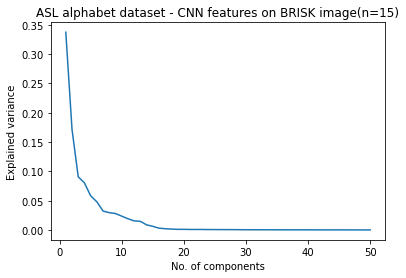

In [44]:
#finding right no. of principal components for PCA - applied to features extracted from a CNN since they can be extensive in number
k=50
X=np.array(t_data)
x_axis=[i for i in range(1,k+1)]
pca=PCA(n_components=k)
x_pca=pca.fit_transform(X)

plt.plot(x_axis,pca.explained_variance_ratio_)
plt.title('ASL alphabet dataset - CNN features on BRISK image(n=15)')
plt.ylabel('Explained variance')
plt.xlabel('No. of components')
plt.show()

